In [1]:
import os

import numpy as np

import tensorflow as tf
from tensorflow import keras



from RoadDataset import RoadDataset

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
val_datasets_path = "../notebooks/datasets/validation/"
sub_dirs = os.listdir(val_datasets_path)
val_dataset_paths = [[val_datasets_path + sub_dir + "/" + sub_dir + ".csv", val_datasets_path + sub_dir + "/frames/"] for sub_dir in sub_dirs]
val_dataset_paths

[['../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/Tag-Sonne-Wolken-Ausserorts.csv',
  '../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/frames/'],
 ['../notebooks/datasets/validation/Nacht-Schneechaos/Nacht-Schneechaos.csv',
  '../notebooks/datasets/validation/Nacht-Schneechaos/frames/']]

In [4]:
dataset_index = 0
column_names = ['filename','steering_wheel_angle','speed', 'blink_l', 'blink_r']
val_set = RoadDataset(val_dataset_paths[dataset_index][0], val_dataset_paths[dataset_index][1], column_names, batch_size=16)
val_set.clean()

Reading csv file: ../notebooks/datasets/validation/Tag-Sonne-Wolken-Ausserorts/Tag-Sonne-Wolken-Ausserorts.csv
Loaded dataset with 10474 samples
Cleaning dataset. Starting with 10474 samples.
Removing 0 rows for reason: SWA is NaN
Removing 3 rows for reason: No frame after cam latency compensation
Removing 290 rows for reason: High SWA (> +180/ < -180 deg)
Removing 915 rows for reason: Low speed (< 25 km/h)
Removing 66 rows for reason: Left blinker on
Removing 363 rows for reason: Right blinker on
8837 samples remaining.


In [5]:
stats = val_set.get_csv().describe()
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
steering_wheel_angle,8837.0,-1.781201,19.729146,-141.060,-3.940,-0.630,2.500,154.270
speed,8837.0,54.322306,11.746980,25.017,45.725,55.056,62.558,77.066
blink_l,8837.0,0.000000,0.000000,0.000,0.000,0.000,0.000,0.000
blink_r,8837.0,0.000000,0.000000,0.000,0.000,0.000,0.000,0.000


In [6]:
#val_set.balance()
#val_set.normalize()

In [7]:
stats = val_set.get_csv().describe()
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
steering_wheel_angle,8837.0,-1.781201,19.729146,-141.060,-3.940,-0.630,2.500,154.270
speed,8837.0,54.322306,11.746980,25.017,45.725,55.056,62.558,77.066
blink_l,8837.0,0.000000,0.000000,0.000,0.000,0.000,0.000,0.000
blink_r,8837.0,0.000000,0.000000,0.000,0.000,0.000,0.000,0.000


In [8]:
#model_name = 'diypilot_v1'
#model_name = 'diypilot_v2_epoch_10'
#model_name = 'diypilot_v3_epoch_5'
#model_name = 'openpilot_replica_epoch_59'
#model_name = 'openpilot_replica_mae_epoch_100'
#model_name = 'diypilot_v9_small_FC_epoch_3'
#model_name = 'diypilot_v11_random_shifts_epoch_3'
#model_name = 'diypilot_v11_random_shifts_full_balance_epoch_3'
#model_name = 'diypilot_v11_full_balance_epoch_163'
#model_name = 'diypilot_v12_epoch_58'
#model_name = 'diypilot_v13_sum_min5_overrepr_epoch_10'
#model_name = 'diypilot_v14_smaller_crop_epoch_3'
#model_name = 'diypilot_v14_smaller_crop_wider_epoch_3'
#model_name = 'diypilot_v14_smaller_crop_wider_white_corners_epoch_10'
#model_name = 'diypilot_v14_smaller_crop_wider_white_corners_random_shift_epoch_5'
#model_name = 'diypilot_v15_random_shift_and_offset_epoch_5'
#model_name = 'v17_epoch_1'
#model_name = 'v17.1_epoch_144'
#model_name = 'v17.1_epoch_13'
#model_name = 'v17.2_epoch_49'
model_name = 'v17.3_no_balance_epoch_1'
model_name = 'v17.4_flip_augmentation_epoch_1'
model_name = 'v17.6_symmetric_balancing_no_flip_epoch_18'
loaded_model = keras.models.load_model('./trained_models/' + model_name + '.h5')
loaded_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
frame_in (InputLayer)           [(None, 170, 640, 3) 0                                            
__________________________________________________________________________________________________
frame_normalize (Lambda)        (None, 170, 640, 3)  0           frame_in[0][0]                   
__________________________________________________________________________________________________
frame_downsample (MaxPooling2D) (None, 85, 213, 3)   0           frame_normalize[0][0]            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 27, 70, 24)   1824        frame_downsample[0][0]           
____________________________________________________________________________________________

In [9]:
import sys
sys.path.append("..") # Adds higher directory to python modules path.
from Jetson.autopilot.record.AutopilotGUI import AutopilotGUI

In [10]:
gui = AutopilotGUI()

In [11]:
def show_frame(test_image_index):

    test_sample = val_set.get_frame(test_image_index)
    test_image = test_sample[0]
    test_image_cropped = val_set.get_cropped_frame(test_image_index, shift=0, offset=0)[0]
    test_labels = test_sample[1]

    print("Test csv: " + str(test_labels))

    test_data = np.expand_dims(test_image_cropped, axis=0)
    predictions = loaded_model.predict(test_data)

    gui.set_frame(test_image)
    gui.set_show_overlay(True)
    gui.set_engaged(False)
    gui.set_recording(True)

    timestamp = test_labels['filename']
    gui.set_timestring(timestamp)

    velocity = test_labels['speed']
    gui.set_velocity(velocity)

    actual_swa = test_labels['steering_wheel_angle']*90
    gui.set_actual_swa(actual_swa)

    predicted_swa = predictions[0][0]*90
    print("Ground-truth: " +str(actual_swa))
    print("Prediction: " + str(predicted_swa))
    gui.set_predicted_swa(predicted_swa)

    gui.show_jupyter()

In [12]:
import ipywidgets as widgets
frame_slider = widgets.IntSlider(min=0, max=val_set.get_batch_size()*len(val_set)-1, continuous_update=False)

In [13]:
from ipywidgets import interact

interact(show_frame, test_image_index=frame_slider);

interactive(children=(IntSlider(value=0, continuous_update=False, description='test_image_index', max=8831), O…

In [14]:
import cv2
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(model_name + '.avi',fourcc, 15.0, (848,480))

In [15]:
framecount = val_set.get_batch_size()*len(val_set)
print(framecount)
ground_truth = []
predictions_list = []
velocity_list = []
#for i in range(1000):
for i in range(framecount):
    sample = val_set.get_sample(i)
    frame = sample['frame']
    
    sample = val_set.get_sample(i, augment=False, crop=True, normalize=False)
    cropped_frame = sample['frame']
    actual_swa = sample['swa']
    v_vehicle = sample['v_vehicle']
    blink_l = sample['blink_l']
    blink_r = sample['blink_r']
    timestamp = sample['filename']

    test_data = [np.array([cropped_frame]), np.array([v_vehicle/250])]
    print(test_data)
    predictions = loaded_model.predict(test_data)

    gui.set_frame(frame)
    gui.set_show_overlay(True)
    gui.set_engaged(False)
    gui.set_recording(True)

    
    gui.set_timestring(timestamp)
    
    velocity_list.append(v_vehicle)
    gui.set_velocity(v_vehicle)

    ground_truth.append(actual_swa)
    gui.set_actual_swa(actual_swa)

    predicted_swa = val_set.denormalize_swa(predictions[0][0])
    #predicted_swa = predictions[0][0]
    predictions_list.append(predicted_swa)
    print("Predictions: " + str(predictions))
    print("Ground-truth: " +str(actual_swa))
    print("Prediction: " + str(predicted_swa))
    gui.set_predicted_swa(predicted_swa)
    
    gui.render()
    frame = gui.get_rendered_gui()
    
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    out.write(rgb_frame.astype(np.uint8))
    
out.release()

8832
[array([[[[30, 30, 32],
         [31, 32, 34],
         [32, 34, 33],
         ...,
         [87, 77, 67],
         [98, 85, 77],
         [99, 84, 77]],

        [[31, 32, 34],
         [33, 34, 36],
         [31, 35, 36],
         ...,
         [85, 75, 66],
         [95, 85, 76],
         [98, 85, 77]],

        [[29, 28, 33],
         [31, 32, 34],
         [33, 34, 36],
         ...,
         [78, 69, 60],
         [91, 81, 72],
         [98, 88, 79]],

        ...,

        [[63, 53, 44],
         [64, 54, 45],
         [64, 54, 45],
         ...,
         [90, 74, 58],
         [91, 75, 59],
         [92, 76, 60]],

        [[61, 52, 43],
         [61, 52, 43],
         [62, 53, 44],
         ...,
         [88, 75, 58],
         [89, 76, 59],
         [90, 77, 60]],

        [[59, 50, 41],
         [61, 52, 43],
         [62, 53, 44],
         ...,
         [87, 74, 58],
         [88, 75, 59],
         [89, 76, 60]]]], dtype=uint8), array([0.100812])]
Predictions: [[-0.5812

Predictions: [[-0.25964865]]
Ground-truth: -1.88
Prediction: -3.6504872710221825
[array([[[[197, 191, 179],
         [196, 190, 178],
         [196, 190, 178],
         ...,
         [ 71,  72,  67],
         [ 74,  75,  69],
         [ 78,  79,  73]],

        [[197, 191, 179],
         [198, 192, 180],
         [200, 194, 182],
         ...,
         [ 64,  63,  58],
         [ 69,  70,  64],
         [ 77,  77,  69]],

        [[201, 195, 183],
         [201, 195, 183],
         [201, 195, 183],
         ...,
         [ 62,  61,  56],
         [ 65,  65,  57],
         [ 68,  68,  60]],

        ...,

        [[ 54,  49,  43],
         [ 54,  49,  43],
         [ 53,  48,  42],
         ...,
         [ 79,  69,  59],
         [ 78,  68,  58],
         [ 76,  66,  56]],

        [[ 54,  49,  43],
         [ 54,  49,  43],
         [ 54,  49,  43],
         ...,
         [ 77,  67,  57],
         [ 76,  66,  56],
         [ 76,  66,  56]],

        [[ 54,  49,  43],
         [ 54,  49

[array([[[[ 45,  45,  47],
         [ 53,  51,  54],
         [ 56,  51,  55],
         ...,
         [108,  88,  79],
         [106,  83,  75],
         [103,  80,  72]],

        [[115, 109, 111],
         [125, 116, 117],
         [130, 120, 121],
         ...,
         [112,  90,  79],
         [108,  84,  74],
         [104,  77,  68]],

        [[ 58,  42,  42],
         [ 56,  38,  38],
         [ 54,  34,  35],
         ...,
         [110,  86,  76],
         [109,  82,  73],
         [107,  78,  70]],

        ...,

        [[ 76,  61,  56],
         [ 76,  61,  56],
         [ 73,  58,  51],
         ...,
         [ 84,  69,  62],
         [ 83,  68,  61],
         [ 82,  67,  60]],

        [[ 76,  61,  56],
         [ 76,  61,  56],
         [ 74,  59,  54],
         ...,
         [ 83,  68,  61],
         [ 82,  67,  60],
         [ 81,  66,  59]],

        [[ 73,  58,  53],
         [ 75,  60,  55],
         [ 73,  58,  53],
         ...,
         [ 82,  67,  60],
       

[array([[[[79, 37, 38],
         [80, 36, 37],
         [79, 33, 35],
         ...,
         [46, 40, 50],
         [47, 42, 49],
         [50, 45, 51]],

        [[82, 33, 36],
         [78, 30, 30],
         [81, 33, 33],
         ...,
         [47, 42, 49],
         [47, 42, 49],
         [50, 45, 51]],

        [[81, 33, 33],
         [80, 32, 32],
         [77, 31, 31],
         ...,
         [50, 45, 52],
         [53, 48, 55],
         [55, 50, 56]],

        ...,

        [[73, 64, 55],
         [72, 63, 54],
         [69, 60, 51],
         ...,
         [81, 71, 61],
         [81, 71, 61],
         [81, 73, 62]],

        [[71, 62, 53],
         [71, 62, 53],
         [71, 62, 53],
         ...,
         [81, 71, 61],
         [81, 71, 61],
         [80, 72, 61]],

        [[69, 60, 51],
         [72, 63, 54],
         [74, 65, 56],
         ...,
         [80, 70, 60],
         [81, 71, 61],
         [80, 72, 61]]]], dtype=uint8), array([0.104904])]
Predictions: [[0.62745386]]

[array([[[[ 15,  25,  26],
         [ 16,  24,  26],
         [ 15,  23,  25],
         ...,
         [159, 152, 142],
         [169, 164, 158],
         [181, 178, 169]],

        [[ 16,  26,  25],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [164, 156, 145],
         [169, 162, 156],
         [167, 163, 154]],

        [[ 18,  27,  26],
         [ 17,  26,  25],
         [ 18,  27,  26],
         ...,
         [164, 156, 145],
         [166, 157, 150],
         [167, 158, 149]],

        ...,

        [[ 70,  63,  55],
         [ 71,  64,  56],
         [ 71,  64,  56],
         ...,
         [ 85,  79,  67],
         [ 88,  82,  70],
         [ 90,  84,  72]],

        [[ 76,  69,  61],
         [ 74,  67,  59],
         [ 69,  65,  56],
         ...,
         [ 84,  78,  66],
         [ 88,  82,  70],
         [ 91,  85,  73]],

        [[ 75,  68,  60],
         [ 73,  69,  60],
         [ 72,  68,  59],
         ...,
         [ 83,  77,  65],
       

[array([[[[ 20,  30,  42],
         [ 23,  33,  45],
         [ 21,  31,  43],
         ...,
         [254, 255, 249],
         [255, 255, 250],
         [255, 255, 250]],

        [[ 24,  36,  48],
         [ 23,  33,  45],
         [ 22,  32,  44],
         ...,
         [255, 255, 250],
         [255, 255, 250],
         [255, 255, 250]],

        [[ 20,  32,  44],
         [ 20,  32,  44],
         [ 19,  31,  43],
         ...,
         [255, 255, 251],
         [255, 255, 251],
         [255, 255, 251]],

        ...,

        [[ 57,  52,  46],
         [ 58,  53,  47],
         [ 60,  55,  49],
         ...,
         [101,  91,  79],
         [103,  93,  81],
         [102,  92,  80]],

        [[ 61,  56,  50],
         [ 63,  58,  52],
         [ 65,  60,  54],
         ...,
         [ 93,  83,  71],
         [ 96,  86,  74],
         [ 95,  85,  73]],

        [[ 67,  62,  56],
         [ 66,  61,  55],
         [ 64,  61,  54],
         ...,
         [ 88,  78,  66],
       

Predictions: [[-0.55602866]]
Ground-truth: -14.34
Prediction: -16.490587836199598
[array([[[[135, 106,  98],
         [129,  98,  95],
         [137, 110, 101],
         ...,
         [ 67,  41,  24],
         [ 64,  38,  21],
         [ 64,  38,  21]],

        [[131, 102,  94],
         [128,  97,  92],
         [129, 102,  93],
         ...,
         [ 63,  40,  22],
         [ 61,  38,  20],
         [ 61,  38,  20]],

        [[123,  95,  84],
         [122,  91,  86],
         [118,  89,  83],
         ...,
         [ 62,  41,  24],
         [ 59,  38,  21],
         [ 59,  38,  21]],

        ...,

        [[ 57,  48,  41],
         [ 60,  49,  43],
         [ 58,  47,  41],
         ...,
         [ 55,  40,  35],
         [ 55,  40,  35],
         [ 55,  40,  35]],

        [[ 59,  48,  42],
         [ 60,  49,  43],
         [ 59,  48,  42],
         ...,
         [ 55,  40,  33],
         [ 56,  41,  36],
         [ 56,  41,  36]],

        [[ 60,  49,  43],
         [ 61,  5

Predictions: [[-0.59300965]]
Ground-truth: -14.53
Prediction: -19.43844452410254
[array([[[[ 52,  39,  46],
         [101,  88,  80],
         [158, 145, 128],
         ...,
         [ 88,  60,  36],
         [ 88,  60,  36],
         [ 86,  58,  34]],

        [[ 56,  44,  48],
         [ 99,  86,  77],
         [152, 141, 123],
         ...,
         [ 85,  58,  31],
         [ 88,  58,  32],
         [ 90,  60,  34]],

        [[ 50,  38,  40],
         [ 86,  76,  64],
         [148, 140, 121],
         ...,
         [ 79,  52,  25],
         [ 83,  53,  27],
         [ 87,  57,  31]],

        ...,

        [[ 66,  62,  50],
         [ 64,  60,  48],
         [ 63,  59,  47],
         ...,
         [ 72,  62,  50],
         [ 72,  62,  50],
         [ 72,  62,  50]],

        [[ 64,  60,  48],
         [ 63,  59,  47],
         [ 64,  60,  48],
         ...,
         [ 73,  63,  51],
         [ 73,  63,  51],
         [ 72,  62,  50]],

        [[ 63,  59,  47],
         [ 62,  58

Predictions: [[-0.5413428]]
Ground-truth: -18.97
Prediction: -15.435674399069793
[array([[[[254, 255, 251],
         [251, 253, 248],
         [254, 255, 253],
         ...,
         [101,  67,  42],
         [101,  67,  42],
         [102,  68,  43]],

        [[251, 255, 250],
         [252, 255, 253],
         [252, 255, 253],
         ...,
         [ 97,  62,  40],
         [ 97,  62,  40],
         [ 99,  64,  42]],

        [[252, 255, 251],
         [251, 255, 253],
         [252, 255, 253],
         ...,
         [ 98,  63,  41],
         [ 98,  63,  41],
         [ 94,  59,  37]],

        ...,

        [[ 76,  62,  51],
         [ 78,  64,  53],
         [ 78,  64,  53],
         ...,
         [ 71,  57,  46],
         [ 68,  54,  43],
         [ 68,  54,  43]],

        [[ 76,  62,  51],
         [ 77,  63,  52],
         [ 77,  63,  52],
         ...,
         [ 69,  55,  44],
         [ 67,  53,  42],
         [ 68,  54,  43]],

        [[ 74,  62,  50],
         [ 76,  64

Predictions: [[-0.660945]]
Ground-truth: -20.47
Prediction: -26.132547318206583
[array([[[[121, 101,  90],
         [113,  97,  82],
         [110,  97,  81],
         ...,
         [ 18,  14,  11],
         [ 18,  14,  11],
         [ 17,  13,  10]],

        [[130, 111, 104],
         [129, 115, 106],
         [137, 127, 117],
         ...,
         [ 16,  15,  11],
         [ 16,  15,  11],
         [ 15,  14,  10]],

        [[112,  88,  84],
         [ 93,  75,  71],
         [ 76,  62,  59],
         ...,
         [ 16,  15,  11],
         [ 16,  15,  11],
         [ 16,  15,  10]],

        ...,

        [[ 84,  68,  55],
         [ 85,  67,  55],
         [ 85,  67,  55],
         ...,
         [ 49,  38,  34],
         [ 50,  39,  35],
         [ 50,  39,  35]],

        [[ 84,  68,  55],
         [ 84,  66,  54],
         [ 84,  66,  54],
         ...,
         [ 49,  38,  34],
         [ 49,  38,  34],
         [ 50,  39,  35]],

        [[ 84,  68,  55],
         [ 84,  66,

Predictions: [[-0.5788594]]
Ground-truth: -20.85
Prediction: -18.258708203868824
[array([[[[104,  42,  31],
         [160,  58,  43],
         [197,  50,  34],
         ...,
         [ 94,  81,  72],
         [ 93,  80,  71],
         [ 92,  79,  70]],

        [[ 98,  42,  29],
         [154,  58,  42],
         [193,  52,  35],
         ...,
         [ 93,  80,  71],
         [ 92,  79,  70],
         [ 91,  78,  69]],

        [[ 96,  47,  32],
         [141,  54,  35],
         [189,  56,  37],
         ...,
         [ 92,  79,  70],
         [ 90,  77,  68],
         [ 90,  77,  68]],

        ...,

        [[ 78,  64,  53],
         [ 80,  63,  53],
         [ 79,  62,  52],
         ...,
         [ 68,  54,  45],
         [ 69,  55,  46],
         [ 70,  56,  47]],

        [[ 77,  63,  52],
         [ 78,  64,  53],
         [ 80,  63,  53],
         ...,
         [ 67,  54,  45],
         [ 69,  55,  46],
         [ 69,  55,  46]],

        [[ 76,  62,  51],
         [ 78,  64

Predictions: [[-0.5265424]]
Ground-truth: -18.72
Prediction: -14.43341695952514
[array([[[[217, 182,  90],
         [209, 189,  94],
         [208, 189,  94],
         ...,
         [ 81,  70,  64],
         [ 86,  75,  69],
         [ 82,  71,  65]],

        [[219, 182,  91],
         [206, 186,  91],
         [202, 186,  91],
         ...,
         [ 80,  70,  61],
         [ 85,  75,  66],
         [ 82,  72,  63]],

        [[218, 179,  88],
         [209, 189,  94],
         [204, 188,  92],
         ...,
         [ 81,  71,  62],
         [ 87,  77,  68],
         [ 81,  71,  62]],

        ...,

        [[ 76,  62,  49],
         [ 77,  63,  50],
         [ 77,  63,  50],
         ...,
         [ 50,  42,  39],
         [ 49,  41,  39],
         [ 49,  41,  39]],

        [[ 76,  62,  49],
         [ 77,  63,  50],
         [ 77,  63,  50],
         ...,
         [ 50,  42,  39],
         [ 50,  42,  40],
         [ 49,  41,  39]],

        [[ 77,  63,  50],
         [ 77,  63,

[array([[[[78, 58, 34],
         [76, 56, 32],
         [72, 51, 30],
         ...,
         [61, 51, 42],
         [94, 84, 75],
         [63, 53, 44]],

        [[70, 50, 26],
         [65, 45, 21],
         [65, 44, 23],
         ...,
         [63, 53, 44],
         [93, 83, 74],
         [60, 50, 41]],

        [[67, 47, 23],
         [63, 42, 21],
         [68, 47, 26],
         ...,
         [64, 54, 45],
         [95, 85, 76],
         [57, 47, 38]],

        ...,

        [[58, 45, 37],
         [58, 45, 37],
         [58, 45, 37],
         ...,
         [56, 47, 42],
         [56, 47, 42],
         [54, 45, 40]],

        [[59, 44, 37],
         [59, 44, 37],
         [60, 45, 38],
         ...,
         [54, 44, 42],
         [53, 43, 41],
         [52, 42, 40]],

        [[59, 44, 37],
         [59, 44, 37],
         [60, 45, 38],
         ...,
         [52, 42, 40],
         [51, 41, 39],
         [50, 40, 38]]]], dtype=uint8), array([0.12214])]
Predictions: [[-0.558978]]
G

Predictions: [[-0.36250457]]
Ground-truth: -5.45
Prediction: -6.52638494839843
[array([[[[ 74, 190, 231],
         [ 79, 200, 247],
         [ 69, 193, 244],
         ...,
         [ 95,  80,  75],
         [ 90,  75,  70],
         [ 92,  77,  72]],

        [[ 77, 189, 227],
         [ 77, 198, 241],
         [ 79, 204, 250],
         ...,
         [ 97,  82,  77],
         [ 90,  75,  70],
         [ 96,  81,  76]],

        [[ 94, 191, 223],
         [ 90, 197, 233],
         [ 88, 201, 241],
         ...,
         [102,  87,  82],
         [ 91,  76,  71],
         [ 97,  82,  77]],

        ...,

        [[ 74,  58,  45],
         [ 76,  60,  47],
         [ 77,  61,  48],
         ...,
         [ 52,  43,  36],
         [ 51,  42,  35],
         [ 50,  41,  32]],

        [[ 71,  57,  44],
         [ 74,  58,  45],
         [ 75,  59,  46],
         ...,
         [ 53,  44,  37],
         [ 52,  43,  36],
         [ 50,  41,  32]],

        [[ 71,  57,  44],
         [ 73,  57, 

Predictions: [[-0.4657647]]
Ground-truth: -4.01
Prediction: -10.886831628828684
[array([[[[121, 105,  46],
         [119, 100,  58],
         [114,  93,  62],
         ...,
         [164, 154, 145],
         [179, 166, 160],
         [141, 128, 122]],

        [[129, 108,  53],
         [127, 104,  63],
         [121,  94,  64],
         ...,
         [153, 143, 134],
         [165, 152, 146],
         [126, 113, 107]],

        [[151, 127,  79],
         [165, 137,  98],
         [182, 151, 120],
         ...,
         [141, 131, 122],
         [151, 138, 132],
         [121, 108, 102]],

        ...,

        [[ 64,  50,  41],
         [ 63,  50,  41],
         [ 63,  50,  41],
         ...,
         [ 49,  40,  33],
         [ 49,  40,  33],
         [ 48,  39,  32]],

        [[ 63,  50,  41],
         [ 63,  50,  41],
         [ 63,  50,  41],
         ...,
         [ 48,  39,  32],
         [ 48,  39,  32],
         [ 48,  39,  32]],

        [[ 64,  51,  42],
         [ 63,  50,

Predictions: [[-0.5279813]]
Ground-truth: -4.19
Prediction: -14.52827095076151
[array([[[[213, 195, 173],
         [220, 199, 178],
         [208, 187, 168],
         ...,
         [177, 164, 158],
         [181, 168, 162],
         [177, 164, 158]],

        [[217, 195, 174],
         [223, 192, 174],
         [216, 179, 163],
         ...,
         [177, 168, 161],
         [177, 168, 161],
         [181, 172, 167]],

        [[178, 141, 123],
         [146,  92,  80],
         [130,  66,  57],
         ...,
         [181, 172, 165],
         [180, 171, 164],
         [179, 170, 165]],

        ...,

        [[ 63,  50,  42],
         [ 62,  49,  41],
         [ 62,  49,  41],
         ...,
         [ 59,  49,  40],
         [ 60,  50,  41],
         [ 61,  51,  42]],

        [[ 63,  50,  42],
         [ 62,  49,  41],
         [ 61,  48,  40],
         ...,
         [ 58,  48,  39],
         [ 59,  49,  40],
         [ 60,  50,  41]],

        [[ 63,  50,  42],
         [ 62,  49, 

Predictions: [[-0.29768568]]
Ground-truth: -5.13
Prediction: -4.579047063376712
[array([[[[202, 169, 134],
         [195, 162, 127],
         [179, 146, 111],
         ...,
         [ 49,  32,  16],
         [ 49,  32,  14],
         [ 50,  33,  15]],

        [[174, 135, 104],
         [167, 128,  97],
         [131,  92,  61],
         ...,
         [ 48,  32,  16],
         [ 49,  33,  17],
         [ 49,  33,  17]],

        [[106,  69,  42],
         [101,  61,  35],
         [ 94,  54,  29],
         ...,
         [ 47,  31,  16],
         [ 46,  33,  17],
         [ 45,  32,  15]],

        ...,

        [[ 60,  47,  39],
         [ 59,  46,  38],
         [ 59,  46,  38],
         ...,
         [ 51,  42,  35],
         [ 51,  42,  35],
         [ 51,  42,  35]],

        [[ 58,  48,  39],
         [ 60,  47,  39],
         [ 59,  46,  38],
         ...,
         [ 51,  42,  35],
         [ 51,  42,  35],
         [ 52,  41,  35]],

        [[ 59,  49,  40],
         [ 58,  48,

Predictions: [[0.39127225]]
Ground-truth: -5.01
Prediction: 7.5662011048058115
[array([[[[ 95, 109, 118],
         [ 95, 112, 122],
         [ 93, 113, 124],
         ...,
         [ 58,  39,  24],
         [ 58,  39,  24],
         [ 57,  38,  23]],

        [[ 94, 107, 116],
         [ 93, 110, 118],
         [ 91, 111, 120],
         ...,
         [ 57,  38,  24],
         [ 59,  40,  25],
         [ 57,  38,  23]],

        [[ 95, 104, 113],
         [ 89, 100, 106],
         [ 90, 103, 109],
         ...,
         [ 52,  34,  20],
         [ 58,  39,  25],
         [ 58,  39,  25]],

        ...,

        [[ 62,  49,  41],
         [ 62,  49,  41],
         [ 62,  49,  41],
         ...,
         [ 52,  43,  38],
         [ 52,  43,  38],
         [ 51,  42,  37]],

        [[ 62,  49,  41],
         [ 62,  49,  41],
         [ 62,  49,  41],
         ...,
         [ 53,  44,  39],
         [ 52,  43,  38],
         [ 51,  42,  37]],

        [[ 62,  49,  41],
         [ 62,  49, 

Predictions: [[-0.21993072]]
Ground-truth: -2.5
Prediction: -2.82046344472389
[array([[[[ 71, 127, 150],
         [ 70, 128, 150],
         [ 69, 127, 149],
         ...,
         [ 62,  41,  20],
         [ 57,  36,  17],
         [ 58,  37,  20]],

        [[ 70, 128, 150],
         [ 68, 129, 150],
         [ 69, 127, 147],
         ...,
         [ 48,  31,  13],
         [ 59,  42,  26],
         [ 56,  38,  24]],

        [[ 69, 129, 153],
         [ 65, 127, 148],
         [ 65, 128, 146],
         ...,
         [ 46,  33,  17],
         [ 53,  39,  26],
         [ 49,  35,  22]],

        ...,

        [[ 52,  49,  40],
         [ 52,  49,  40],
         [ 52,  49,  40],
         ...,
         [ 38,  39,  34],
         [ 38,  39,  34],
         [ 39,  38,  34]],

        [[ 52,  49,  40],
         [ 52,  49,  40],
         [ 52,  49,  40],
         ...,
         [ 39,  40,  35],
         [ 40,  39,  35],
         [ 39,  38,  34]],

        [[ 52,  49,  40],
         [ 52,  49,  

Predictions: [[-0.01875784]]
Ground-truth: -0.63
Prediction: -0.1558358969944953
[array([[[[100,  95,  91],
         [ 81,  78,  73],
         [ 73,  75,  70],
         ...,
         [ 83,  64,  47],
         [ 75,  58,  42],
         [ 66,  52,  39]],

        [[112, 113, 108],
         [104, 109, 105],
         [ 98, 109, 105],
         ...,
         [ 88,  67,  50],
         [ 76,  59,  43],
         [ 65,  51,  38]],

        [[ 98, 104, 104],
         [ 94, 104, 103],
         [ 94, 110, 110],
         ...,
         [ 84,  63,  46],
         [ 69,  52,  36],
         [ 65,  51,  38]],

        ...,

        [[ 61,  52,  47],
         [ 61,  52,  47],
         [ 61,  52,  47],
         ...,
         [ 44,  37,  31],
         [ 44,  37,  31],
         [ 46,  37,  32]],

        [[ 61,  52,  47],
         [ 61,  52,  47],
         [ 61,  52,  47],
         ...,
         [ 44,  36,  33],
         [ 44,  36,  33],
         [ 44,  36,  33]],

        [[ 62,  53,  48],
         [ 62,  53

[array([[[[ 88, 121, 138],
         [ 90, 119, 137],
         [ 91, 118, 137],
         ...,
         [ 86,  69,  49],
         [121, 105,  80],
         [131, 115,  89]],

        [[ 90, 119, 137],
         [ 91, 116, 136],
         [ 93, 116, 134],
         ...,
         [ 82,  67,  46],
         [125, 109,  84],
         [131, 115,  89]],

        [[ 90, 118, 132],
         [ 93, 116, 132],
         [ 95, 117, 131],
         ...,
         [ 85,  70,  51],
         [119, 103,  80],
         [129, 113,  87]],

        ...,

        [[ 70,  56,  43],
         [ 70,  56,  43],
         [ 70,  56,  43],
         ...,
         [ 51,  38,  29],
         [ 49,  36,  27],
         [ 48,  35,  26]],

        [[ 69,  55,  42],
         [ 69,  55,  42],
         [ 68,  54,  41],
         ...,
         [ 51,  37,  28],
         [ 49,  36,  27],
         [ 48,  35,  26]],

        [[ 67,  55,  41],
         [ 66,  54,  40],
         [ 65,  53,  39],
         ...,
         [ 51,  37,  28],
       

[array([[[[206, 189, 163],
         [200, 182, 160],
         [195, 174, 155],
         ...,
         [134, 124, 122],
         [142, 132, 130],
         [148, 138, 136]],

        [[204, 187, 161],
         [202, 184, 162],
         [191, 173, 153],
         ...,
         [104,  96,  93],
         [123, 115, 112],
         [137, 129, 127]],

        [[197, 180, 154],
         [199, 181, 159],
         [192, 174, 154],
         ...,
         [127, 122, 118],
         [115, 110, 106],
         [116, 111, 108]],

        ...,

        [[ 67,  61,  49],
         [ 68,  62,  50],
         [ 69,  63,  51],
         ...,
         [ 43,  40,  33],
         [ 40,  40,  32],
         [ 41,  41,  33]],

        [[ 70,  64,  52],
         [ 71,  65,  53],
         [ 71,  65,  53],
         ...,
         [ 43,  40,  33],
         [ 43,  40,  33],
         [ 43,  40,  33]],

        [[ 71,  65,  53],
         [ 71,  65,  53],
         [ 71,  65,  53],
         ...,
         [ 42,  39,  32],
       

Predictions: [[-0.22489919]]
Ground-truth: 2.69
Prediction: -2.917222955928681
[array([[[[255, 247, 216],
         [255, 247, 214],
         [255, 239, 209],
         ...,
         [ 47,  38,  31],
         [ 47,  40,  32],
         [ 48,  41,  33]],

        [[255, 241, 212],
         [255, 237, 206],
         [249, 228, 199],
         ...,
         [ 46,  42,  33],
         [ 45,  41,  32],
         [ 46,  41,  35]],

        [[246, 219, 192],
         [249, 222, 193],
         [244, 218, 191],
         ...,
         [ 47,  44,  37],
         [ 44,  41,  34],
         [ 45,  42,  35]],

        ...,

        [[ 73,  65,  54],
         [ 72,  64,  53],
         [ 72,  62,  52],
         ...,
         [ 31,  38,  31],
         [ 32,  39,  32],
         [ 33,  40,  33]],

        [[ 73,  65,  54],
         [ 73,  63,  53],
         [ 72,  62,  52],
         ...,
         [ 32,  39,  32],
         [ 33,  40,  33],
         [ 33,  40,  33]],

        [[ 75,  65,  55],
         [ 74,  64, 

[array([[[[252, 253, 222],
         [255, 255, 222],
         [255, 252, 217],
         ...,
         [ 57,  54,  45],
         [ 56,  52,  41],
         [ 59,  52,  42]],

        [[255, 255, 224],
         [255, 255, 219],
         [255, 254, 219],
         ...,
         [ 59,  56,  47],
         [ 56,  52,  43],
         [ 58,  51,  41]],

        [[255, 255, 224],
         [253, 253, 217],
         [255, 253, 215],
         ...,
         [ 60,  57,  48],
         [ 55,  51,  42],
         [ 58,  54,  43]],

        ...,

        [[ 56,  52,  43],
         [ 56,  52,  43],
         [ 56,  52,  43],
         ...,
         [ 31,  36,  32],
         [ 31,  36,  32],
         [ 31,  36,  32]],

        [[ 56,  52,  43],
         [ 56,  52,  43],
         [ 56,  52,  43],
         ...,
         [ 31,  36,  32],
         [ 31,  36,  32],
         [ 30,  35,  31]],

        [[ 56,  52,  43],
         [ 56,  52,  43],
         [ 56,  52,  43],
         ...,
         [ 31,  36,  32],
       

[array([[[[43, 49, 65],
         [41, 46, 65],
         [39, 44, 63],
         ...,
         [89, 72, 64],
         [81, 64, 56],
         [70, 56, 47]],

        [[39, 45, 61],
         [37, 43, 59],
         [35, 40, 59],
         ...,
         [83, 66, 59],
         [73, 58, 51],
         [75, 60, 53]],

        [[37, 43, 57],
         [37, 43, 59],
         [34, 40, 56],
         ...,
         [79, 64, 59],
         [74, 59, 54],
         [73, 58, 55]],

        ...,

        [[60, 52, 50],
         [60, 52, 50],
         [60, 52, 50],
         ...,
         [48, 44, 45],
         [47, 43, 44],
         [47, 43, 44]],

        [[60, 52, 50],
         [59, 51, 49],
         [61, 53, 51],
         ...,
         [46, 42, 43],
         [47, 43, 44],
         [45, 43, 44]],

        [[59, 51, 49],
         [59, 51, 49],
         [60, 52, 50],
         ...,
         [43, 41, 42],
         [44, 42, 43],
         [45, 43, 44]]]], dtype=uint8), array([0.156116])]
Predictions: [[-0.57938766]

Predictions: [[-0.64327383]]
Ground-truth: -1.94
Prediction: -24.21266005367761
[array([[[[69, 70, 91],
         [74, 73, 89],
         [79, 78, 86],
         ...,
         [57, 47, 37],
         [64, 52, 40],
         [69, 57, 45]],

        [[68, 69, 87],
         [68, 70, 85],
         [80, 80, 90],
         ...,
         [58, 48, 36],
         [66, 54, 42],
         [73, 59, 48]],

        [[62, 65, 74],
         [65, 67, 79],
         [77, 80, 89],
         ...,
         [60, 50, 38],
         [74, 62, 50],
         [79, 65, 54]],

        ...,

        [[48, 47, 43],
         [49, 48, 44],
         [49, 48, 44],
         ...,
         [35, 37, 34],
         [36, 38, 35],
         [37, 39, 36]],

        [[49, 48, 44],
         [49, 48, 44],
         [49, 48, 44],
         ...,
         [35, 37, 34],
         [35, 37, 34],
         [36, 38, 35]],

        [[49, 48, 44],
         [50, 49, 45],
         [50, 49, 45],
         ...,
         [35, 37, 34],
         [35, 37, 34],
      

Predictions: [[-0.01332637]]
Ground-truth: -2.69
Prediction: -0.10950356501675751
[array([[[[192, 188, 179],
         [188, 186, 171],
         [188, 187, 167],
         ...,
         [ 51,  34,  26],
         [ 49,  32,  24],
         [ 47,  33,  24]],

        [[160, 157, 152],
         [171, 168, 159],
         [185, 183, 171],
         ...,
         [ 50,  33,  25],
         [ 49,  32,  24],
         [ 49,  32,  24]],

        [[149, 148, 146],
         [152, 151, 147],
         [148, 147, 142],
         ...,
         [ 54,  36,  26],
         [ 51,  34,  26],
         [ 48,  31,  23]],

        ...,

        [[ 53,  49,  48],
         [ 53,  49,  46],
         [ 51,  47,  44],
         ...,
         [ 36,  36,  34],
         [ 37,  37,  35],
         [ 37,  37,  35]],

        [[ 52,  48,  47],
         [ 52,  48,  45],
         [ 50,  46,  43],
         ...,
         [ 36,  36,  34],
         [ 36,  36,  34],
         [ 36,  36,  34]],

        [[ 52,  48,  47],
         [ 52,  4

Predictions: [[0.11065397]]
Ground-truth: -2.69
Prediction: 1.1135484211880509
[array([[[[71, 60, 64],
         [63, 51, 55],
         [65, 53, 57],
         ...,
         [46, 39, 31],
         [46, 39, 31],
         [36, 27, 20]],

        [[72, 63, 66],
         [71, 60, 64],
         [70, 59, 63],
         ...,
         [39, 32, 24],
         [42, 35, 27],
         [32, 23, 16]],

        [[69, 63, 67],
         [68, 59, 64],
         [68, 59, 64],
         ...,
         [37, 30, 22],
         [36, 29, 21],
         [32, 23, 16]],

        ...,

        [[73, 66, 60],
         [74, 67, 61],
         [73, 66, 60],
         ...,
         [49, 46, 41],
         [50, 47, 42],
         [50, 47, 42]],

        [[70, 65, 59],
         [71, 66, 60],
         [70, 65, 59],
         ...,
         [50, 47, 42],
         [51, 48, 43],
         [51, 48, 43]],

        [[70, 65, 59],
         [70, 65, 59],
         [70, 65, 59],
         ...,
         [51, 48, 43],
         [51, 48, 43],
       

[array([[[[60, 55, 49],
         [59, 54, 48],
         [56, 51, 47],
         ...,
         [46, 37, 32],
         [52, 43, 38],
         [56, 49, 43]],

        [[60, 55, 49],
         [59, 54, 48],
         [57, 52, 48],
         ...,
         [47, 40, 34],
         [53, 46, 40],
         [57, 49, 46]],

        [[62, 57, 51],
         [58, 53, 47],
         [55, 50, 44],
         ...,
         [51, 42, 37],
         [59, 49, 47],
         [56, 48, 45]],

        ...,

        [[68, 65, 58],
         [68, 65, 58],
         [69, 66, 59],
         ...,
         [60, 55, 51],
         [58, 53, 49],
         [59, 54, 50]],

        [[67, 64, 57],
         [67, 64, 57],
         [68, 65, 58],
         ...,
         [60, 55, 51],
         [59, 54, 50],
         [61, 56, 52]],

        [[66, 63, 56],
         [67, 64, 57],
         [68, 65, 58],
         ...,
         [61, 53, 50],
         [61, 53, 50],
         [63, 55, 52]]]], dtype=uint8), array([0.162812])]
Predictions: [[0.27371523]]

[array([[[[ 93,  82,  78],
         [ 81,  70,  64],
         [ 79,  70,  63],
         ...,
         [ 92,  83,  78],
         [100,  91,  86],
         [ 72,  65,  59]],

        [[102,  91,  85],
         [ 85,  74,  68],
         [ 79,  70,  63],
         ...,
         [ 91,  82,  77],
         [ 92,  85,  79],
         [ 73,  68,  62]],

        [[110,  99,  93],
         [ 88,  77,  71],
         [ 84,  73,  67],
         ...,
         [116, 109, 103],
         [ 98,  93,  87],
         [ 77,  74,  67]],

        ...,

        [[ 85,  72,  64],
         [ 85,  72,  64],
         [ 85,  72,  64],
         ...,
         [ 69,  59,  49],
         [ 69,  59,  49],
         [ 69,  59,  49]],

        [[ 86,  73,  65],
         [ 86,  73,  65],
         [ 86,  73,  65],
         ...,
         [ 68,  58,  48],
         [ 69,  59,  49],
         [ 71,  58,  49]],

        [[ 86,  73,  65],
         [ 87,  74,  66],
         [ 86,  73,  65],
         ...,
         [ 68,  58,  48],
       

[array([[[[ 53,  42,  46],
         [ 56,  43,  50],
         [ 59,  46,  53],
         ...,
         [ 36,  28,  25],
         [ 38,  31,  25],
         [ 40,  35,  29]],

        [[ 56,  45,  49],
         [ 56,  45,  51],
         [ 61,  48,  57],
         ...,
         [ 35,  27,  24],
         [ 36,  28,  25],
         [ 41,  34,  28]],

        [[ 59,  50,  53],
         [ 59,  48,  54],
         [ 61,  48,  57],
         ...,
         [ 35,  27,  24],
         [ 36,  28,  25],
         [ 38,  31,  25]],

        ...,

        [[ 62,  56,  56],
         [ 62,  56,  56],
         [ 62,  56,  56],
         ...,
         [109,  99,  97],
         [110, 100,  98],
         [115, 105, 103]],

        [[ 62,  56,  56],
         [ 63,  57,  57],
         [ 63,  57,  57],
         ...,
         [116, 105, 101],
         [113, 102, 100],
         [109,  98,  96]],

        [[ 63,  57,  57],
         [ 63,  57,  57],
         [ 63,  57,  57],
         ...,
         [111, 100,  96],
       

[array([[[[39, 36, 21],
         [43, 41, 29],
         [86, 81, 77],
         ...,
         [48, 44, 33],
         [43, 36, 26],
         [36, 29, 19]],

        [[48, 44, 32],
         [34, 34, 22],
         [80, 79, 74],
         ...,
         [40, 36, 25],
         [34, 30, 19],
         [38, 31, 21]],

        [[46, 44, 31],
         [34, 36, 25],
         [66, 69, 62],
         ...,
         [37, 33, 22],
         [34, 30, 19],
         [34, 30, 19]],

        ...,

        [[61, 61, 59],
         [61, 61, 59],
         [60, 60, 58],
         ...,
         [40, 41, 35],
         [41, 42, 36],
         [42, 43, 37]],

        [[61, 61, 59],
         [61, 61, 59],
         [60, 60, 58],
         ...,
         [41, 42, 36],
         [42, 43, 37],
         [42, 43, 37]],

        [[61, 61, 59],
         [61, 61, 59],
         [61, 61, 59],
         ...,
         [43, 42, 37],
         [43, 44, 38],
         [43, 44, 38]]]], dtype=uint8), array([0.164424])]
Predictions: [[0.16944851]]

[array([[[[217, 182, 163],
         [204, 168, 156],
         [148, 111, 103],
         ...,
         [ 40,  36,  25],
         [ 37,  33,  22],
         [ 34,  32,  20]],

        [[157, 107, 100],
         [153, 108, 105],
         [134,  94,  92],
         ...,
         [ 38,  36,  24],
         [ 33,  31,  19],
         [ 30,  28,  16]],

        [[183, 135, 131],
         [181, 141, 139],
         [165, 135, 133],
         ...,
         [ 36,  34,  22],
         [ 32,  30,  18],
         [ 31,  29,  17]],

        ...,

        [[ 60,  60,  58],
         [ 59,  59,  57],
         [ 60,  60,  58],
         ...,
         [ 32,  34,  29],
         [ 33,  35,  30],
         [ 33,  35,  30]],

        [[ 61,  61,  59],
         [ 59,  59,  57],
         [ 60,  60,  58],
         ...,
         [ 33,  35,  30],
         [ 33,  35,  30],
         [ 33,  35,  30]],

        [[ 62,  62,  60],
         [ 59,  59,  57],
         [ 60,  60,  58],
         ...,
         [ 33,  35,  30],
       

[array([[[[62, 64, 61],
         [62, 64, 63],
         [63, 65, 64],
         ...,
         [34, 32, 20],
         [32, 30, 18],
         [33, 31, 19]],

        [[66, 66, 64],
         [66, 66, 66],
         [64, 64, 64],
         ...,
         [34, 32, 20],
         [32, 30, 18],
         [33, 31, 19]],

        [[68, 67, 65],
         [62, 61, 59],
         [63, 63, 63],
         ...,
         [33, 31, 19],
         [32, 30, 18],
         [31, 29, 17]],

        ...,

        [[60, 59, 55],
         [59, 58, 54],
         [60, 59, 55],
         ...,
         [29, 32, 25],
         [31, 32, 26],
         [30, 31, 25]],

        [[59, 58, 56],
         [59, 58, 56],
         [61, 60, 56],
         ...,
         [29, 32, 25],
         [31, 32, 26],
         [31, 32, 26]],

        [[58, 57, 55],
         [60, 59, 57],
         [62, 61, 59],
         ...,
         [31, 32, 26],
         [33, 34, 28],
         [33, 34, 28]]]], dtype=uint8), array([0.16492])]
Predictions: [[-0.10031325]]

[array([[[[40, 36, 24],
         [38, 36, 23],
         [40, 38, 25],
         ...,
         [28, 26, 13],
         [26, 24, 11],
         [27, 25, 12]],

        [[40, 36, 25],
         [39, 35, 24],
         [40, 36, 25],
         ...,
         [28, 26, 13],
         [26, 24, 11],
         [26, 24, 11]],

        [[35, 31, 20],
         [37, 33, 22],
         [38, 34, 23],
         ...,
         [27, 25, 12],
         [26, 24, 11],
         [26, 24, 11]],

        ...,

        [[59, 58, 53],
         [60, 59, 54],
         [60, 59, 54],
         ...,
         [32, 35, 28],
         [33, 34, 28],
         [33, 34, 28]],

        [[60, 59, 55],
         [60, 59, 55],
         [59, 58, 54],
         ...,
         [31, 34, 27],
         [31, 34, 27],
         [31, 34, 27]],

        [[60, 59, 55],
         [60, 59, 55],
         [59, 58, 54],
         ...,
         [30, 33, 26],
         [29, 32, 25],
         [30, 33, 26]]]], dtype=uint8), array([0.165664])]
Predictions: [[0.09270191]]

Predictions: [[-0.11213249]]
Ground-truth: 1.19
Prediction: -1.132016791186743
[array([[[[144, 131, 112],
         [146, 133, 114],
         [149, 138, 120],
         ...,
         [ 22,  22,  12],
         [ 24,  24,  14],
         [ 23,  23,  13]],

        [[146, 135, 115],
         [142, 131, 113],
         [143, 131, 115],
         ...,
         [ 22,  22,  12],
         [ 24,  24,  14],
         [ 23,  23,  13]],

        [[146, 135, 117],
         [141, 129, 113],
         [137, 128, 113],
         ...,
         [ 22,  22,  12],
         [ 23,  23,  13],
         [ 23,  23,  13]],

        ...,

        [[ 57,  58,  53],
         [ 56,  57,  52],
         [ 55,  56,  51],
         ...,
         [ 29,  31,  26],
         [ 29,  31,  26],
         [ 29,  31,  26]],

        [[ 56,  57,  52],
         [ 56,  57,  52],
         [ 56,  57,  52],
         ...,
         [ 29,  31,  26],
         [ 29,  31,  26],
         [ 29,  31,  26]],

        [[ 56,  57,  52],
         [ 56,  57, 

Predictions: [[0.04019285]]
Ground-truth: -0.19
Prediction: 0.3488329674231605
[array([[[[234, 208, 195],
         [240, 217, 203],
         [234, 208, 193],
         ...,
         [ 21,  23,  12],
         [ 21,  23,  12],
         [ 21,  23,  12]],

        [[161, 138, 124],
         [161, 138, 124],
         [139, 113, 100],
         ...,
         [ 21,  23,  12],
         [ 21,  23,  12],
         [ 20,  22,  11]],

        [[ 96,  72,  60],
         [108,  84,  72],
         [102,  79,  65],
         ...,
         [ 21,  23,  12],
         [ 20,  22,  11],
         [ 20,  22,  11]],

        ...,

        [[ 53,  54,  49],
         [ 52,  54,  49],
         [ 52,  54,  49],
         ...,
         [ 30,  32,  27],
         [ 30,  32,  27],
         [ 30,  32,  27]],

        [[ 53,  55,  50],
         [ 53,  55,  50],
         [ 53,  55,  50],
         ...,
         [ 31,  33,  28],
         [ 30,  32,  27],
         [ 30,  32,  27]],

        [[ 54,  56,  51],
         [ 54,  56, 

Predictions: [[-0.12268139]]
Ground-truth: -0.88
Prediction: -1.2670020412830243
[array([[[[178, 132, 109],
         [193, 151, 127],
         [179, 141, 118],
         ...,
         [193, 182, 180],
         [190, 179, 177],
         [188, 177, 175]],

        [[153, 119,  94],
         [138, 104,  79],
         [132, 100,  79],
         ...,
         [191, 180, 178],
         [189, 178, 176],
         [188, 177, 175]],

        [[142, 116,  89],
         [131, 103,  79],
         [140, 112,  91],
         ...,
         [187, 176, 174],
         [187, 176, 174],
         [188, 177, 175]],

        ...,

        [[ 60,  48,  48],
         [ 62,  50,  50],
         [ 60,  50,  49],
         ...,
         [ 47,  43,  42],
         [ 48,  44,  43],
         [ 50,  46,  45]],

        [[ 60,  48,  48],
         [ 62,  50,  50],
         [ 61,  51,  50],
         ...,
         [ 48,  44,  43],
         [ 47,  46,  44],
         [ 48,  47,  45]],

        [[ 60,  48,  50],
         [ 62,  50

[array([[[[113,  89,  55],
         [119,  93,  56],
         [137, 112,  71],
         ...,
         [174, 160, 157],
         [181, 167, 166],
         [178, 167, 165]],

        [[111,  87,  53],
         [120,  96,  58],
         [140, 115,  75],
         ...,
         [179, 165, 162],
         [187, 173, 172],
         [183, 172, 170]],

        [[112,  87,  56],
         [115,  91,  55],
         [126, 101,  61],
         ...,
         [183, 169, 168],
         [185, 171, 170],
         [184, 173, 171]],

        ...,

        [[ 56,  46,  45],
         [ 56,  46,  45],
         [ 55,  45,  44],
         ...,
         [ 41,  35,  35],
         [ 42,  36,  36],
         [ 42,  36,  36]],

        [[ 56,  46,  45],
         [ 56,  46,  45],
         [ 56,  46,  45],
         ...,
         [ 41,  35,  35],
         [ 42,  36,  36],
         [ 42,  36,  36]],

        [[ 55,  45,  44],
         [ 55,  45,  44],
         [ 56,  46,  45],
         ...,
         [ 41,  35,  35],
       

[array([[[[162, 118,  71],
         [160, 116,  69],
         [162, 120,  72],
         ...,
         [224, 204, 193],
         [226, 206, 195],
         [220, 200, 189]],

        [[162, 116,  67],
         [161, 115,  66],
         [163, 119,  70],
         ...,
         [221, 201, 190],
         [216, 196, 185],
         [206, 186, 175]],

        [[167, 121,  71],
         [162, 116,  66],
         [165, 119,  69],
         ...,
         [211, 193, 181],
         [213, 195, 183],
         [211, 193, 181]],

        ...,

        [[ 45,  41,  38],
         [ 45,  41,  38],
         [ 45,  41,  38],
         ...,
         [110, 101,  96],
         [109, 100,  95],
         [109,  99,  97]],

        [[ 46,  42,  39],
         [ 45,  41,  38],
         [ 45,  41,  38],
         ...,
         [110, 101,  96],
         [109, 100,  95],
         [109, 100,  95]],

        [[ 46,  42,  39],
         [ 45,  41,  38],
         [ 45,  41,  38],
         ...,
         [111, 102,  97],
       

[array([[[[255, 228, 210],
         [251, 224, 203],
         [163, 141, 118],
         ...,
         [197, 180, 173],
         [196, 179, 172],
         [199, 182, 175]],

        [[255, 229, 210],
         [237, 212, 190],
         [217, 195, 172],
         ...,
         [198, 181, 174],
         [201, 184, 177],
         [204, 187, 180]],

        [[255, 228, 211],
         [238, 213, 193],
         [231, 209, 188],
         ...,
         [209, 192, 185],
         [214, 197, 190],
         [215, 198, 191]],

        ...,

        [[ 58,  47,  41],
         [ 57,  46,  40],
         [ 57,  46,  40],
         ...,
         [173, 149, 137],
         [176, 152, 140],
         [176, 152, 140]],

        [[ 58,  47,  41],
         [ 58,  47,  41],
         [ 58,  47,  41],
         ...,
         [174, 150, 138],
         [175, 151, 139],
         [175, 151, 139]],

        [[ 58,  47,  41],
         [ 58,  47,  41],
         [ 58,  47,  41],
         ...,
         [178, 154, 142],
       

[array([[[[151, 128, 114],
         [142, 118, 106],
         [134, 112,  99],
         ...,
         [211, 196, 189],
         [214, 199, 192],
         [204, 189, 182]],

        [[151, 128, 114],
         [154, 131, 117],
         [168, 146, 132],
         ...,
         [215, 200, 193],
         [216, 201, 194],
         [203, 188, 181]],

        [[190, 164, 149],
         [178, 155, 139],
         [176, 154, 140],
         ...,
         [218, 203, 196],
         [213, 198, 193],
         [205, 190, 185]],

        ...,

        [[ 56,  45,  39],
         [ 57,  46,  40],
         [ 57,  46,  40],
         ...,
         [186, 168, 158],
         [184, 166, 156],
         [187, 170, 160]],

        [[ 56,  45,  39],
         [ 57,  46,  40],
         [ 57,  46,  40],
         ...,
         [174, 154, 145],
         [180, 162, 152],
         [186, 168, 158]],

        [[ 55,  46,  39],
         [ 56,  47,  40],
         [ 56,  47,  40],
         ...,
         [156, 136, 127],
       

[array([[[[121,  93,  71],
         [117,  91,  68],
         [114,  88,  65],
         ...,
         [201, 188, 180],
         [201, 188, 180],
         [203, 188, 181]],

        [[138, 113,  93],
         [139, 114,  94],
         [137, 115,  94],
         ...,
         [197, 186, 180],
         [198, 185, 179],
         [199, 186, 180]],

        [[229, 206, 188],
         [220, 197, 179],
         [214, 191, 173],
         ...,
         [199, 188, 184],
         [194, 183, 179],
         [192, 181, 175]],

        ...,

        [[ 54,  51,  46],
         [ 54,  51,  46],
         [ 54,  51,  46],
         ...,
         [181, 165, 152],
         [185, 169, 156],
         [180, 164, 151]],

        [[ 53,  50,  45],
         [ 54,  51,  46],
         [ 54,  51,  46],
         ...,
         [182, 166, 153],
         [185, 169, 156],
         [181, 165, 152]],

        [[ 52,  49,  44],
         [ 54,  51,  46],
         [ 54,  51,  46],
         ...,
         [186, 170, 157],
       

[array([[[[177, 149, 125],
         [191, 161, 137],
         [181, 151, 127],
         ...,
         [199, 185, 176],
         [200, 186, 177],
         [200, 186, 177]],

        [[131, 104,  83],
         [135, 107,  85],
         [116,  88,  66],
         ...,
         [200, 187, 178],
         [201, 187, 178],
         [202, 188, 179]],

        [[119,  94,  74],
         [121,  96,  76],
         [114,  87,  68],
         ...,
         [201, 188, 179],
         [199, 186, 177],
         [204, 191, 182]],

        ...,

        [[ 52,  44,  41],
         [ 52,  44,  41],
         [ 51,  43,  40],
         ...,
         [169, 150, 143],
         [171, 152, 145],
         [175, 156, 149]],

        [[ 52,  44,  41],
         [ 52,  44,  41],
         [ 51,  43,  40],
         ...,
         [170, 153, 145],
         [173, 154, 147],
         [174, 155, 148]],

        [[ 53,  45,  42],
         [ 52,  44,  41],
         [ 52,  44,  41],
         ...,
         [171, 154, 146],
       

[array([[[[112,  85,  58],
         [108,  81,  54],
         [108,  81,  54],
         ...,
         [206, 193, 185],
         [205, 192, 184],
         [204, 191, 183]],

        [[111,  84,  57],
         [108,  81,  54],
         [107,  80,  53],
         ...,
         [202, 189, 181],
         [200, 187, 179],
         [205, 192, 184]],

        [[118,  88,  64],
         [101,  74,  47],
         [107,  80,  53],
         ...,
         [200, 187, 179],
         [206, 193, 185],
         [204, 191, 183]],

        ...,

        [[138, 116,  95],
         [141, 116,  96],
         [141, 116,  96],
         ...,
         [172, 155, 147],
         [172, 155, 147],
         [174, 157, 149]],

        [[137, 115,  92],
         [140, 115,  93],
         [144, 119,  97],
         ...,
         [169, 152, 144],
         [169, 152, 144],
         [170, 153, 145]],

        [[138, 116,  92],
         [139, 115,  91],
         [140, 115,  93],
         ...,
         [165, 148, 140],
       

[array([[[[121,  89,  64],
         [117,  85,  60],
         [118,  88,  60],
         ...,
         [185, 166, 151],
         [189, 169, 158],
         [191, 173, 163]],

        [[121,  91,  67],
         [118,  88,  64],
         [122,  92,  68],
         ...,
         [172, 153, 139],
         [169, 151, 141],
         [165, 148, 140]],

        [[120,  92,  71],
         [122,  94,  73],
         [124,  96,  75],
         ...,
         [173, 155, 143],
         [171, 154, 146],
         [164, 149, 142]],

        ...,

        [[ 50,  46,  43],
         [ 49,  45,  42],
         [ 48,  44,  41],
         ...,
         [176, 157, 150],
         [173, 154, 147],
         [171, 152, 145]],

        [[ 50,  46,  43],
         [ 49,  45,  42],
         [ 47,  43,  40],
         ...,
         [176, 157, 150],
         [176, 157, 150],
         [176, 157, 150]],

        [[ 51,  47,  44],
         [ 48,  44,  41],
         [ 46,  42,  39],
         ...,
         [174, 155, 148],
       

[array([[[[121,  91,  65],
         [118,  88,  60],
         [122,  91,  63],
         ...,
         [177, 159, 145],
         [182, 166, 151],
         [191, 175, 162]],

        [[122,  92,  68],
         [121,  91,  67],
         [126,  94,  71],
         ...,
         [174, 156, 142],
         [184, 168, 153],
         [183, 167, 152]],

        [[104,  73,  53],
         [119,  88,  68],
         [120,  89,  69],
         ...,
         [173, 157, 144],
         [174, 158, 145],
         [167, 151, 136]],

        ...,

        [[ 59,  46,  40],
         [ 59,  46,  40],
         [ 61,  46,  39],
         ...,
         [147, 129, 119],
         [150, 132, 122],
         [154, 136, 126]],

        [[ 59,  46,  40],
         [ 61,  48,  42],
         [ 63,  48,  41],
         ...,
         [149, 129, 120],
         [154, 136, 126],
         [158, 140, 130]],

        [[ 58,  45,  39],
         [ 64,  49,  42],
         [ 65,  50,  43],
         ...,
         [148, 128, 119],
       

[array([[[[113,  82,  54],
         [107,  76,  48],
         [105,  74,  46],
         ...,
         [173, 149, 137],
         [174, 152, 139],
         [175, 153, 140]],

        [[119,  85,  58],
         [113,  79,  54],
         [107,  75,  50],
         ...,
         [157, 134, 120],
         [165, 141, 129],
         [170, 146, 134]],

        [[117,  85,  60],
         [120,  88,  65],
         [120,  88,  65],
         ...,
         [156, 133, 119],
         [167, 144, 130],
         [171, 149, 135]],

        ...,

        [[ 48,  43,  37],
         [ 47,  42,  36],
         [ 47,  42,  36],
         ...,
         [171, 154, 144],
         [171, 157, 146],
         [173, 159, 148]],

        [[ 47,  42,  36],
         [ 47,  42,  36],
         [ 47,  42,  36],
         ...,
         [169, 152, 142],
         [171, 157, 146],
         [173, 159, 148]],

        [[ 46,  41,  35],
         [ 47,  42,  36],
         [ 47,  42,  36],
         ...,
         [169, 152, 142],
       

[array([[[[109,  75,  47],
         [110,  76,  49],
         [111,  77,  50],
         ...,
         [173, 147, 134],
         [174, 148, 135],
         [171, 145, 132]],

        [[112,  78,  50],
         [105,  71,  44],
         [110,  76,  49],
         ...,
         [176, 152, 140],
         [179, 152, 141],
         [173, 149, 137]],

        [[114,  80,  52],
         [107,  73,  45],
         [109,  75,  48],
         ...,
         [187, 165, 154],
         [184, 162, 151],
         [180, 157, 149]],

        ...,

        [[ 50,  45,  41],
         [ 50,  45,  41],
         [ 52,  44,  41],
         ...,
         [171, 154, 144],
         [170, 153, 143],
         [171, 154, 144]],

        [[ 50,  45,  41],
         [ 50,  45,  41],
         [ 51,  43,  40],
         ...,
         [169, 152, 142],
         [168, 151, 141],
         [170, 153, 143]],

        [[ 51,  46,  42],
         [ 50,  45,  41],
         [ 49,  44,  40],
         ...,
         [166, 149, 141],
       

[array([[[[113,  82,  54],
         [113,  82,  53],
         [115,  84,  53],
         ...,
         [177, 157, 146],
         [170, 151, 137],
         [169, 147, 134]],

        [[115,  85,  57],
         [115,  86,  56],
         [115,  84,  55],
         ...,
         [173, 151, 137],
         [167, 145, 131],
         [172, 149, 135]],

        [[116,  89,  60],
         [115,  85,  57],
         [120,  91,  61],
         ...,
         [171, 149, 135],
         [174, 151, 135],
         [173, 150, 134]],

        ...,

        [[ 55,  47,  44],
         [ 56,  48,  45],
         [ 54,  46,  43],
         ...,
         [182, 165, 157],
         [186, 169, 161],
         [189, 172, 164]],

        [[ 54,  46,  43],
         [ 54,  46,  43],
         [ 50,  45,  41],
         ...,
         [180, 163, 155],
         [185, 168, 160],
         [188, 171, 163]],

        [[ 53,  45,  42],
         [ 53,  45,  42],
         [ 49,  44,  40],
         ...,
         [179, 162, 154],
       

[array([[[[112,  82,  54],
         [112,  82,  54],
         [109,  79,  51],
         ...,
         [200, 190, 181],
         [201, 188, 180],
         [197, 184, 176]],

        [[109,  79,  53],
         [114,  84,  58],
         [112,  82,  56],
         ...,
         [203, 194, 185],
         [197, 188, 179],
         [196, 186, 176]],

        [[107,  77,  53],
         [110,  80,  56],
         [112,  82,  58],
         ...,
         [203, 193, 183],
         [201, 191, 181],
         [207, 197, 187]],

        ...,

        [[ 55,  45,  43],
         [ 57,  47,  45],
         [ 58,  48,  46],
         ...,
         [171, 156, 149],
         [172, 157, 150],
         [172, 157, 150]],

        [[ 55,  45,  43],
         [ 57,  47,  45],
         [ 57,  47,  45],
         ...,
         [171, 156, 149],
         [173, 158, 151],
         [172, 157, 150]],

        [[ 56,  46,  44],
         [ 56,  46,  44],
         [ 56,  46,  44],
         ...,
         [171, 158, 150],
       

[array([[[[127,  94,  61],
         [128,  95,  64],
         [127,  94,  63],
         ...,
         [136, 108,  86],
         [134, 103,  83],
         [132, 101,  81]],

        [[126,  93,  60],
         [130,  97,  66],
         [128,  95,  64],
         ...,
         [132, 105,  86],
         [131, 105,  88],
         [129, 103,  88]],

        [[131,  98,  65],
         [131,  98,  67],
         [128,  95,  64],
         ...,
         [177, 156, 139],
         [191, 172, 157],
         [199, 181, 167]],

        ...,

        [[172, 151, 132],
         [170, 151, 134],
         [168, 151, 135],
         ...,
         [169, 152, 145],
         [173, 156, 149],
         [176, 161, 154]],

        [[180, 161, 144],
         [169, 152, 136],
         [151, 135, 120],
         ...,
         [175, 158, 151],
         [180, 163, 156],
         [184, 167, 160]],

        [[131, 112,  95],
         [ 94,  77,  61],
         [ 63,  47,  34],
         ...,
         [186, 169, 162],
       

[array([[[[104,  71,  38],
         [101,  68,  35],
         [109,  76,  43],
         ...,
         [ 45,  33,  21],
         [ 44,  34,  22],
         [ 45,  35,  25]],

        [[112,  79,  46],
         [104,  71,  38],
         [109,  76,  43],
         ...,
         [ 48,  36,  24],
         [ 46,  36,  26],
         [ 43,  33,  23]],

        [[118,  88,  54],
         [108,  78,  44],
         [113,  83,  49],
         ...,
         [ 47,  35,  23],
         [ 44,  34,  22],
         [ 45,  35,  25]],

        ...,

        [[ 53,  50,  45],
         [ 48,  43,  39],
         [ 51,  44,  38],
         ...,
         [174, 161, 152],
         [172, 159, 150],
         [171, 158, 149]],

        [[ 44,  40,  37],
         [ 53,  48,  44],
         [ 59,  50,  45],
         ...,
         [171, 158, 149],
         [171, 158, 149],
         [171, 158, 149]],

        [[ 49,  45,  42],
         [ 52,  47,  43],
         [ 60,  51,  46],
         ...,
         [170, 157, 148],
       

[array([[[[136, 102,  64],
         [141, 106,  68],
         [142, 107,  67],
         ...,
         [ 38,  31,  21],
         [ 45,  38,  28],
         [ 44,  37,  27]],

        [[139, 105,  67],
         [142, 107,  67],
         [145, 110,  70],
         ...,
         [ 35,  31,  20],
         [ 44,  37,  27],
         [ 43,  36,  26]],

        [[145, 111,  73],
         [150, 115,  77],
         [150, 115,  75],
         ...,
         [ 36,  32,  21],
         [ 43,  39,  28],
         [ 40,  36,  25]],

        ...,

        [[ 45,  47,  42],
         [ 43,  45,  40],
         [ 41,  43,  38],
         ...,
         [166, 151, 144],
         [169, 154, 147],
         [171, 156, 149]],

        [[ 42,  44,  39],
         [ 41,  43,  38],
         [ 37,  42,  36],
         ...,
         [173, 160, 152],
         [173, 160, 152],
         [174, 159, 152]],

        [[ 41,  43,  38],
         [ 38,  43,  37],
         [ 37,  42,  38],
         ...,
         [179, 166, 158],
       

[array([[[[107,  73,  45],
         [104,  71,  40],
         [106,  73,  42],
         ...,
         [ 97,  89,  86],
         [ 99,  92,  86],
         [ 77,  68,  63]],

        [[104,  69,  41],
         [101,  67,  39],
         [106,  73,  42],
         ...,
         [ 99,  91,  88],
         [111, 103, 100],
         [121, 112, 107]],

        [[107,  71,  45],
         [108,  73,  45],
         [113,  79,  51],
         ...,
         [ 97,  92,  89],
         [114, 106, 104],
         [118, 108, 106]],

        ...,

        [[ 42,  42,  40],
         [ 42,  43,  38],
         [ 42,  43,  38],
         ...,
         [168, 153, 148],
         [173, 158, 153],
         [179, 164, 159]],

        [[ 42,  42,  40],
         [ 42,  42,  40],
         [ 40,  42,  37],
         ...,
         [169, 154, 151],
         [165, 150, 147],
         [168, 153, 148]],

        [[ 43,  43,  41],
         [ 42,  42,  40],
         [ 41,  43,  40],
         ...,
         [173, 158, 155],
       

[array([[[[ 80,  58,  37],
         [ 83,  61,  40],
         [ 80,  57,  39],
         ...,
         [ 64,  45,  38],
         [ 60,  41,  34],
         [ 59,  40,  33]],

        [[ 89,  64,  44],
         [ 87,  64,  46],
         [ 80,  57,  39],
         ...,
         [ 63,  43,  36],
         [ 60,  40,  33],
         [ 61,  42,  35]],

        [[ 91,  66,  46],
         [ 87,  64,  46],
         [ 79,  56,  38],
         ...,
         [ 61,  41,  34],
         [ 63,  43,  36],
         [ 63,  44,  37]],

        ...,

        [[ 67,  58,  49],
         [ 67,  58,  49],
         [ 66,  57,  48],
         ...,
         [192, 174, 162],
         [190, 172, 162],
         [185, 167, 157]],

        [[ 66,  57,  48],
         [ 66,  57,  48],
         [ 67,  57,  48],
         ...,
         [184, 166, 156],
         [183, 165, 155],
         [179, 161, 151]],

        [[ 66,  57,  48],
         [ 66,  57,  48],
         [ 67,  57,  48],
         ...,
         [169, 151, 141],
       

Predictions: [[-0.5442087]]
Ground-truth: -9.14
Prediction: -15.636700776243398
[array([[[[134,  99,  59],
         [134,  99,  59],
         [136, 101,  63],
         ...,
         [ 58,  49,  34],
         [ 53,  44,  29],
         [ 49,  42,  26]],

        [[130,  95,  55],
         [127,  92,  52],
         [131,  97,  59],
         ...,
         [ 57,  48,  33],
         [ 52,  43,  28],
         [ 50,  43,  27]],

        [[123,  90,  49],
         [125,  91,  53],
         [129,  95,  57],
         ...,
         [ 57,  47,  35],
         [ 54,  44,  32],
         [ 50,  42,  29]],

        ...,

        [[ 64,  60,  49],
         [ 65,  61,  50],
         [ 66,  62,  53],
         ...,
         [154, 142, 130],
         [157, 145, 133],
         [157, 145, 133]],

        [[ 65,  61,  50],
         [ 66,  62,  53],
         [ 67,  63,  54],
         ...,
         [154, 142, 130],
         [158, 146, 134],
         [158, 146, 134]],

        [[ 67,  63,  54],
         [ 70,  63,

[array([[[[102,  69,  34],
         [102,  71,  40],
         [101,  70,  41],
         ...,
         [ 45,  45,  35],
         [ 41,  41,  31],
         [ 39,  37,  25]],

        [[105,  72,  37],
         [104,  74,  40],
         [100,  69,  40],
         ...,
         [ 47,  47,  37],
         [ 43,  43,  33],
         [ 39,  37,  25]],

        [[111,  78,  43],
         [107,  77,  43],
         [103,  72,  41],
         ...,
         [ 47,  44,  35],
         [ 43,  40,  31],
         [ 41,  39,  27]],

        ...,

        [[ 67,  58,  49],
         [ 69,  59,  49],
         [ 70,  57,  48],
         ...,
         [127, 111,  98],
         [133, 117, 104],
         [142, 126, 113]],

        [[ 69,  59,  49],
         [ 75,  63,  51],
         [ 77,  63,  50],
         ...,
         [115,  99,  86],
         [119, 103,  90],
         [126, 110,  97]],

        [[ 71,  61,  51],
         [ 80,  68,  56],
         [ 77,  63,  50],
         ...,
         [115,  99,  86],
       

Predictions: [[-0.58156353]]
Ground-truth: -12.77
Prediction: -18.479027423765917
[array([[[[ 71,  49,  28],
         [ 75,  53,  32],
         [ 78,  56,  35],
         ...,
         [ 80,  70,  60],
         [ 89,  79,  69],
         [ 76,  68,  57]],

        [[ 76,  51,  29],
         [ 83,  58,  36],
         [ 88,  63,  41],
         ...,
         [ 83,  73,  63],
         [ 89,  81,  70],
         [ 99,  93,  81]],

        [[ 78,  51,  30],
         [ 89,  63,  40],
         [ 93,  67,  44],
         ...,
         [ 59,  49,  39],
         [ 74,  66,  55],
         [103,  97,  85]],

        ...,

        [[ 66,  64,  52],
         [ 68,  64,  53],
         [ 68,  62,  50],
         ...,
         [113, 101,  89],
         [125, 113, 101],
         [126, 114, 102]],

        [[ 65,  61,  49],
         [ 70,  64,  52],
         [ 73,  65,  54],
         ...,
         [ 93,  81,  69],
         [105,  93,  81],
         [116, 104,  92]],

        [[ 70,  66,  54],
         [ 67,  6

[array([[[[127,  94,  53],
         [125,  91,  53],
         [120,  88,  50],
         ...,
         [ 48,  40,  27],
         [ 46,  38,  25],
         [ 45,  37,  24]],

        [[125,  92,  51],
         [125,  91,  53],
         [119,  87,  49],
         ...,
         [ 46,  38,  25],
         [ 45,  37,  24],
         [ 44,  36,  23]],

        [[129,  94,  54],
         [129,  95,  57],
         [124,  90,  53],
         ...,
         [ 45,  39,  25],
         [ 44,  38,  24],
         [ 43,  37,  23]],

        ...,

        [[ 62,  59,  50],
         [ 63,  60,  51],
         [ 63,  60,  51],
         ...,
         [138, 128, 119],
         [133, 122, 116],
         [137, 126, 120]],

        [[ 63,  60,  51],
         [ 64,  61,  52],
         [ 64,  61,  52],
         ...,
         [156, 145, 139],
         [148, 137, 131],
         [150, 139, 133]],

        [[ 63,  60,  51],
         [ 65,  62,  53],
         [ 64,  61,  52],
         ...,
         [152, 141, 135],
       

[array([[[[ 90,  66,  40],
         [ 90,  66,  40],
         [ 89,  65,  41],
         ...,
         [ 49,  43,  31],
         [ 47,  41,  29],
         [ 45,  41,  29]],

        [[103,  79,  53],
         [ 96,  72,  46],
         [ 88,  64,  38],
         ...,
         [ 48,  42,  30],
         [ 46,  40,  28],
         [ 44,  40,  28]],

        [[106,  80,  53],
         [ 98,  72,  45],
         [ 93,  67,  42],
         ...,
         [ 45,  39,  27],
         [ 45,  39,  27],
         [ 45,  39,  27]],

        ...,

        [[ 62,  62,  52],
         [ 65,  62,  53],
         [ 66,  63,  54],
         ...,
         [160, 145, 138],
         [160, 145, 138],
         [154, 139, 132]],

        [[ 62,  62,  52],
         [ 66,  63,  54],
         [ 68,  64,  55],
         ...,
         [161, 148, 140],
         [163, 148, 141],
         [158, 143, 136]],

        [[ 62,  62,  52],
         [ 66,  63,  54],
         [ 68,  64,  55],
         ...,
         [160, 147, 139],
       

[array([[[[ 72,  51,  34],
         [ 68,  47,  30],
         [ 60,  41,  24],
         ...,
         [ 49,  38,  34],
         [ 48,  37,  33],
         [ 43,  32,  26]],

        [[ 71,  50,  33],
         [ 64,  45,  28],
         [ 57,  38,  21],
         ...,
         [ 49,  38,  34],
         [ 48,  37,  31],
         [ 42,  31,  25]],

        [[ 71,  52,  35],
         [ 66,  47,  30],
         [ 58,  41,  23],
         ...,
         [ 49,  40,  33],
         [ 48,  37,  31],
         [ 45,  34,  28]],

        ...,

        [[ 65,  62,  57],
         [ 65,  62,  57],
         [ 65,  62,  57],
         ...,
         [170, 153, 143],
         [171, 154, 146],
         [163, 146, 136]],

        [[ 65,  62,  57],
         [ 65,  62,  57],
         [ 65,  62,  57],
         ...,
         [174, 156, 146],
         [176, 158, 148],
         [173, 155, 145]],

        [[ 65,  62,  57],
         [ 65,  62,  57],
         [ 65,  62,  57],
         ...,
         [176, 158, 148],
       

Predictions: [[-0.5918127]]
Ground-truth: -18.28
Prediction: -19.336044263790335
[array([[[[ 87,  62,  40],
         [ 86,  64,  41],
         [ 88,  66,  43],
         ...,
         [ 41,  41,  33],
         [ 38,  38,  30],
         [ 35,  35,  27]],

        [[ 84,  62,  39],
         [ 84,  62,  39],
         [ 85,  63,  40],
         ...,
         [ 37,  37,  29],
         [ 37,  37,  29],
         [ 39,  36,  27]],

        [[ 83,  61,  38],
         [ 84,  62,  39],
         [ 85,  63,  40],
         ...,
         [ 39,  36,  29],
         [ 40,  37,  28],
         [ 38,  35,  26]],

        ...,

        [[ 69,  62,  54],
         [ 69,  62,  54],
         [ 69,  62,  54],
         ...,
         [118, 105,  96],
         [125, 115, 105],
         [129, 119, 109]],

        [[ 68,  61,  53],
         [ 69,  62,  54],
         [ 69,  62,  54],
         ...,
         [124, 111, 102],
         [125, 115, 105],
         [128, 118, 108]],

        [[ 67,  60,  52],
         [ 69,  62

Predictions: [[-0.5755655]]
Ground-truth: -18.28
Prediction: -17.993540539355532
[array([[[[147, 104,  59],
         [151, 110,  66],
         [153, 111,  69],
         ...,
         [ 48,  37,  33],
         [ 46,  35,  31],
         [ 47,  36,  32]],

        [[150, 107,  62],
         [151, 110,  66],
         [152, 110,  68],
         ...,
         [ 48,  37,  33],
         [ 50,  39,  35],
         [ 47,  36,  32]],

        [[163, 120,  75],
         [153, 112,  68],
         [151, 109,  69],
         ...,
         [ 54,  43,  39],
         [ 50,  39,  35],
         [ 52,  41,  37]],

        ...,

        [[ 64,  63,  59],
         [ 63,  62,  58],
         [ 65,  61,  58],
         ...,
         [ 86,  75,  69],
         [ 86,  75,  69],
         [ 85,  74,  70]],

        [[ 64,  63,  59],
         [ 63,  62,  58],
         [ 65,  61,  58],
         ...,
         [ 81,  70,  64],
         [ 81,  70,  66],
         [ 85,  74,  70]],

        [[ 63,  62,  58],
         [ 63,  62

[array([[[[114,  89,  58],
         [115,  90,  59],
         [119,  94,  64],
         ...,
         [ 52,  45,  35],
         [ 55,  46,  37],
         [ 59,  51,  40]],

        [[114,  89,  58],
         [115,  90,  59],
         [119,  94,  63],
         ...,
         [ 55,  46,  37],
         [ 57,  48,  39],
         [ 60,  51,  42]],

        [[115,  91,  57],
         [117,  93,  59],
         [120,  95,  64],
         ...,
         [ 58,  49,  42],
         [ 59,  50,  41],
         [ 65,  56,  47]],

        ...,

        [[ 65,  64,  59],
         [ 64,  63,  58],
         [ 65,  64,  59],
         ...,
         [107,  98,  93],
         [107,  98,  93],
         [107,  98,  91]],

        [[ 65,  64,  59],
         [ 64,  63,  58],
         [ 65,  64,  59],
         ...,
         [106,  97,  90],
         [106,  97,  90],
         [105,  98,  90]],

        [[ 66,  65,  60],
         [ 65,  64,  59],
         [ 66,  65,  60],
         ...,
         [ 98,  89,  82],
       

Predictions: [[-0.5643197]]
Ground-truth: -17.91
Prediction: -17.11409194844977
[array([[[[ 94,  67,  40],
         [ 98,  71,  44],
         [100,  73,  46],
         ...,
         [ 45,  45,  37],
         [ 45,  42,  35],
         [ 46,  41,  35]],

        [[ 95,  67,  43],
         [ 96,  69,  42],
         [ 97,  70,  43],
         ...,
         [ 44,  44,  36],
         [ 44,  41,  34],
         [ 44,  39,  33]],

        [[ 93,  65,  41],
         [ 98,  71,  44],
         [ 97,  70,  43],
         ...,
         [ 45,  45,  37],
         [ 44,  41,  34],
         [ 43,  38,  32]],

        ...,

        [[ 65,  64,  60],
         [ 65,  64,  60],
         [ 65,  64,  60],
         ...,
         [119, 112, 106],
         [121, 114, 108],
         [121, 114, 108]],

        [[ 64,  63,  59],
         [ 64,  63,  59],
         [ 64,  63,  59],
         ...,
         [120, 113, 107],
         [120, 113, 107],
         [119, 112, 106]],

        [[ 64,  63,  59],
         [ 64,  63,

[array([[[[86, 64, 41],
         [85, 63, 40],
         [86, 64, 41],
         ...,
         [45, 34, 32],
         [44, 33, 31],
         [46, 35, 33]],

        [[83, 63, 39],
         [84, 62, 39],
         [85, 63, 42],
         ...,
         [42, 31, 29],
         [40, 29, 27],
         [46, 35, 31]],

        [[81, 60, 39],
         [81, 60, 39],
         [81, 60, 39],
         ...,
         [37, 26, 22],
         [46, 35, 31],
         [44, 33, 29]],

        ...,

        [[68, 63, 59],
         [69, 64, 60],
         [69, 64, 60],
         ...,
         [74, 65, 56],
         [77, 68, 59],
         [78, 69, 60]],

        [[68, 63, 59],
         [68, 63, 59],
         [69, 64, 60],
         ...,
         [76, 69, 61],
         [79, 72, 64],
         [77, 70, 62]],

        [[68, 63, 59],
         [68, 63, 59],
         [69, 64, 60],
         ...,
         [68, 64, 55],
         [76, 72, 63],
         [80, 73, 65]]]], dtype=uint8), array([0.222332])]
Predictions: [[-0.5462801]]

Predictions: [[-0.5910377]]
Ground-truth: -16.65
Prediction: -19.27000667677705
[array([[[[ 86,  59,  38],
         [ 86,  58,  37],
         [ 86,  58,  37],
         ...,
         [134, 123, 117],
         [129, 118, 112],
         [119, 110, 105]],

        [[ 85,  58,  37],
         [ 84,  57,  36],
         [ 85,  57,  36],
         ...,
         [136, 125, 121],
         [127, 116, 112],
         [131, 120, 116]],

        [[ 83,  58,  36],
         [ 83,  56,  35],
         [ 84,  56,  34],
         ...,
         [130, 116, 113],
         [126, 115, 111],
         [121, 110, 108]],

        ...,

        [[ 67,  64,  57],
         [ 67,  64,  57],
         [ 67,  62,  56],
         ...,
         [110,  98,  86],
         [109,  97,  85],
         [114, 102,  90]],

        [[ 67,  64,  57],
         [ 68,  63,  57],
         [ 67,  62,  56],
         ...,
         [110,  98,  86],
         [108,  96,  82],
         [113, 101,  87]],

        [[ 66,  63,  56],
         [ 67,  62,

Predictions: [[-0.61763525]]
Ground-truth: -18.16
Prediction: -21.65768906027955
[array([[[[ 84,  59,  37],
         [ 84,  59,  37],
         [ 83,  58,  36],
         ...,
         [ 83,  74,  69],
         [ 61,  52,  45],
         [ 57,  48,  41]],

        [[ 87,  62,  40],
         [ 87,  62,  40],
         [ 87,  62,  40],
         ...,
         [ 98,  89,  84],
         [ 68,  57,  51],
         [ 64,  53,  47]],

        [[ 86,  64,  41],
         [ 89,  64,  42],
         [ 92,  67,  45],
         ...,
         [ 93,  82,  78],
         [ 92,  81,  75],
         [102,  89,  83]],

        ...,

        [[138, 121, 103],
         [134, 117, 101],
         [127, 111,  96],
         ...,
         [114, 106,  95],
         [117, 109,  98],
         [118, 112, 100]],

        [[133, 116,  98],
         [129, 112,  96],
         [127, 111,  96],
         ...,
         [115, 107,  96],
         [115, 109,  97],
         [118, 112, 100]],

        [[128, 111,  93],
         [128, 111

[array([[[[107,  77,  51],
         [113,  83,  55],
         [120,  90,  62],
         ...,
         [ 88,  66,  53],
         [ 78,  56,  43],
         [ 89,  67,  54]],

        [[110,  80,  56],
         [108,  78,  54],
         [106,  76,  52],
         ...,
         [138, 120, 110],
         [117,  99,  89],
         [107,  89,  79]],

        [[115,  85,  61],
         [113,  83,  59],
         [106,  76,  52],
         ...,
         [186, 171, 164],
         [172, 157, 150],
         [157, 142, 135]],

        ...,

        [[103,  96,  86],
         [101,  97,  86],
         [ 95,  91,  82],
         ...,
         [ 76,  71,  65],
         [ 73,  68,  64],
         [ 67,  62,  58]],

        [[ 92,  88,  79],
         [ 92,  89,  80],
         [ 88,  85,  78],
         ...,
         [ 80,  75,  71],
         [ 75,  70,  66],
         [ 68,  63,  59]],

        [[ 82,  79,  70],
         [ 78,  75,  66],
         [ 72,  69,  62],
         ...,
         [ 79,  74,  70],
       

Predictions: [[-0.64350045]]
Ground-truth: -24.54
Prediction: -24.236431748979058
[array([[[[138, 107,  63],
         [139, 107,  66],
         [140, 108,  67],
         ...,
         [ 56,  46,  37],
         [ 62,  52,  43],
         [ 72,  62,  52]],

        [[135, 103,  64],
         [137, 105,  67],
         [139, 107,  69],
         ...,
         [ 57,  47,  38],
         [ 66,  53,  44],
         [ 77,  64,  55]],

        [[138, 105,  70],
         [137, 104,  69],
         [137, 104,  71],
         ...,
         [ 58,  45,  37],
         [ 70,  56,  47],
         [ 77,  63,  54]],

        ...,

        [[115, 102,  93],
         [117, 104,  95],
         [118, 106,  94],
         ...,
         [103,  94,  95],
         [ 99,  90,  91],
         [ 91,  85,  85]],

        [[118, 104,  95],
         [118, 104,  95],
         [117, 103,  94],
         ...,
         [ 86,  80,  80],
         [ 88,  82,  84],
         [ 86,  80,  82]],

        [[116, 102,  93],
         [117, 10

Predictions: [[-0.64242977]]
Ground-truth: -27.3
Prediction: -24.12430890966614
[array([[[[138, 109,  75],
         [136, 107,  73],
         [130, 101,  67],
         ...,
         [108,  96,  80],
         [116, 104,  88],
         [119, 106,  90]],

        [[139, 111,  72],
         [136, 108,  69],
         [130, 102,  65],
         ...,
         [110,  98,  82],
         [120, 107,  91],
         [120, 107,  91]],

        [[148, 119,  79],
         [138, 110,  70],
         [129, 101,  62],
         ...,
         [106,  94,  78],
         [109,  96,  80],
         [119, 106,  90]],

        ...,

        [[ 88,  77,  71],
         [ 94,  81,  73],
         [ 98,  85,  76],
         ...,
         [ 98,  90,  88],
         [102,  92,  91],
         [104,  94,  93]],

        [[ 96,  83,  75],
         [102,  89,  81],
         [109,  95,  86],
         ...,
         [ 95,  85,  84],
         [ 98,  88,  87],
         [101,  91,  90]],

        [[109,  96,  88],
         [113, 100,

[array([[[[140, 107,  72],
         [142, 109,  74],
         [139, 106,  73],
         ...,
         [ 66,  65,  60],
         [ 63,  60,  55],
         [ 57,  54,  47]],

        [[140, 106,  69],
         [144, 110,  75],
         [146, 113,  78],
         ...,
         [ 66,  63,  58],
         [ 60,  57,  50],
         [ 59,  55,  46]],

        [[140, 106,  69],
         [146, 112,  75],
         [146, 112,  75],
         ...,
         [ 71,  66,  60],
         [ 64,  60,  51],
         [ 61,  54,  44]],

        ...,

        [[ 61,  60,  56],
         [ 62,  61,  57],
         [ 65,  61,  58],
         ...,
         [133, 127, 129],
         [131, 125, 127],
         [130, 124, 126]],

        [[ 62,  61,  57],
         [ 63,  62,  58],
         [ 66,  62,  59],
         ...,
         [138, 132, 134],
         [138, 132, 134],
         [135, 129, 131]],

        [[ 63,  62,  60],
         [ 64,  63,  59],
         [ 67,  63,  60],
         ...,
         [142, 136, 138],
       

[array([[[[118,  96,  73],
         [113,  91,  68],
         [117,  93,  69],
         ...,
         [ 79,  75,  66],
         [ 83,  78,  72],
         [ 80,  75,  69]],

        [[122,  98,  74],
         [118,  94,  70],
         [122,  98,  72],
         ...,
         [ 82,  77,  71],
         [ 82,  77,  71],
         [ 76,  71,  65]],

        [[132, 104,  80],
         [128, 100,  76],
         [129, 101,  77],
         ...,
         [ 77,  72,  68],
         [ 76,  71,  67],
         [ 75,  70,  66]],

        ...,

        [[102,  92,  83],
         [104,  91,  83],
         [104,  91,  83],
         ...,
         [ 75,  68,  60],
         [ 75,  68,  60],
         [ 76,  67,  60]],

        [[ 98,  88,  79],
         [101,  88,  79],
         [101,  88,  79],
         ...,
         [ 70,  66,  57],
         [ 74,  67,  59],
         [ 76,  69,  61]],

        [[ 92,  82,  73],
         [ 95,  82,  73],
         [ 95,  82,  73],
         ...,
         [ 66,  62,  53],
       

Predictions: [[-1.0195829]]
Ground-truth: -119.21
Prediction: -116.09373234494849
[array([[[[ 99,  94,  74],
         [ 98,  93,  73],
         [100,  95,  73],
         ...,
         [ 85,  91,  87],
         [ 88,  93,  89],
         [ 83,  88,  84]],

        [[102,  97,  77],
         [102,  97,  77],
         [102,  97,  77],
         ...,
         [ 86,  92,  88],
         [ 87,  93,  89],
         [ 83,  88,  84]],

        [[100,  93,  75],
         [ 97,  90,  72],
         [ 98,  91,  72],
         ...,
         [ 86,  92,  88],
         [ 88,  94,  90],
         [ 81,  87,  83]],

        ...,

        [[ 72,  77,  73],
         [ 72,  77,  73],
         [ 70,  75,  71],
         ...,
         [127, 136, 135],
         [122, 131, 128],
         [131, 140, 137]],

        [[ 73,  78,  74],
         [ 77,  83,  79],
         [ 77,  83,  79],
         ...,
         [126, 135, 134],
         [122, 131, 130],
         [131, 140, 139]],

        [[ 77,  83,  79],
         [ 78,  8

[array([[[[111,  95,  80],
         [108,  92,  79],
         [111,  93,  81],
         ...,
         [110,  92,  88],
         [111,  93,  89],
         [107,  89,  85]],

        [[114,  98,  85],
         [109,  93,  80],
         [111,  93,  81],
         ...,
         [110,  92,  88],
         [111,  93,  89],
         [107,  89,  85]],

        [[114,  98,  85],
         [111,  95,  82],
         [108,  92,  79],
         ...,
         [109,  91,  87],
         [108,  90,  86],
         [105,  90,  85]],

        ...,

        [[ 68,  63,  60],
         [ 67,  62,  59],
         [ 66,  61,  58],
         ...,
         [163, 154, 149],
         [162, 153, 148],
         [161, 152, 147]],

        [[ 67,  61,  61],
         [ 67,  61,  61],
         [ 67,  61,  61],
         ...,
         [153, 146, 140],
         [155, 148, 142],
         [153, 146, 140]],

        [[ 67,  61,  61],
         [ 68,  62,  62],
         [ 68,  62,  62],
         ...,
         [147, 140, 134],
       

Predictions: [[-0.6807352]]
Ground-truth: -40.01
Prediction: -28.45005693451646
[array([[[[ 99,  83,  70],
         [100,  86,  75],
         [102,  88,  77],
         ...,
         [ 93,  80,  74],
         [ 93,  80,  74],
         [ 93,  80,  74]],

        [[ 97,  83,  72],
         [101,  87,  78],
         [103,  89,  80],
         ...,
         [ 94,  81,  75],
         [ 94,  81,  75],
         [ 92,  79,  73]],

        [[ 99,  85,  74],
         [100,  86,  77],
         [104,  91,  83],
         ...,
         [ 94,  81,  75],
         [ 94,  81,  75],
         [ 94,  80,  77]],

        ...,

        [[ 62,  61,  59],
         [ 60,  59,  57],
         [ 57,  56,  54],
         ...,
         [195, 188, 182],
         [196, 189, 183],
         [197, 189, 186]],

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 60,  59,  57],
         ...,
         [191, 184, 178],
         [197, 190, 184],
         [197, 189, 186]],

        [[ 60,  59,  57],
         [ 62,  61,

[array([[[[ 64,  57,  47],
         [ 62,  55,  45],
         [ 65,  58,  48],
         ...,
         [ 92,  77,  74],
         [ 90,  75,  72],
         [ 91,  76,  73]],

        [[ 64,  57,  47],
         [ 61,  54,  44],
         [ 61,  54,  44],
         ...,
         [ 93,  78,  75],
         [ 91,  76,  73],
         [ 92,  77,  74]],

        [[ 69,  60,  51],
         [ 64,  55,  46],
         [ 59,  50,  41],
         ...,
         [ 92,  77,  74],
         [ 93,  78,  75],
         [ 93,  78,  75]],

        ...,

        [[ 44,  46,  45],
         [ 45,  47,  44],
         [ 46,  48,  45],
         ...,
         [173, 164, 155],
         [174, 165, 156],
         [175, 166, 157]],

        [[ 45,  47,  46],
         [ 46,  48,  45],
         [ 46,  48,  45],
         ...,
         [175, 166, 157],
         [175, 166, 157],
         [176, 167, 158]],

        [[ 46,  48,  47],
         [ 46,  48,  45],
         [ 46,  48,  45],
         ...,
         [170, 161, 152],
       

Predictions: [[-0.46275365]]
Ground-truth: -10.27
Prediction: -10.732551119671049
[array([[[[ 64,  54,  45],
         [ 70,  59,  53],
         [ 74,  63,  57],
         ...,
         [ 91,  75,  78],
         [ 91,  76,  79],
         [ 93,  78,  81]],

        [[ 64,  54,  45],
         [ 69,  58,  52],
         [ 74,  63,  57],
         ...,
         [ 91,  75,  78],
         [ 91,  76,  79],
         [ 93,  78,  81]],

        [[ 59,  49,  40],
         [ 67,  56,  50],
         [ 67,  56,  50],
         ...,
         [ 87,  71,  74],
         [ 93,  77,  80],
         [ 93,  78,  81]],

        ...,

        [[ 42,  42,  44],
         [ 43,  43,  45],
         [ 45,  45,  47],
         ...,
         [167, 157, 155],
         [168, 158, 156],
         [169, 159, 157]],

        [[ 43,  43,  45],
         [ 43,  43,  45],
         [ 44,  45,  47],
         ...,
         [166, 156, 154],
         [172, 162, 160],
         [171, 161, 159]],

        [[ 43,  42,  47],
         [ 43,  4

Predictions: [[-0.47746944]]
Ground-truth: -8.26
Prediction: -11.504526933739955
[array([[[[ 71,  62,  53],
         [ 72,  65,  55],
         [ 68,  64,  53],
         ...,
         [ 81,  65,  68],
         [ 79,  63,  64],
         [ 81,  63,  63]],

        [[ 80,  71,  62],
         [ 73,  66,  56],
         [ 70,  66,  55],
         ...,
         [ 81,  65,  68],
         [ 79,  63,  64],
         [ 81,  63,  63]],

        [[144, 135, 128],
         [ 67,  60,  52],
         [ 63,  59,  48],
         ...,
         [ 80,  64,  67],
         [ 79,  63,  64],
         [ 81,  63,  63]],

        ...,

        [[ 35,  39,  38],
         [ 35,  39,  38],
         [ 35,  39,  38],
         ...,
         [157, 154, 147],
         [159, 154, 148],
         [157, 152, 146]],

        [[ 36,  40,  39],
         [ 36,  40,  39],
         [ 35,  39,  38],
         ...,
         [152, 149, 142],
         [160, 155, 149],
         [156, 151, 145]],

        [[ 36,  40,  39],
         [ 36,  40

Predictions: [[-0.21807943]]
Ground-truth: -6.39
Prediction: -2.7848989755312887
[array([[[[ 52,  40,  28],
         [ 52,  40,  28],
         [ 52,  40,  28],
         ...,
         [ 82,  63,  59],
         [ 83,  64,  60],
         [ 82,  63,  59]],

        [[ 48,  36,  24],
         [ 50,  38,  26],
         [ 51,  39,  27],
         ...,
         [ 82,  63,  59],
         [ 83,  64,  60],
         [ 82,  63,  59]],

        [[ 47,  37,  25],
         [ 53,  41,  29],
         [ 50,  38,  26],
         ...,
         [ 82,  63,  59],
         [ 83,  64,  60],
         [ 83,  64,  60]],

        ...,

        [[ 58,  55,  48],
         [ 59,  56,  49],
         [ 60,  57,  50],
         ...,
         [154, 145, 140],
         [154, 143, 139],
         [152, 141, 137]],

        [[ 60,  57,  50],
         [ 61,  58,  51],
         [ 61,  58,  51],
         ...,
         [155, 146, 141],
         [156, 145, 141],
         [154, 143, 139]],

        [[ 60,  57,  50],
         [ 60,  57

Predictions: [[-0.00900714]]
Ground-truth: -2.13
Prediction: -0.07337094674933375
[array([[[[ 52,  44,  33],
         [ 48,  40,  29],
         [ 44,  36,  25],
         ...,
         [ 78,  59,  55],
         [ 78,  59,  55],
         [ 77,  58,  54]],

        [[ 52,  46,  34],
         [ 48,  42,  30],
         [ 45,  39,  27],
         ...,
         [ 78,  59,  55],
         [ 78,  59,  55],
         [ 77,  58,  54]],

        [[ 52,  46,  34],
         [ 45,  39,  27],
         [ 44,  38,  26],
         ...,
         [ 77,  59,  55],
         [ 78,  59,  55],
         [ 77,  58,  54]],

        ...,

        [[ 38,  40,  35],
         [ 38,  40,  35],
         [ 39,  40,  35],
         ...,
         [139, 131, 129],
         [139, 131, 129],
         [140, 132, 129]],

        [[ 38,  40,  35],
         [ 39,  41,  36],
         [ 40,  41,  36],
         ...,
         [138, 130, 128],
         [141, 133, 131],
         [141, 133, 131]],

        [[ 38,  40,  35],
         [ 39,  4

Predictions: [[-0.04416319]]
Ground-truth: 1.94
Prediction: -0.3864333400401563
[array([[[[ 44,  36,  23],
         [ 46,  38,  25],
         [ 46,  38,  25],
         ...,
         [ 78,  60,  56],
         [ 77,  59,  55],
         [ 76,  58,  54]],

        [[ 43,  35,  22],
         [ 42,  36,  22],
         [ 42,  36,  22],
         ...,
         [ 78,  60,  58],
         [ 78,  60,  56],
         [ 77,  59,  55]],

        [[ 44,  36,  23],
         [ 42,  36,  22],
         [ 41,  35,  21],
         ...,
         [ 79,  61,  57],
         [ 77,  59,  55],
         [ 78,  60,  56]],

        ...,

        [[ 36,  38,  35],
         [ 37,  39,  36],
         [ 38,  40,  37],
         ...,
         [149, 139, 137],
         [152, 142, 140],
         [151, 140, 138]],

        [[ 36,  38,  35],
         [ 38,  40,  37],
         [ 38,  40,  37],
         ...,
         [149, 139, 137],
         [153, 143, 141],
         [151, 140, 138]],

        [[ 38,  40,  37],
         [ 39,  41,

Predictions: [[-0.11421075]]
Ground-truth: 0.31
Prediction: -1.1581619566824912
[array([[[[ 61,  49,  37],
         [ 62,  50,  38],
         [ 63,  51,  39],
         ...,
         [ 78,  63,  60],
         [ 78,  63,  58],
         [ 79,  64,  59]],

        [[ 60,  48,  36],
         [ 63,  51,  39],
         [ 65,  53,  41],
         ...,
         [ 79,  64,  59],
         [ 79,  64,  59],
         [ 80,  65,  60]],

        [[ 60,  48,  36],
         [ 61,  49,  37],
         [ 62,  50,  38],
         ...,
         [ 79,  64,  59],
         [ 79,  64,  59],
         [ 80,  65,  60]],

        ...,

        [[ 39,  41,  38],
         [ 38,  40,  37],
         [ 38,  40,  37],
         ...,
         [154, 144, 142],
         [156, 146, 144],
         [156, 146, 144]],

        [[ 39,  41,  38],
         [ 39,  41,  38],
         [ 38,  40,  37],
         ...,
         [153, 143, 141],
         [156, 146, 144],
         [157, 147, 145]],

        [[ 39,  41,  38],
         [ 39,  41,

[array([[[[ 46,  40,  28],
         [ 53,  47,  35],
         [ 53,  47,  35],
         ...,
         [ 71,  55,  55],
         [ 72,  56,  56],
         [ 73,  55,  55]],

        [[ 44,  38,  24],
         [ 50,  44,  32],
         [ 49,  43,  31],
         ...,
         [ 70,  54,  54],
         [ 70,  54,  54],
         [ 72,  54,  54]],

        [[ 46,  40,  26],
         [ 46,  40,  28],
         [ 47,  41,  29],
         ...,
         [ 69,  53,  53],
         [ 70,  54,  54],
         [ 72,  54,  54]],

        ...,

        [[ 35,  37,  34],
         [ 36,  38,  35],
         [ 37,  39,  36],
         ...,
         [129, 121, 118],
         [131, 124, 118],
         [132, 125, 119]],

        [[ 35,  37,  34],
         [ 37,  39,  36],
         [ 38,  40,  37],
         ...,
         [129, 121, 118],
         [131, 124, 118],
         [133, 126, 120]],

        [[ 36,  38,  35],
         [ 37,  39,  36],
         [ 38,  38,  36],
         ...,
         [128, 120, 117],
       

Predictions: [[-0.10403755]]
Ground-truth: -0.81
Prediction: -1.0322271813160175
[array([[[[ 29,  26,  17],
         [ 27,  24,  15],
         [ 26,  23,  14],
         ...,
         [ 85,  71,  71],
         [ 81,  67,  67],
         [ 81,  65,  66]],

        [[ 28,  25,  16],
         [ 26,  23,  14],
         [ 25,  22,  13],
         ...,
         [ 85,  71,  71],
         [ 82,  68,  68],
         [ 81,  65,  66]],

        [[ 28,  28,  20],
         [ 25,  25,  15],
         [ 25,  22,  13],
         ...,
         [ 85,  71,  71],
         [ 81,  67,  67],
         [ 81,  65,  65]],

        ...,

        [[ 45,  44,  40],
         [ 43,  42,  38],
         [ 44,  43,  38],
         ...,
         [146, 141, 135],
         [150, 145, 139],
         [151, 146, 140]],

        [[ 44,  43,  39],
         [ 43,  42,  38],
         [ 44,  43,  39],
         ...,
         [144, 139, 133],
         [152, 147, 141],
         [152, 147, 141]],

        [[ 44,  43,  39],
         [ 43,  42

Predictions: [[-0.08833563]]
Ground-truth: -1.13
Prediction: -0.847637529974913
[array([[[[ 37,  32,  26],
         [ 36,  31,  25],
         [ 35,  30,  24],
         ...,
         [ 91,  76,  81],
         [ 89,  74,  79],
         [ 88,  71,  77]],

        [[ 35,  30,  24],
         [ 36,  31,  25],
         [ 36,  31,  25],
         ...,
         [ 90,  75,  80],
         [ 89,  72,  78],
         [ 87,  70,  76]],

        [[ 36,  31,  27],
         [ 36,  31,  27],
         [ 34,  29,  25],
         ...,
         [ 89,  74,  79],
         [ 89,  72,  78],
         [ 87,  70,  76]],

        ...,

        [[ 49,  45,  46],
         [ 51,  47,  48],
         [ 50,  46,  47],
         ...,
         [151, 142, 137],
         [150, 141, 136],
         [153, 144, 139]],

        [[ 49,  45,  46],
         [ 51,  47,  48],
         [ 48,  46,  47],
         ...,
         [156, 145, 141],
         [154, 143, 139],
         [157, 146, 142]],

        [[ 47,  45,  46],
         [ 49,  47,

Predictions: [[-0.11857592]]
Ground-truth: 1.69
Prediction: -1.2137897342116184
[array([[[[ 53,  46,  36],
         [ 55,  48,  38],
         [ 57,  50,  40],
         ...,
         [ 71,  61,  62],
         [ 72,  62,  63],
         [ 72,  62,  63]],

        [[ 46,  42,  33],
         [ 53,  46,  38],
         [ 57,  50,  40],
         ...,
         [ 71,  62,  63],
         [ 72,  62,  63],
         [ 72,  62,  63]],

        [[ 47,  43,  34],
         [ 53,  49,  40],
         [ 56,  49,  39],
         ...,
         [ 70,  61,  62],
         [ 72,  63,  64],
         [ 72,  62,  63]],

        ...,

        [[ 41,  43,  42],
         [ 41,  43,  42],
         [ 40,  42,  41],
         ...,
         [137, 133, 130],
         [137, 133, 130],
         [137, 133, 130]],

        [[ 41,  43,  42],
         [ 41,  43,  42],
         [ 41,  43,  42],
         ...,
         [137, 133, 130],
         [138, 134, 131],
         [138, 134, 131]],

        [[ 41,  43,  42],
         [ 41,  43,

Predictions: [[0.156541]]
Ground-truth: 1.82
Prediction: 1.7408437951941083
[array([[[[ 93,  80,  72],
         [ 91,  76,  71],
         [ 75,  60,  55],
         ...,
         [ 39,  35,  32],
         [ 39,  35,  32],
         [ 39,  35,  32]],

        [[130, 115, 108],
         [133, 118, 111],
         [ 79,  64,  57],
         ...,
         [ 39,  35,  32],
         [ 39,  35,  32],
         [ 39,  35,  32]],

        [[130, 115, 108],
         [ 78,  61,  54],
         [ 79,  62,  54],
         ...,
         [ 39,  35,  32],
         [ 38,  34,  31],
         [ 38,  34,  31]],

        ...,

        [[ 42,  42,  42],
         [ 42,  42,  42],
         [ 42,  42,  42],
         ...,
         [ 98,  94,  93],
         [ 99,  95,  94],
         [ 99,  95,  94]],

        [[ 42,  42,  42],
         [ 42,  42,  42],
         [ 42,  42,  42],
         ...,
         [ 99,  93,  93],
         [ 99,  93,  93],
         [ 99,  93,  93]],

        [[ 42,  42,  42],
         [ 41,  41,  41

Predictions: [[0.2847562]]
Ground-truth: 1.82
Prediction: 4.247441589517548
[array([[[[235, 222, 216],
         [225, 212, 206],
         [206, 193, 187],
         ...,
         [ 37,  38,  33],
         [ 37,  38,  33],
         [ 37,  38,  33]],

        [[235, 221, 218],
         [234, 220, 217],
         [208, 197, 193],
         ...,
         [ 37,  38,  33],
         [ 37,  38,  33],
         [ 37,  38,  33]],

        [[231, 220, 216],
         [232, 221, 217],
         [225, 214, 210],
         ...,
         [ 37,  38,  33],
         [ 37,  38,  33],
         [ 38,  39,  34]],

        ...,

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [ 88,  87,  85],
         [ 88,  87,  85],
         [ 87,  86,  84]],

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [ 88,  87,  85],
         [ 89,  88,  86],
         [ 88,  87,  85]],

        [[ 48,  50,  49],
         [ 48,  50,  49

Predictions: [[0.2067383]]
Ground-truth: 1.94
Prediction: 2.5726840557949338
[array([[[[105,  84,  65],
         [106,  85,  66],
         [ 94,  73,  54],
         ...,
         [ 42,  39,  34],
         [ 43,  40,  35],
         [ 43,  40,  35]],

        [[106,  85,  68],
         [108,  87,  70],
         [ 89,  68,  49],
         ...,
         [ 43,  40,  35],
         [ 43,  40,  35],
         [ 43,  40,  35]],

        [[102,  83,  66],
         [144, 125, 108],
         [144, 125, 108],
         ...,
         [ 43,  40,  35],
         [ 44,  41,  36],
         [ 45,  42,  37]],

        ...,

        [[ 53,  55,  52],
         [ 52,  54,  51],
         [ 54,  56,  53],
         ...,
         [111, 110, 108],
         [111, 110, 108],
         [111, 110, 108]],

        [[ 53,  55,  52],
         [ 52,  54,  51],
         [ 54,  56,  53],
         ...,
         [109, 108, 104],
         [109, 108, 106],
         [109, 108, 106]],

        [[ 52,  54,  51],
         [ 52,  54,  5

[array([[[[139, 128, 124],
         [165, 154, 152],
         [174, 163, 161],
         ...,
         [ 84,  84,  86],
         [ 87,  85,  88],
         [ 84,  82,  87]],

        [[141, 127, 124],
         [150, 136, 133],
         [145, 134, 130],
         ...,
         [ 87,  87,  89],
         [ 86,  86,  88],
         [ 86,  85,  90]],

        [[119, 104,  99],
         [125, 110, 105],
         [125, 112, 106],
         ...,
         [ 91,  91,  93],
         [ 88,  88,  90],
         [ 92,  92,  94]],

        ...,

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [122, 118, 119],
         [121, 117, 118],
         [120, 116, 115]],

        [[ 63,  62,  60],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [123, 119, 120],
         [123, 119, 120],
         [123, 119, 118]],

        [[ 63,  62,  60],
         [ 62,  61,  59],
         [ 62,  61,  59],
         ...,
         [123, 119, 120],
       

Predictions: [[0.32090676]]
Ground-truth: 1.63
Prediction: 5.219417087149769
[array([[[[118,  89,  75],
         [126,  98,  87],
         [140, 113, 104],
         ...,
         [132, 102, 104],
         [134, 104, 106],
         [133, 103, 103]],

        [[109,  80,  64],
         [120,  91,  77],
         [144, 116, 105],
         ...,
         [136, 107, 109],
         [136, 107, 109],
         [135, 105, 107]],

        [[113,  82,  64],
         [111,  82,  66],
         [117,  89,  75],
         ...,
         [139, 110, 112],
         [138, 109, 111],
         [138, 109, 111]],

        ...,

        [[ 89,  70,  72],
         [ 88,  72,  73],
         [ 88,  72,  73],
         ...,
         [215, 202, 196],
         [217, 204, 198],
         [218, 205, 199]],

        [[ 89,  70,  72],
         [ 88,  72,  73],
         [ 88,  72,  73],
         ...,
         [211, 198, 192],
         [216, 203, 197],
         [219, 204, 197]],

        [[ 89,  70,  72],
         [ 87,  71,  7

Predictions: [[0.04123124]]
Ground-truth: 1.82
Prediction: 0.3586092509071541
[array([[[[ 91,  74,  58],
         [ 96,  78,  64],
         [ 97,  79,  65],
         ...,
         [124,  99, 102],
         [124,  98,  99],
         [125,  99, 100]],

        [[ 95,  77,  63],
         [100,  84,  71],
         [ 99,  83,  70],
         ...,
         [128, 103, 106],
         [125, 100, 103],
         [125,  99, 100]],

        [[103,  87,  74],
         [102,  85,  75],
         [129, 112, 102],
         ...,
         [129, 104, 107],
         [125, 100, 103],
         [123,  98, 101]],

        ...,

        [[ 64,  60,  61],
         [ 64,  60,  61],
         [ 65,  61,  62],
         ...,
         [208, 203, 197],
         [201, 196, 190],
         [202, 197, 191]],

        [[ 65,  61,  62],
         [ 65,  61,  62],
         [ 65,  61,  62],
         ...,
         [200, 195, 191],
         [204, 199, 193],
         [211, 206, 200]],

        [[ 65,  61,  62],
         [ 65,  61,  

[array([[[[ 67,  54,  35],
         [ 69,  56,  37],
         [ 69,  56,  37],
         ...,
         [110,  99, 105],
         [113, 102, 108],
         [109,  98, 104]],

        [[ 71,  56,  37],
         [ 73,  58,  39],
         [ 72,  59,  40],
         ...,
         [106,  95, 101],
         [106,  95, 101],
         [108,  97, 103]],

        [[ 79,  62,  44],
         [ 76,  61,  42],
         [ 77,  62,  43],
         ...,
         [111, 100, 106],
         [111, 100, 106],
         [108,  97, 103]],

        ...,

        [[ 42,  44,  43],
         [ 42,  44,  43],
         [ 42,  44,  43],
         ...,
         [174, 173, 169],
         [170, 169, 165],
         [171, 170, 166]],

        [[ 39,  43,  42],
         [ 40,  44,  43],
         [ 40,  44,  43],
         ...,
         [164, 165, 160],
         [166, 167, 162],
         [170, 169, 165]],

        [[ 39,  43,  42],
         [ 40,  44,  43],
         [ 40,  44,  43],
         ...,
         [163, 164, 159],
       

Predictions: [[-0.09108868]]
Ground-truth: 2.38
Prediction: -0.87916957401226
[array([[[[ 63,  47,  32],
         [ 67,  51,  36],
         [ 65,  49,  34],
         ...,
         [140, 121, 125],
         [142, 121, 126],
         [141, 118, 124]],

        [[ 61,  45,  32],
         [ 67,  51,  36],
         [ 65,  49,  34],
         ...,
         [140, 119, 124],
         [140, 119, 124],
         [139, 116, 122]],

        [[ 60,  44,  31],
         [ 66,  50,  35],
         [ 65,  49,  34],
         ...,
         [136, 116, 118],
         [139, 117, 120],
         [135, 113, 116]],

        ...,

        [[ 60,  50,  49],
         [ 60,  50,  49],
         [ 60,  50,  49],
         ...,
         [195, 185, 176],
         [191, 181, 172],
         [193, 183, 174]],

        [[ 61,  51,  50],
         [ 60,  50,  49],
         [ 61,  51,  50],
         ...,
         [189, 180, 171],
         [193, 184, 175],
         [195, 186, 177]],

        [[ 61,  51,  50],
         [ 61,  51,  

[array([[[[ 48,  38,  29],
         [ 54,  44,  35],
         [ 45,  36,  27],
         ...,
         [ 70,  52,  50],
         [ 69,  51,  49],
         [ 69,  51,  49]],

        [[ 46,  36,  27],
         [ 54,  44,  35],
         [ 47,  37,  28],
         ...,
         [ 71,  53,  51],
         [ 70,  52,  50],
         [ 70,  52,  50]],

        [[ 44,  33,  27],
         [ 56,  45,  39],
         [ 48,  37,  31],
         ...,
         [ 70,  52,  50],
         [ 71,  53,  51],
         [ 71,  53,  53]],

        ...,

        [[ 40,  39,  37],
         [ 41,  40,  38],
         [ 42,  41,  39],
         ...,
         [119, 116, 111],
         [121, 118, 113],
         [123, 120, 115]],

        [[ 40,  39,  37],
         [ 41,  40,  38],
         [ 42,  41,  39],
         ...,
         [117, 114, 109],
         [121, 118, 113],
         [123, 122, 117]],

        [[ 40,  39,  37],
         [ 41,  40,  38],
         [ 42,  41,  39],
         ...,
         [115, 112, 107],
       

[array([[[[61, 49, 37],
         [60, 48, 36],
         [57, 45, 33],
         ...,
         [46, 42, 41],
         [48, 44, 43],
         [48, 47, 45]],

        [[62, 50, 36],
         [59, 47, 35],
         [55, 43, 31],
         ...,
         [45, 41, 40],
         [46, 45, 43],
         [48, 46, 47]],

        [[61, 49, 35],
         [58, 46, 34],
         [56, 44, 32],
         ...,
         [46, 42, 41],
         [48, 46, 47],
         [50, 48, 49]],

        ...,

        [[38, 40, 39],
         [38, 40, 39],
         [38, 40, 39],
         ...,
         [99, 98, 96],
         [97, 97, 95],
         [97, 97, 95]],

        [[38, 40, 39],
         [38, 40, 39],
         [38, 40, 39],
         ...,
         [96, 96, 94],
         [95, 95, 93],
         [96, 96, 94]],

        [[37, 39, 38],
         [37, 39, 38],
         [37, 39, 38],
         ...,
         [91, 91, 89],
         [94, 94, 92],
         [97, 97, 95]]]], dtype=uint8), array([0.232748])]
Predictions: [[0.19648823]]

[array([[[[ 89,  64,  42],
         [ 92,  67,  45],
         [ 96,  71,  49],
         ...,
         [ 39,  36,  31],
         [ 37,  33,  30],
         [ 37,  33,  30]],

        [[ 88,  63,  41],
         [ 94,  69,  47],
         [ 99,  77,  56],
         ...,
         [ 39,  36,  31],
         [ 38,  34,  31],
         [ 39,  35,  32]],

        [[ 86,  64,  41],
         [ 90,  68,  47],
         [109,  87,  66],
         ...,
         [ 41,  38,  33],
         [ 38,  34,  31],
         [ 39,  35,  32]],

        ...,

        [[ 39,  41,  38],
         [ 40,  42,  39],
         [ 40,  42,  39],
         ...,
         [114, 109, 105],
         [116, 111, 107],
         [118, 113, 109]],

        [[ 40,  42,  39],
         [ 40,  42,  39],
         [ 41,  43,  40],
         ...,
         [117, 112, 106],
         [118, 113, 109],
         [120, 115, 111]],

        [[ 40,  42,  39],
         [ 41,  43,  40],
         [ 41,  43,  40],
         ...,
         [119, 114, 108],
       

Predictions: [[-0.08866307]]
Ground-truth: -0.81
Prediction: -0.8513696738059786
[array([[[[199, 190, 185],
         [159, 150, 145],
         [136, 127, 122],
         ...,
         [ 89,  76,  70],
         [ 84,  71,  65],
         [ 82,  69,  63]],

        [[145, 132, 126],
         [119, 108, 102],
         [130, 119, 113],
         ...,
         [ 89,  76,  70],
         [ 85,  72,  66],
         [ 83,  70,  64]],

        [[140, 122, 118],
         [ 78,  60,  56],
         [ 77,  62,  55],
         ...,
         [ 89,  76,  70],
         [ 87,  74,  68],
         [ 84,  71,  65]],

        ...,

        [[ 47,  47,  45],
         [ 44,  46,  43],
         [ 46,  48,  45],
         ...,
         [144, 134, 132],
         [142, 132, 130],
         [143, 133, 131]],

        [[ 47,  47,  45],
         [ 45,  45,  43],
         [ 45,  47,  44],
         ...,
         [140, 130, 128],
         [143, 133, 131],
         [150, 140, 138]],

        [[ 48,  48,  46],
         [ 46,  46

[array([[[[ 43,  26,  19],
         [ 46,  29,  21],
         [ 50,  32,  22],
         ...,
         [ 70,  55,  52],
         [ 75,  59,  59],
         [ 74,  58,  58]],

        [[ 45,  27,  23],
         [ 47,  30,  23],
         [ 50,  31,  24],
         ...,
         [ 72,  57,  54],
         [ 76,  61,  58],
         [ 73,  57,  57]],

        [[ 48,  30,  26],
         [ 48,  31,  24],
         [ 48,  29,  22],
         ...,
         [ 73,  58,  55],
         [ 76,  61,  58],
         [ 73,  58,  55]],

        ...,

        [[ 52,  48,  45],
         [ 51,  47,  44],
         [ 50,  46,  43],
         ...,
         [111, 103, 100],
         [107,  97,  95],
         [107,  97,  95]],

        [[ 53,  48,  45],
         [ 52,  47,  44],
         [ 52,  47,  44],
         ...,
         [110, 102,  99],
         [107,  99,  96],
         [111, 101,  99]],

        [[ 52,  47,  44],
         [ 52,  47,  44],
         [ 52,  47,  44],
         ...,
         [108, 100,  97],
       

[array([[[[ 52,  43,  34],
         [ 50,  41,  34],
         [ 47,  40,  32],
         ...,
         [ 96,  81,  78],
         [ 97,  82,  77],
         [ 94,  79,  74]],

        [[ 51,  42,  35],
         [ 49,  40,  33],
         [ 47,  40,  34],
         ...,
         [ 98,  83,  78],
         [ 99,  84,  79],
         [ 96,  81,  76]],

        [[ 52,  43,  36],
         [ 50,  41,  34],
         [ 45,  38,  32],
         ...,
         [ 99,  84,  79],
         [ 97,  82,  77],
         [ 99,  84,  79]],

        ...,

        [[ 54,  50,  47],
         [ 57,  54,  49],
         [ 57,  54,  49],
         ...,
         [196, 186, 177],
         [197, 188, 179],
         [199, 190, 181]],

        [[ 53,  50,  45],
         [ 56,  53,  48],
         [ 56,  53,  48],
         ...,
         [200, 190, 181],
         [203, 193, 184],
         [202, 193, 184]],

        [[ 52,  49,  44],
         [ 55,  52,  47],
         [ 55,  52,  47],
         ...,
         [201, 191, 182],
       

[array([[[[ 48,  38,  29],
         [ 50,  40,  31],
         [ 48,  38,  29],
         ...,
         [ 75,  65,  63],
         [ 72,  64,  61],
         [ 69,  61,  58]],

        [[ 55,  43,  31],
         [ 57,  44,  35],
         [ 55,  42,  33],
         ...,
         [ 76,  66,  64],
         [ 74,  64,  62],
         [ 70,  62,  59]],

        [[ 67,  53,  40],
         [ 66,  52,  39],
         [ 56,  42,  31],
         ...,
         [ 76,  66,  64],
         [ 75,  65,  63],
         [ 71,  63,  60]],

        ...,

        [[ 40,  42,  39],
         [ 41,  43,  40],
         [ 40,  42,  39],
         ...,
         [166, 165, 160],
         [164, 163, 158],
         [174, 173, 168]],

        [[ 40,  42,  41],
         [ 41,  43,  40],
         [ 40,  42,  39],
         ...,
         [163, 162, 158],
         [170, 169, 165],
         [180, 179, 175]],

        [[ 39,  41,  40],
         [ 40,  42,  39],
         [ 40,  42,  39],
         ...,
         [163, 162, 158],
       

Predictions: [[-0.37176332]]
Ground-truth: -7.76
Prediction: -6.8480797286989255
[array([[[[ 58,  39,  24],
         [ 57,  38,  23],
         [ 63,  41,  27],
         ...,
         [ 85,  70,  67],
         [ 89,  71,  69],
         [ 88,  70,  68]],

        [[ 62,  40,  26],
         [ 59,  37,  23],
         [ 63,  42,  25],
         ...,
         [ 96,  81,  78],
         [ 97,  82,  79],
         [ 96,  81,  78]],

        [[ 65,  43,  29],
         [ 63,  42,  25],
         [ 64,  43,  26],
         ...,
         [106,  90,  90],
         [104,  89,  86],
         [100,  85,  82]],

        ...,

        [[ 56,  42,  39],
         [ 56,  42,  39],
         [ 56,  42,  39],
         ...,
         [121, 112, 105],
         [121, 112, 105],
         [124, 115, 108]],

        [[ 56,  42,  39],
         [ 56,  42,  39],
         [ 56,  42,  39],
         ...,
         [119, 110, 105],
         [119, 110, 103],
         [123, 114, 107]],

        [[ 57,  43,  40],
         [ 57,  43

Predictions: [[-0.4128298]]
Ground-truth: -9.33
Prediction: -8.427706254103407
[array([[[[ 54,  41,  33],
         [ 55,  42,  34],
         [ 53,  40,  32],
         ...,
         [157, 145, 149],
         [154, 139, 144],
         [152, 137, 142]],

        [[ 54,  40,  31],
         [ 55,  42,  33],
         [ 53,  40,  32],
         ...,
         [162, 150, 154],
         [159, 147, 151],
         [155, 143, 147]],

        [[ 53,  39,  28],
         [ 56,  42,  33],
         [ 55,  41,  32],
         ...,
         [167, 156, 160],
         [167, 156, 160],
         [164, 153, 157]],

        ...,

        [[ 73,  62,  60],
         [ 73,  62,  60],
         [ 73,  62,  60],
         ...,
         [193, 183, 174],
         [195, 185, 176],
         [193, 183, 174]],

        [[ 72,  61,  59],
         [ 74,  60,  59],
         [ 74,  60,  59],
         ...,
         [198, 188, 179],
         [201, 191, 182],
         [200, 191, 182]],

        [[ 72,  61,  59],
         [ 74,  60, 

[array([[[[ 38,  33,  29],
         [ 39,  34,  30],
         [ 36,  31,  27],
         ...,
         [173, 166, 173],
         [176, 169, 176],
         [181, 174, 181]],

        [[ 37,  34,  27],
         [ 38,  35,  28],
         [ 37,  32,  28],
         ...,
         [181, 174, 181],
         [180, 175, 181],
         [180, 175, 181]],

        [[ 39,  36,  29],
         [ 36,  33,  26],
         [ 36,  33,  26],
         ...,
         [186, 179, 186],
         [184, 179, 185],
         [181, 176, 182]],

        ...,

        [[ 70,  62,  59],
         [ 71,  63,  60],
         [ 71,  63,  60],
         ...,
         [200, 195, 189],
         [198, 193, 187],
         [195, 190, 184]],

        [[ 70,  62,  59],
         [ 71,  63,  60],
         [ 71,  63,  60],
         ...,
         [196, 191, 185],
         [203, 198, 192],
         [198, 193, 187]],

        [[ 70,  62,  59],
         [ 71,  63,  60],
         [ 71,  63,  60],
         ...,
         [187, 182, 176],
       

Predictions: [[-0.43167976]]
Ground-truth: -11.14
Prediction: -9.244354746069542
[array([[[[ 32,  38,  26],
         [ 33,  39,  27],
         [ 35,  41,  29],
         ...,
         [226, 228, 227],
         [228, 229, 231],
         [229, 230, 234]],

        [[ 33,  39,  27],
         [ 34,  40,  28],
         [ 39,  42,  31],
         ...,
         [254, 255, 255],
         [250, 251, 253],
         [252, 253, 255]],

        [[ 36,  39,  28],
         [ 34,  37,  26],
         [ 41,  44,  33],
         ...,
         [252, 254, 253],
         [254, 255, 255],
         [253, 254, 255]],

        ...,

        [[ 54,  56,  51],
         [ 57,  59,  54],
         [ 60,  62,  57],
         ...,
         [182, 187, 183],
         [179, 184, 178],
         [184, 186, 181]],

        [[ 56,  58,  53],
         [ 57,  59,  54],
         [ 60,  62,  57],
         ...,
         [179, 185, 181],
         [185, 190, 184],
         [184, 189, 183]],

        [[ 58,  60,  55],
         [ 58,  60

[array([[[[ 47,  47,  47],
         [ 38,  38,  38],
         [ 33,  33,  33],
         ...,
         [255, 253, 254],
         [255, 253, 254],
         [255, 253, 252]],

        [[ 31,  31,  31],
         [ 26,  26,  26],
         [ 28,  28,  30],
         ...,
         [255, 254, 255],
         [255, 255, 253],
         [255, 255, 253]],

        [[ 29,  29,  31],
         [ 28,  28,  30],
         [ 29,  29,  31],
         ...,
         [255, 255, 255],
         [254, 254, 252],
         [254, 255, 253]],

        ...,

        [[ 54,  50,  49],
         [ 55,  51,  50],
         [ 55,  51,  50],
         ...,
         [193, 186, 178],
         [187, 180, 172],
         [192, 183, 176]],

        [[ 55,  51,  50],
         [ 55,  51,  50],
         [ 55,  51,  50],
         ...,
         [192, 185, 177],
         [198, 191, 183],
         [196, 187, 180]],

        [[ 55,  51,  50],
         [ 55,  51,  50],
         [ 55,  51,  50],
         ...,
         [186, 179, 171],
       

Predictions: [[-0.27098823]]
Ground-truth: -11.39
Prediction: -3.912685244420773
[array([[[[ 60,  53,  43],
         [ 97,  90,  80],
         [ 34,  27,  17],
         ...,
         [136, 122, 119],
         [137, 123, 120],
         [140, 126, 123]],

        [[ 61,  54,  46],
         [ 98,  91,  81],
         [ 35,  28,  18],
         ...,
         [138, 124, 121],
         [136, 122, 119],
         [142, 127, 122]],

        [[ 60,  53,  45],
         [ 95,  88,  78],
         [ 42,  35,  25],
         ...,
         [142, 128, 125],
         [139, 124, 121],
         [142, 127, 122]],

        ...,

        [[ 56,  52,  49],
         [ 56,  52,  49],
         [ 55,  51,  48],
         ...,
         [179, 172, 166],
         [178, 171, 165],
         [177, 170, 164]],

        [[ 57,  54,  49],
         [ 57,  53,  50],
         [ 54,  53,  49],
         ...,
         [180, 173, 167],
         [181, 174, 168],
         [179, 172, 166]],

        [[ 58,  55,  50],
         [ 58,  55

[array([[[[ 27,  27,  25],
         [ 27,  27,  27],
         [ 26,  26,  26],
         ...,
         [ 96,  81,  84],
         [ 95,  79,  82],
         [ 98,  82,  83]],

        [[ 28,  28,  28],
         [ 28,  28,  28],
         [ 27,  27,  29],
         ...,
         [106,  91,  94],
         [108,  93,  96],
         [107,  92,  95]],

        [[ 31,  29,  30],
         [ 27,  25,  28],
         [ 31,  29,  32],
         ...,
         [130, 115, 118],
         [128, 113, 116],
         [127, 112, 115]],

        ...,

        [[ 61,  56,  52],
         [ 61,  56,  52],
         [ 61,  56,  52],
         ...,
         [174, 167, 159],
         [172, 163, 154],
         [174, 165, 156]],

        [[ 62,  57,  53],
         [ 61,  56,  52],
         [ 62,  57,  53],
         ...,
         [176, 169, 159],
         [177, 170, 160],
         [173, 164, 155]],

        [[ 62,  57,  53],
         [ 62,  57,  53],
         [ 62,  57,  53],
         ...,
         [170, 163, 153],
       

[array([[[[ 43,  38,  32],
         [ 50,  43,  37],
         [ 53,  46,  38],
         ...,
         [ 83,  65,  65],
         [ 82,  64,  62],
         [ 84,  64,  63]],

        [[ 43,  36,  30],
         [ 48,  41,  35],
         [ 52,  43,  36],
         ...,
         [ 84,  66,  64],
         [ 84,  64,  63],
         [ 85,  65,  64]],

        [[ 45,  38,  32],
         [ 49,  40,  33],
         [ 56,  47,  40],
         ...,
         [ 83,  65,  63],
         [ 84,  66,  64],
         [ 86,  66,  65]],

        ...,

        [[ 62,  54,  51],
         [ 63,  55,  52],
         [ 64,  57,  51],
         ...,
         [169, 160, 153],
         [171, 160, 154],
         [170, 157, 151]],

        [[ 65,  57,  54],
         [ 68,  60,  57],
         [ 71,  63,  60],
         ...,
         [171, 162, 157],
         [175, 164, 158],
         [174, 161, 155]],

        [[ 66,  61,  57],
         [ 71,  66,  62],
         [ 74,  69,  65],
         ...,
         [165, 156, 151],
       

[array([[[[ 22,  22,  22],
         [ 21,  21,  21],
         [ 22,  22,  24],
         ...,
         [ 73,  58,  61],
         [ 73,  58,  61],
         [ 76,  61,  64]],

        [[ 22,  22,  24],
         [ 22,  22,  24],
         [ 23,  23,  25],
         ...,
         [ 73,  57,  60],
         [ 74,  58,  61],
         [ 77,  61,  64]],

        [[ 24,  22,  25],
         [ 22,  22,  24],
         [ 26,  26,  28],
         ...,
         [ 76,  60,  63],
         [ 75,  59,  62],
         [ 77,  61,  64]],

        ...,

        [[ 46,  46,  46],
         [ 46,  46,  46],
         [ 47,  47,  47],
         ...,
         [191, 186, 182],
         [195, 190, 186],
         [196, 191, 187]],

        [[ 47,  47,  47],
         [ 47,  47,  47],
         [ 48,  48,  48],
         ...,
         [200, 195, 191],
         [196, 191, 187],
         [190, 185, 181]],

        [[ 48,  48,  48],
         [ 48,  48,  48],
         [ 48,  48,  48],
         ...,
         [192, 187, 183],
       

[array([[[[ 36,  33,  28],
         [ 35,  32,  27],
         [ 36,  33,  28],
         ...,
         [ 70,  51,  55],
         [ 67,  51,  54],
         [ 68,  52,  55]],

        [[ 35,  32,  27],
         [ 35,  32,  27],
         [ 36,  33,  28],
         ...,
         [ 69,  53,  56],
         [ 68,  52,  55],
         [ 68,  52,  55]],

        [[ 35,  30,  26],
         [ 37,  32,  28],
         [ 38,  33,  29],
         ...,
         [ 70,  54,  57],
         [ 71,  55,  58],
         [ 69,  53,  56]],

        ...,

        [[ 47,  47,  47],
         [ 48,  48,  48],
         [ 46,  46,  46],
         ...,
         [181, 176, 170],
         [197, 190, 184],
         [189, 182, 176]],

        [[ 48,  48,  48],
         [ 48,  48,  48],
         [ 47,  47,  47],
         ...,
         [184, 179, 173],
         [193, 186, 180],
         [186, 179, 173]],

        [[ 47,  47,  47],
         [ 47,  47,  47],
         [ 46,  46,  46],
         ...,
         [186, 181, 175],
       

Ground-truth: -17.72
Prediction: -20.493549013486895
[array([[[[ 25,  30,  24],
         [ 25,  30,  24],
         [ 22,  27,  21],
         ...,
         [ 56,  50,  52],
         [ 55,  49,  51],
         [ 57,  51,  53]],

        [[ 24,  29,  23],
         [ 24,  29,  23],
         [ 22,  27,  21],
         ...,
         [ 57,  51,  53],
         [ 56,  50,  52],
         [ 58,  52,  54]],

        [[ 24,  29,  23],
         [ 22,  27,  21],
         [ 21,  26,  20],
         ...,
         [ 59,  50,  53],
         [ 59,  50,  53],
         [ 60,  51,  54]],

        ...,

        [[ 36,  46,  45],
         [ 36,  46,  45],
         [ 37,  46,  45],
         ...,
         [103, 115, 113],
         [107, 119, 117],
         [105, 117, 115]],

        [[ 37,  47,  46],
         [ 37,  47,  46],
         [ 38,  47,  46],
         ...,
         [105, 117, 115],
         [109, 121, 119],
         [102, 114, 112]],

        [[ 38,  48,  47],
         [ 38,  48,  47],
         [ 39,  48, 

Predictions: [[-0.63186]]
Ground-truth: -17.84
Prediction: -23.042822303108938
[array([[[[ 29,  28,  24],
         [ 29,  28,  24],
         [ 29,  28,  24],
         ...,
         [ 63,  52,  56],
         [ 61,  50,  54],
         [ 68,  58,  59]],

        [[ 29,  28,  24],
         [ 30,  29,  25],
         [ 29,  28,  24],
         ...,
         [ 69,  58,  62],
         [ 63,  52,  56],
         [ 64,  53,  57]],

        [[ 30,  29,  25],
         [ 29,  28,  24],
         [ 30,  29,  25],
         ...,
         [ 69,  58,  64],
         [ 67,  56,  60],
         [ 65,  54,  58]],

        ...,

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [111, 110, 108],
         [113, 112, 108],
         [110, 109, 105]],

        [[ 51,  53,  52],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [113, 112, 110],
         [115, 114, 112],
         [108, 107, 103]],

        [[ 51,  53,  52],
         [ 52,  54, 

[array([[[[ 22,  22,  20],
         [ 22,  22,  20],
         [ 21,  23,  20],
         ...,
         [ 58,  48,  49],
         [ 58,  48,  49],
         [ 60,  50,  51]],

        [[ 22,  22,  20],
         [ 22,  22,  20],
         [ 21,  23,  20],
         ...,
         [ 58,  48,  49],
         [ 55,  45,  46],
         [ 54,  42,  44]],

        [[ 24,  24,  22],
         [ 22,  22,  20],
         [ 21,  21,  19],
         ...,
         [ 57,  45,  47],
         [ 56,  44,  46],
         [ 55,  43,  45]],

        ...,

        [[ 48,  50,  49],
         [ 49,  51,  50],
         [ 48,  50,  49],
         ...,
         [131, 130, 125],
         [125, 124, 119],
         [128, 127, 122]],

        [[ 48,  50,  49],
         [ 50,  52,  51],
         [ 49,  51,  50],
         ...,
         [141, 140, 136],
         [135, 134, 129],
         [130, 129, 124]],

        [[ 49,  51,  50],
         [ 51,  53,  52],
         [ 50,  52,  51],
         ...,
         [130, 129, 125],
       

Predictions: [[-0.5584853]]
Ground-truth: -16.59
Prediction: -16.673184246048358
[array([[[[ 28,  29,  23],
         [ 28,  29,  23],
         [ 28,  29,  23],
         ...,
         [ 54,  40,  40],
         [ 55,  41,  41],
         [ 54,  40,  40]],

        [[ 28,  29,  23],
         [ 28,  29,  23],
         [ 28,  29,  23],
         ...,
         [ 54,  40,  40],
         [ 56,  42,  42],
         [ 53,  39,  39]],

        [[ 27,  28,  22],
         [ 28,  29,  23],
         [ 29,  30,  24],
         ...,
         [ 55,  41,  41],
         [ 56,  42,  42],
         [ 54,  40,  40]],

        ...,

        [[ 51,  57,  55],
         [ 51,  57,  55],
         [ 49,  58,  57],
         ...,
         [109, 114, 110],
         [106, 111, 107],
         [101, 107, 103]],

        [[ 51,  57,  55],
         [ 51,  57,  55],
         [ 50,  59,  58],
         ...,
         [111, 116, 112],
         [106, 111, 107],
         [ 96, 101,  97]],

        [[ 52,  58,  56],
         [ 52,  58

[array([[[[ 34,  30,  27],
         [ 33,  29,  26],
         [ 35,  31,  28],
         ...,
         [ 70,  49,  54],
         [ 67,  46,  51],
         [ 67,  46,  51]],

        [[ 35,  31,  28],
         [ 34,  30,  27],
         [ 36,  32,  29],
         ...,
         [ 72,  53,  59],
         [ 69,  50,  56],
         [ 69,  50,  56]],

        [[ 37,  33,  30],
         [ 35,  31,  28],
         [ 38,  34,  31],
         ...,
         [ 77,  58,  64],
         [ 71,  52,  58],
         [ 74,  55,  61]],

        ...,

        [[ 61,  57,  56],
         [ 60,  56,  55],
         [ 59,  55,  54],
         ...,
         [113, 102, 100],
         [113,  99,  96],
         [110,  96,  93]],

        [[ 61,  57,  56],
         [ 60,  56,  55],
         [ 60,  56,  55],
         ...,
         [117, 103, 102],
         [114, 100,  99],
         [104,  90,  87]],

        [[ 62,  58,  57],
         [ 61,  57,  56],
         [ 61,  57,  56],
         ...,
         [116, 102, 101],
       

[array([[[[ 36,  32,  31],
         [ 36,  32,  31],
         [ 38,  34,  31],
         ...,
         [ 98,  95, 102],
         [ 99,  96, 103],
         [100,  97, 104]],

        [[ 35,  31,  30],
         [ 36,  32,  31],
         [ 39,  35,  32],
         ...,
         [100,  97, 104],
         [100,  97, 104],
         [100,  97, 104]],

        [[ 36,  32,  31],
         [ 37,  33,  32],
         [ 38,  34,  31],
         ...,
         [103, 100, 107],
         [102,  99, 106],
         [100,  97, 104]],

        ...,

        [[ 64,  62,  63],
         [ 63,  61,  62],
         [ 63,  61,  62],
         ...,
         [ 92,  82,  81],
         [ 96,  86,  85],
         [ 90,  78,  78]],

        [[ 65,  63,  64],
         [ 64,  62,  63],
         [ 64,  62,  63],
         ...,
         [107,  97,  98],
         [111, 101, 100],
         [104,  92,  92]],

        [[ 64,  62,  63],
         [ 64,  62,  63],
         [ 64,  62,  63],
         ...,
         [117, 107, 108],
       

[array([[[[ 22,  28,  28],
         [ 22,  28,  28],
         [ 24,  30,  30],
         ...,
         [111, 122, 126],
         [108, 119, 123],
         [102, 113, 119]],

        [[ 23,  29,  29],
         [ 22,  28,  28],
         [ 24,  30,  30],
         ...,
         [110, 124, 127],
         [108, 119, 125],
         [100, 111, 117]],

        [[ 24,  30,  30],
         [ 23,  29,  29],
         [ 20,  29,  28],
         ...,
         [109, 123, 126],
         [101, 114, 120],
         [ 96, 109, 115]],

        ...,

        [[ 49,  58,  57],
         [ 54,  63,  62],
         [ 59,  65,  65],
         ...,
         [ 87,  93,  89],
         [ 91,  98,  91],
         [ 92,  99,  92]],

        [[ 51,  60,  59],
         [ 55,  64,  63],
         [ 58,  67,  66],
         ...,
         [ 90,  96,  92],
         [ 93, 100,  93],
         [ 93, 100,  93]],

        [[ 52,  62,  61],
         [ 56,  65,  64],
         [ 59,  68,  67],
         ...,
         [ 91,  97,  93],
       

Predictions: [[-0.6206912]]
Ground-truth: -16.97
Prediction: -21.94864872211499
[array([[[[ 60,  61,  65],
         [ 62,  63,  67],
         [ 61,  62,  66],
         ...,
         [148, 148, 148],
         [146, 146, 146],
         [144, 144, 146]],

        [[ 57,  58,  62],
         [ 60,  61,  65],
         [ 59,  60,  64],
         ...,
         [147, 147, 147],
         [143, 143, 143],
         [141, 141, 141]],

        [[ 57,  58,  62],
         [ 59,  60,  64],
         [ 58,  59,  63],
         ...,
         [135, 135, 133],
         [139, 139, 139],
         [134, 134, 134]],

        ...,

        [[ 60,  60,  60],
         [ 63,  63,  63],
         [ 65,  65,  65],
         ...,
         [112, 113, 107],
         [114, 115, 109],
         [112, 113, 107]],

        [[ 63,  63,  63],
         [ 64,  64,  64],
         [ 65,  65,  65],
         ...,
         [113, 114, 109],
         [118, 119, 114],
         [115, 116, 111]],

        [[ 65,  65,  65],
         [ 65,  65,

Predictions: [[-0.597598]]
Ground-truth: -17.09
Prediction: -19.83554716292896
[array([[[[ 82,  95, 103],
         [ 81,  94, 102],
         [ 80,  93, 101],
         ...,
         [ 93,  92,  88],
         [ 83,  82,  78],
         [ 87,  88,  83]],

        [[ 83,  96, 102],
         [ 83,  96, 104],
         [ 82,  95, 103],
         ...,
         [115, 114, 110],
         [115, 114, 110],
         [ 75,  74,  70]],

        [[ 83,  96, 102],
         [ 83,  96, 102],
         [ 82,  95, 101],
         ...,
         [106, 105, 101],
         [ 87,  86,  81],
         [ 57,  56,  51]],

        ...,

        [[ 55,  67,  65],
         [ 56,  68,  66],
         [ 56,  68,  66],
         ...,
         [ 84,  95,  89],
         [ 84,  95,  89],
         [ 83,  94,  88]],

        [[ 56,  68,  66],
         [ 56,  68,  66],
         [ 56,  68,  66],
         ...,
         [ 78,  90,  86],
         [ 77,  89,  85],
         [ 78,  91,  84]],

        [[ 59,  71,  69],
         [ 58,  70, 

[array([[[[101, 105, 108],
         [103, 107, 110],
         [106, 110, 113],
         ...,
         [155, 159, 158],
         [152, 156, 155],
         [148, 152, 151]],

        [[105, 111, 111],
         [106, 112, 112],
         [108, 113, 116],
         ...,
         [153, 157, 156],
         [151, 155, 154],
         [148, 152, 151]],

        [[108, 114, 114],
         [109, 115, 115],
         [109, 115, 115],
         ...,
         [153, 157, 156],
         [148, 152, 151],
         [144, 148, 147]],

        ...,

        [[ 62,  71,  68],
         [ 61,  70,  67],
         [ 62,  71,  70],
         ...,
         [ 75,  76,  70],
         [ 77,  80,  73],
         [ 80,  82,  77]],

        [[ 64,  73,  72],
         [ 59,  68,  67],
         [ 60,  69,  68],
         ...,
         [ 74,  75,  69],
         [ 74,  77,  70],
         [ 73,  75,  70]],

        [[ 63,  72,  71],
         [ 60,  69,  68],
         [ 65,  74,  73],
         ...,
         [ 76,  77,  71],
       

Predictions: [[-0.7356241]]
Ground-truth: -23.35
Prediction: -35.926249841586085
[array([[[[109,  95,  95],
         [108,  94,  94],
         [101,  87,  87],
         ...,
         [130, 125, 122],
         [129, 124, 121],
         [132, 127, 124]],

        [[109,  95,  95],
         [112,  98,  98],
         [108,  94,  94],
         ...,
         [137, 132, 129],
         [138, 133, 130],
         [138, 133, 130]],

        [[117, 102, 105],
         [115, 100, 103],
         [114,  99, 102],
         ...,
         [143, 138, 135],
         [138, 133, 130],
         [140, 135, 132]],

        ...,

        [[ 80,  70,  71],
         [ 85,  76,  77],
         [ 84,  76,  74],
         ...,
         [ 64,  60,  57],
         [ 68,  63,  60],
         [ 71,  66,  63]],

        [[ 86,  76,  77],
         [ 89,  79,  80],
         [ 85,  75,  76],
         ...,
         [ 59,  55,  52],
         [ 62,  58,  55],
         [ 66,  61,  58]],

        [[ 88,  77,  81],
         [ 89,  78

[array([[[[ 68,  47,  54],
         [ 71,  52,  58],
         [ 76,  57,  63],
         ...,
         [120, 116, 117],
         [136, 132, 133],
         [141, 137, 138]],

        [[ 74,  55,  61],
         [ 77,  58,  64],
         [ 84,  65,  71],
         ...,
         [135, 131, 132],
         [140, 136, 137],
         [143, 139, 140]],

        [[ 93,  74,  80],
         [ 96,  77,  83],
         [ 96,  76,  85],
         ...,
         [143, 139, 140],
         [142, 138, 139],
         [139, 135, 136]],

        ...,

        [[ 92,  82,  81],
         [ 99,  87,  87],
         [ 97,  87,  86],
         ...,
         [ 92,  87,  83],
         [ 94,  89,  85],
         [ 94,  89,  85]],

        [[ 93,  83,  84],
         [ 98,  88,  87],
         [ 97,  87,  86],
         ...,
         [ 97,  92,  88],
         [ 99,  94,  90],
         [ 96,  91,  87]],

        [[ 93,  83,  84],
         [ 99,  89,  90],
         [100,  90,  89],
         ...,
         [ 95,  92,  87],
       

[array([[[[ 60,  39,  46],
         [ 65,  44,  51],
         [ 67,  48,  54],
         ...,
         [ 95,  94,  90],
         [117, 116, 112],
         [112, 111, 107]],

        [[ 65,  46,  52],
         [ 71,  51,  60],
         [ 70,  53,  61],
         ...,
         [ 99,  98,  94],
         [127, 126, 122],
         [116, 115, 111]],

        [[ 82,  65,  73],
         [ 85,  70,  77],
         [ 83,  68,  75],
         ...,
         [127, 126, 121],
         [121, 120, 116],
         [117, 116, 112]],

        ...,

        [[101,  97,  94],
         [101,  97,  96],
         [104, 100,  99],
         ...,
         [ 83,  79,  76],
         [ 81,  77,  74],
         [ 74,  73,  69]],

        [[104, 100,  99],
         [104, 100,  99],
         [103,  99,  98],
         ...,
         [ 83,  79,  76],
         [ 80,  76,  73],
         [ 73,  72,  68]],

        [[106, 102, 101],
         [105, 101, 100],
         [101,  97,  96],
         ...,
         [ 86,  82,  79],
       

Predictions: [[-0.16364352]]
Ground-truth: -7.76
Prediction: -1.848645532896132
[array([[[[ 47,  32,  35],
         [ 47,  32,  35],
         [ 46,  31,  34],
         ...,
         [ 43,  35,  33],
         [ 43,  35,  33],
         [ 43,  35,  33]],

        [[ 47,  32,  35],
         [ 47,  32,  35],
         [ 47,  32,  35],
         ...,
         [ 46,  36,  35],
         [ 47,  39,  37],
         [ 48,  40,  38]],

        [[ 50,  35,  38],
         [ 51,  36,  39],
         [ 48,  33,  36],
         ...,
         [ 49,  39,  38],
         [ 49,  39,  38],
         [ 52,  44,  42]],

        ...,

        [[101,  91,  90],
         [108,  98,  97],
         [107,  97,  96],
         ...,
         [ 88,  80,  77],
         [ 85,  77,  74],
         [ 84,  76,  74]],

        [[105,  95,  94],
         [110, 100,  99],
         [110, 100,  99],
         ...,
         [ 85,  78,  72],
         [ 84,  76,  73],
         [ 82,  74,  71]],

        [[110, 100,  99],
         [110, 100,

Predictions: [[-0.10930128]]
Ground-truth: -6.14
Prediction: -1.096747342773082
[array([[[[ 51,  40,  46],
         [ 48,  37,  43],
         [ 45,  32,  41],
         ...,
         [ 24,  20,  19],
         [ 23,  19,  18],
         [ 23,  19,  18]],

        [[ 60,  49,  55],
         [ 53,  42,  50],
         [ 46,  35,  43],
         ...,
         [ 24,  20,  19],
         [ 23,  19,  18],
         [ 23,  19,  18]],

        [[ 68,  58,  66],
         [ 51,  40,  48],
         [ 46,  34,  44],
         ...,
         [ 24,  20,  19],
         [ 23,  19,  18],
         [ 23,  19,  18]],

        ...,

        [[116, 106, 105],
         [119, 109, 108],
         [117, 107, 105],
         ...,
         [ 82,  72,  71],
         [ 82,  72,  71],
         [ 84,  74,  73]],

        [[117, 107, 106],
         [118, 108, 107],
         [118, 108, 107],
         ...,
         [ 83,  73,  74],
         [ 81,  71,  72],
         [ 82,  72,  73]],

        [[118, 110, 108],
         [119, 109,

[array([[[[ 40,  32,  30],
         [ 38,  29,  30],
         [ 37,  28,  29],
         ...,
         [ 21,  20,  18],
         [ 21,  20,  18],
         [ 21,  20,  18]],

        [[ 40,  31,  32],
         [ 38,  29,  30],
         [ 37,  28,  29],
         ...,
         [ 21,  20,  18],
         [ 21,  20,  18],
         [ 21,  20,  18]],

        [[ 40,  31,  32],
         [ 40,  31,  32],
         [ 39,  30,  31],
         ...,
         [ 22,  21,  19],
         [ 20,  19,  17],
         [ 23,  22,  20]],

        ...,

        [[117, 106, 104],
         [119, 108, 106],
         [122, 111, 109],
         ...,
         [ 69,  69,  69],
         [ 73,  71,  72],
         [ 68,  66,  67]],

        [[117, 106, 104],
         [120, 109, 107],
         [125, 113, 113],
         ...,
         [ 63,  63,  65],
         [ 66,  66,  68],
         [ 65,  63,  66]],

        [[115, 104, 102],
         [121, 109, 109],
         [130, 118, 118],
         ...,
         [ 57,  57,  59],
       

[array([[[[ 39,  29,  27],
         [ 39,  29,  27],
         [ 39,  29,  27],
         ...,
         [ 25,  21,  12],
         [ 24,  20,  11],
         [ 24,  20,  11]],

        [[ 39,  30,  25],
         [ 39,  30,  25],
         [ 39,  30,  25],
         ...,
         [ 25,  21,  12],
         [ 24,  20,  11],
         [ 25,  21,  12]],

        [[ 40,  31,  26],
         [ 39,  30,  25],
         [ 39,  30,  25],
         ...,
         [ 27,  23,  14],
         [ 26,  22,  13],
         [ 25,  21,  12]],

        ...,

        [[122, 111, 107],
         [120, 109, 105],
         [122, 111, 107],
         ...,
         [ 91,  83,  80],
         [ 92,  84,  81],
         [ 91,  83,  80]],

        [[123, 112, 108],
         [121, 110, 106],
         [122, 111, 107],
         ...,
         [ 93,  85,  82],
         [ 94,  86,  83],
         [ 91,  83,  80]],

        [[123, 112, 108],
         [121, 110, 106],
         [122, 111, 107],
         ...,
         [ 96,  86,  84],
       

Predictions: [[0.10793103]]
Ground-truth: -4.76
Prediction: 1.0798204864514744
[array([[[[ 42,  34,  32],
         [ 41,  33,  31],
         [ 41,  33,  31],
         ...,
         [ 25,  25,  17],
         [ 27,  27,  19],
         [ 27,  27,  19]],

        [[ 42,  34,  32],
         [ 41,  33,  31],
         [ 42,  34,  31],
         ...,
         [ 26,  26,  18],
         [ 28,  28,  20],
         [ 29,  29,  21]],

        [[ 43,  33,  31],
         [ 42,  32,  30],
         [ 42,  32,  30],
         ...,
         [ 27,  27,  19],
         [ 28,  28,  20],
         [ 29,  29,  21]],

        ...,

        [[115, 120, 116],
         [119, 125, 121],
         [122, 128, 124],
         ...,
         [ 89,  95,  91],
         [ 88,  94,  90],
         [ 88,  94,  90]],

        [[120, 126, 122],
         [121, 127, 123],
         [121, 127, 123],
         ...,
         [ 89,  95,  91],
         [ 87,  93,  89],
         [ 86,  92,  88]],

        [[116, 122, 118],
         [116, 122, 

Predictions: [[0.11765336]]
Ground-truth: -1.82
Prediction: 1.2019519255169997
[array([[[[ 41,  33,  31],
         [ 43,  35,  33],
         [ 42,  34,  32],
         ...,
         [ 29,  31,  28],
         [ 18,  20,  17],
         [ 17,  19,  16]],

        [[ 42,  34,  32],
         [ 43,  35,  33],
         [ 42,  34,  32],
         ...,
         [ 22,  27,  23],
         [ 14,  19,  15],
         [ 14,  19,  15]],

        [[ 43,  33,  32],
         [ 43,  33,  32],
         [ 44,  34,  33],
         ...,
         [ 19,  24,  20],
         [ 13,  18,  14],
         [ 14,  19,  15]],

        ...,

        [[129, 121, 119],
         [130, 122, 120],
         [128, 120, 118],
         ...,
         [ 86,  83,  78],
         [ 91,  88,  83],
         [ 96,  91,  87]],

        [[130, 122, 120],
         [129, 121, 119],
         [129, 121, 119],
         ...,
         [ 94,  91,  86],
         [ 98,  95,  90],
         [101,  96,  92]],

        [[135, 127, 125],
         [131, 123, 

Predictions: [[0.1902217]]
Ground-truth: -0.94
Prediction: 2.280346519978335
[array([[[[ 40,  31,  32],
         [ 40,  31,  32],
         [ 41,  32,  33],
         ...,
         [ 24,  23,  18],
         [ 22,  21,  17],
         [ 22,  23,  18]],

        [[ 40,  31,  32],
         [ 40,  31,  32],
         [ 41,  32,  33],
         ...,
         [ 26,  25,  20],
         [ 24,  23,  18],
         [ 23,  24,  19]],

        [[ 40,  31,  32],
         [ 40,  31,  32],
         [ 41,  32,  33],
         ...,
         [ 26,  25,  20],
         [ 24,  23,  18],
         [ 22,  23,  18]],

        ...,

        [[123, 118, 114],
         [128, 123, 119],
         [129, 121, 118],
         ...,
         [ 72,  68,  67],
         [ 71,  67,  66],
         [ 79,  75,  74]],

        [[125, 120, 116],
         [126, 121, 117],
         [133, 125, 122],
         ...,
         [ 66,  64,  65],
         [ 69,  68,  66],
         [ 79,  78,  76]],

        [[128, 123, 119],
         [124, 119, 11

Predictions: [[0.39931655]]
Ground-truth: 0.69
Prediction: 7.879020604673505
[array([[[[ 38,  32,  32],
         [ 37,  31,  31],
         [ 37,  31,  31],
         ...,
         [ 17,  19,  14],
         [ 19,  21,  16],
         [ 20,  22,  17]],

        [[ 40,  31,  32],
         [ 38,  32,  32],
         [ 37,  31,  31],
         ...,
         [ 18,  20,  15],
         [ 20,  22,  17],
         [ 20,  22,  17]],

        [[ 40,  31,  32],
         [ 39,  30,  31],
         [ 39,  30,  31],
         ...,
         [ 19,  21,  16],
         [ 20,  22,  17],
         [ 21,  22,  16]],

        ...,

        [[119, 109, 107],
         [128, 118, 116],
         [132, 122, 120],
         ...,
         [ 97,  92,  89],
         [ 97,  92,  89],
         [ 96,  90,  90]],

        [[121, 111, 109],
         [126, 116, 114],
         [129, 119, 117],
         ...,
         [ 98,  93,  90],
         [ 97,  92,  89],
         [ 98,  92,  92]],

        [[133, 123, 121],
         [131, 121, 11

Predictions: [[0.2778879]]
Ground-truth: 2.07
Prediction: 4.0781405765468595
[array([[[[ 40,  32,  30],
         [ 40,  32,  30],
         [ 41,  33,  31],
         ...,
         [ 21,  22,  17],
         [ 20,  21,  16],
         [ 19,  20,  15]],

        [[ 40,  32,  30],
         [ 40,  32,  30],
         [ 41,  33,  31],
         ...,
         [ 25,  24,  20],
         [ 24,  23,  19],
         [ 23,  22,  18]],

        [[ 39,  31,  29],
         [ 39,  31,  29],
         [ 40,  32,  30],
         ...,
         [ 28,  27,  23],
         [ 25,  24,  20],
         [ 22,  21,  17]],

        ...,

        [[125, 120, 117],
         [126, 121, 118],
         [124, 119, 116],
         ...,
         [ 88,  87,  83],
         [ 90,  89,  85],
         [ 89,  88,  84]],

        [[124, 119, 116],
         [122, 118, 115],
         [122, 118, 115],
         ...,
         [ 88,  87,  82],
         [ 89,  88,  84],
         [ 86,  85,  81]],

        [[126, 121, 118],
         [121, 117, 11

Predictions: [[0.28767902]]
Ground-truth: 5.26
Prediction: 4.320910390537835
[array([[[[ 43,  35,  33],
         [ 44,  36,  34],
         [ 47,  39,  37],
         ...,
         [ 18,  19,  14],
         [ 16,  17,  12],
         [ 16,  17,  12]],

        [[ 41,  33,  31],
         [ 44,  36,  34],
         [ 48,  40,  38],
         ...,
         [ 19,  20,  15],
         [ 16,  17,  12],
         [ 17,  18,  12]],

        [[ 40,  32,  30],
         [ 42,  34,  32],
         [ 44,  36,  34],
         ...,
         [ 20,  21,  16],
         [ 19,  20,  15],
         [ 17,  18,  12]],

        ...,

        [[120, 110, 108],
         [118, 110, 107],
         [118, 110, 107],
         ...,
         [ 97,  93,  90],
         [ 98,  94,  91],
         [ 98,  94,  91]],

        [[120, 110, 108],
         [119, 109, 107],
         [121, 113, 110],
         ...,
         [ 99,  95,  92],
         [101,  98,  93],
         [102,  99,  94]],

        [[119, 109, 107],
         [119, 109, 10

[array([[[[ 33,  25,  22],
         [ 31,  23,  20],
         [ 34,  26,  23],
         ...,
         [ 24,  25,  17],
         [ 20,  21,  13],
         [ 18,  19,  11]],

        [[ 33,  25,  22],
         [ 30,  22,  19],
         [ 32,  24,  21],
         ...,
         [ 26,  26,  18],
         [ 22,  22,  14],
         [ 20,  20,  12]],

        [[ 31,  23,  20],
         [ 32,  24,  21],
         [ 32,  24,  21],
         ...,
         [ 28,  27,  22],
         [ 25,  25,  17],
         [ 22,  22,  14]],

        ...,

        [[102,  95,  89],
         [101,  92,  87],
         [105,  96,  91],
         ...,
         [ 89,  86,  79],
         [ 88,  85,  80],
         [ 87,  84,  79]],

        [[104,  97,  91],
         [102,  93,  88],
         [105,  96,  91],
         ...,
         [ 91,  88,  81],
         [ 91,  88,  81],
         [ 91,  88,  81]],

        [[101,  94,  88],
         [102,  93,  88],
         [107,  98,  93],
         ...,
         [ 91,  88,  81],
       

[array([[[[ 61,  61,  61],
         [ 69,  69,  69],
         [ 78,  80,  79],
         ...,
         [ 27,  23,  14],
         [ 27,  23,  14],
         [ 27,  23,  14]],

        [[ 60,  58,  59],
         [ 68,  68,  68],
         [ 81,  83,  80],
         ...,
         [ 26,  22,  13],
         [ 26,  22,  13],
         [ 25,  21,  12]],

        [[ 55,  53,  54],
         [ 72,  70,  71],
         [ 87,  87,  85],
         ...,
         [ 25,  21,  12],
         [ 26,  22,  13],
         [ 26,  22,  13]],

        ...,

        [[101,  94,  86],
         [105,  98,  90],
         [105,  98,  90],
         ...,
         [ 77,  73,  70],
         [ 77,  73,  70],
         [ 77,  73,  70]],

        [[103,  96,  88],
         [107, 100,  92],
         [102,  98,  89],
         ...,
         [ 75,  71,  68],
         [ 73,  69,  66],
         [ 71,  67,  64]],

        [[105,  98,  90],
         [108, 101,  93],
         [103,  99,  90],
         ...,
         [ 74,  70,  67],
       

Predictions: [[0.57675654]]
Ground-truth: 11.9
Prediction: 18.089018618942625
[array([[[[168, 157, 155],
         [171, 160, 158],
         [172, 161, 159],
         ...,
         [ 30,  26,  25],
         [ 31,  27,  26],
         [ 36,  32,  31]],

        [[170, 160, 159],
         [169, 159, 158],
         [171, 161, 160],
         ...,
         [ 30,  26,  25],
         [ 32,  28,  27],
         [ 37,  33,  32]],

        [[169, 159, 158],
         [170, 160, 159],
         [169, 159, 158],
         ...,
         [ 34,  30,  29],
         [ 31,  27,  26],
         [ 37,  33,  32]],

        ...,

        [[ 93,  85,  82],
         [ 96,  88,  85],
         [ 96,  88,  85],
         ...,
         [ 84,  75,  76],
         [ 85,  76,  77],
         [ 87,  77,  78]],

        [[ 94,  86,  83],
         [ 97,  89,  86],
         [ 97,  89,  86],
         ...,
         [ 91,  82,  83],
         [ 91,  82,  83],
         [ 93,  83,  84]],

        [[ 94,  86,  83],
         [ 97,  89,  

[array([[[[131, 122, 113],
         [125, 116, 107],
         [112, 102,  93],
         ...,
         [ 25,  27,  24],
         [ 24,  26,  23],
         [ 26,  28,  27]],

        [[ 96,  87,  80],
         [ 99,  90,  83],
         [ 90,  79,  73],
         ...,
         [ 26,  28,  25],
         [ 25,  27,  26],
         [ 27,  29,  28]],

        [[143, 134, 129],
         [148, 139, 134],
         [149, 140, 135],
         ...,
         [ 27,  29,  28],
         [ 24,  28,  27],
         [ 24,  28,  27]],

        ...,

        [[ 65,  64,  60],
         [ 66,  65,  61],
         [ 67,  66,  62],
         ...,
         [ 87,  86,  84],
         [ 87,  86,  84],
         [ 87,  86,  84]],

        [[ 65,  64,  60],
         [ 67,  66,  62],
         [ 68,  67,  63],
         ...,
         [ 93,  91,  92],
         [ 93,  91,  92],
         [ 91,  90,  88]],

        [[ 65,  64,  60],
         [ 67,  66,  62],
         [ 69,  68,  64],
         ...,
         [ 92,  90,  91],
       

Predictions: [[0.65001094]]
Ground-truth: 18.72
Prediction: 24.92865480974518
[array([[[[ 86,  79,  73],
         [ 89,  82,  74],
         [ 95,  88,  80],
         ...,
         [ 23,  27,  26],
         [ 28,  32,  31],
         [ 32,  36,  35]],

        [[ 98,  94,  85],
         [105,  98,  90],
         [116, 109, 101],
         ...,
         [ 21,  25,  26],
         [ 25,  29,  28],
         [ 28,  32,  31]],

        [[ 72,  65,  55],
         [ 84,  77,  67],
         [ 91,  82,  73],
         ...,
         [ 22,  26,  27],
         [ 25,  29,  30],
         [ 28,  32,  31]],

        ...,

        [[ 60,  59,  57],
         [ 61,  60,  58],
         [ 64,  63,  61],
         ...,
         [ 83,  83,  81],
         [ 82,  84,  81],
         [ 84,  86,  83]],

        [[ 62,  61,  59],
         [ 62,  61,  59],
         [ 65,  64,  62],
         ...,
         [ 78,  80,  77],
         [ 78,  80,  77],
         [ 80,  82,  79]],

        [[ 63,  62,  60],
         [ 63,  62,  

Predictions: [[0.6881759]]
Ground-truth: 19.16
Prediction: 29.36996314166355
[array([[[[46, 39, 21],
         [49, 42, 24],
         [57, 48, 31],
         ...,
         [21, 22, 24],
         [20, 21, 23],
         [20, 21, 23]],

        [[51, 45, 31],
         [52, 46, 32],
         [60, 54, 40],
         ...,
         [25, 26, 28],
         [24, 25, 27],
         [24, 25, 27]],

        [[81, 77, 65],
         [78, 72, 60],
         [84, 78, 66],
         ...,
         [32, 36, 37],
         [30, 34, 37],
         [29, 33, 36]],

        ...,

        [[46, 48, 45],
         [49, 51, 48],
         [52, 54, 51],
         ...,
         [93, 92, 90],
         [90, 89, 87],
         [87, 86, 84]],

        [[48, 50, 47],
         [50, 52, 49],
         [53, 55, 52],
         ...,
         [96, 95, 93],
         [95, 94, 92],
         [93, 93, 91]],

        [[50, 52, 49],
         [51, 53, 50],
         [53, 55, 52],
         ...,
         [96, 95, 93],
         [95, 95, 93],
         

Predictions: [[0.80543804]]
Ground-truth: 17.91
Prediction: 48.144024126008254
[array([[[[59, 46, 27],
         [59, 46, 29],
         [62, 49, 32],
         ...,
         [39, 37, 40],
         [38, 36, 39],
         [37, 35, 38]],

        [[62, 47, 26],
         [63, 48, 27],
         [62, 47, 28],
         ...,
         [39, 37, 40],
         [38, 36, 39],
         [38, 36, 39]],

        [[62, 47, 26],
         [63, 48, 27],
         [63, 48, 27],
         ...,
         [39, 37, 40],
         [39, 37, 40],
         [37, 35, 38]],

        ...,

        [[48, 48, 46],
         [47, 47, 45],
         [47, 47, 45],
         ...,
         [90, 86, 85],
         [91, 87, 84],
         [92, 87, 84]],

        [[49, 49, 47],
         [47, 47, 45],
         [47, 47, 45],
         ...,
         [86, 82, 81],
         [87, 83, 82],
         [87, 82, 79]],

        [[49, 49, 47],
         [48, 48, 46],
         [47, 47, 45],
         ...,
         [82, 78, 77],
         [84, 80, 79],
       

Predictions: [[0.37977034]]
Ground-truth: 16.28
Prediction: 7.136053736168872
[array([[[[117, 107, 106],
         [123, 113, 114],
         [123, 114, 115],
         ...,
         [ 60,  55,  61],
         [ 56,  51,  57],
         [ 55,  50,  54]],

        [[117, 107, 108],
         [122, 113, 114],
         [126, 117, 118],
         ...,
         [ 61,  56,  62],
         [ 57,  52,  56],
         [ 55,  50,  54]],

        [[118, 109, 110],
         [124, 115, 116],
         [129, 123, 123],
         ...,
         [ 57,  52,  56],
         [ 55,  50,  54],
         [ 55,  49,  53]],

        ...,

        [[ 48,  44,  43],
         [ 47,  46,  44],
         [ 49,  48,  46],
         ...,
         [ 97,  91,  91],
         [100,  94,  94],
         [ 97,  93,  92]],

        [[ 47,  46,  44],
         [ 49,  48,  46],
         [ 51,  50,  48],
         ...,
         [ 97,  92,  89],
         [101,  97,  94],
         [100,  96,  93]],

        [[ 48,  47,  45],
         [ 51,  50,  

Predictions: [[0.63847464]]
Ground-truth: 15.09
Prediction: 23.714261328072165
[array([[[[ 65,  64,  62],
         [ 68,  67,  65],
         [ 71,  69,  70],
         ...,
         [ 39,  33,  33],
         [ 38,  32,  34],
         [ 38,  32,  34]],

        [[109, 108, 106],
         [112, 111, 109],
         [110, 109, 107],
         ...,
         [ 42,  36,  38],
         [ 40,  34,  36],
         [ 42,  33,  36]],

        [[102, 101,  97],
         [109, 108, 104],
         [105, 104, 100],
         ...,
         [ 51,  45,  47],
         [ 51,  42,  45],
         [ 49,  40,  43]],

        ...,

        [[ 42,  44,  41],
         [ 41,  43,  42],
         [ 40,  42,  41],
         ...,
         [120, 115, 112],
         [119, 115, 112],
         [120, 116, 113]],

        [[ 42,  44,  41],
         [ 41,  43,  42],
         [ 40,  42,  41],
         ...,
         [118, 113, 110],
         [119, 114, 111],
         [118, 114, 111]],

        [[ 42,  44,  41],
         [ 41,  43, 

[array([[[[ 72,  71,  69],
         [ 72,  71,  69],
         [ 66,  62,  63],
         ...,
         [ 53,  44,  45],
         [ 53,  43,  44],
         [ 54,  44,  45]],

        [[ 90,  89,  87],
         [ 83,  81,  82],
         [ 67,  65,  66],
         ...,
         [ 52,  43,  44],
         [ 50,  41,  42],
         [ 51,  41,  42]],

        [[129, 129, 129],
         [119, 119, 119],
         [125, 125, 125],
         ...,
         [ 52,  43,  44],
         [ 51,  42,  43],
         [ 50,  40,  41]],

        ...,

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 39,  41,  38],
         ...,
         [109, 106, 101],
         [109, 106, 101],
         [110, 107, 102]],

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 38,  40,  37],
         ...,
         [109, 106, 101],
         [109, 106, 101],
         [110, 107, 102]],

        [[ 35,  37,  34],
         [ 35,  37,  34],
         [ 38,  40,  37],
         ...,
         [109, 106,  99],
       

[array([[[[53, 53, 51],
         [52, 52, 50],
         [52, 52, 50],
         ...,
         [53, 44, 47],
         [48, 39, 44],
         [47, 38, 43]],

        [[56, 55, 53],
         [54, 53, 51],
         [51, 51, 49],
         ...,
         [51, 45, 49],
         [53, 44, 49],
         [47, 38, 43]],

        [[59, 58, 56],
         [54, 53, 51],
         [53, 52, 50],
         ...,
         [54, 48, 52],
         [51, 45, 49],
         [48, 39, 44]],

        ...,

        [[34, 36, 33],
         [32, 37, 33],
         [32, 37, 33],
         ...,
         [87, 83, 80],
         [85, 81, 78],
         [86, 82, 79]],

        [[32, 37, 33],
         [32, 37, 33],
         [32, 37, 33],
         ...,
         [89, 85, 82],
         [86, 83, 78],
         [86, 82, 79]],

        [[32, 36, 35],
         [33, 38, 34],
         [33, 38, 34],
         ...,
         [89, 86, 81],
         [88, 85, 80],
         [88, 84, 81]]]], dtype=uint8), array([0.152892])]
Predictions: [[0.26209056]]

[array([[[[62, 58, 55],
         [62, 58, 55],
         [65, 64, 62],
         ...,
         [97, 88, 91],
         [68, 59, 62],
         [66, 57, 60]],

        [[71, 67, 64],
         [66, 65, 63],
         [68, 67, 65],
         ...,
         [59, 50, 53],
         [70, 61, 64],
         [58, 47, 51]],

        [[90, 89, 87],
         [88, 86, 87],
         [90, 88, 89],
         ...,
         [54, 43, 47],
         [62, 51, 55],
         [59, 48, 52]],

        ...,

        [[29, 33, 32],
         [29, 33, 32],
         [28, 32, 31],
         ...,
         [86, 82, 79],
         [94, 91, 86],
         [93, 90, 85]],

        [[29, 33, 32],
         [28, 32, 31],
         [28, 32, 31],
         ...,
         [87, 83, 80],
         [92, 89, 84],
         [90, 87, 82]],

        [[30, 34, 33],
         [28, 32, 31],
         [28, 32, 31],
         ...,
         [85, 81, 78],
         [88, 85, 80],
         [88, 85, 80]]]], dtype=uint8), array([0.14198])]
Predictions: [[0.5508616]]
G

[array([[[[ 72,  68,  65],
         [ 77,  75,  78],
         [ 71,  70,  75],
         ...,
         [ 79,  64,  69],
         [112, 100, 104],
         [ 93,  81,  85]],

        [[119, 115, 112],
         [121, 119, 120],
         [119, 118, 123],
         ...,
         [ 68,  55,  62],
         [ 68,  55,  62],
         [ 62,  51,  55]],

        [[131, 128, 123],
         [131, 129, 130],
         [128, 128, 130],
         ...,
         [ 65,  52,  59],
         [ 61,  50,  56],
         [ 61,  50,  56]],

        ...,

        [[ 34,  36,  33],
         [ 34,  36,  33],
         [ 34,  36,  33],
         ...,
         [108, 104, 101],
         [107, 103, 100],
         [106, 105, 101]],

        [[ 35,  35,  33],
         [ 35,  37,  34],
         [ 35,  37,  34],
         ...,
         [107, 103, 100],
         [104, 103,  99],
         [105, 104, 100]],

        [[ 35,  35,  33],
         [ 36,  36,  34],
         [ 35,  37,  34],
         ...,
         [109, 105, 102],
       

[array([[[[ 65,  61,  62],
         [ 63,  60,  53],
         [110, 110,  98],
         ...,
         [ 51,  39,  41],
         [ 56,  44,  48],
         [ 55,  44,  48]],

        [[ 53,  51,  52],
         [ 57,  57,  49],
         [110, 110,  98],
         ...,
         [ 51,  40,  44],
         [ 59,  48,  52],
         [ 60,  49,  53]],

        [[ 34,  32,  33],
         [ 31,  30,  25],
         [113, 113, 101],
         ...,
         [ 48,  37,  41],
         [ 59,  48,  52],
         [ 58,  49,  52]],

        ...,

        [[ 38,  37,  35],
         [ 38,  37,  35],
         [ 38,  37,  35],
         ...,
         [ 98,  98,  98],
         [110, 110, 110],
         [115, 115, 115]],

        [[ 37,  36,  34],
         [ 37,  36,  34],
         [ 37,  36,  34],
         ...,
         [ 86,  86,  86],
         [ 90,  90,  90],
         [ 89,  89,  89]],

        [[ 35,  34,  32],
         [ 35,  34,  32],
         [ 35,  34,  32],
         ...,
         [ 80,  82,  81],
       

[array([[[[ 52,  50,  51],
         [ 45,  43,  44],
         [ 49,  48,  46],
         ...,
         [ 53,  42,  46],
         [ 52,  41,  45],
         [ 57,  46,  50]],

        [[ 64,  62,  63],
         [ 52,  50,  51],
         [ 51,  50,  48],
         ...,
         [ 57,  46,  50],
         [ 56,  45,  49],
         [ 62,  51,  55]],

        [[ 77,  75,  76],
         [ 46,  44,  45],
         [ 47,  46,  44],
         ...,
         [ 66,  55,  59],
         [ 66,  55,  59],
         [ 71,  60,  64]],

        ...,

        [[ 37,  38,  33],
         [ 35,  36,  31],
         [ 33,  33,  31],
         ...,
         [105, 100,  97],
         [106, 101,  98],
         [104,  99,  96]],

        [[ 36,  37,  32],
         [ 34,  35,  30],
         [ 33,  34,  29],
         ...,
         [104,  99,  96],
         [104,  99,  96],
         [100,  95,  92]],

        [[ 35,  36,  31],
         [ 33,  34,  29],
         [ 33,  34,  29],
         ...,
         [101,  96,  93],
       

[array([[[[ 48,  39,  42],
         [ 51,  42,  47],
         [ 57,  48,  53],
         ...,
         [ 72,  72,  70],
         [ 60,  62,  61],
         [ 56,  60,  61]],

        [[ 48,  39,  42],
         [ 49,  40,  43],
         [ 55,  46,  51],
         ...,
         [ 74,  76,  75],
         [ 63,  69,  69],
         [ 59,  64,  67]],

        [[ 48,  39,  42],
         [ 52,  43,  46],
         [ 52,  43,  46],
         ...,
         [ 84,  88,  87],
         [ 83,  89,  89],
         [ 74,  82,  84]],

        ...,

        [[118, 111, 105],
         [118, 109, 104],
         [117, 108, 101],
         ...,
         [ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31]],

        [[116, 109, 103],
         [118, 109, 104],
         [118, 109, 104],
         ...,
         [ 31,  31,  31],
         [ 32,  32,  32],
         [ 32,  32,  32]],

        [[115, 108, 102],
         [117, 110, 104],
         [118, 109, 104],
         ...,
         [ 31,  31,  31],
       

[array([[[[ 28,  22,  24],
         [ 31,  25,  27],
         [ 30,  24,  26],
         ...,
         [235, 243, 246],
         [159, 169, 181],
         [101, 109, 132]],

        [[ 29,  23,  25],
         [ 32,  26,  28],
         [ 31,  25,  27],
         ...,
         [146, 147, 149],
         [145, 148, 157],
         [ 69,  71,  86]],

        [[ 30,  24,  28],
         [ 31,  25,  29],
         [ 31,  25,  29],
         ...,
         [ 97,  95,  98],
         [131, 128, 135],
         [ 70,  69,  77]],

        ...,

        [[ 80,  76,  75],
         [ 82,  78,  77],
         [ 82,  78,  77],
         ...,
         [ 32,  34,  33],
         [ 32,  34,  33],
         [ 32,  34,  33]],

        [[ 81,  77,  76],
         [ 82,  78,  77],
         [ 82,  78,  77],
         ...,
         [ 33,  35,  34],
         [ 33,  35,  34],
         [ 33,  35,  34]],

        [[ 82,  78,  77],
         [ 82,  78,  77],
         [ 82,  78,  77],
         ...,
         [ 33,  35,  34],
       

[array([[[[ 41,  44,  51],
         [ 43,  46,  55],
         [ 48,  51,  60],
         ...,
         [114, 103, 109],
         [113, 102, 108],
         [108,  97, 101]],

        [[ 43,  43,  51],
         [ 43,  46,  53],
         [ 47,  50,  59],
         ...,
         [112, 103, 106],
         [111, 102, 105],
         [104,  95,  98]],

        [[ 42,  41,  49],
         [ 42,  42,  50],
         [ 50,  50,  60],
         ...,
         [148, 142, 142],
         [156, 150, 150],
         [152, 146, 146]],

        ...,

        [[ 30,  30,  32],
         [ 30,  30,  32],
         [ 30,  30,  32],
         ...,
         [144, 137, 131],
         [146, 139, 133],
         [149, 142, 136]],

        [[ 31,  31,  33],
         [ 31,  31,  33],
         [ 29,  30,  32],
         ...,
         [143, 136, 130],
         [143, 138, 132],
         [147, 142, 136]],

        [[ 31,  31,  33],
         [ 31,  31,  33],
         [ 29,  30,  32],
         ...,
         [140, 135, 129],
       

Predictions: [[0.74044997]]
Ground-truth: 153.27
Prediction: 36.665473359142915
[array([[[[ 24,  21,  16],
         [ 24,  23,  18],
         [ 22,  21,  16],
         ...,
         [127, 125, 126],
         [130, 128, 131],
         [123, 121, 124]],

        [[ 20,  19,  14],
         [ 24,  23,  18],
         [ 22,  21,  16],
         ...,
         [138, 136, 137],
         [139, 137, 138],
         [138, 136, 137]],

        [[ 22,  21,  16],
         [ 22,  21,  16],
         [ 22,  21,  16],
         ...,
         [188, 184, 183],
         [187, 183, 182],
         [190, 186, 185]],

        ...,

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [127, 118, 111],
         [130, 121, 114],
         [131, 122, 115]],

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [126, 117, 110],
         [129, 120, 113],
         [131, 122, 115]],

        [[ 30,  30,  28],
         [ 30,  30,

[array([[[[ 22,  21,  19],
         [ 25,  23,  24],
         [ 26,  24,  25],
         ...,
         [196, 188, 186],
         [197, 189, 187],
         [193, 185, 182]],

        [[ 22,  20,  21],
         [ 25,  23,  24],
         [ 25,  23,  24],
         ...,
         [190, 182, 179],
         [195, 187, 184],
         [192, 184, 181]],

        [[ 23,  21,  22],
         [ 24,  22,  23],
         [ 25,  23,  24],
         ...,
         [192, 184, 181],
         [192, 184, 181],
         [192, 184, 181]],

        ...,

        [[ 30,  29,  25],
         [ 30,  29,  25],
         [ 30,  29,  25],
         ...,
         [112, 101,  95],
         [116, 105,  99],
         [118, 105,  99]],

        [[ 30,  29,  25],
         [ 30,  29,  25],
         [ 30,  29,  25],
         ...,
         [110,  99,  93],
         [114, 103,  97],
         [117, 104,  98]],

        [[ 31,  30,  26],
         [ 31,  30,  26],
         [ 31,  30,  26],
         ...,
         [109,  98,  92],
       

Predictions: [[-0.5900627]]
Ground-truth: -26.61
Prediction: -19.187214116031694
[array([[[[ 59,  59,  59],
         [ 58,  58,  58],
         [ 57,  57,  57],
         ...,
         [ 71,  64,  71],
         [ 70,  63,  70],
         [ 70,  63,  70]],

        [[ 61,  61,  61],
         [ 59,  59,  59],
         [ 58,  58,  58],
         ...,
         [ 78,  73,  80],
         [ 76,  71,  78],
         [ 77,  70,  77]],

        [[ 62,  62,  62],
         [ 61,  61,  61],
         [ 59,  59,  59],
         ...,
         [ 77,  74,  81],
         [ 78,  75,  82],
         [ 80,  75,  81]],

        ...,

        [[ 42,  42,  42],
         [ 42,  42,  42],
         [ 43,  43,  43],
         ...,
         [ 94,  94,  94],
         [ 95,  95,  95],
         [ 94,  94,  94]],

        [[ 43,  43,  43],
         [ 43,  43,  43],
         [ 44,  44,  44],
         ...,
         [ 95,  95,  95],
         [ 96,  96,  96],
         [ 95,  95,  97]],

        [[ 43,  43,  43],
         [ 44,  44

Predictions: [[-0.12325093]]
Ground-truth: -9.89
Prediction: -1.2744532433865827
[array([[[[ 33,  29,  28],
         [ 29,  23,  23],
         [ 27,  22,  19],
         ...,
         [ 77,  71,  73],
         [ 77,  71,  73],
         [ 79,  73,  77]],

        [[ 33,  29,  28],
         [ 29,  24,  21],
         [ 28,  23,  20],
         ...,
         [ 77,  71,  73],
         [ 78,  72,  76],
         [ 80,  74,  78]],

        [[ 32,  28,  27],
         [ 32,  27,  24],
         [ 27,  22,  19],
         ...,
         [ 77,  71,  75],
         [ 76,  70,  74],
         [ 79,  73,  77]],

        ...,

        [[ 44,  43,  41],
         [ 43,  43,  41],
         [ 43,  43,  41],
         ...,
         [101,  97,  94],
         [ 98,  94,  91],
         [ 93,  92,  90]],

        [[ 45,  44,  42],
         [ 44,  44,  42],
         [ 43,  43,  41],
         ...,
         [101,  97,  94],
         [ 98,  94,  91],
         [ 93,  92,  90]],

        [[ 45,  44,  42],
         [ 44,  44

Predictions: [[-0.10783295]]
Ground-truth: -3.76
Prediction: -1.0786124551219158
[array([[[[25, 24, 20],
         [24, 23, 19],
         [24, 23, 19],
         ...,
         [74, 72, 77],
         [75, 73, 78],
         [76, 74, 79]],

        [[24, 23, 19],
         [24, 23, 19],
         [24, 23, 19],
         ...,
         [74, 72, 77],
         [75, 73, 78],
         [76, 74, 79]],

        [[25, 24, 20],
         [27, 26, 22],
         [25, 24, 20],
         ...,
         [73, 71, 76],
         [73, 71, 76],
         [75, 73, 78]],

        ...,

        [[44, 44, 44],
         [44, 44, 44],
         [45, 45, 45],
         ...,
         [82, 82, 82],
         [86, 86, 86],
         [90, 90, 90]],

        [[44, 44, 44],
         [45, 45, 45],
         [46, 46, 46],
         ...,
         [72, 72, 72],
         [76, 76, 76],
         [80, 80, 80]],

        [[44, 44, 44],
         [45, 45, 45],
         [46, 46, 46],
         ...,
         [63, 63, 63],
         [64, 64, 64],
     

[array([[[[19, 18, 16],
         [19, 18, 16],
         [19, 18, 16],
         ...,
         [58, 53, 59],
         [55, 53, 58],
         [56, 54, 59]],

        [[19, 18, 16],
         [19, 18, 16],
         [19, 18, 16],
         ...,
         [57, 55, 60],
         [54, 52, 57],
         [56, 54, 59]],

        [[19, 18, 16],
         [19, 18, 16],
         [19, 18, 16],
         ...,
         [56, 54, 59],
         [54, 52, 57],
         [56, 54, 59]],

        ...,

        [[46, 47, 49],
         [47, 48, 50],
         [47, 48, 50],
         ...,
         [90, 90, 92],
         [91, 92, 94],
         [89, 90, 94]],

        [[47, 47, 49],
         [47, 48, 50],
         [48, 49, 51],
         ...,
         [85, 87, 86],
         [87, 88, 90],
         [82, 83, 85]],

        [[47, 47, 49],
         [47, 48, 50],
         [48, 49, 51],
         ...,
         [73, 75, 74],
         [78, 79, 81],
         [75, 76, 78]]]], dtype=uint8), array([0.126356])]
Predictions: [[0.07978316]]

Predictions: [[0.24810134]]
Ground-truth: 11.02
Prediction: 3.39543127641618
[array([[[[27, 23, 22],
         [26, 22, 21],
         [26, 22, 21],
         ...,
         [48, 33, 38],
         [48, 33, 38],
         [47, 32, 37]],

        [[27, 23, 22],
         [26, 22, 21],
         [27, 23, 22],
         ...,
         [49, 34, 39],
         [45, 30, 35],
         [44, 29, 34]],

        [[28, 24, 23],
         [27, 23, 22],
         [25, 21, 20],
         ...,
         [47, 32, 37],
         [46, 31, 36],
         [41, 29, 33]],

        ...,

        [[56, 56, 58],
         [54, 54, 56],
         [54, 54, 56],
         ...,
         [77, 75, 76],
         [77, 75, 76],
         [77, 75, 76]],

        [[57, 57, 59],
         [56, 56, 58],
         [55, 55, 57],
         ...,
         [75, 75, 75],
         [76, 76, 76],
         [76, 76, 76]],

        [[57, 57, 59],
         [56, 56, 58],
         [55, 55, 57],
         ...,
         [74, 74, 74],
         [76, 76, 76],
         

[array([[[[ 26,  25,  23],
         [ 25,  24,  22],
         [ 24,  24,  22],
         ...,
         [ 47,  35,  37],
         [ 46,  34,  36],
         [ 47,  35,  37]],

        [[ 27,  26,  24],
         [ 26,  25,  23],
         [ 24,  24,  22],
         ...,
         [ 47,  35,  37],
         [ 46,  34,  36],
         [ 47,  35,  37]],

        [[ 26,  25,  23],
         [ 27,  26,  24],
         [ 26,  26,  24],
         ...,
         [ 49,  37,  37],
         [ 49,  37,  39],
         [ 47,  35,  37]],

        ...,

        [[ 53,  53,  53],
         [ 54,  54,  54],
         [ 54,  54,  56],
         ...,
         [ 91,  89,  90],
         [ 96,  95,  93],
         [103, 102, 100]],

        [[ 53,  55,  54],
         [ 53,  55,  54],
         [ 53,  54,  56],
         ...,
         [ 92,  90,  91],
         [ 92,  90,  91],
         [ 91,  89,  90]],

        [[ 53,  55,  54],
         [ 53,  55,  54],
         [ 53,  54,  56],
         ...,
         [ 91,  89,  90],
       

[array([[[[ 26,  26,  26],
         [ 26,  26,  26],
         [ 25,  25,  25],
         ...,
         [ 52,  37,  40],
         [ 51,  36,  39],
         [ 52,  37,  40]],

        [[ 27,  27,  27],
         [ 27,  27,  27],
         [ 26,  26,  26],
         ...,
         [ 54,  39,  42],
         [ 51,  36,  39],
         [ 52,  37,  40]],

        [[ 27,  27,  27],
         [ 29,  29,  29],
         [ 27,  27,  27],
         ...,
         [ 54,  39,  42],
         [ 52,  37,  40],
         [ 52,  37,  40]],

        ...,

        [[ 51,  51,  53],
         [ 51,  51,  53],
         [ 51,  51,  53],
         ...,
         [100,  96,  95],
         [103,  99,  98],
         [101,  97,  96]],

        [[ 51,  51,  53],
         [ 52,  52,  54],
         [ 52,  52,  54],
         ...,
         [101,  97,  98],
         [103,  99, 100],
         [ 99,  95,  94]],

        [[ 51,  51,  53],
         [ 52,  52,  54],
         [ 53,  53,  55],
         ...,
         [101,  97,  98],
       

Predictions: [[0.822646]]
Ground-truth: 32.18
Prediction: 51.71709362660971
[array([[[[ 28,  30,  29],
         [ 25,  27,  26],
         [ 24,  26,  25],
         ...,
         [ 62,  50,  54],
         [ 60,  48,  52],
         [ 64,  49,  54]],

        [[ 29,  31,  30],
         [ 25,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 65,  54,  58],
         [ 65,  53,  57],
         [ 67,  55,  59]],

        [[ 28,  30,  29],
         [ 25,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 74,  65,  70],
         [ 67,  58,  63],
         [ 69,  58,  64]],

        ...,

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 49,  50,  52],
         ...,
         [114, 114, 114],
         [113, 113, 113],
         [111, 111, 111]],

        [[ 49,  50,  52],
         [ 49,  50,  52],
         [ 49,  50,  52],
         ...,
         [113, 113, 113],
         [114, 114, 114],
         [112, 112, 112]],

        [[ 49,  50,  52],
         [ 50,  51,  53

Predictions: [[0.977059]]
Ground-truth: 54.91
Prediction: 97.62201828963937
[array([[[[ 36,  36,  34],
         [ 35,  35,  33],
         [ 33,  33,  31],
         ...,
         [249, 243, 245],
         [248, 242, 244],
         [240, 234, 238]],

        [[ 34,  34,  32],
         [ 32,  32,  30],
         [ 30,  30,  28],
         ...,
         [227, 223, 224],
         [221, 217, 218],
         [217, 212, 216]],

        [[ 33,  33,  31],
         [ 33,  33,  31],
         [ 34,  34,  32],
         ...,
         [234, 232, 233],
         [224, 222, 225],
         [209, 207, 210]],

        ...,

        [[ 46,  46,  44],
         [ 47,  47,  45],
         [ 48,  48,  46],
         ...,
         [139, 136, 131],
         [138, 135, 130],
         [140, 137, 132]],

        [[ 46,  48,  47],
         [ 47,  49,  46],
         [ 49,  49,  47],
         ...,
         [138, 134, 131],
         [138, 134, 131],
         [140, 137, 132]],

        [[ 46,  48,  47],
         [ 47,  49,  48

Predictions: [[0.92528915]]
Ground-truth: 64.3
Prediction: 78.98822686565376
[array([[[[ 51,  52,  54],
         [ 56,  57,  59],
         [ 53,  54,  56],
         ...,
         [168, 169, 174],
         [168, 167, 173],
         [167, 166, 172]],

        [[ 57,  58,  60],
         [ 54,  55,  57],
         [ 55,  56,  58],
         ...,
         [167, 168, 173],
         [166, 167, 172],
         [166, 167, 172]],

        [[ 55,  56,  58],
         [ 55,  56,  58],
         [ 55,  56,  58],
         ...,
         [165, 165, 173],
         [164, 164, 172],
         [162, 162, 170]],

        ...,

        [[ 40,  41,  43],
         [ 40,  41,  43],
         [ 41,  42,  44],
         ...,
         [115, 110, 104],
         [114, 111, 104],
         [115, 112, 105]],

        [[ 41,  41,  43],
         [ 40,  41,  43],
         [ 41,  42,  44],
         ...,
         [114, 109, 103],
         [114, 111, 104],
         [117, 114, 107]],

        [[ 41,  41,  43],
         [ 40,  41,  4

[array([[[[ 72,  59,  51],
         [ 75,  62,  54],
         [ 68,  54,  45],
         ...,
         [135, 112,  68],
         [137, 115,  66],
         [136, 113,  69]],

        [[ 78,  65,  57],
         [ 77,  64,  56],
         [ 77,  62,  55],
         ...,
         [133, 110,  66],
         [137, 115,  66],
         [135, 113,  66]],

        [[ 83,  72,  66],
         [ 86,  73,  67],
         [ 82,  69,  63],
         ...,
         [132, 111,  68],
         [138, 116,  67],
         [134, 111,  67]],

        ...,

        [[ 45,  45,  47],
         [ 44,  44,  46],
         [ 44,  44,  46],
         ...,
         [101,  97,  96],
         [102,  98,  99],
         [101,  97,  98]],

        [[ 44,  44,  46],
         [ 45,  45,  47],
         [ 45,  45,  47],
         ...,
         [ 91,  87,  86],
         [ 93,  89,  90],
         [ 93,  89,  90]],

        [[ 43,  43,  45],
         [ 44,  44,  46],
         [ 44,  44,  46],
         ...,
         [ 87,  83,  82],
       

Predictions: [[0.9074495]]
Ground-truth: 59.1
Prediction: 73.41039393014194
[array([[[[172, 172, 170],
         [181, 181, 179],
         [166, 165, 163],
         ...,
         [ 68,  61,  55],
         [ 71,  64,  58],
         [ 70,  63,  57]],

        [[172, 168, 167],
         [183, 179, 178],
         [180, 176, 175],
         ...,
         [ 70,  63,  57],
         [ 72,  65,  59],
         [ 70,  63,  57]],

        [[178, 169, 170],
         [188, 182, 182],
         [188, 182, 182],
         ...,
         [ 69,  62,  56],
         [ 74,  65,  60],
         [ 73,  66,  60]],

        ...,

        [[ 31,  40,  39],
         [ 32,  41,  40],
         [ 32,  41,  40],
         ...,
         [124, 120, 111],
         [129, 125, 116],
         [130, 126, 117]],

        [[ 31,  40,  39],
         [ 32,  41,  40],
         [ 32,  41,  40],
         ...,
         [123, 119, 110],
         [131, 127, 118],
         [139, 135, 126]],

        [[ 31,  40,  39],
         [ 31,  40,  39

Predictions: [[0.665828]]
Ground-truth: 35.75
Prediction: 26.68743261463826
[array([[[[204, 194, 192],
         [206, 198, 195],
         [197, 189, 187],
         ...,
         [ 76,  66,  54],
         [ 93,  83,  71],
         [113, 103,  91]],

        [[196, 188, 185],
         [199, 191, 188],
         [212, 204, 201],
         ...,
         [ 78,  68,  56],
         [ 82,  72,  60],
         [ 92,  82,  70]],

        [[183, 175, 172],
         [182, 174, 171],
         [205, 197, 194],
         ...,
         [ 79,  69,  57],
         [ 78,  68,  56],
         [ 87,  75,  63]],

        ...,

        [[ 47,  47,  47],
         [ 48,  48,  48],
         [ 47,  47,  47],
         ...,
         [152, 141, 137],
         [148, 139, 134],
         [148, 141, 135]],

        [[ 47,  47,  47],
         [ 48,  48,  48],
         [ 48,  48,  48],
         ...,
         [146, 136, 134],
         [145, 135, 133],
         [147, 139, 136]],

        [[ 48,  48,  48],
         [ 49,  49,  49

Predictions: [[0.27515462]]
Ground-truth: 9.58
Prediction: 4.012049240316898
[array([[[[236, 217, 210],
         [237, 218, 211],
         [245, 228, 221],
         ...,
         [198, 185, 176],
         [161, 148, 139],
         [159, 146, 137]],

        [[221, 207, 198],
         [224, 209, 202],
         [231, 216, 209],
         ...,
         [201, 188, 180],
         [167, 157, 148],
         [149, 139, 130]],

        [[221, 211, 202],
         [222, 212, 203],
         [223, 212, 206],
         ...,
         [180, 167, 159],
         [154, 144, 135],
         [146, 136, 127]],

        ...,

        [[ 51,  49,  50],
         [ 50,  48,  49],
         [ 49,  47,  48],
         ...,
         [123, 114, 115],
         [127, 118, 119],
         [124, 115, 116]],

        [[ 52,  50,  51],
         [ 50,  48,  49],
         [ 49,  47,  48],
         ...,
         [124, 118, 118],
         [128, 122, 122],
         [132, 126, 126]],

        [[ 52,  50,  51],
         [ 50,  48,  4

Predictions: [[0.33854046]]
Ground-truth: 3.19
Prediction: 5.747026087824987
[array([[[[185, 172, 166],
         [162, 149, 143],
         [138, 125, 119],
         ...,
         [ 80,  63,  56],
         [ 82,  65,  58],
         [ 77,  62,  55]],

        [[200, 189, 183],
         [199, 188, 182],
         [198, 187, 181],
         ...,
         [ 84,  66,  62],
         [ 84,  66,  62],
         [ 78,  63,  58]],

        [[180, 169, 163],
         [197, 186, 180],
         [204, 193, 187],
         ...,
         [ 89,  71,  67],
         [ 84,  66,  62],
         [ 77,  62,  57]],

        ...,

        [[ 49,  49,  49],
         [ 49,  49,  49],
         [ 49,  49,  49],
         ...,
         [ 95,  84,  82],
         [ 97,  86,  84],
         [105,  95,  93]],

        [[ 49,  49,  49],
         [ 49,  49,  49],
         [ 50,  50,  50],
         ...,
         [ 93,  82,  78],
         [ 97,  86,  82],
         [ 98,  87,  83]],

        [[ 49,  49,  49],
         [ 50,  50,  5

Predictions: [[0.2701215]]
Ground-truth: 2.5
Prediction: 3.8922223750427163
[array([[[[172, 158, 155],
         [173, 159, 156],
         [162, 151, 149],
         ...,
         [ 40,  31,  24],
         [ 42,  31,  25],
         [ 43,  33,  24]],

        [[156, 142, 139],
         [178, 164, 161],
         [192, 178, 177],
         ...,
         [ 41,  30,  24],
         [ 42,  31,  25],
         [ 45,  32,  26]],

        [[149, 134, 129],
         [142, 128, 125],
         [189, 175, 174],
         ...,
         [ 40,  29,  25],
         [ 43,  30,  24],
         [ 47,  34,  28]],

        ...,

        [[ 44,  42,  43],
         [ 44,  42,  43],
         [ 43,  41,  42],
         ...,
         [ 64,  59,  56],
         [ 64,  59,  56],
         [ 67,  62,  59]],

        [[ 44,  42,  43],
         [ 44,  42,  43],
         [ 44,  42,  43],
         ...,
         [ 63,  58,  55],
         [ 64,  59,  56],
         [ 65,  60,  56]],

        [[ 44,  42,  43],
         [ 44,  42,  43

[array([[[[132, 107, 100],
         [142, 117, 110],
         [103,  78,  73],
         ...,
         [ 77,  59,  47],
         [ 80,  60,  49],
         [ 80,  61,  47]],

        [[ 72,  48,  38],
         [ 85,  58,  51],
         [ 92,  64,  60],
         ...,
         [ 79,  59,  48],
         [ 81,  61,  50],
         [ 81,  61,  50]],

        [[ 72,  45,  36],
         [ 73,  46,  39],
         [ 85,  58,  51],
         ...,
         [ 81,  61,  50],
         [ 79,  59,  48],
         [ 87,  65,  54]],

        ...,

        [[ 52,  48,  47],
         [ 51,  47,  46],
         [ 50,  46,  45],
         ...,
         [106,  92,  83],
         [103,  89,  80],
         [105,  91,  82]],

        [[ 50,  49,  47],
         [ 49,  48,  46],
         [ 48,  47,  45],
         ...,
         [106,  91,  84],
         [102,  88,  79],
         [105,  91,  82]],

        [[ 49,  48,  46],
         [ 48,  47,  45],
         [ 48,  47,  45],
         ...,
         [113,  98,  91],
       

Predictions: [[0.5260737]]
Ground-truth: 5.13
Prediction: 14.402634422967594
[array([[[[189, 165, 161],
         [164, 141, 135],
         [171, 148, 140],
         ...,
         [ 81,  67,  56],
         [ 83,  69,  58],
         [ 79,  65,  54]],

        [[164, 141, 135],
         [152, 132, 123],
         [160, 140, 131],
         ...,
         [ 81,  67,  56],
         [ 84,  70,  59],
         [ 76,  62,  51]],

        [[175, 152, 144],
         [164, 144, 135],
         [172, 152, 141],
         ...,
         [ 80,  66,  55],
         [ 98,  84,  73],
         [ 76,  64,  52]],

        ...,

        [[ 45,  45,  43],
         [ 47,  47,  45],
         [ 46,  46,  44],
         ...,
         [117, 107,  98],
         [114, 104,  95],
         [117, 107,  98]],

        [[ 46,  46,  44],
         [ 47,  47,  45],
         [ 46,  46,  44],
         ...,
         [119, 109, 100],
         [117, 107,  98],
         [120, 110, 101]],

        [[ 47,  47,  45],
         [ 48,  48,  4

[array([[[[159, 133, 116],
         [161, 136, 116],
         [ 83,  56,  35],
         ...,
         [ 54,  44,  32],
         [ 62,  50,  36],
         [ 62,  48,  35]],

        [[ 91,  70,  51],
         [109,  86,  68],
         [ 64,  39,  19],
         ...,
         [ 56,  44,  32],
         [ 62,  50,  36],
         [ 62,  48,  35]],

        [[ 71,  52,  35],
         [ 77,  54,  36],
         [ 68,  42,  25],
         ...,
         [ 58,  46,  34],
         [ 64,  50,  37],
         [ 69,  55,  42]],

        ...,

        [[ 43,  48,  44],
         [ 42,  47,  43],
         [ 42,  47,  43],
         ...,
         [101,  97,  88],
         [104, 100,  91],
         [107, 103,  94]],

        [[ 43,  48,  44],
         [ 42,  47,  43],
         [ 42,  47,  43],
         ...,
         [ 98,  95,  86],
         [100,  96,  87],
         [105, 101,  92]],

        [[ 45,  47,  44],
         [ 42,  47,  43],
         [ 42,  47,  43],
         ...,
         [ 96,  93,  86],
       

Predictions: [[0.41556275]]
Ground-truth: 9.02
Prediction: 8.542325729248793
[array([[[[117,  82,  62],
         [107,  75,  54],
         [112,  80,  59],
         ...,
         [ 79,  65,  52],
         [ 82,  68,  55],
         [ 82,  68,  55]],

        [[112,  77,  55],
         [112,  77,  55],
         [115,  83,  60],
         ...,
         [ 80,  66,  53],
         [ 82,  68,  55],
         [ 83,  67,  54]],

        [[129,  95,  70],
         [119,  85,  58],
         [132, 100,  75],
         ...,
         [ 81,  67,  54],
         [ 82,  68,  55],
         [ 84,  68,  55]],

        ...,

        [[ 45,  51,  47],
         [ 44,  50,  46],
         [ 43,  49,  45],
         ...,
         [ 93,  89,  80],
         [ 96,  92,  83],
         [106, 102,  93]],

        [[ 45,  51,  47],
         [ 45,  51,  47],
         [ 43,  49,  45],
         ...,
         [ 87,  82,  76],
         [ 89,  85,  76],
         [ 93,  89,  80]],

        [[ 45,  51,  47],
         [ 45,  51,  4

Predictions: [[0.37980357]]
Ground-truth: 9.02
Prediction: 7.137268166136936
[array([[[[ 82,  57,  35],
         [ 76,  51,  31],
         [ 76,  51,  31],
         ...,
         [104,  97,  89],
         [107,  98,  91],
         [ 75,  66,  59]],

        [[ 84,  59,  37],
         [ 77,  52,  30],
         [ 76,  49,  28],
         ...,
         [102,  95,  89],
         [105,  98,  92],
         [ 71,  62,  55]],

        [[ 91,  66,  44],
         [ 82,  57,  35],
         [ 79,  52,  31],
         ...,
         [103,  96,  90],
         [ 79,  72,  66],
         [ 72,  63,  56]],

        ...,

        [[ 46,  51,  45],
         [ 46,  51,  45],
         [ 46,  51,  45],
         ...,
         [ 88,  81,  75],
         [ 87,  80,  74],
         [ 88,  81,  75]],

        [[ 47,  52,  46],
         [ 47,  52,  46],
         [ 47,  52,  46],
         ...,
         [ 86,  79,  73],
         [ 85,  78,  72],
         [ 88,  81,  75]],

        [[ 47,  52,  46],
         [ 47,  52,  4

Predictions: [[0.38763243]]
Ground-truth: 7.58
Prediction: 7.427933192345508
[array([[[[86, 61, 41],
         [78, 53, 33],
         [74, 52, 31],
         ...,
         [61, 52, 45],
         [60, 51, 44],
         [59, 50, 43]],

        [[90, 63, 44],
         [87, 62, 42],
         [77, 52, 32],
         ...,
         [63, 54, 47],
         [62, 53, 46],
         [60, 51, 44]],

        [[91, 64, 45],
         [92, 65, 46],
         [89, 64, 44],
         ...,
         [63, 54, 47],
         [63, 54, 47],
         [60, 51, 44]],

        ...,

        [[64, 65, 60],
         [63, 64, 59],
         [62, 64, 59],
         ...,
         [74, 73, 69],
         [75, 71, 68],
         [77, 73, 70]],

        [[64, 65, 59],
         [64, 65, 60],
         [63, 65, 60],
         ...,
         [74, 73, 69],
         [74, 70, 67],
         [77, 73, 70]],

        [[66, 65, 60],
         [65, 66, 61],
         [64, 65, 60],
         ...,
         [75, 74, 70],
         [73, 72, 68],
         

[array([[[[148, 129, 133],
         [133, 117, 120],
         [106,  90,  93],
         ...,
         [ 95,  84,  78],
         [ 94,  83,  79],
         [ 92,  81,  77]],

        [[116,  97, 101],
         [134, 115, 119],
         [164, 147, 153],
         ...,
         [101,  92,  85],
         [100,  91,  86],
         [ 95,  86,  81]],

        [[ 92,  71,  76],
         [ 82,  63,  67],
         [ 87,  68,  72],
         ...,
         [103,  94,  89],
         [ 97,  88,  83],
         [ 97,  88,  83]],

        ...,

        [[ 57,  62,  58],
         [ 57,  62,  56],
         [ 57,  62,  56],
         ...,
         [ 76,  71,  68],
         [ 75,  70,  67],
         [ 76,  71,  68]],

        [[ 59,  64,  58],
         [ 59,  64,  58],
         [ 59,  64,  58],
         ...,
         [ 76,  71,  68],
         [ 75,  70,  67],
         [ 76,  71,  68]],

        [[ 63,  65,  60],
         [ 62,  64,  61],
         [ 59,  64,  60],
         ...,
         [ 76,  71,  68],
       

[array([[[[195, 185, 186],
         [206, 198, 196],
         [182, 174, 172],
         ...,
         [ 37,  32,  26],
         [ 37,  34,  27],
         [ 47,  44,  37]],

        [[163, 153, 152],
         [197, 189, 187],
         [196, 188, 185],
         ...,
         [ 39,  34,  28],
         [ 37,  34,  27],
         [ 43,  40,  33]],

        [[ 78,  64,  63],
         [132, 118, 117],
         [168, 154, 151],
         ...,
         [ 39,  34,  28],
         [ 39,  34,  28],
         [ 41,  38,  31]],

        ...,

        [[ 62,  62,  54],
         [ 59,  59,  51],
         [ 58,  57,  52],
         ...,
         [ 56,  56,  54],
         [ 56,  56,  54],
         [ 56,  56,  54]],

        [[ 61,  61,  53],
         [ 59,  59,  51],
         [ 58,  57,  52],
         ...,
         [ 56,  56,  54],
         [ 56,  56,  54],
         [ 56,  56,  54]],

        [[ 60,  60,  52],
         [ 59,  59,  51],
         [ 59,  58,  53],
         ...,
         [ 57,  57,  55],
       

Predictions: [[0.24678575]]
Ground-truth: 2.88
Prediction: 3.367113070270218
[array([[[[117,  95,  82],
         [102,  78,  66],
         [109,  82,  71],
         ...,
         [ 53,  46,  40],
         [ 58,  51,  45],
         [ 57,  50,  44]],

        [[ 96,  78,  66],
         [ 96,  76,  65],
         [123, 101,  90],
         ...,
         [ 56,  49,  43],
         [ 63,  56,  50],
         [ 62,  55,  49]],

        [[131, 114, 104],
         [ 85,  67,  57],
         [106,  86,  77],
         ...,
         [ 56,  49,  43],
         [ 65,  58,  52],
         [ 70,  63,  57]],

        ...,

        [[ 38,  42,  43],
         [ 40,  44,  45],
         [ 39,  45,  43],
         ...,
         [ 57,  53,  54],
         [ 58,  54,  55],
         [ 58,  54,  55]],

        [[ 38,  42,  43],
         [ 37,  43,  43],
         [ 37,  43,  43],
         ...,
         [ 57,  53,  54],
         [ 58,  54,  55],
         [ 59,  55,  56]],

        [[ 38,  44,  44],
         [ 36,  42,  4

Predictions: [[0.05561458]]
Ground-truth: 1.5
Prediction: 0.49828750320117354
[array([[[[102,  71,  42],
         [102,  71,  43],
         [109,  77,  52],
         ...,
         [ 53,  44,  35],
         [ 57,  49,  38],
         [ 67,  59,  48]],

        [[ 97,  66,  37],
         [ 92,  60,  35],
         [100,  68,  45],
         ...,
         [ 54,  47,  37],
         [ 56,  47,  38],
         [ 63,  55,  44]],

        [[113,  82,  54],
         [ 95,  63,  38],
         [ 98,  66,  43],
         ...,
         [ 54,  47,  37],
         [ 57,  48,  39],
         [ 66,  57,  48]],

        ...,

        [[ 50,  49,  45],
         [ 51,  50,  46],
         [ 49,  49,  47],
         ...,
         [ 70,  66,  65],
         [ 69,  65,  64],
         [ 68,  67,  65]],

        [[ 51,  50,  48],
         [ 48,  47,  45],
         [ 49,  49,  47],
         ...,
         [ 67,  66,  64],
         [ 66,  65,  63],
         [ 67,  66,  64]],

        [[ 48,  46,  47],
         [ 52,  50,  

[array([[[[119,  92,  65],
         [122,  94,  70],
         [114,  86,  62],
         ...,
         [116, 107, 100],
         [ 85,  78,  70],
         [ 95,  86,  77]],

        [[119,  91,  67],
         [125,  97,  75],
         [ 98,  70,  48],
         ...,
         [116, 107, 100],
         [ 85,  76,  69],
         [ 91,  82,  73]],

        [[100,  72,  50],
         [107,  79,  57],
         [100,  72,  51],
         ...,
         [115, 104,  98],
         [ 84,  75,  68],
         [ 96,  86,  77]],

        ...,

        [[ 47,  47,  45],
         [ 47,  47,  45],
         [ 50,  52,  49],
         ...,
         [ 90,  85,  82],
         [ 90,  85,  82],
         [ 91,  86,  83]],

        [[ 48,  50,  49],
         [ 47,  49,  48],
         [ 46,  48,  45],
         ...,
         [ 90,  84,  84],
         [ 90,  84,  84],
         [ 91,  85,  85]],

        [[ 45,  47,  46],
         [ 49,  51,  50],
         [ 49,  51,  48],
         ...,
         [ 90,  84,  84],
       

[array([[[[ 98,  69,  51],
         [ 95,  67,  46],
         [110,  79,  59],
         ...,
         [129, 118, 112],
         [129, 118, 112],
         [132, 119, 113]],

        [[ 95,  64,  44],
         [103,  72,  52],
         [105,  74,  53],
         ...,
         [130, 119, 115],
         [132, 119, 113],
         [133, 120, 114]],

        [[ 98,  67,  46],
         [106,  76,  52],
         [109,  79,  55],
         ...,
         [131, 117, 114],
         [132, 118, 115],
         [132, 118, 115]],

        ...,

        [[ 87,  89,  65],
         [ 90,  90,  66],
         [ 91,  91,  67],
         ...,
         [ 96,  91,  88],
         [ 96,  87,  88],
         [ 98,  89,  90]],

        [[ 84,  86,  64],
         [ 87,  86,  65],
         [ 90,  88,  67],
         ...,
         [ 96,  90,  90],
         [ 94,  88,  88],
         [ 99,  90,  91]],

        [[ 81,  83,  62],
         [ 85,  84,  63],
         [ 89,  87,  66],
         ...,
         [ 96,  90,  90],
       

Predictions: [[-0.8110472]]
Ground-truth: -46.64
Prediction: -49.281802703191595
[array([[[[ 84,  88,  87],
         [ 85,  89,  88],
         [ 84,  88,  87],
         ...,
         [128, 117, 113],
         [129, 118, 114],
         [130, 119, 115]],

        [[105, 107, 104],
         [105, 107, 104],
         [102, 107, 103],
         ...,
         [129, 118, 114],
         [129, 118, 114],
         [130, 119, 115]],

        [[105, 107, 102],
         [105, 107, 102],
         [105, 107, 104],
         ...,
         [130, 119, 115],
         [130, 119, 115],
         [130, 119, 115]],

        ...,

        [[ 49,  54,  48],
         [ 49,  54,  48],
         [ 49,  54,  48],
         ...,
         [132, 127, 131],
         [128, 123, 127],
         [126, 121, 125]],

        [[ 49,  54,  48],
         [ 49,  54,  48],
         [ 49,  54,  48],
         ...,
         [128, 123, 127],
         [123, 118, 122],
         [123, 118, 122]],

        [[ 49,  54,  48],
         [ 49,  54

Predictions: [[-0.8504617]]
Ground-truth: -78.01
Prediction: -58.03898289954436
[array([[[[ 49,  50,  45],
         [ 53,  54,  49],
         [ 47,  48,  43],
         ...,
         [158, 147, 141],
         [157, 146, 140],
         [156, 145, 139]],

        [[ 52,  51,  47],
         [ 52,  51,  47],
         [ 51,  50,  46],
         ...,
         [158, 147, 141],
         [158, 147, 141],
         [156, 145, 139]],

        [[ 56,  55,  51],
         [ 53,  52,  48],
         [ 51,  50,  46],
         ...,
         [156, 145, 141],
         [156, 145, 139],
         [157, 146, 140]],

        ...,

        [[ 53,  57,  56],
         [ 53,  59,  57],
         [ 53,  59,  57],
         ...,
         [147, 138, 133],
         [139, 131, 128],
         [143, 135, 133]],

        [[ 53,  57,  56],
         [ 54,  58,  57],
         [ 54,  60,  58],
         ...,
         [144, 136, 133],
         [140, 132, 129],
         [145, 137, 135]],

        [[ 53,  57,  56],
         [ 54,  58,

[array([[[[ 73,  69,  66],
         [ 49,  48,  44],
         [ 45,  44,  40],
         ...,
         [184, 173, 169],
         [185, 174, 170],
         [185, 174, 172]],

        [[ 64,  60,  59],
         [ 47,  43,  42],
         [ 45,  44,  42],
         ...,
         [185, 174, 170],
         [186, 175, 171],
         [186, 175, 173]],

        [[ 46,  42,  41],
         [ 47,  43,  42],
         [ 42,  41,  39],
         ...,
         [182, 171, 167],
         [186, 175, 171],
         [185, 174, 172]],

        ...,

        [[ 54,  58,  57],
         [ 57,  59,  58],
         [ 58,  60,  59],
         ...,
         [178, 169, 162],
         [175, 166, 159],
         [181, 172, 165]],

        [[ 53,  57,  56],
         [ 55,  59,  58],
         [ 58,  60,  59],
         ...,
         [177, 168, 163],
         [174, 165, 160],
         [181, 172, 167]],

        [[ 54,  58,  57],
         [ 55,  59,  58],
         [ 56,  60,  59],
         ...,
         [177, 168, 163],
       

[array([[[[ 35,  40,  34],
         [ 34,  39,  33],
         [ 35,  40,  34],
         ...,
         [253, 244, 237],
         [255, 248, 240],
         [252, 247, 241]],

        [[ 31,  36,  30],
         [ 30,  35,  29],
         [ 31,  36,  30],
         ...,
         [254, 245, 238],
         [254, 247, 239],
         [250, 246, 237]],

        [[ 28,  33,  27],
         [ 28,  33,  27],
         [ 29,  34,  28],
         ...,
         [254, 244, 235],
         [251, 242, 235],
         [254, 247, 239]],

        ...,

        [[ 59,  63,  64],
         [ 59,  63,  64],
         [ 58,  62,  63],
         ...,
         [222, 215, 209],
         [214, 207, 201],
         [213, 206, 200]],

        [[ 59,  63,  64],
         [ 59,  63,  64],
         [ 59,  63,  64],
         ...,
         [212, 207, 201],
         [212, 205, 199],
         [222, 215, 209]],

        [[ 59,  63,  64],
         [ 59,  63,  64],
         [ 60,  64,  65],
         ...,
         [209, 204, 198],
       

[array([[[[ 32,  31,  29],
         [ 33,  32,  30],
         [ 33,  32,  30],
         ...,
         [255, 255, 253],
         [255, 255, 253],
         [255, 255, 253]],

        [[ 37,  36,  34],
         [ 39,  38,  36],
         [ 39,  38,  36],
         ...,
         [255, 255, 253],
         [255, 255, 253],
         [255, 255, 253]],

        [[ 50,  50,  48],
         [ 49,  49,  47],
         [ 49,  49,  47],
         ...,
         [255, 255, 253],
         [255, 255, 253],
         [255, 255, 253]],

        ...,

        [[ 57,  53,  54],
         [ 58,  54,  53],
         [ 58,  54,  53],
         ...,
         [255, 255, 251],
         [255, 255, 251],
         [254, 255, 250]],

        [[ 58,  54,  55],
         [ 58,  54,  55],
         [ 59,  55,  54],
         ...,
         [252, 253, 248],
         [255, 255, 251],
         [255, 255, 251]],

        [[ 58,  54,  55],
         [ 59,  55,  56],
         [ 59,  55,  54],
         ...,
         [248, 248, 246],
       

Predictions: [[-0.8248978]]
Ground-truth: -115.76
Prediction: -52.2031206540788
[array([[[[ 30,  30,  32],
         [ 25,  26,  28],
         [ 26,  27,  29],
         ...,
         [248, 228, 221],
         [254, 230, 226],
         [254, 230, 228]],

        [[ 29,  30,  32],
         [ 26,  27,  29],
         [ 27,  28,  30],
         ...,
         [253, 233, 226],
         [253, 232, 227],
         [250, 229, 224]],

        [[ 30,  34,  35],
         [ 27,  31,  32],
         [ 26,  30,  31],
         ...,
         [248, 228, 219],
         [248, 227, 222],
         [248, 227, 222]],

        ...,

        [[ 47,  47,  47],
         [ 49,  49,  49],
         [ 48,  48,  48],
         ...,
         [171, 166, 162],
         [172, 167, 163],
         [175, 170, 166]],

        [[ 47,  47,  47],
         [ 49,  49,  49],
         [ 48,  48,  48],
         ...,
         [173, 168, 164],
         [174, 169, 165],
         [171, 166, 162]],

        [[ 48,  48,  48],
         [ 50,  50,

Predictions: [[-0.9162186]]
Ground-truth: -117.39
Prediction: -76.10245542263478
[array([[[[ 19,  18,  16],
         [ 19,  18,  16],
         [ 19,  18,  16],
         ...,
         [ 87,  69,  69],
         [ 83,  65,  65],
         [ 85,  65,  66]],

        [[ 18,  17,  15],
         [ 17,  16,  14],
         [ 16,  16,  14],
         ...,
         [ 86,  68,  66],
         [ 82,  64,  62],
         [ 84,  64,  63]],

        [[ 18,  17,  15],
         [ 18,  17,  15],
         [ 17,  17,  15],
         ...,
         [ 88,  70,  66],
         [ 88,  70,  66],
         [ 88,  69,  65]],

        ...,

        [[ 44,  44,  44],
         [ 44,  44,  44],
         [ 45,  45,  45],
         ...,
         [ 94,  90,  89],
         [ 92,  88,  87],
         [ 85,  81,  80]],

        [[ 45,  45,  45],
         [ 45,  45,  45],
         [ 45,  45,  45],
         ...,
         [ 96,  92,  91],
         [ 96,  92,  91],
         [ 89,  85,  84]],

        [[ 46,  46,  46],
         [ 45,  45

Predictions: [[-0.788202]]
Ground-truth: -79.2
Prediction: -44.80336638000929
[array([[[[36, 26, 25],
         [35, 25, 24],
         [36, 26, 25],
         ...,
         [37, 32, 28],
         [37, 32, 28],
         [37, 32, 28]],

        [[37, 27, 26],
         [36, 26, 25],
         [37, 27, 26],
         ...,
         [37, 32, 28],
         [36, 31, 27],
         [36, 31, 27]],

        [[36, 26, 25],
         [39, 29, 28],
         [35, 25, 24],
         ...,
         [35, 30, 26],
         [36, 31, 27],
         [38, 33, 29]],

        ...,

        [[67, 63, 64],
         [69, 65, 66],
         [70, 66, 67],
         ...,
         [67, 63, 62],
         [63, 59, 58],
         [62, 58, 57]],

        [[68, 64, 65],
         [70, 66, 67],
         [71, 67, 68],
         ...,
         [63, 59, 58],
         [62, 58, 57],
         [63, 59, 58]],

        [[68, 64, 65],
         [71, 67, 68],
         [71, 67, 68],
         ...,
         [59, 55, 56],
         [61, 57, 56],
        

Predictions: [[-0.35395828]]
Ground-truth: -14.53
Prediction: -6.2398348079178785
[array([[[[ 81,  78,  85],
         [ 80,  77,  84],
         [ 82,  79,  86],
         ...,
         [ 29,  26,  17],
         [ 27,  25,  13],
         [ 22,  22,  10]],

        [[ 81,  80,  86],
         [ 79,  78,  84],
         [ 80,  79,  85],
         ...,
         [ 30,  27,  18],
         [ 28,  26,  14],
         [ 24,  22,  10]],

        [[ 83,  82,  88],
         [ 84,  83,  89],
         [ 82,  81,  87],
         ...,
         [ 30,  27,  18],
         [ 29,  26,  17],
         [ 24,  22,  10]],

        ...,

        [[120, 113, 105],
         [120, 113, 105],
         [121, 114, 106],
         ...,
         [ 74,  71,  66],
         [ 81,  80,  75],
         [ 79,  78,  73]],

        [[121, 114, 106],
         [120, 113, 105],
         [118, 114, 105],
         ...,
         [ 69,  68,  63],
         [ 74,  73,  68],
         [ 71,  72,  66]],

        [[123, 116, 108],
         [122, 11

Predictions: [[-0.10178912]]
Ground-truth: -6.39
Prediction: -1.005078371453568
[array([[[[ 62,  52,  60],
         [ 63,  53,  61],
         [ 63,  53,  61],
         ...,
         [ 35,  24,  20],
         [ 34,  25,  20],
         [ 34,  25,  20]],

        [[ 69,  62,  69],
         [ 71,  64,  71],
         [ 72,  65,  72],
         ...,
         [ 37,  26,  22],
         [ 36,  25,  21],
         [ 32,  23,  18]],

        [[ 85,  82,  89],
         [ 85,  80,  87],
         [ 81,  76,  83],
         ...,
         [ 37,  26,  20],
         [ 40,  29,  23],
         [ 33,  24,  17]],

        ...,

        [[127, 116, 114],
         [126, 115, 113],
         [130, 119, 117],
         ...,
         [ 64,  61,  54],
         [ 64,  61,  54],
         [ 65,  62,  55]],

        [[133, 122, 120],
         [139, 128, 126],
         [134, 124, 122],
         ...,
         [ 62,  62,  54],
         [ 63,  60,  53],
         [ 64,  61,  54]],

        [[138, 127, 125],
         [140, 129,

Predictions: [[0.03932747]]
Ground-truth: -1.75
Prediction: 0.3407164446888218
[array([[[[ 69,  59,  60],
         [ 65,  54,  58],
         [ 64,  55,  58],
         ...,
         [ 35,  28,  18],
         [ 34,  27,  17],
         [ 35,  28,  18]],

        [[ 85,  79,  81],
         [ 84,  78,  82],
         [ 86,  80,  84],
         ...,
         [ 35,  28,  18],
         [ 34,  27,  17],
         [ 32,  28,  17]],

        [[ 90,  85,  89],
         [ 92,  87,  93],
         [ 89,  84,  90],
         ...,
         [ 33,  26,  16],
         [ 32,  28,  17],
         [ 32,  28,  17]],

        ...,

        [[149, 140, 131],
         [152, 143, 134],
         [154, 145, 138],
         ...,
         [ 40,  40,  30],
         [ 42,  42,  32],
         [ 47,  44,  35]],

        [[149, 140, 131],
         [151, 142, 133],
         [152, 143, 136],
         ...,
         [ 49,  49,  39],
         [ 50,  50,  40],
         [ 55,  52,  43]],

        [[149, 140, 131],
         [151, 142, 

Predictions: [[0.00352569]]
Ground-truth: -3.94
Prediction: 0.02840530974382549
[array([[[[ 92,  90,  95],
         [ 93,  91,  96],
         [ 91,  89,  94],
         ...,
         [ 28,  24,  15],
         [ 26,  22,  13],
         [ 26,  22,  13]],

        [[ 92,  90,  95],
         [ 93,  91,  96],
         [ 91,  89,  94],
         ...,
         [ 28,  24,  15],
         [ 26,  22,  13],
         [ 25,  21,  12]],

        [[ 91,  89,  94],
         [ 92,  90,  95],
         [ 92,  90,  95],
         ...,
         [ 30,  26,  17],
         [ 27,  23,  14],
         [ 25,  21,  12]],

        ...,

        [[151, 144, 136],
         [153, 144, 137],
         [153, 144, 137],
         ...,
         [ 31,  32,  26],
         [ 31,  32,  26],
         [ 32,  31,  26]],

        [[152, 145, 137],
         [153, 146, 138],
         [154, 145, 138],
         ...,
         [ 31,  32,  24],
         [ 31,  32,  24],
         [ 32,  32,  24]],

        [[154, 147, 139],
         [154, 147,

Predictions: [[-0.19226222]]
Ground-truth: -9.58
Prediction: -2.3154260221416862
[array([[[[ 78,  72,  76],
         [ 77,  72,  76],
         [ 73,  68,  72],
         ...,
         [ 31,  30,  25],
         [ 30,  29,  24],
         [ 31,  31,  23]],

        [[ 81,  75,  77],
         [ 83,  77,  79],
         [ 81,  75,  77],
         ...,
         [ 32,  31,  26],
         [ 32,  31,  26],
         [ 33,  33,  25]],

        [[ 80,  74,  76],
         [ 79,  73,  75],
         [ 80,  74,  76],
         ...,
         [ 35,  34,  29],
         [ 37,  36,  31],
         [ 41,  41,  33]],

        ...,

        [[118, 109, 104],
         [121, 112, 107],
         [119, 110, 105],
         ...,
         [ 32,  33,  35],
         [ 31,  33,  32],
         [ 30,  32,  31]],

        [[119, 110, 105],
         [120, 111, 106],
         [118, 109, 104],
         ...,
         [ 33,  34,  36],
         [ 32,  34,  33],
         [ 31,  33,  32]],

        [[118, 109, 104],
         [117, 108

Predictions: [[-0.14001876]]
Ground-truth: -5.51
Prediction: -1.5016077675986335
[array([[[[ 90,  84,  88],
         [100,  94,  98],
         [106,  99, 106],
         ...,
         [ 24,  24,  24],
         [ 24,  24,  24],
         [ 23,  22,  20]],

        [[ 86,  80,  84],
         [108, 102, 106],
         [118, 112, 116],
         ...,
         [ 23,  23,  23],
         [ 23,  23,  23],
         [ 23,  22,  20]],

        [[ 98,  93,  97],
         [103,  98, 102],
         [ 96,  91,  95],
         ...,
         [ 23,  23,  23],
         [ 23,  23,  21],
         [ 22,  21,  19]],

        ...,

        [[138, 127, 123],
         [137, 128, 123],
         [140, 133, 127],
         ...,
         [ 30,  32,  31],
         [ 32,  32,  32],
         [ 30,  30,  30]],

        [[138, 128, 126],
         [138, 129, 124],
         [140, 133, 127],
         ...,
         [ 30,  32,  31],
         [ 31,  33,  32],
         [ 30,  32,  31]],

        [[138, 128, 126],
         [137, 127

Predictions: [[-0.11465764]]
Ground-truth: -2.94
Prediction: -1.163812356581078
[array([[[[ 93,  92,  97],
         [ 95,  94,  99],
         [ 94,  93,  98],
         ...,
         [ 39,  41,  38],
         [ 56,  58,  55],
         [ 61,  63,  60]],

        [[108, 107, 112],
         [ 99,  97, 102],
         [ 90,  88,  93],
         ...,
         [ 57,  59,  56],
         [ 73,  75,  72],
         [ 54,  56,  53]],

        [[109, 107, 112],
         [103, 101, 106],
         [ 89,  87,  92],
         ...,
         [ 58,  60,  57],
         [ 67,  69,  66],
         [ 47,  51,  50]],

        ...,

        [[134, 127, 121],
         [134, 127, 121],
         [134, 129, 123],
         ...,
         [ 20,  31,  27],
         [ 21,  30,  27],
         [ 22,  28,  26]],

        [[133, 126, 120],
         [134, 127, 121],
         [134, 129, 123],
         ...,
         [ 21,  30,  27],
         [ 21,  30,  27],
         [ 22,  28,  26]],

        [[132, 125, 119],
         [133, 126,

Predictions: [[-0.06122408]]
Ground-truth: -1.5
Prediction: -0.5549776808742921
[array([[[[124, 124, 126],
         [127, 127, 129],
         [125, 125, 127],
         ...,
         [ 14,  21,  13],
         [ 14,  21,  13],
         [ 13,  20,  12]],

        [[122, 121, 126],
         [119, 120, 124],
         [121, 122, 126],
         ...,
         [ 13,  20,  12],
         [ 13,  20,  12],
         [ 13,  20,  12]],

        [[118, 119, 124],
         [118, 119, 123],
         [115, 116, 120],
         ...,
         [ 13,  21,  10],
         [ 14,  22,  11],
         [ 15,  21,  11]],

        ...,

        [[135, 131, 122],
         [140, 133, 125],
         [140, 133, 125],
         ...,
         [ 21,  32,  26],
         [ 21,  32,  26],
         [ 19,  30,  24]],

        [[138, 134, 125],
         [138, 134, 125],
         [138, 134, 125],
         ...,
         [ 22,  33,  27],
         [ 21,  32,  26],
         [ 19,  30,  24]],

        [[138, 134, 125],
         [138, 134,

Predictions: [[0.22947486]]
Ground-truth: -0.81
Prediction: 3.0080499628630815
[array([[[[119, 114, 120],
         [120, 115, 119],
         [122, 117, 121],
         ...,
         [ 28,  24,  21],
         [ 25,  21,  18],
         [ 21,  20,  16]],

        [[121, 116, 122],
         [121, 116, 122],
         [118, 113, 119],
         ...,
         [ 27,  23,  20],
         [ 25,  21,  18],
         [ 21,  20,  16]],

        [[127, 122, 128],
         [124, 119, 125],
         [121, 119, 124],
         ...,
         [ 27,  23,  20],
         [ 25,  21,  18],
         [ 22,  21,  17]],

        ...,

        [[136, 124, 124],
         [139, 127, 127],
         [140, 129, 127],
         ...,
         [ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30]],

        [[139, 127, 127],
         [142, 130, 130],
         [143, 132, 130],
         ...,
         [ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30]],

        [[142, 130, 130],
         [145, 133, 

Predictions: [[0.2813927]]
Ground-truth: 0.94
Prediction: 4.163950917375683
[array([[[[115, 114, 122],
         [111, 114, 123],
         [110, 114, 123],
         ...,
         [ 21,  20,  16],
         [ 19,  18,  14],
         [ 18,  17,  13]],

        [[116, 115, 123],
         [110, 113, 122],
         [110, 114, 123],
         ...,
         [ 22,  21,  17],
         [ 19,  20,  15],
         [ 18,  19,  14]],

        [[117, 116, 124],
         [117, 120, 129],
         [109, 113, 122],
         ...,
         [ 20,  20,  18],
         [ 17,  17,  15],
         [ 15,  15,  13]],

        ...,

        [[130, 120, 118],
         [131, 121, 119],
         [132, 122, 120],
         ...,
         [ 31,  32,  34],
         [ 29,  33,  34],
         [ 29,  33,  32]],

        [[131, 121, 119],
         [134, 124, 122],
         [136, 126, 124],
         ...,
         [ 32,  33,  35],
         [ 30,  34,  35],
         [ 30,  34,  35]],

        [[130, 122, 119],
         [136, 126, 124

Predictions: [[0.02545546]]
Ground-truth: -1.19
Prediction: 0.214372362305836
[array([[[[149, 147, 152],
         [144, 142, 147],
         [118, 116, 121],
         ...,
         [ 35,  35,  35],
         [ 32,  32,  32],
         [ 29,  29,  29]],

        [[114, 112, 117],
         [118, 116, 121],
         [115, 113, 118],
         ...,
         [ 44,  44,  44],
         [ 41,  41,  41],
         [ 37,  37,  37]],

        [[118, 116, 121],
         [115, 113, 118],
         [114, 112, 117],
         ...,
         [ 62,  62,  62],
         [ 65,  65,  65],
         [ 69,  69,  69]],

        ...,

        [[119, 116, 109],
         [120, 115, 109],
         [118, 113, 107],
         ...,
         [ 34,  34,  34],
         [ 33,  33,  33],
         [ 31,  31,  31]],

        [[119, 116, 109],
         [119, 116, 109],
         [118, 113, 107],
         ...,
         [ 35,  35,  35],
         [ 34,  34,  34],
         [ 31,  31,  31]],

        [[119, 116, 109],
         [120, 117, 1

Predictions: [[0.01979468]]
Ground-truth: -1.75
Prediction: 0.16479547110688353
[array([[[[115, 110, 116],
         [115, 113, 118],
         [104, 102, 105],
         ...,
         [ 24,  20,  17],
         [ 24,  20,  17],
         [ 23,  19,  16]],

        [[105, 100, 106],
         [100,  95, 101],
         [ 98,  96,  99],
         ...,
         [ 25,  21,  18],
         [ 24,  20,  17],
         [ 23,  19,  16]],

        [[ 97,  92,  98],
         [ 93,  88,  94],
         [102,  97, 101],
         ...,
         [ 24,  20,  17],
         [ 24,  20,  17],
         [ 24,  20,  17]],

        ...,

        [[117, 109, 106],
         [117, 109, 106],
         [117, 109, 106],
         ...,
         [ 37,  37,  35],
         [ 40,  40,  38],
         [ 41,  41,  39]],

        [[118, 110, 107],
         [118, 110, 107],
         [119, 111, 108],
         ...,
         [ 38,  38,  36],
         [ 41,  41,  39],
         [ 42,  42,  40]],

        [[117, 109, 106],
         [118, 110,

Predictions: [[0.01312344]]
Ground-truth: -1.5
Prediction: 0.10779198403592627
[array([[[[129, 127, 130],
         [138, 136, 139],
         [129, 127, 130],
         ...,
         [ 33,  29,  17],
         [ 32,  28,  16],
         [ 32,  28,  16]],

        [[132, 130, 133],
         [127, 125, 128],
         [129, 127, 130],
         ...,
         [ 32,  28,  17],
         [ 32,  28,  17],
         [ 32,  28,  17]],

        [[126, 124, 129],
         [124, 122, 127],
         [129, 127, 130],
         ...,
         [ 35,  31,  20],
         [ 37,  33,  22],
         [ 29,  25,  14]],

        ...,

        [[109, 104,  98],
         [111, 106, 100],
         [114, 109, 103],
         ...,
         [ 36,  35,  30],
         [ 36,  35,  30],
         [ 36,  35,  30]],

        [[108, 105,  98],
         [112, 107, 101],
         [114, 109, 103],
         ...,
         [ 38,  37,  32],
         [ 39,  38,  33],
         [ 38,  37,  32]],

        [[109, 106,  99],
         [112, 107, 

Predictions: [[0.01208537]]
Ground-truth: -0.44
Prediction: 0.09905794935806345
[array([[[[120, 115, 119],
         [123, 118, 122],
         [125, 120, 124],
         ...,
         [ 39,  33,  17],
         [ 39,  32,  16],
         [ 43,  36,  18]],

        [[132, 127, 131],
         [132, 127, 131],
         [127, 122, 126],
         ...,
         [ 36,  30,  14],
         [ 44,  37,  21],
         [ 42,  35,  19]],

        [[130, 125, 129],
         [138, 133, 137],
         [130, 125, 129],
         ...,
         [ 40,  34,  18],
         [ 42,  36,  20],
         [ 45,  38,  22]],

        ...,

        [[126, 118, 115],
         [126, 118, 115],
         [126, 118, 115],
         ...,
         [ 38,  38,  30],
         [ 37,  37,  29],
         [ 38,  38,  30]],

        [[126, 118, 115],
         [126, 118, 115],
         [126, 118, 115],
         ...,
         [ 38,  38,  30],
         [ 37,  37,  29],
         [ 38,  38,  30]],

        [[126, 118, 115],
         [126, 118,

Predictions: [[-0.00408223]]
Ground-truth: -2.13
Prediction: -0.032925922625995696
[array([[[[117, 112, 116],
         [101,  96, 100],
         [100,  95,  99],
         ...,
         [ 70,  57,  48],
         [ 53,  43,  33],
         [ 46,  36,  24]],

        [[111, 106, 110],
         [119, 114, 118],
         [101,  96, 102],
         ...,
         [ 61,  48,  39],
         [ 48,  36,  24],
         [ 45,  36,  21]],

        [[118, 113, 119],
         [125, 120, 126],
         [113, 108, 114],
         ...,
         [ 48,  36,  24],
         [ 47,  35,  21],
         [ 47,  38,  21]],

        ...,

        [[118, 113, 109],
         [119, 114, 110],
         [121, 116, 112],
         ...,
         [ 31,  33,  32],
         [ 32,  34,  33],
         [ 33,  35,  34]],

        [[118, 113, 109],
         [118, 113, 109],
         [120, 115, 111],
         ...,
         [ 32,  34,  33],
         [ 32,  34,  33],
         [ 32,  34,  33]],

        [[119, 114, 110],
         [119, 1

Predictions: [[-0.01975482]]
Ground-truth: -2.13
Prediction: -0.1644504028886078
[array([[[[ 81,  76,  82],
         [ 98,  96, 101],
         [115, 113, 118],
         ...,
         [ 25,  21,  20],
         [ 32,  28,  27],
         [ 39,  35,  34]],

        [[139, 134, 140],
         [132, 130, 135],
         [125, 123, 128],
         ...,
         [ 30,  26,  25],
         [ 43,  39,  36],
         [ 55,  51,  48]],

        [[123, 121, 126],
         [118, 116, 121],
         [106, 105, 110],
         ...,
         [ 35,  31,  28],
         [ 51,  47,  44],
         [ 65,  61,  58]],

        ...,

        [[122, 117, 113],
         [124, 119, 115],
         [129, 121, 118],
         ...,
         [ 35,  35,  35],
         [ 35,  35,  35],
         [ 36,  36,  36]],

        [[123, 118, 114],
         [125, 120, 116],
         [129, 121, 118],
         ...,
         [ 35,  35,  35],
         [ 36,  36,  36],
         [ 36,  36,  36]],

        [[124, 119, 115],
         [125, 120

Predictions: [[0.22374506]]
Ground-truth: -2.13
Prediction: 2.8945749188723964
[array([[[[135, 138, 147],
         [120, 122, 134],
         [110, 114, 125],
         ...,
         [ 30,  27,  20],
         [ 29,  26,  19],
         [ 30,  27,  20]],

        [[112, 115, 124],
         [112, 116, 127],
         [109, 113, 124],
         ...,
         [ 30,  27,  20],
         [ 29,  26,  19],
         [ 31,  28,  21]],

        [[109, 111, 123],
         [108, 112, 123],
         [106, 110, 121],
         ...,
         [ 31,  28,  21],
         [ 29,  26,  19],
         [ 30,  27,  20]],

        ...,

        [[119, 114, 111],
         [121, 116, 113],
         [124, 119, 116],
         ...,
         [ 34,  36,  35],
         [ 34,  36,  35],
         [ 34,  36,  35]],

        [[122, 117, 114],
         [123, 118, 115],
         [125, 120, 117],
         ...,
         [ 34,  36,  35],
         [ 34,  36,  35],
         [ 34,  36,  35]],

        [[124, 119, 116],
         [124, 119, 

Predictions: [[0.13788153]]
Ground-truth: -1.19
Prediction: 1.4718004108993297
[array([[[[ 80,  66,  66],
         [ 81,  67,  66],
         [ 70,  54,  54],
         ...,
         [ 36,  37,  29],
         [ 38,  38,  28],
         [ 35,  35,  25]],

        [[113, 101, 101],
         [ 98,  84,  84],
         [ 67,  53,  53],
         ...,
         [ 40,  42,  31],
         [ 40,  42,  31],
         [ 38,  38,  28]],

        [[110, 100,  99],
         [104,  92,  92],
         [ 69,  55,  55],
         ...,
         [ 40,  42,  31],
         [ 42,  42,  32],
         [ 39,  39,  29]],

        ...,

        [[132, 127, 121],
         [132, 127, 121],
         [132, 127, 121],
         ...,
         [ 35,  38,  31],
         [ 35,  38,  31],
         [ 37,  40,  33]],

        [[133, 128, 122],
         [133, 128, 122],
         [132, 127, 121],
         ...,
         [ 35,  38,  31],
         [ 35,  38,  31],
         [ 38,  41,  34]],

        [[133, 128, 122],
         [134, 129, 

Predictions: [[0.22159699]]
Ground-truth: -1.0
Prediction: 2.85269938711206
[array([[[[ 64,  52,  54],
         [ 63,  53,  54],
         [ 86,  78,  76],
         ...,
         [ 32,  28,  25],
         [ 32,  28,  25],
         [ 35,  34,  30]],

        [[ 71,  59,  61],
         [ 66,  56,  57],
         [ 79,  69,  68],
         ...,
         [ 32,  28,  25],
         [ 35,  31,  28],
         [ 34,  30,  27]],

        [[ 76,  64,  66],
         [ 69,  59,  60],
         [ 67,  57,  56],
         ...,
         [ 30,  26,  23],
         [ 32,  28,  27],
         [ 33,  29,  28]],

        ...,

        [[134, 129, 125],
         [135, 130, 126],
         [133, 128, 125],
         ...,
         [ 35,  37,  36],
         [ 35,  37,  36],
         [ 34,  36,  35]],

        [[134, 129, 125],
         [135, 130, 126],
         [132, 128, 125],
         ...,
         [ 33,  37,  36],
         [ 33,  37,  36],
         [ 33,  37,  36]],

        [[132, 127, 123],
         [132, 129, 124

[array([[[[ 58,  48,  46],
         [ 50,  39,  37],
         [ 52,  42,  40],
         ...,
         [125, 130, 133],
         [133, 138, 141],
         [124, 128, 131]],

        [[ 52,  41,  39],
         [ 51,  40,  38],
         [ 53,  42,  40],
         ...,
         [119, 123, 126],
         [ 85,  89,  92],
         [106, 110, 113]],

        [[ 56,  42,  41],
         [ 53,  39,  38],
         [ 53,  39,  38],
         ...,
         [ 76,  77,  81],
         [ 56,  60,  63],
         [ 91,  95,  98]],

        ...,

        [[124, 123, 119],
         [126, 125, 121],
         [127, 126, 122],
         ...,
         [ 35,  39,  38],
         [ 35,  39,  38],
         [ 37,  41,  40]],

        [[125, 124, 120],
         [126, 125, 121],
         [128, 127, 123],
         ...,
         [ 34,  38,  37],
         [ 34,  38,  37],
         [ 36,  40,  39]],

        [[124, 123, 119],
         [125, 124, 120],
         [126, 125, 121],
         ...,
         [ 34,  38,  37],
       

[array([[[[111, 109, 110],
         [115, 113, 114],
         [121, 119, 120],
         ...,
         [108, 106, 107],
         [ 97,  93,  94],
         [108, 104, 105]],

        [[ 95,  93,  94],
         [105, 104, 102],
         [117, 116, 114],
         ...,
         [111, 109, 110],
         [ 78,  74,  73],
         [ 75,  69,  69]],

        [[104, 100,  99],
         [113, 109, 108],
         [112, 111, 109],
         ...,
         [110, 106, 105],
         [104, 100,  99],
         [ 69,  63,  63]],

        ...,

        [[114, 110, 107],
         [116, 112, 109],
         [115, 111, 108],
         ...,
         [ 52,  57,  51],
         [ 59,  61,  56],
         [ 61,  63,  58]],

        [[112, 111, 107],
         [115, 111, 108],
         [115, 111, 108],
         ...,
         [ 59,  64,  58],
         [ 60,  65,  58],
         [ 61,  64,  57]],

        [[114, 113, 109],
         [114, 113, 109],
         [115, 111, 108],
         ...,
         [ 60,  65,  58],
       

[array([[[[ 89,  79,  87],
         [101,  91,  99],
         [ 89,  82,  89],
         ...,
         [ 53,  47,  51],
         [ 65,  59,  63],
         [ 80,  74,  78]],

        [[107,  96, 104],
         [108,  98, 106],
         [108, 101, 108],
         ...,
         [ 59,  52,  59],
         [ 67,  61,  65],
         [ 74,  68,  72]],

        [[111, 100, 106],
         [112, 102, 110],
         [109, 102, 109],
         ...,
         [ 65,  58,  65],
         [ 73,  67,  71],
         [ 68,  62,  66]],

        ...,

        [[116, 106, 104],
         [117, 107, 105],
         [118, 110, 107],
         ...,
         [ 33,  37,  36],
         [ 33,  37,  36],
         [ 32,  36,  35]],

        [[117, 107, 105],
         [119, 109, 107],
         [119, 111, 108],
         ...,
         [ 33,  37,  36],
         [ 33,  37,  36],
         [ 33,  37,  36]],

        [[119, 109, 107],
         [121, 111, 109],
         [120, 112, 109],
         ...,
         [ 34,  38,  37],
       

[array([[[[130, 131, 135],
         [131, 132, 136],
         [129, 128, 133],
         ...,
         [120, 121, 126],
         [ 88,  89,  94],
         [ 82,  83,  88]],

        [[125, 126, 130],
         [126, 127, 131],
         [127, 126, 131],
         ...,
         [101, 104, 111],
         [ 90,  93,  98],
         [115, 118, 123]],

        [[117, 118, 122],
         [119, 118, 123],
         [121, 120, 125],
         ...,
         [132, 135, 142],
         [128, 131, 136],
         [125, 128, 133]],

        ...,

        [[ 70,  66,  65],
         [ 69,  65,  64],
         [ 68,  64,  63],
         ...,
         [ 31,  35,  34],
         [ 31,  35,  34],
         [ 31,  35,  34]],

        [[ 71,  67,  66],
         [ 70,  66,  65],
         [ 70,  66,  65],
         ...,
         [ 31,  35,  34],
         [ 30,  34,  33],
         [ 30,  34,  33]],

        [[ 71,  67,  66],
         [ 71,  67,  66],
         [ 72,  68,  67],
         ...,
         [ 31,  35,  34],
       

[array([[[[131, 128, 135],
         [121, 118, 125],
         [119, 116, 123],
         ...,
         [106, 102, 101],
         [112, 106, 106],
         [108, 102, 104]],

        [[130, 127, 134],
         [ 92,  89,  96],
         [ 99,  96, 103],
         ...,
         [ 95,  89,  89],
         [108, 102, 104],
         [111, 105, 107]],

        [[136, 133, 140],
         [113, 110, 117],
         [102,  99, 106],
         ...,
         [ 74,  68,  68],
         [ 89,  83,  85],
         [ 77,  71,  73]],

        ...,

        [[ 79,  70,  71],
         [ 78,  69,  70],
         [ 78,  69,  70],
         ...,
         [ 40,  38,  39],
         [ 40,  38,  39],
         [ 42,  40,  41]],

        [[ 79,  70,  71],
         [ 79,  70,  71],
         [ 78,  69,  70],
         ...,
         [ 41,  39,  40],
         [ 42,  40,  41],
         [ 43,  41,  42]],

        [[ 79,  70,  71],
         [ 79,  70,  71],
         [ 76,  70,  70],
         ...,
         [ 42,  40,  41],
       

[array([[[[120, 119, 125],
         [118, 117, 123],
         [123, 122, 130],
         ...,
         [124, 124, 134],
         [125, 125, 135],
         [120, 120, 130]],

        [[119, 120, 125],
         [120, 119, 125],
         [121, 120, 128],
         ...,
         [121, 120, 128],
         [119, 118, 126],
         [116, 115, 123]],

        [[119, 120, 125],
         [110, 111, 116],
         [121, 120, 126],
         ...,
         [112, 111, 117],
         [113, 112, 118],
         [111, 110, 115]],

        ...,

        [[ 76,  70,  70],
         [ 77,  71,  71],
         [ 77,  71,  71],
         ...,
         [ 29,  35,  33],
         [ 30,  36,  34],
         [ 31,  37,  35]],

        [[ 76,  70,  70],
         [ 78,  72,  72],
         [ 78,  72,  72],
         ...,
         [ 29,  35,  33],
         [ 30,  36,  34],
         [ 30,  36,  34]],

        [[ 75,  69,  69],
         [ 78,  72,  72],
         [ 79,  73,  73],
         ...,
         [ 29,  35,  33],
       

[array([[[[107, 100, 107],
         [105,  98, 105],
         [122, 115, 122],
         ...,
         [ 67,  53,  44],
         [ 49,  35,  26],
         [ 42,  29,  20]],

        [[ 87,  80,  87],
         [115, 108, 115],
         [128, 121, 128],
         ...,
         [ 64,  50,  41],
         [ 41,  27,  18],
         [ 41,  28,  20]],

        [[124, 118, 122],
         [130, 124, 128],
         [134, 128, 132],
         ...,
         [ 43,  29,  20],
         [ 38,  25,  16],
         [ 39,  26,  18]],

        ...,

        [[ 62,  54,  52],
         [ 63,  55,  53],
         [ 63,  55,  53],
         ...,
         [ 36,  33,  28],
         [ 35,  32,  27],
         [ 33,  30,  25]],

        [[ 62,  54,  52],
         [ 63,  55,  53],
         [ 63,  55,  53],
         ...,
         [ 35,  32,  27],
         [ 34,  31,  26],
         [ 33,  30,  25]],

        [[ 62,  54,  52],
         [ 63,  55,  53],
         [ 63,  55,  53],
         ...,
         [ 34,  31,  26],
       

[array([[[[132, 130, 135],
         [135, 133, 138],
         [130, 128, 133],
         ...,
         [ 51,  41,  42],
         [ 70,  62,  60],
         [111, 103, 101]],

        [[129, 127, 132],
         [129, 127, 132],
         [120, 118, 123],
         ...,
         [ 59,  49,  50],
         [ 86,  77,  78],
         [102,  94,  92]],

        [[119, 117, 122],
         [122, 120, 125],
         [123, 121, 126],
         ...,
         [ 67,  57,  58],
         [ 91,  82,  83],
         [119, 111, 109]],

        ...,

        [[ 81,  77,  76],
         [ 82,  78,  77],
         [ 83,  77,  77],
         ...,
         [ 54,  56,  53],
         [ 51,  56,  52],
         [ 50,  55,  51]],

        [[ 80,  76,  75],
         [ 82,  78,  77],
         [ 82,  78,  77],
         ...,
         [ 44,  46,  43],
         [ 41,  46,  42],
         [ 40,  45,  41]],

        [[ 78,  74,  73],
         [ 80,  76,  75],
         [ 81,  77,  76],
         ...,
         [ 38,  40,  37],
       

Predictions: [[-0.09012705]]
Ground-truth: -0.44
Prediction: -0.8681160454393506
[array([[[[171, 160, 168],
         [158, 147, 155],
         [142, 131, 139],
         ...,
         [ 52,  45,  39],
         [ 51,  44,  38],
         [ 51,  44,  36]],

        [[150, 139, 147],
         [151, 140, 148],
         [127, 114, 123],
         ...,
         [ 54,  47,  41],
         [ 51,  44,  38],
         [ 53,  46,  38]],

        [[139, 128, 136],
         [126, 113, 122],
         [110,  97, 106],
         ...,
         [ 55,  48,  42],
         [ 51,  44,  38],
         [ 53,  44,  39]],

        ...,

        [[152, 141, 137],
         [153, 142, 138],
         [151, 140, 136],
         ...,
         [ 44,  50,  48],
         [ 43,  49,  47],
         [ 43,  49,  47]],

        [[152, 141, 137],
         [153, 142, 138],
         [151, 140, 136],
         ...,
         [ 44,  50,  48],
         [ 43,  49,  47],
         [ 42,  48,  46]],

        [[152, 141, 137],
         [153, 142

Predictions: [[-0.06782478]]
Ground-truth: -0.31
Prediction: -0.6233347251767318
[array([[[[155, 148, 156],
         [156, 149, 157],
         [158, 151, 159],
         ...,
         [103,  93,  92],
         [104,  94,  93],
         [123, 115, 113]],

        [[156, 146, 155],
         [151, 144, 152],
         [159, 152, 160],
         ...,
         [128, 118, 117],
         [127, 117, 116],
         [121, 111, 110]],

        [[160, 150, 159],
         [159, 149, 158],
         [159, 149, 158],
         ...,
         [ 54,  42,  42],
         [ 47,  37,  36],
         [ 49,  39,  38]],

        ...,

        [[158, 147, 145],
         [161, 150, 148],
         [165, 154, 152],
         ...,
         [ 49,  49,  51],
         [ 49,  47,  50],
         [ 50,  48,  51]],

        [[162, 151, 149],
         [161, 150, 148],
         [163, 152, 150],
         ...,
         [ 48,  48,  50],
         [ 49,  49,  51],
         [ 51,  49,  52]],

        [[160, 149, 147],
         [162, 151

[array([[[[129, 126, 133],
         [131, 128, 135],
         [132, 129, 136],
         ...,
         [ 56,  61,  64],
         [ 48,  53,  56],
         [ 36,  42,  42]],

        [[117, 114, 121],
         [125, 122, 129],
         [130, 127, 134],
         ...,
         [ 53,  58,  61],
         [ 43,  48,  51],
         [ 29,  35,  35]],

        [[108, 105, 112],
         [124, 121, 128],
         [124, 123, 129],
         ...,
         [ 45,  50,  54],
         [ 33,  38,  41],
         [ 30,  35,  38]],

        ...,

        [[153, 145, 142],
         [153, 145, 142],
         [153, 145, 142],
         ...,
         [ 34,  43,  40],
         [ 34,  43,  40],
         [ 33,  42,  39]],

        [[154, 146, 143],
         [155, 147, 144],
         [155, 147, 144],
         ...,
         [ 33,  42,  39],
         [ 34,  43,  40],
         [ 34,  43,  40]],

        [[152, 144, 141],
         [153, 145, 142],
         [154, 146, 143],
         ...,
         [ 33,  42,  39],
       

Predictions: [[0.00705722]]
Ground-truth: 0.19
Prediction: 0.05726220967577955
[array([[[[124, 118, 128],
         [120, 115, 122],
         [114, 109, 116],
         ...,
         [ 45,  37,  34],
         [ 44,  36,  34],
         [ 42,  34,  32]],

        [[121, 118, 127],
         [117, 114, 123],
         [118, 113, 120],
         ...,
         [ 61,  53,  50],
         [ 50,  42,  40],
         [ 39,  31,  29]],

        [[121, 118, 129],
         [116, 113, 122],
         [115, 112, 121],
         ...,
         [ 36,  31,  27],
         [ 33,  28,  25],
         [ 32,  27,  24]],

        ...,

        [[151, 143, 141],
         [151, 143, 141],
         [153, 145, 143],
         ...,
         [ 37,  36,  34],
         [ 38,  37,  35],
         [ 38,  37,  33]],

        [[153, 145, 143],
         [153, 145, 143],
         [155, 147, 145],
         ...,
         [ 37,  36,  34],
         [ 38,  37,  35],
         [ 39,  38,  34]],

        [[155, 147, 145],
         [155, 147, 

[array([[[[ 63,  54,  55],
         [ 64,  55,  56],
         [ 67,  57,  58],
         ...,
         [ 22,  26,  25],
         [ 22,  26,  25],
         [ 19,  24,  20]],

        [[ 64,  55,  56],
         [ 65,  56,  57],
         [ 66,  57,  58],
         ...,
         [ 19,  23,  22],
         [ 22,  27,  23],
         [ 20,  25,  21]],

        [[ 67,  59,  57],
         [ 66,  58,  56],
         [ 65,  57,  55],
         ...,
         [ 21,  25,  24],
         [ 20,  25,  21],
         [ 18,  23,  19]],

        ...,

        [[118, 118, 118],
         [121, 121, 121],
         [119, 117, 118],
         ...,
         [ 29,  38,  37],
         [ 29,  38,  37],
         [ 28,  37,  36]],

        [[119, 119, 121],
         [121, 121, 123],
         [120, 120, 122],
         ...,
         [ 30,  39,  38],
         [ 30,  39,  38],
         [ 29,  38,  37]],

        [[121, 120, 125],
         [121, 121, 123],
         [122, 122, 124],
         ...,
         [ 30,  39,  38],
       

Predictions: [[-0.1793343]]
Ground-truth: 0.13
Prediction: -2.0979398493750727
[array([[[[ 28,  27,  25],
         [ 28,  27,  25],
         [ 28,  27,  25],
         ...,
         [104, 114, 126],
         [103, 113, 125],
         [103, 113, 125]],

        [[ 29,  28,  26],
         [ 29,  28,  26],
         [ 29,  28,  26],
         ...,
         [104, 112, 125],
         [103, 111, 124],
         [103, 111, 124]],

        [[ 31,  30,  28],
         [ 30,  29,  27],
         [ 29,  28,  26],
         ...,
         [106, 112, 126],
         [104, 110, 124],
         [104, 110, 124]],

        ...,

        [[ 92,  91,  87],
         [ 95,  94,  90],
         [ 94,  93,  89],
         ...,
         [ 33,  37,  40],
         [ 33,  37,  40],
         [ 35,  36,  40]],

        [[ 93,  92,  88],
         [ 94,  93,  89],
         [ 94,  93,  89],
         ...,
         [ 33,  37,  40],
         [ 33,  37,  40],
         [ 33,  37,  40]],

        [[ 94,  93,  89],
         [ 94,  93, 

Predictions: [[-0.16176768]]
Ground-truth: -1.19
Prediction: -1.8198757138605957
[array([[[[100,  87,  81],
         [101,  88,  82],
         [ 98,  87,  83],
         ...,
         [ 50,  50,  48],
         [ 47,  49,  46],
         [ 46,  48,  45]],

        [[100,  87,  79],
         [101,  88,  82],
         [ 97,  86,  82],
         ...,
         [ 51,  51,  49],
         [ 49,  49,  47],
         [ 47,  47,  45]],

        [[101,  88,  80],
         [101,  88,  82],
         [ 99,  88,  84],
         ...,
         [ 50,  50,  48],
         [ 50,  50,  48],
         [ 49,  49,  47]],

        ...,

        [[126, 122, 121],
         [127, 121, 121],
         [126, 120, 120],
         ...,
         [ 45,  51,  51],
         [ 45,  51,  51],
         [ 43,  52,  51]],

        [[127, 123, 122],
         [126, 122, 121],
         [126, 120, 120],
         ...,
         [ 43,  52,  51],
         [ 43,  52,  51],
         [ 43,  52,  51]],

        [[127, 123, 122],
         [127, 123

Predictions: [[0.07053533]]
Ground-truth: -1.0
Prediction: 0.6519322053886358
[array([[[[54, 56, 53],
         [56, 58, 55],
         [56, 58, 55],
         ...,
         [39, 51, 51],
         [38, 50, 50],
         [36, 48, 48]],

        [[54, 56, 53],
         [56, 58, 55],
         [57, 59, 56],
         ...,
         [40, 52, 52],
         [38, 50, 50],
         [35, 47, 47]],

        [[56, 58, 55],
         [56, 58, 55],
         [57, 59, 56],
         ...,
         [39, 51, 51],
         [37, 49, 49],
         [36, 48, 48]],

        ...,

        [[56, 67, 71],
         [57, 68, 72],
         [58, 67, 72],
         ...,
         [48, 67, 73],
         [48, 67, 73],
         [50, 69, 75]],

        [[56, 67, 71],
         [57, 68, 72],
         [58, 69, 73],
         ...,
         [48, 67, 73],
         [48, 67, 73],
         [50, 69, 75]],

        [[57, 68, 72],
         [57, 68, 72],
         [58, 69, 73],
         ...,
         [49, 68, 75],
         [48, 67, 74],
        

Predictions: [[-0.33335954]]
Ground-truth: -0.44
Prediction: -5.58813117126614
[array([[[[152, 151, 167],
         [200, 199, 217],
         [227, 226, 244],
         ...,
         [161, 147, 134],
         [158, 144, 131],
         [153, 139, 126]],

        [[153, 151, 165],
         [151, 148, 165],
         [176, 173, 190],
         ...,
         [157, 143, 130],
         [156, 142, 129],
         [151, 137, 124]],

        [[196, 192, 206],
         [202, 196, 210],
         [194, 188, 202],
         ...,
         [151, 137, 124],
         [151, 137, 124],
         [150, 136, 123]],

        ...,

        [[238, 220, 216],
         [237, 218, 214],
         [234, 213, 208],
         ...,
         [ 35,  37,  34],
         [ 37,  39,  36],
         [ 38,  40,  37]],

        [[233, 214, 210],
         [231, 212, 208],
         [232, 211, 206],
         ...,
         [ 30,  32,  31],
         [ 31,  33,  32],
         [ 32,  34,  33]],

        [[225, 206, 202],
         [227, 208, 

Predictions: [[-0.0503158]]
Ground-truth: -0.44
Prediction: -0.44589322834460177
[array([[[[164, 142, 119],
         [167, 145, 124],
         [171, 149, 128],
         ...,
         [ 70,  59,  53],
         [ 71,  60,  54],
         [ 75,  64,  58]],

        [[165, 143, 122],
         [166, 144, 123],
         [176, 154, 131],
         ...,
         [ 73,  62,  56],
         [ 70,  59,  53],
         [ 73,  62,  56]],

        [[201, 180, 159],
         [196, 175, 154],
         [195, 173, 152],
         ...,
         [ 76,  63,  57],
         [ 75,  62,  56],
         [ 77,  64,  58]],

        ...,

        [[ 42,  43,  38],
         [ 42,  43,  38],
         [ 41,  42,  37],
         ...,
         [ 32,  37,  31],
         [ 33,  38,  32],
         [ 33,  38,  32]],

        [[ 42,  43,  38],
         [ 42,  43,  38],
         [ 41,  42,  37],
         ...,
         [ 32,  37,  31],
         [ 33,  38,  32],
         [ 33,  38,  32]],

        [[ 43,  44,  39],
         [ 42,  43

Predictions: [[-0.81074375]]
Ground-truth: -45.14
Prediction: -49.21959517692024
[array([[[[187, 170, 150],
         [180, 163, 143],
         [195, 178, 158],
         ...,
         [ 68,  58,  56],
         [ 70,  60,  58],
         [ 70,  60,  58]],

        [[191, 172, 155],
         [182, 163, 146],
         [199, 181, 161],
         ...,
         [ 72,  61,  57],
         [ 73,  62,  60],
         [ 73,  62,  60]],

        [[190, 171, 154],
         [185, 166, 149],
         [183, 164, 147],
         ...,
         [ 79,  65,  62],
         [ 84,  70,  67],
         [ 82,  68,  65]],

        ...,

        [[ 42,  41,  37],
         [ 41,  42,  37],
         [ 41,  42,  37],
         ...,
         [ 40,  41,  36],
         [ 40,  41,  36],
         [ 40,  41,  36]],

        [[ 42,  41,  37],
         [ 41,  42,  37],
         [ 41,  42,  37],
         ...,
         [ 40,  41,  36],
         [ 40,  41,  36],
         [ 40,  41,  36]],

        [[ 43,  42,  38],
         [ 41,  42

Predictions: [[-0.81659067]]
Ground-truth: -50.9
Prediction: -50.43162016756849
[array([[[[174, 156, 136],
         [182, 163, 146],
         [196, 177, 160],
         ...,
         [ 81,  72,  63],
         [ 80,  71,  62],
         [ 82,  72,  63]],

        [[166, 148, 128],
         [164, 145, 128],
         [170, 151, 134],
         ...,
         [ 69,  60,  53],
         [ 69,  60,  53],
         [ 68,  57,  51]],

        [[168, 147, 128],
         [165, 144, 125],
         [167, 146, 129],
         ...,
         [ 68,  57,  51],
         [ 67,  56,  50],
         [ 68,  57,  51]],

        ...,

        [[ 41,  42,  37],
         [ 41,  42,  37],
         [ 39,  40,  35],
         ...,
         [ 41,  40,  35],
         [ 41,  40,  35],
         [ 40,  39,  34]],

        [[ 40,  41,  36],
         [ 41,  42,  37],
         [ 40,  41,  36],
         ...,
         [ 40,  39,  34],
         [ 41,  40,  35],
         [ 41,  40,  35]],

        [[ 40,  41,  36],
         [ 41,  42,

Predictions: [[-0.9151008]]
Ground-truth: -60.48
Prediction: -75.7540338639397
[array([[[[153, 132, 113],
         [148, 127, 108],
         [147, 126, 107],
         ...,
         [ 87,  69,  57],
         [ 88,  70,  58],
         [ 92,  74,  64]],

        [[154, 133, 114],
         [153, 132, 113],
         [154, 133, 114],
         ...,
         [126, 108,  96],
         [116,  98,  88],
         [112,  94,  84]],

        [[181, 160, 141],
         [191, 170, 151],
         [188, 167, 148],
         ...,
         [118, 101,  91],
         [120, 103,  93],
         [121, 103,  93]],

        ...,

        [[ 42,  41,  36],
         [ 40,  39,  35],
         [ 38,  37,  33],
         ...,
         [ 54,  50,  39],
         [ 55,  51,  40],
         [ 53,  49,  38]],

        [[ 42,  41,  37],
         [ 39,  38,  34],
         [ 38,  37,  33],
         ...,
         [ 57,  53,  42],
         [ 58,  54,  43],
         [ 57,  53,  42]],

        [[ 41,  40,  36],
         [ 39,  38, 

Predictions: [[-0.9809472]]
Ground-truth: -64.86
Prediction: -99.18352695653479
[array([[[[197, 183, 172],
         [196, 182, 171],
         [197, 183, 172],
         ...,
         [ 93,  76,  66],
         [ 94,  77,  67],
         [ 94,  77,  67]],

        [[194, 180, 169],
         [198, 184, 173],
         [197, 183, 172],
         ...,
         [ 98,  80,  70],
         [ 99,  81,  71],
         [ 98,  80,  68]],

        [[187, 175, 163],
         [187, 175, 163],
         [194, 182, 170],
         ...,
         [115,  97,  85],
         [106,  88,  76],
         [112,  94,  82]],

        ...,

        [[ 38,  37,  33],
         [ 37,  38,  33],
         [ 38,  39,  34],
         ...,
         [ 67,  62,  56],
         [ 64,  59,  53],
         [ 60,  55,  49]],

        [[ 38,  37,  33],
         [ 38,  39,  34],
         [ 38,  39,  34],
         ...,
         [ 77,  72,  66],
         [ 75,  70,  64],
         [ 70,  65,  59]],

        [[ 38,  37,  33],
         [ 38,  39,

[array([[[[167, 145, 122],
         [161, 139, 116],
         [163, 141, 118],
         ...,
         [ 85,  68,  58],
         [ 85,  68,  58],
         [ 87,  69,  59]],

        [[193, 176, 160],
         [190, 173, 157],
         [199, 182, 166],
         ...,
         [ 87,  71,  58],
         [ 87,  70,  60],
         [ 88,  70,  60]],

        [[193, 179, 166],
         [192, 178, 165],
         [195, 181, 168],
         ...,
         [ 85,  69,  56],
         [ 90,  74,  61],
         [ 90,  74,  61]],

        ...,

        [[ 36,  37,  32],
         [ 36,  37,  32],
         [ 36,  37,  32],
         ...,
         [ 43,  42,  37],
         [ 42,  41,  36],
         [ 42,  41,  36]],

        [[ 37,  38,  33],
         [ 37,  38,  33],
         [ 36,  37,  32],
         ...,
         [ 43,  42,  38],
         [ 42,  41,  37],
         [ 42,  41,  36]],

        [[ 37,  38,  33],
         [ 37,  38,  33],
         [ 37,  38,  33],
         ...,
         [ 42,  41,  37],
       

[array([[[[107,  76,  55],
         [116,  85,  65],
         [101,  73,  52],
         ...,
         [122, 103,  86],
         [126, 107,  90],
         [131, 112,  95]],

        [[151, 130, 111],
         [146, 125, 108],
         [148, 129, 112],
         ...,
         [133, 114,  97],
         [120, 101,  84],
         [117,  98,  81]],

        [[210, 194, 179],
         [202, 186, 171],
         [199, 183, 170],
         ...,
         [178, 161, 145],
         [167, 150, 134],
         [178, 161, 145]],

        ...,

        [[ 38,  37,  33],
         [ 37,  36,  32],
         [ 36,  35,  31],
         ...,
         [ 45,  42,  33],
         [ 45,  41,  32],
         [ 46,  42,  33]],

        [[ 38,  37,  33],
         [ 37,  36,  32],
         [ 37,  36,  32],
         ...,
         [ 45,  42,  33],
         [ 45,  41,  32],
         [ 46,  42,  33]],

        [[ 37,  36,  32],
         [ 37,  36,  32],
         [ 37,  36,  32],
         ...,
         [ 45,  42,  33],
       

[array([[[[108,  81,  70],
         [108,  85,  71],
         [109,  86,  72],
         ...,
         [136, 109,  79],
         [130, 104,  71],
         [127,  98,  64]],

        [[115,  88,  77],
         [118,  92,  79],
         [111,  88,  74],
         ...,
         [131, 105,  70],
         [124,  95,  61],
         [127,  99,  62]],

        [[134, 108,  95],
         [131, 105,  92],
         [132, 106,  91],
         ...,
         [127, 101,  66],
         [122,  94,  57],
         [123,  95,  58]],

        ...,

        [[ 42,  37,  33],
         [ 41,  36,  32],
         [ 41,  36,  32],
         ...,
         [ 55,  46,  41],
         [ 56,  47,  42],
         [ 57,  48,  43]],

        [[ 42,  37,  33],
         [ 42,  37,  33],
         [ 42,  37,  33],
         ...,
         [ 55,  46,  41],
         [ 55,  46,  41],
         [ 56,  47,  42]],

        [[ 43,  38,  34],
         [ 42,  37,  33],
         [ 42,  37,  33],
         ...,
         [ 55,  46,  41],
       

Ground-truth: -61.61
Prediction: -144.30680933759473
[array([[[[ 86,  62,  38],
         [ 86,  61,  39],
         [ 83,  61,  38],
         ...,
         [173, 153, 126],
         [158, 139, 109],
         [148, 127,  96]],

        [[ 85,  64,  37],
         [ 85,  64,  37],
         [ 82,  60,  36],
         ...,
         [164, 147, 121],
         [134, 117,  89],
         [133, 114,  84]],

        [[ 96,  75,  46],
         [ 91,  70,  41],
         [ 86,  65,  36],
         ...,
         [140, 122,  98],
         [130, 113,  87],
         [127, 108,  78]],

        ...,

        [[ 44,  40,  37],
         [ 45,  41,  38],
         [ 45,  41,  38],
         ...,
         [ 55,  48,  42],
         [ 54,  47,  41],
         [ 53,  46,  40]],

        [[ 44,  40,  37],
         [ 45,  41,  38],
         [ 45,  41,  38],
         ...,
         [ 55,  48,  42],
         [ 54,  47,  41],
         [ 52,  45,  39]],

        [[ 44,  40,  37],
         [ 45,  41,  38],
         [ 45,  41, 

Predictions: [[-0.8969046]]
Ground-truth: -59.23
Prediction: -70.29576351604678
[array([[[[102,  71,  42],
         [106,  77,  47],
         [112,  83,  51],
         ...,
         [148, 131, 113],
         [146, 129, 109],
         [150, 132, 112]],

        [[103,  74,  44],
         [107,  78,  48],
         [111,  84,  54],
         ...,
         [173, 156, 138],
         [171, 154, 136],
         [165, 147, 127]],

        [[110,  81,  51],
         [109,  82,  52],
         [111,  84,  54],
         ...,
         [192, 176, 160],
         [189, 172, 156],
         [173, 156, 138]],

        ...,

        [[ 49,  39,  38],
         [ 48,  40,  38],
         [ 49,  41,  39],
         ...,
         [ 55,  48,  42],
         [ 55,  48,  42],
         [ 56,  49,  43]],

        [[ 49,  39,  38],
         [ 48,  40,  38],
         [ 48,  40,  38],
         ...,
         [ 55,  48,  42],
         [ 55,  48,  42],
         [ 57,  48,  43]],

        [[ 48,  38,  37],
         [ 48,  40,

Predictions: [[-0.8101569]]
Ground-truth: -50.21
Prediction: -49.09949976345572
[array([[[[105,  76,  46],
         [106,  77,  47],
         [107,  78,  48],
         ...,
         [146, 129, 103],
         [149, 132, 106],
         [151, 134, 106]],

        [[102,  73,  43],
         [106,  77,  47],
         [109,  80,  50],
         ...,
         [166, 149, 123],
         [170, 153, 125],
         [168, 151, 123]],

        [[104,  73,  45],
         [109,  79,  51],
         [110,  81,  51],
         ...,
         [168, 148, 121],
         [167, 150, 120],
         [148, 131, 101]],

        ...,

        [[ 46,  41,  38],
         [ 45,  41,  38],
         [ 44,  40,  37],
         ...,
         [ 52,  47,  43],
         [ 52,  47,  43],
         [ 52,  47,  43]],

        [[ 45,  41,  38],
         [ 45,  41,  38],
         [ 44,  40,  37],
         ...,
         [ 51,  46,  42],
         [ 50,  45,  41],
         [ 50,  45,  41]],

        [[ 45,  41,  38],
         [ 45,  41,

Predictions: [[-0.68768483]]
Ground-truth: -38.44
Prediction: -29.308402643229087
[array([[[[120,  90,  56],
         [119,  89,  55],
         [114,  83,  52],
         ...,
         [167, 147, 122],
         [141, 121,  96],
         [130, 110,  86]],

        [[114,  83,  52],
         [115,  84,  53],
         [113,  82,  51],
         ...,
         [178, 158, 133],
         [159, 139, 114],
         [155, 135, 111]],

        [[114,  83,  54],
         [116,  85,  56],
         [115,  84,  55],
         ...,
         [174, 154, 127],
         [164, 144, 119],
         [183, 163, 138]],

        ...,

        [[136, 115,  96],
         [138, 117,  98],
         [137, 116,  97],
         ...,
         [ 52,  47,  41],
         [ 53,  48,  42],
         [ 52,  47,  41]],

        [[137, 116,  99],
         [136, 115,  98],
         [139, 117, 103],
         ...,
         [ 51,  46,  42],
         [ 52,  47,  41],
         [ 50,  45,  39]],

        [[138, 116, 102],
         [134, 11

Predictions: [[-0.64279956]]
Ground-truth: -21.35
Prediction: -24.16297924407226
[array([[[[ 81,  56,  36],
         [ 81,  56,  36],
         [ 82,  56,  39],
         ...,
         [150, 124,  97],
         [150, 124,  97],
         [134, 108,  81]],

        [[ 82,  57,  37],
         [ 82,  57,  37],
         [ 82,  56,  39],
         ...,
         [133, 109,  85],
         [130, 106,  82],
         [127, 103,  79]],

        [[ 82,  57,  35],
         [ 81,  56,  36],
         [ 80,  54,  37],
         ...,
         [149, 127, 104],
         [125, 103,  80],
         [124, 102,  79]],

        ...,

        [[ 43,  39,  36],
         [ 43,  39,  36],
         [ 43,  39,  36],
         ...,
         [ 55,  48,  42],
         [ 56,  49,  43],
         [ 57,  50,  44]],

        [[ 43,  39,  36],
         [ 43,  39,  36],
         [ 44,  40,  37],
         ...,
         [ 55,  48,  42],
         [ 55,  48,  42],
         [ 54,  49,  43]],

        [[ 43,  39,  36],
         [ 44,  40

[array([[[[134, 103,  72],
         [134, 103,  72],
         [133, 102,  71],
         ...,
         [ 76,  63,  55],
         [ 73,  60,  52],
         [ 78,  65,  57]],

        [[132, 103,  71],
         [133, 104,  72],
         [131, 102,  70],
         ...,
         [ 76,  63,  55],
         [ 73,  60,  52],
         [ 79,  66,  58]],

        [[137, 108,  74],
         [131, 102,  68],
         [146, 117,  85],
         ...,
         [ 77,  64,  56],
         [ 75,  62,  54],
         [ 79,  66,  58]],

        ...,

        [[ 63,  52,  46],
         [ 62,  51,  45],
         [ 63,  52,  46],
         ...,
         [ 73,  59,  46],
         [ 73,  59,  46],
         [ 74,  60,  47]],

        [[ 63,  52,  46],
         [ 61,  50,  44],
         [ 62,  51,  45],
         ...,
         [ 74,  60,  47],
         [ 74,  60,  47],
         [ 73,  59,  46]],

        [[ 63,  52,  46],
         [ 62,  51,  45],
         [ 63,  52,  46],
         ...,
         [ 76,  62,  49],
       

Predictions: [[-0.02699605]]
Ground-truth: -5.45
Prediction: -0.22806028740959583
[array([[[[102,  76,  51],
         [107,  81,  56],
         [108,  82,  57],
         ...,
         [ 66,  57,  50],
         [ 71,  60,  54],
         [ 75,  62,  56]],

        [[108,  82,  55],
         [112,  86,  59],
         [115,  88,  61],
         ...,
         [ 66,  57,  50],
         [ 71,  60,  54],
         [ 73,  62,  56]],

        [[118,  91,  64],
         [113,  86,  59],
         [116,  89,  62],
         ...,
         [ 64,  55,  48],
         [ 68,  57,  51],
         [ 74,  63,  57]],

        ...,

        [[ 64,  51,  45],
         [ 63,  50,  44],
         [ 61,  50,  44],
         ...,
         [ 81,  68,  62],
         [ 84,  71,  63],
         [ 87,  74,  66]],

        [[ 64,  51,  45],
         [ 64,  51,  45],
         [ 62,  51,  45],
         ...,
         [ 77,  64,  56],
         [ 83,  70,  62],
         [ 84,  71,  63]],

        [[ 64,  51,  45],
         [ 64,  5

Predictions: [[-0.10029203]]
Ground-truth: -0.31
Prediction: -0.9871366563221495
[array([[[[143, 112,  81],
         [129, 100,  68],
         [122,  93,  61],
         ...,
         [ 92,  78,  69],
         [ 80,  66,  57],
         [ 84,  69,  62]],

        [[141, 110,  79],
         [133, 102,  71],
         [126,  95,  64],
         ...,
         [ 96,  82,  73],
         [ 80,  63,  56],
         [ 91,  74,  67]],

        [[145, 114,  83],
         [132, 101,  70],
         [123,  92,  61],
         ...,
         [ 93,  76,  69],
         [ 82,  65,  58],
         [ 83,  66,  59]],

        ...,

        [[ 59,  50,  43],
         [ 60,  49,  43],
         [ 60,  49,  43],
         ...,
         [ 68,  54,  43],
         [ 68,  54,  43],
         [ 67,  53,  42]],

        [[ 60,  49,  43],
         [ 60,  49,  43],
         [ 60,  49,  43],
         ...,
         [ 68,  54,  45],
         [ 68,  54,  43],
         [ 66,  52,  41]],

        [[ 60,  49,  43],
         [ 60,  49

Predictions: [[0.04465794]]
Ground-truth: -3.13
Prediction: 0.39116082338538094
[array([[[[101,  79,  56],
         [118,  94,  70],
         [124,  98,  71],
         ...,
         [ 92,  78,  69],
         [ 74,  60,  51],
         [ 80,  66,  57]],

        [[113,  87,  62],
         [125,  98,  69],
         [122,  95,  65],
         ...,
         [ 77,  63,  54],
         [ 66,  52,  43],
         [ 63,  49,  40]],

        [[125,  96,  66],
         [130, 101,  69],
         [125,  96,  62],
         ...,
         [ 70,  56,  47],
         [ 67,  53,  44],
         [ 63,  49,  40]],

        ...,

        [[ 58,  49,  42],
         [ 58,  49,  42],
         [ 58,  49,  42],
         ...,
         [ 66,  53,  44],
         [ 64,  51,  42],
         [ 63,  50,  41]],

        [[ 58,  49,  42],
         [ 58,  49,  42],
         [ 59,  50,  43],
         ...,
         [ 59,  49,  39],
         [ 60,  47,  38],
         [ 61,  48,  39]],

        [[ 58,  49,  42],
         [ 59,  50,

Predictions: [[-0.07654954]]
Ground-truth: -3.38
Prediction: -0.7165029155458678
[array([[[[ 95,  65,  41],
         [ 91,  61,  37],
         [ 90,  60,  36],
         ...,
         [ 66,  52,  43],
         [ 58,  45,  36],
         [ 61,  48,  39]],

        [[102,  72,  46],
         [ 97,  67,  41],
         [ 93,  63,  37],
         ...,
         [ 68,  55,  47],
         [ 59,  46,  38],
         [ 62,  52,  43]],

        [[115,  88,  61],
         [117,  90,  63],
         [130, 103,  76],
         ...,
         [ 71,  58,  50],
         [ 62,  52,  43],
         [ 69,  59,  50]],

        ...,

        [[ 58,  47,  41],
         [ 59,  50,  43],
         [ 59,  50,  43],
         ...,
         [ 86,  70,  57],
         [ 80,  64,  51],
         [ 77,  61,  48]],

        [[ 57,  48,  41],
         [ 58,  49,  42],
         [ 58,  49,  44],
         ...,
         [ 89,  73,  60],
         [ 85,  69,  56],
         [ 82,  66,  53]],

        [[ 57,  48,  41],
         [ 58,  49

Predictions: [[0.07420067]]
Ground-truth: -1.5
Prediction: 0.6910995913962901
[array([[[[ 66,  45,  28],
         [ 73,  52,  35],
         [ 77,  56,  39],
         ...,
         [150, 145, 139],
         [148, 143, 137],
         [149, 144, 138]],

        [[ 67,  46,  29],
         [ 74,  53,  36],
         [ 77,  56,  39],
         ...,
         [140, 133, 127],
         [134, 127, 121],
         [133, 126, 120]],

        [[ 73,  50,  32],
         [ 75,  54,  35],
         [ 77,  56,  37],
         ...,
         [ 97,  88,  83],
         [ 59,  50,  43],
         [ 50,  41,  34]],

        ...,

        [[ 58,  47,  43],
         [ 59,  48,  44],
         [ 57,  48,  43],
         ...,
         [ 74,  57,  49],
         [ 74,  57,  49],
         [ 76,  59,  51]],

        [[ 58,  47,  43],
         [ 58,  49,  44],
         [ 57,  48,  43],
         ...,
         [ 72,  55,  47],
         [ 71,  54,  46],
         [ 72,  55,  47]],

        [[ 57,  48,  43],
         [ 58,  49,  

Predictions: [[0.13776137]]
Ground-truth: -0.19
Prediction: 1.4701320845642072
[array([[[[79, 52, 33],
         [80, 55, 35],
         [81, 54, 35],
         ...,
         [69, 44, 40],
         [69, 41, 37],
         [75, 48, 41]],

        [[78, 51, 32],
         [80, 53, 34],
         [81, 54, 35],
         ...,
         [67, 43, 39],
         [66, 41, 36],
         [65, 40, 33]],

        [[79, 52, 33],
         [83, 56, 37],
         [81, 54, 35],
         ...,
         [60, 41, 35],
         [56, 36, 29],
         [60, 40, 31]],

        ...,

        [[61, 52, 45],
         [60, 51, 44],
         [59, 50, 43],
         ...,
         [72, 58, 47],
         [73, 59, 48],
         [73, 59, 48]],

        [[60, 51, 44],
         [59, 50, 43],
         [59, 50, 43],
         ...,
         [70, 56, 45],
         [73, 59, 48],
         [77, 60, 50]],

        [[60, 51, 44],
         [59, 50, 43],
         [58, 49, 42],
         ...,
         [69, 55, 42],
         [74, 58, 45],
       

Predictions: [[0.16965729]]
Ground-truth: -0.06
Prediction: 1.942347430694861
[array([[[[104,  74,  48],
         [124,  94,  68],
         [133, 103,  75],
         ...,
         [ 61,  47,  36],
         [ 65,  51,  40],
         [ 63,  49,  36]],

        [[110,  80,  56],
         [129,  99,  73],
         [135, 105,  77],
         ...,
         [ 63,  49,  38],
         [ 68,  54,  43],
         [ 65,  51,  40]],

        [[114,  84,  60],
         [134, 104,  78],
         [137, 107,  81],
         ...,
         [ 71,  57,  46],
         [ 73,  56,  46],
         [ 69,  55,  44]],

        ...,

        [[ 59,  54,  50],
         [ 59,  54,  48],
         [ 59,  54,  48],
         ...,
         [ 70,  62,  51],
         [ 71,  63,  52],
         [ 72,  66,  54]],

        [[ 58,  55,  50],
         [ 58,  55,  50],
         [ 58,  55,  48],
         ...,
         [ 62,  56,  44],
         [ 61,  55,  43],
         [ 63,  57,  45]],

        [[ 57,  54,  49],
         [ 57,  54,  

Predictions: [[-0.1454905]]
Ground-truth: -0.94
Prediction: -1.5790921181274955
[array([[[[149, 132, 112],
         [149, 132, 112],
         [123, 106,  86],
         ...,
         [ 89,  73,  60],
         [ 91,  75,  60],
         [ 89,  73,  58]],

        [[149, 131, 109],
         [150, 132, 110],
         [122, 104,  82],
         ...,
         [ 91,  75,  62],
         [ 93,  77,  62],
         [ 91,  75,  60]],

        [[196, 178, 156],
         [198, 180, 158],
         [141, 120,  99],
         ...,
         [101,  85,  70],
         [108,  92,  77],
         [115,  99,  84]],

        ...,

        [[ 58,  59,  54],
         [ 58,  59,  54],
         [ 57,  58,  53],
         ...,
         [ 57,  50,  40],
         [ 56,  49,  39],
         [ 55,  51,  40]],

        [[ 58,  59,  54],
         [ 58,  59,  54],
         [ 57,  58,  53],
         ...,
         [ 56,  52,  43],
         [ 54,  50,  39],
         [ 56,  52,  41]],

        [[ 58,  59,  54],
         [ 58,  59,

Predictions: [[-0.10928349]]
Ground-truth: -1.5
Prediction: -1.0965269614679793
[array([[[[100,  84,  69],
         [ 90,  77,  61],
         [ 86,  72,  59],
         ...,
         [ 79,  65,  54],
         [ 93,  79,  68],
         [104,  90,  79]],

        [[101,  86,  67],
         [100,  84,  68],
         [ 81,  68,  52],
         ...,
         [ 75,  61,  48],
         [ 81,  67,  54],
         [ 82,  68,  57]],

        [[115, 100,  79],
         [121, 106,  85],
         [113,  98,  77],
         ...,
         [ 85,  69,  56],
         [ 92,  76,  61],
         [ 91,  75,  62]],

        ...,

        [[ 53,  55,  54],
         [ 53,  55,  54],
         [ 53,  55,  54],
         ...,
         [102,  86,  71],
         [ 94,  78,  63],
         [ 88,  72,  59]],

        [[ 51,  53,  52],
         [ 52,  54,  53],
         [ 53,  55,  54],
         ...,
         [ 99,  83,  68],
         [ 92,  76,  61],
         [ 88,  72,  59]],

        [[ 51,  53,  52],
         [ 53,  55,

Predictions: [[0.26935306]]
Ground-truth: -0.44
Prediction: 3.874138601257327
[array([[[[137, 115,  91],
         [148, 126, 102],
         [157, 135, 111],
         ...,
         [147, 128, 114],
         [134, 115, 101],
         [122, 104,  92]],

        [[196, 176, 151],
         [197, 177, 152],
         [195, 175, 148],
         ...,
         [161, 140, 123],
         [141, 119, 105],
         [126, 107,  93]],

        [[141, 124,  98],
         [128, 111,  85],
         [127, 110,  84],
         ...,
         [127, 104,  86],
         [135, 112,  96],
         [135, 113,  99]],

        ...,

        [[ 50,  50,  50],
         [ 52,  52,  52],
         [ 52,  52,  52],
         ...,
         [116, 104,  92],
         [115, 103,  91],
         [114, 102,  90]],

        [[ 50,  50,  50],
         [ 52,  52,  52],
         [ 52,  52,  52],
         ...,
         [124, 110,  99],
         [123, 111,  99],
         [121, 109,  97]],

        [[ 50,  50,  50],
         [ 52,  52,  

Predictions: [[0.28145608]]
Ground-truth: 0.19
Prediction: 4.165514035583998
[array([[[[ 94,  64,  40],
         [106,  76,  52],
         [ 98,  68,  44],
         ...,
         [ 59,  41,  27],
         [ 63,  45,  33],
         [ 65,  49,  36]],

        [[ 97,  66,  45],
         [110,  80,  56],
         [102,  72,  48],
         ...,
         [ 62,  44,  30],
         [ 66,  50,  37],
         [ 68,  52,  39]],

        [[ 91,  65,  42],
         [105,  81,  57],
         [104,  80,  56],
         ...,
         [ 67,  50,  34],
         [ 71,  55,  40],
         [ 70,  54,  39]],

        ...,

        [[ 66,  57,  50],
         [ 67,  58,  51],
         [ 67,  58,  51],
         ...,
         [ 94,  76,  66],
         [ 91,  71,  60],
         [ 94,  74,  63]],

        [[ 66,  57,  50],
         [ 68,  59,  52],
         [ 68,  59,  52],
         ...,
         [105,  85,  74],
         [ 97,  77,  66],
         [ 96,  76,  65]],

        [[ 65,  56,  49],
         [ 67,  58,  5

Predictions: [[0.07733667]]
Ground-truth: 1.13
Prediction: 0.7250692930462974
[array([[[[114,  95,  80],
         [112,  95,  79],
         [120, 103,  87],
         ...,
         [138, 124, 113],
         [127, 113, 102],
         [126, 112, 101]],

        [[161, 144, 128],
         [153, 137, 121],
         [159, 146, 130],
         ...,
         [149, 135, 124],
         [136, 119, 109],
         [127, 110, 100]],

        [[121, 105,  89],
         [110,  97,  81],
         [107,  94,  78],
         ...,
         [160, 144, 131],
         [150, 134, 121],
         [129, 112, 102]],

        ...,

        [[ 74,  63,  61],
         [ 73,  62,  60],
         [ 73,  62,  60],
         ...,
         [ 88,  69,  54],
         [ 91,  72,  57],
         [ 95,  76,  61]],

        [[ 74,  63,  61],
         [ 73,  62,  60],
         [ 73,  62,  60],
         ...,
         [100,  78,  64],
         [102,  83,  68],
         [102,  83,  68]],

        [[ 74,  63,  61],
         [ 73,  62,  

Predictions: [[-0.22873925]]
Ground-truth: 1.13
Prediction: -2.9933357203625794
[array([[[[125,  99,  74],
         [117,  91,  66],
         [122,  94,  70],
         ...,
         [128, 116, 104],
         [173, 162, 156],
         [117, 105, 109]],

        [[136, 110,  85],
         [125,  97,  73],
         [124,  97,  70],
         ...,
         [ 96,  83,  74],
         [158, 147, 143],
         [105,  92,  99]],

        [[142, 114,  90],
         [139, 112,  85],
         [126,  96,  70],
         ...,
         [ 76,  63,  55],
         [114, 100,  99],
         [ 85,  72,  79]],

        ...,

        [[ 58,  58,  58],
         [ 58,  58,  58],
         [ 58,  58,  58],
         ...,
         [107,  91,  75],
         [104,  88,  72],
         [104,  88,  72]],

        [[ 58,  58,  58],
         [ 58,  58,  58],
         [ 58,  58,  58],
         ...,
         [101,  85,  69],
         [103,  87,  71],
         [108,  92,  76]],

        [[ 58,  58,  58],
         [ 58,  58,

[array([[[[132, 105,  84],
         [123,  96,  75],
         [127, 100,  79],
         ...,
         [ 74,  62,  64],
         [120, 109, 103],
         [164, 153, 147]],

        [[131, 106,  86],
         [123,  96,  77],
         [125,  98,  79],
         ...,
         [ 81,  70,  74],
         [ 78,  68,  66],
         [163, 154, 147]],

        [[138, 113,  93],
         [124,  99,  79],
         [118,  93,  73],
         ...,
         [ 79,  70,  75],
         [ 73,  64,  65],
         [126, 119, 113]],

        ...,

        [[ 53,  57,  56],
         [ 55,  57,  56],
         [ 54,  56,  55],
         ...,
         [ 71,  64,  54],
         [ 76,  69,  59],
         [ 78,  70,  59]],

        [[ 55,  57,  56],
         [ 55,  57,  56],
         [ 55,  57,  56],
         ...,
         [ 63,  59,  50],
         [ 72,  65,  55],
         [ 76,  69,  59]],

        [[ 55,  57,  56],
         [ 55,  57,  56],
         [ 56,  58,  57],
         ...,
         [ 56,  52,  43],
       

[array([[[[113,  83,  59],
         [114,  86,  64],
         [119,  91,  69],
         ...,
         [183, 169, 168],
         [181, 167, 167],
         [171, 157, 157]],

        [[120,  90,  66],
         [119,  91,  69],
         [126,  99,  78],
         ...,
         [185, 171, 170],
         [167, 153, 153],
         [136, 122, 122]],

        [[122,  94,  72],
         [136, 109,  88],
         [146, 119,  98],
         ...,
         [178, 167, 165],
         [179, 167, 167],
         [138, 126, 126]],

        ...,

        [[ 46,  48,  47],
         [ 46,  48,  47],
         [ 45,  47,  46],
         ...,
         [ 73,  68,  62],
         [ 72,  67,  61],
         [ 70,  65,  59]],

        [[ 47,  49,  48],
         [ 46,  48,  47],
         [ 47,  47,  47],
         ...,
         [ 79,  74,  68],
         [ 79,  75,  66],
         [ 78,  74,  65]],

        [[ 48,  50,  49],
         [ 48,  48,  48],
         [ 48,  48,  48],
         ...,
         [ 77,  73,  64],
       

[array([[[[103,  73,  49],
         [102,  74,  50],
         [104,  76,  54],
         ...,
         [191, 183, 180],
         [188, 180, 177],
         [192, 184, 181]],

        [[104,  76,  54],
         [106,  78,  57],
         [109,  81,  60],
         ...,
         [189, 181, 178],
         [185, 177, 174],
         [191, 183, 180]],

        [[123,  94,  76],
         [121,  94,  75],
         [127, 100,  81],
         ...,
         [185, 177, 174],
         [185, 177, 174],
         [190, 182, 179]],

        ...,

        [[ 47,  52,  48],
         [ 46,  51,  47],
         [ 45,  50,  46],
         ...,
         [ 55,  51,  39],
         [ 53,  49,  37],
         [ 53,  49,  37]],

        [[ 48,  53,  49],
         [ 47,  52,  48],
         [ 46,  51,  47],
         ...,
         [ 58,  56,  43],
         [ 58,  54,  42],
         [ 58,  54,  42]],

        [[ 48,  53,  49],
         [ 47,  52,  48],
         [ 46,  51,  47],
         ...,
         [ 59,  57,  44],
       

[array([[[[ 59,  43,  30],
         [ 61,  45,  32],
         [ 61,  45,  32],
         ...,
         [134, 114, 103],
         [145, 126, 112],
         [138, 119, 105]],

        [[ 65,  47,  35],
         [ 66,  48,  36],
         [ 65,  47,  35],
         ...,
         [138, 118, 107],
         [141, 122, 108],
         [125, 106,  92]],

        [[ 73,  53,  44],
         [ 77,  57,  48],
         [ 73,  53,  44],
         ...,
         [142, 123, 109],
         [133, 114, 100],
         [122, 103,  89]],

        ...,

        [[ 59,  54,  50],
         [ 60,  52,  49],
         [ 59,  51,  48],
         ...,
         [ 53,  53,  45],
         [ 53,  53,  45],
         [ 54,  54,  46]],

        [[ 59,  54,  50],
         [ 60,  52,  49],
         [ 60,  50,  48],
         ...,
         [ 53,  53,  45],
         [ 53,  53,  45],
         [ 54,  54,  46]],

        [[ 60,  55,  51],
         [ 61,  53,  50],
         [ 61,  51,  49],
         ...,
         [ 53,  53,  45],
       

Predictions: [[0.13851301]]
Ground-truth: -1.94
Prediction: 1.4805810054571866
[array([[[[ 71,  53,  39],
         [ 76,  58,  44],
         [ 74,  56,  42],
         ...,
         [163, 153, 144],
         [175, 164, 158],
         [177, 167, 158]],

        [[ 74,  55,  41],
         [ 78,  59,  45],
         [ 76,  57,  42],
         ...,
         [134, 121, 113],
         [109,  98,  92],
         [118, 105,  97]],

        [[ 76,  54,  41],
         [ 80,  58,  45],
         [ 77,  55,  41],
         ...,
         [ 81,  66,  59],
         [ 75,  64,  58],
         [ 87,  74,  66]],

        ...,

        [[ 97,  85,  73],
         [ 96,  84,  72],
         [ 92,  80,  68],
         ...,
         [ 60,  57,  48],
         [ 60,  57,  48],
         [ 60,  57,  48]],

        [[ 93,  81,  69],
         [ 93,  81,  69],
         [ 86,  76,  64],
         ...,
         [ 60,  57,  48],
         [ 58,  58,  48],
         [ 58,  58,  48]],

        [[ 87,  75,  63],
         [ 90,  78, 

Predictions: [[-0.10205667]]
Ground-truth: -1.44
Prediction: -1.0082961320434407
[array([[[[ 75,  53,  40],
         [ 77,  55,  42],
         [ 67,  45,  34],
         ...,
         [185, 168, 148],
         [178, 161, 141],
         [156, 141, 120]],

        [[ 78,  56,  43],
         [ 82,  60,  47],
         [ 71,  49,  38],
         ...,
         [198, 181, 163],
         [202, 185, 167],
         [180, 163, 147]],

        [[ 82,  60,  47],
         [ 86,  64,  51],
         [ 79,  57,  46],
         ...,
         [161, 143, 129],
         [165, 147, 135],
         [148, 130, 118]],

        ...,

        [[ 62,  55,  49],
         [ 62,  55,  49],
         [ 61,  54,  48],
         ...,
         [ 59,  56,  47],
         [ 58,  55,  46],
         [ 58,  55,  46]],

        [[ 62,  55,  49],
         [ 63,  56,  50],
         [ 61,  54,  48],
         ...,
         [ 58,  55,  46],
         [ 58,  55,  46],
         [ 57,  54,  45]],

        [[ 63,  56,  50],
         [ 63,  55

Predictions: [[0.04311681]]
Ground-truth: -0.56
Prediction: 0.3764658027429677
[array([[[[ 93,  68,  46],
         [ 92,  67,  47],
         [104,  77,  58],
         ...,
         [ 68,  58,  46],
         [ 70,  60,  48],
         [ 71,  59,  47]],

        [[ 96,  74,  53],
         [ 95,  70,  50],
         [105,  79,  62],
         ...,
         [ 60,  48,  36],
         [ 61,  49,  37],
         [ 66,  52,  41]],

        [[100,  77,  59],
         [100,  77,  59],
         [103,  80,  64],
         ...,
         [ 60,  46,  33],
         [ 63,  49,  36],
         [ 67,  51,  36]],

        ...,

        [[ 68,  62,  50],
         [ 67,  61,  49],
         [ 68,  62,  50],
         ...,
         [ 62,  58,  47],
         [ 61,  57,  46],
         [ 60,  58,  46]],

        [[ 69,  63,  51],
         [ 68,  62,  50],
         [ 69,  63,  51],
         ...,
         [ 61,  57,  46],
         [ 61,  57,  46],
         [ 61,  59,  47]],

        [[ 69,  63,  51],
         [ 67,  61, 

Predictions: [[0.24816082]]
Ground-truth: -0.63
Prediction: 3.396715227479344
[array([[[[ 94,  68,  53],
         [ 92,  69,  53],
         [ 81,  58,  42],
         ...,
         [ 44,  38,  26],
         [ 44,  38,  26],
         [ 42,  36,  24]],

        [[ 96,  70,  55],
         [ 97,  71,  58],
         [ 85,  62,  48],
         ...,
         [ 46,  40,  28],
         [ 45,  39,  27],
         [ 43,  37,  25]],

        [[ 99,  73,  60],
         [100,  77,  63],
         [ 90,  66,  54],
         ...,
         [ 45,  39,  27],
         [ 48,  40,  29],
         [ 44,  36,  25]],

        ...,

        [[ 73,  64,  55],
         [ 73,  64,  55],
         [ 72,  63,  54],
         ...,
         [ 51,  52,  46],
         [ 54,  55,  50],
         [ 53,  54,  49]],

        [[ 74,  65,  56],
         [ 73,  64,  55],
         [ 73,  64,  55],
         ...,
         [ 50,  51,  46],
         [ 53,  54,  49],
         [ 52,  53,  48]],

        [[ 74,  65,  56],
         [ 74,  65,  

[array([[[[67, 49, 35],
         [75, 58, 42],
         [67, 50, 34],
         ...,
         [44, 35, 26],
         [39, 36, 27],
         [43, 37, 25]],

        [[68, 50, 36],
         [78, 61, 45],
         [70, 53, 37],
         ...,
         [51, 41, 32],
         [47, 40, 32],
         [49, 41, 30]],

        [[69, 51, 37],
         [80, 62, 48],
         [74, 57, 41],
         ...,
         [65, 55, 46],
         [71, 62, 55],
         [75, 65, 56]],

        ...,

        [[68, 63, 57],
         [67, 64, 57],
         [65, 62, 55],
         ...,
         [58, 54, 45],
         [58, 54, 45],
         [58, 54, 45]],

        [[68, 63, 57],
         [67, 64, 57],
         [65, 62, 55],
         ...,
         [57, 53, 44],
         [58, 54, 45],
         [58, 54, 45]],

        [[67, 62, 56],
         [66, 63, 56],
         [64, 61, 54],
         ...,
         [57, 53, 44],
         [58, 54, 45],
         [58, 54, 45]]]], dtype=uint8), array([0.204724])]
Predictions: [[0.11895071]]

Predictions: [[0.07946485]]
Ground-truth: -0.44
Prediction: 0.7483661059089584
[array([[[[85, 67, 45],
         [79, 62, 42],
         [75, 58, 40],
         ...,
         [25, 27, 16],
         [27, 29, 18],
         [27, 29, 18]],

        [[86, 68, 46],
         [79, 62, 42],
         [72, 56, 40],
         ...,
         [26, 28, 17],
         [27, 29, 18],
         [27, 29, 18]],

        [[85, 67, 47],
         [75, 58, 40],
         [68, 52, 36],
         ...,
         [27, 29, 18],
         [27, 29, 18],
         [26, 28, 17]],

        ...,

        [[74, 69, 66],
         [74, 69, 65],
         [73, 68, 64],
         ...,
         [61, 52, 43],
         [62, 53, 44],
         [60, 53, 43]],

        [[73, 68, 65],
         [73, 68, 64],
         [73, 68, 64],
         ...,
         [60, 51, 42],
         [61, 52, 43],
         [60, 51, 42]],

        [[73, 68, 65],
         [73, 68, 64],
         [73, 68, 64],
         ...,
         [60, 51, 42],
         [61, 52, 43],
       

Predictions: [[-0.12324719]]
Ground-truth: -0.44
Prediction: -1.2744042554248085
[array([[[[73, 52, 33],
         [75, 54, 37],
         [75, 54, 37],
         ...,
         [27, 23, 11],
         [27, 23, 11],
         [27, 23, 11]],

        [[75, 52, 34],
         [77, 54, 36],
         [77, 54, 36],
         ...,
         [27, 23, 11],
         [28, 24, 12],
         [28, 24, 12]],

        [[76, 53, 35],
         [76, 53, 35],
         [76, 53, 35],
         ...,
         [27, 23, 11],
         [27, 23, 11],
         [28, 24, 12]],

        ...,

        [[69, 65, 64],
         [70, 64, 64],
         [70, 64, 64],
         ...,
         [52, 42, 33],
         [52, 42, 33],
         [51, 41, 32]],

        [[68, 64, 63],
         [69, 65, 64],
         [70, 64, 64],
         ...,
         [52, 42, 33],
         [52, 42, 33],
         [52, 42, 33]],

        [[68, 64, 63],
         [69, 65, 64],
         [70, 64, 64],
         ...,
         [52, 42, 33],
         [52, 42, 33],
     

Predictions: [[-0.0107209]]
Ground-truth: -0.06
Prediction: -0.08763275394231718
[array([[[[104,  76,  55],
         [109,  81,  60],
         [110,  82,  60],
         ...,
         [ 41,  38,  21],
         [ 42,  41,  23],
         [ 39,  38,  20]],

        [[104,  76,  55],
         [109,  81,  60],
         [110,  82,  61],
         ...,
         [ 43,  42,  24],
         [ 45,  44,  26],
         [ 41,  40,  22]],

        [[100,  73,  52],
         [106,  79,  58],
         [107,  80,  59],
         ...,
         [ 41,  40,  22],
         [ 42,  41,  23],
         [ 42,  40,  25]],

        ...,

        [[ 64,  64,  66],
         [ 65,  65,  67],
         [ 65,  65,  67],
         ...,
         [ 95,  86,  79],
         [ 96,  87,  80],
         [ 95,  86,  79]],

        [[ 64,  64,  66],
         [ 65,  65,  67],
         [ 65,  65,  67],
         ...,
         [ 96,  87,  82],
         [ 97,  88,  81],
         [ 96,  87,  80]],

        [[ 64,  64,  66],
         [ 65,  65

[array([[[[111,  89,  66],
         [104,  84,  60],
         [103,  83,  59],
         ...,
         [ 14,  16,  11],
         [ 11,  16,  10],
         [ 10,  15,   9]],

        [[110,  88,  65],
         [104,  82,  59],
         [103,  81,  58],
         ...,
         [ 14,  16,  11],
         [ 12,  17,  11],
         [ 11,  16,   9]],

        [[110,  85,  63],
         [102,  80,  57],
         [103,  81,  58],
         ...,
         [ 11,  16,  10],
         [ 13,  15,  10],
         [ 13,  16,   9]],

        ...,

        [[ 62,  62,  64],
         [ 62,  62,  64],
         [ 63,  63,  65],
         ...,
         [111, 104,  94],
         [110, 106,  95],
         [110, 106,  95]],

        [[ 62,  62,  64],
         [ 62,  62,  64],
         [ 63,  63,  65],
         ...,
         [110, 103,  93],
         [110, 106,  95],
         [111, 107,  96]],

        [[ 61,  62,  64],
         [ 63,  63,  65],
         [ 63,  63,  65],
         ...,
         [108, 101,  91],
       

Predictions: [[-0.15866226]]
Ground-truth: 1.38
Prediction: -1.7727199703810697
[array([[[[115,  88,  61],
         [104,  74,  46],
         [111,  81,  53],
         ...,
         [ 25,  25,  15],
         [ 26,  24,  12],
         [ 25,  23,  11]],

        [[118,  92,  65],
         [106,  79,  50],
         [110,  80,  52],
         ...,
         [ 25,  25,  13],
         [ 26,  24,  12],
         [ 24,  22,  10]],

        [[119,  93,  66],
         [115,  88,  59],
         [113,  83,  55],
         ...,
         [ 27,  25,  13],
         [ 28,  26,  14],
         [ 25,  23,  11]],

        ...,

        [[ 59,  63,  64],
         [ 57,  61,  62],
         [ 56,  60,  61],
         ...,
         [ 98,  91,  85],
         [ 97,  90,  84],
         [ 95,  88,  82]],

        [[ 58,  64,  64],
         [ 57,  63,  63],
         [ 56,  62,  62],
         ...,
         [100,  93,  87],
         [100,  93,  87],
         [ 99,  92,  86]],

        [[ 57,  63,  63],
         [ 57,  63,

[array([[[[ 99,  72,  53],
         [108,  81,  62],
         [ 96,  71,  51],
         ...,
         [ 25,  22,  17],
         [ 27,  24,  15],
         [ 39,  35,  23]],

        [[ 98,  71,  52],
         [105,  80,  60],
         [ 96,  71,  51],
         ...,
         [ 26,  23,  16],
         [ 28,  25,  16],
         [ 40,  36,  24]],

        [[ 97,  72,  52],
         [106,  81,  61],
         [ 97,  75,  54],
         ...,
         [ 27,  24,  17],
         [ 28,  25,  16],
         [ 39,  35,  23]],

        ...,

        [[ 63,  63,  63],
         [ 64,  64,  64],
         [ 63,  63,  63],
         ...,
         [109, 100,  93],
         [109, 100,  93],
         [110, 101,  94]],

        [[ 62,  64,  63],
         [ 63,  65,  64],
         [ 62,  64,  63],
         ...,
         [109, 100,  93],
         [108,  99,  92],
         [108,  99,  92]],

        [[ 62,  64,  63],
         [ 63,  65,  64],
         [ 62,  64,  63],
         ...,
         [108,  99,  92],
       

Ground-truth: -0.75
Prediction: -1.8208141080076818
[array([[[[112,  85,  58],
         [109,  85,  57],
         [108,  89,  59],
         ...,
         [ 57,  47,  35],
         [ 58,  48,  36],
         [ 57,  47,  37]],

        [[113,  83,  55],
         [110,  85,  55],
         [110,  89,  60],
         ...,
         [ 60,  50,  38],
         [ 60,  50,  38],
         [ 59,  49,  37]],

        [[113,  83,  55],
         [116,  89,  60],
         [110,  89,  60],
         ...,
         [ 64,  54,  42],
         [ 64,  54,  42],
         [ 62,  54,  41]],

        ...,

        [[ 69,  65,  62],
         [ 68,  64,  61],
         [ 68,  64,  61],
         ...,
         [119, 112, 106],
         [120, 113, 107],
         [119, 112, 106]],

        [[ 68,  64,  61],
         [ 68,  64,  61],
         [ 68,  64,  61],
         ...,
         [120, 113, 107],
         [120, 113, 107],
         [119, 112, 106]],

        [[ 67,  63,  60],
         [ 67,  63,  60],
         [ 68,  64,  

[array([[[[ 61,  45,  29],
         [ 67,  51,  36],
         [ 64,  48,  33],
         ...,
         [127, 116, 112],
         [126, 115, 109],
         [126, 117, 110]],

        [[ 63,  46,  28],
         [ 71,  55,  39],
         [ 69,  53,  37],
         ...,
         [180, 167, 161],
         [178, 167, 161],
         [179, 168, 162]],

        [[ 63,  46,  28],
         [ 73,  56,  38],
         [ 70,  53,  35],
         ...,
         [186, 171, 166],
         [187, 174, 166],
         [190, 177, 169]],

        ...,

        [[ 70,  67,  60],
         [ 70,  67,  60],
         [ 70,  67,  60],
         ...,
         [ 84,  74,  62],
         [ 86,  77,  62],
         [ 87,  78,  63]],

        [[ 68,  68,  60],
         [ 67,  67,  59],
         [ 67,  67,  59],
         ...,
         [ 85,  75,  63],
         [ 85,  76,  61],
         [ 87,  78,  63]],

        [[ 67,  67,  59],
         [ 67,  67,  59],
         [ 66,  66,  58],
         ...,
         [ 85,  75,  63],
       

[array([[[[ 63,  44,  30],
         [ 67,  48,  34],
         [ 71,  49,  36],
         ...,
         [ 42,  36,  22],
         [ 43,  37,  25],
         [ 43,  37,  25]],

        [[ 68,  46,  32],
         [ 72,  50,  36],
         [ 75,  52,  38],
         ...,
         [ 41,  35,  21],
         [ 42,  36,  24],
         [ 43,  37,  25]],

        [[ 74,  51,  37],
         [ 82,  56,  41],
         [ 84,  58,  43],
         ...,
         [ 41,  35,  21],
         [ 43,  37,  25],
         [ 44,  38,  26]],

        ...,

        [[ 73,  68,  62],
         [ 75,  68,  62],
         [ 75,  68,  62],
         ...,
         [138, 124, 111],
         [139, 125, 112],
         [132, 118, 105]],

        [[ 72,  67,  61],
         [ 72,  67,  61],
         [ 74,  66,  63],
         ...,
         [136, 124, 110],
         [140, 128, 114],
         [135, 123, 109]],

        [[ 71,  66,  60],
         [ 71,  66,  60],
         [ 72,  67,  63],
         ...,
         [127, 115, 101],
       

[array([[[[107,  78,  60],
         [152, 123, 105],
         [133, 105,  84],
         ...,
         [ 37,  27,  15],
         [ 37,  27,  15],
         [ 37,  27,  15]],

        [[112,  84,  63],
         [155, 127, 106],
         [131, 103,  82],
         ...,
         [ 37,  27,  15],
         [ 37,  27,  15],
         [ 37,  27,  15]],

        [[119,  91,  70],
         [146, 118,  97],
         [139, 111,  90],
         ...,
         [ 37,  27,  15],
         [ 37,  27,  15],
         [ 36,  26,  14]],

        ...,

        [[ 80,  66,  65],
         [ 81,  67,  66],
         [ 80,  66,  65],
         ...,
         [141, 126, 119],
         [134, 119, 112],
         [124, 109, 102]],

        [[ 80,  66,  65],
         [ 81,  67,  66],
         [ 80,  66,  65],
         ...,
         [142, 125, 118],
         [130, 113, 106],
         [115,  98,  91]],

        [[ 80,  66,  65],
         [ 81,  67,  66],
         [ 80,  66,  65],
         ...,
         [145, 128, 121],
       

Predictions: [[-0.39457574]]
Ground-truth: -4.57
Prediction: -7.693447676878266
[array([[[[138, 109,  79],
         [138, 107,  76],
         [137, 106,  75],
         ...,
         [ 27,  27,  17],
         [ 25,  25,  15],
         [ 24,  24,  14]],

        [[137, 108,  78],
         [139, 108,  77],
         [142, 111,  80],
         ...,
         [ 26,  26,  14],
         [ 24,  24,  14],
         [ 23,  23,  13]],

        [[131, 101,  73],
         [140, 109,  80],
         [140, 109,  78],
         ...,
         [ 26,  26,  14],
         [ 25,  25,  13],
         [ 24,  24,  14]],

        ...,

        [[ 72,  71,  69],
         [ 72,  71,  69],
         [ 71,  70,  68],
         ...,
         [123, 116, 108],
         [123, 116, 108],
         [123, 116, 108]],

        [[ 71,  70,  68],
         [ 71,  70,  68],
         [ 71,  70,  68],
         ...,
         [124, 115, 108],
         [124, 117, 109],
         [125, 118, 110]],

        [[ 70,  69,  67],
         [ 70,  69,

Predictions: [[-0.4240791]]
Ground-truth: -4.76
Prediction: -8.907640881870309
[array([[[[118,  86,  61],
         [117,  85,  62],
         [118,  86,  65],
         ...,
         [ 35,  24,  20],
         [ 42,  31,  29],
         [ 54,  40,  37]],

        [[129,  95,  70],
         [130,  98,  75],
         [132, 100,  79],
         ...,
         [ 35,  24,  22],
         [ 43,  32,  30],
         [ 56,  42,  41]],

        [[173, 141, 116],
         [172, 140, 117],
         [177, 147, 123],
         ...,
         [ 35,  23,  23],
         [ 42,  30,  30],
         [ 55,  44,  42]],

        ...,

        [[ 68,  64,  63],
         [ 68,  67,  65],
         [ 68,  67,  65],
         ...,
         [116, 105,  99],
         [119, 108, 102],
         [121, 110, 104]],

        [[ 67,  63,  62],
         [ 66,  65,  63],
         [ 66,  65,  63],
         ...,
         [115, 104,  98],
         [119, 108, 102],
         [123, 110, 104]],

        [[ 65,  64,  62],
         [ 65,  64, 

Predictions: [[-0.39732096]]
Ground-truth: -5.07
Prediction: -7.800476476316684
[array([[[[112,  80,  55],
         [109,  78,  50],
         [114,  83,  55],
         ...,
         [134, 108,  81],
         [135, 109,  84],
         [138, 112,  87]],

        [[115,  83,  58],
         [112,  81,  53],
         [117,  86,  58],
         ...,
         [190, 164, 139],
         [192, 168, 142],
         [191, 167, 141]],

        [[118,  86,  61],
         [114,  82,  57],
         [120,  89,  61],
         ...,
         [191, 167, 141],
         [193, 172, 145],
         [193, 172, 145]],

        ...,

        [[ 59,  59,  59],
         [ 58,  58,  58],
         [ 58,  58,  58],
         ...,
         [108,  98,  89],
         [110, 100,  91],
         [115, 105,  96]],

        [[ 60,  60,  60],
         [ 58,  58,  58],
         [ 59,  59,  59],
         ...,
         [105,  95,  86],
         [106,  96,  87],
         [108,  98,  89]],

        [[ 60,  60,  60],
         [ 59,  59,

[array([[[[101,  75,  52],
         [106,  80,  57],
         [109,  83,  58],
         ...,
         [134, 116,  92],
         [135, 115,  91],
         [133, 113,  89]],

        [[105,  77,  55],
         [114,  84,  60],
         [116,  86,  62],
         ...,
         [136, 116,  92],
         [134, 114,  90],
         [133, 111,  88]],

        [[110,  80,  56],
         [124,  92,  69],
         [121,  89,  64],
         ...,
         [136, 114,  90],
         [137, 115,  92],
         [137, 115,  92]],

        ...,

        [[ 62,  62,  62],
         [ 61,  61,  61],
         [ 60,  60,  60],
         ...,
         [119, 108, 102],
         [117, 106, 100],
         [114, 105,  98]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [119, 108, 102],
         [117, 106, 100],
         [115, 106,  99]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [118, 107, 101],
       

[array([[[[104,  78,  55],
         [ 94,  66,  44],
         [100,  72,  50],
         ...,
         [109,  99,  90],
         [108,  98,  89],
         [106,  96,  87]],

        [[111,  84,  57],
         [104,  77,  50],
         [115,  88,  61],
         ...,
         [109,  99,  90],
         [107,  97,  88],
         [105,  95,  86]],

        [[120,  90,  62],
         [126,  96,  68],
         [124,  94,  66],
         ...,
         [106,  96,  87],
         [104,  94,  85],
         [102,  92,  83]],

        ...,

        [[ 56,  56,  58],
         [ 57,  57,  59],
         [ 57,  55,  56],
         ...,
         [109,  96,  88],
         [109,  96,  88],
         [106,  96,  87]],

        [[ 57,  55,  58],
         [ 58,  56,  57],
         [ 57,  55,  56],
         ...,
         [111, 101,  92],
         [111, 101,  92],
         [112, 102,  93]],

        [[ 55,  53,  56],
         [ 57,  55,  56],
         [ 57,  55,  56],
         ...,
         [113, 103,  94],
       

[array([[[[118,  93,  63],
         [ 80,  56,  30],
         [ 78,  53,  33],
         ...,
         [ 43,  36,  28],
         [ 42,  35,  27],
         [ 39,  32,  22]],

        [[121,  94,  65],
         [ 85,  59,  34],
         [ 85,  60,  38],
         ...,
         [ 43,  36,  28],
         [ 42,  35,  27],
         [ 39,  30,  21]],

        [[116,  89,  59],
         [ 98,  73,  43],
         [ 96,  72,  46],
         ...,
         [ 43,  36,  28],
         [ 41,  34,  26],
         [ 41,  32,  23]],

        ...,

        [[ 92,  82,  72],
         [ 90,  80,  70],
         [ 90,  80,  70],
         ...,
         [110, 103,  97],
         [109, 102,  96],
         [108, 101,  95]],

        [[ 90,  77,  68],
         [ 88,  78,  68],
         [ 88,  78,  68],
         ...,
         [109, 102,  96],
         [108, 101,  95],
         [108, 101,  95]],

        [[ 89,  77,  65],
         [ 88,  78,  68],
         [ 88,  78,  68],
         ...,
         [109, 102,  96],
       

Predictions: [[-0.39187887]]
Ground-truth: -2.88
Prediction: -7.5894417258064735
[array([[[[121,  92,  62],
         [123,  96,  66],
         [126,  99,  70],
         ...,
         [ 48,  41,  25],
         [ 43,  35,  22],
         [ 43,  35,  22]],

        [[121,  92,  58],
         [131, 105,  72],
         [125,  98,  68],
         ...,
         [ 48,  40,  27],
         [ 42,  34,  21],
         [ 43,  35,  22]],

        [[127,  98,  64],
         [133, 107,  72],
         [125,  99,  66],
         ...,
         [ 49,  41,  28],
         [ 43,  35,  22],
         [ 43,  35,  22]],

        ...,

        [[ 51,  51,  51],
         [ 50,  50,  50],
         [ 50,  50,  50],
         ...,
         [102,  93,  86],
         [103,  94,  89],
         [104,  95,  90]],

        [[ 51,  51,  51],
         [ 51,  51,  51],
         [ 50,  50,  50],
         ...,
         [104,  95,  88],
         [106,  97,  92],
         [108,  99,  94]],

        [[ 52,  52,  52],
         [ 51,  51

[array([[[[101,  70,  42],
         [ 98,  68,  40],
         [ 98,  70,  46],
         ...,
         [ 97,  83,  70],
         [ 96,  82,  69],
         [ 95,  81,  68]],

        [[104,  73,  44],
         [102,  72,  44],
         [102,  75,  48],
         ...,
         [ 95,  81,  68],
         [ 94,  80,  67],
         [ 93,  79,  66]],

        [[105,  74,  45],
         [108,  77,  48],
         [108,  78,  50],
         ...,
         [ 93,  79,  66],
         [ 93,  79,  66],
         [ 95,  81,  68]],

        ...,

        [[ 52,  54,  53],
         [ 53,  53,  51],
         [ 54,  54,  52],
         ...,
         [111, 104,  98],
         [109, 104,  98],
         [109, 104,  98]],

        [[ 52,  54,  53],
         [ 54,  54,  52],
         [ 56,  55,  53],
         ...,
         [111, 104,  98],
         [109, 104,  98],
         [109, 104,  98]],

        [[ 54,  56,  55],
         [ 55,  55,  53],
         [ 58,  57,  55],
         ...,
         [110, 105,  99],
       

[array([[[[ 96,  76,  52],
         [ 84,  63,  42],
         [ 86,  64,  43],
         ...,
         [ 59,  50,  35],
         [ 58,  49,  32],
         [ 59,  50,  33]],

        [[113,  91,  67],
         [104,  80,  56],
         [107,  80,  59],
         ...,
         [ 66,  57,  42],
         [ 65,  56,  41],
         [ 65,  56,  41]],

        [[121,  95,  70],
         [131, 105,  80],
         [116,  88,  64],
         ...,
         [ 69,  60,  45],
         [ 66,  57,  42],
         [ 66,  57,  42]],

        ...,

        [[ 54,  54,  52],
         [ 54,  54,  52],
         [ 53,  53,  53],
         ...,
         [ 89,  85,  76],
         [ 97,  90,  82],
         [101,  94,  86]],

        [[ 55,  55,  53],
         [ 54,  54,  52],
         [ 53,  53,  53],
         ...,
         [ 91,  86,  80],
         [ 96,  92,  83],
         [101,  94,  86]],

        [[ 55,  55,  53],
         [ 54,  54,  52],
         [ 53,  53,  53],
         ...,
         [ 95,  90,  84],
       

[array([[[[ 38,  33,  30],
         [ 36,  31,  28],
         [ 33,  28,  25],
         ...,
         [ 87,  68,  53],
         [ 87,  68,  53],
         [ 84,  65,  50]],

        [[ 38,  33,  30],
         [ 35,  30,  27],
         [ 32,  27,  24],
         ...,
         [ 85,  66,  51],
         [ 85,  66,  51],
         [ 82,  63,  48]],

        [[ 38,  33,  30],
         [ 35,  30,  27],
         [ 33,  28,  25],
         ...,
         [ 76,  59,  43],
         [ 78,  59,  44],
         [ 77,  58,  43]],

        ...,

        [[ 63,  52,  50],
         [ 62,  51,  49],
         [ 62,  51,  49],
         ...,
         [109,  92,  85],
         [118, 101,  94],
         [125, 108, 101]],

        [[ 62,  52,  50],
         [ 63,  52,  50],
         [ 62,  51,  49],
         ...,
         [113,  96,  89],
         [120, 103,  96],
         [125, 108, 101]],

        [[ 63,  53,  51],
         [ 63,  52,  50],
         [ 62,  51,  49],
         ...,
         [120, 103,  96],
       

[array([[[[117,  90,  63],
         [116,  89,  62],
         [114,  86,  62],
         ...,
         [135, 113,  92],
         [135, 113,  92],
         [135, 113,  92]],

        [[120,  90,  62],
         [120,  90,  64],
         [119,  89,  63],
         ...,
         [134, 112,  91],
         [135, 113,  92],
         [136, 114,  93]],

        [[126,  95,  67],
         [120,  89,  61],
         [127,  97,  71],
         ...,
         [135, 113,  92],
         [134, 112,  91],
         [136, 114,  93]],

        ...,

        [[ 68,  60,  57],
         [ 69,  61,  58],
         [ 68,  60,  57],
         ...,
         [127, 113, 104],
         [126, 112, 103],
         [125, 111, 102]],

        [[ 68,  60,  57],
         [ 69,  61,  58],
         [ 69,  61,  58],
         ...,
         [127, 113, 104],
         [126, 112, 103],
         [125, 111, 102]],

        [[ 67,  59,  56],
         [ 68,  60,  57],
         [ 69,  61,  58],
         ...,
         [127, 113, 104],
       

[array([[[[ 95,  66,  50],
         [ 93,  64,  46],
         [ 96,  67,  49],
         ...,
         [ 89,  75,  64],
         [ 89,  75,  64],
         [ 86,  72,  61]],

        [[ 99,  70,  52],
         [ 99,  71,  50],
         [101,  73,  51],
         ...,
         [ 88,  74,  63],
         [ 87,  73,  62],
         [ 84,  70,  59]],

        [[111,  83,  62],
         [108,  80,  58],
         [106,  78,  54],
         ...,
         [ 82,  68,  57],
         [ 81,  67,  56],
         [ 81,  67,  56]],

        ...,

        [[ 79,  66,  58],
         [ 80,  67,  59],
         [ 80,  67,  59],
         ...,
         [ 78,  61,  51],
         [ 79,  62,  52],
         [ 81,  64,  54]],

        [[ 79,  66,  58],
         [ 80,  67,  59],
         [ 80,  67,  59],
         ...,
         [ 78,  61,  51],
         [ 79,  62,  52],
         [ 81,  64,  54]],

        [[ 79,  66,  58],
         [ 80,  67,  59],
         [ 80,  67,  59],
         ...,
         [ 77,  60,  50],
       

[array([[[[115,  85,  57],
         [113,  84,  54],
         [121,  90,  59],
         ...,
         [ 32,  28,  17],
         [ 33,  29,  20],
         [ 34,  31,  22]],

        [[118,  87,  58],
         [116,  85,  56],
         [123,  92,  61],
         ...,
         [ 31,  27,  16],
         [ 32,  28,  17],
         [ 33,  30,  21]],

        [[120,  89,  60],
         [123,  92,  63],
         [124,  93,  62],
         ...,
         [ 33,  29,  18],
         [ 32,  28,  17],
         [ 31,  28,  19]],

        ...,

        [[ 68,  65,  58],
         [ 69,  66,  59],
         [ 68,  65,  58],
         ...,
         [135, 125, 116],
         [135, 125, 116],
         [136, 126, 117]],

        [[ 67,  64,  57],
         [ 69,  66,  59],
         [ 68,  65,  58],
         ...,
         [137, 127, 118],
         [136, 126, 117],
         [137, 127, 118]],

        [[ 67,  64,  57],
         [ 69,  66,  59],
         [ 68,  65,  58],
         ...,
         [138, 128, 119],
       

[array([[[[143, 109,  81],
         [144, 109,  81],
         [139, 104,  76],
         ...,
         [ 66,  57,  48],
         [ 73,  64,  55],
         [ 78,  67,  61]],

        [[143, 109,  81],
         [147, 113,  85],
         [142, 108,  80],
         ...,
         [ 65,  56,  47],
         [ 72,  63,  54],
         [ 77,  67,  58]],

        [[145, 111,  83],
         [146, 112,  84],
         [146, 113,  82],
         ...,
         [ 65,  56,  47],
         [ 74,  65,  56],
         [ 74,  64,  55]],

        ...,

        [[ 67,  62,  56],
         [ 67,  62,  56],
         [ 67,  62,  58],
         ...,
         [108,  92,  79],
         [105,  89,  76],
         [ 98,  82,  69]],

        [[ 67,  62,  56],
         [ 67,  62,  56],
         [ 67,  62,  58],
         ...,
         [100,  84,  71],
         [106,  90,  77],
         [106,  92,  79]],

        [[ 67,  62,  56],
         [ 67,  62,  56],
         [ 67,  62,  58],
         ...,
         [ 96,  83,  67],
       

[array([[[[144, 109,  71],
         [150, 114,  78],
         [145, 111,  76],
         ...,
         [ 52,  38,  29],
         [ 53,  39,  30],
         [ 50,  36,  27]],

        [[146, 111,  73],
         [147, 113,  76],
         [146, 112,  77],
         ...,
         [ 48,  34,  25],
         [ 49,  35,  26],
         [ 46,  33,  24]],

        [[146, 111,  73],
         [142, 108,  71],
         [145, 111,  76],
         ...,
         [ 48,  34,  25],
         [ 45,  32,  23],
         [ 47,  34,  25]],

        ...,

        [[ 57,  55,  56],
         [ 58,  56,  57],
         [ 59,  57,  58],
         ...,
         [100,  93,  87],
         [ 95,  90,  84],
         [ 90,  85,  79]],

        [[ 57,  55,  56],
         [ 58,  56,  57],
         [ 59,  57,  58],
         ...,
         [ 97,  90,  84],
         [ 97,  90,  84],
         [ 91,  86,  82]],

        [[ 58,  56,  57],
         [ 59,  57,  58],
         [ 59,  57,  58],
         ...,
         [ 89,  82,  76],
       

Predictions: [[-0.42361557]]
Ground-truth: -0.94
Prediction: -8.887436174703382
[array([[[[130, 100,  66],
         [130,  99,  68],
         [122,  91,  62],
         ...,
         [ 65,  55,  46],
         [ 51,  40,  36],
         [ 54,  43,  41]],

        [[140, 107,  72],
         [135, 105,  71],
         [125,  94,  63],
         ...,
         [ 57,  47,  38],
         [ 54,  43,  37],
         [ 57,  46,  42]],

        [[152, 120,  82],
         [141, 108,  73],
         [131, 101,  67],
         ...,
         [ 54,  44,  34],
         [ 54,  44,  35],
         [ 57,  46,  42]],

        ...,

        [[ 62,  57,  51],
         [ 64,  59,  53],
         [ 68,  61,  55],
         ...,
         [123, 115, 112],
         [121, 113, 110],
         [120, 113, 107]],

        [[ 62,  57,  51],
         [ 64,  59,  53],
         [ 67,  60,  54],
         ...,
         [129, 119, 117],
         [126, 117, 112],
         [125, 116, 111]],

        [[ 63,  58,  52],
         [ 64,  59,

[array([[[[ 80,  59,  40],
         [ 79,  58,  41],
         [ 67,  48,  31],
         ...,
         [ 81,  59,  45],
         [ 80,  58,  45],
         [ 79,  60,  46]],

        [[ 80,  59,  38],
         [ 82,  61,  42],
         [ 72,  51,  34],
         ...,
         [ 88,  61,  42],
         [ 87,  60,  41],
         [ 92,  66,  49]],

        [[ 83,  62,  41],
         [ 83,  62,  43],
         [ 77,  56,  37],
         ...,
         [ 90,  60,  36],
         [ 90,  59,  38],
         [ 89,  61,  40]],

        ...,

        [[ 56,  51,  45],
         [ 57,  52,  46],
         [ 56,  53,  46],
         ...,
         [132, 124, 121],
         [133, 125, 122],
         [133, 125, 122]],

        [[ 55,  52,  45],
         [ 56,  53,  46],
         [ 57,  54,  47],
         ...,
         [133, 125, 122],
         [133, 125, 122],
         [131, 123, 120]],

        [[ 55,  52,  45],
         [ 56,  53,  46],
         [ 57,  54,  47],
         ...,
         [131, 121, 119],
       

[array([[[[108,  88,  63],
         [107,  87,  62],
         [ 89,  69,  44],
         ...,
         [112, 103,  96],
         [109, 100,  91],
         [101,  93,  82]],

        [[110,  89,  62],
         [120,  99,  72],
         [103,  83,  56],
         ...,
         [147, 138, 129],
         [121, 113, 102],
         [ 98,  88,  76]],

        [[116,  92,  64],
         [118,  97,  68],
         [110,  89,  60],
         ...,
         [ 84,  74,  62],
         [ 87,  77,  65],
         [ 91,  82,  67]],

        ...,

        [[ 47,  48,  42],
         [ 46,  47,  39],
         [ 45,  46,  38],
         ...,
         [129, 120, 113],
         [130, 121, 114],
         [131, 122, 115]],

        [[ 47,  48,  40],
         [ 47,  48,  40],
         [ 46,  47,  39],
         ...,
         [127, 118, 109],
         [128, 119, 110],
         [129, 120, 111]],

        [[ 47,  48,  40],
         [ 47,  48,  40],
         [ 47,  48,  40],
         ...,
         [126, 117, 108],
       

[array([[[[ 77,  57,  33],
         [ 77,  57,  32],
         [ 76,  54,  30],
         ...,
         [ 41,  38,  29],
         [ 40,  38,  25],
         [ 43,  40,  23]],

        [[ 76,  54,  30],
         [ 77,  55,  31],
         [ 76,  54,  30],
         ...,
         [ 43,  41,  29],
         [ 38,  36,  23],
         [ 41,  39,  24]],

        [[ 76,  54,  30],
         [ 77,  55,  31],
         [ 78,  57,  30],
         ...,
         [ 39,  40,  26],
         [ 43,  41,  28],
         [ 42,  40,  25]],

        ...,

        [[ 50,  50,  40],
         [ 52,  49,  40],
         [ 51,  48,  39],
         ...,
         [123, 116, 110],
         [122, 115, 109],
         [124, 117, 111]],

        [[ 50,  50,  40],
         [ 52,  49,  40],
         [ 52,  49,  40],
         ...,
         [123, 115, 112],
         [124, 116, 113],
         [123, 115, 112]],

        [[ 52,  49,  42],
         [ 52,  49,  42],
         [ 51,  48,  41],
         ...,
         [125, 117, 114],
       

[array([[[[ 80,  56,  28],
         [ 91,  70,  43],
         [ 85,  63,  39],
         ...,
         [ 58,  47,  29],
         [ 59,  48,  30],
         [ 60,  49,  31]],

        [[ 85,  61,  33],
         [ 93,  72,  45],
         [ 91,  69,  46],
         ...,
         [ 59,  48,  30],
         [ 59,  48,  30],
         [ 60,  49,  31]],

        [[ 89,  65,  37],
         [ 95,  73,  49],
         [ 94,  72,  49],
         ...,
         [ 58,  47,  29],
         [ 60,  49,  31],
         [ 62,  51,  33]],

        ...,

        [[ 57,  53,  42],
         [ 56,  52,  41],
         [ 56,  52,  40],
         ...,
         [121, 112, 107],
         [123, 114, 109],
         [124, 115, 110]],

        [[ 56,  52,  41],
         [ 56,  52,  41],
         [ 55,  51,  40],
         ...,
         [125, 116, 111],
         [124, 115, 110],
         [122, 113, 108]],

        [[ 56,  52,  41],
         [ 56,  52,  41],
         [ 55,  51,  40],
         ...,
         [125, 116, 111],
       

Predictions: [[0.16663153]]
Ground-truth: 1.44
Prediction: 1.8949206986841571
[array([[[[ 53,  40,  23],
         [ 60,  45,  26],
         [ 59,  44,  23],
         ...,
         [ 74,  61,  52],
         [ 74,  64,  54],
         [ 75,  65,  55]],

        [[ 50,  37,  20],
         [ 54,  41,  22],
         [ 55,  40,  19],
         ...,
         [ 70,  60,  50],
         [ 73,  63,  53],
         [ 75,  65,  55]],

        [[ 46,  33,  16],
         [ 50,  37,  20],
         [ 57,  42,  23],
         ...,
         [ 68,  58,  48],
         [ 74,  64,  54],
         [ 73,  63,  53]],

        ...,

        [[ 56,  52,  41],
         [ 56,  52,  41],
         [ 56,  52,  41],
         ...,
         [125, 116, 111],
         [126, 117, 112],
         [125, 116, 111]],

        [[ 56,  52,  41],
         [ 56,  52,  41],
         [ 56,  52,  41],
         ...,
         [123, 116, 110],
         [126, 117, 112],
         [125, 116, 111]],

        [[ 56,  52,  41],
         [ 56,  52,  

[array([[[[ 26,  23,  14],
         [ 30,  26,  17],
         [ 40,  36,  25],
         ...,
         [211, 196, 191],
         [211, 196, 191],
         [216, 201, 196]],

        [[ 41,  37,  28],
         [ 45,  41,  30],
         [ 56,  49,  39],
         ...,
         [212, 197, 190],
         [210, 195, 188],
         [216, 201, 194]],

        [[ 52,  48,  37],
         [ 55,  48,  38],
         [ 57,  51,  39],
         ...,
         [214, 199, 192],
         [208, 193, 186],
         [206, 191, 184]],

        ...,

        [[ 32,  33,  28],
         [ 33,  34,  28],
         [ 34,  33,  28],
         ...,
         [ 65,  58,  50],
         [ 65,  58,  50],
         [ 66,  59,  51]],

        [[ 34,  33,  29],
         [ 35,  34,  30],
         [ 35,  34,  30],
         ...,
         [ 65,  58,  50],
         [ 65,  58,  50],
         [ 66,  59,  51]],

        [[ 34,  33,  29],
         [ 35,  34,  30],
         [ 35,  34,  30],
         ...,
         [ 64,  57,  49],
       

Predictions: [[-0.29992256]]
Ground-truth: -1.13
Prediction: -4.638177170599837
[array([[[[ 39,  32,  16],
         [ 37,  29,  16],
         [ 35,  27,  14],
         ...,
         [190, 179, 173],
         [194, 183, 177],
         [196, 185, 179]],

        [[ 41,  31,  19],
         [ 39,  29,  17],
         [ 35,  27,  16],
         ...,
         [194, 183, 177],
         [192, 181, 175],
         [199, 188, 184]],

        [[ 43,  33,  21],
         [ 40,  30,  20],
         [ 35,  25,  15],
         ...,
         [198, 189, 182],
         [200, 189, 185],
         [199, 188, 184]],

        ...,

        [[ 55,  44,  38],
         [ 56,  45,  39],
         [ 55,  44,  38],
         ...,
         [104,  89,  82],
         [106,  91,  84],
         [ 96,  83,  75]],

        [[ 55,  44,  38],
         [ 56,  45,  39],
         [ 55,  44,  38],
         ...,
         [ 99,  82,  74],
         [103,  88,  81],
         [100,  85,  78]],

        [[ 56,  45,  41],
         [ 57,  46,

Predictions: [[-0.28985605]]
Ground-truth: -0.63
Prediction: -4.376193991634629
[array([[[[ 35,  25,  15],
         [ 36,  26,  14],
         [ 41,  29,  17],
         ...,
         [191, 178, 172],
         [194, 181, 175],
         [192, 179, 173]],

        [[ 36,  26,  16],
         [ 37,  27,  15],
         [ 42,  30,  18],
         ...,
         [193, 179, 176],
         [202, 189, 183],
         [199, 186, 180]],

        [[ 35,  25,  15],
         [ 39,  29,  17],
         [ 44,  32,  20],
         ...,
         [170, 159, 155],
         [186, 172, 169],
         [187, 174, 168]],

        ...,

        [[ 58,  47,  43],
         [ 56,  45,  41],
         [ 57,  46,  44],
         ...,
         [ 99,  88,  84],
         [ 96,  85,  81],
         [ 97,  86,  82]],

        [[ 57,  46,  42],
         [ 55,  44,  40],
         [ 55,  44,  42],
         ...,
         [100,  89,  85],
         [ 98,  87,  83],
         [ 99,  88,  84]],

        [[ 56,  45,  41],
         [ 53,  42,

[array([[[[ 37,  27,  17],
         [ 34,  25,  16],
         [ 30,  23,  13],
         ...,
         [140, 126, 117],
         [124, 110, 101],
         [130, 116, 107]],

        [[ 38,  28,  18],
         [ 36,  27,  18],
         [ 32,  23,  14],
         ...,
         [123, 109,  98],
         [127, 113, 102],
         [125, 108,  98]],

        [[ 40,  27,  18],
         [ 39,  29,  20],
         [ 35,  26,  17],
         ...,
         [143, 126, 116],
         [142, 125, 115],
         [185, 168, 158]],

        ...,

        [[ 61,  52,  47],
         [ 60,  51,  46],
         [ 60,  51,  46],
         ...,
         [108,  94,  85],
         [108,  94,  85],
         [108,  94,  85]],

        [[ 60,  51,  46],
         [ 60,  51,  46],
         [ 59,  50,  45],
         ...,
         [ 94,  80,  71],
         [ 93,  79,  70],
         [ 97,  83,  74]],

        [[ 60,  51,  46],
         [ 60,  51,  46],
         [ 59,  50,  45],
         ...,
         [ 81,  67,  58],
       

[array([[[[ 33,  25,  12],
         [ 33,  23,  11],
         [ 31,  21,   9],
         ...,
         [206, 187, 180],
         [191, 172, 165],
         [193, 174, 167]],

        [[ 32,  24,  11],
         [ 32,  22,  10],
         [ 30,  20,   8],
         ...,
         [205, 186, 179],
         [191, 172, 165],
         [192, 173, 166]],

        [[ 32,  24,  13],
         [ 32,  24,  11],
         [ 31,  21,   9],
         ...,
         [158, 139, 132],
         [156, 137, 130],
         [191, 172, 165]],

        ...,

        [[ 63,  52,  48],
         [ 63,  52,  48],
         [ 64,  53,  49],
         ...,
         [ 77,  62,  55],
         [ 79,  64,  57],
         [ 84,  69,  62]],

        [[ 63,  52,  48],
         [ 63,  52,  48],
         [ 64,  53,  49],
         ...,
         [ 75,  60,  53],
         [ 79,  65,  56],
         [ 87,  72,  65]],

        [[ 63,  52,  48],
         [ 63,  52,  48],
         [ 64,  53,  49],
         ...,
         [ 81,  64,  56],
       

[array([[[[ 33,  24,  15],
         [ 32,  26,  14],
         [ 28,  22,  10],
         ...,
         [172, 155, 145],
         [150, 133, 123],
         [135, 118, 108]],

        [[ 32,  23,  14],
         [ 32,  24,  13],
         [ 28,  22,  10],
         ...,
         [175, 156, 149],
         [171, 152, 145],
         [161, 142, 135]],

        [[ 35,  26,  17],
         [ 32,  24,  13],
         [ 31,  23,  12],
         ...,
         [154, 135, 128],
         [189, 170, 163],
         [188, 169, 162]],

        ...,

        [[ 63,  52,  46],
         [ 64,  55,  48],
         [ 64,  55,  48],
         ...,
         [139, 122, 115],
         [145, 128, 121],
         [142, 127, 120]],

        [[ 62,  53,  46],
         [ 64,  55,  48],
         [ 63,  54,  47],
         ...,
         [131, 114, 107],
         [140, 123, 116],
         [138, 123, 116]],

        [[ 62,  53,  46],
         [ 63,  54,  47],
         [ 62,  53,  46],
         ...,
         [126, 109, 102],
       

Predictions: [[-0.40487912]]
Ground-truth: -0.56
Prediction: -8.101295393951577
[array([[[[ 44,  30,  17],
         [ 46,  30,  17],
         [ 46,  28,  14],
         ...,
         [185, 170, 163],
         [185, 168, 161],
         [184, 167, 160]],

        [[ 44,  30,  17],
         [ 46,  30,  17],
         [ 45,  27,  13],
         ...,
         [187, 172, 165],
         [184, 169, 162],
         [181, 164, 157]],

        [[ 46,  30,  17],
         [ 47,  31,  18],
         [ 43,  25,  13],
         ...,
         [185, 170, 163],
         [184, 169, 162],
         [188, 173, 166]],

        ...,

        [[ 60,  49,  43],
         [ 63,  50,  44],
         [ 63,  50,  44],
         ...,
         [ 60,  47,  39],
         [ 60,  47,  38],
         [ 62,  49,  40]],

        [[ 61,  50,  44],
         [ 62,  51,  45],
         [ 64,  51,  45],
         ...,
         [ 59,  46,  38],
         [ 60,  47,  39],
         [ 63,  49,  40]],

        [[ 61,  50,  44],
         [ 62,  51,

Predictions: [[-0.39053404]]
Ground-truth: -0.44
Prediction: -7.537995554646395
[array([[[[ 67,  46,  29],
         [ 76,  55,  38],
         [ 76,  57,  40],
         ...,
         [195, 182, 174],
         [194, 181, 173],
         [190, 177, 169]],

        [[ 69,  48,  31],
         [ 76,  55,  38],
         [ 77,  56,  39],
         ...,
         [180, 167, 158],
         [180, 167, 158],
         [188, 174, 165]],

        [[ 73,  52,  35],
         [ 82,  59,  43],
         [ 78,  57,  40],
         ...,
         [184, 170, 161],
         [185, 171, 162],
         [189, 175, 166]],

        ...,

        [[ 56,  47,  42],
         [ 58,  49,  44],
         [ 59,  50,  45],
         ...,
         [ 62,  49,  40],
         [ 61,  48,  39],
         [ 63,  50,  41]],

        [[ 56,  47,  42],
         [ 58,  49,  44],
         [ 59,  50,  45],
         ...,
         [ 58,  48,  38],
         [ 59,  49,  39],
         [ 63,  50,  41]],

        [[ 56,  49,  43],
         [ 57,  50,

Predictions: [[-0.17151307]]
Ground-truth: -0.63
Prediction: -1.9717207669353507
[array([[[[ 42,  33,  18],
         [ 39,  29,  17],
         [ 40,  32,  19],
         ...,
         [198, 183, 176],
         [191, 178, 172],
         [195, 182, 176]],

        [[ 41,  31,  19],
         [ 38,  28,  16],
         [ 39,  31,  18],
         ...,
         [200, 187, 179],
         [197, 184, 176],
         [192, 179, 171]],

        [[ 42,  32,  20],
         [ 35,  25,  13],
         [ 37,  29,  18],
         ...,
         [193, 180, 172],
         [190, 177, 169],
         [191, 176, 169]],

        ...,

        [[ 61,  52,  47],
         [ 62,  53,  48],
         [ 62,  53,  46],
         ...,
         [ 55,  45,  43],
         [ 54,  44,  42],
         [ 55,  45,  43]],

        [[ 60,  51,  46],
         [ 61,  52,  47],
         [ 61,  52,  45],
         ...,
         [ 54,  47,  41],
         [ 55,  45,  43],
         [ 56,  46,  44]],

        [[ 60,  51,  46],
         [ 60,  51

Predictions: [[-0.39916345]]
Ground-truth: -1.19
Prediction: -7.872972760576699
[array([[[[ 30,  20,   8],
         [ 32,  22,  10],
         [ 34,  24,  12],
         ...,
         [190, 175, 168],
         [197, 182, 175],
         [197, 182, 175]],

        [[ 31,  21,   9],
         [ 33,  23,  11],
         [ 35,  25,  13],
         ...,
         [151, 136, 129],
         [156, 141, 134],
         [175, 160, 153]],

        [[ 33,  23,  11],
         [ 36,  26,  14],
         [ 35,  25,  13],
         ...,
         [193, 178, 171],
         [189, 175, 166],
         [193, 179, 170]],

        ...,

        [[ 60,  53,  47],
         [ 60,  53,  47],
         [ 60,  53,  47],
         ...,
         [ 56,  49,  43],
         [ 53,  44,  39],
         [ 52,  43,  38]],

        [[ 59,  52,  46],
         [ 59,  52,  46],
         [ 59,  52,  46],
         ...,
         [ 56,  49,  43],
         [ 53,  44,  39],
         [ 52,  43,  38]],

        [[ 59,  52,  46],
         [ 59,  52,

Predictions: [[-0.22361849]]
Ground-truth: -1.31
Prediction: -2.892097511600271
[array([[[[ 21,  17,   6],
         [ 22,  18,   7],
         [ 27,  20,  10],
         ...,
         [177, 162, 155],
         [176, 161, 154],
         [185, 170, 163]],

        [[ 21,  17,   6],
         [ 23,  19,   8],
         [ 27,  21,   9],
         ...,
         [196, 181, 174],
         [191, 176, 169],
         [189, 174, 167]],

        [[ 24,  20,   9],
         [ 26,  19,   9],
         [ 27,  21,   9],
         ...,
         [193, 180, 174],
         [187, 174, 168],
         [186, 173, 167]],

        ...,

        [[ 63,  52,  48],
         [ 63,  52,  48],
         [ 62,  51,  47],
         ...,
         [ 64,  51,  42],
         [ 67,  54,  45],
         [ 67,  53,  44]],

        [[ 62,  51,  47],
         [ 62,  51,  47],
         [ 62,  51,  47],
         ...,
         [ 63,  50,  42],
         [ 65,  52,  43],
         [ 66,  52,  43]],

        [[ 61,  50,  46],
         [ 62,  51,

Predictions: [[-0.34754685]]
Ground-truth: -1.31
Prediction: -6.031204873838197
[array([[[[ 34,  20,  11],
         [ 40,  23,  13],
         [ 53,  37,  22],
         ...,
         [193, 176, 168],
         [192, 175, 167],
         [195, 181, 172]],

        [[ 35,  21,  12],
         [ 41,  24,  14],
         [ 53,  37,  22],
         ...,
         [154, 137, 129],
         [148, 131, 123],
         [162, 145, 137]],

        [[ 33,  18,  11],
         [ 41,  24,  14],
         [ 50,  34,  19],
         ...,
         [170, 153, 145],
         [166, 149, 141],
         [178, 161, 153]],

        ...,

        [[ 64,  53,  49],
         [ 64,  53,  49],
         [ 63,  52,  48],
         ...,
         [ 63,  45,  41],
         [ 66,  48,  44],
         [ 66,  49,  42]],

        [[ 63,  52,  50],
         [ 63,  52,  48],
         [ 62,  51,  47],
         ...,
         [ 66,  48,  44],
         [ 70,  52,  48],
         [ 70,  52,  48]],

        [[ 61,  50,  48],
         [ 61,  50,

Predictions: [[-0.05789689]]
Ground-truth: -0.94
Prediction: -0.5211994347194033
[array([[[[ 50,  31,  17],
         [ 52,  33,  19],
         [ 51,  32,  18],
         ...,
         [194, 179, 172],
         [195, 180, 173],
         [196, 181, 174]],

        [[ 50,  31,  17],
         [ 52,  33,  19],
         [ 52,  33,  19],
         ...,
         [146, 131, 124],
         [150, 135, 128],
         [171, 156, 149]],

        [[ 54,  32,  18],
         [ 53,  34,  20],
         [ 53,  34,  20],
         ...,
         [139, 124, 117],
         [148, 133, 126],
         [172, 157, 152]],

        ...,

        [[ 61,  50,  44],
         [ 61,  50,  44],
         [ 60,  49,  43],
         ...,
         [ 64,  54,  45],
         [ 62,  52,  43],
         [ 60,  50,  41]],

        [[ 62,  51,  45],
         [ 62,  51,  45],
         [ 61,  50,  44],
         ...,
         [ 62,  52,  43],
         [ 61,  51,  42],
         [ 59,  49,  40]],

        [[ 63,  52,  46],
         [ 63,  52

Predictions: [[-0.24597533]]
Ground-truth: 0.75
Prediction: -3.3497428934171234
[array([[[[ 37,  24,  16],
         [ 31,  20,  16],
         [ 30,  19,  13],
         ...,
         [169, 155, 146],
         [172, 158, 149],
         [175, 161, 152]],

        [[ 38,  25,  17],
         [ 31,  20,  16],
         [ 29,  18,  12],
         ...,
         [185, 171, 162],
         [185, 171, 162],
         [188, 174, 165]],

        [[ 44,  31,  23],
         [ 32,  19,  13],
         [ 29,  18,  12],
         ...,
         [193, 179, 170],
         [179, 165, 156],
         [183, 169, 160]],

        ...,

        [[ 54,  44,  42],
         [ 52,  44,  41],
         [ 51,  43,  40],
         ...,
         [111,  96,  89],
         [108,  93,  86],
         [111,  94,  87]],

        [[ 53,  45,  42],
         [ 52,  44,  41],
         [ 51,  43,  40],
         ...,
         [109,  94,  87],
         [105,  90,  83],
         [106,  89,  82]],

        [[ 52,  44,  41],
         [ 52,  44,

Predictions: [[-0.3631157]]
Ground-truth: 1.63
Prediction: -6.547253240871086
[array([[[[ 41,  23,  19],
         [ 40,  22,  18],
         [ 42,  25,  18],
         ...,
         [190, 175, 170],
         [188, 173, 168],
         [186, 171, 166]],

        [[ 40,  22,  18],
         [ 42,  24,  20],
         [ 43,  26,  19],
         ...,
         [171, 156, 151],
         [174, 159, 154],
         [187, 172, 167]],

        [[ 39,  21,  17],
         [ 44,  26,  22],
         [ 46,  27,  21],
         ...,
         [182, 167, 162],
         [190, 175, 170],
         [190, 175, 170]],

        ...,

        [[ 50,  42,  40],
         [ 49,  41,  39],
         [ 50,  42,  40],
         ...,
         [ 59,  49,  37],
         [ 63,  53,  41],
         [ 66,  54,  42]],

        [[ 49,  41,  39],
         [ 49,  41,  39],
         [ 50,  42,  40],
         ...,
         [ 59,  49,  37],
         [ 63,  53,  41],
         [ 65,  53,  41]],

        [[ 49,  41,  39],
         [ 49,  41,  

Predictions: [[-0.3871578]]
Ground-truth: 0.81
Prediction: -7.4100509855536885
[array([[[[ 71,  48,  34],
         [ 63,  41,  27],
         [ 61,  42,  28],
         ...,
         [201, 188, 182],
         [201, 188, 182],
         [198, 185, 179]],

        [[ 71,  48,  32],
         [ 64,  42,  28],
         [ 63,  44,  29],
         ...,
         [199, 186, 180],
         [199, 186, 180],
         [202, 189, 183]],

        [[ 68,  45,  29],
         [ 68,  46,  32],
         [ 63,  41,  27],
         ...,
         [183, 168, 161],
         [187, 172, 165],
         [193, 180, 172]],

        ...,

        [[ 41,  40,  35],
         [ 42,  41,  36],
         [ 42,  41,  37],
         ...,
         [ 64,  52,  38],
         [ 66,  54,  40],
         [ 67,  55,  41]],

        [[ 42,  41,  36],
         [ 42,  41,  37],
         [ 43,  42,  38],
         ...,
         [ 61,  52,  37],
         [ 63,  54,  39],
         [ 67,  55,  41]],

        [[ 43,  42,  38],
         [ 43,  42, 

Predictions: [[-0.20452505]]
Ground-truth: 1.82
Prediction: -2.5323809369478356
[array([[[[ 42,  28,  15],
         [ 42,  28,  15],
         [ 42,  28,  15],
         ...,
         [190, 172, 168],
         [189, 171, 167],
         [201, 184, 177]],

        [[ 43,  29,  18],
         [ 42,  28,  17],
         [ 41,  29,  17],
         ...,
         [158, 143, 138],
         [153, 136, 129],
         [163, 146, 139]],

        [[ 40,  28,  16],
         [ 40,  28,  16],
         [ 38,  26,  14],
         ...,
         [180, 165, 160],
         [167, 152, 145],
         [156, 139, 132]],

        ...,

        [[ 48,  43,  40],
         [ 48,  43,  40],
         [ 47,  42,  39],
         ...,
         [112,  99,  91],
         [114, 101,  93],
         [110,  97,  89]],

        [[ 47,  42,  39],
         [ 48,  43,  40],
         [ 46,  42,  39],
         ...,
         [105,  92,  84],
         [109,  96,  88],
         [111,  98,  90]],

        [[ 47,  42,  39],
         [ 48,  43,

[array([[[[ 64,  44,  33],
         [ 60,  42,  30],
         [ 47,  33,  24],
         ...,
         [196, 183, 175],
         [199, 184, 177],
         [195, 180, 173]],

        [[ 64,  42,  31],
         [ 59,  41,  29],
         [ 47,  33,  22],
         ...,
         [194, 181, 173],
         [194, 179, 172],
         [196, 181, 174]],

        [[ 61,  39,  28],
         [ 60,  40,  29],
         [ 48,  31,  21],
         ...,
         [180, 167, 159],
         [187, 172, 165],
         [191, 176, 169]],

        ...,

        [[ 46,  41,  38],
         [ 46,  41,  38],
         [ 46,  41,  38],
         ...,
         [ 73,  59,  48],
         [ 79,  65,  52],
         [ 76,  62,  49]],

        [[ 47,  42,  39],
         [ 47,  42,  39],
         [ 46,  41,  38],
         ...,
         [ 65,  53,  41],
         [ 69,  57,  43],
         [ 70,  58,  44]],

        [[ 47,  42,  39],
         [ 47,  42,  39],
         [ 47,  42,  39],
         ...,
         [ 66,  54,  42],
       

[array([[[[ 51,  33,  19],
         [ 66,  49,  33],
         [ 70,  53,  37],
         ...,
         [180, 167, 161],
         [179, 166, 160],
         [179, 166, 160]],

        [[ 50,  32,  18],
         [ 66,  49,  33],
         [ 69,  52,  36],
         ...,
         [188, 175, 169],
         [192, 179, 173],
         [188, 175, 169]],

        [[ 54,  36,  22],
         [ 61,  44,  28],
         [ 66,  49,  33],
         ...,
         [200, 185, 180],
         [197, 182, 177],
         [194, 179, 174]],

        ...,

        [[ 45,  40,  36],
         [ 45,  41,  38],
         [ 44,  40,  37],
         ...,
         [ 97,  82,  77],
         [ 91,  78,  72],
         [ 95,  82,  74]],

        [[ 46,  41,  37],
         [ 45,  42,  37],
         [ 44,  41,  36],
         ...,
         [ 80,  65,  60],
         [ 78,  63,  58],
         [ 92,  79,  71]],

        [[ 45,  40,  36],
         [ 45,  42,  37],
         [ 45,  42,  37],
         ...,
         [ 81,  66,  61],
       

[array([[[[ 48,  32,  19],
         [ 62,  44,  30],
         [ 65,  47,  33],
         ...,
         [184, 173, 169],
         [175, 164, 160],
         [182, 171, 167]],

        [[ 47,  31,  18],
         [ 61,  43,  29],
         [ 65,  47,  33],
         ...,
         [195, 184, 180],
         [197, 186, 182],
         [195, 184, 180]],

        [[ 48,  32,  19],
         [ 58,  40,  26],
         [ 69,  51,  37],
         ...,
         [202, 189, 183],
         [196, 185, 179],
         [195, 184, 178]],

        ...,

        [[ 49,  44,  41],
         [ 49,  44,  41],
         [ 48,  43,  40],
         ...,
         [ 63,  49,  40],
         [ 65,  51,  42],
         [ 65,  51,  42]],

        [[ 48,  43,  40],
         [ 48,  43,  40],
         [ 48,  43,  40],
         ...,
         [ 64,  50,  41],
         [ 65,  51,  42],
         [ 64,  50,  41]],

        [[ 47,  42,  39],
         [ 48,  43,  40],
         [ 48,  43,  40],
         ...,
         [ 64,  50,  41],
       

Predictions: [[-0.31049144]]
Ground-truth: -0.75
Prediction: -4.924826179196782
[array([[[[ 35,  25,  15],
         [ 36,  26,  16],
         [ 37,  27,  17],
         ...,
         [179, 164, 157],
         [182, 167, 160],
         [179, 164, 157]],

        [[ 36,  26,  16],
         [ 37,  27,  17],
         [ 37,  27,  17],
         ...,
         [186, 173, 165],
         [185, 172, 166],
         [192, 177, 172]],

        [[ 37,  27,  17],
         [ 39,  29,  19],
         [ 39,  29,  19],
         ...,
         [180, 167, 161],
         [187, 174, 168],
         [188, 174, 171]],

        ...,

        [[ 46,  41,  38],
         [ 46,  41,  38],
         [ 46,  42,  39],
         ...,
         [ 71,  57,  44],
         [ 75,  59,  46],
         [ 77,  59,  47]],

        [[ 46,  41,  38],
         [ 46,  41,  38],
         [ 47,  42,  39],
         ...,
         [ 71,  57,  44],
         [ 75,  59,  46],
         [ 76,  58,  46]],

        [[ 45,  40,  37],
         [ 46,  41,

[array([[[[ 60,  41,  26],
         [ 59,  40,  25],
         [ 56,  37,  23],
         ...,
         [184, 173, 167],
         [182, 171, 165],
         [180, 169, 163]],

        [[ 59,  40,  25],
         [ 58,  39,  24],
         [ 56,  37,  22],
         ...,
         [177, 166, 160],
         [181, 170, 164],
         [186, 175, 169]],

        [[ 61,  40,  23],
         [ 63,  41,  27],
         [ 56,  37,  22],
         ...,
         [198, 187, 181],
         [194, 183, 177],
         [194, 183, 177]],

        ...,

        [[ 48,  40,  38],
         [ 46,  41,  38],
         [ 45,  40,  37],
         ...,
         [ 78,  62,  46],
         [ 77,  61,  45],
         [ 77,  61,  45]],

        [[ 46,  41,  38],
         [ 45,  40,  37],
         [ 45,  40,  37],
         ...,
         [ 85,  69,  53],
         [ 86,  70,  54],
         [ 86,  70,  54]],

        [[ 45,  40,  37],
         [ 45,  40,  37],
         [ 45,  40,  37],
         ...,
         [ 91,  75,  59],
       

Predictions: [[-0.32205626]]
Ground-truth: 0.06
Prediction: -5.252688555030623
[array([[[[ 36,  26,  14],
         [ 35,  25,  13],
         [ 35,  25,  13],
         ...,
         [187, 177, 168],
         [186, 176, 167],
         [197, 184, 176]],

        [[ 37,  27,  15],
         [ 35,  25,  13],
         [ 35,  25,  13],
         ...,
         [168, 155, 147],
         [168, 155, 147],
         [158, 145, 137]],

        [[ 38,  28,  16],
         [ 36,  26,  14],
         [ 36,  26,  14],
         ...,
         [180, 167, 159],
         [158, 145, 137],
         [158, 143, 136]],

        ...,

        [[ 48,  40,  38],
         [ 47,  42,  39],
         [ 47,  42,  39],
         ...,
         [ 72,  59,  43],
         [ 72,  58,  45],
         [ 72,  58,  45]],

        [[ 46,  41,  38],
         [ 47,  42,  39],
         [ 46,  42,  39],
         ...,
         [ 71,  58,  42],
         [ 71,  57,  44],
         [ 73,  59,  46]],

        [[ 46,  41,  38],
         [ 47,  42, 

[array([[[[ 46,  32,  21],
         [ 44,  30,  19],
         [ 45,  31,  20],
         ...,
         [200, 189, 185],
         [200, 189, 185],
         [200, 189, 185]],

        [[ 46,  32,  21],
         [ 44,  30,  19],
         [ 44,  30,  19],
         ...,
         [199, 190, 185],
         [199, 188, 184],
         [196, 185, 181]],

        [[ 46,  32,  21],
         [ 42,  28,  17],
         [ 42,  28,  17],
         ...,
         [197, 188, 183],
         [196, 187, 182],
         [194, 185, 180]],

        ...,

        [[ 47,  43,  40],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [ 74,  60,  49],
         [ 82,  70,  58],
         [ 84,  72,  60]],

        [[ 46,  42,  39],
         [ 46,  42,  39],
         [ 45,  41,  38],
         ...,
         [ 70,  56,  45],
         [ 76,  62,  51],
         [ 74,  62,  50]],

        [[ 46,  42,  39],
         [ 45,  41,  38],
         [ 45,  41,  38],
         ...,
         [ 72,  58,  47],
       

[array([[[[ 46,  32,  19],
         [ 46,  32,  19],
         [ 46,  32,  19],
         ...,
         [179, 168, 166],
         [104,  93,  91],
         [107,  96,  92]],

        [[ 45,  31,  18],
         [ 46,  32,  19],
         [ 46,  32,  21],
         ...,
         [180, 169, 167],
         [104,  93,  91],
         [104,  93,  89]],

        [[ 46,  32,  19],
         [ 49,  35,  22],
         [ 46,  32,  19],
         ...,
         [179, 168, 166],
         [103,  92,  90],
         [110,  97,  91]],

        ...,

        [[ 46,  42,  41],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [ 70,  61,  52],
         [ 64,  55,  46],
         [ 63,  54,  45]],

        [[ 46,  42,  41],
         [ 45,  41,  40],
         [ 45,  41,  40],
         ...,
         [ 64,  55,  46],
         [ 63,  54,  45],
         [ 62,  53,  44]],

        [[ 46,  42,  41],
         [ 45,  41,  40],
         [ 44,  40,  39],
         ...,
         [ 60,  51,  42],
       

Predictions: [[-0.30046284]]
Ground-truth: -0.75
Prediction: -4.6525387485349565
[array([[[[ 48,  34,  23],
         [ 50,  34,  21],
         [ 50,  34,  21],
         ...,
         [188, 179, 174],
         [187, 176, 172],
         [185, 174, 170]],

        [[ 49,  35,  24],
         [ 49,  35,  22],
         [ 50,  36,  23],
         ...,
         [186, 177, 172],
         [186, 175, 171],
         [185, 174, 170]],

        [[ 52,  38,  25],
         [ 51,  37,  24],
         [ 50,  36,  23],
         ...,
         [182, 173, 168],
         [182, 171, 167],
         [186, 175, 171]],

        ...,

        [[ 43,  42,  40],
         [ 44,  43,  41],
         [ 44,  43,  41],
         ...,
         [ 63,  50,  41],
         [ 64,  51,  42],
         [ 69,  56,  47]],

        [[ 42,  41,  39],
         [ 43,  42,  40],
         [ 44,  43,  41],
         ...,
         [ 58,  48,  38],
         [ 60,  50,  40],
         [ 64,  54,  44]],

        [[ 40,  40,  38],
         [ 42,  42

[array([[[[ 43,  31,  17],
         [ 39,  30,  15],
         [ 36,  27,  12],
         ...,
         [169, 160, 155],
         [181, 172, 167],
         [183, 172, 166]],

        [[ 42,  33,  18],
         [ 39,  30,  15],
         [ 36,  27,  12],
         ...,
         [174, 165, 160],
         [185, 176, 171],
         [187, 176, 170]],

        [[ 40,  31,  16],
         [ 39,  30,  15],
         [ 35,  25,  13],
         ...,
         [150, 141, 136],
         [162, 153, 148],
         [159, 148, 144]],

        ...,

        [[ 48,  42,  42],
         [ 48,  42,  42],
         [ 47,  41,  41],
         ...,
         [ 64,  52,  40],
         [ 61,  51,  39],
         [ 62,  52,  40]],

        [[ 50,  41,  42],
         [ 48,  42,  42],
         [ 48,  42,  42],
         ...,
         [ 70,  58,  46],
         [ 65,  55,  43],
         [ 63,  53,  41]],

        [[ 50,  41,  42],
         [ 48,  42,  44],
         [ 48,  42,  44],
         ...,
         [ 79,  67,  55],
       

[array([[[[ 49,  35,  22],
         [ 49,  35,  22],
         [ 48,  34,  21],
         ...,
         [107,  95,  81],
         [ 97,  85,  73],
         [106,  93,  84]],

        [[ 50,  36,  23],
         [ 50,  36,  23],
         [ 49,  35,  22],
         ...,
         [ 69,  57,  41],
         [ 75,  63,  49],
         [105,  93,  81]],

        [[ 50,  36,  23],
         [ 51,  37,  24],
         [ 49,  35,  22],
         ...,
         [ 76,  64,  48],
         [ 81,  69,  53],
         [105,  93,  79]],

        ...,

        [[ 46,  42,  39],
         [ 44,  43,  39],
         [ 43,  42,  38],
         ...,
         [ 69,  56,  47],
         [ 65,  52,  43],
         [ 60,  50,  38]],

        [[ 45,  41,  38],
         [ 43,  42,  38],
         [ 42,  43,  38],
         ...,
         [ 83,  70,  61],
         [ 77,  64,  55],
         [ 71,  61,  51]],

        [[ 43,  42,  38],
         [ 43,  42,  38],
         [ 43,  44,  39],
         ...,
         [116, 103,  94],
       

[array([[[[ 66,  44,  30],
         [ 79,  56,  40],
         [ 84,  61,  45],
         ...,
         [ 98,  84,  81],
         [100,  89,  87],
         [101,  90,  88]],

        [[ 68,  46,  32],
         [ 79,  58,  41],
         [ 86,  63,  47],
         ...,
         [147, 133, 130],
         [124, 110, 107],
         [134, 123, 121]],

        [[ 67,  45,  31],
         [ 79,  56,  40],
         [ 86,  63,  47],
         ...,
         [133, 118, 113],
         [121, 107, 104],
         [149, 135, 132]],

        ...,

        [[ 42,  41,  39],
         [ 41,  41,  39],
         [ 41,  41,  39],
         ...,
         [130, 115, 110],
         [113,  98,  93],
         [112,  99,  93]],

        [[ 41,  41,  39],
         [ 41,  41,  39],
         [ 41,  41,  39],
         ...,
         [136, 121, 116],
         [130, 116, 113],
         [120, 106, 103]],

        [[ 41,  41,  39],
         [ 41,  41,  39],
         [ 41,  41,  39],
         ...,
         [139, 124, 121],
       

[array([[[[ 57,  41,  26],
         [ 55,  39,  24],
         [ 52,  36,  21],
         ...,
         [157, 149, 147],
         [167, 159, 157],
         [142, 134, 132]],

        [[ 54,  38,  23],
         [ 51,  35,  20],
         [ 47,  34,  18],
         ...,
         [164, 156, 154],
         [168, 160, 158],
         [144, 136, 134]],

        [[ 49,  33,  18],
         [ 51,  38,  22],
         [ 47,  34,  18],
         ...,
         [167, 159, 157],
         [163, 155, 153],
         [153, 145, 143]],

        ...,

        [[ 44,  43,  39],
         [ 43,  42,  38],
         [ 42,  41,  37],
         ...,
         [ 58,  48,  38],
         [ 60,  52,  41],
         [ 59,  51,  40]],

        [[ 44,  43,  39],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [ 57,  49,  38],
         [ 60,  52,  41],
         [ 59,  51,  40]],

        [[ 45,  44,  40],
         [ 43,  42,  38],
         [ 43,  42,  38],
         ...,
         [ 58,  50,  39],
       

[array([[[[ 42,  35,  19],
         [ 41,  35,  19],
         [ 38,  32,  16],
         ...,
         [153, 146, 138],
         [138, 131, 123],
         [154, 149, 145]],

        [[ 42,  35,  19],
         [ 41,  35,  19],
         [ 36,  33,  16],
         ...,
         [134, 125, 116],
         [126, 119, 109],
         [139, 134, 130]],

        [[ 41,  34,  18],
         [ 42,  36,  20],
         [ 37,  34,  17],
         ...,
         [117, 108,  99],
         [104,  97,  87],
         [111, 106, 100]],

        ...,

        [[ 33,  38,  34],
         [ 35,  40,  36],
         [ 36,  41,  37],
         ...,
         [111,  98,  89],
         [110,  97,  88],
         [ 90,  80,  68]],

        [[ 33,  38,  34],
         [ 35,  40,  36],
         [ 35,  40,  36],
         ...,
         [ 82,  70,  58],
         [ 81,  69,  57],
         [ 79,  67,  55]],

        [[ 34,  39,  35],
         [ 34,  39,  35],
         [ 35,  40,  36],
         ...,
         [ 73,  61,  49],
       

[array([[[[ 42,  34,  21],
         [ 42,  34,  21],
         [ 42,  34,  21],
         ...,
         [133, 129, 128],
         [152, 148, 147],
         [146, 140, 140]],

        [[ 42,  34,  21],
         [ 42,  34,  21],
         [ 42,  34,  21],
         ...,
         [133, 129, 128],
         [155, 151, 150],
         [145, 141, 140]],

        [[ 41,  33,  20],
         [ 42,  34,  21],
         [ 42,  34,  21],
         ...,
         [125, 121, 120],
         [152, 148, 149],
         [141, 137, 138]],

        ...,

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 37,  39,  36],
         ...,
         [126, 117, 108],
         [113, 104,  95],
         [109, 100,  91]],

        [[ 36,  38,  35],
         [ 37,  39,  36],
         [ 37,  39,  36],
         ...,
         [132, 122, 112],
         [116, 107,  98],
         [106,  97,  88]],

        [[ 37,  39,  36],
         [ 37,  39,  36],
         [ 37,  39,  36],
         ...,
         [134, 124, 114],
       

[array([[[[ 50,  36,  23],
         [ 50,  36,  23],
         [ 53,  39,  26],
         ...,
         [151, 147, 146],
         [163, 159, 160],
         [139, 135, 136]],

        [[ 51,  38,  22],
         [ 52,  39,  23],
         [ 55,  42,  26],
         ...,
         [154, 150, 149],
         [168, 164, 165],
         [139, 135, 136]],

        [[ 53,  40,  24],
         [ 53,  40,  24],
         [ 59,  46,  30],
         ...,
         [153, 149, 148],
         [165, 161, 162],
         [132, 126, 128]],

        ...,

        [[ 35,  40,  36],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [ 88,  79,  72],
         [ 78,  69,  62],
         [ 73,  66,  60]],

        [[ 35,  40,  36],
         [ 34,  39,  35],
         [ 33,  38,  34],
         ...,
         [ 98,  89,  82],
         [ 88,  79,  72],
         [ 79,  72,  66]],

        [[ 35,  40,  36],
         [ 33,  38,  34],
         [ 33,  38,  34],
         ...,
         [106,  97,  90],
       

[array([[[[ 71,  56,  37],
         [ 64,  49,  30],
         [ 65,  50,  31],
         ...,
         [142, 134, 131],
         [144, 136, 133],
         [134, 126, 123]],

        [[ 72,  57,  38],
         [ 66,  51,  32],
         [ 64,  49,  30],
         ...,
         [149, 141, 138],
         [141, 133, 130],
         [134, 126, 123]],

        [[ 74,  58,  42],
         [ 59,  46,  29],
         [ 59,  46,  27],
         ...,
         [145, 137, 134],
         [139, 131, 128],
         [134, 126, 123]],

        ...,

        [[ 31,  37,  33],
         [ 30,  36,  32],
         [ 30,  36,  32],
         ...,
         [131, 118, 110],
         [136, 123, 114],
         [140, 127, 118]],

        [[ 31,  37,  33],
         [ 30,  36,  32],
         [ 30,  36,  32],
         ...,
         [116, 106,  97],
         [129, 116, 107],
         [135, 122, 113]],

        [[ 31,  37,  33],
         [ 30,  36,  32],
         [ 30,  36,  32],
         ...,
         [104,  94,  85],
       

[array([[[[ 56,  44,  30],
         [ 54,  42,  28],
         [ 52,  40,  26],
         ...,
         [175, 164, 160],
         [190, 179, 175],
         [151, 137, 134]],

        [[ 57,  45,  33],
         [ 54,  42,  28],
         [ 52,  40,  26],
         ...,
         [182, 171, 169],
         [187, 176, 172],
         [156, 145, 141]],

        [[ 55,  43,  31],
         [ 51,  41,  29],
         [ 50,  40,  28],
         ...,
         [182, 171, 169],
         [182, 171, 167],
         [155, 144, 140]],

        ...,

        [[ 33,  39,  35],
         [ 33,  39,  35],
         [ 33,  39,  35],
         ...,
         [129, 119, 110],
         [129, 119, 110],
         [126, 118, 107]],

        [[ 32,  38,  34],
         [ 31,  40,  35],
         [ 31,  40,  35],
         ...,
         [127, 117, 108],
         [128, 118, 109],
         [125, 116, 107]],

        [[ 30,  39,  34],
         [ 30,  39,  34],
         [ 31,  40,  35],
         ...,
         [109,  99,  90],
       

[array([[[[ 31,  29,  16],
         [ 32,  30,  17],
         [ 31,  29,  16],
         ...,
         [133, 127, 129],
         [138, 132, 134],
         [148, 142, 144]],

        [[ 32,  28,  16],
         [ 32,  30,  17],
         [ 30,  28,  15],
         ...,
         [135, 129, 129],
         [150, 144, 146],
         [154, 148, 150]],

        [[ 33,  29,  17],
         [ 32,  28,  16],
         [ 32,  28,  16],
         ...,
         [130, 124, 124],
         [160, 154, 154],
         [154, 148, 148]],

        ...,

        [[ 33,  39,  35],
         [ 33,  39,  35],
         [ 33,  39,  35],
         ...,
         [112,  99,  91],
         [122, 109, 100],
         [126, 113, 104]],

        [[ 33,  39,  35],
         [ 33,  39,  35],
         [ 33,  39,  35],
         ...,
         [114, 101,  93],
         [123, 110, 102],
         [127, 114, 105]],

        [[ 33,  39,  35],
         [ 32,  38,  34],
         [ 33,  39,  35],
         ...,
         [112,  99,  91],
       

[array([[[[ 46,  34,  18],
         [ 46,  34,  18],
         [ 49,  37,  21],
         ...,
         [148, 134, 134],
         [179, 165, 165],
         [178, 166, 166]],

        [[ 46,  34,  18],
         [ 46,  34,  18],
         [ 48,  36,  20],
         ...,
         [141, 129, 129],
         [180, 168, 168],
         [178, 166, 166]],

        [[ 44,  32,  16],
         [ 45,  33,  17],
         [ 47,  35,  19],
         ...,
         [147, 135, 135],
         [175, 165, 164],
         [178, 168, 167]],

        ...,

        [[ 34,  39,  35],
         [ 34,  39,  35],
         [ 33,  38,  34],
         ...,
         [112,  99,  90],
         [107,  94,  85],
         [101,  91,  82]],

        [[ 34,  39,  35],
         [ 34,  39,  35],
         [ 33,  38,  34],
         ...,
         [109,  99,  89],
         [104,  94,  84],
         [100,  90,  80]],

        [[ 34,  39,  35],
         [ 34,  39,  35],
         [ 33,  38,  34],
         ...,
         [113, 103,  93],
       

Predictions: [[-0.38286301]]
Ground-truth: -6.07
Prediction: -7.249775123961468
[array([[[[43, 30, 21],
         [41, 28, 19],
         [38, 28, 18],
         ...,
         [63, 50, 42],
         [65, 51, 42],
         [64, 50, 41]],

        [[43, 30, 21],
         [41, 28, 19],
         [38, 28, 18],
         ...,
         [64, 51, 43],
         [65, 51, 42],
         [65, 51, 42]],

        [[42, 29, 20],
         [41, 28, 19],
         [39, 29, 19],
         ...,
         [65, 50, 43],
         [64, 50, 41],
         [65, 51, 42]],

        ...,

        [[40, 40, 38],
         [41, 40, 38],
         [41, 40, 38],
         ...,
         [53, 44, 35],
         [54, 45, 38],
         [54, 45, 38]],

        [[40, 40, 38],
         [40, 40, 38],
         [41, 40, 38],
         ...,
         [53, 44, 35],
         [53, 44, 35],
         [53, 44, 35]],

        [[40, 40, 38],
         [40, 40, 38],
         [40, 40, 38],
         ...,
         [53, 44, 35],
         [53, 44, 35],
      

[array([[[[ 60,  44,  28],
         [ 61,  45,  29],
         [ 62,  46,  30],
         ...,
         [150, 146, 143],
         [140, 136, 135],
         [153, 147, 151]],

        [[ 60,  44,  29],
         [ 60,  44,  29],
         [ 61,  45,  30],
         ...,
         [150, 147, 142],
         [137, 133, 132],
         [157, 151, 155]],

        [[ 58,  45,  29],
         [ 57,  44,  28],
         [ 59,  43,  28],
         ...,
         [152, 149, 144],
         [141, 136, 133],
         [155, 149, 153]],

        ...,

        [[ 45,  46,  41],
         [ 45,  46,  41],
         [ 47,  48,  43],
         ...,
         [135, 122, 114],
         [140, 127, 119],
         [143, 130, 122]],

        [[ 46,  47,  42],
         [ 47,  48,  43],
         [ 48,  49,  44],
         ...,
         [132, 119, 111],
         [138, 125, 117],
         [144, 131, 123]],

        [[ 48,  49,  44],
         [ 48,  49,  44],
         [ 48,  49,  44],
         ...,
         [125, 112, 104],
       

[array([[[[ 48,  30,  16],
         [ 51,  34,  18],
         [ 54,  37,  21],
         ...,
         [112, 100, 104],
         [ 81,  68,  75],
         [ 78,  66,  68]],

        [[ 47,  29,  15],
         [ 50,  33,  17],
         [ 52,  35,  19],
         ...,
         [116, 104, 108],
         [ 81,  66,  73],
         [ 82,  67,  70]],

        [[ 48,  30,  16],
         [ 48,  31,  15],
         [ 51,  34,  18],
         ...,
         [113, 100, 107],
         [ 79,  64,  71],
         [ 83,  68,  73]],

        ...,

        [[ 49,  41,  38],
         [ 48,  40,  37],
         [ 48,  40,  37],
         ...,
         [121, 107,  98],
         [118, 104,  95],
         [116, 102,  93]],

        [[ 49,  41,  38],
         [ 48,  40,  37],
         [ 48,  40,  37],
         ...,
         [124, 111, 102],
         [119, 106,  97],
         [115, 102,  93]],

        [[ 49,  41,  38],
         [ 48,  40,  37],
         [ 48,  40,  37],
         ...,
         [129, 116, 107],
       

[array([[[[ 42,  28,  17],
         [ 41,  27,  16],
         [ 43,  29,  18],
         ...,
         [114, 108, 110],
         [109, 103, 105],
         [103,  97,  99]],

        [[ 42,  28,  17],
         [ 41,  27,  16],
         [ 43,  29,  18],
         ...,
         [128, 122, 124],
         [136, 130, 132],
         [135, 129, 131]],

        [[ 44,  30,  19],
         [ 42,  28,  17],
         [ 43,  29,  18],
         ...,
         [133, 127, 129],
         [138, 132, 134],
         [137, 131, 133]],

        ...,

        [[ 45,  40,  34],
         [ 44,  39,  33],
         [ 43,  38,  32],
         ...,
         [133, 120, 114],
         [135, 122, 116],
         [134, 121, 115]],

        [[ 45,  40,  34],
         [ 42,  39,  32],
         [ 43,  38,  32],
         ...,
         [129, 114, 109],
         [132, 117, 112],
         [133, 118, 113]],

        [[ 43,  40,  33],
         [ 42,  39,  32],
         [ 42,  39,  32],
         ...,
         [123, 108, 103],
       

[array([[[[ 50,  34,  21],
         [ 50,  34,  21],
         [ 50,  34,  21],
         ...,
         [ 54,  36,  32],
         [ 54,  36,  34],
         [ 55,  37,  35]],

        [[ 50,  34,  21],
         [ 50,  34,  21],
         [ 50,  34,  21],
         ...,
         [ 56,  37,  33],
         [ 56,  36,  35],
         [ 57,  39,  37]],

        [[ 51,  35,  22],
         [ 51,  35,  22],
         [ 50,  34,  21],
         ...,
         [ 61,  43,  39],
         [ 61,  43,  41],
         [ 61,  43,  41]],

        ...,

        [[ 42,  37,  33],
         [ 42,  37,  33],
         [ 42,  37,  33],
         ...,
         [ 92,  79,  71],
         [ 97,  84,  76],
         [100,  87,  79]],

        [[ 43,  38,  34],
         [ 42,  37,  33],
         [ 42,  37,  33],
         ...,
         [ 84,  71,  63],
         [ 90,  77,  69],
         [ 94,  81,  73]],

        [[ 44,  39,  35],
         [ 43,  38,  34],
         [ 43,  38,  34],
         ...,
         [ 82,  69,  61],
       

Prediction: 4.381914039715407
[array([[[[ 86,  89,  96],
         [ 81,  84,  91],
         [ 76,  79,  86],
         ...,
         [103,  93,  83],
         [104,  94,  84],
         [106,  96,  86]],

        [[ 77,  84,  90],
         [ 77,  84,  90],
         [ 77,  84,  90],
         ...,
         [103,  93,  83],
         [105,  95,  85],
         [107,  97,  87]],

        [[ 75,  84,  91],
         [ 76,  85,  92],
         [ 76,  85,  92],
         ...,
         [103,  93,  83],
         [104,  94,  84],
         [105,  95,  85]],

        ...,

        [[ 44,  37,  29],
         [ 46,  37,  30],
         [ 47,  38,  31],
         ...,
         [ 70,  59,  53],
         [ 69,  58,  52],
         [ 67,  56,  50]],

        [[ 45,  38,  30],
         [ 47,  38,  31],
         [ 49,  40,  33],
         ...,
         [ 71,  60,  54],
         [ 70,  59,  53],
         [ 68,  57,  51]],

        [[ 48,  41,  33],
         [ 50,  41,  34],
         [ 52,  43,  36],
         ...,
   

Predictions: [[0.2862606]]
Ground-truth: 2.57
Prediction: 4.285149320497866
[array([[[[62, 41, 22],
         [62, 41, 22],
         [63, 42, 23],
         ...,
         [97, 87, 77],
         [97, 87, 78],
         [96, 86, 77]],

        [[62, 39, 21],
         [63, 40, 22],
         [63, 40, 22],
         ...,
         [96, 86, 76],
         [96, 86, 77],
         [95, 85, 76]],

        [[63, 40, 22],
         [64, 41, 23],
         [63, 40, 22],
         ...,
         [93, 83, 73],
         [93, 83, 73],
         [94, 84, 75]],

        ...,

        [[40, 35, 31],
         [41, 36, 32],
         [39, 34, 30],
         ...,
         [64, 54, 45],
         [62, 52, 43],
         [64, 54, 45]],

        [[40, 35, 31],
         [41, 36, 32],
         [39, 34, 30],
         ...,
         [64, 54, 45],
         [63, 53, 44],
         [64, 54, 45]],

        [[41, 36, 32],
         [42, 37, 33],
         [40, 35, 31],
         ...,
         [65, 55, 46],
         [64, 54, 45],
         [

[array([[[[ 55,  38,  28],
         [ 56,  42,  31],
         [ 58,  44,  33],
         ...,
         [167, 151, 138],
         [144, 127, 117],
         [124, 107,  99]],

        [[ 55,  38,  28],
         [ 56,  42,  31],
         [ 53,  39,  28],
         ...,
         [110,  93,  77],
         [111,  93,  79],
         [117,  99,  87]],

        [[ 55,  38,  28],
         [ 55,  41,  30],
         [ 53,  39,  28],
         ...,
         [143, 126, 108],
         [139, 122, 106],
         [142, 125, 109]],

        ...,

        [[ 82,  69,  63],
         [ 84,  71,  63],
         [ 85,  72,  64],
         ...,
         [ 69,  60,  55],
         [ 69,  60,  55],
         [ 70,  60,  58]],

        [[ 86,  73,  65],
         [ 88,  75,  67],
         [ 88,  75,  67],
         ...,
         [ 69,  60,  55],
         [ 70,  61,  56],
         [ 70,  60,  58]],

        [[ 84,  71,  63],
         [ 87,  74,  65],
         [ 86,  76,  66],
         ...,
         [ 70,  61,  56],
       

[array([[[[38, 42, 41],
         [35, 39, 38],
         [36, 40, 39],
         ...,
         [48, 37, 35],
         [45, 34, 32],
         [45, 31, 30]],

        [[40, 42, 41],
         [37, 39, 38],
         [38, 40, 39],
         ...,
         [49, 37, 37],
         [45, 33, 33],
         [42, 31, 29]],

        [[37, 39, 38],
         [36, 38, 37],
         [38, 40, 39],
         ...,
         [49, 37, 37],
         [46, 34, 34],
         [43, 32, 30]],

        ...,

        [[64, 57, 51],
         [65, 58, 52],
         [67, 60, 54],
         ...,
         [69, 60, 55],
         [68, 61, 55],
         [68, 61, 55]],

        [[68, 61, 55],
         [69, 62, 56],
         [71, 64, 58],
         ...,
         [69, 60, 55],
         [68, 61, 55],
         [68, 61, 55]],

        [[68, 61, 55],
         [70, 63, 57],
         [72, 65, 59],
         ...,
         [69, 60, 55],
         [68, 61, 55],
         [68, 61, 55]]]], dtype=uint8), array([0.239816])]
Predictions: [[0.40103015]]

[array([[[[65, 43, 30],
         [66, 44, 31],
         [66, 44, 31],
         ...,
         [45, 38, 32],
         [43, 38, 34],
         [44, 39, 35]],

        [[64, 42, 29],
         [65, 43, 30],
         [65, 43, 30],
         ...,
         [41, 36, 30],
         [41, 36, 30],
         [41, 36, 32]],

        [[63, 41, 28],
         [65, 43, 30],
         [65, 43, 30],
         ...,
         [40, 35, 29],
         [39, 34, 28],
         [40, 35, 29]],

        ...,

        [[49, 48, 46],
         [49, 48, 46],
         [49, 48, 46],
         ...,
         [73, 62, 56],
         [74, 63, 57],
         [76, 65, 59]],

        [[49, 48, 46],
         [50, 49, 47],
         [50, 48, 49],
         ...,
         [73, 62, 56],
         [74, 63, 57],
         [76, 65, 59]],

        [[49, 48, 46],
         [50, 49, 47],
         [50, 48, 49],
         ...,
         [73, 62, 56],
         [74, 63, 57],
         [76, 65, 59]]]], dtype=uint8), array([0.238824])]
Predictions: [[0.11902954]]

[array([[[[80, 52, 30],
         [81, 53, 31],
         [82, 54, 32],
         ...,
         [57, 44, 36],
         [58, 45, 37],
         [59, 46, 38]],

        [[79, 51, 30],
         [82, 51, 31],
         [84, 53, 32],
         ...,
         [58, 45, 36],
         [59, 46, 38],
         [60, 47, 39]],

        [[78, 50, 29],
         [80, 49, 29],
         [84, 53, 33],
         ...,
         [57, 44, 35],
         [58, 45, 36],
         [57, 47, 38]],

        ...,

        [[57, 52, 49],
         [57, 52, 49],
         [58, 53, 50],
         ...,
         [66, 56, 47],
         [68, 58, 49],
         [69, 59, 50]],

        [[57, 52, 49],
         [58, 53, 50],
         [58, 53, 50],
         ...,
         [67, 57, 48],
         [68, 58, 49],
         [69, 59, 50]],

        [[58, 53, 50],
         [58, 53, 50],
         [58, 53, 50],
         ...,
         [67, 57, 48],
         [68, 58, 49],
         [69, 59, 50]]]], dtype=uint8), array([0.239196])]
Predictions: [[0.23940222]]

Predictions: [[0.22001866]]
Ground-truth: 3.19
Prediction: 2.8221592301217067
[array([[[[109,  73,  47],
         [108,  72,  46],
         [108,  74,  47],
         ...,
         [ 47,  41,  29],
         [ 46,  39,  29],
         [ 45,  38,  28]],

        [[107,  73,  45],
         [107,  73,  46],
         [107,  73,  46],
         ...,
         [ 48,  40,  29],
         [ 47,  38,  29],
         [ 46,  37,  28]],

        [[112,  78,  50],
         [111,  77,  49],
         [107,  73,  45],
         ...,
         [ 47,  39,  28],
         [ 48,  38,  29],
         [ 48,  38,  29]],

        ...,

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 49,  50,  52],
         ...,
         [ 47,  47,  39],
         [ 47,  47,  39],
         [ 48,  48,  40]],

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 50,  51,  53],
         ...,
         [ 47,  47,  39],
         [ 47,  47,  39],
         [ 48,  48,  40]],

        [[ 51,  51,  51],
         [ 51,  51,  

[array([[[[87, 67, 43],
         [86, 66, 42],
         [80, 59, 38],
         ...,
         [29, 27, 15],
         [30, 28, 15],
         [32, 30, 17]],

        [[88, 68, 44],
         [86, 65, 44],
         [80, 59, 38],
         ...,
         [29, 27, 14],
         [31, 29, 16],
         [32, 30, 17]],

        [[89, 68, 47],
         [89, 68, 47],
         [80, 59, 40],
         ...,
         [31, 29, 16],
         [32, 30, 17],
         [32, 30, 17]],

        ...,

        [[48, 52, 55],
         [48, 52, 55],
         [48, 52, 55],
         ...,
         [57, 54, 49],
         [62, 59, 54],
         [62, 59, 54]],

        [[49, 53, 56],
         [48, 52, 55],
         [48, 52, 55],
         ...,
         [47, 46, 42],
         [48, 47, 43],
         [46, 45, 41]],

        [[49, 53, 56],
         [48, 52, 55],
         [48, 52, 55],
         ...,
         [45, 46, 41],
         [45, 46, 41],
         [42, 41, 37]]]], dtype=uint8), array([0.240064])]
Predictions: [[0.28969833]]

Predictions: [[0.35130483]]
Ground-truth: 6.39
Prediction: 6.152841338959895
[array([[[[ 97,  75,  52],
         [105,  81,  53],
         [109,  84,  53],
         ...,
         [ 44,  34,  24],
         [ 45,  37,  26],
         [ 45,  37,  26]],

        [[ 98,  76,  55],
         [105,  81,  55],
         [108,  83,  52],
         ...,
         [ 45,  35,  25],
         [ 46,  38,  27],
         [ 46,  38,  27]],

        [[ 95,  73,  52],
         [104,  80,  54],
         [109,  82,  53],
         ...,
         [ 45,  35,  25],
         [ 45,  37,  26],
         [ 48,  40,  29]],

        ...,

        [[ 47,  51,  52],
         [ 47,  51,  52],
         [ 47,  51,  54],
         ...,
         [108,  99,  92],
         [105,  96,  89],
         [103,  94,  87]],

        [[ 50,  51,  53],
         [ 49,  50,  52],
         [ 49,  50,  54],
         ...,
         [108,  99,  92],
         [105,  96,  89],
         [104,  95,  88]],

        [[ 50,  51,  53],
         [ 49,  50,  5

Predictions: [[0.2634183]]
Ground-truth: 7.51
Prediction: 3.736333990720002
[array([[[[152, 108,  69],
         [147, 105,  67],
         [147, 104,  69],
         ...,
         [ 80,  74,  62],
         [ 67,  61,  49],
         [ 47,  41,  29]],

        [[154, 112,  72],
         [148, 106,  68],
         [146, 107,  68],
         ...,
         [ 49,  43,  31],
         [ 45,  39,  27],
         [ 49,  43,  31]],

        [[153, 111,  71],
         [156, 117,  76],
         [144, 105,  66],
         ...,
         [ 41,  35,  23],
         [ 44,  36,  25],
         [ 47,  39,  28]],

        ...,

        [[126, 116, 104],
         [125, 115, 103],
         [123, 115, 102],
         ...,
         [ 88,  79,  72],
         [ 90,  81,  74],
         [ 90,  81,  74]],

        [[126, 116, 104],
         [127, 120, 104],
         [123, 116, 100],
         ...,
         [ 89,  80,  73],
         [ 88,  79,  72],
         [ 87,  78,  71]],

        [[127, 117, 105],
         [122, 115,  99

Predictions: [[-0.26398626]]
Ground-truth: 2.19
Prediction: -3.74938112944721
[array([[[[131,  94,  68],
         [127,  90,  63],
         [118,  82,  56],
         ...,
         [ 55,  37,  23],
         [ 55,  37,  23],
         [ 55,  37,  23]],

        [[135,  95,  69],
         [134,  97,  70],
         [156, 119,  92],
         ...,
         [ 53,  35,  21],
         [ 54,  36,  22],
         [ 55,  37,  23]],

        [[135,  95,  69],
         [141, 102,  73],
         [141, 105,  73],
         ...,
         [ 48,  31,  15],
         [ 53,  36,  20],
         [ 55,  38,  22]],

        ...,

        [[ 80,  70,  69],
         [ 81,  71,  69],
         [ 82,  72,  70],
         ...,
         [ 71,  55,  42],
         [ 81,  65,  52],
         [ 92,  76,  63]],

        [[ 85,  75,  73],
         [ 86,  76,  74],
         [ 86,  76,  74],
         ...,
         [ 68,  52,  39],
         [ 71,  57,  44],
         [ 77,  63,  50]],

        [[ 90,  80,  78],
         [ 91,  81,  

[array([[[[100,  74,  49],
         [121,  97,  71],
         [125, 101,  75],
         ...,
         [ 46,  31,  24],
         [ 46,  31,  24],
         [ 44,  31,  25]],

        [[ 99,  75,  49],
         [118,  94,  68],
         [116,  92,  66],
         ...,
         [ 43,  30,  24],
         [ 44,  31,  25],
         [ 43,  30,  24]],

        [[101,  75,  50],
         [117,  93,  67],
         [113,  89,  63],
         ...,
         [ 41,  28,  22],
         [ 42,  29,  23],
         [ 43,  30,  24]],

        ...,

        [[ 65,  59,  63],
         [ 62,  57,  61],
         [ 63,  59,  60],
         ...,
         [118, 107, 103],
         [113, 102,  98],
         [108,  97,  93]],

        [[ 65,  61,  62],
         [ 64,  60,  61],
         [ 64,  60,  61],
         ...,
         [116, 105,  99],
         [112, 101,  95],
         [109,  98,  92]],

        [[ 63,  59,  60],
         [ 63,  59,  60],
         [ 65,  61,  60],
         ...,
         [116, 105,  99],
       

[array([[[[130, 101,  69],
         [122,  93,  61],
         [128,  99,  67],
         ...,
         [ 88,  75,  59],
         [ 67,  53,  42],
         [ 64,  50,  41]],

        [[134, 105,  73],
         [124,  95,  65],
         [130, 101,  71],
         ...,
         [ 85,  69,  54],
         [ 61,  45,  32],
         [ 65,  48,  38]],

        [[133, 104,  74],
         [128,  99,  69],
         [131, 100,  71],
         ...,
         [ 81,  65,  49],
         [ 65,  49,  36],
         [ 63,  46,  36]],

        ...,

        [[ 64,  65,  67],
         [ 62,  63,  65],
         [ 60,  61,  63],
         ...,
         [161, 145, 132],
         [170, 154, 141],
         [179, 165, 154]],

        [[ 64,  65,  67],
         [ 62,  63,  65],
         [ 61,  62,  64],
         ...,
         [159, 143, 130],
         [168, 151, 141],
         [176, 162, 151]],

        [[ 61,  62,  64],
         [ 60,  61,  63],
         [ 60,  61,  63],
         ...,
         [154, 138, 125],
       

Predictions: [[-0.16494818]]
Ground-truth: -6.95
Prediction: -1.8687826693357348
[array([[[[131, 102,  72],
         [134, 103,  74],
         [175, 144, 113],
         ...,
         [ 46,  42,  39],
         [ 55,  51,  50],
         [ 64,  58,  58]],

        [[139, 110,  80],
         [134, 105,  75],
         [179, 148, 119],
         ...,
         [ 46,  41,  38],
         [ 53,  47,  47],
         [ 64,  55,  56]],

        [[136, 109,  80],
         [139, 109,  81],
         [172, 142, 114],
         ...,
         [ 47,  39,  37],
         [ 47,  38,  39],
         [ 51,  43,  41]],

        ...,

        [[ 51,  52,  54],
         [ 51,  52,  54],
         [ 51,  52,  54],
         ...,
         [ 95,  90,  94],
         [ 84,  79,  83],
         [ 83,  78,  82]],

        [[ 51,  52,  54],
         [ 51,  52,  54],
         [ 50,  54,  55],
         ...,
         [116, 114, 117],
         [111, 109, 112],
         [109, 104, 108]],

        [[ 51,  52,  54],
         [ 51,  52

[array([[[[150, 117,  86],
         [145, 110,  78],
         [143, 107,  75],
         ...,
         [ 44,  41,  34],
         [ 42,  39,  32],
         [ 40,  37,  30]],

        [[148, 115,  82],
         [144, 109,  77],
         [143, 107,  75],
         ...,
         [ 44,  41,  34],
         [ 41,  38,  31],
         [ 37,  34,  27]],

        [[146, 113,  80],
         [146, 111,  79],
         [141, 105,  73],
         ...,
         [ 44,  41,  32],
         [ 40,  37,  30],
         [ 35,  32,  25]],

        ...,

        [[ 59,  59,  57],
         [ 60,  59,  57],
         [ 58,  57,  55],
         ...,
         [137, 131, 131],
         [138, 132, 132],
         [141, 135, 135]],

        [[ 61,  60,  58],
         [ 61,  60,  58],
         [ 60,  59,  57],
         ...,
         [137, 131, 131],
         [137, 131, 131],
         [138, 134, 133]],

        [[ 60,  60,  58],
         [ 61,  60,  58],
         [ 61,  60,  58],
         ...,
         [136, 130, 130],
       

[array([[[[ 94,  66,  52],
         [124,  96,  75],
         [146, 116,  88],
         ...,
         [ 63,  50,  34],
         [ 68,  52,  37],
         [ 69,  53,  37]],

        [[ 93,  65,  51],
         [116,  89,  70],
         [149, 122,  95],
         ...,
         [ 63,  50,  34],
         [ 68,  52,  37],
         [ 69,  53,  38]],

        [[ 90,  64,  51],
         [101,  74,  55],
         [114,  86,  62],
         ...,
         [ 60,  47,  31],
         [ 64,  51,  35],
         [ 68,  52,  37]],

        ...,

        [[ 58,  57,  55],
         [ 58,  57,  55],
         [ 58,  57,  55],
         ...,
         [141, 131, 129],
         [142, 131, 129],
         [143, 132, 130]],

        [[ 59,  58,  56],
         [ 58,  57,  55],
         [ 58,  57,  55],
         ...,
         [139, 129, 127],
         [141, 130, 128],
         [143, 132, 130]],

        [[ 58,  58,  56],
         [ 59,  58,  56],
         [ 59,  58,  56],
         ...,
         [137, 127, 125],
       

Predictions: [[-0.09992251]]
Ground-truth: -3.69
Prediction: -0.982724702782571
[array([[[[143, 104,  61],
         [143, 104,  63],
         [149, 110,  69],
         ...,
         [108,  91,  75],
         [117, 100,  82],
         [113,  96,  78]],

        [[145, 106,  63],
         [144, 105,  64],
         [147, 108,  67],
         ...,
         [ 70,  52,  38],
         [ 75,  57,  43],
         [ 70,  52,  38]],

        [[148, 109,  68],
         [142, 103,  62],
         [147, 110,  68],
         ...,
         [ 66,  50,  37],
         [ 69,  53,  40],
         [ 68,  52,  37]],

        ...,

        [[ 54,  54,  52],
         [ 55,  54,  52],
         [ 54,  53,  51],
         ...,
         [138, 129, 122],
         [137, 128, 123],
         [138, 129, 124]],

        [[ 55,  54,  52],
         [ 55,  54,  52],
         [ 54,  53,  51],
         ...,
         [137, 128, 121],
         [136, 127, 120],
         [136, 127, 122]],

        [[ 55,  54,  52],
         [ 55,  54,

[array([[[[151, 113,  77],
         [179, 141, 104],
         [147, 109,  72],
         ...,
         [ 63,  41,  18],
         [ 76,  52,  28],
         [127, 105,  84]],

        [[153, 115,  79],
         [183, 145, 108],
         [139, 101,  62],
         ...,
         [ 70,  47,  29],
         [ 79,  54,  34],
         [ 81,  60,  43]],

        [[153, 115,  78],
         [185, 146, 107],
         [137,  98,  59],
         ...,
         [ 69,  47,  33],
         [ 72,  49,  33],
         [ 73,  51,  37]],

        ...,

        [[ 65,  60,  56],
         [ 64,  59,  55],
         [ 65,  60,  56],
         ...,
         [ 77,  66,  60],
         [ 74,  63,  57],
         [ 71,  60,  56]],

        [[ 65,  60,  56],
         [ 64,  59,  55],
         [ 64,  59,  55],
         ...,
         [ 94,  84,  75],
         [ 89,  78,  72],
         [ 84,  73,  67]],

        [[ 66,  61,  57],
         [ 64,  59,  55],
         [ 65,  60,  56],
         ...,
         [107,  97,  88],
       

[array([[[[111,  80,  51],
         [112,  78,  51],
         [113,  79,  51],
         ...,
         [ 83,  61,  40],
         [ 75,  53,  32],
         [ 81,  58,  40]],

        [[111,  80,  52],
         [108,  77,  49],
         [109,  78,  50],
         ...,
         [ 80,  58,  37],
         [ 82,  60,  39],
         [ 80,  59,  40]],

        [[111,  80,  52],
         [110,  79,  51],
         [106,  75,  47],
         ...,
         [ 81,  59,  38],
         [ 83,  61,  40],
         [ 81,  60,  41]],

        ...,

        [[ 61,  60,  58],
         [ 62,  61,  59],
         [ 60,  59,  57],
         ...,
         [197, 173, 149],
         [190, 165, 145],
         [168, 145, 129]],

        [[ 61,  60,  58],
         [ 61,  60,  58],
         [ 60,  59,  57],
         ...,
         [202, 178, 150],
         [209, 187, 163],
         [210, 188, 167]],

        [[ 60,  59,  57],
         [ 60,  59,  57],
         [ 59,  58,  56],
         ...,
         [133, 110,  79],
       

Predictions: [[-0.23970926]]
Ground-truth: -0.63
Prediction: -3.217321840593712
[array([[[[128,  92,  58],
         [129,  93,  59],
         [134,  98,  66],
         ...,
         [ 52,  39,  22],
         [ 56,  40,  24],
         [ 61,  46,  27]],

        [[129,  93,  57],
         [128,  92,  58],
         [133,  97,  63],
         ...,
         [ 53,  40,  23],
         [ 55,  39,  23],
         [ 59,  44,  25]],

        [[130,  92,  56],
         [128,  92,  58],
         [134,  98,  64],
         ...,
         [ 53,  40,  23],
         [ 57,  42,  23],
         [ 59,  44,  25]],

        ...,

        [[ 65,  64,  60],
         [ 66,  65,  61],
         [ 66,  65,  61],
         ...,
         [152, 130, 116],
         [148, 129, 114],
         [144, 125, 110]],

        [[ 64,  63,  61],
         [ 65,  64,  62],
         [ 66,  65,  63],
         ...,
         [140, 121, 104],
         [136, 117, 102],
         [134, 115, 100]],

        [[ 64,  63,  61],
         [ 65,  64,

[array([[[[139, 101,  64],
         [143, 105,  69],
         [152, 114,  78],
         ...,
         [ 99,  75,  51],
         [ 92,  70,  47],
         [ 94,  72,  49]],

        [[141, 103,  66],
         [138, 100,  64],
         [157, 119,  82],
         ...,
         [ 98,  74,  50],
         [100,  75,  53],
         [ 94,  72,  49]],

        [[144, 106,  69],
         [140, 102,  66],
         [163, 125,  88],
         ...,
         [ 95,  71,  47],
         [ 86,  62,  38],
         [ 90,  65,  43]],

        ...,

        [[ 45,  49,  50],
         [ 45,  49,  50],
         [ 44,  48,  49],
         ...,
         [ 59,  52,  42],
         [ 63,  54,  45],
         [ 69,  60,  51]],

        [[ 44,  48,  49],
         [ 44,  48,  49],
         [ 45,  49,  50],
         ...,
         [ 54,  47,  37],
         [ 57,  51,  39],
         [ 62,  54,  43]],

        [[ 44,  48,  49],
         [ 44,  48,  49],
         [ 44,  48,  49],
         ...,
         [ 53,  47,  35],
       

[array([[[[144, 101,  69],
         [151, 108,  74],
         [135,  95,  60],
         ...,
         [104,  78,  55],
         [ 97,  69,  45],
         [ 96,  68,  44]],

        [[138,  97,  65],
         [150, 110,  75],
         [136,  96,  61],
         ...,
         [104,  76,  54],
         [ 95,  67,  43],
         [ 98,  70,  46]],

        [[136,  97,  64],
         [139, 100,  67],
         [137,  99,  63],
         ...,
         [104,  76,  54],
         [ 95,  65,  41],
         [100,  70,  46]],

        ...,

        [[ 44,  48,  47],
         [ 42,  46,  45],
         [ 41,  45,  44],
         ...,
         [ 89,  78,  72],
         [ 90,  79,  73],
         [ 95,  84,  78]],

        [[ 44,  48,  47],
         [ 43,  47,  46],
         [ 42,  46,  45],
         ...,
         [121, 110, 106],
         [116, 105, 101],
         [110,  99,  95]],

        [[ 43,  47,  46],
         [ 43,  47,  46],
         [ 43,  47,  46],
         ...,
         [125, 114, 110],
       

Ground-truth: -6.39
Prediction: -7.188558276461963
[array([[[[117,  81,  49],
         [121,  86,  54],
         [122,  87,  55],
         ...,
         [ 67,  50,  40],
         [ 66,  52,  41],
         [ 70,  56,  47]],

        [[111,  76,  46],
         [117,  82,  52],
         [117,  84,  51],
         ...,
         [ 64,  47,  37],
         [ 63,  49,  38],
         [ 70,  56,  47]],

        [[114,  79,  51],
         [114,  81,  50],
         [115,  82,  51],
         ...,
         [ 61,  47,  36],
         [ 62,  48,  37],
         [ 72,  55,  47]],

        ...,

        [[ 59,  60,  55],
         [ 58,  59,  54],
         [ 57,  58,  53],
         ...,
         [221, 196, 176],
         [220, 194, 177],
         [216, 190, 173]],

        [[ 59,  60,  55],
         [ 58,  59,  54],
         [ 56,  57,  52],
         ...,
         [219, 192, 171],
         [222, 195, 176],
         [211, 184, 165]],

        [[ 58,  59,  54],
         [ 57,  58,  53],
         [ 56,  57,  5

Predictions: [[-0.28603262]]
Ground-truth: -6.07
Prediction: -4.279420184623792
[array([[[[ 61,  58,  43],
         [100,  97,  78],
         [113, 110,  91],
         ...,
         [114,  78,  66],
         [ 97,  59,  50],
         [ 94,  54,  42]],

        [[ 74,  72,  57],
         [112, 109,  90],
         [107, 106,  88],
         ...,
         [111,  75,  61],
         [102,  64,  53],
         [ 99,  61,  48]],

        [[ 80,  78,  65],
         [110, 109,  91],
         [109, 110,  94],
         ...,
         [111,  75,  59],
         [107,  71,  57],
         [ 99,  63,  47]],

        ...,

        [[ 39,  44,  40],
         [ 38,  43,  39],
         [ 38,  42,  41],
         ...,
         [133, 126, 120],
         [131, 123, 120],
         [130, 122, 119]],

        [[ 38,  43,  39],
         [ 37,  42,  38],
         [ 37,  41,  40],
         ...,
         [128, 123, 117],
         [128, 123, 117],
         [127, 122, 118]],

        [[ 38,  43,  39],
         [ 37,  42,

[array([[[[145, 106,  73],
         [150, 112,  76],
         [145, 105,  70],
         ...,
         [129,  68,  39],
         [129,  66,  35],
         [134,  71,  40]],

        [[145, 107,  71],
         [146, 108,  71],
         [137,  99,  62],
         ...,
         [130,  68,  43],
         [129,  68,  40],
         [129,  68,  40]],

        [[145, 107,  70],
         [143, 105,  68],
         [138, 100,  63],
         ...,
         [127,  69,  49],
         [126,  68,  48],
         [128,  70,  50]],

        ...,

        [[ 47,  49,  44],
         [ 48,  50,  45],
         [ 48,  50,  45],
         ...,
         [161, 144, 134],
         [163, 147, 134],
         [165, 149, 136]],

        [[ 45,  50,  44],
         [ 46,  51,  45],
         [ 46,  51,  45],
         ...,
         [163, 144, 137],
         [166, 148, 138],
         [171, 153, 143]],

        [[ 44,  51,  44],
         [ 45,  50,  44],
         [ 46,  51,  45],
         ...,
         [167, 147, 140],
       

Predictions: [[-0.25995296]]
Ground-truth: -6.82
Prediction: -3.657369492193581
[array([[[[132, 101,  70],
         [137, 106,  75],
         [125,  94,  65],
         ...,
         [131, 110,  91],
         [113,  92,  73],
         [118,  95,  77]],

        [[133, 102,  73],
         [138, 107,  78],
         [125,  94,  65],
         ...,
         [129, 108,  89],
         [111,  90,  73],
         [139, 116, 100]],

        [[140, 109,  80],
         [144, 113,  84],
         [122,  91,  62],
         ...,
         [121, 102,  85],
         [113,  92,  75],
         [162, 139, 123]],

        ...,

        [[ 63,  59,  48],
         [ 63,  59,  48],
         [ 63,  59,  48],
         ...,
         [134, 128, 128],
         [138, 129, 130],
         [140, 131, 132]],

        [[ 63,  59,  48],
         [ 63,  59,  48],
         [ 63,  59,  48],
         ...,
         [133, 127, 127],
         [136, 130, 130],
         [140, 131, 132]],

        [[ 62,  58,  47],
         [ 63,  59,

Predictions: [[-0.42774776]]
Ground-truth: -5.63
Prediction: -9.068887064980062
[array([[[[113,  78,  59],
         [107,  74,  57],
         [103,  71,  56],
         ...,
         [124, 105,  99],
         [125, 106, 100],
         [126, 107, 101]],

        [[114,  79,  60],
         [108,  75,  58],
         [101,  69,  54],
         ...,
         [126, 109, 102],
         [127, 110, 103],
         [131, 114, 107]],

        [[112,  77,  58],
         [107,  74,  55],
         [102,  71,  53],
         ...,
         [165, 151, 142],
         [167, 153, 144],
         [178, 164, 155]],

        ...,

        [[ 66,  59,  51],
         [ 68,  61,  53],
         [ 67,  60,  52],
         ...,
         [142, 128, 125],
         [137, 123, 120],
         [139, 125, 124]],

        [[ 67,  60,  52],
         [ 68,  61,  53],
         [ 67,  60,  52],
         ...,
         [156, 142, 139],
         [144, 130, 129],
         [139, 125, 124]],

        [[ 68,  61,  53],
         [ 69,  62,

[array([[[[ 72,  55,  37],
         [ 69,  52,  34],
         [ 66,  49,  31],
         ...,
         [ 61,  52,  45],
         [ 61,  52,  45],
         [ 65,  55,  46]],

        [[ 76,  58,  38],
         [ 71,  52,  35],
         [ 67,  48,  31],
         ...,
         [ 62,  53,  46],
         [ 61,  52,  45],
         [ 64,  54,  45]],

        [[ 77,  59,  39],
         [ 75,  57,  37],
         [ 68,  50,  30],
         ...,
         [ 61,  52,  45],
         [ 62,  53,  46],
         [ 62,  52,  43]],

        ...,

        [[ 58,  54,  43],
         [ 59,  55,  44],
         [ 59,  55,  44],
         ...,
         [141, 136, 133],
         [138, 133, 130],
         [139, 134, 131]],

        [[ 58,  54,  43],
         [ 59,  55,  44],
         [ 59,  55,  44],
         ...,
         [140, 135, 132],
         [139, 134, 131],
         [139, 134, 131]],

        [[ 59,  55,  44],
         [ 60,  56,  45],
         [ 59,  55,  44],
         ...,
         [139, 134, 131],
       

[array([[[[ 51,  35,  19],
         [ 54,  38,  23],
         [ 58,  42,  27],
         ...,
         [ 83,  65,  53],
         [ 89,  71,  61],
         [ 90,  72,  62]],

        [[ 55,  39,  23],
         [ 58,  42,  26],
         [ 61,  45,  29],
         ...,
         [ 86,  68,  56],
         [ 92,  74,  62],
         [ 93,  73,  64]],

        [[ 57,  40,  22],
         [ 60,  44,  28],
         [ 62,  46,  30],
         ...,
         [ 92,  74,  60],
         [ 96,  76,  65],
         [102,  82,  73]],

        ...,

        [[ 60,  56,  45],
         [ 59,  55,  44],
         [ 59,  55,  44],
         ...,
         [124, 115, 106],
         [120, 111, 102],
         [118, 109, 100]],

        [[ 60,  56,  45],
         [ 59,  55,  44],
         [ 60,  56,  45],
         ...,
         [119, 112, 104],
         [116, 107,  98],
         [113, 104,  95]],

        [[ 60,  56,  45],
         [ 59,  55,  44],
         [ 60,  56,  45],
         ...,
         [109, 102,  94],
       

Predictions: [[-0.4334052]]
Ground-truth: -3.44
Prediction: -9.322228794689188
[array([[[[ 64,  48,  33],
         [ 56,  40,  25],
         [ 52,  36,  21],
         ...,
         [117,  99,  95],
         [120, 106,  97],
         [126, 112, 101]],

        [[ 69,  53,  37],
         [ 59,  43,  27],
         [ 54,  38,  23],
         ...,
         [115,  96,  90],
         [116,  99,  89],
         [125, 111,  98]],

        [[ 69,  53,  37],
         [ 58,  42,  26],
         [ 58,  42,  26],
         ...,
         [109,  90,  83],
         [104,  86,  76],
         [109,  93,  80]],

        ...,

        [[ 62,  55,  45],
         [ 63,  56,  46],
         [ 63,  56,  46],
         ...,
         [112,  99,  83],
         [113,  97,  81],
         [119, 104,  85]],

        [[ 62,  55,  45],
         [ 63,  56,  46],
         [ 63,  56,  46],
         ...,
         [110,  98,  82],
         [109,  96,  79],
         [118, 103,  84]],

        [[ 62,  55,  45],
         [ 63,  56, 

[array([[[[ 71,  53,  33],
         [ 65,  48,  30],
         [ 63,  46,  28],
         ...,
         [129, 121, 119],
         [130, 120, 119],
         [130, 120, 119]],

        [[ 72,  54,  34],
         [ 66,  49,  29],
         [ 64,  47,  29],
         ...,
         [127, 119, 116],
         [128, 118, 116],
         [128, 118, 116]],

        [[ 81,  63,  43],
         [ 73,  55,  35],
         [ 76,  59,  39],
         ...,
         [124, 117, 111],
         [123, 115, 112],
         [120, 112, 109]],

        ...,

        [[ 53,  50,  41],
         [ 53,  50,  41],
         [ 54,  51,  42],
         ...,
         [164, 147, 139],
         [167, 150, 142],
         [170, 153, 145]],

        [[ 52,  49,  40],
         [ 53,  50,  41],
         [ 53,  50,  41],
         ...,
         [172, 158, 149],
         [168, 154, 145],
         [162, 148, 139]],

        [[ 49,  49,  39],
         [ 52,  49,  40],
         [ 53,  50,  41],
         ...,
         [183, 169, 160],
       

Predictions: [[-0.29430372]]
Ground-truth: -3.13
Prediction: -4.490645856967274
[array([[[[ 58,  49,  34],
         [ 64,  54,  42],
         [ 62,  52,  42],
         ...,
         [ 54,  49,  45],
         [ 52,  47,  43],
         [ 50,  45,  41]],

        [[ 60,  48,  34],
         [ 66,  54,  42],
         [ 63,  50,  41],
         ...,
         [ 56,  51,  47],
         [ 54,  49,  45],
         [ 53,  48,  44]],

        [[ 62,  50,  36],
         [ 66,  54,  42],
         [ 58,  45,  36],
         ...,
         [ 58,  53,  50],
         [ 59,  54,  51],
         [ 51,  46,  43]],

        ...,

        [[ 53,  55,  54],
         [ 54,  54,  54],
         [ 52,  52,  52],
         ...,
         [157, 140, 132],
         [163, 146, 138],
         [182, 165, 155]],

        [[ 54,  54,  54],
         [ 53,  53,  53],
         [ 51,  51,  51],
         ...,
         [151, 134, 126],
         [145, 131, 122],
         [159, 145, 134]],

        [[ 55,  55,  55],
         [ 54,  54,

[array([[[[ 63,  50,  34],
         [ 60,  47,  31],
         [ 61,  45,  30],
         ...,
         [ 57,  48,  43],
         [ 56,  49,  43],
         [ 56,  49,  43]],

        [[ 64,  50,  37],
         [ 60,  47,  31],
         [ 62,  46,  31],
         ...,
         [ 59,  50,  45],
         [ 58,  51,  45],
         [ 58,  51,  45]],

        [[ 63,  49,  36],
         [ 62,  48,  35],
         [ 62,  46,  31],
         ...,
         [ 62,  53,  48],
         [ 62,  55,  49],
         [ 58,  51,  45]],

        ...,

        [[ 53,  55,  54],
         [ 53,  55,  54],
         [ 51,  53,  52],
         ...,
         [104,  88,  72],
         [103,  88,  69],
         [108,  93,  72]],

        [[ 52,  54,  53],
         [ 52,  54,  53],
         [ 51,  53,  52],
         ...,
         [102,  86,  70],
         [103,  88,  69],
         [106,  94,  72]],

        [[ 52,  54,  53],
         [ 53,  55,  54],
         [ 51,  53,  52],
         ...,
         [ 98,  85,  68],
       

Predictions: [[-0.1068898]]
Ground-truth: -1.5
Prediction: -1.0670199121843948
[array([[[[83, 67, 52],
         [83, 66, 50],
         [79, 60, 43],
         ...,
         [53, 43, 33],
         [52, 42, 32],
         [54, 44, 34]],

        [[81, 65, 50],
         [83, 66, 50],
         [79, 60, 43],
         ...,
         [53, 43, 33],
         [51, 41, 31],
         [52, 42, 32]],

        [[84, 68, 53],
         [83, 66, 50],
         [77, 60, 42],
         ...,
         [52, 42, 32],
         [50, 40, 30],
         [50, 40, 30]],

        ...,

        [[51, 51, 53],
         [51, 51, 53],
         [51, 51, 53],
         ...,
         [75, 71, 62],
         [74, 67, 59],
         [72, 65, 57]],

        [[51, 51, 53],
         [51, 51, 53],
         [52, 52, 54],
         ...,
         [71, 67, 58],
         [71, 64, 56],
         [69, 62, 54]],

        [[51, 51, 53],
         [53, 53, 55],
         [53, 53, 55],
         ...,
         [65, 61, 52],
         [68, 61, 53],
       

Predictions: [[-0.06144879]]
Ground-truth: -1.5
Prediction: -0.5572753006312512
[array([[[[ 82,  60,  39],
         [ 82,  60,  37],
         [ 85,  60,  38],
         ...,
         [ 25,  25,  17],
         [ 25,  25,  17],
         [ 27,  27,  19]],

        [[ 82,  61,  40],
         [ 82,  60,  37],
         [ 86,  61,  39],
         ...,
         [ 27,  24,  17],
         [ 25,  25,  17],
         [ 27,  27,  19]],

        [[ 82,  61,  40],
         [ 81,  59,  36],
         [ 88,  63,  41],
         ...,
         [ 28,  25,  16],
         [ 25,  25,  17],
         [ 25,  25,  17]],

        ...,

        [[ 45,  49,  50],
         [ 45,  49,  50],
         [ 45,  49,  50],
         ...,
         [141, 129, 129],
         [143, 129, 129],
         [146, 132, 132]],

        [[ 44,  48,  49],
         [ 45,  49,  50],
         [ 45,  49,  50],
         ...,
         [143, 131, 131],
         [145, 131, 131],
         [147, 133, 133]],

        [[ 45,  49,  50],
         [ 45,  49,

[array([[[[ 68,  45,  29],
         [ 69,  48,  31],
         [ 72,  50,  36],
         ...,
         [ 81,  54,  43],
         [ 79,  52,  41],
         [ 78,  51,  40]],

        [[ 71,  45,  30],
         [ 72,  49,  33],
         [ 75,  53,  39],
         ...,
         [ 84,  56,  45],
         [ 82,  54,  43],
         [ 80,  53,  42]],

        [[ 70,  44,  29],
         [ 73,  50,  34],
         [ 73,  52,  35],
         ...,
         [ 85,  57,  46],
         [ 84,  56,  45],
         [ 82,  54,  43]],

        ...,

        [[ 47,  41,  41],
         [ 47,  41,  41],
         [ 47,  41,  41],
         ...,
         [130, 115, 110],
         [137, 122, 117],
         [142, 127, 122]],

        [[ 47,  41,  41],
         [ 47,  41,  41],
         [ 48,  42,  42],
         ...,
         [149, 134, 129],
         [147, 132, 127],
         [145, 130, 125]],

        [[ 47,  41,  41],
         [ 48,  42,  42],
         [ 48,  42,  42],
         ...,
         [154, 139, 136],
       

[array([[[[108,  77,  56],
         [102,  74,  52],
         [ 97,  69,  45],
         ...,
         [ 62,  46,  33],
         [ 65,  49,  36],
         [ 65,  51,  38]],

        [[ 98,  70,  49],
         [ 96,  68,  47],
         [ 93,  65,  43],
         ...,
         [ 62,  46,  33],
         [ 65,  49,  36],
         [ 64,  50,  37]],

        [[ 89,  60,  42],
         [ 94,  66,  45],
         [ 88,  60,  39],
         ...,
         [ 61,  45,  32],
         [ 64,  48,  35],
         [ 66,  52,  39]],

        ...,

        [[ 59,  63,  64],
         [ 59,  63,  64],
         [ 59,  63,  64],
         ...,
         [149, 136, 130],
         [149, 136, 130],
         [145, 134, 130]],

        [[ 59,  63,  64],
         [ 59,  63,  64],
         [ 59,  63,  64],
         ...,
         [146, 133, 127],
         [142, 131, 125],
         [137, 126, 122]],

        [[ 58,  62,  63],
         [ 58,  62,  63],
         [ 59,  63,  64],
         ...,
         [144, 133, 127],
       

Predictions: [[-0.2981922]]
Ground-truth: 0.19
Prediction: -4.59239025882396
[array([[[[ 69,  52,  32],
         [ 72,  55,  37],
         [ 77,  60,  44],
         ...,
         [ 95,  90,  84],
         [ 82,  77,  73],
         [ 68,  60,  57]],

        [[ 69,  52,  32],
         [ 74,  55,  38],
         [ 76,  57,  42],
         ...,
         [ 89,  85,  76],
         [ 64,  59,  53],
         [ 62,  55,  49]],

        [[ 76,  58,  38],
         [ 75,  56,  39],
         [ 77,  58,  43],
         ...,
         [ 49,  45,  36],
         [ 50,  45,  39],
         [ 53,  46,  40]],

        ...,

        [[ 59,  60,  62],
         [ 58,  59,  61],
         [ 58,  59,  61],
         ...,
         [129, 120, 113],
         [139, 130, 123],
         [141, 132, 125]],

        [[ 59,  60,  62],
         [ 59,  60,  62],
         [ 58,  59,  61],
         ...,
         [124, 115, 108],
         [133, 124, 117],
         [134, 125, 118]],

        [[ 60,  61,  63],
         [ 59,  60,  6

[array([[[[ 82,  59,  45],
         [ 83,  60,  46],
         [ 82,  59,  45],
         ...,
         [ 93,  79,  68],
         [ 95,  81,  70],
         [ 94,  80,  69]],

        [[ 81,  58,  44],
         [ 84,  58,  45],
         [ 85,  59,  46],
         ...,
         [ 98,  84,  73],
         [101,  87,  76],
         [ 98,  81,  71]],

        [[ 85,  59,  44],
         [ 84,  58,  43],
         [ 85,  59,  44],
         ...,
         [102,  85,  75],
         [106,  89,  79],
         [ 97,  80,  72]],

        ...,

        [[ 66,  69,  76],
         [ 66,  69,  74],
         [ 65,  68,  73],
         ...,
         [161, 150, 148],
         [156, 145, 143],
         [150, 139, 137]],

        [[ 66,  69,  76],
         [ 66,  69,  76],
         [ 66,  69,  74],
         ...,
         [165, 154, 152],
         [158, 147, 145],
         [147, 135, 135]],

        [[ 67,  70,  77],
         [ 67,  70,  77],
         [ 67,  70,  75],
         ...,
         [165, 154, 152],
       

Predictions: [[0.41527826]]
Ground-truth: 3.07
Prediction: 8.53033568250156
[array([[[[ 74,  53,  36],
         [ 71,  50,  33],
         [ 69,  48,  31],
         ...,
         [ 88,  72,  59],
         [110,  94,  81],
         [122, 104,  92]],

        [[ 73,  52,  35],
         [ 70,  49,  32],
         [ 69,  48,  31],
         ...,
         [ 77,  61,  48],
         [ 83,  67,  54],
         [ 85,  67,  55]],

        [[ 73,  52,  35],
         [ 70,  49,  32],
         [ 68,  47,  30],
         ...,
         [ 75,  59,  46],
         [ 81,  65,  52],
         [ 84,  68,  53]],

        ...,

        [[ 53,  59,  59],
         [ 53,  59,  59],
         [ 54,  60,  60],
         ...,
         [127, 117, 115],
         [120, 110, 108],
         [117, 107, 106]],

        [[ 54,  60,  60],
         [ 53,  59,  59],
         [ 53,  59,  59],
         ...,
         [122, 112, 110],
         [114, 104, 102],
         [111, 101, 100]],

        [[ 54,  60,  60],
         [ 54,  60,  60

Predictions: [[-0.14394377]]
Ground-truth: 4.26
Prediction: -1.5570169828422746
[array([[[[ 79,  56,  40],
         [ 84,  61,  43],
         [ 79,  56,  38],
         ...,
         [ 59,  49,  37],
         [ 57,  47,  35],
         [ 52,  44,  31]],

        [[ 77,  54,  38],
         [ 83,  60,  42],
         [ 81,  58,  40],
         ...,
         [ 60,  50,  38],
         [ 59,  49,  37],
         [ 55,  45,  33]],

        [[ 77,  54,  36],
         [ 81,  58,  40],
         [ 84,  61,  43],
         ...,
         [ 58,  46,  34],
         [ 59,  49,  37],
         [ 52,  42,  32]],

        ...,

        [[ 46,  47,  49],
         [ 46,  47,  49],
         [ 43,  47,  48],
         ...,
         [148, 134, 125],
         [150, 137, 128],
         [155, 142, 133]],

        [[ 46,  47,  49],
         [ 44,  48,  49],
         [ 43,  47,  48],
         ...,
         [148, 134, 125],
         [148, 135, 126],
         [151, 138, 129]],

        [[ 46,  47,  49],
         [ 44,  48,

[array([[[[ 85,  62,  44],
         [ 87,  66,  47],
         [101,  80,  61],
         ...,
         [ 90,  75,  70],
         [124, 109, 104],
         [112,  97,  92]],

        [[ 82,  60,  39],
         [ 87,  65,  44],
         [ 97,  74,  56],
         ...,
         [ 83,  68,  61],
         [116, 101,  94],
         [124, 109, 102]],

        [[ 83,  58,  36],
         [ 86,  64,  43],
         [ 95,  73,  52],
         ...,
         [ 86,  72,  63],
         [108,  93,  86],
         [126, 111, 104]],

        ...,

        [[ 50,  51,  53],
         [ 51,  52,  54],
         [ 50,  51,  53],
         ...,
         [146, 136, 135],
         [144, 132, 132],
         [143, 131, 131]],

        [[ 50,  51,  53],
         [ 50,  51,  53],
         [ 49,  50,  52],
         ...,
         [147, 137, 136],
         [142, 132, 131],
         [142, 132, 131]],

        [[ 49,  50,  52],
         [ 48,  49,  51],
         [ 48,  49,  51],
         ...,
         [146, 136, 135],
       

Predictions: [[-0.16981335]]
Ground-truth: 2.32
Prediction: -1.9448091677426853
[array([[[[ 60,  47,  31],
         [ 64,  50,  37],
         [ 62,  48,  35],
         ...,
         [136, 125, 129],
         [137, 128, 131],
         [134, 125, 128]],

        [[ 60,  47,  30],
         [ 66,  53,  37],
         [ 67,  54,  38],
         ...,
         [117, 108, 113],
         [123, 114, 119],
         [107,  98, 103]],

        [[ 61,  48,  31],
         [ 68,  55,  38],
         [ 71,  58,  42],
         ...,
         [ 99,  90,  95],
         [127, 121, 125],
         [125, 119, 123]],

        ...,

        [[ 48,  52,  55],
         [ 48,  52,  55],
         [ 48,  52,  55],
         ...,
         [152, 138, 138],
         [150, 138, 140],
         [148, 136, 138]],

        [[ 47,  51,  54],
         [ 47,  51,  54],
         [ 48,  52,  55],
         ...,
         [144, 132, 132],
         [141, 129, 131],
         [138, 126, 128]],

        [[ 47,  51,  54],
         [ 47,  51,

[array([[[[ 73,  57,  42],
         [ 72,  56,  41],
         [ 69,  53,  38],
         ...,
         [130, 122, 119],
         [129, 121, 118],
         [129, 121, 119]],

        [[ 74,  58,  43],
         [ 72,  56,  41],
         [ 68,  52,  37],
         ...,
         [122, 112, 110],
         [122, 112, 110],
         [122, 112, 110]],

        [[ 74,  58,  45],
         [ 71,  55,  40],
         [ 67,  54,  38],
         ...,
         [128, 119, 114],
         [130, 121, 116],
         [131, 121, 119]],

        ...,

        [[ 47,  51,  54],
         [ 47,  51,  52],
         [ 46,  50,  51],
         ...,
         [ 75,  70,  64],
         [ 75,  70,  64],
         [ 75,  70,  64]],

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [ 76,  71,  65],
         [ 75,  70,  64],
         [ 75,  70,  64]],

        [[ 47,  51,  52],
         [ 47,  51,  52],
         [ 46,  50,  51],
         ...,
         [ 77,  72,  66],
       

[array([[[[ 98,  73,  51],
         [ 99,  72,  51],
         [ 96,  68,  46],
         ...,
         [ 62,  50,  34],
         [ 66,  54,  40],
         [ 66,  54,  42]],

        [[ 99,  74,  52],
         [101,  74,  53],
         [ 95,  67,  46],
         ...,
         [ 62,  50,  34],
         [ 66,  54,  40],
         [ 66,  54,  42]],

        [[ 99,  74,  52],
         [100,  73,  52],
         [ 96,  69,  48],
         ...,
         [ 63,  51,  35],
         [ 65,  53,  39],
         [ 66,  54,  40]],

        ...,

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [ 69,  68,  63],
         [ 68,  67,  62],
         [ 70,  69,  64]],

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 47,  49,  46],
         ...,
         [ 69,  68,  64],
         [ 68,  67,  62],
         [ 70,  69,  64]],

        [[ 47,  49,  46],
         [ 47,  49,  46],
         [ 47,  49,  46],
         ...,
         [ 69,  68,  64],
       

Predictions: [[-0.24917084]]
Ground-truth: 2.19
Prediction: -3.4185623961485847
[array([[[[ 98,  71,  50],
         [ 92,  67,  45],
         [ 96,  71,  49],
         ...,
         [ 45,  30,  27],
         [ 48,  30,  26],
         [ 49,  31,  27]],

        [[ 93,  66,  45],
         [ 94,  67,  46],
         [ 91,  66,  44],
         ...,
         [ 46,  31,  26],
         [ 48,  30,  26],
         [ 48,  31,  24]],

        [[ 94,  68,  45],
         [ 93,  67,  44],
         [ 93,  66,  45],
         ...,
         [ 46,  31,  26],
         [ 45,  28,  21],
         [ 49,  32,  25]],

        ...,

        [[ 55,  46,  47],
         [ 54,  45,  46],
         [ 54,  45,  46],
         ...,
         [ 91,  73,  71],
         [ 94,  76,  74],
         [ 98,  80,  78]],

        [[ 53,  47,  47],
         [ 54,  45,  46],
         [ 55,  46,  47],
         ...,
         [ 95,  77,  75],
         [ 94,  76,  74],
         [ 91,  76,  73]],

        [[ 53,  47,  47],
         [ 54,  45,

[array([[[[ 55,  31,  21],
         [ 59,  35,  23],
         [ 58,  34,  22],
         ...,
         [ 53,  36,  26],
         [ 55,  38,  28],
         [ 56,  39,  29]],

        [[ 55,  31,  19],
         [ 53,  29,  17],
         [ 69,  42,  31],
         ...,
         [ 55,  38,  30],
         [ 57,  40,  32],
         [ 57,  40,  32]],

        [[ 60,  34,  21],
         [ 64,  38,  25],
         [ 70,  44,  31],
         ...,
         [ 53,  39,  30],
         [ 56,  42,  33],
         [ 57,  40,  32]],

        ...,

        [[ 58,  53,  57],
         [ 58,  53,  57],
         [ 57,  52,  56],
         ...,
         [118, 103,  96],
         [117, 102,  95],
         [114, 101,  93]],

        [[ 58,  53,  57],
         [ 58,  53,  57],
         [ 55,  53,  56],
         ...,
         [117, 104,  96],
         [116, 103,  94],
         [114, 101,  92]],

        [[ 58,  53,  57],
         [ 56,  54,  57],
         [ 55,  53,  56],
         ...,
         [113, 100,  91],
       

Predictions: [[0.24661346]]
Ground-truth: 1.94
Prediction: 3.363415604384752
[array([[[[ 95,  68,  57],
         [ 74,  50,  38],
         [111,  84,  73],
         ...,
         [ 41,  31,  21],
         [ 42,  29,  20],
         [ 39,  26,  17]],

        [[ 78,  51,  40],
         [ 73,  46,  35],
         [ 69,  43,  30],
         ...,
         [ 39,  29,  19],
         [ 42,  29,  20],
         [ 39,  26,  17]],

        [[ 72,  44,  32],
         [ 69,  41,  29],
         [ 72,  44,  32],
         ...,
         [ 38,  28,  18],
         [ 39,  29,  19],
         [ 40,  27,  18]],

        ...,

        [[ 57,  55,  58],
         [ 60,  58,  61],
         [ 59,  57,  60],
         ...,
         [112, 101,  97],
         [107,  96,  92],
         [ 98,  87,  81]],

        [[ 56,  55,  60],
         [ 59,  59,  61],
         [ 58,  58,  60],
         ...,
         [110, 101,  96],
         [108,  99,  94],
         [105,  94,  88]],

        [[ 55,  54,  59],
         [ 59,  59,  6

[array([[[[ 80,  55,  35],
         [ 86,  61,  39],
         [ 84,  59,  37],
         ...,
         [ 40,  27,  19],
         [ 41,  28,  20],
         [ 40,  30,  21]],

        [[ 77,  52,  32],
         [ 80,  55,  33],
         [ 80,  54,  31],
         ...,
         [ 41,  28,  20],
         [ 40,  27,  19],
         [ 38,  28,  19]],

        [[ 73,  48,  28],
         [ 76,  49,  28],
         [ 80,  54,  31],
         ...,
         [ 42,  29,  21],
         [ 41,  28,  20],
         [ 38,  28,  19]],

        ...,

        [[ 62,  63,  65],
         [ 62,  63,  65],
         [ 62,  63,  65],
         ...,
         [132, 121, 115],
         [131, 122, 117],
         [130, 121, 116]],

        [[ 62,  63,  65],
         [ 62,  63,  65],
         [ 62,  63,  65],
         ...,
         [128, 117, 111],
         [129, 118, 114],
         [127, 118, 113]],

        [[ 62,  63,  65],
         [ 62,  63,  65],
         [ 62,  63,  65],
         ...,
         [126, 115, 109],
       

Predictions: [[-0.25818917]]
Ground-truth: 0.31
Prediction: -3.6175962942870434
[array([[[[ 86,  71,  64],
         [ 69,  52,  44],
         [ 91,  74,  66],
         ...,
         [118, 110, 107],
         [ 77,  69,  66],
         [ 70,  62,  59]],

        [[ 63,  46,  38],
         [ 70,  53,  45],
         [ 61,  44,  36],
         ...,
         [ 77,  67,  65],
         [ 76,  66,  64],
         [ 80,  72,  70]],

        [[ 62,  45,  37],
         [ 66,  49,  41],
         [ 59,  42,  32],
         ...,
         [ 85,  75,  73],
         [ 84,  74,  72],
         [ 83,  73,  72]],

        ...,

        [[ 62,  63,  65],
         [ 62,  63,  65],
         [ 62,  63,  65],
         ...,
         [ 87,  76,  70],
         [ 89,  79,  70],
         [ 86,  77,  68]],

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 62,  63,  65],
         ...,
         [ 86,  75,  69],
         [ 86,  75,  69],
         [ 79,  70,  61]],

        [[ 62,  63,  65],
         [ 61,  62,

Predictions: [[-0.25141695]]
Ground-truth: 0.31
Prediction: -3.467464530599191
[array([[[[ 64,  57,  41],
         [ 60,  51,  36],
         [ 59,  47,  31],
         ...,
         [ 32,  30,  18],
         [ 32,  30,  17],
         [ 34,  30,  18]],

        [[ 65,  59,  45],
         [ 62,  54,  41],
         [ 60,  48,  34],
         ...,
         [ 30,  28,  15],
         [ 31,  29,  16],
         [ 36,  32,  20]],

        [[ 63,  60,  45],
         [ 62,  56,  44],
         [ 59,  49,  37],
         ...,
         [ 32,  30,  17],
         [ 33,  31,  18],
         [ 36,  32,  20]],

        ...,

        [[ 56,  65,  70],
         [ 56,  63,  69],
         [ 56,  63,  69],
         ...,
         [101, 101,  91],
         [102, 102,  94],
         [102, 102,  94]],

        [[ 56,  65,  70],
         [ 56,  63,  69],
         [ 56,  63,  69],
         ...,
         [107, 107,  99],
         [106, 106,  98],
         [105, 105,  97]],

        [[ 57,  64,  72],
         [ 56,  63, 

[array([[[[55, 46, 31],
         [55, 46, 31],
         [55, 46, 31],
         ...,
         [44, 38, 24],
         [46, 40, 26],
         [49, 43, 29]],

        [[57, 48, 33],
         [57, 48, 33],
         [57, 48, 33],
         ...,
         [46, 40, 26],
         [47, 41, 27],
         [47, 41, 27]],

        [[57, 48, 33],
         [58, 49, 34],
         [59, 50, 35],
         ...,
         [45, 39, 25],
         [43, 37, 23],
         [45, 39, 25]],

        ...,

        [[49, 59, 61],
         [48, 58, 60],
         [47, 57, 59],
         ...,
         [54, 54, 52],
         [62, 62, 60],
         [71, 71, 69]],

        [[49, 59, 61],
         [48, 58, 60],
         [47, 57, 59],
         ...,
         [59, 59, 57],
         [65, 65, 63],
         [70, 70, 68]],

        [[49, 59, 61],
         [47, 57, 59],
         [46, 56, 58],
         ...,
         [63, 63, 61],
         [68, 68, 66],
         [73, 73, 71]]]], dtype=uint8), array([0.225928])]
Predictions: [[-0.2940937]]

Predictions: [[0.06207743]]
Ground-truth: -0.75
Prediction: 0.563713766105062
[array([[[[49, 45, 33],
         [50, 44, 32],
         [49, 43, 29],
         ...,
         [37, 34, 27],
         [36, 33, 26],
         [35, 32, 25]],

        [[43, 39, 27],
         [46, 40, 28],
         [48, 42, 30],
         ...,
         [38, 35, 28],
         [37, 34, 27],
         [37, 34, 27]],

        [[41, 35, 23],
         [44, 38, 26],
         [45, 39, 27],
         ...,
         [38, 35, 28],
         [37, 34, 27],
         [37, 34, 27]],

        ...,

        [[47, 52, 55],
         [44, 52, 54],
         [44, 52, 54],
         ...,
         [66, 62, 59],
         [71, 67, 64],
         [73, 69, 66]],

        [[47, 52, 55],
         [44, 52, 54],
         [45, 53, 55],
         ...,
         [65, 61, 58],
         [70, 66, 63],
         [74, 70, 67]],

        [[47, 52, 55],
         [46, 51, 54],
         [45, 53, 55],
         ...,
         [66, 62, 59],
         [70, 66, 63],
        

[array([[[[78, 63, 44],
         [76, 61, 42],
         [68, 52, 36],
         ...,
         [40, 35, 31],
         [40, 35, 31],
         [39, 34, 30]],

        [[83, 68, 49],
         [78, 63, 44],
         [68, 52, 36],
         ...,
         [39, 34, 30],
         [38, 33, 29],
         [37, 32, 28]],

        [[82, 67, 48],
         [80, 65, 46],
         [68, 53, 34],
         ...,
         [37, 32, 28],
         [37, 32, 28],
         [37, 32, 28]],

        ...,

        [[46, 47, 49],
         [47, 48, 50],
         [45, 49, 50],
         ...,
         [51, 47, 44],
         [60, 55, 52],
         [68, 63, 60]],

        [[46, 47, 49],
         [47, 48, 50],
         [45, 49, 50],
         ...,
         [50, 46, 43],
         [55, 51, 48],
         [60, 56, 53]],

        [[45, 46, 48],
         [46, 47, 49],
         [45, 49, 50],
         ...,
         [51, 47, 44],
         [53, 49, 46],
         [56, 52, 49]]]], dtype=uint8), array([0.22506])]
Predictions: [[0.07531062]]


[array([[[[ 59,  46,  30],
         [ 63,  51,  35],
         [ 62,  50,  36],
         ...,
         [ 59,  49,  39],
         [ 62,  52,  42],
         [ 66,  56,  46]],

        [[ 59,  46,  29],
         [ 67,  54,  37],
         [ 65,  53,  37],
         ...,
         [ 60,  47,  38],
         [ 62,  49,  40],
         [ 64,  51,  42]],

        [[ 59,  46,  27],
         [ 65,  52,  33],
         [ 73,  60,  44],
         ...,
         [ 61,  48,  39],
         [ 62,  49,  40],
         [ 61,  48,  39]],

        ...,

        [[ 47,  48,  50],
         [ 49,  50,  52],
         [ 47,  51,  52],
         ...,
         [121, 113, 111],
         [125, 117, 115],
         [126, 121, 118]],

        [[ 48,  49,  51],
         [ 48,  52,  53],
         [ 48,  52,  53],
         ...,
         [120, 112, 110],
         [124, 116, 114],
         [126, 121, 118]],

        [[ 48,  49,  51],
         [ 49,  53,  54],
         [ 49,  53,  54],
         ...,
         [120, 112, 110],
       

Predictions: [[0.20577484]]
Ground-truth: -0.38
Prediction: 2.5550957681469324
[array([[[[ 61,  35,  22],
         [ 63,  37,  24],
         [ 62,  36,  23],
         ...,
         [ 87,  58,  40],
         [ 87,  59,  38],
         [ 96,  68,  46]],

        [[ 61,  35,  22],
         [ 63,  37,  24],
         [ 62,  36,  23],
         ...,
         [ 86,  57,  39],
         [ 87,  56,  36],
         [ 96,  65,  44]],

        [[ 59,  36,  22],
         [ 62,  36,  23],
         [ 62,  36,  21],
         ...,
         [ 83,  54,  36],
         [ 89,  58,  38],
         [ 93,  62,  41]],

        ...,

        [[ 48,  42,  42],
         [ 49,  43,  43],
         [ 48,  42,  42],
         ...,
         [126, 116, 115],
         [128, 118, 117],
         [129, 119, 118]],

        [[ 48,  42,  42],
         [ 49,  43,  43],
         [ 48,  42,  42],
         ...,
         [125, 115, 114],
         [128, 118, 117],
         [128, 120, 118]],

        [[ 48,  42,  42],
         [ 49,  43, 

[array([[[[ 45,  36,  19],
         [ 48,  39,  22],
         [ 50,  42,  23],
         ...,
         [124, 114, 102],
         [147, 138, 123],
         [126, 117, 102]],

        [[ 45,  37,  18],
         [ 48,  40,  21],
         [ 49,  41,  22],
         ...,
         [147, 139, 126],
         [135, 127, 114],
         [122, 115,  99]],

        [[ 45,  37,  18],
         [ 50,  42,  23],
         [ 50,  42,  23],
         ...,
         [148, 140, 127],
         [144, 137, 121],
         [141, 134, 118]],

        ...,

        [[ 45,  45,  37],
         [ 43,  44,  36],
         [ 43,  44,  36],
         ...,
         [ 68,  64,  53],
         [ 69,  65,  54],
         [ 71,  67,  56]],

        [[ 44,  45,  37],
         [ 44,  45,  37],
         [ 44,  45,  37],
         ...,
         [ 66,  64,  52],
         [ 67,  65,  53],
         [ 69,  67,  55]],

        [[ 44,  45,  37],
         [ 44,  45,  37],
         [ 44,  45,  37],
         ...,
         [ 66,  64,  52],
       

[array([[[[ 49,  37,  23],
         [ 47,  35,  21],
         [ 46,  34,  20],
         ...,
         [127, 112,  91],
         [125, 110,  89],
         [125, 110,  91]],

        [[ 49,  37,  23],
         [ 46,  34,  20],
         [ 44,  32,  18],
         ...,
         [121, 106,  85],
         [124, 109,  88],
         [140, 125, 104]],

        [[ 45,  33,  19],
         [ 46,  34,  20],
         [ 45,  33,  19],
         ...,
         [117, 102,  81],
         [121, 106,  85],
         [135, 118,  98]],

        ...,

        [[ 37,  39,  34],
         [ 37,  39,  34],
         [ 37,  39,  34],
         ...,
         [106,  95,  89],
         [ 98,  87,  81],
         [ 92,  81,  75]],

        [[ 37,  39,  34],
         [ 37,  39,  34],
         [ 38,  40,  35],
         ...,
         [110,  99,  93],
         [101,  90,  84],
         [ 93,  84,  77]],

        [[ 37,  39,  34],
         [ 37,  39,  34],
         [ 38,  40,  35],
         ...,
         [117, 106, 100],
       

[array([[[[ 48,  30,  16],
         [ 49,  31,  17],
         [ 48,  31,  15],
         ...,
         [139, 127, 115],
         [141, 129, 117],
         [160, 148, 136]],

        [[ 48,  30,  16],
         [ 49,  31,  17],
         [ 47,  30,  14],
         ...,
         [118, 106,  94],
         [137, 125, 113],
         [155, 142, 133]],

        [[ 49,  31,  17],
         [ 50,  31,  17],
         [ 50,  31,  16],
         ...,
         [158, 145, 136],
         [173, 160, 151],
         [162, 149, 140]],

        ...,

        [[ 48,  41,  35],
         [ 46,  39,  33],
         [ 45,  38,  32],
         ...,
         [ 74,  60,  51],
         [ 70,  56,  47],
         [ 71,  57,  48]],

        [[ 47,  40,  34],
         [ 46,  39,  33],
         [ 43,  38,  32],
         ...,
         [105,  91,  82],
         [ 74,  60,  51],
         [ 74,  60,  51]],

        [[ 47,  40,  34],
         [ 44,  39,  33],
         [ 43,  38,  32],
         ...,
         [131, 117, 108],
       

[array([[[[ 48,  29,  15],
         [ 49,  30,  15],
         [ 58,  36,  22],
         ...,
         [151, 135, 120],
         [150, 134, 119],
         [159, 143, 128]],

        [[ 50,  31,  17],
         [ 52,  33,  18],
         [ 55,  33,  19],
         ...,
         [153, 137, 124],
         [155, 139, 126],
         [153, 139, 126]],

        [[ 51,  32,  18],
         [ 56,  34,  20],
         [ 53,  32,  15],
         ...,
         [165, 149, 136],
         [158, 144, 131],
         [168, 154, 141]],

        ...,

        [[ 48,  41,  35],
         [ 48,  41,  35],
         [ 49,  42,  34],
         ...,
         [ 80,  67,  58],
         [ 72,  59,  50],
         [ 67,  54,  45]],

        [[ 48,  41,  35],
         [ 48,  41,  35],
         [ 49,  42,  34],
         ...,
         [107,  94,  85],
         [ 87,  74,  65],
         [ 67,  54,  45]],

        [[ 48,  41,  35],
         [ 48,  41,  35],
         [ 49,  42,  34],
         ...,
         [103,  90,  81],
       

Predictions: [[-0.3423272]]
Ground-truth: -2.38
Prediction: -5.865263272361133
[array([[[[ 60,  39,  22],
         [ 61,  40,  23],
         [ 62,  41,  24],
         ...,
         [176, 159, 149],
         [172, 155, 145],
         [178, 161, 151]],

        [[ 57,  38,  21],
         [ 58,  39,  22],
         [ 60,  41,  24],
         ...,
         [172, 158, 147],
         [159, 145, 134],
         [159, 145, 134]],

        [[ 57,  38,  21],
         [ 59,  40,  23],
         [ 58,  39,  22],
         ...,
         [138, 124, 115],
         [132, 118, 109],
         [151, 137, 128]],

        ...,

        [[ 50,  43,  35],
         [ 50,  43,  35],
         [ 51,  44,  38],
         ...,
         [ 70,  57,  41],
         [ 72,  59,  43],
         [ 73,  60,  43]],

        [[ 49,  42,  34],
         [ 49,  42,  34],
         [ 50,  43,  35],
         ...,
         [ 69,  57,  41],
         [ 71,  59,  43],
         [ 72,  61,  43]],

        [[ 48,  41,  33],
         [ 48,  41, 

[array([[[[ 55,  38,  20],
         [ 53,  36,  18],
         [ 52,  35,  17],
         ...,
         [187, 170, 162],
         [187, 170, 162],
         [180, 163, 155]],

        [[ 55,  38,  20],
         [ 53,  36,  18],
         [ 52,  35,  17],
         ...,
         [190, 175, 168],
         [190, 175, 168],
         [178, 163, 156]],

        [[ 56,  39,  21],
         [ 55,  38,  20],
         [ 53,  36,  18],
         ...,
         [195, 180, 173],
         [189, 174, 167],
         [192, 177, 170]],

        ...,

        [[ 52,  43,  36],
         [ 52,  43,  36],
         [ 52,  43,  36],
         ...,
         [ 71,  54,  44],
         [ 69,  55,  42],
         [ 68,  54,  41]],

        [[ 52,  43,  36],
         [ 52,  43,  36],
         [ 52,  43,  36],
         ...,
         [ 68,  54,  43],
         [ 68,  54,  43],
         [ 68,  54,  43]],

        [[ 50,  43,  35],
         [ 51,  44,  36],
         [ 51,  44,  36],
         ...,
         [ 67,  53,  42],
       

[array([[[[ 68,  47,  28],
         [ 64,  46,  26],
         [ 58,  40,  20],
         ...,
         [149, 130, 115],
         [154, 135, 118],
         [147, 128, 111]],

        [[ 68,  47,  26],
         [ 71,  50,  31],
         [ 65,  44,  25],
         ...,
         [157, 139, 125],
         [166, 148, 134],
         [162, 145, 129]],

        [[ 70,  48,  27],
         [ 70,  48,  27],
         [ 65,  44,  25],
         ...,
         [186, 170, 157],
         [186, 170, 157],
         [164, 148, 135]],

        ...,

        [[ 52,  43,  34],
         [ 52,  43,  34],
         [ 52,  43,  34],
         ...,
         [109,  96,  88],
         [109,  96,  88],
         [105,  95,  86]],

        [[ 52,  43,  34],
         [ 52,  43,  34],
         [ 52,  43,  34],
         ...,
         [110,  97,  89],
         [109,  96,  88],
         [110,  97,  89]],

        [[ 52,  43,  34],
         [ 52,  43,  34],
         [ 52,  43,  34],
         ...,
         [113, 100,  91],
       

[array([[[[ 64,  38,  25],
         [ 65,  39,  26],
         [ 64,  36,  24],
         ...,
         [147, 129, 117],
         [163, 145, 133],
         [155, 137, 125]],

        [[ 65,  39,  26],
         [ 66,  40,  27],
         [ 63,  37,  22],
         ...,
         [171, 153, 143],
         [152, 135, 125],
         [153, 136, 126]],

        [[ 65,  39,  26],
         [ 67,  41,  28],
         [ 64,  38,  23],
         ...,
         [189, 172, 164],
         [190, 173, 165],
         [184, 167, 159]],

        ...,

        [[ 53,  42,  40],
         [ 54,  43,  41],
         [ 54,  43,  41],
         ...,
         [ 70,  53,  43],
         [ 70,  52,  42],
         [ 72,  54,  42]],

        [[ 53,  42,  40],
         [ 54,  43,  41],
         [ 54,  43,  41],
         ...,
         [ 68,  51,  41],
         [ 67,  49,  39],
         [ 70,  52,  40]],

        [[ 53,  42,  40],
         [ 53,  42,  40],
         [ 54,  43,  41],
         ...,
         [ 66,  49,  39],
       

[array([[[[ 56,  39,  21],
         [ 54,  37,  19],
         [ 53,  36,  18],
         ...,
         [164, 152, 140],
         [152, 140, 128],
         [153, 139, 128]],

        [[ 59,  42,  24],
         [ 56,  39,  21],
         [ 53,  36,  18],
         ...,
         [168, 156, 144],
         [151, 139, 127],
         [160, 148, 136]],

        [[ 60,  43,  25],
         [ 55,  38,  20],
         [ 54,  37,  19],
         ...,
         [184, 171, 162],
         [193, 180, 171],
         [193, 180, 171]],

        ...,

        [[ 44,  46,  35],
         [ 45,  47,  36],
         [ 46,  48,  37],
         ...,
         [ 74,  66,  47],
         [ 76,  68,  49],
         [ 78,  70,  51]],

        [[ 44,  46,  35],
         [ 45,  47,  36],
         [ 46,  48,  37],
         ...,
         [ 73,  65,  46],
         [ 74,  66,  47],
         [ 76,  68,  49]],

        [[ 46,  48,  37],
         [ 46,  48,  37],
         [ 46,  48,  37],
         ...,
         [ 72,  65,  47],
       

[array([[[[ 60,  41,  26],
         [ 61,  42,  27],
         [ 62,  43,  28],
         ...,
         [188, 171, 161],
         [178, 161, 151],
         [167, 150, 140]],

        [[ 65,  43,  29],
         [ 65,  43,  29],
         [ 64,  45,  30],
         ...,
         [171, 157, 148],
         [163, 149, 140],
         [170, 153, 145]],

        [[ 71,  48,  34],
         [ 72,  49,  35],
         [ 66,  45,  28],
         ...,
         [178, 164, 155],
         [173, 159, 150],
         [161, 147, 138]],

        ...,

        [[ 48,  49,  43],
         [ 46,  47,  41],
         [ 45,  46,  40],
         ...,
         [ 67,  64,  47],
         [ 65,  62,  47],
         [ 66,  63,  48]],

        [[ 48,  49,  43],
         [ 46,  47,  41],
         [ 44,  45,  39],
         ...,
         [ 68,  65,  48],
         [ 67,  64,  49],
         [ 68,  65,  50]],

        [[ 48,  49,  43],
         [ 46,  47,  41],
         [ 44,  45,  39],
         ...,
         [ 70,  67,  50],
       

[array([[[[ 54,  42,  26],
         [ 54,  42,  28],
         [ 54,  42,  28],
         ...,
         [174, 159, 152],
         [178, 164, 155],
         [186, 172, 163]],

        [[ 55,  42,  26],
         [ 54,  40,  27],
         [ 53,  39,  26],
         ...,
         [169, 154, 147],
         [176, 161, 154],
         [186, 171, 164]],

        [[ 55,  42,  26],
         [ 55,  39,  26],
         [ 54,  38,  25],
         ...,
         [168, 153, 146],
         [183, 168, 161],
         [194, 179, 172]],

        ...,

        [[ 45,  46,  38],
         [ 45,  46,  38],
         [ 45,  46,  38],
         ...,
         [ 76,  64,  48],
         [ 75,  63,  49],
         [ 70,  63,  47]],

        [[ 45,  46,  38],
         [ 46,  47,  39],
         [ 46,  47,  39],
         ...,
         [ 75,  62,  46],
         [ 74,  62,  48],
         [ 71,  64,  48]],

        [[ 45,  46,  38],
         [ 47,  48,  40],
         [ 48,  49,  41],
         ...,
         [ 75,  61,  48],
       

[array([[[[ 67,  40,  29],
         [ 61,  37,  25],
         [ 59,  35,  25],
         ...,
         [180, 167, 161],
         [178, 165, 159],
         [176, 165, 159]],

        [[ 68,  41,  30],
         [ 62,  38,  28],
         [ 60,  36,  26],
         ...,
         [193, 178, 173],
         [189, 176, 170],
         [194, 181, 175]],

        [[ 69,  45,  33],
         [ 62,  38,  28],
         [ 59,  35,  25],
         ...,
         [201, 186, 181],
         [198, 183, 178],
         [201, 188, 182]],

        ...,

        [[ 59,  48,  42],
         [ 58,  47,  41],
         [ 56,  45,  39],
         ...,
         [ 94,  71,  63],
         [ 94,  70,  60],
         [ 92,  68,  58]],

        [[ 58,  47,  41],
         [ 58,  47,  41],
         [ 57,  46,  40],
         ...,
         [119,  96,  88],
         [110,  87,  79],
         [102,  80,  69]],

        [[ 58,  47,  41],
         [ 58,  47,  41],
         [ 57,  46,  40],
         ...,
         [144, 121, 115],
       

[array([[[[ 58,  39,  25],
         [ 57,  38,  23],
         [ 56,  37,  22],
         ...,
         [178, 165, 159],
         [180, 167, 159],
         [184, 171, 163]],

        [[ 60,  41,  26],
         [ 59,  37,  23],
         [ 58,  36,  22],
         ...,
         [167, 154, 148],
         [174, 161, 155],
         [179, 166, 158]],

        [[ 61,  39,  25],
         [ 60,  38,  24],
         [ 58,  36,  22],
         ...,
         [171, 158, 152],
         [175, 162, 156],
         [179, 166, 158]],

        ...,

        [[ 54,  41,  35],
         [ 52,  41,  35],
         [ 53,  42,  36],
         ...,
         [107,  92,  87],
         [ 97,  82,  77],
         [ 97,  84,  78]],

        [[ 57,  46,  42],
         [ 53,  42,  38],
         [ 51,  40,  36],
         ...,
         [106,  91,  86],
         [ 96,  81,  76],
         [ 99,  86,  80]],

        [[ 52,  41,  37],
         [ 51,  40,  36],
         [ 51,  42,  37],
         ...,
         [111,  96,  91],
       

[array([[[[ 40,  31,  16],
         [ 42,  33,  18],
         [ 43,  34,  19],
         ...,
         [159, 146, 138],
         [157, 146, 140],
         [153, 142, 136]],

        [[ 40,  31,  16],
         [ 42,  33,  18],
         [ 43,  34,  19],
         ...,
         [177, 163, 160],
         [176, 165, 161],
         [175, 164, 160]],

        [[ 41,  32,  17],
         [ 42,  33,  18],
         [ 42,  33,  18],
         ...,
         [178, 164, 163],
         [176, 165, 163],
         [184, 173, 171]],

        ...,

        [[ 65,  52,  43],
         [ 72,  58,  49],
         [ 88,  74,  63],
         ...,
         [ 78,  64,  51],
         [ 76,  64,  52],
         [ 76,  63,  54]],

        [[ 81,  67,  58],
         [ 95,  81,  70],
         [100,  83,  73],
         ...,
         [ 88,  74,  63],
         [ 84,  72,  60],
         [ 84,  71,  62]],

        [[ 97,  83,  74],
         [101,  84,  74],
         [101,  84,  74],
         ...,
         [111,  99,  87],
       

[array([[[[ 51,  39,  25],
         [ 51,  39,  25],
         [ 47,  38,  23],
         ...,
         [154, 141, 132],
         [149, 136, 127],
         [134, 121, 112]],

        [[ 51,  39,  25],
         [ 52,  40,  26],
         [ 48,  39,  24],
         ...,
         [150, 140, 131],
         [155, 142, 134],
         [146, 133, 124]],

        [[ 53,  41,  27],
         [ 51,  39,  25],
         [ 45,  36,  21],
         ...,
         [150, 140, 131],
         [148, 138, 129],
         [152, 139, 131]],

        ...,

        [[ 42,  41,  36],
         [ 42,  41,  36],
         [ 42,  41,  36],
         ...,
         [108,  94,  85],
         [124, 111, 102],
         [128, 115, 107]],

        [[ 42,  41,  37],
         [ 42,  41,  37],
         [ 43,  42,  37],
         ...,
         [115, 101,  92],
         [122, 109, 100],
         [122, 109, 101]],

        [[ 42,  41,  37],
         [ 42,  41,  37],
         [ 43,  42,  38],
         ...,
         [117, 103,  94],
       

[array([[[[ 47,  35,  21],
         [ 45,  33,  19],
         [ 49,  37,  23],
         ...,
         [147, 134, 125],
         [152, 139, 130],
         [150, 137, 128]],

        [[ 48,  36,  22],
         [ 47,  35,  21],
         [ 50,  38,  24],
         ...,
         [156, 146, 136],
         [157, 147, 137],
         [159, 146, 138]],

        [[ 48,  36,  22],
         [ 48,  36,  22],
         [ 49,  37,  23],
         ...,
         [143, 133, 124],
         [153, 143, 134],
         [156, 146, 137]],

        ...,

        [[ 52,  45,  37],
         [ 56,  49,  39],
         [ 56,  48,  37],
         ...,
         [ 99,  89,  80],
         [ 95,  85,  76],
         [ 96,  87,  78]],

        [[ 58,  51,  43],
         [ 64,  55,  46],
         [ 77,  67,  57],
         ...,
         [ 90,  77,  68],
         [ 87,  74,  65],
         [ 86,  76,  67]],

        [[ 71,  64,  56],
         [ 84,  75,  66],
         [ 92,  82,  70],
         ...,
         [ 88,  74,  65],
       

[array([[[[ 55,  39,  23],
         [ 50,  37,  21],
         [ 49,  35,  22],
         ...,
         [174, 163, 161],
         [184, 173, 169],
         [176, 165, 161]],

        [[ 56,  40,  24],
         [ 53,  37,  22],
         [ 50,  37,  21],
         ...,
         [178, 168, 167],
         [184, 174, 172],
         [176, 166, 164]],

        [[ 59,  42,  26],
         [ 56,  40,  24],
         [ 52,  36,  21],
         ...,
         [176, 168, 166],
         [178, 170, 168],
         [175, 167, 165]],

        ...,

        [[ 62,  53,  46],
         [ 61,  52,  43],
         [ 72,  62,  52],
         ...,
         [ 78,  66,  52],
         [ 76,  64,  50],
         [ 76,  64,  48]],

        [[ 61,  51,  42],
         [ 81,  68,  59],
         [ 96,  84,  72],
         ...,
         [ 77,  65,  51],
         [ 75,  63,  49],
         [ 76,  64,  50]],

        [[ 93,  80,  72],
         [ 97,  83,  74],
         [ 98,  84,  73],
         ...,
         [ 74,  62,  48],
       

[array([[[[ 29,  25,  13],
         [ 27,  25,  12],
         [ 29,  27,  14],
         ...,
         [131, 117, 106],
         [132, 118, 107],
         [127, 113, 100]],

        [[ 30,  26,  14],
         [ 27,  25,  12],
         [ 29,  27,  14],
         ...,
         [127, 115, 103],
         [131, 117, 106],
         [130, 116, 105]],

        [[ 31,  27,  15],
         [ 27,  23,  11],
         [ 27,  25,  12],
         ...,
         [125, 113, 101],
         [130, 118, 106],
         [131, 119, 107]],

        ...,

        [[ 43,  42,  37],
         [ 43,  42,  37],
         [ 43,  42,  37],
         ...,
         [ 84,  68,  53],
         [ 83,  67,  52],
         [ 82,  69,  52]],

        [[ 43,  42,  37],
         [ 43,  42,  37],
         [ 42,  43,  37],
         ...,
         [ 81,  68,  52],
         [ 81,  68,  52],
         [ 81,  68,  51]],

        [[ 43,  42,  37],
         [ 43,  42,  37],
         [ 42,  43,  37],
         ...,
         [ 82,  69,  53],
       

[array([[[[ 45,  25,  16],
         [122, 102,  93],
         [118, 100,  90],
         ...,
         [125, 113, 101],
         [128, 116, 104],
         [127, 115, 103]],

        [[ 50,  32,  22],
         [ 85,  65,  56],
         [150, 130, 119],
         ...,
         [140, 128, 116],
         [140, 128, 116],
         [139, 129, 117]],

        [[ 50,  32,  22],
         [ 64,  44,  35],
         [142, 122, 111],
         ...,
         [143, 130, 121],
         [142, 129, 120],
         [152, 142, 132]],

        ...,

        [[ 68,  55,  46],
         [ 73,  60,  51],
         [ 86,  72,  61],
         ...,
         [ 76,  64,  48],
         [ 78,  66,  50],
         [ 81,  69,  53]],

        [[ 81,  68,  59],
         [ 96,  82,  71],
         [100,  86,  73],
         ...,
         [ 74,  65,  48],
         [ 74,  65,  48],
         [ 76,  67,  50]],

        [[ 97,  83,  74],
         [ 99,  85,  74],
         [101,  85,  72],
         ...,
         [ 73,  64,  49],
       

[array([[[[ 49,  45,  33],
         [ 45,  41,  29],
         [ 45,  41,  29],
         ...,
         [112,  95,  75],
         [109,  92,  72],
         [106,  89,  69]],

        [[ 49,  47,  34],
         [ 44,  42,  29],
         [ 49,  45,  33],
         ...,
         [112,  94,  72],
         [110,  92,  70],
         [111,  93,  71]],

        [[ 49,  47,  34],
         [ 47,  45,  32],
         [ 48,  44,  32],
         ...,
         [123, 106,  86],
         [129, 112,  92],
         [120, 103,  83]],

        ...,

        [[ 49,  50,  36],
         [ 49,  50,  36],
         [ 50,  51,  37],
         ...,
         [ 80,  68,  56],
         [ 82,  70,  58],
         [ 83,  71,  59]],

        [[ 48,  50,  36],
         [ 50,  51,  37],
         [ 50,  51,  37],
         ...,
         [ 73,  63,  51],
         [ 74,  64,  52],
         [ 80,  68,  56]],

        [[ 49,  51,  38],
         [ 50,  51,  37],
         [ 50,  51,  37],
         ...,
         [ 75,  65,  55],
       

[array([[[[ 55,  50,  44],
         [ 54,  49,  45],
         [ 54,  49,  45],
         ...,
         [116, 102,  76],
         [120, 106,  80],
         [120, 106,  80]],

        [[ 56,  51,  45],
         [ 55,  50,  46],
         [ 54,  50,  47],
         ...,
         [123, 109,  83],
         [124, 110,  84],
         [119, 105,  79]],

        [[ 55,  50,  44],
         [ 60,  55,  51],
         [ 55,  51,  48],
         ...,
         [113,  98,  75],
         [109,  94,  71],
         [110,  95,  72]],

        ...,

        [[ 70,  72,  51],
         [ 70,  72,  51],
         [ 70,  69,  51],
         ...,
         [ 83,  71,  57],
         [ 84,  71,  55],
         [ 81,  68,  52]],

        [[ 69,  70,  52],
         [ 69,  70,  52],
         [ 70,  69,  51],
         ...,
         [ 83,  71,  57],
         [ 84,  70,  57],
         [ 81,  68,  52]],

        [[ 68,  69,  51],
         [ 69,  70,  52],
         [ 70,  69,  51],
         ...,
         [ 80,  68,  54],
       

[array([[[[ 80,  68,  56],
         [142, 127, 108],
         [105,  91,  65],
         ...,
         [117, 112, 106],
         [117, 112, 106],
         [121, 116, 110]],

        [[ 75,  62,  53],
         [134, 119, 100],
         [112,  96,  73],
         ...,
         [113, 107,  95],
         [107, 101,  89],
         [115, 109,  97]],

        [[ 75,  62,  53],
         [130, 114,  98],
         [115,  99,  76],
         ...,
         [101,  92,  75],
         [110, 101,  84],
         [113, 104,  87]],

        ...,

        [[ 52,  54,  41],
         [ 53,  55,  42],
         [ 50,  54,  40],
         ...,
         [116, 103,  97],
         [115, 104,  98],
         [122, 111, 105]],

        [[ 52,  54,  41],
         [ 52,  56,  42],
         [ 51,  55,  41],
         ...,
         [112,  99,  91],
         [115, 102,  94],
         [117, 106, 100]],

        [[ 52,  54,  41],
         [ 53,  57,  43],
         [ 51,  55,  41],
         ...,
         [147, 134, 126],
       

[array([[[[ 34,  33,  31],
         [ 39,  38,  36],
         [ 51,  47,  46],
         ...,
         [120, 115, 112],
         [117, 112, 109],
         [116, 112, 109]],

        [[ 35,  34,  32],
         [ 40,  39,  37],
         [ 50,  46,  45],
         ...,
         [113, 106,  98],
         [114, 107,  99],
         [114, 107,  99]],

        [[ 37,  36,  34],
         [ 40,  39,  37],
         [ 51,  47,  46],
         ...,
         [110, 100,  88],
         [106,  96,  84],
         [107,  97,  85]],

        ...,

        [[ 49,  52,  43],
         [ 48,  51,  42],
         [ 49,  52,  45],
         ...,
         [148, 140, 137],
         [148, 140, 137],
         [150, 143, 137]],

        [[ 50,  53,  44],
         [ 48,  51,  44],
         [ 49,  52,  45],
         ...,
         [145, 140, 134],
         [146, 141, 135],
         [148, 143, 137]],

        [[ 50,  53,  46],
         [ 48,  51,  44],
         [ 49,  52,  45],
         ...,
         [142, 137, 131],
       

Predictions: [[-0.1661594]]
Ground-truth: -2.94
Prediction: -1.8875720293248066
[array([[[[ 32,  38,  34],
         [ 30,  36,  32],
         [ 39,  45,  41],
         ...,
         [130, 130, 130],
         [129, 129, 129],
         [127, 127, 127]],

        [[ 32,  38,  34],
         [ 29,  35,  31],
         [ 38,  45,  38],
         ...,
         [128, 127, 125],
         [131, 130, 128],
         [130, 129, 127]],

        [[ 30,  36,  32],
         [ 32,  38,  34],
         [ 35,  42,  35],
         ...,
         [131, 128, 123],
         [131, 128, 123],
         [131, 128, 123]],

        ...,

        [[ 49,  52,  45],
         [ 49,  52,  45],
         [ 48,  51,  44],
         ...,
         [126, 119, 111],
         [126, 119, 113],
         [125, 118, 112]],

        [[ 49,  52,  45],
         [ 49,  52,  45],
         [ 49,  52,  45],
         ...,
         [145, 136, 129],
         [139, 132, 126],
         [131, 124, 118]],

        [[ 49,  52,  45],
         [ 49,  52,

Predictions: [[0.17161457]]
Ground-truth: 1.38
Prediction: 1.9733337195974232
[array([[[[ 43,  43,  41],
         [ 41,  41,  39],
         [ 41,  41,  39],
         ...,
         [129, 129, 127],
         [121, 123, 120],
         [113, 115, 114]],

        [[ 42,  42,  40],
         [ 41,  41,  39],
         [ 41,  41,  39],
         ...,
         [125, 127, 126],
         [121, 123, 122],
         [124, 128, 127]],

        [[ 41,  41,  39],
         [ 44,  44,  42],
         [ 38,  38,  36],
         ...,
         [124, 125, 127],
         [123, 127, 128],
         [122, 126, 127]],

        ...,

        [[ 49,  52,  45],
         [ 48,  51,  44],
         [ 47,  50,  43],
         ...,
         [110, 102,  91],
         [ 99,  91,  80],
         [ 97,  88,  79]],

        [[ 48,  51,  44],
         [ 48,  51,  44],
         [ 48,  51,  44],
         ...,
         [123, 115, 104],
         [103,  95,  84],
         [ 96,  87,  78]],

        [[ 48,  51,  44],
         [ 48,  51,  

Predictions: [[-0.1129446]]
Ground-truth: 1.5
Prediction: -1.1422075440976172
[array([[[[ 62,  56,  56],
         [ 50,  44,  44],
         [ 53,  48,  45],
         ...,
         [119, 111, 109],
         [111, 102, 103],
         [111, 102, 103]],

        [[ 61,  57,  56],
         [ 48,  44,  43],
         [ 53,  48,  45],
         ...,
         [117, 111, 111],
         [114, 108, 108],
         [118, 109, 110]],

        [[ 58,  54,  53],
         [ 53,  49,  46],
         [ 52,  47,  44],
         ...,
         [120, 116, 115],
         [125, 121, 122],
         [128, 122, 124]],

        ...,

        [[ 61,  54,  48],
         [ 62,  55,  49],
         [ 62,  55,  49],
         ...,
         [159, 144, 139],
         [160, 145, 140],
         [168, 153, 148]],

        [[ 61,  54,  48],
         [ 62,  55,  49],
         [ 62,  55,  49],
         ...,
         [154, 139, 134],
         [152, 137, 132],
         [154, 139, 134]],

        [[ 62,  55,  49],
         [ 63,  56,  

Predictions: [[-0.01189531]]
Ground-truth: 1.57
Prediction: -0.09746279432020177
[array([[[[ 59,  56,  51],
         [ 56,  55,  53],
         [ 56,  56,  56],
         ...,
         [ 73,  63,  61],
         [ 70,  60,  58],
         [ 77,  67,  65]],

        [[ 58,  55,  50],
         [ 52,  51,  47],
         [ 59,  59,  57],
         ...,
         [ 74,  64,  63],
         [ 70,  62,  60],
         [ 69,  61,  59]],

        [[ 58,  55,  50],
         [ 55,  54,  50],
         [ 59,  58,  56],
         ...,
         [ 72,  64,  62],
         [ 69,  61,  59],
         [ 73,  65,  63]],

        ...,

        [[ 57,  59,  56],
         [ 57,  59,  56],
         [ 56,  58,  55],
         ...,
         [153, 139, 136],
         [146, 132, 129],
         [145, 131, 128]],

        [[ 57,  59,  56],
         [ 55,  60,  56],
         [ 54,  59,  55],
         ...,
         [157, 143, 142],
         [151, 137, 134],
         [153, 139, 136]],

        [[ 55,  60,  56],
         [ 55,  60

[array([[[[ 89,  78,  72],
         [ 84,  73,  69],
         [ 83,  72,  66],
         ...,
         [ 82,  66,  51],
         [ 84,  68,  53],
         [ 84,  68,  53]],

        [[ 96,  86,  77],
         [ 87,  76,  72],
         [ 80,  69,  63],
         ...,
         [ 86,  69,  53],
         [ 89,  72,  56],
         [ 88,  72,  56]],

        [[116, 106,  96],
         [109,  98,  92],
         [ 74,  63,  57],
         ...,
         [ 85,  68,  52],
         [ 90,  73,  57],
         [ 93,  76,  60]],

        ...,

        [[ 59,  60,  54],
         [ 61,  61,  53],
         [ 62,  62,  54],
         ...,
         [133, 123, 122],
         [136, 126, 125],
         [143, 131, 131]],

        [[ 59,  60,  54],
         [ 61,  61,  53],
         [ 61,  61,  53],
         ...,
         [135, 125, 124],
         [135, 125, 124],
         [142, 130, 130]],

        [[ 59,  60,  54],
         [ 60,  60,  52],
         [ 60,  60,  52],
         ...,
         [142, 132, 131],
       

[array([[[[ 45,  44,  42],
         [ 46,  45,  41],
         [ 43,  42,  38],
         ...,
         [ 64,  64,  52],
         [ 66,  63,  54],
         [ 65,  62,  53]],

        [[ 51,  50,  46],
         [ 48,  47,  43],
         [ 54,  55,  49],
         ...,
         [ 63,  63,  53],
         [ 67,  64,  55],
         [ 69,  66,  57]],

        [[ 72,  71,  66],
         [ 70,  69,  64],
         [ 65,  66,  58],
         ...,
         [ 67,  64,  55],
         [ 66,  63,  54],
         [ 69,  66,  57]],

        ...,

        [[ 91,  84,  76],
         [ 92,  85,  77],
         [ 91,  84,  76],
         ...,
         [122, 107, 102],
         [117, 102,  95],
         [120, 105,  98]],

        [[ 90,  83,  75],
         [ 90,  83,  75],
         [ 89,  82,  74],
         ...,
         [118, 103,  98],
         [110,  95,  88],
         [106,  91,  84]],

        [[ 90,  83,  75],
         [ 89,  82,  74],
         [ 87,  80,  72],
         ...,
         [121, 106, 101],
       

Predictions: [[-0.3056234]]
Ground-truth: -10.02
Prediction: -4.79128945867207
[array([[[[112, 106,  94],
         [107, 101,  87],
         [ 98,  92,  78],
         ...,
         [ 40,  36,  25],
         [ 42,  38,  27],
         [ 40,  36,  25]],

        [[ 74,  66,  55],
         [ 71,  63,  52],
         [ 74,  66,  53],
         ...,
         [ 40,  36,  25],
         [ 41,  37,  26],
         [ 40,  36,  25]],

        [[ 79,  66,  57],
         [ 81,  67,  58],
         [ 82,  68,  59],
         ...,
         [ 40,  36,  25],
         [ 40,  36,  25],
         [ 40,  36,  25]],

        ...,

        [[ 42,  44,  41],
         [ 42,  44,  41],
         [ 41,  43,  40],
         ...,
         [ 57,  57,  49],
         [ 57,  57,  49],
         [ 58,  58,  50]],

        [[ 41,  43,  40],
         [ 41,  43,  40],
         [ 41,  43,  40],
         ...,
         [ 59,  56,  47],
         [ 57,  57,  47],
         [ 57,  57,  47]],

        [[ 40,  42,  39],
         [ 41,  43, 

[array([[[[ 44,  39,  36],
         [ 40,  35,  32],
         [ 38,  32,  32],
         ...,
         [ 45,  35,  26],
         [ 43,  34,  27],
         [ 42,  35,  27]],

        [[ 29,  23,  23],
         [ 27,  21,  21],
         [ 27,  21,  21],
         ...,
         [ 45,  35,  26],
         [ 43,  34,  27],
         [ 42,  35,  27]],

        [[ 30,  25,  22],
         [ 32,  23,  24],
         [ 28,  19,  20],
         ...,
         [ 45,  35,  26],
         [ 44,  35,  28],
         [ 42,  35,  27]],

        ...,

        [[ 44,  40,  39],
         [ 43,  39,  38],
         [ 43,  39,  38],
         ...,
         [101,  95,  95],
         [101,  95,  95],
         [101,  95,  95]],

        [[ 43,  39,  38],
         [ 43,  39,  38],
         [ 43,  39,  38],
         ...,
         [100,  94,  94],
         [101,  95,  95],
         [101,  95,  95]],

        [[ 42,  38,  37],
         [ 43,  39,  38],
         [ 44,  40,  39],
         ...,
         [100,  94,  94],
       

[array([[[[153, 140, 131],
         [149, 137, 125],
         [149, 137, 125],
         ...,
         [ 71,  61,  52],
         [ 72,  62,  53],
         [ 78,  68,  59]],

        [[156, 144, 132],
         [155, 143, 131],
         [156, 144, 132],
         ...,
         [ 72,  62,  53],
         [ 73,  60,  52],
         [ 78,  65,  57]],

        [[157, 145, 133],
         [158, 146, 134],
         [158, 146, 132],
         ...,
         [ 71,  58,  50],
         [ 74,  61,  53],
         [ 79,  66,  58]],

        ...,

        [[ 56,  51,  47],
         [ 56,  51,  47],
         [ 56,  51,  47],
         ...,
         [122, 113, 106],
         [122, 113, 106],
         [123, 114, 107]],

        [[ 57,  52,  48],
         [ 57,  52,  48],
         [ 57,  52,  48],
         ...,
         [126, 117, 112],
         [125, 116, 111],
         [126, 117, 112]],

        [[ 57,  52,  48],
         [ 58,  53,  49],
         [ 57,  52,  48],
         ...,
         [130, 121, 116],
       

[array([[[[ 89,  69,  60],
         [ 90,  73,  66],
         [ 74,  61,  55],
         ...,
         [ 69,  60,  55],
         [ 69,  58,  54],
         [ 75,  64,  60]],

        [[ 88,  68,  57],
         [ 97,  78,  72],
         [ 82,  69,  63],
         ...,
         [ 69,  58,  54],
         [ 67,  56,  52],
         [ 74,  60,  57]],

        [[ 89,  69,  58],
         [ 95,  76,  69],
         [ 82,  69,  63],
         ...,
         [ 63,  52,  48],
         [ 68,  54,  51],
         [ 75,  61,  58]],

        ...,

        [[ 53,  49,  46],
         [ 54,  50,  47],
         [ 54,  50,  47],
         ...,
         [126, 116, 114],
         [127, 117, 115],
         [127, 117, 115]],

        [[ 53,  49,  46],
         [ 54,  50,  47],
         [ 54,  50,  47],
         ...,
         [123, 112, 110],
         [124, 113, 111],
         [124, 114, 112]],

        [[ 53,  49,  46],
         [ 54,  50,  47],
         [ 54,  50,  47],
         ...,
         [119, 108, 106],
       

Predictions: [[0.13973379]]
Ground-truth: 4.51
Prediction: 1.4976186316428861
[array([[[[ 90,  87,  80],
         [ 86,  83,  76],
         [ 92,  89,  80],
         ...,
         [ 99,  98,  94],
         [113, 112, 108],
         [145, 141, 140]],

        [[ 93,  90,  83],
         [ 89,  86,  79],
         [ 92,  92,  84],
         ...,
         [ 61,  60,  55],
         [ 71,  70,  65],
         [100,  97,  92]],

        [[117, 114, 109],
         [ 86,  85,  80],
         [104, 103,  98],
         ...,
         [ 50,  50,  42],
         [ 58,  58,  50],
         [ 73,  73,  65]],

        ...,

        [[ 47,  53,  49],
         [ 44,  53,  48],
         [ 46,  55,  50],
         ...,
         [131, 127, 126],
         [132, 128, 127],
         [132, 128, 127]],

        [[ 47,  53,  49],
         [ 44,  53,  48],
         [ 46,  55,  50],
         ...,
         [129, 128, 126],
         [130, 129, 127],
         [133, 129, 128]],

        [[ 47,  53,  49],
         [ 44,  53,  

[array([[[[181, 163, 149],
         [234, 216, 196],
         [184, 163, 144],
         ...,
         [ 17,  17,   9],
         [ 17,  17,   9],
         [ 18,  18,  10]],

        [[176, 158, 144],
         [237, 219, 199],
         [184, 163, 142],
         ...,
         [ 17,  17,   9],
         [ 17,  17,   9],
         [ 18,  18,  10]],

        [[176, 158, 144],
         [241, 223, 201],
         [184, 164, 140],
         ...,
         [ 17,  17,   9],
         [ 17,  17,   9],
         [ 18,  18,  10]],

        ...,

        [[ 48,  48,  48],
         [ 49,  49,  49],
         [ 48,  48,  48],
         ...,
         [ 95,  94,  89],
         [ 93,  92,  87],
         [ 97,  93,  90]],

        [[ 48,  48,  48],
         [ 48,  48,  48],
         [ 48,  48,  48],
         ...,
         [ 93,  90,  83],
         [ 92,  89,  82],
         [ 97,  94,  89]],

        [[ 47,  47,  47],
         [ 48,  48,  48],
         [ 48,  48,  48],
         ...,
         [ 90,  87,  78],
       

[array([[[[164, 147, 129],
         [255, 241, 214],
         [255, 232, 203],
         ...,
         [ 13,  16,   9],
         [ 13,  16,   9],
         [ 13,  16,   9]],

        [[161, 139, 125],
         [253, 227, 204],
         [251, 219, 194],
         ...,
         [ 13,  16,   9],
         [ 13,  16,   9],
         [ 13,  16,   9]],

        [[155, 128, 117],
         [235, 204, 184],
         [250, 214, 192],
         ...,
         [ 12,  15,   8],
         [ 13,  16,   9],
         [ 13,  16,   9]],

        ...,

        [[ 62,  62,  60],
         [ 62,  62,  60],
         [ 61,  61,  59],
         ...,
         [ 93,  84,  77],
         [ 90,  81,  74],
         [ 81,  74,  66]],

        [[ 62,  62,  60],
         [ 62,  62,  60],
         [ 60,  60,  58],
         ...,
         [109, 100,  93],
         [100,  91,  84],
         [ 86,  77,  70]],

        [[ 61,  61,  59],
         [ 61,  61,  59],
         [ 60,  60,  58],
         ...,
         [126, 115, 109],
       

[array([[[[121, 104,  94],
         [121, 104,  96],
         [146, 128, 118],
         ...,
         [ 16,  18,  13],
         [ 16,  18,  13],
         [ 16,  18,  13]],

        [[113,  95,  83],
         [120, 102,  92],
         [141, 123, 111],
         ...,
         [ 16,  18,  13],
         [ 16,  18,  13],
         [ 17,  19,  14]],

        [[172, 153, 136],
         [178, 159, 145],
         [156, 137, 123],
         ...,
         [ 14,  19,  13],
         [ 13,  18,  12],
         [ 13,  18,  12]],

        ...,

        [[ 62,  63,  58],
         [ 62,  63,  58],
         [ 63,  64,  59],
         ...,
         [ 75,  76,  71],
         [ 71,  70,  66],
         [ 68,  67,  63]],

        [[ 62,  63,  58],
         [ 63,  64,  59],
         [ 63,  64,  59],
         ...,
         [ 68,  69,  64],
         [ 64,  65,  60],
         [ 62,  61,  57]],

        [[ 62,  63,  58],
         [ 63,  64,  59],
         [ 63,  64,  59],
         ...,
         [ 60,  61,  56],
       

[array([[[[127, 113, 104],
         [129, 112, 102],
         [163, 147, 132],
         ...,
         [ 11,  14,   7],
         [ 10,  13,   6],
         [ 11,  14,   7]],

        [[130, 116, 107],
         [128, 114, 103],
         [159, 143, 127],
         ...,
         [ 11,  14,   7],
         [ 11,  14,   7],
         [ 13,  16,   9]],

        [[129, 115, 106],
         [127, 113, 100],
         [161, 145, 129],
         ...,
         [ 11,  14,   7],
         [ 12,  15,   8],
         [ 12,  15,   8]],

        ...,

        [[ 49,  49,  47],
         [ 50,  50,  48],
         [ 49,  49,  47],
         ...,
         [ 67,  66,  62],
         [ 69,  68,  64],
         [ 71,  70,  66]],

        [[ 49,  49,  47],
         [ 50,  50,  48],
         [ 50,  50,  48],
         ...,
         [ 67,  66,  62],
         [ 67,  66,  62],
         [ 69,  68,  64]],

        [[ 49,  49,  47],
         [ 50,  50,  48],
         [ 50,  50,  48],
         ...,
         [ 67,  66,  62],
       

[array([[[[133, 116,  96],
         [179, 162, 142],
         [177, 160, 142],
         ...,
         [ 15,  17,  12],
         [ 15,  17,  12],
         [ 13,  15,  10]],

        [[140, 123, 105],
         [171, 154, 136],
         [176, 159, 143],
         ...,
         [ 17,  18,  13],
         [ 15,  17,  12],
         [ 14,  16,  11]],

        [[156, 139, 121],
         [152, 135, 117],
         [161, 144, 128],
         ...,
         [ 15,  16,  11],
         [ 16,  17,  12],
         [ 14,  16,  11]],

        ...,

        [[ 45,  46,  41],
         [ 45,  46,  41],
         [ 45,  46,  41],
         ...,
         [ 64,  64,  56],
         [ 63,  63,  55],
         [ 62,  62,  54]],

        [[ 45,  46,  41],
         [ 45,  46,  41],
         [ 45,  46,  41],
         ...,
         [ 63,  63,  55],
         [ 62,  62,  54],
         [ 61,  61,  53]],

        [[ 45,  46,  41],
         [ 45,  46,  41],
         [ 45,  46,  41],
         ...,
         [ 62,  62,  54],
       

[array([[[[ 73,  56,  46],
         [ 82,  65,  55],
         [ 89,  72,  62],
         ...,
         [107,  96,  92],
         [109,  98,  94],
         [115, 101, 100]],

        [[ 82,  68,  57],
         [ 97,  83,  72],
         [110,  96,  85],
         ...,
         [107,  93,  92],
         [108,  94,  93],
         [ 98,  84,  83]],

        [[159, 147, 135],
         [157, 143, 132],
         [158, 144, 133],
         ...,
         [111,  97,  96],
         [109,  95,  94],
         [120, 106, 106]],

        ...,

        [[ 53,  50,  43],
         [ 53,  50,  43],
         [ 54,  51,  44],
         ...,
         [ 55,  48,  40],
         [ 56,  49,  41],
         [ 58,  49,  42]],

        [[ 53,  50,  43],
         [ 54,  51,  44],
         [ 55,  52,  45],
         ...,
         [ 55,  48,  40],
         [ 56,  49,  41],
         [ 58,  49,  42]],

        [[ 53,  50,  43],
         [ 55,  52,  45],
         [ 56,  53,  46],
         ...,
         [ 56,  49,  41],
       

[array([[[[108, 100,  89],
         [106,  98,  87],
         [106,  96,  86],
         ...,
         [ 79,  68,  66],
         [ 77,  66,  64],
         [ 77,  66,  64]],

        [[121, 113, 102],
         [123, 115, 104],
         [127, 117, 107],
         ...,
         [ 80,  69,  65],
         [ 77,  66,  62],
         [ 77,  66,  62]],

        [[145, 137, 126],
         [145, 137, 126],
         [136, 126, 116],
         ...,
         [100,  89,  85],
         [103,  92,  88],
         [107,  96,  92]],

        ...,

        [[ 46,  45,  40],
         [ 47,  46,  41],
         [ 50,  47,  42],
         ...,
         [ 65,  60,  54],
         [ 63,  58,  52],
         [ 61,  58,  51]],

        [[ 46,  45,  40],
         [ 47,  46,  41],
         [ 48,  47,  42],
         ...,
         [ 67,  62,  56],
         [ 65,  62,  55],
         [ 64,  61,  54]],

        [[ 46,  45,  40],
         [ 47,  46,  41],
         [ 48,  47,  42],
         ...,
         [ 75,  71,  62],
       

[array([[[[152, 145, 135],
         [146, 142, 131],
         [139, 135, 123],
         ...,
         [ 78,  80,  79],
         [ 83,  85,  84],
         [ 87,  89,  88]],

        [[150, 143, 133],
         [146, 142, 131],
         [142, 138, 127],
         ...,
         [ 99, 101, 100],
         [100, 102, 101],
         [101, 103, 102]],

        [[ 58,  54,  45],
         [ 53,  50,  41],
         [ 57,  54,  45],
         ...,
         [114, 114, 114],
         [117, 117, 117],
         [118, 118, 118]],

        ...,

        [[ 55,  59,  45],
         [ 54,  58,  44],
         [ 54,  56,  43],
         ...,
         [ 95,  90,  84],
         [ 96,  89,  83],
         [ 94,  87,  81]],

        [[ 56,  59,  48],
         [ 57,  59,  46],
         [ 55,  57,  46],
         ...,
         [ 94,  89,  83],
         [ 95,  88,  82],
         [ 93,  86,  80]],

        [[ 56,  59,  48],
         [ 57,  59,  46],
         [ 56,  58,  47],
         ...,
         [ 95,  90,  84],
       

Predictions: [[-0.33800793]]
Ground-truth: 1.38
Prediction: -5.730541317801601
[array([[[[148, 131, 111],
         [144, 128, 105],
         [143, 128, 105],
         ...,
         [ 55,  48,  38],
         [ 57,  48,  39],
         [ 58,  49,  42]],

        [[146, 129, 109],
         [137, 122, 101],
         [141, 126, 103],
         ...,
         [ 55,  48,  38],
         [ 57,  48,  39],
         [ 57,  48,  39]],

        [[140, 125, 106],
         [142, 127, 106],
         [138, 126, 104],
         ...,
         [ 58,  49,  40],
         [ 57,  48,  39],
         [ 58,  49,  40]],

        ...,

        [[ 54,  57,  46],
         [ 54,  57,  46],
         [ 53,  56,  47],
         ...,
         [ 95,  90,  87],
         [ 96,  91,  88],
         [ 98,  93,  90]],

        [[ 53,  59,  47],
         [ 52,  58,  46],
         [ 51,  57,  47],
         ...,
         [ 96,  92,  89],
         [ 98,  93,  90],
         [ 99,  94,  91]],

        [[ 53,  59,  47],
         [ 52,  58, 

[array([[[[ 64,  56,  54],
         [ 62,  52,  51],
         [ 67,  57,  56],
         ...,
         [ 56,  46,  36],
         [ 56,  46,  36],
         [ 57,  47,  37]],

        [[ 62,  54,  51],
         [ 63,  55,  53],
         [ 68,  60,  58],
         ...,
         [ 57,  47,  37],
         [ 57,  47,  37],
         [ 57,  47,  37]],

        [[124, 119, 115],
         [124, 119, 115],
         [122, 117, 113],
         ...,
         [ 57,  47,  37],
         [ 59,  49,  39],
         [ 57,  47,  37]],

        ...,

        [[ 52,  58,  48],
         [ 53,  56,  47],
         [ 53,  56,  49],
         ...,
         [ 96,  93,  88],
         [ 96,  93,  88],
         [ 95,  91,  88]],

        [[ 53,  59,  49],
         [ 51,  56,  49],
         [ 53,  56,  49],
         ...,
         [ 95,  92,  87],
         [ 96,  93,  88],
         [ 96,  93,  88]],

        [[ 53,  59,  49],
         [ 51,  56,  49],
         [ 54,  57,  50],
         ...,
         [ 95,  92,  85],
       

Predictions: [[0.08567515]]
Ground-truth: -0.38
Prediction: 0.817493841662404
[array([[[[ 72,  57,  50],
         [ 84,  69,  62],
         [ 98,  84,  75],
         ...,
         [ 66,  57,  50],
         [ 68,  57,  51],
         [ 69,  60,  53]],

        [[ 84,  69,  62],
         [105,  90,  83],
         [106,  92,  83],
         ...,
         [ 66,  55,  49],
         [ 67,  56,  50],
         [ 67,  56,  50]],

        [[ 97,  82,  75],
         [102,  88,  79],
         [103,  89,  80],
         ...,
         [ 66,  55,  49],
         [ 67,  56,  50],
         [ 66,  55,  49]],

        ...,

        [[ 62,  62,  52],
         [ 61,  61,  51],
         [ 60,  60,  50],
         ...,
         [115, 107, 104],
         [114, 106, 103],
         [115, 105, 103]],

        [[ 63,  63,  55],
         [ 62,  62,  54],
         [ 61,  61,  51],
         ...,
         [115, 107, 104],
         [114, 106, 103],
         [114, 104, 102]],

        [[ 63,  64,  56],
         [ 62,  62,  

Predictions: [[0.03737609]]
Ground-truth: 0.94
Prediction: 0.32251711059889576
[array([[[[89, 83, 71],
         [93, 85, 74],
         [96, 88, 77],
         ...,
         [88, 87, 85],
         [93, 92, 88],
         [97, 96, 92]],

        [[89, 83, 71],
         [93, 87, 75],
         [98, 90, 79],
         ...,
         [77, 73, 72],
         [88, 84, 81],
         [93, 89, 86]],

        [[88, 82, 70],
         [91, 85, 73],
         [96, 90, 78],
         ...,
         [57, 51, 51],
         [58, 53, 50],
         [58, 53, 50]],

        ...,

        [[58, 61, 50],
         [61, 63, 52],
         [61, 63, 52],
         ...,
         [70, 65, 59],
         [72, 67, 61],
         [74, 71, 64]],

        [[60, 63, 52],
         [62, 64, 53],
         [62, 64, 53],
         ...,
         [70, 65, 59],
         [72, 67, 61],
         [75, 72, 65]],

        [[61, 64, 53],
         [62, 65, 54],
         [62, 64, 53],
         ...,
         [73, 68, 62],
         [74, 69, 63],
       

Predictions: [[0.05627606]]
Ground-truth: 0.81
Prediction: 0.5049065739784959
[array([[[[104,  94,  85],
         [104,  94,  85],
         [104,  94,  85],
         ...,
         [ 77,  68,  63],
         [ 81,  72,  67],
         [ 68,  61,  55]],

        [[101,  91,  82],
         [100,  91,  82],
         [101,  92,  83],
         ...,
         [ 73,  66,  60],
         [ 74,  67,  61],
         [ 60,  53,  47]],

        [[108,  99,  90],
         [111, 102,  93],
         [106,  97,  88],
         ...,
         [ 68,  63,  59],
         [ 57,  52,  48],
         [ 52,  47,  43]],

        ...,

        [[ 38,  37,  35],
         [ 38,  37,  35],
         [ 38,  37,  35],
         ...,
         [ 87,  78,  73],
         [ 87,  76,  74],
         [ 86,  75,  73]],

        [[ 38,  37,  35],
         [ 38,  37,  35],
         [ 39,  38,  36],
         ...,
         [ 88,  79,  74],
         [ 87,  76,  72],
         [ 84,  73,  69]],

        [[ 38,  37,  35],
         [ 38,  37,  

Predictions: [[-0.10068609]]
Ground-truth: -0.5
Prediction: -0.991848827828778
[array([[[[33, 26, 16],
         [31, 22, 15],
         [31, 20, 14],
         ...,
         [33, 27, 29],
         [25, 19, 21],
         [31, 22, 23]],

        [[34, 27, 17],
         [33, 24, 17],
         [34, 23, 17],
         ...,
         [36, 27, 32],
         [32, 23, 26],
         [27, 18, 21]],

        [[35, 28, 20],
         [34, 25, 18],
         [34, 23, 19],
         ...,
         [43, 34, 39],
         [34, 25, 28],
         [31, 22, 25]],

        ...,

        [[38, 37, 35],
         [39, 38, 36],
         [40, 39, 37],
         ...,
         [58, 50, 47],
         [60, 50, 48],
         [60, 50, 48]],

        [[38, 37, 35],
         [39, 38, 36],
         [40, 39, 37],
         ...,
         [59, 49, 47],
         [59, 49, 47],
         [60, 50, 48]],

        [[38, 37, 35],
         [39, 38, 36],
         [41, 40, 38],
         ...,
         [59, 49, 47],
         [59, 49, 47],
       

Predictions: [[-0.09600894]]
Ground-truth: -1.5
Prediction: -0.9363959049880402
[array([[[[114, 111, 106],
         [117, 114, 109],
         [117, 112, 108],
         ...,
         [179, 173, 177],
         [180, 174, 178],
         [180, 174, 178]],

        [[115, 110, 104],
         [114, 109, 103],
         [113, 108, 102],
         ...,
         [178, 172, 174],
         [178, 172, 174],
         [178, 172, 174]],

        [[115, 110, 104],
         [115, 110, 104],
         [113, 108, 102],
         ...,
         [174, 168, 170],
         [174, 168, 170],
         [176, 170, 172]],

        ...,

        [[ 48,  49,  44],
         [ 48,  49,  44],
         [ 46,  47,  42],
         ...,
         [ 89,  80,  73],
         [ 89,  80,  73],
         [ 87,  80,  72]],

        [[ 47,  49,  44],
         [ 48,  49,  44],
         [ 47,  48,  43],
         ...,
         [ 89,  80,  73],
         [ 88,  79,  72],
         [ 87,  80,  72]],

        [[ 47,  49,  44],
         [ 48,  49,

Predictions: [[-0.0207111]]
Ground-truth: -1.44
Prediction: -0.17274549304696984
[array([[[[169, 152, 142],
         [160, 143, 133],
         [155, 139, 126],
         ...,
         [154, 151, 158],
         [153, 150, 157],
         [153, 150, 157]],

        [[167, 150, 140],
         [160, 143, 133],
         [156, 140, 127],
         ...,
         [154, 151, 158],
         [154, 151, 158],
         [154, 151, 158]],

        [[166, 149, 139],
         [160, 143, 133],
         [158, 142, 129],
         ...,
         [155, 152, 159],
         [156, 153, 160],
         [157, 154, 161]],

        ...,

        [[ 45,  44,  39],
         [ 45,  44,  40],
         [ 45,  44,  40],
         ...,
         [ 84,  73,  67],
         [ 84,  73,  67],
         [ 86,  75,  69]],

        [[ 45,  44,  39],
         [ 47,  43,  40],
         [ 47,  43,  40],
         ...,
         [ 83,  72,  66],
         [ 81,  72,  65],
         [ 83,  74,  67]],

        [[ 44,  43,  38],
         [ 47,  43

Predictions: [[0.00049902]]
Ground-truth: -0.94
Prediction: 0.00399615710332224
[array([[[[ 25,  27,  22],
         [ 22,  23,  18],
         [ 23,  24,  18],
         ...,
         [125, 124, 130],
         [127, 126, 132],
         [125, 124, 130]],

        [[ 26,  28,  25],
         [ 21,  23,  20],
         [ 22,  24,  19],
         ...,
         [128, 127, 133],
         [129, 128, 134],
         [128, 127, 133]],

        [[ 31,  35,  34],
         [ 21,  27,  25],
         [ 21,  27,  25],
         ...,
         [129, 128, 134],
         [129, 128, 134],
         [129, 128, 134]],

        ...,

        [[ 29,  38,  33],
         [ 28,  37,  32],
         [ 28,  37,  32],
         ...,
         [111, 106, 102],
         [110, 105, 101],
         [114, 109, 105]],

        [[ 30,  39,  34],
         [ 28,  37,  32],
         [ 28,  37,  32],
         ...,
         [111, 106, 100],
         [109, 104, 100],
         [113, 108, 104]],

        [[ 31,  40,  35],
         [ 29,  38,

Predictions: [[-0.1204707]]
Ground-truth: 0.5
Prediction: -1.238240060933439
[array([[[[ 14,  17,  10],
         [ 15,  18,  11],
         [ 18,  21,  14],
         ...,
         [ 71,  71,  73],
         [ 81,  81,  83],
         [106, 106, 108]],

        [[ 14,  17,  10],
         [ 16,  19,  12],
         [ 18,  20,  15],
         ...,
         [113, 112, 117],
         [107, 106, 111],
         [112, 111, 116]],

        [[ 15,  18,  11],
         [ 17,  20,  13],
         [ 18,  20,  15],
         ...,
         [113, 114, 119],
         [113, 114, 119],
         [113, 114, 119]],

        ...,

        [[ 29,  31,  28],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [112, 108, 107],
         [115, 111, 110],
         [114, 110, 107]],

        [[ 30,  32,  29],
         [ 29,  31,  28],
         [ 29,  31,  28],
         ...,
         [113, 109, 106],
         [115, 111, 108],
         [113, 109, 106]],

        [[ 30,  32,  29],
         [ 29,  31,  2

[array([[[[ 24,  30,  30],
         [ 19,  29,  28],
         [ 20,  31,  27],
         ...,
         [ 47,  38,  31],
         [ 47,  38,  31],
         [ 47,  38,  31]],

        [[ 26,  36,  38],
         [ 19,  33,  33],
         [ 22,  34,  32],
         ...,
         [ 47,  38,  31],
         [ 47,  38,  31],
         [ 46,  37,  30]],

        [[ 28,  39,  43],
         [ 23,  39,  39],
         [ 20,  34,  34],
         ...,
         [ 49,  40,  33],
         [ 46,  37,  30],
         [ 48,  39,  32]],

        ...,

        [[ 40,  42,  37],
         [ 40,  42,  37],
         [ 40,  42,  37],
         ...,
         [121, 120, 118],
         [121, 120, 118],
         [122, 121, 119]],

        [[ 41,  42,  37],
         [ 40,  42,  37],
         [ 39,  41,  36],
         ...,
         [119, 118, 116],
         [118, 117, 115],
         [118, 117, 115]],

        [[ 40,  41,  36],
         [ 39,  41,  36],
         [ 39,  41,  36],
         ...,
         [118, 117, 115],
       

Predictions: [[0.10692334]]
Ground-truth: 1.63
Prediction: 1.0674314420227664
[array([[[[ 44,  37,  29],
         [ 36,  32,  23],
         [ 37,  33,  24],
         ...,
         [ 29,  24,  20],
         [ 30,  25,  21],
         [ 31,  26,  22]],

        [[ 46,  39,  31],
         [ 38,  34,  25],
         [ 36,  32,  23],
         ...,
         [ 28,  25,  20],
         [ 29,  26,  21],
         [ 32,  27,  23]],

        [[ 45,  38,  28],
         [ 40,  36,  25],
         [ 36,  32,  23],
         ...,
         [ 26,  25,  20],
         [ 27,  24,  19],
         [ 28,  25,  20]],

        ...,

        [[ 42,  44,  39],
         [ 40,  42,  37],
         [ 40,  42,  37],
         ...,
         [129, 124, 121],
         [123, 117, 117],
         [116, 110, 110]],

        [[ 42,  44,  39],
         [ 40,  42,  37],
         [ 40,  42,  37],
         ...,
         [124, 119, 116],
         [120, 115, 112],
         [112, 108, 105]],

        [[ 42,  44,  39],
         [ 40,  42,  

[array([[[[ 78,  66,  54],
         [ 81,  69,  57],
         [ 80,  68,  56],
         ...,
         [169, 167, 172],
         [ 64,  61,  68],
         [ 58,  58,  60]],

        [[ 78,  66,  54],
         [ 81,  69,  57],
         [ 79,  67,  55],
         ...,
         [146, 144, 149],
         [ 58,  57,  63],
         [ 58,  58,  60]],

        [[ 76,  64,  52],
         [ 78,  66,  54],
         [ 79,  67,  55],
         ...,
         [131, 129, 134],
         [ 52,  51,  57],
         [ 58,  58,  60]],

        ...,

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 35,  37,  34],
         ...,
         [111, 107, 104],
         [112, 107, 104],
         [111, 106, 103]],

        [[ 37,  39,  36],
         [ 36,  38,  35],
         [ 36,  38,  35],
         ...,
         [110, 106, 103],
         [110, 105, 102],
         [110, 105, 102]],

        [[ 38,  40,  37],
         [ 37,  39,  36],
         [ 36,  38,  35],
         ...,
         [110, 106, 103],
       

[array([[[[ 77,  67,  57],
         [ 69,  61,  50],
         [ 76,  68,  57],
         ...,
         [137, 129, 126],
         [138, 130, 127],
         [145, 137, 134]],

        [[ 75,  65,  55],
         [ 74,  64,  54],
         [ 76,  66,  56],
         ...,
         [141, 136, 132],
         [137, 132, 128],
         [141, 136, 132]],

        [[ 78,  68,  58],
         [ 76,  66,  56],
         [ 76,  66,  56],
         ...,
         [152, 147, 143],
         [146, 141, 137],
         [152, 147, 143]],

        ...,

        [[ 36,  41,  35],
         [ 39,  44,  38],
         [ 39,  44,  38],
         ...,
         [ 76,  69,  61],
         [ 75,  68,  60],
         [ 76,  69,  61]],

        [[ 37,  42,  36],
         [ 39,  44,  38],
         [ 39,  44,  38],
         ...,
         [ 73,  66,  58],
         [ 71,  64,  56],
         [ 73,  66,  58]],

        [[ 37,  42,  36],
         [ 39,  44,  38],
         [ 39,  44,  38],
         ...,
         [ 73,  66,  58],
       

Predictions: [[0.15910009]]
Ground-truth: 2.0
Prediction: 1.7793329376883755
[array([[[[ 68,  56,  42],
         [ 65,  53,  39],
         [ 70,  58,  46],
         ...,
         [138, 128, 126],
         [139, 128, 126],
         [137, 126, 124]],

        [[ 68,  56,  42],
         [ 65,  53,  39],
         [ 69,  57,  43],
         ...,
         [139, 129, 127],
         [139, 129, 127],
         [136, 125, 123]],

        [[ 67,  55,  41],
         [ 68,  56,  42],
         [ 66,  54,  40],
         ...,
         [141, 131, 130],
         [141, 131, 130],
         [136, 126, 124]],

        ...,

        [[ 40,  40,  32],
         [ 39,  39,  31],
         [ 37,  38,  30],
         ...,
         [ 69,  60,  51],
         [ 70,  60,  51],
         [ 71,  61,  52]],

        [[ 39,  39,  31],
         [ 38,  39,  31],
         [ 37,  38,  30],
         ...,
         [ 70,  60,  51],
         [ 70,  60,  51],
         [ 71,  61,  52]],

        [[ 39,  39,  31],
         [ 37,  38,  3

Predictions: [[0.21459754]]
Ground-truth: 2.0
Prediction: 2.718718851629921
[array([[[[ 49,  47,  34],
         [ 47,  43,  31],
         [ 48,  44,  32],
         ...,
         [143, 139, 136],
         [143, 139, 136],
         [147, 143, 140]],

        [[ 50,  46,  34],
         [ 45,  41,  29],
         [ 48,  44,  32],
         ...,
         [147, 146, 144],
         [148, 147, 145],
         [151, 147, 146]],

        [[ 50,  46,  34],
         [ 45,  41,  29],
         [ 47,  43,  31],
         ...,
         [140, 139, 137],
         [139, 138, 136],
         [140, 139, 137]],

        ...,

        [[ 32,  39,  32],
         [ 31,  38,  31],
         [ 30,  37,  30],
         ...,
         [ 64,  63,  58],
         [ 65,  64,  59],
         [ 65,  66,  60]],

        [[ 32,  39,  32],
         [ 31,  38,  31],
         [ 30,  37,  30],
         ...,
         [ 64,  63,  58],
         [ 64,  63,  58],
         [ 64,  65,  59]],

        [[ 32,  39,  32],
         [ 31,  38,  31

Predictions: [[0.24392413]]
Ground-truth: 2.13
Prediction: 3.306028806142372
[array([[[[ 48,  46,  34],
         [ 55,  53,  41],
         [ 61,  59,  47],
         ...,
         [142, 134, 132],
         [149, 141, 139],
         [150, 142, 140]],

        [[ 49,  47,  35],
         [ 55,  53,  41],
         [ 62,  60,  48],
         ...,
         [144, 136, 134],
         [146, 138, 136],
         [146, 138, 136]],

        [[ 50,  48,  36],
         [ 52,  50,  38],
         [ 67,  63,  52],
         ...,
         [138, 130, 128],
         [137, 129, 127],
         [144, 136, 134]],

        ...,

        [[ 29,  39,  30],
         [ 30,  40,  31],
         [ 30,  40,  31],
         ...,
         [ 79,  78,  74],
         [ 79,  78,  74],
         [ 77,  76,  72]],

        [[ 29,  39,  30],
         [ 30,  40,  31],
         [ 31,  41,  32],
         ...,
         [ 82,  81,  77],
         [ 80,  79,  75],
         [ 77,  76,  72]],

        [[ 29,  39,  30],
         [ 30,  40,  3

Predictions: [[0.2568239]]
Ground-truth: 3.32
Prediction: 3.58700167347411
[array([[[[ 30,  33,  26],
         [ 30,  35,  29],
         [ 26,  31,  25],
         ...,
         [145, 140, 136],
         [141, 136, 132],
         [142, 137, 133]],

        [[ 30,  33,  26],
         [ 32,  35,  28],
         [ 25,  30,  24],
         ...,
         [123, 118, 114],
         [121, 116, 112],
         [122, 117, 113]],

        [[ 30,  33,  26],
         [ 33,  36,  29],
         [ 26,  28,  23],
         ...,
         [127, 122, 118],
         [119, 114, 110],
         [117, 112, 108]],

        ...,

        [[ 51,  52,  38],
         [ 53,  54,  40],
         [ 52,  53,  39],
         ...,
         [111, 107, 104],
         [114, 110, 107],
         [114, 110, 107]],

        [[ 51,  52,  38],
         [ 52,  53,  39],
         [ 52,  53,  39],
         ...,
         [105, 101, 100],
         [107, 103, 102],
         [107, 103, 102]],

        [[ 50,  51,  37],
         [ 51,  52,  38]

[array([[[[ 35,  35,  25],
         [ 31,  31,  23],
         [ 33,  33,  25],
         ...,
         [134, 129, 123],
         [132, 127, 121],
         [131, 126, 120]],

        [[ 34,  34,  24],
         [ 30,  30,  22],
         [ 31,  31,  23],
         ...,
         [139, 132, 126],
         [136, 129, 123],
         [132, 125, 119]],

        [[ 36,  36,  26],
         [ 28,  28,  20],
         [ 31,  31,  23],
         ...,
         [140, 133, 127],
         [136, 129, 123],
         [132, 125, 119]],

        ...,

        [[ 40,  43,  36],
         [ 40,  43,  36],
         [ 39,  42,  35],
         ...,
         [ 97,  96,  92],
         [102, 101,  97],
         [104, 103,  99]],

        [[ 40,  43,  36],
         [ 40,  43,  36],
         [ 39,  42,  35],
         ...,
         [ 96,  95,  93],
         [102, 101,  99],
         [104, 103,  99]],

        [[ 40,  43,  36],
         [ 40,  43,  36],
         [ 39,  42,  35],
         ...,
         [ 95,  94,  92],
       

[array([[[[ 34,  31,  22],
         [ 38,  35,  26],
         [ 37,  34,  25],
         ...,
         [114, 107, 101],
         [119, 111, 108],
         [121, 113, 110]],

        [[ 35,  32,  23],
         [ 39,  36,  27],
         [ 41,  38,  29],
         ...,
         [116, 105, 103],
         [118, 108, 106],
         [122, 112, 110]],

        [[ 35,  32,  23],
         [ 42,  39,  30],
         [ 43,  40,  31],
         ...,
         [122, 111, 109],
         [125, 115, 113],
         [125, 115, 113]],

        ...,

        [[ 33,  38,  32],
         [ 33,  38,  32],
         [ 34,  39,  33],
         ...,
         [ 68,  61,  53],
         [ 67,  60,  52],
         [ 72,  65,  57]],

        [[ 33,  38,  32],
         [ 33,  38,  32],
         [ 34,  39,  33],
         ...,
         [ 70,  63,  55],
         [ 69,  62,  54],
         [ 76,  69,  61]],

        [[ 34,  39,  33],
         [ 34,  39,  33],
         [ 33,  38,  32],
         ...,
         [ 73,  66,  58],
       

Predictions: [[-0.31802565]]
Ground-truth: -1.69
Prediction: -5.136694935074121
[array([[[[ 39,  36,  27],
         [ 38,  35,  26],
         [ 39,  36,  27],
         ...,
         [133, 125, 123],
         [135, 127, 125],
         [131, 123, 120]],

        [[ 37,  34,  25],
         [ 38,  35,  26],
         [ 38,  35,  26],
         ...,
         [118, 110, 108],
         [126, 118, 116],
         [129, 121, 119]],

        [[ 41,  37,  28],
         [ 40,  36,  27],
         [ 40,  36,  27],
         ...,
         [117, 109, 107],
         [127, 119, 117],
         [137, 129, 127]],

        ...,

        [[ 31,  36,  32],
         [ 31,  36,  32],
         [ 31,  37,  33],
         ...,
         [119, 117, 120],
         [121, 119, 122],
         [119, 117, 120]],

        [[ 31,  36,  32],
         [ 29,  35,  31],
         [ 30,  36,  32],
         ...,
         [118, 116, 119],
         [120, 118, 121],
         [120, 115, 119]],

        [[ 30,  36,  32],
         [ 29,  35,

Predictions: [[-0.39936045]]
Ground-truth: -2.07
Prediction: -7.880755466409678
[array([[[[ 70,  69,  65],
         [ 66,  65,  61],
         [ 59,  60,  55],
         ...,
         [126, 121, 118],
         [130, 125, 122],
         [130, 125, 122]],

        [[ 70,  69,  65],
         [ 66,  65,  61],
         [ 59,  60,  55],
         ...,
         [119, 111, 109],
         [121, 113, 111],
         [124, 119, 116]],

        [[ 71,  70,  66],
         [ 67,  66,  62],
         [ 61,  62,  57],
         ...,
         [121, 113, 111],
         [120, 112, 110],
         [124, 119, 116]],

        ...,

        [[ 36,  38,  35],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [ 95,  93,  94],
         [ 97,  95,  98],
         [100,  98, 101]],

        [[ 36,  38,  35],
         [ 34,  39,  35],
         [ 34,  39,  35],
         ...,
         [ 99,  97,  98],
         [ 99,  97,  98],
         [102, 100, 101]],

        [[ 36,  38,  35],
         [ 34,  39,

[array([[[[ 44,  37,  29],
         [ 44,  37,  29],
         [ 40,  33,  23],
         ...,
         [141, 138, 133],
         [138, 133, 129],
         [140, 135, 132]],

        [[ 43,  36,  28],
         [ 44,  37,  27],
         [ 41,  34,  24],
         ...,
         [143, 140, 135],
         [137, 134, 129],
         [133, 128, 125]],

        [[ 42,  35,  27],
         [ 43,  36,  26],
         [ 41,  34,  24],
         ...,
         [122, 119, 114],
         [124, 121, 116],
         [128, 123, 120]],

        ...,

        [[ 30,  36,  32],
         [ 30,  36,  32],
         [ 30,  36,  32],
         ...,
         [ 59,  56,  49],
         [ 60,  57,  50],
         [ 60,  57,  50]],

        [[ 29,  35,  31],
         [ 29,  35,  31],
         [ 29,  35,  31],
         ...,
         [ 58,  55,  50],
         [ 59,  56,  51],
         [ 59,  56,  51]],

        [[ 29,  35,  31],
         [ 29,  35,  31],
         [ 29,  35,  31],
         ...,
         [ 57,  54,  49],
       

[array([[[[123, 119, 116],
         [123, 120, 115],
         [123, 120, 115],
         ...,
         [142, 138, 139],
         [143, 139, 140],
         [145, 141, 142]],

        [[123, 120, 115],
         [123, 120, 115],
         [122, 119, 114],
         ...,
         [136, 132, 133],
         [142, 138, 139],
         [146, 142, 143]],

        [[121, 116, 112],
         [125, 120, 116],
         [124, 121, 116],
         ...,
         [144, 140, 141],
         [153, 149, 150],
         [152, 148, 149]],

        ...,

        [[ 30,  34,  33],
         [ 30,  34,  33],
         [ 30,  34,  33],
         ...,
         [ 71,  64,  58],
         [ 69,  62,  56],
         [ 66,  61,  55]],

        [[ 30,  34,  33],
         [ 30,  34,  33],
         [ 30,  34,  33],
         ...,
         [ 72,  65,  59],
         [ 71,  64,  58],
         [ 70,  63,  57]],

        [[ 31,  35,  34],
         [ 31,  35,  34],
         [ 31,  35,  34],
         ...,
         [ 72,  65,  59],
       

[array([[[[ 38,  37,  32],
         [ 37,  36,  31],
         [ 35,  34,  30],
         ...,
         [142, 138, 137],
         [141, 137, 136],
         [142, 138, 137]],

        [[ 37,  36,  31],
         [ 37,  36,  31],
         [ 35,  34,  30],
         ...,
         [141, 137, 136],
         [138, 134, 133],
         [144, 140, 139]],

        [[ 37,  36,  31],
         [ 33,  32,  27],
         [ 34,  33,  29],
         ...,
         [145, 141, 140],
         [143, 139, 138],
         [141, 137, 136]],

        ...,

        [[ 28,  33,  27],
         [ 28,  33,  27],
         [ 28,  33,  27],
         ...,
         [ 70,  63,  53],
         [ 70,  63,  53],
         [ 70,  63,  53]],

        [[ 28,  33,  27],
         [ 28,  33,  27],
         [ 28,  33,  27],
         ...,
         [ 70,  63,  53],
         [ 70,  63,  53],
         [ 69,  62,  52]],

        [[ 28,  33,  27],
         [ 28,  33,  27],
         [ 28,  33,  27],
         ...,
         [ 70,  63,  55],
       

[array([[[[109, 106,  99],
         [108, 105, 100],
         [105, 102,  97],
         ...,
         [129, 125, 124],
         [132, 128, 127],
         [136, 132, 131]],

        [[109, 104,  98],
         [107, 104,  97],
         [104, 101,  96],
         ...,
         [131, 127, 124],
         [133, 129, 128],
         [136, 130, 130]],

        [[108, 103,  97],
         [106, 101,  95],
         [103,  98,  94],
         ...,
         [130, 126, 123],
         [134, 130, 129],
         [139, 133, 133]],

        ...,

        [[ 24,  30,  26],
         [ 22,  31,  26],
         [ 22,  31,  26],
         ...,
         [ 61,  57,  48],
         [ 61,  56,  50],
         [ 59,  56,  49]],

        [[ 25,  31,  27],
         [ 23,  32,  27],
         [ 22,  31,  26],
         ...,
         [ 61,  56,  50],
         [ 60,  57,  50],
         [ 58,  55,  48]],

        [[ 25,  31,  27],
         [ 25,  31,  27],
         [ 23,  32,  27],
         ...,
         [ 61,  56,  50],
       

[array([[[[ 33,  29,  18],
         [ 33,  29,  18],
         [ 38,  34,  23],
         ...,
         [139, 129, 128],
         [136, 128, 126],
         [138, 129, 130]],

        [[ 33,  29,  18],
         [ 33,  29,  18],
         [ 38,  34,  23],
         ...,
         [135, 127, 125],
         [133, 125, 123],
         [137, 129, 127]],

        [[ 32,  28,  17],
         [ 32,  28,  17],
         [ 37,  33,  22],
         ...,
         [138, 133, 130],
         [137, 132, 129],
         [139, 134, 131]],

        ...,

        [[ 25,  30,  26],
         [ 24,  30,  26],
         [ 24,  30,  26],
         ...,
         [ 49,  46,  39],
         [ 48,  45,  38],
         [ 48,  45,  38]],

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 24,  30,  26],
         ...,
         [ 49,  46,  41],
         [ 49,  46,  41],
         [ 49,  46,  41]],

        [[ 24,  30,  26],
         [ 24,  30,  26],
         [ 24,  30,  26],
         ...,
         [ 49,  46,  41],
       

[array([[[[ 57,  49,  38],
         [ 59,  51,  40],
         [ 52,  46,  34],
         ...,
         [134, 129, 126],
         [133, 125, 122],
         [132, 124, 121]],

        [[ 60,  52,  41],
         [ 63,  55,  44],
         [ 53,  46,  36],
         ...,
         [137, 132, 129],
         [136, 131, 128],
         [136, 128, 126]],

        [[ 59,  51,  40],
         [ 66,  59,  49],
         [ 53,  46,  36],
         ...,
         [146, 141, 138],
         [145, 140, 137],
         [144, 136, 134]],

        ...,

        [[ 29,  34,  30],
         [ 31,  36,  32],
         [ 28,  33,  29],
         ...,
         [ 53,  51,  39],
         [ 55,  53,  41],
         [ 54,  52,  40]],

        [[ 28,  33,  29],
         [ 31,  36,  32],
         [ 29,  34,  30],
         ...,
         [ 52,  50,  38],
         [ 54,  52,  40],
         [ 54,  52,  40]],

        [[ 28,  33,  29],
         [ 31,  36,  32],
         [ 30,  35,  31],
         ...,
         [ 52,  50,  38],
       

Ground-truth: -0.88
Prediction: -0.4225203831270976
[array([[[[ 65,  56,  47],
         [ 53,  45,  34],
         [ 58,  48,  38],
         ...,
         [135, 125, 123],
         [138, 128, 126],
         [136, 126, 124]],

        [[ 67,  60,  50],
         [ 55,  47,  36],
         [ 58,  48,  38],
         ...,
         [127, 117, 115],
         [129, 119, 117],
         [127, 116, 114]],

        [[ 65,  56,  47],
         [ 63,  53,  44],
         [ 53,  43,  33],
         ...,
         [125, 114, 112],
         [123, 112, 110],
         [122, 111, 109]],

        ...,

        [[ 38,  34,  31],
         [ 38,  34,  31],
         [ 38,  34,  31],
         ...,
         [ 68,  54,  43],
         [ 67,  53,  42],
         [ 66,  52,  41]],

        [[ 38,  34,  31],
         [ 38,  34,  31],
         [ 38,  34,  31],
         ...,
         [ 67,  53,  42],
         [ 66,  52,  41],
         [ 66,  52,  41]],

        [[ 38,  34,  31],
         [ 38,  34,  31],
         [ 38,  34,  

Predictions: [[-0.2937154]]
Ground-truth: -0.38
Prediction: -4.475389310106039
[array([[[[ 46,  40,  28],
         [ 42,  36,  24],
         [ 42,  36,  24],
         ...,
         [136, 132, 133],
         [134, 130, 131],
         [132, 128, 129]],

        [[ 46,  40,  28],
         [ 42,  36,  24],
         [ 42,  36,  24],
         ...,
         [136, 130, 132],
         [134, 128, 130],
         [133, 127, 129]],

        [[ 49,  43,  31],
         [ 41,  35,  23],
         [ 43,  37,  25],
         ...,
         [139, 133, 135],
         [137, 131, 133],
         [135, 126, 129]],

        ...,

        [[ 26,  31,  27],
         [ 27,  32,  28],
         [ 28,  33,  29],
         ...,
         [ 53,  49,  38],
         [ 55,  51,  40],
         [ 56,  52,  41]],

        [[ 27,  32,  28],
         [ 28,  33,  29],
         [ 28,  33,  29],
         ...,
         [ 53,  49,  37],
         [ 55,  51,  39],
         [ 55,  51,  39]],

        [[ 27,  32,  28],
         [ 28,  33, 

Predictions: [[-0.0706255]]
Ground-truth: 0.63
Prediction: -0.652888844196382
[array([[[[ 50,  46,  37],
         [ 59,  56,  49],
         [ 46,  43,  36],
         ...,
         [134, 130, 129],
         [134, 130, 129],
         [133, 129, 128]],

        [[ 46,  41,  35],
         [ 58,  55,  48],
         [ 46,  43,  36],
         ...,
         [141, 137, 136],
         [140, 136, 135],
         [140, 136, 135]],

        [[ 45,  42,  33],
         [ 60,  57,  50],
         [ 47,  44,  37],
         ...,
         [139, 135, 134],
         [142, 138, 137],
         [145, 141, 140]],

        ...,

        [[ 30,  32,  29],
         [ 26,  31,  27],
         [ 26,  31,  27],
         ...,
         [ 62,  58,  47],
         [ 61,  57,  46],
         [ 60,  56,  45]],

        [[ 29,  31,  28],
         [ 26,  31,  27],
         [ 26,  31,  27],
         ...,
         [ 61,  57,  46],
         [ 61,  57,  46],
         [ 62,  58,  47]],

        [[ 29,  31,  28],
         [ 28,  30,  

Predictions: [[-0.29212996]]
Ground-truth: 0.44
Prediction: -4.4344542968994425
[array([[[[ 38,  31,  23],
         [ 47,  40,  30],
         [ 41,  34,  24],
         ...,
         [131, 127, 126],
         [132, 128, 127],
         [133, 129, 128]],

        [[ 40,  33,  25],
         [ 46,  39,  31],
         [ 42,  35,  25],
         ...,
         [132, 128, 127],
         [131, 127, 126],
         [130, 126, 125]],

        [[ 38,  31,  23],
         [ 45,  38,  28],
         [ 44,  37,  27],
         ...,
         [137, 133, 132],
         [133, 129, 128],
         [130, 124, 124]],

        ...,

        [[ 25,  30,  26],
         [ 25,  30,  26],
         [ 24,  29,  25],
         ...,
         [ 59,  52,  44],
         [ 56,  52,  43],
         [ 53,  49,  38]],

        [[ 25,  30,  26],
         [ 25,  30,  26],
         [ 25,  30,  26],
         ...,
         [ 59,  52,  44],
         [ 58,  51,  43],
         [ 54,  50,  41]],

        [[ 25,  30,  26],
         [ 25,  30,

Predictions: [[-0.28303966]]
Ground-truth: 0.06
Prediction: -4.204692233118765
[array([[[[ 81,  78,  73],
         [ 78,  75,  70],
         [ 63,  60,  55],
         ...,
         [139, 134, 131],
         [140, 135, 132],
         [143, 138, 135]],

        [[ 74,  71,  66],
         [ 71,  68,  63],
         [ 53,  50,  43],
         ...,
         [138, 130, 128],
         [135, 127, 125],
         [134, 126, 124]],

        [[ 63,  60,  53],
         [ 55,  52,  45],
         [ 47,  44,  37],
         ...,
         [130, 122, 120],
         [129, 121, 119],
         [126, 118, 116]],

        ...,

        [[ 30,  34,  33],
         [ 30,  34,  33],
         [ 29,  33,  32],
         ...,
         [ 61,  56,  50],
         [ 62,  57,  51],
         [ 65,  60,  54]],

        [[ 29,  33,  32],
         [ 29,  33,  32],
         [ 29,  33,  32],
         ...,
         [ 60,  56,  47],
         [ 62,  57,  51],
         [ 63,  58,  52]],

        [[ 29,  33,  32],
         [ 29,  33, 

[array([[[[ 68,  70,  69],
         [ 56,  58,  57],
         [ 42,  44,  43],
         ...,
         [136, 135, 133],
         [138, 137, 135],
         [139, 138, 136]],

        [[ 15,  19,  18],
         [ 19,  21,  20],
         [ 32,  34,  33],
         ...,
         [136, 132, 131],
         [138, 134, 133],
         [139, 135, 134]],

        [[ 19,  23,  22],
         [ 16,  20,  19],
         [ 29,  31,  30],
         ...,
         [126, 120, 120],
         [126, 120, 120],
         [129, 123, 123]],

        ...,

        [[ 28,  37,  34],
         [ 29,  38,  35],
         [ 29,  38,  35],
         ...,
         [ 55,  51,  42],
         [ 57,  50,  40],
         [ 56,  49,  39]],

        [[ 29,  38,  35],
         [ 29,  38,  35],
         [ 29,  38,  35],
         ...,
         [ 56,  52,  43],
         [ 56,  52,  43],
         [ 57,  50,  40]],

        [[ 30,  39,  36],
         [ 30,  39,  36],
         [ 29,  38,  35],
         ...,
         [ 56,  52,  43],
       

[array([[[[ 88,  87,  83],
         [ 90,  89,  85],
         [ 88,  87,  83],
         ...,
         [135, 126, 129],
         [135, 129, 131],
         [135, 129, 131]],

        [[ 91,  90,  86],
         [ 88,  87,  83],
         [ 86,  85,  81],
         ...,
         [136, 130, 132],
         [139, 133, 135],
         [139, 135, 136]],

        [[ 90,  89,  85],
         [ 87,  86,  82],
         [ 91,  90,  86],
         ...,
         [127, 123, 124],
         [137, 133, 134],
         [139, 135, 136]],

        ...,

        [[ 30,  36,  34],
         [ 30,  36,  34],
         [ 30,  36,  34],
         ...,
         [ 65,  57,  46],
         [ 65,  57,  46],
         [ 61,  53,  42]],

        [[ 30,  36,  34],
         [ 30,  36,  34],
         [ 31,  37,  35],
         ...,
         [ 63,  55,  44],
         [ 65,  55,  45],
         [ 64,  54,  44]],

        [[ 29,  35,  33],
         [ 30,  36,  34],
         [ 30,  36,  34],
         ...,
         [ 60,  52,  41],
       

[array([[[[ 22,  20,  21],
         [ 26,  24,  27],
         [ 26,  24,  27],
         ...,
         [137, 129, 126],
         [133, 128, 124],
         [133, 128, 124]],

        [[ 26,  26,  26],
         [ 20,  20,  22],
         [ 28,  28,  30],
         ...,
         [133, 128, 124],
         [132, 127, 123],
         [131, 126, 122]],

        [[ 24,  24,  24],
         [ 23,  23,  23],
         [ 26,  26,  26],
         ...,
         [135, 130, 126],
         [129, 124, 121],
         [131, 126, 123]],

        ...,

        [[ 28,  34,  32],
         [ 27,  33,  31],
         [ 27,  33,  31],
         ...,
         [ 49,  49,  39],
         [ 48,  48,  38],
         [ 49,  49,  39]],

        [[ 28,  34,  32],
         [ 28,  34,  32],
         [ 28,  34,  32],
         ...,
         [ 48,  48,  38],
         [ 48,  48,  38],
         [ 49,  49,  39]],

        [[ 28,  34,  32],
         [ 28,  34,  32],
         [ 28,  34,  32],
         ...,
         [ 48,  50,  39],
       

[array([[[[ 45,  44,  40],
         [ 44,  40,  39],
         [ 48,  43,  40],
         ...,
         [133, 125, 123],
         [128, 120, 118],
         [128, 120, 118]],

        [[ 47,  43,  42],
         [ 47,  41,  41],
         [ 49,  44,  41],
         ...,
         [133, 128, 125],
         [131, 123, 121],
         [130, 122, 120]],

        [[ 48,  44,  41],
         [ 47,  41,  41],
         [ 49,  41,  39],
         ...,
         [129, 124, 121],
         [129, 121, 119],
         [131, 123, 121]],

        ...,

        [[ 26,  30,  29],
         [ 25,  29,  28],
         [ 25,  29,  28],
         ...,
         [ 79,  70,  65],
         [ 79,  70,  65],
         [ 78,  71,  65]],

        [[ 29,  31,  30],
         [ 26,  30,  29],
         [ 25,  29,  28],
         ...,
         [ 80,  71,  66],
         [ 79,  70,  65],
         [ 79,  70,  65]],

        [[ 29,  31,  30],
         [ 26,  30,  29],
         [ 25,  29,  28],
         ...,
         [ 83,  74,  69],
       

[array([[[[133, 126, 120],
         [135, 128, 122],
         [134, 127, 121],
         ...,
         [135, 129, 129],
         [135, 129, 129],
         [136, 130, 130]],

        [[131, 124, 118],
         [134, 127, 121],
         [133, 126, 120],
         ...,
         [134, 128, 128],
         [134, 128, 128],
         [135, 129, 129]],

        [[132, 125, 119],
         [132, 125, 119],
         [132, 125, 119],
         ...,
         [130, 124, 124],
         [131, 125, 125],
         [132, 126, 126]],

        ...,

        [[ 30,  30,  28],
         [ 29,  29,  27],
         [ 29,  29,  27],
         ...,
         [ 60,  49,  43],
         [ 62,  51,  45],
         [ 64,  53,  47]],

        [[ 30,  30,  28],
         [ 29,  29,  27],
         [ 29,  29,  27],
         ...,
         [ 60,  49,  43],
         [ 61,  50,  44],
         [ 65,  52,  46]],

        [[ 30,  30,  28],
         [ 29,  29,  27],
         [ 29,  29,  27],
         ...,
         [ 61,  50,  44],
       

[array([[[[151, 141, 131],
         [153, 143, 133],
         [154, 144, 134],
         ...,
         [136, 132, 131],
         [136, 132, 131],
         [134, 130, 129]],

        [[151, 141, 131],
         [153, 143, 133],
         [155, 145, 135],
         ...,
         [129, 125, 124],
         [129, 125, 124],
         [128, 124, 123]],

        [[150, 142, 131],
         [152, 142, 132],
         [153, 143, 133],
         ...,
         [129, 125, 124],
         [130, 126, 125],
         [128, 124, 123]],

        ...,

        [[ 28,  28,  26],
         [ 28,  28,  26],
         [ 29,  29,  27],
         ...,
         [103, 101, 106],
         [102, 100, 105],
         [103, 101, 104]],

        [[ 27,  27,  25],
         [ 28,  28,  26],
         [ 29,  29,  27],
         ...,
         [108, 106, 111],
         [103, 101, 106],
         [100,  95,  99]],

        [[ 27,  27,  25],
         [ 28,  28,  26],
         [ 29,  29,  27],
         ...,
         [110, 105, 111],
       

[array([[[[ 14,  11,   6],
         [ 14,   9,   5],
         [ 15,  10,   6],
         ...,
         [136, 132, 133],
         [135, 131, 132],
         [141, 137, 138]],

        [[ 15,  10,   6],
         [ 13,   8,   4],
         [ 15,  10,   6],
         ...,
         [140, 136, 137],
         [137, 133, 134],
         [140, 136, 137]],

        [[ 15,  10,   6],
         [ 15,  10,   6],
         [ 16,  11,   7],
         ...,
         [139, 135, 136],
         [138, 134, 135],
         [141, 137, 138]],

        ...,

        [[ 26,  30,  29],
         [ 27,  31,  30],
         [ 28,  32,  31],
         ...,
         [ 98,  93,  97],
         [ 98,  93,  97],
         [ 97,  95,  98]],

        [[ 26,  30,  29],
         [ 27,  31,  30],
         [ 28,  32,  31],
         ...,
         [ 97,  92,  96],
         [ 96,  94,  99],
         [ 96,  94,  99]],

        [[ 26,  30,  29],
         [ 27,  31,  30],
         [ 28,  32,  31],
         ...,
         [ 93,  88,  92],
       

[array([[[[30, 17,  9],
         [28, 18,  9],
         [28, 18,  9],
         ...,
         [76, 66, 57],
         [75, 65, 56],
         [77, 67, 58]],

        [[27, 17,  8],
         [28, 18,  9],
         [27, 18,  9],
         ...,
         [76, 66, 57],
         [75, 65, 56],
         [77, 67, 58]],

        [[28, 18,  9],
         [27, 18,  9],
         [25, 16,  7],
         ...,
         [77, 67, 58],
         [76, 65, 59],
         [76, 65, 59]],

        ...,

        [[25, 27, 24],
         [25, 27, 24],
         [25, 27, 24],
         ...,
         [72, 67, 71],
         [77, 72, 76],
         [87, 82, 86]],

        [[25, 27, 24],
         [26, 28, 25],
         [26, 28, 25],
         ...,
         [66, 61, 65],
         [72, 67, 71],
         [83, 78, 82]],

        [[26, 28, 25],
         [26, 28, 25],
         [26, 28, 25],
         ...,
         [63, 58, 62],
         [69, 64, 68],
         [80, 75, 79]]]], dtype=uint8), array([0.22568])]
Predictions: [[0.03102242]]


[array([[[[  9,  18,  13],
         [ 11,  20,  15],
         [ 14,  23,  18],
         ...,
         [133, 132, 130],
         [135, 134, 132],
         [136, 135, 133]],

        [[  9,  18,  13],
         [ 12,  21,  16],
         [ 16,  25,  20],
         ...,
         [144, 144, 142],
         [146, 145, 143],
         [145, 144, 142]],

        [[  9,  18,  13],
         [ 11,  20,  15],
         [ 17,  26,  21],
         ...,
         [142, 142, 140],
         [145, 144, 142],
         [146, 145, 143]],

        ...,

        [[ 19,  30,  26],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 94,  95,  97],
         [ 92,  93,  95],
         [ 90,  91,  93]],

        [[ 20,  29,  26],
         [ 21,  30,  27],
         [ 21,  32,  28],
         ...,
         [ 92,  92,  92],
         [ 90,  90,  92],
         [ 87,  88,  90]],

        [[ 20,  29,  26],
         [ 21,  30,  27],
         [ 21,  32,  28],
         ...,
         [ 90,  90,  90],
       

[array([[[[ 60,  58,  46],
         [ 65,  63,  51],
         [ 64,  62,  49],
         ...,
         [146, 145, 143],
         [148, 147, 145],
         [148, 147, 145]],

        [[ 55,  53,  41],
         [ 64,  62,  49],
         [ 65,  63,  50],
         ...,
         [139, 138, 136],
         [138, 137, 135],
         [138, 137, 135]],

        [[ 55,  55,  43],
         [ 64,  64,  52],
         [ 67,  65,  52],
         ...,
         [141, 140, 138],
         [138, 137, 135],
         [136, 135, 133]],

        ...,

        [[ 27,  33,  29],
         [ 24,  33,  28],
         [ 23,  32,  27],
         ...,
         [ 61,  59,  47],
         [ 57,  57,  45],
         [ 54,  54,  42]],

        [[ 27,  33,  29],
         [ 24,  33,  28],
         [ 23,  32,  27],
         ...,
         [ 57,  57,  47],
         [ 55,  57,  46],
         [ 52,  54,  43]],

        [[ 27,  33,  29],
         [ 24,  33,  28],
         [ 23,  32,  27],
         ...,
         [ 54,  56,  45],
       

[array([[[[ 32,  23,  24],
         [ 32,  23,  24],
         [ 37,  29,  26],
         ...,
         [144, 140, 139],
         [144, 140, 139],
         [142, 138, 137]],

        [[ 32,  23,  24],
         [ 32,  23,  24],
         [ 39,  29,  27],
         ...,
         [139, 135, 134],
         [141, 137, 136],
         [142, 138, 137]],

        [[ 32,  22,  23],
         [ 35,  25,  26],
         [ 37,  27,  25],
         ...,
         [136, 132, 131],
         [138, 134, 133],
         [138, 134, 133]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 60,  47,  41],
         [ 61,  48,  42],
         [ 61,  48,  42]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 62,  49,  43],
         [ 61,  48,  42],
         [ 61,  48,  42]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 63,  49,  46],
       

Predictions: [[-0.01994883]]
Ground-truth: -0.13
Prediction: -0.16613071737182583
[array([[[[ 30,  21,  14],
         [ 30,  21,  14],
         [ 30,  21,  14],
         ...,
         [137, 135, 138],
         [137, 135, 138],
         [139, 137, 140]],

        [[ 30,  21,  14],
         [ 30,  21,  14],
         [ 31,  22,  15],
         ...,
         [138, 136, 139],
         [139, 137, 140],
         [140, 138, 141]],

        [[ 28,  19,  12],
         [ 30,  21,  14],
         [ 32,  23,  16],
         ...,
         [143, 141, 142],
         [142, 140, 141],
         [141, 139, 140]],

        ...,

        [[ 31,  31,  31],
         [ 31,  33,  32],
         [ 30,  32,  31],
         ...,
         [ 58,  49,  40],
         [ 61,  51,  42],
         [ 64,  54,  45]],

        [[ 31,  31,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 58,  49,  40],
         [ 61,  51,  42],
         [ 63,  53,  44]],

        [[ 31,  31,  31],
         [ 30,  3

Predictions: [[0.1090215]]
Ground-truth: -0.06
Prediction: 1.0932835973935742
[array([[[[ 29,  20,  15],
         [ 27,  20,  14],
         [ 25,  20,  14],
         ...,
         [141, 135, 135],
         [136, 130, 130],
         [137, 131, 133]],

        [[ 28,  21,  15],
         [ 25,  20,  14],
         [ 25,  20,  14],
         ...,
         [142, 140, 141],
         [139, 137, 138],
         [141, 139, 140]],

        [[ 27,  20,  14],
         [ 25,  20,  14],
         [ 24,  21,  14],
         ...,
         [140, 138, 139],
         [139, 137, 138],
         [141, 139, 140]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 99,  91,  89],
         [ 89,  81,  79],
         [ 72,  62,  60]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 96,  91,  88],
         [ 96,  88,  86],
         [ 96,  86,  84]],

        [[ 30,  32,  31],
         [ 30,  32,  

Predictions: [[-0.1373692]]
Ground-truth: -0.06
Prediction: -1.4646928422906678
[array([[[[ 24,  21,  16],
         [ 23,  20,  15],
         [ 23,  20,  15],
         ...,
         [118, 110, 108],
         [120, 111, 112],
         [126, 117, 118]],

        [[ 24,  21,  16],
         [ 23,  20,  15],
         [ 23,  20,  15],
         ...,
         [114, 105, 106],
         [117, 108, 109],
         [123, 114, 115]],

        [[ 25,  22,  17],
         [ 25,  22,  17],
         [ 23,  20,  15],
         ...,
         [128, 119, 120],
         [130, 121, 122],
         [128, 122, 122]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 55,  48,  40],
         [ 55,  48,  40],
         [ 57,  50,  42]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 54,  47,  39],
         [ 55,  48,  40],
         [ 56,  49,  41]],

        [[ 31,  33,  32],
         [ 30,  32,

Predictions: [[-0.23158821]]
Ground-truth: 0.19
Prediction: -3.0505646004305635
[array([[[[ 24,  19,  13],
         [ 23,  18,  12],
         [ 23,  18,  12],
         ...,
         [134, 130, 131],
         [135, 131, 132],
         [136, 132, 133]],

        [[ 27,  20,  14],
         [ 23,  18,  12],
         [ 24,  19,  13],
         ...,
         [132, 128, 129],
         [132, 128, 129],
         [135, 131, 132]],

        [[ 26,  19,  13],
         [ 26,  19,  13],
         [ 25,  20,  14],
         ...,
         [132, 128, 129],
         [132, 128, 129],
         [131, 127, 128]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 97,  89,  86],
         [104,  96,  93],
         [106,  98,  95]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 88,  83,  79],
         [ 99,  94,  90],
         [103,  98,  94]],

        [[ 30,  32,  31],
         [ 30,  32,

Predictions: [[-0.13339731]]
Ground-truth: 0.06
Prediction: -1.4100822950460241
[array([[[[ 35,  28,  22],
         [ 33,  28,  22],
         [ 33,  28,  22],
         ...,
         [128, 122, 122],
         [130, 124, 124],
         [132, 126, 126]],

        [[ 33,  28,  22],
         [ 33,  28,  22],
         [ 33,  28,  24],
         ...,
         [129, 123, 123],
         [132, 126, 126],
         [133, 127, 127]],

        [[ 32,  27,  21],
         [ 33,  28,  24],
         [ 31,  28,  23],
         ...,
         [125, 119, 119],
         [128, 124, 123],
         [131, 127, 126]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 61,  52,  43],
         [ 63,  54,  45],
         [ 64,  55,  46]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 30,  32,  31],
         ...,
         [ 60,  51,  42],
         [ 62,  53,  44],
         [ 63,  54,  45]],

        [[ 30,  30,  30],
         [ 30,  30,

Predictions: [[0.10589895]]
Ground-truth: -0.69
Prediction: 1.0548881097139224
[array([[[[ 19,  19,  11],
         [ 19,  19,  11],
         [ 20,  20,  12],
         ...,
         [134, 133, 131],
         [134, 133, 131],
         [135, 134, 132]],

        [[ 18,  18,  10],
         [ 19,  19,  11],
         [ 20,  20,  12],
         ...,
         [132, 131, 129],
         [131, 130, 128],
         [134, 130, 129]],

        [[ 18,  18,  10],
         [ 19,  19,  11],
         [ 21,  21,  13],
         ...,
         [137, 136, 134],
         [136, 135, 133],
         [138, 134, 133]],

        ...,

        [[ 22,  31,  28],
         [ 22,  31,  28],
         [ 21,  30,  27],
         ...,
         [ 85,  86,  88],
         [ 87,  87,  89],
         [ 90,  88,  89]],

        [[ 24,  30,  28],
         [ 22,  31,  28],
         [ 21,  30,  27],
         ...,
         [ 78,  79,  81],
         [ 80,  80,  82],
         [ 81,  81,  81]],

        [[ 24,  30,  28],
         [ 24,  30, 

[array([[[[ 25,  22,  17],
         [ 24,  21,  16],
         [ 25,  22,  17],
         ...,
         [133, 129, 130],
         [134, 130, 131],
         [134, 130, 131]],

        [[ 26,  22,  19],
         [ 25,  22,  17],
         [ 26,  23,  18],
         ...,
         [136, 130, 132],
         [137, 131, 133],
         [136, 130, 132]],

        [[ 25,  24,  20],
         [ 25,  24,  19],
         [ 25,  22,  17],
         ...,
         [134, 128, 130],
         [135, 129, 131],
         [133, 127, 129]],

        ...,

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 26,  28,  27],
         ...,
         [ 57,  50,  44],
         [ 55,  48,  42],
         [ 55,  48,  42]],

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 26,  28,  27],
         ...,
         [ 59,  49,  47],
         [ 57,  49,  46],
         [ 57,  50,  44]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 61,  51,  49],
       

[array([[[[ 28,  26,  29],
         [ 26,  24,  27],
         [ 26,  24,  27],
         ...,
         [127, 123, 124],
         [127, 121, 123],
         [125, 119, 121]],

        [[ 28,  26,  29],
         [ 27,  25,  28],
         [ 27,  25,  28],
         ...,
         [130, 126, 127],
         [131, 125, 127],
         [129, 123, 125]],

        [[ 29,  27,  30],
         [ 29,  27,  30],
         [ 31,  29,  32],
         ...,
         [132, 128, 129],
         [131, 127, 128],
         [131, 125, 127]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 71,  67,  68],
         [ 60,  56,  57],
         [ 50,  46,  47]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 76,  72,  73],
         [ 70,  66,  67],
         [ 60,  56,  57]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 77,  73,  74],
       

[array([[[[ 33,  28,  32],
         [ 33,  28,  32],
         [ 34,  29,  33],
         ...,
         [134, 128, 130],
         [135, 129, 131],
         [133, 127, 129]],

        [[ 40,  38,  41],
         [ 48,  46,  49],
         [ 56,  54,  57],
         ...,
         [138, 132, 134],
         [138, 132, 134],
         [138, 132, 134]],

        [[118, 118, 118],
         [114, 114, 114],
         [109, 109, 109],
         ...,
         [134, 128, 130],
         [136, 130, 132],
         [138, 132, 134]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 63,  54,  49],
         [ 62,  53,  48],
         [ 59,  50,  45]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 82,  72,  70],
         [ 71,  61,  59],
         [ 61,  52,  47]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [101,  91,  89],
       

[array([[[[ 29,  25,  26],
         [ 29,  25,  26],
         [ 29,  25,  26],
         ...,
         [126, 117, 118],
         [127, 118, 119],
         [129, 120, 121]],

        [[ 29,  25,  26],
         [ 29,  25,  26],
         [ 29,  25,  26],
         ...,
         [127, 118, 119],
         [128, 119, 120],
         [130, 121, 122]],

        [[ 32,  28,  29],
         [ 30,  26,  27],
         [ 30,  26,  27],
         ...,
         [129, 123, 123],
         [130, 124, 124],
         [129, 123, 123]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 63,  52,  46],
         [ 64,  53,  47],
         [ 62,  53,  48]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 65,  54,  48],
         [ 65,  54,  48],
         [ 65,  54,  48]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 69,  58,  52],
       

[array([[[[ 36,  25,  31],
         [ 35,  26,  31],
         [ 35,  26,  31],
         ...,
         [130, 126, 127],
         [130, 126, 127],
         [129, 125, 126]],

        [[ 35,  29,  31],
         [ 36,  30,  34],
         [ 36,  31,  35],
         ...,
         [131, 127, 128],
         [130, 126, 127],
         [130, 126, 127]],

        [[ 73,  75,  74],
         [ 76,  80,  79],
         [ 87,  91,  90],
         ...,
         [129, 125, 126],
         [129, 125, 126],
         [131, 127, 128]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 55,  48,  42],
         [ 56,  49,  43],
         [ 56,  49,  43]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 53,  44,  37],
         [ 55,  46,  39],
         [ 55,  48,  40]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 49,  40,  33],
       

[array([[[[ 78,  82,  83],
         [ 79,  83,  84],
         [ 81,  85,  86],
         ...,
         [141, 141, 143],
         [140, 140, 142],
         [140, 140, 142]],

        [[ 96, 100, 101],
         [ 93,  97,  98],
         [ 92,  96,  97],
         ...,
         [140, 140, 142],
         [140, 140, 142],
         [141, 141, 141]],

        [[ 75,  75,  75],
         [ 76,  76,  76],
         [ 71,  71,  71],
         ...,
         [141, 141, 143],
         [139, 139, 141],
         [140, 140, 140]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [101,  96,  93],
         [ 85,  77,  75],
         [ 72,  64,  62]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 96,  92,  89],
         [ 91,  86,  83],
         [ 95,  87,  85]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 94,  90,  87],
       

[array([[[[ 58,  60,  59],
         [ 62,  64,  63],
         [ 69,  71,  70],
         ...,
         [107, 108, 113],
         [107, 108, 113],
         [103, 104, 109]],

        [[104, 108, 107],
         [103, 107, 106],
         [100, 104, 103],
         ...,
         [108, 109, 114],
         [105, 106, 111],
         [ 98,  99, 104]],

        [[ 74,  79,  75],
         [ 76,  81,  77],
         [ 77,  82,  78],
         ...,
         [106, 105, 111],
         [106, 105, 111],
         [100,  99, 105]],

        ...,

        [[ 28,  30,  29],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 85,  81,  82],
         [ 89,  85,  86],
         [ 85,  81,  82]],

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 86,  82,  83],
         [ 88,  84,  85],
         [ 85,  79,  81]],

        [[ 26,  30,  29],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 82,  76,  76],
       

[array([[[[ 68,  69,  64],
         [ 66,  67,  62],
         [ 64,  65,  60],
         ...,
         [ 96,  95, 101],
         [ 92,  89,  96],
         [ 92,  89,  96]],

        [[ 64,  65,  60],
         [ 64,  65,  59],
         [ 64,  65,  59],
         ...,
         [ 97,  96, 102],
         [ 94,  93,  99],
         [ 98,  95, 102]],

        [[ 73,  74,  68],
         [ 69,  70,  64],
         [ 70,  71,  65],
         ...,
         [ 96,  95, 101],
         [ 94,  93,  98],
         [ 95,  93,  98]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 88,  80,  78],
         [ 73,  65,  63],
         [ 73,  65,  63]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 92,  84,  82],
         [ 77,  69,  67],
         [ 82,  74,  72]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 92,  84,  82],
       

[array([[[[ 21,  21,  21],
         [ 21,  21,  21],
         [ 20,  22,  21],
         ...,
         [113, 114, 119],
         [109, 112, 117],
         [106, 109, 114]],

        [[ 22,  20,  21],
         [ 21,  21,  21],
         [ 21,  21,  21],
         ...,
         [105, 108, 113],
         [106, 109, 114],
         [105, 108, 113]],

        [[ 21,  19,  20],
         [ 21,  19,  20],
         [ 23,  21,  22],
         ...,
         [ 97, 100, 105],
         [ 95,  98, 103],
         [101, 102, 107]],

        ...,

        [[ 27,  31,  30],
         [ 29,  33,  32],
         [ 27,  31,  30],
         ...,
         [ 96,  92,  93],
         [ 93,  89,  90],
         [ 93,  89,  90]],

        [[ 27,  31,  30],
         [ 28,  32,  31],
         [ 27,  31,  30],
         ...,
         [ 99,  95,  96],
         [ 96,  92,  93],
         [ 96,  90,  92]],

        [[ 26,  30,  31],
         [ 28,  32,  31],
         [ 27,  31,  30],
         ...,
         [101,  97,  98],
       

[array([[[[ 22,  24,  21],
         [ 21,  23,  20],
         [ 21,  23,  22],
         ...,
         [116, 110, 110],
         [117, 111, 111],
         [119, 113, 113]],

        [[ 27,  27,  25],
         [ 27,  27,  25],
         [ 26,  26,  24],
         ...,
         [117, 111, 113],
         [118, 112, 114],
         [120, 114, 116]],

        [[ 34,  35,  30],
         [ 32,  33,  28],
         [ 32,  31,  27],
         ...,
         [122, 116, 118],
         [122, 116, 118],
         [121, 115, 117]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 74,  73,  69],
         [ 85,  84,  80],
         [ 92,  91,  87]],

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 58,  57,  53],
         [ 73,  72,  68],
         [ 86,  85,  81]],

        [[ 32,  34,  33],
         [ 31,  33,  32],
         [ 30,  32,  31],
         ...,
         [ 50,  49,  45],
       

[array([[[[ 35,  35,  33],
         [ 35,  35,  35],
         [ 39,  39,  39],
         ...,
         [138, 133, 137],
         [138, 133, 137],
         [136, 131, 135]],

        [[ 56,  56,  54],
         [ 55,  55,  53],
         [ 56,  56,  54],
         ...,
         [137, 132, 136],
         [136, 131, 135],
         [133, 128, 132]],

        [[ 62,  61,  57],
         [ 60,  61,  56],
         [ 58,  59,  54],
         ...,
         [136, 131, 135],
         [133, 128, 132],
         [131, 126, 130]],

        ...,

        [[ 29,  29,  29],
         [ 28,  28,  28],
         [ 28,  28,  28],
         ...,
         [ 57,  48,  43],
         [ 57,  48,  43],
         [ 55,  48,  42]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 57,  48,  43],
         [ 57,  48,  43],
         [ 55,  48,  42]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 57,  48,  43],
       

[array([[[[ 22,  21,  17],
         [ 21,  20,  15],
         [ 22,  21,  16],
         ...,
         [123, 119, 118],
         [123, 119, 118],
         [124, 120, 119]],

        [[ 22,  21,  16],
         [ 21,  20,  15],
         [ 23,  22,  17],
         ...,
         [121, 117, 116],
         [121, 117, 116],
         [124, 120, 119]],

        [[ 27,  24,  19],
         [ 25,  22,  17],
         [ 25,  22,  17],
         ...,
         [122, 118, 117],
         [123, 119, 118],
         [123, 119, 118]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  29,  29],
         ...,
         [ 57,  50,  40],
         [ 58,  51,  41],
         [ 59,  50,  41]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 29,  29,  29],
         ...,
         [ 56,  49,  39],
         [ 56,  49,  39],
         [ 58,  49,  40]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 29,  29,  29],
         ...,
         [ 55,  48,  38],
       

[array([[[[ 24,  24,  22],
         [ 24,  24,  22],
         [ 23,  23,  23],
         ...,
         [121, 117, 116],
         [123, 119, 118],
         [123, 122, 120]],

        [[ 34,  33,  29],
         [ 34,  33,  29],
         [ 33,  32,  28],
         ...,
         [117, 113, 110],
         [121, 117, 116],
         [123, 119, 118]],

        [[ 61,  60,  55],
         [ 58,  55,  50],
         [ 60,  57,  52],
         ...,
         [117, 112, 109],
         [119, 114, 111],
         [124, 119, 116]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 54,  47,  39],
         [ 55,  48,  40],
         [ 53,  46,  38]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 54,  47,  39],
         [ 55,  48,  40],
         [ 53,  46,  38]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 54,  47,  39],
       

[array([[[[14, 16, 13],
         [14, 16, 13],
         [14, 16, 13],
         ...,
         [95, 91, 90],
         [86, 82, 81],
         [78, 74, 73]],

        [[16, 16, 14],
         [16, 16, 14],
         [17, 17, 15],
         ...,
         [90, 86, 83],
         [85, 81, 78],
         [89, 85, 82]],

        [[16, 15, 13],
         [19, 18, 16],
         [20, 19, 15],
         ...,
         [90, 87, 82],
         [84, 80, 77],
         [92, 87, 84]],

        ...,

        [[28, 30, 29],
         [28, 30, 29],
         [27, 29, 28],
         ...,
         [60, 55, 52],
         [66, 62, 59],
         [71, 67, 66]],

        [[27, 29, 28],
         [28, 30, 29],
         [28, 30, 29],
         ...,
         [55, 50, 46],
         [57, 53, 50],
         [60, 56, 55]],

        [[27, 29, 28],
         [28, 30, 29],
         [29, 31, 30],
         ...,
         [52, 47, 43],
         [51, 47, 44],
         [52, 48, 45]]]], dtype=uint8), array([0.301196])]
Predictions: [[-0.03804333]

[array([[[[ 17,  17,  15],
         [ 17,  17,  15],
         [ 16,  16,  16],
         ...,
         [129, 127, 128],
         [129, 127, 128],
         [127, 125, 126]],

        [[ 17,  17,  15],
         [ 17,  17,  15],
         [ 16,  16,  16],
         ...,
         [128, 126, 127],
         [129, 127, 128],
         [127, 125, 126]],

        [[ 17,  17,  15],
         [ 19,  19,  17],
         [ 17,  17,  15],
         ...,
         [127, 123, 122],
         [126, 122, 121],
         [127, 123, 122]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 64,  55,  50],
         [ 66,  58,  55],
         [ 71,  66,  62]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 63,  56,  50],
         [ 67,  60,  54],
         [ 67,  62,  58]],

        [[ 31,  33,  32],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 63,  56,  50],
       

[array([[[[ 21,  20,  16],
         [ 22,  21,  17],
         [ 23,  22,  18],
         ...,
         [124, 114, 112],
         [125, 115, 113],
         [126, 116, 114]],

        [[ 26,  25,  20],
         [ 28,  27,  22],
         [ 29,  28,  23],
         ...,
         [118, 108, 106],
         [120, 110, 108],
         [124, 114, 112]],

        [[ 36,  35,  30],
         [ 46,  46,  38],
         [ 55,  55,  47],
         ...,
         [117, 107, 105],
         [119, 109, 107],
         [123, 113, 111]],

        ...,

        [[ 30,  30,  30],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 59,  49,  40],
         [ 58,  48,  39],
         [ 59,  49,  40]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 59,  49,  40],
         [ 59,  49,  40],
         [ 62,  49,  41]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 59,  49,  40],
       

[array([[[[ 17,  16,  12],
         [ 16,  15,  11],
         [ 16,  15,  11],
         ...,
         [115, 102,  94],
         [115, 100,  93],
         [116, 101,  94]],

        [[ 18,  17,  15],
         [ 17,  16,  14],
         [ 17,  16,  14],
         ...,
         [117, 104,  96],
         [117, 102,  95],
         [116, 101,  94]],

        [[ 17,  16,  14],
         [ 17,  16,  14],
         [ 18,  17,  15],
         ...,
         [123, 110, 104],
         [123, 108, 103],
         [122, 107, 102]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 52,  43,  36],
         [ 52,  43,  36],
         [ 53,  44,  37]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 52,  43,  36],
         [ 52,  43,  36],
         [ 52,  43,  36]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 52,  43,  36],
       

[array([[[[ 12,  14,  11],
         [ 14,  16,  13],
         [ 13,  15,  12],
         ...,
         [122, 109, 103],
         [124, 111, 105],
         [123, 112, 106]],

        [[ 13,  15,  12],
         [ 14,  16,  13],
         [ 13,  15,  12],
         ...,
         [122, 111, 105],
         [124, 113, 107],
         [124, 113, 107]],

        [[ 13,  15,  12],
         [ 13,  15,  12],
         [ 14,  16,  13],
         ...,
         [123, 112, 106],
         [123, 112, 106],
         [122, 111, 105]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 85,  82,  75],
         [ 86,  83,  76],
         [ 98,  95,  88]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 71,  68,  61],
         [ 80,  77,  70],
         [ 96,  93,  86]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 63,  60,  53],
       

[array([[[[ 21,  20,  16],
         [ 20,  19,  17],
         [ 21,  21,  19],
         ...,
         [137, 127, 125],
         [138, 128, 126],
         [138, 128, 126]],

        [[ 19,  20,  15],
         [ 19,  19,  17],
         [ 21,  21,  19],
         ...,
         [131, 121, 119],
         [132, 122, 120],
         [134, 124, 122]],

        [[ 15,  16,  11],
         [ 18,  18,  16],
         [ 21,  21,  19],
         ...,
         [131, 121, 119],
         [130, 120, 118],
         [129, 119, 117]],

        ...,

        [[ 33,  35,  34],
         [ 31,  33,  32],
         [ 31,  33,  32],
         ...,
         [ 69,  56,  50],
         [ 67,  54,  48],
         [ 67,  54,  48]],

        [[ 33,  35,  34],
         [ 32,  34,  33],
         [ 31,  33,  32],
         ...,
         [ 69,  55,  52],
         [ 67,  53,  50],
         [ 66,  53,  47]],

        [[ 32,  34,  33],
         [ 31,  33,  32],
         [ 30,  32,  31],
         ...,
         [ 71,  57,  56],
       

[array([[[[ 12,  17,  11],
         [ 13,  18,  12],
         [ 12,  17,  11],
         ...,
         [132, 127, 123],
         [134, 126, 123],
         [134, 126, 123]],

        [[ 12,  17,  11],
         [ 13,  18,  12],
         [ 12,  17,  11],
         ...,
         [136, 128, 125],
         [135, 127, 124],
         [134, 126, 123]],

        [[ 11,  16,  10],
         [ 12,  17,  11],
         [ 12,  17,  11],
         ...,
         [137, 130, 124],
         [136, 128, 125],
         [134, 126, 123]],

        ...,

        [[ 24,  33,  28],
         [ 24,  33,  28],
         [ 24,  33,  28],
         ...,
         [103, 102,  98],
         [103, 102,  98],
         [102, 101,  97]],

        [[ 25,  34,  29],
         [ 25,  34,  29],
         [ 25,  34,  29],
         ...,
         [105, 104, 100],
         [107, 106, 102],
         [107, 106, 102]],

        [[ 26,  35,  30],
         [ 25,  34,  29],
         [ 25,  34,  29],
         ...,
         [103, 102,  98],
       

[array([[[[ 25,  17,  14],
         [ 25,  17,  14],
         [ 24,  16,  13],
         ...,
         [135, 124, 120],
         [138, 127, 123],
         [137, 126, 122]],

        [[ 27,  17,  15],
         [ 26,  18,  15],
         [ 26,  18,  15],
         ...,
         [137, 126, 122],
         [138, 127, 123],
         [136, 125, 121]],

        [[ 28,  18,  16],
         [ 28,  18,  16],
         [ 28,  18,  16],
         ...,
         [138, 127, 123],
         [138, 127, 123],
         [136, 125, 121]],

        ...,

        [[ 32,  31,  27],
         [ 33,  32,  28],
         [ 33,  32,  28],
         ...,
         [ 82,  65,  58],
         [ 76,  59,  52],
         [ 73,  59,  50]],

        [[ 33,  32,  28],
         [ 34,  33,  29],
         [ 33,  32,  28],
         ...,
         [ 85,  66,  60],
         [ 78,  61,  54],
         [ 79,  62,  54]],

        [[ 34,  33,  29],
         [ 34,  33,  29],
         [ 33,  32,  28],
         ...,
         [121, 102,  96],
       

[array([[[[ 25,  20,  16],
         [ 24,  21,  16],
         [ 23,  20,  15],
         ...,
         [154, 143, 137],
         [158, 145, 139],
         [159, 146, 140]],

        [[ 28,  20,  17],
         [ 26,  21,  15],
         [ 24,  19,  13],
         ...,
         [156, 143, 137],
         [158, 145, 139],
         [157, 144, 138]],

        [[ 29,  22,  16],
         [ 27,  20,  14],
         [ 24,  19,  13],
         ...,
         [153, 140, 132],
         [156, 143, 137],
         [155, 142, 136]],

        ...,

        [[ 41,  40,  35],
         [ 41,  40,  35],
         [ 41,  40,  35],
         ...,
         [132, 123, 118],
         [134, 127, 121],
         [136, 129, 123]],

        [[ 41,  40,  35],
         [ 41,  40,  35],
         [ 41,  40,  35],
         ...,
         [123, 116, 110],
         [124, 117, 111],
         [126, 119, 113]],

        [[ 41,  40,  35],
         [ 41,  40,  35],
         [ 41,  40,  35],
         ...,
         [120, 113, 107],
       

Predictions: [[-0.19939028]]
Ground-truth: -0.5
Prediction: -2.440239380980125
[array([[[[ 26,  22,  19],
         [ 27,  22,  19],
         [ 26,  21,  18],
         ...,
         [167, 156, 152],
         [167, 153, 150],
         [165, 151, 148]],

        [[ 29,  24,  21],
         [ 28,  23,  20],
         [ 28,  23,  20],
         ...,
         [163, 152, 148],
         [161, 150, 146],
         [160, 147, 141]],

        [[ 33,  28,  25],
         [ 30,  25,  22],
         [ 35,  27,  25],
         ...,
         [161, 150, 144],
         [158, 147, 141],
         [157, 146, 140]],

        ...,

        [[ 47,  43,  40],
         [ 46,  42,  41],
         [ 45,  41,  40],
         ...,
         [ 80,  67,  58],
         [ 82,  69,  60],
         [ 87,  74,  65]],

        [[ 48,  44,  41],
         [ 47,  43,  40],
         [ 46,  42,  41],
         ...,
         [ 77,  64,  55],
         [ 79,  66,  57],
         [ 83,  70,  61]],

        [[ 48,  44,  41],
         [ 47,  43, 

Predictions: [[-0.31752604]]
Ground-truth: -1.88
Prediction: -5.12244703027558
[array([[[[ 30,  29,  25],
         [ 29,  28,  24],
         [ 26,  25,  21],
         ...,
         [159, 149, 140],
         [157, 147, 138],
         [156, 146, 137]],

        [[ 31,  30,  26],
         [ 30,  29,  25],
         [ 27,  26,  22],
         ...,
         [157, 147, 138],
         [154, 144, 135],
         [151, 141, 132]],

        [[ 35,  31,  28],
         [ 33,  29,  26],
         [ 31,  27,  24],
         ...,
         [158, 148, 139],
         [157, 147, 138],
         [156, 146, 137]],

        ...,

        [[ 46,  48,  45],
         [ 46,  48,  45],
         [ 43,  48,  44],
         ...,
         [ 70,  64,  52],
         [ 72,  64,  53],
         [ 73,  65,  54]],

        [[ 46,  48,  45],
         [ 43,  48,  44],
         [ 43,  48,  44],
         ...,
         [ 70,  64,  52],
         [ 70,  64,  52],
         [ 72,  66,  54]],

        [[ 42,  47,  43],
         [ 42,  47, 

[array([[[[ 47,  37,  35],
         [ 43,  33,  31],
         [ 43,  35,  32],
         ...,
         [139, 139, 139],
         [136, 136, 136],
         [137, 137, 137]],

        [[ 51,  41,  40],
         [ 45,  37,  35],
         [ 46,  38,  36],
         ...,
         [144, 143, 141],
         [140, 139, 137],
         [139, 138, 136]],

        [[ 56,  47,  48],
         [ 51,  45,  45],
         [ 49,  43,  43],
         ...,
         [146, 142, 139],
         [147, 143, 140],
         [145, 141, 138]],

        ...,

        [[ 57,  51,  51],
         [ 56,  50,  50],
         [ 56,  50,  50],
         ...,
         [ 86,  69,  61],
         [ 86,  69,  59],
         [ 87,  70,  60]],

        [[ 56,  50,  50],
         [ 56,  50,  50],
         [ 55,  49,  49],
         ...,
         [ 86,  69,  61],
         [ 85,  68,  58],
         [ 87,  70,  60]],

        [[ 55,  49,  49],
         [ 55,  49,  49],
         [ 55,  49,  49],
         ...,
         [ 86,  69,  61],
       

[array([[[[ 32,  31,  26],
         [ 31,  30,  25],
         [ 28,  29,  23],
         ...,
         [143, 143, 145],
         [143, 143, 145],
         [151, 151, 153]],

        [[ 35,  34,  29],
         [ 33,  32,  27],
         [ 31,  30,  25],
         ...,
         [146, 144, 147],
         [142, 140, 143],
         [151, 146, 150]],

        [[ 39,  36,  31],
         [ 36,  32,  29],
         [ 38,  37,  33],
         ...,
         [151, 146, 150],
         [151, 146, 150],
         [154, 149, 153]],

        ...,

        [[ 54,  56,  53],
         [ 54,  56,  53],
         [ 55,  55,  53],
         ...,
         [106,  90,  77],
         [103,  87,  72],
         [103,  87,  72]],

        [[ 55,  57,  54],
         [ 55,  57,  54],
         [ 55,  57,  54],
         ...,
         [107,  91,  78],
         [102,  86,  73],
         [103,  87,  72]],

        [[ 55,  57,  54],
         [ 55,  57,  54],
         [ 55,  57,  54],
         ...,
         [108,  94,  81],
       

[array([[[[ 46,  44,  32],
         [ 44,  42,  30],
         [ 44,  42,  30],
         ...,
         [158, 156, 157],
         [164, 160, 161],
         [170, 166, 167]],

        [[ 46,  44,  32],
         [ 44,  42,  30],
         [ 44,  42,  30],
         ...,
         [168, 166, 169],
         [176, 174, 177],
         [170, 168, 171]],

        [[ 47,  45,  33],
         [ 44,  42,  30],
         [ 45,  43,  31],
         ...,
         [174, 174, 176],
         [173, 173, 175],
         [174, 174, 176]],

        ...,

        [[ 65,  67,  64],
         [ 64,  66,  63],
         [ 64,  66,  63],
         ...,
         [108,  94,  83],
         [108,  94,  83],
         [112,  98,  85]],

        [[ 66,  68,  65],
         [ 64,  66,  63],
         [ 64,  66,  63],
         ...,
         [116, 102,  93],
         [116, 102,  93],
         [106,  92,  81]],

        [[ 66,  68,  65],
         [ 63,  65,  62],
         [ 63,  65,  62],
         ...,
         [122, 107, 100],
       

[array([[[[ 52,  45,  37],
         [ 50,  43,  35],
         [ 50,  41,  34],
         ...,
         [ 77,  67,  58],
         [ 77,  67,  58],
         [ 77,  67,  58]],

        [[ 54,  45,  38],
         [ 53,  44,  37],
         [ 51,  42,  37],
         ...,
         [ 78,  68,  59],
         [ 78,  68,  59],
         [ 77,  67,  58]],

        [[ 56,  47,  40],
         [ 53,  44,  39],
         [ 50,  41,  36],
         ...,
         [ 77,  67,  58],
         [ 76,  66,  57],
         [ 82,  69,  61]],

        ...,

        [[ 70,  72,  69],
         [ 70,  72,  69],
         [ 69,  71,  68],
         ...,
         [173, 159, 156],
         [159, 145, 142],
         [150, 135, 130]],

        [[ 70,  72,  69],
         [ 69,  71,  68],
         [ 69,  71,  68],
         ...,
         [183, 172, 170],
         [174, 160, 159],
         [166, 152, 149]],

        [[ 69,  71,  68],
         [ 69,  71,  68],
         [ 69,  71,  68],
         ...,
         [180, 168, 168],
       

[array([[[[ 59,  51,  40],
         [ 57,  48,  39],
         [ 58,  49,  40],
         ...,
         [ 83,  69,  58],
         [ 82,  68,  57],
         [ 78,  64,  53]],

        [[ 61,  53,  42],
         [ 58,  49,  40],
         [ 59,  50,  41],
         ...,
         [ 85,  71,  60],
         [ 84,  70,  59],
         [ 79,  65,  54]],

        [[ 62,  53,  44],
         [ 60,  51,  42],
         [ 59,  50,  41],
         ...,
         [ 84,  70,  59],
         [ 83,  69,  58],
         [ 82,  68,  57]],

        ...,

        [[ 70,  70,  68],
         [ 70,  70,  68],
         [ 70,  70,  68],
         ...,
         [107,  94,  86],
         [104,  94,  85],
         [102,  92,  83]],

        [[ 71,  71,  69],
         [ 71,  71,  69],
         [ 70,  70,  68],
         ...,
         [108,  95,  87],
         [103,  93,  84],
         [ 98,  89,  80]],

        [[ 71,  71,  69],
         [ 71,  71,  69],
         [ 71,  71,  69],
         ...,
         [106,  96,  87],
       

[array([[[[ 77,  55,  41],
         [ 80,  58,  44],
         [ 79,  56,  42],
         ...,
         [ 63,  46,  38],
         [ 62,  45,  37],
         [ 63,  46,  38]],

        [[ 77,  55,  41],
         [ 80,  58,  44],
         [ 79,  56,  42],
         ...,
         [ 64,  47,  39],
         [ 63,  46,  38],
         [ 62,  45,  37]],

        [[ 78,  56,  42],
         [ 78,  56,  42],
         [ 79,  56,  42],
         ...,
         [ 62,  48,  39],
         [ 62,  45,  37],
         [ 62,  45,  37]],

        ...,

        [[ 72,  64,  61],
         [ 72,  64,  61],
         [ 73,  65,  62],
         ...,
         [180, 174, 176],
         [181, 175, 177],
         [182, 176, 180]],

        [[ 71,  66,  62],
         [ 70,  65,  61],
         [ 72,  67,  63],
         ...,
         [179, 173, 175],
         [180, 174, 176],
         [179, 173, 175]],

        [[ 72,  67,  63],
         [ 71,  66,  62],
         [ 72,  67,  63],
         ...,
         [176, 170, 172],
       

[array([[[[ 54,  39,  32],
         [ 54,  39,  32],
         [ 55,  38,  30],
         ...,
         [ 63,  44,  37],
         [ 64,  45,  38],
         [ 66,  47,  40]],

        [[ 54,  39,  32],
         [ 57,  40,  32],
         [ 55,  38,  30],
         ...,
         [ 64,  45,  38],
         [ 66,  47,  40],
         [ 68,  49,  42]],

        [[ 57,  40,  33],
         [ 58,  41,  33],
         [ 58,  41,  33],
         ...,
         [ 65,  46,  39],
         [ 67,  48,  41],
         [ 70,  51,  44]],

        ...,

        [[ 63,  59,  58],
         [ 63,  59,  58],
         [ 63,  59,  58],
         ...,
         [130, 122, 120],
         [130, 121, 122],
         [130, 121, 122]],

        [[ 63,  59,  58],
         [ 63,  59,  58],
         [ 63,  59,  58],
         ...,
         [132, 123, 124],
         [132, 123, 124],
         [132, 123, 124]],

        [[ 64,  60,  59],
         [ 64,  60,  59],
         [ 64,  60,  59],
         ...,
         [131, 122, 123],
       

[array([[[[ 44,  31,  22],
         [ 44,  31,  22],
         [ 45,  32,  23],
         ...,
         [ 39,  35,  24],
         [ 43,  39,  28],
         [ 46,  42,  31]],

        [[ 43,  30,  21],
         [ 43,  30,  21],
         [ 44,  31,  22],
         ...,
         [ 38,  34,  23],
         [ 42,  38,  27],
         [ 46,  42,  31]],

        [[ 43,  30,  21],
         [ 43,  30,  21],
         [ 44,  31,  22],
         ...,
         [ 38,  34,  23],
         [ 41,  37,  26],
         [ 44,  40,  29]],

        ...,

        [[ 56,  58,  57],
         [ 55,  57,  56],
         [ 55,  57,  56],
         ...,
         [174, 169, 173],
         [175, 170, 174],
         [175, 170, 174]],

        [[ 56,  58,  57],
         [ 56,  58,  57],
         [ 55,  57,  56],
         ...,
         [175, 170, 174],
         [176, 171, 175],
         [175, 170, 174]],

        [[ 57,  59,  58],
         [ 56,  58,  57],
         [ 56,  58,  57],
         ...,
         [176, 171, 175],
       

[array([[[[ 38,  29,  20],
         [ 39,  30,  21],
         [ 40,  31,  22],
         ...,
         [ 40,  38,  26],
         [ 40,  38,  26],
         [ 41,  39,  27]],

        [[ 38,  29,  20],
         [ 39,  30,  21],
         [ 40,  31,  22],
         ...,
         [ 40,  38,  26],
         [ 39,  37,  25],
         [ 40,  38,  26]],

        [[ 38,  31,  21],
         [ 40,  31,  22],
         [ 39,  30,  21],
         ...,
         [ 39,  37,  25],
         [ 41,  39,  27],
         [ 42,  40,  28]],

        ...,

        [[ 54,  58,  59],
         [ 57,  61,  62],
         [ 55,  59,  60],
         ...,
         [133, 132, 137],
         [133, 132, 137],
         [131, 130, 135]],

        [[ 55,  59,  60],
         [ 58,  62,  63],
         [ 56,  60,  61],
         ...,
         [134, 133, 138],
         [133, 132, 137],
         [131, 130, 135]],

        [[ 54,  60,  60],
         [ 57,  63,  63],
         [ 55,  61,  61],
         ...,
         [134, 133, 138],
       

[array([[[[ 54,  37,  29],
         [ 52,  35,  27],
         [ 49,  35,  24],
         ...,
         [ 55,  41,  28],
         [ 58,  44,  31],
         [ 59,  45,  32]],

        [[ 55,  38,  30],
         [ 52,  35,  25],
         [ 49,  35,  24],
         ...,
         [ 54,  40,  27],
         [ 56,  42,  29],
         [ 57,  43,  30]],

        [[ 55,  38,  30],
         [ 52,  38,  27],
         [ 50,  36,  25],
         ...,
         [ 54,  40,  27],
         [ 57,  43,  30],
         [ 58,  44,  31]],

        ...,

        [[ 68,  67,  65],
         [ 68,  67,  65],
         [ 69,  68,  66],
         ...,
         [127, 125, 128],
         [128, 126, 129],
         [128, 126, 129]],

        [[ 68,  67,  65],
         [ 69,  68,  66],
         [ 69,  68,  66],
         ...,
         [127, 125, 128],
         [128, 126, 129],
         [129, 127, 130]],

        [[ 68,  67,  65],
         [ 68,  67,  65],
         [ 68,  67,  65],
         ...,
         [127, 125, 128],
       

Predictions: [[0.07769971]]
Ground-truth: 3.01
Prediction: 0.7290293714768725
[array([[[[ 78,  60,  50],
         [ 76,  58,  48],
         [ 72,  55,  47],
         ...,
         [ 40,  38,  26],
         [ 39,  37,  25],
         [ 39,  37,  25]],

        [[ 78,  60,  50],
         [ 76,  59,  51],
         [ 74,  57,  49],
         ...,
         [ 40,  38,  26],
         [ 39,  37,  25],
         [ 39,  37,  25]],

        [[ 78,  61,  53],
         [ 75,  58,  50],
         [ 76,  59,  52],
         ...,
         [ 42,  40,  28],
         [ 41,  39,  27],
         [ 40,  38,  26]],

        ...,

        [[ 71,  77,  77],
         [ 71,  77,  77],
         [ 72,  78,  78],
         ...,
         [105, 106, 108],
         [109, 110, 112],
         [112, 113, 117]],

        [[ 69,  78,  77],
         [ 71,  77,  77],
         [ 72,  78,  78],
         ...,
         [102, 103, 105],
         [103, 104, 106],
         [104, 105, 107]],

        [[ 69,  78,  77],
         [ 70,  79,  

Predictions: [[0.07404953]]
Ground-truth: -0.69
Prediction: 0.6894731252590374
[array([[[[127, 112, 107],
         [ 98,  83,  78],
         [100,  83,  76],
         ...,
         [ 28,  30,  17],
         [ 29,  31,  18],
         [ 29,  31,  18]],

        [[157, 142, 137],
         [115,  98,  91],
         [ 99,  82,  75],
         ...,
         [ 28,  30,  17],
         [ 28,  30,  17],
         [ 29,  31,  18]],

        [[124, 107, 100],
         [ 96,  77,  71],
         [ 92,  73,  67],
         ...,
         [ 29,  31,  18],
         [ 29,  31,  18],
         [ 30,  32,  19]],

        ...,

        [[ 87,  88,  90],
         [ 86,  87,  89],
         [ 87,  88,  90],
         ...,
         [140, 139, 144],
         [143, 142, 147],
         [146, 145, 150]],

        [[ 87,  88,  90],
         [ 86,  87,  89],
         [ 86,  87,  89],
         ...,
         [139, 139, 141],
         [141, 141, 143],
         [143, 143, 145]],

        [[ 86,  87,  89],
         [ 85,  86, 

Predictions: [[0.151663]]
Ground-truth: -1.88
Prediction: 1.6685599540374532
[array([[[[ 98,  84,  75],
         [ 97,  83,  74],
         [106,  92,  83],
         ...,
         [ 55,  45,  35],
         [ 57,  47,  35],
         [ 60,  50,  38]],

        [[ 99,  84,  77],
         [103,  88,  81],
         [103,  88,  81],
         ...,
         [ 56,  46,  36],
         [ 58,  48,  36],
         [ 60,  50,  38]],

        [[119, 104,  99],
         [117, 102,  97],
         [108,  93,  88],
         ...,
         [ 57,  47,  37],
         [ 58,  48,  36],
         [ 62,  52,  40]],

        ...,

        [[ 94,  95,  99],
         [ 96,  97, 101],
         [ 96,  97, 101],
         ...,
         [ 99,  97,  98],
         [104, 102, 103],
         [109, 107, 108]],

        [[ 94,  95,  99],
         [ 96,  97, 101],
         [ 96,  97, 101],
         ...,
         [ 95,  94,  92],
         [102, 100, 101],
         [109, 107, 108]],

        [[ 93,  94,  98],
         [ 96,  97, 10

Predictions: [[0.23044558]]
Ground-truth: -0.5
Prediction: 3.027533446423
[array([[[[115,  95,  88],
         [117,  93,  89],
         [118,  94,  90],
         ...,
         [ 65,  47,  37],
         [ 63,  45,  35],
         [ 63,  45,  35]],

        [[119,  99,  92],
         [119,  96,  90],
         [120,  96,  92],
         ...,
         [ 66,  48,  38],
         [ 64,  46,  36],
         [ 63,  45,  35]],

        [[125, 105,  98],
         [119,  96,  90],
         [121,  98,  92],
         ...,
         [ 66,  47,  40],
         [ 64,  45,  38],
         [ 62,  43,  36]],

        ...,

        [[111, 102, 107],
         [112, 103, 108],
         [112, 103, 108],
         ...,
         [100,  88,  88],
         [ 99,  87,  89],
         [100,  90,  91]],

        [[111, 102, 107],
         [112, 103, 108],
         [112, 103, 108],
         ...,
         [ 99,  87,  87],
         [ 99,  87,  87],
         [101,  89,  91]],

        [[111, 102, 107],
         [112, 103, 108],

Predictions: [[0.01943608]]
Ground-truth: -0.69
Prediction: 0.16169254520245735
[array([[[[110,  87,  81],
         [105,  80,  75],
         [104,  79,  74],
         ...,
         [ 70,  52,  32],
         [ 71,  53,  33],
         [ 73,  55,  33]],

        [[108,  85,  79],
         [105,  80,  75],
         [109,  84,  79],
         ...,
         [ 70,  52,  32],
         [ 70,  52,  32],
         [ 71,  53,  33]],

        [[119,  94,  89],
         [111,  88,  82],
         [109,  86,  80],
         ...,
         [ 70,  52,  32],
         [ 72,  54,  34],
         [ 72,  54,  34]],

        ...,

        [[119, 110, 113],
         [120, 109, 113],
         [121, 110, 114],
         ...,
         [159, 154, 158],
         [158, 153, 157],
         [157, 152, 156]],

        [[119, 110, 113],
         [120, 110, 111],
         [121, 111, 112],
         ...,
         [157, 155, 158],
         [157, 152, 156],
         [155, 150, 154]],

        [[121, 112, 115],
         [122, 112,

[array([[[[130, 116, 113],
         [129, 115, 112],
         [128, 114, 111],
         ...,
         [ 74,  62,  48],
         [ 68,  59,  44],
         [ 70,  62,  49]],

        [[125, 112, 106],
         [126, 113, 107],
         [129, 116, 110],
         ...,
         [ 74,  62,  48],
         [ 69,  60,  45],
         [ 71,  63,  50]],

        [[145, 132, 126],
         [139, 126, 120],
         [128, 115, 109],
         ...,
         [ 74,  62,  48],
         [ 70,  60,  48],
         [ 69,  61,  48]],

        ...,

        [[111, 111, 113],
         [111, 111, 113],
         [113, 111, 112],
         ...,
         [ 98,  99, 101],
         [103, 104, 106],
         [107, 108, 110]],

        [[112, 112, 114],
         [112, 110, 113],
         [114, 112, 113],
         ...,
         [ 95,  97,  96],
         [ 99, 100, 102],
         [101, 102, 104]],

        [[113, 111, 116],
         [116, 114, 117],
         [116, 112, 113],
         ...,
         [ 95,  97,  96],
       

[array([[[[135, 127, 125],
         [143, 138, 135],
         [125, 121, 118],
         ...,
         [ 53,  48,  42],
         [ 53,  48,  42],
         [ 54,  49,  43]],

        [[131, 123, 121],
         [124, 119, 116],
         [120, 116, 113],
         ...,
         [ 51,  46,  40],
         [ 52,  47,  41],
         [ 52,  47,  41]],

        [[135, 125, 124],
         [128, 123, 120],
         [129, 124, 121],
         ...,
         [ 52,  49,  42],
         [ 54,  49,  43],
         [ 53,  48,  42]],

        ...,

        [[104, 105, 109],
         [105, 106, 110],
         [106, 107, 111],
         ...,
         [111, 110, 115],
         [112, 111, 116],
         [114, 112, 117]],

        [[105, 106, 110],
         [105, 106, 110],
         [105, 106, 110],
         ...,
         [108, 107, 112],
         [108, 107, 112],
         [109, 108, 113]],

        [[106, 107, 111],
         [105, 106, 110],
         [105, 106, 110],
         ...,
         [109, 108, 113],
       

[array([[[[128, 107, 104],
         [114,  93,  90],
         [ 97,  76,  75],
         ...,
         [ 73,  65,  54],
         [ 73,  63,  53],
         [ 70,  60,  48]],

        [[101,  80,  77],
         [ 97,  76,  73],
         [ 98,  77,  74],
         ...,
         [ 78,  70,  59],
         [ 75,  65,  55],
         [ 70,  60,  48]],

        [[111,  90,  87],
         [101,  80,  77],
         [100,  79,  76],
         ...,
         [ 80,  72,  61],
         [ 76,  66,  56],
         [ 69,  59,  47]],

        ...,

        [[105, 104, 109],
         [105, 106, 111],
         [104, 105, 110],
         ...,
         [143, 142, 147],
         [146, 145, 150],
         [148, 147, 152]],

        [[106, 107, 112],
         [106, 106, 114],
         [104, 104, 112],
         ...,
         [145, 144, 149],
         [148, 147, 152],
         [151, 150, 155]],

        [[104, 104, 112],
         [104, 104, 112],
         [103, 106, 113],
         ...,
         [144, 143, 148],
       

[array([[[[121, 102,  98],
         [116,  96,  95],
         [112,  94,  92],
         ...,
         [ 36,  33,  24],
         [ 37,  34,  25],
         [ 36,  36,  28]],

        [[115,  97,  93],
         [122, 104, 102],
         [111,  93,  91],
         ...,
         [ 36,  33,  26],
         [ 35,  35,  27],
         [ 36,  36,  28]],

        [[104,  86,  82],
         [103,  88,  83],
         [102,  87,  84],
         ...,
         [ 36,  33,  26],
         [ 34,  34,  26],
         [ 36,  36,  28]],

        ...,

        [[111, 112, 116],
         [109, 110, 114],
         [108, 109, 113],
         ...,
         [165, 166, 170],
         [167, 168, 172],
         [168, 169, 173]],

        [[110, 111, 115],
         [108, 109, 113],
         [108, 109, 113],
         ...,
         [162, 163, 167],
         [164, 165, 169],
         [165, 166, 170]],

        [[109, 110, 114],
         [108, 109, 113],
         [108, 109, 113],
         ...,
         [162, 163, 167],
       

[array([[[[114,  91,  83],
         [113,  90,  82],
         [121,  98,  90],
         ...,
         [ 58,  49,  40],
         [ 54,  45,  36],
         [ 48,  39,  32]],

        [[115,  95,  88],
         [125, 105,  98],
         [119,  99,  92],
         ...,
         [ 60,  51,  42],
         [ 54,  45,  38],
         [ 47,  38,  31]],

        [[177, 158, 152],
         [150, 131, 125],
         [136, 117, 111],
         ...,
         [ 61,  54,  46],
         [ 53,  46,  38],
         [ 50,  43,  35]],

        ...,

        [[109, 108, 113],
         [108, 107, 112],
         [108, 107, 112],
         ...,
         [ 65,  62,  57],
         [ 65,  62,  57],
         [ 64,  61,  54]],

        [[109, 108, 113],
         [108, 107, 112],
         [108, 107, 112],
         ...,
         [ 63,  62,  57],
         [ 65,  62,  57],
         [ 64,  61,  56]],

        [[109, 108, 113],
         [109, 108, 113],
         [108, 107, 112],
         ...,
         [ 64,  63,  58],
       

[array([[[[127,  97,  95],
         [123,  93,  93],
         [133, 104, 106],
         ...,
         [ 63,  51,  37],
         [ 62,  50,  36],
         [ 62,  50,  36]],

        [[121,  95,  96],
         [119,  94,  97],
         [143, 118, 121],
         ...,
         [ 63,  51,  37],
         [ 62,  50,  36],
         [ 62,  50,  36]],

        [[146, 128, 128],
         [154, 135, 137],
         [200, 181, 185],
         ...,
         [ 65,  53,  37],
         [ 64,  52,  36],
         [ 64,  51,  35]],

        ...,

        [[109, 104, 110],
         [109, 104, 110],
         [107, 105, 110],
         ...,
         [ 91,  87,  84],
         [ 94,  90,  87],
         [ 93,  92,  88]],

        [[109, 104, 110],
         [109, 104, 110],
         [110, 105, 111],
         ...,
         [ 91,  87,  84],
         [ 93,  89,  86],
         [ 91,  90,  86]],

        [[109, 104, 110],
         [110, 105, 111],
         [111, 106, 112],
         ...,
         [ 88,  84,  81],
       

Predictions: [[0.37226322]]
Ground-truth: 4.13
Prediction: 6.865790197177754
[array([[[[166, 138, 134],
         [159, 134, 127],
         [163, 140, 132],
         ...,
         [ 69,  69,  61],
         [ 65,  65,  57],
         [ 62,  62,  54]],

        [[248, 231, 224],
         [255, 238, 230],
         [250, 236, 227],
         ...,
         [ 62,  63,  55],
         [ 57,  57,  49],
         [ 53,  53,  45]],

        [[255, 255, 246],
         [255, 255, 243],
         [255, 255, 243],
         ...,
         [ 58,  60,  49],
         [ 54,  54,  44],
         [ 44,  44,  34]],

        ...,

        [[105, 104, 109],
         [104, 103, 108],
         [105, 104, 109],
         ...,
         [110, 109, 105],
         [107, 106, 102],
         [105, 104,  99]],

        [[104, 103, 108],
         [103, 102, 107],
         [104, 103, 108],
         ...,
         [107, 106, 104],
         [106, 105, 101],
         [106, 105, 101]],

        [[103, 102, 107],
         [101, 100, 10

Predictions: [[0.3523909]]
Ground-truth: 3.76
Prediction: 6.188336158470925
[array([[[[255, 255, 255],
         [253, 253, 253],
         [255, 255, 255],
         ...,
         [ 44,  40,  31],
         [ 44,  40,  31],
         [ 49,  42,  34]],

        [[253, 255, 254],
         [251, 253, 252],
         [252, 255, 255],
         ...,
         [ 46,  39,  29],
         [ 46,  39,  29],
         [ 50,  43,  33]],

        [[251, 255, 252],
         [251, 255, 254],
         [251, 255, 254],
         ...,
         [ 46,  39,  29],
         [ 48,  41,  31],
         [ 49,  42,  32]],

        ...,

        [[116, 111, 118],
         [116, 111, 118],
         [117, 112, 119],
         ...,
         [123, 121, 124],
         [123, 121, 124],
         [123, 121, 124]],

        [[116, 111, 118],
         [116, 111, 118],
         [117, 112, 119],
         ...,
         [123, 121, 124],
         [123, 121, 124],
         [122, 120, 123]],

        [[116, 111, 118],
         [115, 110, 117

Predictions: [[-0.155375]]
Ground-truth: 3.63
Prediction: -1.723437109313537
[array([[[[161, 139, 128],
         [159, 137, 124],
         [179, 157, 143],
         ...,
         [ 49,  42,  32],
         [ 46,  42,  31],
         [ 44,  40,  29]],

        [[161, 136, 131],
         [159, 134, 127],
         [182, 157, 150],
         ...,
         [ 49,  40,  31],
         [ 48,  41,  31],
         [ 45,  41,  30]],

        [[163, 137, 136],
         [166, 140, 139],
         [171, 146, 142],
         ...,
         [ 48,  39,  30],
         [ 46,  37,  28],
         [ 45,  38,  28]],

        ...,

        [[124, 124, 132],
         [123, 123, 131],
         [122, 122, 130],
         ...,
         [ 88,  84,  83],
         [ 89,  85,  86],
         [ 87,  83,  84]],

        [[124, 124, 132],
         [123, 123, 131],
         [123, 123, 131],
         ...,
         [ 80,  76,  75],
         [ 82,  78,  79],
         [ 83,  79,  80]],

        [[123, 123, 131],
         [123, 123, 13

Predictions: [[-0.02332417]]
Ground-truth: 3.51
Prediction: -0.1955747174588387
[array([[[[174, 144, 133],
         [161, 133, 122],
         [155, 127, 116],
         ...,
         [ 61,  51,  39],
         [ 64,  54,  42],
         [ 68,  58,  46]],

        [[171, 143, 131],
         [165, 137, 126],
         [164, 136, 125],
         ...,
         [ 60,  50,  38],
         [ 62,  52,  40],
         [ 65,  55,  43]],

        [[171, 143, 131],
         [167, 139, 128],
         [169, 141, 130],
         ...,
         [ 59,  51,  38],
         [ 58,  50,  37],
         [ 59,  51,  38]],

        ...,

        [[126, 125, 131],
         [125, 124, 130],
         [125, 124, 130],
         ...,
         [ 99,  98,  94],
         [103, 104,  99],
         [107, 108, 103]],

        [[126, 125, 131],
         [126, 125, 131],
         [126, 125, 131],
         ...,
         [ 97,  96,  92],
         [ 99, 100,  95],
         [102, 103,  98]],

        [[127, 126, 132],
         [127, 126,

[array([[[[196, 178, 174],
         [195, 177, 173],
         [146, 127, 123],
         ...,
         [ 59,  50,  41],
         [ 57,  48,  39],
         [ 57,  48,  39]],

        [[202, 183, 177],
         [213, 194, 188],
         [151, 130, 125],
         ...,
         [ 61,  52,  43],
         [ 57,  50,  40],
         [ 57,  50,  40]],

        [[209, 186, 178],
         [208, 185, 177],
         [150, 127, 119],
         ...,
         [ 63,  57,  45],
         [ 59,  52,  42],
         [ 57,  50,  40]],

        ...,

        [[136, 136, 146],
         [134, 134, 144],
         [132, 135, 144],
         ...,
         [118, 117, 113],
         [117, 116, 111],
         [117, 116, 111]],

        [[137, 137, 147],
         [136, 136, 146],
         [134, 137, 146],
         ...,
         [119, 118, 114],
         [118, 117, 113],
         [118, 117, 113]],

        [[137, 137, 147],
         [137, 137, 147],
         [136, 139, 148],
         ...,
         [117, 116, 112],
       

[array([[[[179, 150, 142],
         [160, 133, 122],
         [144, 117, 106],
         ...,
         [ 73,  61,  45],
         [ 72,  60,  44],
         [ 72,  60,  44]],

        [[187, 162, 157],
         [158, 135, 129],
         [140, 120, 111],
         ...,
         [ 75,  63,  47],
         [ 75,  63,  47],
         [ 75,  63,  47]],

        [[210, 186, 182],
         [205, 184, 179],
         [135, 116, 110],
         ...,
         [ 75,  63,  47],
         [ 76,  64,  48],
         [ 74,  62,  46]],

        ...,

        [[145, 145, 153],
         [143, 143, 151],
         [141, 141, 149],
         ...,
         [ 93,  94,  89],
         [ 86,  87,  82],
         [ 82,  83,  78]],

        [[144, 144, 152],
         [143, 143, 151],
         [142, 142, 150],
         ...,
         [ 98,  98,  96],
         [ 92,  92,  90],
         [ 87,  87,  85]],

        [[143, 143, 153],
         [142, 142, 152],
         [142, 142, 152],
         ...,
         [101, 101,  99],
       

[array([[[[165, 141, 131],
         [159, 135, 125],
         [153, 129, 119],
         ...,
         [ 86,  74,  60],
         [ 82,  73,  58],
         [ 82,  74,  61]],

        [[165, 141, 129],
         [169, 145, 133],
         [152, 128, 116],
         ...,
         [ 87,  75,  59],
         [ 84,  75,  60],
         [ 84,  76,  63]],

        [[167, 140, 129],
         [167, 140, 129],
         [148, 121, 110],
         ...,
         [ 89,  77,  61],
         [ 86,  77,  62],
         [ 83,  74,  59]],

        ...,

        [[151, 150, 156],
         [148, 148, 156],
         [146, 146, 154],
         ...,
         [112, 109, 102],
         [111, 108, 101],
         [109, 106,  99]],

        [[148, 148, 156],
         [149, 149, 157],
         [149, 149, 159],
         ...,
         [122, 119, 114],
         [121, 118, 111],
         [120, 117, 110]],

        [[147, 147, 155],
         [148, 148, 158],
         [147, 147, 157],
         ...,
         [126, 125, 120],
       

[array([[[[154, 135, 128],
         [137, 118, 112],
         [127, 108, 104],
         ...,
         [ 72,  63,  46],
         [ 76,  67,  50],
         [ 83,  71,  55]],

        [[156, 135, 130],
         [137, 116, 115],
         [129, 107, 109],
         ...,
         [ 70,  61,  46],
         [ 74,  65,  50],
         [ 80,  71,  56]],

        [[156, 135, 130],
         [137, 116, 115],
         [128, 106, 109],
         ...,
         [ 69,  60,  45],
         [ 73,  64,  49],
         [ 77,  68,  53]],

        ...,

        [[148, 151, 160],
         [147, 150, 159],
         [146, 149, 158],
         ...,
         [144, 143, 141],
         [148, 147, 145],
         [150, 149, 147]],

        [[148, 151, 160],
         [147, 150, 159],
         [146, 149, 158],
         ...,
         [139, 138, 136],
         [141, 140, 138],
         [144, 143, 141]],

        [[147, 150, 159],
         [147, 150, 159],
         [146, 149, 158],
         ...,
         [135, 134, 132],
       

[array([[[[165, 135, 125],
         [174, 144, 133],
         [169, 141, 129],
         ...,
         [ 89,  77,  63],
         [ 88,  76,  62],
         [ 87,  75,  61]],

        [[162, 134, 123],
         [187, 159, 148],
         [190, 163, 152],
         ...,
         [ 88,  79,  64],
         [ 87,  77,  65],
         [ 89,  77,  65]],

        [[167, 143, 133],
         [239, 215, 205],
         [224, 202, 191],
         ...,
         [ 89,  81,  68],
         [ 90,  80,  68],
         [ 87,  77,  67]],

        ...,

        [[143, 148, 154],
         [143, 148, 154],
         [142, 147, 153],
         ...,
         [100, 102,  97],
         [ 98, 100,  95],
         [ 96,  98,  95]],

        [[142, 147, 153],
         [143, 148, 154],
         [143, 148, 154],
         ...,
         [ 99, 101,  96],
         [ 97,  99,  94],
         [ 97,  99,  96]],

        [[143, 148, 154],
         [144, 149, 155],
         [144, 149, 155],
         ...,
         [ 98, 100,  95],
       

Predictions: [[-0.35698208]]
Ground-truth: -3.69
Prediction: -6.3401025217764
[array([[[[161, 149, 133],
         [168, 156, 142],
         [174, 162, 148],
         ...,
         [ 14,  15,   9],
         [ 16,  17,  11],
         [ 16,  17,  11]],

        [[200, 193, 177],
         [201, 194, 178],
         [203, 195, 182],
         ...,
         [ 14,  15,   9],
         [ 16,  17,  11],
         [ 16,  17,  11]],

        [[195, 191, 179],
         [198, 194, 182],
         [200, 196, 184],
         ...,
         [ 15,  16,  10],
         [ 16,  17,  11],
         [ 16,  17,   9]],

        ...,

        [[ 49,  63,  63],
         [ 48,  62,  62],
         [ 50,  62,  62],
         ...,
         [ 18,  27,  22],
         [ 17,  26,  21],
         [ 17,  26,  21]],

        [[ 49,  63,  63],
         [ 50,  62,  62],
         [ 50,  62,  62],
         ...,
         [ 17,  26,  21],
         [ 18,  27,  22],
         [ 19,  28,  23]],

        [[ 48,  62,  62],
         [ 48,  62,  

Predictions: [[-0.19306509]]
Ground-truth: -3.69
Prediction: -2.32930728319735
[array([[[[174, 173, 168],
         [175, 172, 167],
         [172, 169, 162],
         ...,
         [  8,  11,   4],
         [  8,  11,   4],
         [  9,  12,   5]],

        [[191, 193, 192],
         [191, 193, 190],
         [194, 194, 192],
         ...,
         [  7,  10,   3],
         [  8,  11,   4],
         [  9,  12,   5]],

        [[188, 192, 193],
         [190, 194, 195],
         [191, 192, 194],
         ...,
         [  7,  10,   3],
         [  8,  11,   4],
         [  8,  11,   4]],

        ...,

        [[ 36,  44,  47],
         [ 36,  44,  47],
         [ 35,  43,  46],
         ...,
         [ 34,  40,  36],
         [ 32,  38,  34],
         [ 32,  37,  33]],

        [[ 37,  45,  48],
         [ 36,  44,  47],
         [ 36,  44,  47],
         ...,
         [ 35,  41,  37],
         [ 31,  37,  33],
         [ 28,  34,  30]],

        [[ 37,  45,  48],
         [ 37,  45, 

Predictions: [[-0.17176624]]
Ground-truth: -3.44
Prediction: -1.9757448979385726
[array([[[[192, 190, 191],
         [191, 189, 190],
         [191, 189, 190],
         ...,
         [ 39,  36,  27],
         [ 36,  33,  24],
         [ 34,  32,  20]],

        [[190, 188, 189],
         [190, 188, 189],
         [193, 192, 190],
         ...,
         [ 42,  39,  30],
         [ 40,  37,  28],
         [ 37,  35,  23]],

        [[193, 192, 190],
         [192, 191, 189],
         [192, 191, 189],
         ...,
         [ 43,  40,  31],
         [ 38,  35,  26],
         [ 38,  36,  24]],

        ...,

        [[ 32,  41,  40],
         [ 32,  41,  40],
         [ 32,  41,  40],
         ...,
         [ 69,  69,  67],
         [ 68,  68,  66],
         [ 67,  69,  66]],

        [[ 32,  40,  42],
         [ 32,  41,  40],
         [ 32,  41,  40],
         ...,
         [ 68,  70,  67],
         [ 67,  69,  66],
         [ 65,  67,  64]],

        [[ 32,  40,  42],
         [ 32,  41

[array([[[[60, 49, 45],
         [58, 47, 45],
         [53, 41, 43],
         ...,
         [31, 24, 18],
         [27, 20, 14],
         [34, 27, 21]],

        [[58, 47, 43],
         [57, 46, 44],
         [56, 44, 46],
         ...,
         [29, 22, 16],
         [34, 27, 21],
         [29, 22, 16]],

        [[59, 48, 44],
         [59, 48, 46],
         [55, 43, 45],
         ...,
         [27, 22, 16],
         [33, 26, 20],
         [30, 23, 17]],

        ...,

        [[37, 38, 40],
         [37, 38, 40],
         [38, 39, 41],
         ...,
         [68, 60, 58],
         [68, 63, 60],
         [72, 64, 62]],

        [[37, 38, 40],
         [38, 39, 41],
         [39, 40, 42],
         ...,
         [71, 63, 61],
         [70, 65, 62],
         [73, 68, 65]],

        [[38, 39, 43],
         [39, 40, 44],
         [40, 41, 45],
         ...,
         [72, 64, 62],
         [72, 67, 64],
         [75, 70, 67]]]], dtype=uint8), array([0.271684])]
Predictions: [[-0.06589644]

[array([[[[139, 131, 120],
         [144, 135, 126],
         [144, 135, 126],
         ...,
         [ 33,  24,  19],
         [ 36,  27,  22],
         [ 38,  27,  21]],

        [[135, 128, 122],
         [128, 121, 115],
         [124, 116, 113],
         ...,
         [ 33,  24,  19],
         [ 35,  24,  20],
         [ 40,  29,  23]],

        [[156, 151, 148],
         [166, 161, 158],
         [167, 161, 161],
         ...,
         [ 34,  25,  20],
         [ 38,  27,  23],
         [ 40,  29,  23]],

        ...,

        [[ 34,  38,  39],
         [ 34,  38,  39],
         [ 33,  37,  38],
         ...,
         [ 86,  82,  81],
         [ 83,  82,  80],
         [ 82,  81,  79]],

        [[ 33,  37,  38],
         [ 33,  37,  38],
         [ 33,  37,  38],
         ...,
         [ 83,  82,  80],
         [ 81,  80,  78],
         [ 79,  78,  76]],

        [[ 33,  37,  38],
         [ 33,  37,  38],
         [ 33,  37,  38],
         ...,
         [ 82,  81,  79],
       

Predictions: [[0.02505143]]
Ground-truth: 1.94
Prediction: 0.21079662622253892
[array([[[[138, 128, 118],
         [137, 127, 117],
         [135, 125, 115],
         ...,
         [ 31,  25,  25],
         [ 31,  25,  25],
         [ 31,  25,  25]],

        [[125, 111, 108],
         [126, 112, 109],
         [124, 110, 107],
         ...,
         [ 35,  29,  29],
         [ 37,  28,  29],
         [ 36,  27,  28]],

        [[167, 155, 155],
         [163, 151, 151],
         [164, 152, 152],
         ...,
         [ 39,  30,  31],
         [ 41,  32,  33],
         [ 40,  31,  32]],

        ...,

        [[ 40,  40,  42],
         [ 39,  39,  41],
         [ 40,  40,  42],
         ...,
         [ 94,  85,  86],
         [ 93,  84,  85],
         [ 91,  82,  83]],

        [[ 40,  40,  42],
         [ 40,  40,  42],
         [ 40,  40,  42],
         ...,
         [ 94,  85,  86],
         [ 93,  84,  85],
         [ 91,  82,  83]],

        [[ 41,  41,  43],
         [ 40,  40, 

Predictions: [[0.03554925]]
Ground-truth: 0.94
Prediction: 0.30560745239593734
[array([[[[ 87,  74,  58],
         [ 88,  75,  59],
         [ 92,  79,  63],
         ...,
         [ 53,  48,  44],
         [ 48,  43,  39],
         [ 45,  40,  36]],

        [[123, 111,  99],
         [123, 111,  97],
         [125, 113,  99],
         ...,
         [ 55,  50,  46],
         [ 52,  47,  43],
         [ 51,  46,  42]],

        [[124, 114, 104],
         [125, 115, 105],
         [126, 113, 104],
         ...,
         [ 56,  51,  47],
         [ 54,  49,  45],
         [ 54,  49,  45]],

        ...,

        [[ 29,  35,  33],
         [ 29,  35,  33],
         [ 29,  35,  33],
         ...,
         [ 85,  80,  74],
         [ 83,  78,  72],
         [ 82,  77,  71]],

        [[ 29,  35,  33],
         [ 29,  35,  33],
         [ 30,  36,  34],
         ...,
         [ 79,  75,  66],
         [ 78,  74,  65],
         [ 78,  74,  65]],

        [[ 28,  34,  32],
         [ 29,  35, 

Predictions: [[-0.12645133]]
Ground-truth: 0.94
Prediction: -1.3166409017218048
[array([[[[46, 41, 37],
         [46, 41, 37],
         [47, 42, 39],
         ...,
         [38, 39, 34],
         [36, 37, 32],
         [40, 41, 36]],

        [[48, 41, 35],
         [47, 40, 34],
         [48, 41, 35],
         ...,
         [40, 40, 38],
         [47, 48, 43],
         [42, 43, 38]],

        [[51, 41, 32],
         [50, 40, 31],
         [51, 40, 34],
         ...,
         [34, 34, 32],
         [39, 40, 35],
         [40, 41, 36]],

        ...,

        [[23, 32, 31],
         [22, 31, 30],
         [22, 31, 28],
         ...,
         [90, 82, 80],
         [89, 84, 81],
         [89, 84, 81]],

        [[23, 32, 31],
         [23, 32, 31],
         [23, 32, 31],
         ...,
         [91, 83, 81],
         [92, 84, 82],
         [92, 84, 82]],

        [[25, 31, 31],
         [23, 32, 31],
         [23, 32, 31],
         ...,
         [91, 81, 80],
         [92, 84, 82],
      

Predictions: [[-0.25765005]]
Ground-truth: 1.38
Prediction: -3.60549502294094
[array([[[[51, 50, 48],
         [50, 49, 47],
         [48, 47, 45],
         ...,
         [63, 58, 52],
         [51, 46, 40],
         [49, 44, 38]],

        [[50, 49, 47],
         [50, 49, 47],
         [50, 49, 47],
         ...,
         [56, 51, 45],
         [44, 39, 33],
         [46, 41, 35]],

        [[54, 50, 47],
         [53, 49, 48],
         [52, 48, 47],
         ...,
         [45, 40, 34],
         [44, 39, 33],
         [43, 38, 32]],

        ...,

        [[30, 34, 33],
         [30, 34, 33],
         [29, 33, 32],
         ...,
         [48, 45, 38],
         [50, 47, 40],
         [52, 49, 42]],

        [[31, 35, 34],
         [31, 35, 34],
         [30, 34, 33],
         ...,
         [46, 43, 36],
         [48, 45, 38],
         [51, 48, 41]],

        [[31, 35, 34],
         [31, 35, 34],
         [31, 35, 34],
         ...,
         [44, 41, 34],
         [47, 44, 37],
        

Predictions: [[-0.06505479]]
Ground-truth: 1.63
Prediction: -0.5944286975722681
[array([[[[ 59,  45,  45],
         [ 62,  48,  48],
         [ 61,  47,  47],
         ...,
         [ 60,  46,  46],
         [ 64,  50,  50],
         [ 71,  59,  59]],

        [[ 61,  47,  46],
         [ 64,  50,  49],
         [ 64,  50,  49],
         ...,
         [ 62,  46,  47],
         [ 66,  52,  52],
         [ 75,  63,  63]],

        [[ 66,  52,  49],
         [ 71,  57,  54],
         [ 73,  60,  54],
         ...,
         [ 59,  43,  44],
         [ 71,  57,  57],
         [ 85,  73,  73]],

        ...,

        [[ 32,  32,  32],
         [ 33,  33,  33],
         [ 34,  34,  34],
         ...,
         [109,  95,  92],
         [102,  88,  85],
         [101,  87,  84]],

        [[ 32,  32,  32],
         [ 33,  33,  33],
         [ 34,  34,  34],
         ...,
         [111,  97,  94],
         [107,  93,  90],
         [103,  92,  88]],

        [[ 32,  32,  32],
         [ 33,  33,

Predictions: [[-0.10725588]]
Ground-truth: 1.0
Prediction: -1.071514261607481
[array([[[[112,  98,  89],
         [119, 105,  96],
         [115, 101,  92],
         ...,
         [ 69,  51,  37],
         [ 66,  48,  34],
         [ 62,  43,  29]],

        [[118, 105,  96],
         [114, 101,  92],
         [110,  97,  88],
         ...,
         [ 69,  51,  37],
         [ 66,  48,  34],
         [ 60,  42,  28]],

        [[106,  96,  86],
         [107,  97,  87],
         [108,  98,  88],
         ...,
         [ 66,  48,  34],
         [ 68,  50,  36],
         [ 60,  42,  28]],

        ...,

        [[ 34,  34,  34],
         [ 34,  34,  34],
         [ 33,  33,  33],
         ...,
         [ 91,  83,  81],
         [ 90,  82,  80],
         [ 90,  80,  79]],

        [[ 33,  33,  33],
         [ 33,  33,  33],
         [ 33,  33,  33],
         ...,
         [ 91,  82,  83],
         [ 90,  82,  80],
         [ 90,  80,  79]],

        [[ 33,  33,  33],
         [ 33,  33,  

Predictions: [[0.23831014]]
Ground-truth: 0.44
Prediction: 3.1882048652568704
[array([[[[119, 111,  98],
         [117, 109,  96],
         [115, 107,  94],
         ...,
         [ 49,  42,  32],
         [ 50,  43,  33],
         [ 50,  44,  32]],

        [[105,  98,  82],
         [104,  97,  81],
         [105,  97,  84],
         ...,
         [ 47,  44,  35],
         [ 48,  45,  36],
         [ 49,  45,  36]],

        [[101,  94,  78],
         [104,  97,  81],
         [105,  97,  84],
         ...,
         [ 44,  41,  34],
         [ 48,  45,  38],
         [ 51,  48,  39]],

        ...,

        [[ 28,  34,  32],
         [ 28,  34,  32],
         [ 28,  34,  32],
         ...,
         [101,  96,  92],
         [101,  96,  92],
         [102,  97,  93]],

        [[ 28,  34,  32],
         [ 28,  34,  32],
         [ 28,  34,  32],
         ...,
         [103,  98,  94],
         [102,  97,  93],
         [103,  98,  94]],

        [[ 29,  35,  33],
         [ 29,  35,  

Predictions: [[0.23333086]]
Ground-truth: 0.13
Prediction: 3.0858929738645644
[array([[[[118, 108,  98],
         [117, 107,  97],
         [115, 105,  95],
         ...,
         [ 26,  22,  13],
         [ 27,  24,  17],
         [ 29,  26,  19]],

        [[126, 116, 107],
         [124, 114, 105],
         [119, 110, 101],
         ...,
         [ 27,  23,  14],
         [ 30,  25,  19],
         [ 32,  29,  22]],

        [[122, 113, 104],
         [125, 116, 107],
         [121, 112, 105],
         ...,
         [ 29,  25,  16],
         [ 30,  26,  17],
         [ 30,  27,  20]],

        ...,

        [[ 31,  35,  34],
         [ 31,  35,  34],
         [ 31,  35,  34],
         ...,
         [107,  94,  88],
         [104,  89,  84],
         [100,  85,  80]],

        [[ 32,  36,  35],
         [ 31,  35,  34],
         [ 31,  35,  34],
         ...,
         [107,  92,  87],
         [106,  91,  86],
         [105,  90,  85]],

        [[ 32,  36,  35],
         [ 31,  35,  

Predictions: [[0.2793026]]
Ground-truth: 0.81
Prediction: 4.112632727914847
[array([[[[150, 145, 142],
         [150, 145, 141],
         [150, 147, 142],
         ...,
         [ 21,  16,  10],
         [ 22,  17,  11],
         [ 19,  16,   9]],

        [[152, 147, 143],
         [154, 149, 145],
         [155, 150, 146],
         ...,
         [ 21,  16,  10],
         [ 22,  17,  11],
         [ 18,  15,   8]],

        [[166, 158, 155],
         [165, 157, 154],
         [162, 157, 153],
         ...,
         [ 20,  15,   9],
         [ 21,  16,  10],
         [ 20,  17,  10]],

        ...,

        [[ 32,  36,  35],
         [ 32,  36,  35],
         [ 32,  36,  35],
         ...,
         [ 83,  75,  72],
         [ 87,  79,  76],
         [ 86,  78,  75]],

        [[ 32,  36,  35],
         [ 32,  36,  35],
         [ 32,  36,  35],
         ...,
         [ 80,  72,  69],
         [ 83,  75,  72],
         [ 83,  75,  72]],

        [[ 32,  36,  35],
         [ 32,  36,  35

Predictions: [[0.42186707]]
Ground-truth: 7.07
Prediction: 8.811555013994036
[array([[[[145, 138, 130],
         [143, 136, 128],
         [142, 135, 127],
         ...,
         [ 12,  15,   8],
         [ 12,  15,   8],
         [ 11,  14,   7]],

        [[146, 141, 135],
         [146, 141, 135],
         [148, 143, 137],
         ...,
         [ 13,  16,   9],
         [ 12,  15,   8],
         [ 12,  15,   8]],

        [[150, 145, 139],
         [152, 147, 141],
         [151, 146, 140],
         ...,
         [ 12,  15,   8],
         [ 12,  15,   8],
         [ 12,  15,   8]],

        ...,

        [[ 32,  38,  38],
         [ 32,  38,  38],
         [ 30,  39,  38],
         ...,
         [ 79,  79,  79],
         [ 80,  80,  80],
         [ 78,  78,  78]],

        [[ 32,  38,  38],
         [ 30,  39,  38],
         [ 30,  39,  38],
         ...,
         [ 80,  80,  80],
         [ 80,  80,  80],
         [ 79,  79,  79]],

        [[ 30,  39,  38],
         [ 30,  39,  3

Predictions: [[0.460626]]
Ground-truth: 10.77
Prediction: 10.624649407407748
[array([[[[125, 119, 105],
         [124, 118, 104],
         [123, 117, 103],
         ...,
         [168, 158, 149],
         [166, 156, 147],
         [158, 148, 139]],

        [[134, 128, 114],
         [133, 127, 113],
         [132, 126, 112],
         ...,
         [164, 155, 146],
         [164, 154, 145],
         [157, 147, 138]],

        [[135, 129, 115],
         [135, 129, 115],
         [135, 129, 115],
         ...,
         [163, 154, 145],
         [159, 150, 141],
         [155, 144, 138]],

        ...,

        [[ 32,  42,  41],
         [ 32,  42,  41],
         [ 32,  42,  41],
         ...,
         [ 87,  86,  84],
         [ 86,  85,  83],
         [ 84,  83,  81]],

        [[ 32,  42,  41],
         [ 32,  42,  41],
         [ 32,  42,  41],
         ...,
         [ 86,  85,  83],
         [ 85,  84,  82],
         [ 83,  82,  80]],

        [[ 32,  42,  43],
         [ 32,  42,  4

Predictions: [[-0.09563495]]
Ground-truth: 8.89
Prediction: -0.9320064659047813
[array([[[[100,  93,  77],
         [ 99,  92,  76],
         [ 98,  91,  75],
         ...,
         [140, 131, 124],
         [143, 134, 127],
         [144, 135, 128]],

        [[ 99,  91,  78],
         [101,  93,  80],
         [102,  94,  81],
         ...,
         [142, 133, 126],
         [145, 136, 129],
         [149, 140, 133]],

        [[106, 100,  88],
         [107,  99,  88],
         [105,  97,  86],
         ...,
         [140, 131, 124],
         [141, 132, 125],
         [141, 132, 125]],

        ...,

        [[ 25,  31,  29],
         [ 25,  31,  29],
         [ 25,  31,  29],
         ...,
         [ 60,  53,  45],
         [ 61,  54,  46],
         [ 63,  56,  48]],

        [[ 25,  31,  29],
         [ 25,  31,  29],
         [ 23,  32,  29],
         ...,
         [ 62,  55,  47],
         [ 62,  55,  47],
         [ 64,  55,  48]],

        [[ 23,  32,  29],
         [ 23,  32,

Predictions: [[-0.01251972]]
Ground-truth: 2.0
Prediction: -0.10270805574262054
[array([[[[116, 111, 107],
         [114, 109, 105],
         [114, 109, 105],
         ...,
         [140, 133, 127],
         [141, 134, 128],
         [142, 135, 129]],

        [[117, 112, 108],
         [114, 109, 105],
         [113, 110, 105],
         ...,
         [138, 131, 125],
         [139, 132, 126],
         [141, 134, 128]],

        [[117, 112, 108],
         [113, 110, 105],
         [111, 108, 103],
         ...,
         [134, 127, 121],
         [135, 128, 122],
         [137, 130, 124]],

        ...,

        [[ 26,  30,  31],
         [ 26,  30,  31],
         [ 26,  30,  31],
         ...,
         [ 70,  65,  59],
         [ 76,  71,  65],
         [ 85,  78,  72]],

        [[ 27,  31,  32],
         [ 27,  31,  32],
         [ 26,  30,  31],
         ...,
         [ 63,  58,  52],
         [ 67,  62,  56],
         [ 74,  67,  61]],

        [[ 28,  32,  33],
         [ 27,  31,

Predictions: [[-0.31395444]]
Ground-truth: -2.07
Prediction: -5.02141631188477
[array([[[[124, 119, 115],
         [126, 121, 117],
         [127, 122, 118],
         ...,
         [134, 123, 119],
         [135, 126, 121],
         [138, 129, 124]],

        [[125, 117, 115],
         [123, 118, 115],
         [124, 119, 116],
         ...,
         [138, 127, 123],
         [138, 127, 123],
         [140, 129, 125]],

        [[122, 114, 112],
         [118, 110, 108],
         [117, 109, 107],
         ...,
         [146, 135, 133],
         [147, 136, 134],
         [149, 138, 136]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 60,  51,  42],
         [ 57,  48,  39],
         [ 55,  47,  36]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 55,  46,  37],
         [ 55,  47,  36],
         [ 55,  47,  36]],

        [[ 27,  29,  28],
         [ 28,  30, 

Predictions: [[-0.01516337]]
Ground-truth: -3.01
Prediction: -0.12506135174344113
[array([[[[110, 107, 102],
         [115, 112, 107],
         [116, 113, 108],
         ...,
         [135, 124, 120],
         [132, 121, 117],
         [134, 123, 119]],

        [[117, 114, 109],
         [122, 119, 114],
         [121, 118, 113],
         ...,
         [134, 123, 119],
         [132, 121, 117],
         [135, 124, 120]],

        [[128, 123, 119],
         [126, 121, 117],
         [124, 119, 115],
         ...,
         [138, 127, 123],
         [137, 126, 122],
         [135, 124, 120]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 31,  33,  32],
         ...,
         [ 89,  80,  71],
         [ 89,  80,  73],
         [ 96,  87,  80]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 31,  33,  32],
         ...,
         [ 85,  76,  67],
         [ 89,  80,  73],
         [ 98,  91,  83]],

        [[ 30,  32,  31],
         [ 31,  3

Predictions: [[-0.09962171]]
Ground-truth: -2.94
Prediction: -0.9791381080763384
[array([[[[103,  97,  85],
         [104,  98,  86],
         [102,  96,  84],
         ...,
         [129, 120, 115],
         [132, 123, 118],
         [136, 127, 122]],

        [[106, 100,  88],
         [106, 100,  88],
         [105,  97,  86],
         ...,
         [138, 128, 126],
         [139, 129, 127],
         [141, 131, 129]],

        [[110, 101,  92],
         [107,  98,  89],
         [104,  95,  86],
         ...,
         [140, 130, 128],
         [142, 132, 130],
         [141, 131, 129]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 97,  88,  79],
         [ 99,  90,  83],
         [101,  92,  85]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 93,  84,  75],
         [ 94,  85,  78],
         [ 96,  87,  80]],

        [[ 29,  31,  30],
         [ 29,  31

Predictions: [[-0.12709951]]
Ground-truth: -3.01
Prediction: -1.3252512547465813
[array([[[[116, 109, 101],
         [118, 111, 103],
         [114, 110, 101],
         ...,
         [136, 125, 119],
         [137, 126, 120],
         [137, 126, 120]],

        [[118, 111, 103],
         [119, 112, 104],
         [116, 109, 101],
         ...,
         [137, 126, 120],
         [138, 127, 121],
         [137, 126, 120]],

        [[120, 113, 107],
         [117, 110, 104],
         [119, 112, 106],
         ...,
         [134, 123, 117],
         [130, 119, 113],
         [129, 118, 112]],

        ...,

        [[ 27,  31,  30],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [106,  95,  93],
         [100,  89,  87],
         [ 94,  83,  81]],

        [[ 28,  32,  31],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [106,  94,  94],
         [100,  89,  87],
         [ 94,  83,  81]],

        [[ 28,  32,  31],
         [ 27,  31

Predictions: [[-0.02507978]]
Ground-truth: -3.01
Prediction: -0.21104729057147598
[array([[[[108,  98,  89],
         [106,  97,  88],
         [107,  98,  89],
         ...,
         [143, 135, 133],
         [147, 139, 137],
         [148, 140, 138]],

        [[107,  98,  89],
         [107,  98,  89],
         [107,  98,  91],
         ...,
         [144, 134, 132],
         [147, 137, 135],
         [149, 139, 137]],

        [[111, 102,  93],
         [111, 102,  95],
         [110, 101,  94],
         ...,
         [141, 132, 127],
         [143, 134, 129],
         [144, 135, 130]],

        ...,

        [[ 31,  31,  31],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 78,  63,  58],
         [ 70,  55,  50],
         [ 62,  47,  42]],

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 95,  77,  73],
         [ 85,  70,  65],
         [ 76,  61,  56]],

        [[ 31,  31,  31],
         [ 31,  3

Predictions: [[-0.3297566]]
Ground-truth: -2.94
Prediction: -5.479556744957375
[array([[[[112, 103,  94],
         [110, 101,  92],
         [106,  97,  88],
         ...,
         [152, 142, 140],
         [152, 142, 140],
         [152, 142, 140]],

        [[110, 103,  93],
         [110, 103,  93],
         [107, 100,  90],
         ...,
         [150, 140, 138],
         [151, 141, 139],
         [151, 141, 139]],

        [[112, 105,  97],
         [113, 106,  98],
         [113, 106,  98],
         ...,
         [152, 142, 140],
         [151, 141, 139],
         [148, 138, 136]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 93,  86,  80],
         [ 97,  90,  84],
         [100,  93,  85]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 90,  85,  79],
         [ 93,  88,  82],
         [ 97,  93,  84]],

        [[ 31,  31,  31],
         [ 30,  30, 

Predictions: [[-0.33992842]]
Ground-truth: -1.25
Prediction: -5.790155756911866
[array([[[[103,  97,  83],
         [104,  98,  84],
         [105,  99,  85],
         ...,
         [121, 116, 110],
         [118, 113, 107],
         [118, 111, 105]],

        [[107, 101,  89],
         [107, 101,  89],
         [107, 101,  89],
         ...,
         [129, 122, 116],
         [127, 120, 114],
         [125, 118, 112]],

        [[110, 103,  93],
         [112, 105,  95],
         [113, 106,  96],
         ...,
         [129, 120, 115],
         [129, 120, 115],
         [127, 118, 113]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [104,  93,  89],
         [ 99,  88,  86],
         [ 95,  85,  83]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [101,  90,  86],
         [ 96,  85,  83],
         [ 92,  81,  79]],

        [[ 29,  31,  30],
         [ 29,  31,

Predictions: [[-0.22625089]]
Ground-truth: 1.19
Prediction: -2.943881385335878
[array([[[[ 59,  44,  37],
         [ 56,  41,  36],
         [ 55,  40,  35],
         ...,
         [130, 122, 119],
         [130, 122, 119],
         [131, 124, 118]],

        [[ 61,  47,  38],
         [ 59,  44,  37],
         [ 59,  44,  37],
         ...,
         [134, 126, 123],
         [133, 125, 122],
         [132, 124, 121]],

        [[ 70,  56,  47],
         [ 75,  61,  52],
         [ 75,  61,  52],
         ...,
         [132, 124, 121],
         [134, 126, 123],
         [137, 129, 126]],

        ...,

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 54,  45,  40],
         [ 61,  52,  47],
         [ 71,  60,  56]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 53,  45,  42],
         [ 63,  53,  51],
         [ 74,  63,  59]],

        [[ 31,  33,  32],
         [ 30,  32, 

Predictions: [[-0.17009164]]
Ground-truth: -0.5
Prediction: -1.9492028810321527
[array([[[[ 64,  46,  42],
         [ 68,  50,  46],
         [ 75,  58,  51],
         ...,
         [144, 135, 130],
         [142, 133, 128],
         [142, 133, 128]],

        [[ 64,  47,  40],
         [ 69,  52,  45],
         [ 74,  57,  49],
         ...,
         [143, 134, 129],
         [143, 134, 129],
         [144, 135, 130]],

        [[ 60,  45,  38],
         [ 75,  61,  52],
         [ 83,  69,  58],
         ...,
         [150, 141, 136],
         [149, 140, 135],
         [148, 139, 134]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 85,  74,  68],
         [101,  88,  82],
         [106,  93,  87]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 85,  74,  68],
         [ 99,  88,  82],
         [101,  90,  84]],

        [[ 29,  31,  30],
         [ 29,  31,

Predictions: [[-0.20875335]]
Ground-truth: -0.13
Prediction: -2.6096898180055277
[array([[[[116, 106, 104],
         [108,  99,  94],
         [130, 121, 116],
         ...,
         [142, 134, 131],
         [142, 134, 131],
         [141, 133, 131]],

        [[113, 104,  99],
         [113, 102,  98],
         [123, 112, 106],
         ...,
         [141, 133, 130],
         [143, 135, 133],
         [144, 136, 134]],

        [[ 85,  74,  68],
         [ 82,  71,  65],
         [ 79,  68,  62],
         ...,
         [141, 131, 129],
         [140, 132, 130],
         [141, 133, 131]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 30,  30,  30],
         ...,
         [ 58,  49,  42],
         [ 63,  54,  47],
         [ 68,  59,  52]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 58,  49,  42],
         [ 63,  54,  47],
         [ 68,  59,  52]],

        [[ 30,  32,  31],
         [ 29,  31

Predictions: [[-0.21978275]]
Ground-truth: -0.56
Prediction: -2.8176111813256375
[array([[[[ 81,  68,  62],
         [ 82,  69,  63],
         [ 84,  71,  65],
         ...,
         [144, 139, 135],
         [148, 140, 137],
         [146, 138, 135]],

        [[ 84,  71,  63],
         [ 87,  74,  66],
         [ 91,  78,  70],
         ...,
         [147, 142, 138],
         [151, 143, 140],
         [148, 140, 137]],

        [[ 83,  73,  64],
         [ 86,  76,  67],
         [ 88,  78,  68],
         ...,
         [150, 142, 139],
         [149, 141, 138],
         [147, 139, 136]],

        ...,

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [102,  91,  87],
         [110,  99,  93],
         [109,  98,  92]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 31,  31,  31],
         ...,
         [101,  90,  86],
         [108,  97,  93],
         [112, 101,  95]],

        [[ 29,  31,  30],
         [ 29,  31

Predictions: [[-0.08759561]]
Ground-truth: -0.94
Prediction: -0.839220741716594
[array([[[[157, 148, 141],
         [155, 148, 140],
         [154, 147, 141],
         ...,
         [155, 147, 145],
         [155, 147, 145],
         [155, 147, 145]],

        [[124, 117, 109],
         [120, 116, 107],
         [118, 114, 105],
         ...,
         [151, 143, 141],
         [151, 143, 141],
         [151, 143, 141]],

        [[120, 116, 105],
         [119, 115, 106],
         [118, 114, 105],
         ...,
         [150, 140, 139],
         [150, 140, 139],
         [151, 141, 140]],

        ...,

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 30,  32,  31],
         ...,
         [ 76,  65,  59],
         [ 83,  72,  66],
         [ 85,  74,  68]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 30,  32,  31],
         ...,
         [ 69,  58,  52],
         [ 76,  65,  59],
         [ 79,  70,  63]],

        [[ 30,  30,  30],
         [ 31,  31,

Predictions: [[0.08726838]]
Ground-truth: -0.06
Prediction: 0.8355068656936924
[array([[[[ 56,  45,  41],
         [ 54,  43,  39],
         [ 53,  42,  38],
         ...,
         [149, 139, 138],
         [144, 134, 133],
         [147, 136, 134]],

        [[ 59,  46,  40],
         [ 57,  44,  38],
         [ 55,  42,  36],
         ...,
         [156, 146, 145],
         [155, 143, 143],
         [159, 147, 147]],

        [[ 58,  45,  39],
         [ 58,  45,  39],
         [ 56,  43,  37],
         ...,
         [154, 144, 143],
         [156, 144, 144],
         [159, 147, 147]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 30,  32,  31],
         ...,
         [ 79,  65,  56],
         [ 87,  74,  65],
         [ 94,  81,  73]],

        [[ 29,  31,  30],
         [ 30,  32,  31],
         [ 31,  33,  32],
         ...,
         [ 77,  64,  56],
         [ 88,  75,  67],
         [ 96,  83,  75]],

        [[ 30,  32,  31],
         [ 30,  32, 

Predictions: [[0.0024182]]
Ground-truth: 1.75
Prediction: 0.019439476907021636
[array([[[[ 68,  47,  46],
         [ 74,  54,  53],
         [ 71,  53,  51],
         ...,
         [139, 131, 128],
         [138, 130, 127],
         [138, 128, 126]],

        [[ 68,  44,  44],
         [ 71,  50,  49],
         [ 79,  59,  58],
         ...,
         [144, 136, 133],
         [141, 133, 130],
         [139, 131, 128]],

        [[ 66,  42,  42],
         [ 67,  46,  45],
         [ 62,  42,  41],
         ...,
         [145, 137, 134],
         [147, 139, 136],
         [148, 140, 137]],

        ...,

        [[ 31,  31,  31],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 50,  41,  34],
         [ 49,  40,  33],
         [ 49,  38,  32]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 30,  30,  30],
         ...,
         [ 50,  41,  36],
         [ 50,  41,  34],
         [ 49,  40,  33]],

        [[ 30,  32,  31],
         [ 29,  31, 

Predictions: [[0.10195015]]
Ground-truth: 3.51
Prediction: 1.0070147084378394
[array([[[[122, 113, 106],
         [122, 113, 106],
         [119, 110, 103],
         ...,
         [155, 146, 141],
         [155, 146, 141],
         [155, 145, 143]],

        [[122, 113, 106],
         [121, 112, 105],
         [118, 109, 102],
         ...,
         [154, 145, 140],
         [154, 145, 140],
         [156, 145, 143]],

        [[120, 111, 102],
         [118, 109, 100],
         [119, 109, 100],
         ...,
         [154, 145, 140],
         [155, 146, 141],
         [158, 147, 143]],

        ...,

        [[ 31,  31,  31],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [120, 107,  99],
         [104,  91,  83],
         [ 79,  66,  58]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [109,  98,  92],
         [108,  98,  89],
         [107,  94,  86]],

        [[ 29,  29,  29],
         [ 30,  30,  

Predictions: [[-0.07327569]]
Ground-truth: 5.7
Prediction: -0.6811610325260204
[array([[[[161, 153, 150],
         [162, 154, 152],
         [162, 154, 152],
         ...,
         [151, 142, 137],
         [151, 142, 137],
         [148, 141, 135]],

        [[157, 154, 149],
         [161, 158, 153],
         [160, 156, 153],
         ...,
         [149, 141, 138],
         [149, 141, 138],
         [148, 140, 137]],

        [[142, 139, 134],
         [148, 145, 140],
         [145, 142, 137],
         ...,
         [146, 138, 135],
         [146, 138, 135],
         [146, 138, 135]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 89,  79,  78],
         [ 88,  78,  77],
         [ 89,  79,  78]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 91,  83,  81],
         [ 92,  84,  82],
         [ 94,  86,  84]],

        [[ 30,  32,  31],
         [ 30,  32, 

Predictions: [[0.01604359]]
Ground-truth: 7.64
Prediction: 0.13255656915567426
[array([[[[ 52,  48,  47],
         [ 53,  49,  46],
         [ 49,  45,  42],
         ...,
         [143, 133, 131],
         [143, 133, 131],
         [142, 132, 130]],

        [[ 57,  53,  50],
         [ 58,  54,  51],
         [ 53,  50,  45],
         ...,
         [147, 137, 135],
         [146, 136, 134],
         [143, 133, 131]],

        [[ 66,  61,  57],
         [ 72,  67,  63],
         [ 80,  75,  69],
         ...,
         [153, 143, 141],
         [151, 141, 139],
         [151, 141, 139]],

        ...,

        [[ 30,  32,  31],
         [ 31,  33,  32],
         [ 30,  32,  31],
         ...,
         [113, 106, 100],
         [111, 106, 100],
         [111, 106, 100]],

        [[ 30,  32,  31],
         [ 31,  33,  32],
         [ 28,  32,  31],
         ...,
         [110, 103,  97],
         [110, 105,  99],
         [112, 107, 101]],

        [[ 30,  32,  31],
         [ 29,  33, 

Predictions: [[0.00138195]]
Ground-truth: 3.69
Prediction: 0.01108618663023142
[array([[[[ 61,  43,  39],
         [ 63,  45,  41],
         [ 63,  45,  41],
         ...,
         [141, 131, 129],
         [140, 130, 128],
         [138, 128, 126]],

        [[ 63,  43,  42],
         [ 64,  45,  41],
         [ 64,  45,  41],
         ...,
         [144, 136, 133],
         [143, 133, 131],
         [142, 132, 130]],

        [[ 65,  47,  47],
         [ 66,  48,  46],
         [ 61,  43,  41],
         ...,
         [140, 132, 129],
         [142, 134, 131],
         [146, 136, 134]],

        ...,

        [[ 31,  33,  32],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 61,  48,  42],
         [ 62,  49,  43],
         [ 63,  50,  44]],

        [[ 31,  33,  32],
         [ 31,  33,  32],
         [ 30,  32,  31],
         ...,
         [ 59,  46,  40],
         [ 58,  45,  39],
         [ 59,  46,  40]],

        [[ 31,  33,  32],
         [ 31,  33, 

Predictions: [[-0.06617872]]
Ground-truth: 2.0
Prediction: -0.6061188324946536
[array([[[[ 66,  50,  50],
         [ 65,  49,  49],
         [ 68,  52,  52],
         ...,
         [124, 106,  94],
         [121, 105,  92],
         [117, 101,  88]],

        [[ 77,  63,  62],
         [ 86,  72,  71],
         [ 83,  69,  68],
         ...,
         [125, 108,  98],
         [123, 106,  96],
         [119, 102,  92]],

        [[169, 159, 158],
         [167, 157, 156],
         [166, 154, 154],
         ...,
         [121, 104,  96],
         [118, 104,  95],
         [120, 106,  97]],

        ...,

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 59,  46,  38],
         [ 59,  46,  38],
         [ 59,  46,  38]],

        [[ 30,  30,  30],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 59,  46,  38],
         [ 59,  46,  38],
         [ 59,  46,  38]],

        [[ 31,  31,  31],
         [ 31,  31, 

Predictions: [[-0.17292403]]
Ground-truth: -1.44
Prediction: -1.9941999165008992
[array([[[[166, 157, 158],
         [166, 157, 158],
         [167, 158, 159],
         ...,
         [120, 107,  99],
         [121, 108,  99],
         [124, 111, 102]],

        [[167, 161, 161],
         [166, 162, 161],
         [166, 162, 161],
         ...,
         [126, 116, 107],
         [129, 119, 110],
         [134, 124, 115]],

        [[168, 164, 163],
         [169, 165, 164],
         [168, 164, 163],
         ...,
         [140, 130, 121],
         [140, 130, 121],
         [142, 132, 123]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [110,  96,  93],
         [104,  90,  87],
         [103,  89,  86]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 99,  88,  84],
         [ 88,  74,  71],
         [ 81,  67,  64]],

        [[ 30,  32,  31],
         [ 30,  32

Predictions: [[-0.27759302]]
Ground-truth: -3.26
Prediction: -4.070975175182033
[array([[[[ 90,  71,  67],
         [ 91,  72,  68],
         [ 88,  69,  65],
         ...,
         [135, 124, 120],
         [137, 126, 122],
         [136, 125, 121]],

        [[ 90,  72,  70],
         [ 90,  72,  70],
         [ 84,  66,  64],
         ...,
         [134, 124, 122],
         [134, 124, 122],
         [132, 122, 120]],

        [[132, 118, 117],
         [137, 123, 122],
         [143, 129, 128],
         ...,
         [127, 117, 115],
         [130, 120, 118],
         [132, 122, 120]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 63,  50,  41],
         [ 64,  51,  42],
         [ 65,  52,  43]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 63,  50,  41],
         [ 66,  53,  44],
         [ 66,  53,  44]],

        [[ 29,  31,  30],
         [ 30,  32,

Predictions: [[-0.25861612]]
Ground-truth: -4.76
Prediction: -3.627198178560633
[array([[[[ 62,  51,  49],
         [ 68,  57,  55],
         [ 65,  54,  50],
         ...,
         [132, 122, 120],
         [130, 120, 118],
         [134, 125, 120]],

        [[ 96,  85,  79],
         [ 93,  82,  76],
         [ 78,  67,  61],
         ...,
         [137, 127, 125],
         [135, 125, 123],
         [134, 124, 122]],

        [[ 90,  77,  69],
         [ 87,  74,  65],
         [ 83,  70,  61],
         ...,
         [149, 139, 137],
         [147, 137, 135],
         [146, 136, 134]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 31,  31,  31],
         ...,
         [ 68,  51,  43],
         [ 72,  55,  47],
         [ 74,  57,  49]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 64,  47,  39],
         [ 68,  51,  43],
         [ 70,  53,  45]],

        [[ 30,  32,  31],
         [ 30,  32,

Predictions: [[-0.477436]]
Ground-truth: -9.52
Prediction: -11.50272078593234
[array([[[[ 86,  68,  56],
         [ 87,  69,  59],
         [ 70,  52,  42],
         ...,
         [152, 147, 141],
         [154, 149, 143],
         [154, 149, 143]],

        [[ 96,  78,  66],
         [ 91,  71,  62],
         [ 78,  58,  49],
         ...,
         [151, 144, 138],
         [153, 146, 140],
         [152, 145, 139]],

        [[ 92,  74,  64],
         [ 86,  66,  59],
         [ 77,  57,  50],
         ...,
         [133, 125, 122],
         [135, 127, 124],
         [131, 123, 120]],

        ...,

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 84,  75,  70],
         [ 85,  78,  72],
         [ 88,  80,  77]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 30,  32,  31],
         ...,
         [ 75,  66,  59],
         [ 78,  69,  64],
         [ 80,  73,  67]],

        [[ 28,  32,  31],
         [ 28,  32,  

Predictions: [[-0.52636045]]
Ground-truth: -9.39
Prediction: -14.421459560444536
[array([[[[156, 146, 145],
         [157, 147, 146],
         [165, 155, 154],
         ...,
         [158, 148, 147],
         [156, 146, 145],
         [154, 144, 143]],

        [[164, 158, 160],
         [161, 155, 157],
         [162, 156, 158],
         ...,
         [154, 146, 143],
         [152, 144, 142],
         [151, 143, 141]],

        [[164, 159, 163],
         [162, 157, 161],
         [162, 157, 161],
         ...,
         [144, 136, 133],
         [141, 133, 130],
         [140, 132, 129]],

        ...,

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 31,  31,  31],
         ...,
         [ 95,  84,  80],
         [ 72,  61,  55],
         [ 63,  50,  44]],

        [[ 33,  33,  33],
         [ 33,  33,  33],
         [ 33,  33,  33],
         ...,
         [ 92,  81,  77],
         [ 77,  63,  60],
         [ 67,  53,  50]],

        [[ 32,  32,  32],
         [ 32,  32

Predictions: [[-0.49119315]]
Ground-truth: -9.58
Prediction: -12.266580334968586
[array([[[[ 67,  56,  52],
         [ 65,  54,  52],
         [ 67,  56,  54],
         ...,
         [131, 120, 114],
         [131, 122, 117],
         [136, 127, 122]],

        [[ 74,  63,  57],
         [ 70,  56,  53],
         [ 69,  55,  52],
         ...,
         [131, 120, 114],
         [133, 124, 119],
         [139, 130, 125]],

        [[ 82,  69,  63],
         [ 76,  63,  57],
         [ 73,  59,  56],
         ...,
         [139, 128, 124],
         [144, 133, 129],
         [143, 134, 129]],

        ...,

        [[ 31,  31,  31],
         [ 32,  32,  32],
         [ 31,  33,  32],
         ...,
         [104,  91,  85],
         [102,  89,  83],
         [101,  86,  81]],

        [[ 32,  32,  32],
         [ 33,  33,  33],
         [ 33,  33,  33],
         ...,
         [ 96,  83,  77],
         [ 90,  77,  71],
         [ 93,  80,  74]],

        [[ 32,  32,  32],
         [ 33,  33

Predictions: [[-0.4720837]]
Ground-truth: -9.95
Prediction: -11.216709915323166
[array([[[[ 87,  67,  60],
         [ 83,  64,  57],
         [ 83,  64,  57],
         ...,
         [111,  98,  89],
         [111,  98,  89],
         [115, 102,  93]],

        [[ 84,  65,  58],
         [ 83,  66,  59],
         [ 83,  66,  59],
         ...,
         [111,  99,  87],
         [109,  96,  87],
         [112,  99,  90]],

        [[ 84,  69,  64],
         [ 82,  67,  62],
         [ 79,  65,  62],
         ...,
         [109,  95,  84],
         [110,  96,  85],
         [111,  97,  88]],

        ...,

        [[ 32,  32,  32],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 91,  80,  78],
         [ 81,  70,  68],
         [ 79,  68,  64]],

        [[ 32,  32,  32],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 90,  80,  78],
         [ 80,  70,  68],
         [ 75,  64,  60]],

        [[ 32,  32,  32],
         [ 31,  31,

Predictions: [[-0.5220882]]
Ground-truth: -11.58
Prediction: -14.143219223580772
[array([[[[ 46,  32,  32],
         [ 46,  30,  31],
         [ 48,  32,  35],
         ...,
         [111,  97,  86],
         [108,  94,  83],
         [106,  92,  79]],

        [[ 53,  37,  40],
         [ 51,  35,  38],
         [ 53,  37,  40],
         ...,
         [110,  96,  85],
         [106,  92,  81],
         [102,  88,  77]],

        [[ 69,  54,  57],
         [ 71,  56,  59],
         [ 76,  61,  64],
         ...,
         [115, 102,  93],
         [111,  99,  87],
         [106,  94,  82]],

        ...,

        [[ 32,  32,  32],
         [ 31,  31,  31],
         [ 31,  31,  31],
         ...,
         [ 68,  54,  45],
         [ 66,  52,  43],
         [ 65,  51,  42]],

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 32,  32,  32],
         ...,
         [ 67,  54,  45],
         [ 65,  52,  43],
         [ 64,  50,  41]],

        [[ 33,  33,  33],
         [ 32,  32

[array([[[[ 83,  72,  70],
         [ 86,  75,  73],
         [ 91,  80,  78],
         ...,
         [100,  88,  76],
         [100,  88,  76],
         [101,  89,  77]],

        [[149, 139, 138],
         [148, 138, 137],
         [152, 142, 141],
         ...,
         [100,  88,  76],
         [101,  89,  77],
         [105,  93,  81]],

        [[157, 148, 149],
         [157, 148, 149],
         [157, 148, 149],
         ...,
         [104,  91,  82],
         [106,  93,  84],
         [104,  91,  82]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 83,  68,  61],
         [ 80,  65,  58],
         [ 77,  63,  54]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 86,  71,  64],
         [ 81,  66,  59],
         [ 75,  60,  53]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 96,  81,  74],
       

[array([[[[ 88,  76,  64],
         [ 86,  74,  62],
         [ 80,  68,  56],
         ...,
         [126, 119, 113],
         [127, 120, 114],
         [132, 125, 119]],

        [[ 65,  51,  42],
         [ 66,  52,  43],
         [ 63,  49,  40],
         ...,
         [125, 115, 113],
         [124, 114, 112],
         [128, 119, 114]],

        [[ 65,  48,  41],
         [ 62,  45,  38],
         [ 63,  46,  39],
         ...,
         [122, 112, 110],
         [125, 116, 111],
         [128, 119, 114]],

        ...,

        [[ 31,  31,  29],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 58,  45,  37],
         [ 59,  46,  38],
         [ 59,  46,  37]],

        [[ 30,  30,  28],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 57,  47,  38],
         [ 59,  46,  38],
         [ 59,  46,  38]],

        [[ 30,  30,  30],
         [ 30,  30,  28],
         [ 30,  30,  28],
         ...,
         [ 58,  48,  39],
       

[array([[[[ 74,  61,  53],
         [ 76,  63,  54],
         [ 75,  61,  52],
         ...,
         [119, 110, 105],
         [108,  99,  94],
         [104,  95,  90]],

        [[ 86,  73,  64],
         [ 88,  76,  64],
         [ 87,  75,  63],
         ...,
         [115, 106, 101],
         [104,  95,  90],
         [102,  93,  88]],

        [[ 76,  66,  54],
         [ 75,  66,  51],
         [ 76,  64,  50],
         ...,
         [117, 107, 105],
         [104,  95,  90],
         [100,  91,  86]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 96,  90,  90],
         [ 88,  82,  82],
         [ 93,  87,  87]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 94,  89,  86],
         [ 82,  77,  74],
         [ 85,  80,  77]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 99,  91,  89],
       

[array([[[[ 74,  62,  46],
         [ 70,  58,  42],
         [ 66,  54,  38],
         ...,
         [137, 130, 124],
         [135, 128, 122],
         [134, 126, 123]],

        [[ 64,  51,  35],
         [ 65,  52,  36],
         [ 62,  49,  33],
         ...,
         [139, 131, 128],
         [138, 130, 127],
         [136, 128, 125]],

        [[ 71,  53,  39],
         [ 69,  51,  37],
         [ 65,  47,  35],
         ...,
         [140, 132, 129],
         [138, 130, 127],
         [136, 128, 125]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 91,  83,  80],
         [ 86,  78,  75],
         [ 85,  78,  72]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 77,  72,  68],
         [ 75,  70,  66],
         [ 77,  72,  66]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 29,  31,  30],
         ...,
         [ 69,  64,  60],
       

[array([[[[ 59,  43,  30],
         [ 57,  43,  30],
         [ 59,  45,  32],
         ...,
         [128, 121, 113],
         [123, 116, 110],
         [121, 114, 108]],

        [[ 65,  49,  36],
         [ 63,  47,  34],
         [ 62,  46,  33],
         ...,
         [128, 121, 115],
         [124, 117, 111],
         [121, 114, 108]],

        [[ 65,  49,  36],
         [ 65,  49,  36],
         [ 65,  49,  36],
         ...,
         [129, 120, 115],
         [127, 118, 113],
         [121, 112, 107]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 52,  45,  39],
         [ 50,  42,  39],
         [ 46,  41,  37]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 50,  43,  37],
         [ 48,  40,  37],
         [ 45,  40,  36]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 29,  29,  29],
         ...,
         [ 49,  41,  38],
       

[array([[[[ 92,  83,  74],
         [ 90,  81,  72],
         [ 93,  83,  74],
         ...,
         [120, 110, 101],
         [120, 110, 101],
         [122, 112, 103]],

        [[ 77,  69,  58],
         [ 74,  66,  55],
         [ 77,  67,  57],
         ...,
         [116, 106,  97],
         [116, 106,  97],
         [117, 107,  98]],

        [[ 62,  52,  42],
         [ 63,  53,  43],
         [ 62,  49,  40],
         ...,
         [112, 102,  93],
         [107,  97,  88],
         [111, 101,  92]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 82,  69,  61],
         [ 82,  69,  61],
         [ 86,  73,  65]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 87,  72,  65],
         [ 87,  74,  66],
         [ 89,  76,  68]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 89,  74,  67],
       

[array([[[[ 66,  57,  42],
         [ 65,  55,  43],
         [ 66,  56,  44],
         ...,
         [ 81,  69,  53],
         [ 84,  72,  58],
         [ 86,  74,  60]],

        [[ 66,  54,  42],
         [ 66,  54,  42],
         [ 65,  55,  43],
         ...,
         [ 84,  72,  58],
         [ 87,  75,  61],
         [ 89,  77,  63]],

        [[ 67,  55,  43],
         [ 66,  53,  44],
         [ 67,  54,  45],
         ...,
         [ 87,  75,  63],
         [ 83,  71,  59],
         [ 90,  78,  66]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [109, 101,  98],
         [109, 101,  98],
         [109, 101,  98]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [103,  98,  95],
         [107, 102,  99],
         [110, 105, 102]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 96,  92,  89],
       

[array([[[[ 74,  64,  52],
         [ 61,  51,  39],
         [ 65,  53,  41],
         ...,
         [104,  94,  84],
         [106,  96,  86],
         [107,  94,  85]],

        [[ 59,  49,  39],
         [ 60,  50,  40],
         [ 59,  46,  37],
         ...,
         [104,  95,  86],
         [104,  95,  86],
         [102,  93,  84]],

        [[ 61,  51,  41],
         [ 60,  50,  40],
         [ 58,  48,  38],
         ...,
         [108, 101,  93],
         [107, 100,  92],
         [108,  99,  92]],

        ...,

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 68,  59,  54],
         [ 66,  57,  52],
         [ 67,  57,  55]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 66,  57,  52],
         [ 68,  58,  56],
         [ 69,  59,  57]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 69,  60,  55],
       

[array([[[[ 67,  53,  40],
         [ 67,  53,  42],
         [ 65,  53,  41],
         ...,
         [106, 100,  88],
         [108, 100,  89],
         [107,  99,  88]],

        [[ 66,  52,  39],
         [ 67,  53,  40],
         [ 65,  53,  41],
         ...,
         [106, 102,  91],
         [111, 104,  94],
         [111, 104,  94]],

        [[ 66,  52,  41],
         [ 66,  54,  42],
         [ 66,  54,  42],
         ...,
         [110, 106,  95],
         [111, 107,  96],
         [112, 105,  95]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 50,  43,  35],
         [ 49,  42,  34],
         [ 48,  41,  33]],

        [[ 30,  32,  31],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 51,  44,  36],
         [ 50,  43,  35],
         [ 49,  42,  34]],

        [[ 30,  32,  31],
         [ 30,  32,  31],
         [ 29,  31,  30],
         ...,
         [ 52,  45,  39],
       

[array([[[[ 62,  52,  40],
         [ 64,  54,  42],
         [ 66,  56,  44],
         ...,
         [ 95,  85,  75],
         [ 93,  83,  73],
         [ 90,  80,  70]],

        [[ 66,  54,  42],
         [ 65,  55,  43],
         [ 65,  55,  43],
         ...,
         [ 97,  87,  77],
         [ 99,  89,  79],
         [102,  92,  82]],

        [[ 67,  55,  43],
         [ 68,  58,  46],
         [ 69,  59,  47],
         ...,
         [111, 101,  91],
         [110, 100,  90],
         [109,  99,  89]],

        ...,

        [[ 29,  29,  29],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 90,  85,  82],
         [ 92,  87,  84],
         [ 96,  91,  88]],

        [[ 29,  29,  29],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [ 86,  78,  76],
         [ 88,  80,  78],
         [ 95,  87,  85]],

        [[ 30,  30,  30],
         [ 30,  30,  30],
         [ 31,  31,  31],
         ...,
         [ 86,  78,  76],
       

[array([[[[ 86,  76,  67],
         [ 85,  75,  66],
         [ 83,  73,  64],
         ...,
         [129, 121, 119],
         [131, 123, 121],
         [133, 123, 122]],

        [[ 88,  75,  69],
         [ 85,  74,  68],
         [ 84,  73,  67],
         ...,
         [121, 112, 107],
         [120, 111, 106],
         [119, 108, 104]],

        [[ 89,  78,  72],
         [ 90,  79,  73],
         [ 91,  80,  76],
         ...,
         [113, 103,  94],
         [109,  99,  90],
         [104,  91,  85]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 62,  52,  40],
         [ 62,  52,  40],
         [ 63,  53,  41]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 62,  52,  42],
         [ 62,  52,  42],
         [ 62,  54,  43]],

        [[ 28,  30,  29],
         [ 26,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 61,  53,  42],
       

[array([[[[ 85,  72,  63],
         [ 85,  72,  63],
         [ 87,  75,  63],
         ...,
         [126, 121, 117],
         [132, 127, 124],
         [130, 125, 122]],

        [[ 91,  81,  72],
         [ 92,  82,  73],
         [ 95,  85,  76],
         ...,
         [112, 105,  99],
         [122, 117, 111],
         [117, 110, 104]],

        [[104,  95,  90],
         [104,  95,  90],
         [103,  94,  89],
         ...,
         [101,  94,  86],
         [103,  96,  88],
         [106,  99,  91]],

        ...,

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 27,  31,  30],
         ...,
         [102,  93,  88],
         [105,  96,  91],
         [106,  97,  92]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 94,  85,  80],
         [ 98,  89,  84],
         [101,  92,  87]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 27,  31,  30],
         ...,
         [ 84,  77,  71],
       

[array([[[[ 87,  79,  66],
         [ 85,  77,  64],
         [ 83,  75,  62],
         ...,
         [137, 133, 130],
         [133, 129, 126],
         [133, 129, 126]],

        [[ 86,  78,  67],
         [ 84,  76,  65],
         [ 83,  75,  64],
         ...,
         [132, 127, 123],
         [126, 121, 117],
         [126, 121, 117]],

        [[ 86,  79,  71],
         [ 88,  81,  73],
         [ 89,  82,  74],
         ...,
         [133, 126, 118],
         [127, 120, 112],
         [120, 113, 105]],

        ...,

        [[ 29,  30,  32],
         [ 27,  31,  32],
         [ 26,  30,  31],
         ...,
         [106, 105, 103],
         [106, 105, 103],
         [107, 106, 104]],

        [[ 30,  31,  33],
         [ 27,  31,  32],
         [ 26,  30,  31],
         ...,
         [105, 101, 100],
         [104, 103, 101],
         [105, 104, 102]],

        [[ 30,  31,  33],
         [ 27,  31,  32],
         [ 26,  30,  31],
         ...,
         [100,  96,  95],
       

[array([[[[ 91,  83,  72],
         [ 90,  82,  71],
         [ 88,  80,  69],
         ...,
         [143, 141, 142],
         [144, 140, 141],
         [144, 140, 141]],

        [[ 88,  75,  66],
         [ 88,  75,  66],
         [ 87,  74,  65],
         ...,
         [144, 140, 141],
         [144, 140, 139],
         [145, 141, 140]],

        [[ 89,  75,  64],
         [ 89,  77,  65],
         [ 88,  76,  64],
         ...,
         [142, 136, 136],
         [145, 139, 139],
         [144, 138, 138]],

        ...,

        [[ 29,  29,  29],
         [ 28,  28,  28],
         [ 27,  29,  28],
         ...,
         [ 60,  49,  43],
         [ 57,  46,  40],
         [ 58,  48,  39]],

        [[ 28,  28,  28],
         [ 29,  29,  29],
         [ 28,  30,  29],
         ...,
         [ 64,  53,  49],
         [ 63,  52,  46],
         [ 60,  49,  43]],

        [[ 28,  28,  28],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 93,  82,  78],
       

[array([[[[ 95,  83,  71],
         [ 92,  80,  68],
         [ 92,  78,  67],
         ...,
         [138, 133, 130],
         [138, 133, 130],
         [136, 131, 128]],

        [[ 84,  72,  60],
         [ 81,  69,  57],
         [ 79,  67,  55],
         ...,
         [129, 121, 118],
         [132, 124, 121],
         [133, 125, 123]],

        [[ 77,  67,  55],
         [ 74,  64,  52],
         [ 76,  64,  52],
         ...,
         [119, 112, 106],
         [124, 117, 111],
         [127, 119, 116]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [102,  94,  91],
         [103,  95,  92],
         [101,  93,  90]],

        [[ 29,  31,  30],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [102,  97,  93],
         [103,  98,  94],
         [103,  98,  94]],

        [[ 29,  30,  32],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [102,  97,  93],
       

[array([[[[ 83,  71,  57],
         [ 83,  71,  57],
         [ 85,  73,  59],
         ...,
         [141, 137, 136],
         [142, 138, 137],
         [144, 140, 139]],

        [[ 85,  76,  61],
         [ 84,  75,  60],
         [ 85,  76,  61],
         ...,
         [139, 135, 134],
         [139, 135, 134],
         [138, 134, 133]],

        [[ 85,  75,  63],
         [ 88,  78,  66],
         [ 89,  79,  67],
         ...,
         [135, 131, 128],
         [133, 129, 126],
         [134, 130, 127]],

        ...,

        [[ 28,  30,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 62,  48,  37],
         [ 62,  48,  37],
         [ 61,  47,  36]],

        [[ 28,  30,  29],
         [ 29,  29,  29],
         [ 29,  29,  29],
         ...,
         [ 62,  48,  37],
         [ 61,  47,  36],
         [ 60,  46,  35]],

        [[ 28,  30,  29],
         [ 30,  30,  30],
         [ 30,  30,  30],
         ...,
         [ 61,  47,  36],
       

[array([[[[ 92,  86,  74],
         [ 91,  85,  73],
         [ 89,  83,  71],
         ...,
         [143, 139, 138],
         [148, 142, 142],
         [142, 136, 136]],

        [[ 81,  75,  63],
         [ 82,  74,  63],
         [ 80,  72,  61],
         ...,
         [148, 142, 142],
         [145, 139, 139],
         [146, 140, 140]],

        [[ 78,  70,  59],
         [ 77,  69,  58],
         [ 80,  72,  61],
         ...,
         [147, 141, 141],
         [146, 140, 140],
         [143, 137, 137]],

        ...,

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 66,  54,  42],
         [ 63,  51,  39],
         [ 62,  52,  40]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 65,  53,  41],
         [ 62,  50,  38],
         [ 64,  52,  40]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 64,  52,  40],
       

[array([[[[ 83,  77,  65],
         [ 85,  79,  67],
         [ 84,  78,  66],
         ...,
         [147, 143, 144],
         [147, 143, 144],
         [147, 143, 144]],

        [[ 81,  73,  62],
         [ 82,  74,  63],
         [ 81,  73,  62],
         ...,
         [147, 143, 144],
         [146, 142, 143],
         [147, 143, 144]],

        [[ 78,  68,  58],
         [ 80,  70,  60],
         [ 79,  69,  59],
         ...,
         [145, 141, 142],
         [144, 140, 141],
         [145, 141, 142]],

        ...,

        [[ 27,  29,  28],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 59,  46,  37],
         [ 59,  47,  35],
         [ 61,  49,  37]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 60,  47,  38],
         [ 59,  47,  35],
         [ 61,  49,  37]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 28,  30,  29],
         ...,
         [ 60,  47,  38],
       

[array([[[[ 81,  73,  62],
         [ 85,  77,  66],
         [ 91,  83,  72],
         ...,
         [141, 135, 137],
         [143, 137, 139],
         [142, 136, 138]],

        [[ 82,  74,  63],
         [ 87,  79,  68],
         [ 94,  86,  75],
         ...,
         [142, 136, 138],
         [143, 137, 139],
         [140, 134, 136]],

        [[ 89,  81,  70],
         [ 91,  83,  72],
         [ 98,  90,  77],
         ...,
         [144, 138, 140],
         [143, 137, 139],
         [142, 136, 138]],

        ...,

        [[ 29,  29,  29],
         [ 28,  28,  28],
         [ 27,  29,  28],
         ...,
         [ 66,  53,  44],
         [ 64,  51,  42],
         [ 62,  49,  40]],

        [[ 29,  29,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 67,  54,  45],
         [ 65,  52,  43],
         [ 64,  51,  42]],

        [[ 29,  29,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 67,  54,  45],
       

[array([[[[ 93,  83,  71],
         [ 95,  85,  73],
         [ 97,  87,  75],
         ...,
         [138, 136, 137],
         [138, 136, 137],
         [136, 134, 135]],

        [[ 95,  86,  71],
         [ 96,  87,  72],
         [ 97,  88,  73],
         ...,
         [140, 138, 139],
         [138, 136, 137],
         [137, 135, 136]],

        [[ 97,  88,  73],
         [ 96,  87,  72],
         [ 97,  88,  73],
         ...,
         [133, 131, 132],
         [136, 134, 135],
         [137, 135, 136]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [ 67,  55,  43],
         [ 68,  56,  44],
         [ 69,  57,  45]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 66,  54,  40],
         [ 67,  55,  43],
         [ 68,  56,  44]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 65,  53,  39],
       

[array([[[[100,  94,  82],
         [102,  96,  84],
         [100,  93,  83],
         ...,
         [140, 134, 136],
         [147, 141, 143],
         [149, 140, 143]],

        [[101,  95,  83],
         [103,  96,  86],
         [100,  93,  83],
         ...,
         [128, 122, 124],
         [140, 134, 136],
         [143, 137, 139]],

        [[ 96,  90,  78],
         [ 94,  87,  77],
         [ 95,  88,  78],
         ...,
         [114, 108, 110],
         [117, 111, 113],
         [128, 122, 124]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  27],
         [ 28,  30,  27],
         ...,
         [ 59,  52,  44],
         [ 56,  52,  43],
         [ 57,  53,  44]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  27],
         ...,
         [ 56,  52,  43],
         [ 55,  51,  42],
         [ 57,  53,  44]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  27],
         ...,
         [ 55,  50,  44],
       

[array([[[[ 84,  74,  65],
         [ 87,  77,  68],
         [ 90,  77,  69],
         ...,
         [144, 135, 136],
         [141, 132, 133],
         [139, 130, 133]],

        [[ 79,  68,  62],
         [ 78,  67,  61],
         [ 83,  72,  66],
         ...,
         [140, 131, 134],
         [139, 130, 133],
         [137, 128, 131]],

        [[ 76,  67,  60],
         [ 79,  70,  63],
         [ 81,  70,  64],
         ...,
         [147, 138, 141],
         [147, 138, 141],
         [142, 133, 136]],

        ...,

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 28,  30,  29],
         ...,
         [ 61,  51,  42],
         [ 63,  53,  44],
         [ 65,  55,  46]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 60,  50,  41],
         [ 61,  51,  42],
         [ 63,  53,  44]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 58,  48,  39],
       

[array([[[[ 78,  68,  59],
         [ 75,  65,  56],
         [ 74,  64,  55],
         ...,
         [136, 130, 134],
         [135, 129, 133],
         [135, 129, 133]],

        [[ 78,  68,  59],
         [ 77,  67,  58],
         [ 76,  66,  57],
         ...,
         [136, 130, 134],
         [133, 127, 131],
         [133, 127, 131]],

        [[ 79,  70,  61],
         [ 78,  69,  60],
         [ 77,  68,  59],
         ...,
         [134, 128, 130],
         [131, 125, 127],
         [133, 127, 129]],

        ...,

        [[ 30,  31,  33],
         [ 28,  32,  33],
         [ 28,  32,  33],
         ...,
         [ 77,  68,  61],
         [ 83,  74,  67],
         [ 86,  79,  73]],

        [[ 28,  32,  33],
         [ 28,  32,  33],
         [ 28,  32,  33],
         ...,
         [ 76,  67,  60],
         [ 82,  75,  69],
         [ 86,  79,  73]],

        [[ 29,  33,  34],
         [ 29,  33,  34],
         [ 28,  32,  33],
         ...,
         [ 72,  63,  56],
       

[array([[[[ 71,  61,  51],
         [ 72,  62,  52],
         [ 72,  62,  52],
         ...,
         [138, 136, 139],
         [139, 137, 140],
         [136, 134, 137]],

        [[ 77,  67,  57],
         [ 78,  68,  58],
         [ 78,  68,  58],
         ...,
         [138, 136, 141],
         [137, 135, 140],
         [142, 140, 145]],

        [[ 82,  73,  64],
         [ 80,  71,  62],
         [ 80,  71,  62],
         ...,
         [137, 135, 140],
         [138, 136, 141],
         [141, 139, 144]],

        ...,

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 63,  50,  44],
         [ 62,  49,  43],
         [ 64,  51,  45]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 64,  51,  45],
         [ 64,  51,  45],
         [ 66,  53,  47]],

        [[ 28,  30,  29],
         [ 29,  31,  30],
         [ 29,  31,  30],
         ...,
         [ 67,  54,  48],
       

[array([[[[ 34,  33,  31],
         [ 33,  33,  31],
         [ 33,  33,  31],
         ...,
         [127, 128, 132],
         [124, 123, 128],
         [124, 124, 126]],

        [[ 36,  35,  33],
         [ 36,  35,  33],
         [ 37,  36,  34],
         ...,
         [123, 123, 125],
         [107, 107, 109],
         [ 95,  95,  97]],

        [[ 46,  45,  41],
         [ 48,  47,  43],
         [ 49,  48,  44],
         ...,
         [130, 128, 131],
         [120, 118, 121],
         [ 95,  93,  96]],

        ...,

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 54,  50,  41],
         [ 54,  50,  39],
         [ 53,  49,  38]],

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 52,  50,  38],
         [ 52,  50,  38],
         [ 51,  49,  37]],

        [[ 21,  30,  27],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 51,  49,  37],
       

[array([[[[ 26,  28,  25],
         [ 26,  28,  25],
         [ 27,  29,  26],
         ...,
         [135, 129, 129],
         [131, 119, 121],
         [ 98,  80,  80]],

        [[ 27,  29,  24],
         [ 27,  29,  24],
         [ 29,  29,  27],
         ...,
         [133, 123, 124],
         [114,  98,  99],
         [ 71,  50,  49]],

        [[ 33,  34,  29],
         [ 29,  30,  25],
         [ 33,  32,  28],
         ...,
         [109,  94,  97],
         [ 71,  51,  52],
         [ 62,  38,  36]],

        ...,

        [[ 22,  28,  26],
         [ 23,  29,  27],
         [ 23,  29,  27],
         ...,
         [ 63,  63,  55],
         [ 62,  61,  56],
         [ 63,  62,  57]],

        [[ 23,  29,  27],
         [ 23,  29,  27],
         [ 22,  31,  28],
         ...,
         [ 55,  55,  47],
         [ 56,  56,  48],
         [ 60,  59,  54]],

        [[ 23,  29,  27],
         [ 23,  29,  27],
         [ 22,  31,  28],
         ...,
         [ 49,  49,  41],
       

[array([[[[ 22,  26,  27],
         [ 21,  25,  26],
         [ 22,  26,  27],
         ...,
         [143, 141, 144],
         [144, 139, 145],
         [139, 137, 142]],

        [[ 27,  28,  30],
         [ 25,  29,  30],
         [ 26,  30,  31],
         ...,
         [144, 142, 145],
         [145, 140, 144],
         [144, 139, 145]],

        [[ 32,  33,  35],
         [ 33,  34,  36],
         [ 32,  33,  35],
         ...,
         [142, 140, 143],
         [144, 139, 143],
         [145, 140, 146]],

        ...,

        [[ 19,  30,  26],
         [ 19,  30,  26],
         [ 18,  29,  25],
         ...,
         [ 56,  53,  46],
         [ 57,  52,  46],
         [ 55,  51,  42]],

        [[ 19,  30,  26],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 60,  57,  50],
         [ 59,  54,  48],
         [ 57,  52,  46]],

        [[ 20,  31,  27],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 67,  64,  57],
       

Predictions: [[-0.6334272]]
Ground-truth: -24.23
Prediction: -23.200302322404276
[array([[[[ 40,  36,  35],
         [ 38,  34,  33],
         [ 36,  32,  31],
         ...,
         [125, 124, 129],
         [127, 125, 130],
         [130, 128, 133]],

        [[ 41,  37,  36],
         [ 42,  38,  37],
         [ 41,  37,  36],
         ...,
         [128, 127, 132],
         [129, 128, 134],
         [131, 128, 135]],

        [[ 46,  40,  40],
         [ 48,  44,  43],
         [ 45,  41,  40],
         ...,
         [129, 128, 134],
         [129, 128, 134],
         [128, 127, 133]],

        ...,

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  30,  29],
         ...,
         [ 60,  49,  43],
         [ 60,  50,  41],
         [ 60,  50,  41]],

        [[ 29,  29,  29],
         [ 29,  29,  29],
         [ 28,  30,  29],
         ...,
         [ 60,  49,  43],
         [ 61,  50,  44],
         [ 62,  51,  45]],

        [[ 29,  29,  29],
         [ 29,  29

Predictions: [[-0.5871063]]
Ground-truth: -21.85
Prediction: -18.938139040933752
[array([[[[ 43,  41,  44],
         [ 36,  34,  37],
         [ 43,  41,  44],
         ...,
         [124, 122, 127],
         [117, 115, 120],
         [118, 116, 119]],

        [[ 41,  39,  42],
         [ 36,  34,  37],
         [ 42,  40,  43],
         ...,
         [123, 122, 127],
         [118, 116, 121],
         [119, 117, 122]],

        [[ 36,  34,  37],
         [ 35,  33,  36],
         [ 43,  41,  44],
         ...,
         [123, 122, 127],
         [118, 116, 121],
         [120, 118, 123]],

        ...,

        [[ 26,  28,  27],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 54,  47,  41],
         [ 54,  47,  41],
         [ 55,  46,  41]],

        [[ 26,  28,  27],
         [ 26,  28,  27],
         [ 26,  28,  27],
         ...,
         [ 54,  47,  41],
         [ 54,  47,  41],
         [ 56,  47,  42]],

        [[ 26,  28,  27],
         [ 26,  28

Predictions: [[-0.55981606]]
Ground-truth: -18.34
Prediction: -16.772845367799224
[array([[[[ 29,  27,  28],
         [ 30,  28,  29],
         [ 30,  28,  29],
         ...,
         [126, 125, 131],
         [124, 123, 129],
         [129, 128, 134]],

        [[ 36,  35,  33],
         [ 36,  36,  36],
         [ 37,  37,  37],
         ...,
         [125, 124, 130],
         [125, 124, 130],
         [126, 125, 131]],

        [[ 61,  60,  58],
         [ 60,  60,  58],
         [ 62,  62,  62],
         ...,
         [119, 118, 124],
         [122, 121, 127],
         [123, 122, 128]],

        ...,

        [[ 27,  31,  32],
         [ 26,  30,  31],
         [ 26,  30,  31],
         ...,
         [ 59,  52,  44],
         [ 59,  52,  44],
         [ 56,  49,  41]],

        [[ 28,  32,  33],
         [ 27,  31,  32],
         [ 26,  30,  31],
         ...,
         [ 56,  49,  41],
         [ 57,  50,  42],
         [ 56,  49,  41]],

        [[ 28,  32,  35],
         [ 28,  3

Predictions: [[-0.4771336]]
Ground-truth: -14.46
Prediction: -11.486397544322692
[array([[[[ 36,  32,  33],
         [ 36,  32,  33],
         [ 39,  35,  36],
         ...,
         [115, 114, 122],
         [112, 111, 119],
         [114, 113, 121]],

        [[ 39,  35,  36],
         [ 40,  36,  37],
         [ 40,  38,  39],
         ...,
         [118, 117, 125],
         [113, 112, 120],
         [113, 113, 121]],

        [[ 43,  42,  40],
         [ 52,  50,  51],
         [ 56,  54,  55],
         ...,
         [117, 116, 122],
         [114, 115, 120],
         [110, 111, 116]],

        ...,

        [[ 28,  28,  26],
         [ 29,  29,  27],
         [ 29,  29,  27],
         ...,
         [ 59,  49,  39],
         [ 59,  49,  39],
         [ 61,  51,  41]],

        [[ 28,  28,  26],
         [ 29,  29,  27],
         [ 29,  29,  27],
         ...,
         [ 59,  50,  41],
         [ 59,  50,  41],
         [ 61,  51,  41]],

        [[ 28,  28,  26],
         [ 29,  29

Predictions: [[-0.41853532]]
Ground-truth: -8.89
Prediction: -8.668425256759297
[array([[[[ 59,  59,  59],
         [ 59,  59,  59],
         [ 60,  60,  60],
         ...,
         [110, 110, 118],
         [107, 107, 115],
         [107, 107, 115]],

        [[ 56,  56,  56],
         [ 57,  57,  57],
         [ 57,  57,  57],
         ...,
         [115, 115, 123],
         [113, 113, 121],
         [114, 114, 122]],

        [[ 51,  51,  51],
         [ 54,  54,  54],
         [ 52,  52,  52],
         ...,
         [124, 124, 132],
         [116, 116, 124],
         [114, 114, 122]],

        ...,

        [[ 31,  30,  28],
         [ 30,  29,  27],
         [ 30,  29,  27],
         ...,
         [ 57,  49,  46],
         [ 56,  48,  45],
         [ 56,  48,  45]],

        [[ 31,  30,  28],
         [ 31,  30,  28],
         [ 30,  29,  27],
         ...,
         [ 63,  55,  53],
         [ 59,  51,  48],
         [ 58,  50,  47]],

        [[ 31,  30,  28],
         [ 31,  30,

Predictions: [[-0.3008239]]
Ground-truth: -4.32
Prediction: -4.6621534228419845
[array([[[[ 27,  27,  29],
         [ 28,  28,  30],
         [ 33,  31,  34],
         ...,
         [108, 107, 113],
         [ 96,  95, 101],
         [ 92,  91,  97]],

        [[ 27,  27,  29],
         [ 27,  27,  29],
         [ 30,  30,  32],
         ...,
         [109, 108, 114],
         [ 92,  91,  97],
         [ 86,  85,  91]],

        [[ 30,  31,  33],
         [ 30,  30,  32],
         [ 35,  35,  37],
         ...,
         [115, 114, 120],
         [112, 111, 117],
         [107, 106, 112]],

        ...,

        [[ 24,  28,  29],
         [ 24,  28,  29],
         [ 25,  29,  30],
         ...,
         [ 45,  42,  37],
         [ 44,  41,  36],
         [ 44,  41,  36]],

        [[ 24,  28,  29],
         [ 25,  29,  30],
         [ 25,  29,  30],
         ...,
         [ 46,  42,  39],
         [ 45,  42,  37],
         [ 45,  42,  37]],

        [[ 24,  28,  29],
         [ 25,  29,

Predictions: [[-0.27403963]]
Ground-truth: -1.5
Prediction: -3.985295343312967
[array([[[[ 63,  61,  66],
         [ 67,  65,  70],
         [ 67,  65,  70],
         ...,
         [108, 109, 114],
         [109, 110, 115],
         [111, 111, 119]],

        [[ 48,  47,  52],
         [ 46,  45,  50],
         [ 47,  46,  51],
         ...,
         [104, 103, 109],
         [104, 103, 109],
         [104, 103, 111]],

        [[ 64,  65,  69],
         [ 69,  68,  73],
         [ 73,  72,  77],
         ...,
         [105, 104, 110],
         [102, 101, 109],
         [101, 100, 108]],

        ...,

        [[ 22,  26,  25],
         [ 22,  26,  25],
         [ 23,  27,  26],
         ...,
         [ 45,  44,  40],
         [ 43,  42,  38],
         [ 44,  43,  39]],

        [[ 22,  26,  25],
         [ 23,  27,  26],
         [ 25,  27,  26],
         ...,
         [ 46,  45,  41],
         [ 45,  44,  40],
         [ 45,  44,  40]],

        [[ 24,  28,  27],
         [ 26,  28, 

Predictions: [[-0.09738374]]
Ground-truth: 3.07
Prediction: -0.9525881680651285
[array([[[[ 39,  38,  44],
         [ 48,  49,  54],
         [ 55,  56,  61],
         ...,
         [108, 109, 114],
         [113, 114, 119],
         [116, 117, 122]],

        [[ 32,  31,  37],
         [ 37,  36,  42],
         [ 34,  33,  39],
         ...,
         [110, 110, 118],
         [114, 114, 122],
         [116, 116, 124]],

        [[ 34,  33,  38],
         [ 34,  33,  38],
         [ 33,  32,  37],
         ...,
         [104, 104, 114],
         [113, 113, 121],
         [117, 117, 125]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 49,  44,  40],
         [ 48,  45,  38],
         [ 50,  47,  40]],

        [[ 27,  29,  28],
         [ 28,  28,  28],
         [ 28,  28,  28],
         ...,
         [ 49,  46,  41],
         [ 48,  45,  40],
         [ 47,  47,  39]],

        [[ 27,  29,  28],
         [ 28,  28,

[array([[[[ 67,  62,  68],
         [ 85,  80,  86],
         [ 90,  85,  91],
         ...,
         [112, 115, 120],
         [112, 115, 120],
         [114, 117, 122]],

        [[ 39,  34,  40],
         [ 60,  55,  59],
         [ 67,  62,  66],
         ...,
         [113, 114, 119],
         [112, 113, 118],
         [112, 113, 118]],

        [[ 37,  32,  36],
         [ 41,  35,  39],
         [ 40,  35,  39],
         ...,
         [110, 110, 118],
         [110, 110, 118],
         [113, 113, 121]],

        ...,

        [[ 24,  28,  29],
         [ 24,  28,  27],
         [ 24,  28,  27],
         ...,
         [ 43,  42,  37],
         [ 44,  43,  38],
         [ 45,  44,  39]],

        [[ 25,  29,  30],
         [ 24,  28,  27],
         [ 24,  28,  27],
         ...,
         [ 44,  43,  38],
         [ 43,  42,  37],
         [ 45,  44,  39]],

        [[ 25,  29,  30],
         [ 24,  28,  27],
         [ 24,  28,  27],
         ...,
         [ 44,  43,  38],
       

[array([[[[ 34,  32,  33],
         [ 34,  32,  33],
         [ 36,  34,  35],
         ...,
         [114, 119, 125],
         [109, 114, 120],
         [105, 110, 116]],

        [[ 45,  43,  44],
         [ 42,  40,  41],
         [ 45,  43,  44],
         ...,
         [109, 114, 120],
         [108, 113, 119],
         [108, 113, 119]],

        [[ 54,  54,  56],
         [ 55,  55,  57],
         [ 56,  56,  58],
         ...,
         [103, 108, 114],
         [104, 109, 115],
         [102, 107, 113]],

        ...,

        [[ 29,  29,  31],
         [ 29,  29,  31],
         [ 27,  28,  30],
         ...,
         [ 49,  41,  39],
         [ 49,  41,  39],
         [ 50,  42,  40]],

        [[ 29,  29,  31],
         [ 29,  29,  31],
         [ 27,  28,  30],
         ...,
         [ 48,  40,  37],
         [ 49,  41,  38],
         [ 50,  42,  39]],

        [[ 29,  29,  31],
         [ 29,  29,  31],
         [ 28,  28,  30],
         ...,
         [ 49,  41,  38],
       

[array([[[[ 34,  32,  33],
         [ 30,  28,  29],
         [ 31,  29,  30],
         ...,
         [106, 109, 118],
         [108, 111, 120],
         [108, 111, 120]],

        [[ 39,  38,  36],
         [ 36,  34,  35],
         [ 37,  35,  36],
         ...,
         [104, 104, 114],
         [107, 107, 117],
         [110, 110, 120]],

        [[ 53,  52,  50],
         [ 44,  42,  43],
         [ 53,  53,  53],
         ...,
         [106, 106, 116],
         [105, 105, 115],
         [104, 104, 114]],

        ...,

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 27,  28,  30],
         ...,
         [ 48,  44,  43],
         [ 46,  45,  43],
         [ 47,  46,  44]],

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 27,  28,  30],
         ...,
         [ 51,  47,  46],
         [ 49,  45,  44],
         [ 50,  46,  45]],

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 27,  28,  30],
         ...,
         [ 56,  52,  51],
       

[array([[[[ 35,  30,  34],
         [ 34,  32,  35],
         [ 32,  30,  33],
         ...,
         [107, 107, 119],
         [109, 109, 121],
         [117, 117, 127]],

        [[ 39,  37,  40],
         [ 37,  37,  39],
         [ 36,  36,  38],
         ...,
         [112, 112, 122],
         [113, 113, 123],
         [117, 117, 127]],

        [[ 62,  63,  65],
         [ 67,  68,  70],
         [ 72,  73,  75],
         ...,
         [110, 110, 120],
         [113, 113, 121],
         [117, 117, 125]],

        ...,

        [[ 25,  27,  26],
         [ 24,  28,  27],
         [ 24,  28,  27],
         ...,
         [ 53,  48,  44],
         [ 53,  48,  44],
         [ 52,  47,  43]],

        [[ 25,  27,  26],
         [ 24,  28,  27],
         [ 24,  28,  27],
         ...,
         [ 52,  47,  43],
         [ 53,  48,  44],
         [ 53,  48,  44]],

        [[ 25,  27,  26],
         [ 23,  27,  26],
         [ 24,  28,  27],
         ...,
         [ 52,  47,  43],
       

[array([[[[ 82,  82,  82],
         [ 79,  79,  79],
         [ 77,  77,  77],
         ...,
         [109, 112, 121],
         [112, 115, 124],
         [114, 117, 126]],

        [[ 85,  85,  85],
         [ 86,  86,  86],
         [ 87,  87,  87],
         ...,
         [109, 112, 121],
         [111, 114, 123],
         [110, 113, 122]],

        [[ 92,  94,  93],
         [ 92,  94,  93],
         [ 92,  94,  93],
         ...,
         [109, 112, 121],
         [110, 113, 122],
         [108, 111, 120]],

        ...,

        [[ 27,  28,  30],
         [ 26,  27,  29],
         [ 25,  26,  28],
         ...,
         [ 50,  44,  44],
         [ 55,  50,  47],
         [ 61,  53,  51]],

        [[ 26,  27,  29],
         [ 26,  27,  29],
         [ 26,  27,  29],
         ...,
         [ 52,  46,  46],
         [ 57,  51,  51],
         [ 62,  54,  52]],

        [[ 26,  27,  29],
         [ 26,  27,  29],
         [ 26,  27,  29],
         ...,
         [ 55,  49,  49],
       

[array([[[[ 62,  63,  68],
         [ 71,  70,  76],
         [ 78,  77,  83],
         ...,
         [111, 111, 121],
         [113, 113, 123],
         [113, 113, 123]],

        [[ 31,  29,  34],
         [ 51,  49,  54],
         [ 77,  75,  80],
         ...,
         [113, 113, 123],
         [113, 113, 123],
         [111, 111, 121]],

        [[ 30,  25,  29],
         [ 31,  26,  30],
         [ 31,  26,  30],
         ...,
         [115, 115, 125],
         [113, 113, 123],
         [111, 111, 121]],

        ...,

        [[ 27,  28,  30],
         [ 27,  28,  30],
         [ 27,  28,  30],
         ...,
         [ 49,  44,  40],
         [ 49,  44,  38],
         [ 48,  45,  38]],

        [[ 25,  26,  28],
         [ 26,  27,  29],
         [ 26,  27,  29],
         ...,
         [ 48,  43,  39],
         [ 48,  43,  39],
         [ 48,  43,  37]],

        [[ 25,  26,  28],
         [ 26,  27,  29],
         [ 26,  27,  29],
         ...,
         [ 50,  42,  39],
       

[array([[[[ 62,  63,  65],
         [ 63,  64,  66],
         [ 58,  62,  63],
         ...,
         [116, 119, 128],
         [115, 118, 127],
         [112, 115, 124]],

        [[ 59,  60,  62],
         [ 68,  72,  73],
         [ 62,  66,  67],
         ...,
         [116, 119, 128],
         [114, 117, 126],
         [111, 114, 123]],

        [[ 76,  77,  79],
         [ 84,  88,  89],
         [ 84,  88,  87],
         ...,
         [114, 117, 126],
         [113, 116, 125],
         [111, 114, 123]],

        ...,

        [[ 24,  28,  27],
         [ 22,  26,  25],
         [ 22,  26,  25],
         ...,
         [ 51,  47,  38],
         [ 51,  47,  38],
         [ 50,  45,  39]],

        [[ 24,  28,  27],
         [ 22,  26,  25],
         [ 22,  26,  25],
         ...,
         [ 51,  47,  38],
         [ 51,  47,  38],
         [ 49,  44,  38]],

        [[ 23,  27,  26],
         [ 23,  27,  26],
         [ 23,  27,  26],
         ...,
         [ 51,  47,  38],
       

[array([[[[ 89,  93,  92],
         [ 89,  93,  92],
         [ 88,  92,  91],
         ...,
         [104, 102, 113],
         [ 99,  97, 108],
         [100,  99, 107]],

        [[ 93,  97,  96],
         [ 91,  95,  94],
         [ 88,  92,  91],
         ...,
         [104, 104, 114],
         [101, 101, 111],
         [ 97,  96, 104]],

        [[ 92,  96,  95],
         [ 93,  97,  96],
         [ 90,  94,  93],
         ...,
         [103, 103, 113],
         [ 94,  94, 104],
         [ 90,  90,  98]],

        ...,

        [[ 23,  27,  28],
         [ 22,  28,  28],
         [ 22,  28,  28],
         ...,
         [ 47,  42,  39],
         [ 48,  43,  40],
         [ 48,  43,  40]],

        [[ 22,  28,  28],
         [ 22,  28,  28],
         [ 22,  28,  28],
         ...,
         [ 49,  41,  39],
         [ 49,  41,  39],
         [ 50,  42,  40]],

        [[ 22,  28,  28],
         [ 22,  28,  28],
         [ 22,  28,  28],
         ...,
         [ 48,  40,  38],
       

[array([[[[ 81,  81,  83],
         [ 81,  81,  83],
         [ 79,  79,  81],
         ...,
         [111, 111, 121],
         [107, 107, 117],
         [105, 105, 115]],

        [[ 81,  82,  86],
         [ 82,  83,  87],
         [ 81,  82,  86],
         ...,
         [110, 110, 120],
         [110, 110, 120],
         [110, 110, 120]],

        [[ 84,  87,  92],
         [ 84,  87,  92],
         [ 86,  87,  92],
         ...,
         [110, 110, 120],
         [110, 110, 120],
         [113, 113, 123]],

        ...,

        [[ 21,  27,  27],
         [ 21,  27,  27],
         [ 21,  27,  27],
         ...,
         [ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39]],

        [[ 20,  26,  26],
         [ 21,  27,  27],
         [ 21,  27,  27],
         ...,
         [ 46,  42,  39],
         [ 46,  42,  39],
         [ 46,  42,  39]],

        [[ 21,  25,  26],
         [ 22,  26,  27],
         [ 22,  26,  27],
         ...,
         [ 47,  43,  40],
       

[array([[[[ 71,  70,  68],
         [ 71,  69,  70],
         [ 70,  70,  70],
         ...,
         [100, 103, 110],
         [101, 104, 111],
         [107, 110, 117]],

        [[ 74,  74,  74],
         [ 75,  75,  75],
         [ 75,  75,  75],
         ...,
         [ 90,  90,  98],
         [ 89,  89,  97],
         [ 93,  93, 101]],

        [[ 76,  76,  76],
         [ 79,  80,  82],
         [ 77,  78,  80],
         ...,
         [ 91,  92,  97],
         [ 92,  93,  98],
         [ 92,  93,  98]],

        ...,

        [[ 24,  25,  27],
         [ 24,  25,  27],
         [ 21,  25,  26],
         ...,
         [ 49,  46,  41],
         [ 47,  44,  39],
         [ 47,  42,  36]],

        [[ 24,  25,  27],
         [ 24,  25,  27],
         [ 24,  25,  27],
         ...,
         [ 49,  46,  41],
         [ 47,  44,  39],
         [ 47,  42,  38]],

        [[ 23,  24,  26],
         [ 24,  25,  27],
         [ 24,  25,  27],
         ...,
         [ 49,  46,  41],
       

[array([[[[ 78,  80,  79],
         [ 75,  77,  76],
         [ 73,  75,  74],
         ...,
         [112, 116, 125],
         [115, 119, 128],
         [118, 122, 131]],

        [[ 81,  82,  84],
         [ 77,  78,  80],
         [ 74,  75,  77],
         ...,
         [111, 114, 123],
         [114, 117, 126],
         [116, 119, 128]],

        [[ 83,  87,  88],
         [ 76,  80,  81],
         [ 73,  77,  78],
         ...,
         [110, 110, 118],
         [108, 108, 116],
         [114, 114, 122]],

        ...,

        [[ 23,  27,  28],
         [ 23,  27,  28],
         [ 23,  27,  28],
         ...,
         [ 56,  48,  45],
         [ 55,  47,  44],
         [ 53,  45,  42]],

        [[ 23,  27,  28],
         [ 23,  27,  28],
         [ 23,  27,  28],
         ...,
         [ 56,  48,  45],
         [ 55,  47,  44],
         [ 54,  46,  43]],

        [[ 24,  28,  29],
         [ 23,  27,  28],
         [ 23,  27,  28],
         ...,
         [ 53,  48,  44],
       

[array([[[[ 93,  97,  98],
         [ 93,  97,  98],
         [ 90,  94,  95],
         ...,
         [105, 108, 115],
         [105, 108, 115],
         [107, 110, 117]],

        [[ 98,  99, 101],
         [ 96,  97,  99],
         [ 94,  95,  97],
         ...,
         [106, 109, 116],
         [106, 109, 116],
         [105, 108, 115]],

        [[ 95,  96,  98],
         [ 92,  93,  95],
         [ 90,  91,  93],
         ...,
         [101, 104, 111],
         [103, 106, 113],
         [103, 106, 113]],

        ...,

        [[ 25,  27,  26],
         [ 25,  27,  26],
         [ 23,  27,  26],
         ...,
         [ 54,  47,  41],
         [ 55,  48,  42],
         [ 55,  48,  42]],

        [[ 27,  29,  28],
         [ 26,  28,  27],
         [ 24,  28,  27],
         ...,
         [ 52,  47,  41],
         [ 53,  48,  42],
         [ 52,  47,  41]],

        [[ 26,  28,  27],
         [ 25,  27,  26],
         [ 23,  27,  26],
         ...,
         [ 52,  47,  41],
       

Predictions: [[0.4364377]]
Ground-truth: 5.89
Prediction: 9.460404019649864
[array([[[[92, 94, 93],
         [93, 95, 94],
         [93, 95, 94],
         ...,
         [58, 49, 50],
         [60, 51, 52],
         [68, 59, 62]],

        [[83, 85, 84],
         [86, 86, 86],
         [87, 87, 87],
         ...,
         [53, 42, 46],
         [57, 46, 50],
         [63, 52, 56]],

        [[80, 80, 80],
         [81, 81, 81],
         [83, 83, 83],
         ...,
         [55, 46, 51],
         [60, 51, 56],
         [65, 54, 60]],

        ...,

        [[23, 25, 24],
         [22, 24, 23],
         [23, 25, 24],
         ...,
         [50, 43, 37],
         [51, 42, 37],
         [53, 44, 39]],

        [[23, 25, 24],
         [22, 24, 23],
         [23, 25, 24],
         ...,
         [48, 41, 35],
         [49, 42, 36],
         [52, 43, 38]],

        [[23, 25, 24],
         [22, 24, 23],
         [23, 25, 24],
         ...,
         [47, 39, 36],
         [48, 41, 35],
         [

Predictions: [[0.25616652]]
Ground-truth: 5.32
Prediction: 3.572329847537188
[array([[[[ 90,  88,  89],
         [ 91,  89,  90],
         [ 94,  94,  96],
         ...,
         [ 75,  73,  78],
         [ 70,  68,  73],
         [ 64,  62,  65]],

        [[101, 100,  98],
         [ 97,  95,  96],
         [ 96,  94,  95],
         ...,
         [ 86,  84,  89],
         [ 81,  79,  84],
         [ 78,  76,  79]],

        [[ 96,  95,  93],
         [ 93,  92,  90],
         [ 94,  93,  91],
         ...,
         [ 81,  79,  84],
         [ 82,  80,  85],
         [ 81,  76,  80]],

        ...,

        [[ 23,  25,  24],
         [ 23,  25,  24],
         [ 23,  25,  24],
         ...,
         [ 50,  45,  39],
         [ 51,  46,  40],
         [ 53,  48,  42]],

        [[ 23,  25,  24],
         [ 23,  25,  24],
         [ 23,  25,  24],
         ...,
         [ 51,  46,  40],
         [ 51,  46,  40],
         [ 52,  47,  41]],

        [[ 23,  25,  24],
         [ 23,  25,  2

Predictions: [[0.1215778]]
Ground-truth: 4.7
Prediction: 1.2526120389637452
[array([[[[ 91,  93,  92],
         [ 90,  92,  91],
         [ 92,  92,  92],
         ...,
         [110, 114, 123],
         [111, 115, 126],
         [113, 115, 127]],

        [[ 93,  94,  96],
         [ 91,  93,  92],
         [ 91,  91,  91],
         ...,
         [106, 110, 119],
         [108, 112, 123],
         [111, 113, 125]],

        [[ 99, 100, 102],
         [ 98,  99, 101],
         [ 94,  94,  96],
         ...,
         [104, 108, 119],
         [102, 106, 117],
         [101, 105, 116]],

        ...,

        [[ 22,  26,  25],
         [ 23,  27,  26],
         [ 23,  27,  26],
         ...,
         [ 56,  47,  42],
         [ 55,  46,  41],
         [ 55,  46,  41]],

        [[ 22,  26,  25],
         [ 23,  27,  26],
         [ 23,  27,  26],
         ...,
         [ 57,  48,  43],
         [ 57,  48,  43],
         [ 58,  49,  44]],

        [[ 22,  26,  25],
         [ 23,  27,  26

Predictions: [[0.1486462]]
Ground-truth: 4.88
Prediction: 1.6245567436439883
[array([[[[ 88,  94,  94],
         [ 87,  93,  93],
         [ 86,  90,  91],
         ...,
         [112, 118, 130],
         [111, 117, 129],
         [113, 119, 131]],

        [[ 86,  90,  89],
         [ 86,  90,  89],
         [ 83,  87,  86],
         ...,
         [111, 115, 127],
         [112, 116, 128],
         [115, 119, 131]],

        [[ 84,  86,  83],
         [ 77,  79,  78],
         [ 74,  76,  75],
         ...,
         [111, 115, 127],
         [112, 116, 128],
         [115, 119, 131]],

        ...,

        [[ 19,  28,  25],
         [ 20,  29,  26],
         [ 19,  30,  26],
         ...,
         [ 54,  50,  49],
         [ 58,  54,  53],
         [ 61,  59,  60]],

        [[ 19,  28,  25],
         [ 20,  29,  26],
         [ 20,  29,  26],
         ...,
         [ 47,  46,  44],
         [ 52,  48,  47],
         [ 51,  50,  48]],

        [[ 19,  28,  25],
         [ 20,  29,  2

Predictions: [[0.16014126]]
Ground-truth: 4.95
Prediction: 1.7951055307009547
[array([[[[ 85,  80,  84],
         [ 84,  82,  85],
         [ 82,  80,  83],
         ...,
         [116, 120, 131],
         [115, 119, 130],
         [115, 117, 129]],

        [[ 94,  89,  93],
         [ 94,  89,  93],
         [ 86,  84,  87],
         ...,
         [111, 115, 126],
         [112, 114, 126],
         [112, 114, 126]],

        [[105, 100, 104],
         [115, 110, 114],
         [120, 115, 119],
         ...,
         [108, 110, 122],
         [114, 116, 128],
         [115, 117, 129]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 26,  28,  27],
         ...,
         [ 57,  51,  51],
         [ 55,  50,  47],
         [ 52,  47,  44]],

        [[ 28,  30,  29],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 80,  74,  74],
         [ 68,  62,  62],
         [ 57,  52,  49]],

        [[ 28,  30,  29],
         [ 27,  29,  

Predictions: [[0.23313884]]
Ground-truth: 3.51
Prediction: 3.08198817493838
[array([[[[ 89,  87,  88],
         [ 95,  93,  94],
         [110, 108, 109],
         ...,
         [109, 111, 123],
         [112, 114, 126],
         [112, 114, 126]],

        [[115, 115, 117],
         [114, 114, 116],
         [120, 120, 122],
         ...,
         [109, 111, 123],
         [113, 115, 127],
         [111, 113, 125]],

        [[115, 116, 120],
         [119, 120, 124],
         [119, 120, 124],
         ...,
         [106, 108, 120],
         [117, 119, 131],
         [110, 112, 124]],

        ...,

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 94,  89,  93],
         [ 91,  86,  90],
         [ 94,  89,  93]],

        [[ 28,  30,  29],
         [ 28,  30,  29],
         [ 27,  29,  28],
         ...,
         [101,  96, 100],
         [ 98,  93,  97],
         [101,  96, 100]],

        [[ 28,  30,  29],
         [ 28,  30,  29

Predictions: [[0.12022035]]
Ground-truth: 3.07
Prediction: 1.23499885339606
[array([[[[ 99,  99,  99],
         [ 95,  95,  95],
         [ 95,  94,  92],
         ...,
         [135, 133, 138],
         [134, 132, 137],
         [133, 131, 136]],

        [[ 93,  93,  93],
         [ 92,  92,  92],
         [ 85,  85,  85],
         ...,
         [136, 134, 139],
         [135, 133, 138],
         [134, 131, 138]],

        [[117, 118, 120],
         [111, 112, 114],
         [111, 112, 114],
         ...,
         [136, 133, 140],
         [136, 133, 140],
         [135, 132, 139]],

        ...,

        [[ 24,  28,  27],
         [ 24,  28,  27],
         [ 24,  28,  27],
         ...,
         [ 91,  87,  86],
         [ 93,  89,  88],
         [ 94,  90,  89]],

        [[ 24,  28,  27],
         [ 24,  28,  27],
         [ 24,  28,  27],
         ...,
         [ 91,  87,  86],
         [ 93,  89,  88],
         [ 94,  90,  89]],

        [[ 24,  28,  27],
         [ 24,  28,  27

Predictions: [[0.29214066]]
Ground-truth: 2.38
Prediction: 4.434729672566319
[array([[[[ 96,  98,  97],
         [ 95,  97,  96],
         [ 89,  91,  90],
         ...,
         [114, 110, 111],
         [115, 111, 112],
         [117, 113, 114]],

        [[ 85,  86,  88],
         [ 88,  89,  91],
         [ 87,  88,  90],
         ...,
         [103,  99, 100],
         [106, 102, 103],
         [110, 106, 107]],

        [[ 91,  91,  93],
         [ 89,  89,  91],
         [ 89,  89,  91],
         ...,
         [105,  99,  99],
         [104,  98,  98],
         [102,  96,  96]],

        ...,

        [[ 24,  26,  25],
         [ 25,  27,  26],
         [ 24,  26,  25],
         ...,
         [ 95,  91,  90],
         [ 92,  88,  87],
         [ 90,  86,  87]],

        [[ 24,  26,  25],
         [ 24,  26,  25],
         [ 24,  26,  25],
         ...,
         [ 94,  90,  89],
         [ 91,  87,  86],
         [ 88,  84,  85]],

        [[ 24,  26,  25],
         [ 24,  26,  2

Predictions: [[-0.06839715]]
Ground-truth: 2.94
Prediction: -0.6293476624560985
[array([[[[ 83,  83,  83],
         [ 81,  81,  81],
         [ 73,  73,  73],
         ...,
         [110, 108, 109],
         [110, 108, 109],
         [110, 108, 109]],

        [[ 99, 101, 100],
         [106, 108, 107],
         [103, 105, 104],
         ...,
         [112, 110, 111],
         [112, 110, 111],
         [112, 110, 111]],

        [[105, 106, 108],
         [109, 110, 112],
         [113, 114, 116],
         ...,
         [113, 113, 113],
         [113, 113, 113],
         [113, 113, 113]],

        ...,

        [[ 16,  25,  22],
         [ 16,  25,  22],
         [ 16,  25,  22],
         ...,
         [ 71,  69,  70],
         [ 71,  69,  70],
         [ 72,  70,  71]],

        [[ 15,  24,  21],
         [ 16,  25,  22],
         [ 17,  26,  23],
         ...,
         [ 77,  75,  76],
         [ 77,  75,  76],
         [ 77,  75,  76]],

        [[ 15,  24,  21],
         [ 16,  25,

Predictions: [[-0.18935063]]
Ground-truth: 2.94
Prediction: -2.26545867794099
[array([[[[ 80,  82,  77],
         [ 83,  85,  80],
         [ 87,  89,  86],
         ...,
         [110, 108, 111],
         [108, 108, 110],
         [108, 108, 110]],

        [[ 86,  88,  83],
         [ 87,  89,  86],
         [ 89,  91,  88],
         ...,
         [109, 109, 111],
         [108, 108, 110],
         [107, 107, 109]],

        [[ 87,  89,  86],
         [ 92,  94,  91],
         [ 93,  95,  92],
         ...,
         [109, 109, 111],
         [106, 106, 108],
         [107, 107, 109]],

        ...,

        [[ 17,  26,  25],
         [ 16,  25,  24],
         [ 17,  26,  25],
         ...,
         [ 86,  86,  86],
         [ 86,  86,  86],
         [ 85,  85,  85]],

        [[ 18,  27,  26],
         [ 17,  26,  25],
         [ 17,  26,  25],
         ...,
         [ 85,  85,  85],
         [ 85,  85,  85],
         [ 84,  84,  84]],

        [[ 18,  27,  26],
         [ 17,  26,  

Predictions: [[-0.12540899]]
Ground-truth: -0.94
Prediction: -1.3028414691733166
[array([[[[ 94, 100, 100],
         [ 96, 102, 102],
         [ 97, 103, 103],
         ...,
         [108, 106, 109],
         [106, 104, 107],
         [105, 105, 105]],

        [[ 98, 102, 103],
         [ 98, 102, 103],
         [ 97, 101, 102],
         ...,
         [108, 108, 110],
         [108, 108, 110],
         [109, 109, 111]],

        [[ 93,  97,  98],
         [ 87,  91,  92],
         [ 82,  86,  87],
         ...,
         [108, 108, 110],
         [108, 108, 110],
         [110, 110, 112]],

        ...,

        [[ 16,  25,  22],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 73,  72,  70],
         [ 74,  73,  71],
         [ 73,  72,  70]],

        [[ 18,  24,  22],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 68,  67,  65],
         [ 72,  68,  67],
         [ 72,  68,  67]],

        [[ 19,  25,  23],
         [ 17,  26

Predictions: [[-0.08919932]]
Ground-truth: -1.25
Prediction: -0.8574924042050682
[array([[[[100, 104, 103],
         [ 99, 103, 102],
         [102, 106, 105],
         ...,
         [114, 114, 114],
         [113, 113, 113],
         [113, 113, 113]],

        [[ 96,  98,  97],
         [ 99, 101, 100],
         [104, 106, 105],
         ...,
         [116, 116, 116],
         [115, 115, 115],
         [114, 114, 114]],

        [[ 87,  88,  90],
         [ 85,  86,  88],
         [ 78,  79,  81],
         ...,
         [116, 116, 116],
         [113, 113, 113],
         [113, 113, 113]],

        ...,

        [[ 16,  25,  22],
         [ 16,  25,  22],
         [ 17,  26,  23],
         ...,
         [ 49,  50,  44],
         [ 50,  51,  45],
         [ 50,  51,  45]],

        [[ 16,  25,  22],
         [ 16,  25,  22],
         [ 16,  25,  22],
         ...,
         [ 44,  45,  39],
         [ 47,  48,  42],
         [ 48,  49,  43]],

        [[ 16,  25,  22],
         [ 16,  25

Predictions: [[0.04829929]]
Ground-truth: -0.56
Prediction: 0.4262439366129489
[array([[[[ 85,  89,  88],
         [ 89,  93,  92],
         [ 92,  96,  95],
         ...,
         [111, 110, 108],
         [108, 107, 105],
         [106, 105, 103]],

        [[ 85,  87,  84],
         [ 90,  92,  89],
         [ 90,  95,  91],
         ...,
         [111, 110, 108],
         [109, 108, 106],
         [107, 106, 104]],

        [[ 83,  85,  82],
         [ 87,  89,  86],
         [ 90,  92,  89],
         ...,
         [114, 113, 111],
         [111, 110, 108],
         [109, 108, 106]],

        ...,

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 64,  64,  62],
         [ 59,  59,  57],
         [ 54,  54,  54]],

        [[ 17,  26,  23],
         [ 17,  26,  23],
         [ 17,  26,  23],
         ...,
         [ 61,  60,  58],
         [ 57,  56,  54],
         [ 53,  53,  51]],

        [[ 17,  26,  23],
         [ 17,  26, 

Predictions: [[0.08771063]]
Ground-truth: 1.19
Prediction: 0.8405273343785113
[array([[[[ 96, 100,  99],
         [ 98, 102, 101],
         [101, 105, 104],
         ...,
         [119, 119, 121],
         [117, 115, 118],
         [117, 115, 118]],

        [[102, 106, 105],
         [104, 108, 107],
         [105, 109, 108],
         ...,
         [118, 116, 119],
         [116, 114, 117],
         [117, 115, 118]],

        [[102, 104, 103],
         [103, 105, 104],
         [102, 104, 103],
         ...,
         [115, 113, 116],
         [117, 115, 118],
         [115, 113, 116]],

        ...,

        [[ 16,  27,  23],
         [ 16,  27,  23],
         [ 16,  27,  23],
         ...,
         [ 44,  44,  36],
         [ 44,  44,  36],
         [ 43,  43,  35]],

        [[ 17,  28,  24],
         [ 16,  27,  23],
         [ 16,  27,  23],
         ...,
         [ 44,  43,  38],
         [ 43,  42,  37],
         [ 41,  40,  35]],

        [[ 18,  29,  25],
         [ 17,  28,  

Predictions: [[-0.16696626]]
Ground-truth: 0.63
Prediction: -1.9001390973159604
[array([[[[103, 107, 106],
         [100, 104, 103],
         [ 99, 103, 102],
         ...,
         [117, 118, 120],
         [117, 118, 120],
         [115, 116, 118]],

        [[103, 107, 108],
         [101, 105, 106],
         [102, 106, 107],
         ...,
         [115, 116, 118],
         [116, 117, 119],
         [113, 114, 116]],

        [[ 99, 105, 105],
         [100, 106, 106],
         [100, 106, 106],
         ...,
         [115, 115, 117],
         [115, 116, 118],
         [113, 114, 116]],

        ...,

        [[ 17,  26,  25],
         [ 18,  27,  26],
         [ 16,  26,  25],
         ...,
         [ 54,  54,  52],
         [ 56,  56,  54],
         [ 59,  59,  57]],

        [[ 16,  26,  25],
         [ 17,  27,  26],
         [ 16,  26,  25],
         ...,
         [ 49,  48,  44],
         [ 51,  50,  48],
         [ 52,  51,  49]],

        [[ 16,  26,  25],
         [ 17,  27,

Predictions: [[-0.09360926]]
Ground-truth: -0.88
Prediction: -0.9083450692662751
[array([[[[ 82,  81,  79],
         [ 87,  86,  84],
         [ 83,  83,  81],
         ...,
         [112, 112, 112],
         [115, 115, 117],
         [118, 118, 120]],

        [[ 86,  85,  83],
         [ 86,  85,  83],
         [ 81,  81,  79],
         ...,
         [108, 108, 108],
         [110, 110, 112],
         [113, 113, 115]],

        [[ 91,  90,  88],
         [ 87,  87,  85],
         [ 85,  85,  83],
         ...,
         [111, 111, 111],
         [113, 113, 113],
         [113, 113, 113]],

        ...,

        [[ 17,  28,  24],
         [ 16,  27,  23],
         [ 16,  27,  23],
         ...,
         [ 42,  43,  38],
         [ 42,  43,  38],
         [ 42,  43,  38]],

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 16,  27,  23],
         ...,
         [ 42,  43,  38],
         [ 42,  43,  38],
         [ 42,  43,  38]],

        [[ 17,  28,  24],
         [ 17,  28

Predictions: [[-0.17522664]]
Ground-truth: -0.69
Prediction: -2.0311583051181588
[array([[[[ 92,  93,  95],
         [ 85,  89,  88],
         [ 84,  88,  87],
         ...,
         [111, 110, 108],
         [111, 110, 108],
         [107, 106, 104]],

        [[ 95,  99, 100],
         [ 90,  94,  95],
         [ 87,  93,  93],
         ...,
         [109, 108, 106],
         [109, 108, 106],
         [105, 104, 102]],

        [[ 99, 105, 105],
         [ 88,  94,  94],
         [ 89,  95,  95],
         ...,
         [110, 109, 107],
         [111, 110, 108],
         [112, 111, 109]],

        ...,

        [[ 19,  28,  27],
         [ 20,  29,  28],
         [ 17,  26,  25],
         ...,
         [ 66,  63,  56],
         [ 67,  64,  57],
         [ 61,  58,  51]],

        [[ 19,  28,  27],
         [ 19,  28,  27],
         [ 18,  27,  26],
         ...,
         [ 55,  55,  47],
         [ 57,  57,  49],
         [ 55,  55,  47]],

        [[ 18,  27,  26],
         [ 19,  28

Predictions: [[-0.10171816]]
Ground-truth: -0.56
Prediction: -1.0042255391055206
[array([[[[ 69,  74,  70],
         [ 70,  75,  71],
         [ 74,  78,  77],
         ...,
         [110, 110, 110],
         [109, 109, 109],
         [109, 109, 109]],

        [[ 83,  89,  87],
         [ 82,  88,  86],
         [ 83,  89,  87],
         ...,
         [114, 114, 114],
         [115, 115, 115],
         [115, 115, 115]],

        [[ 88,  94,  94],
         [ 93,  99,  99],
         [ 94, 100, 100],
         ...,
         [118, 118, 118],
         [118, 118, 118],
         [117, 117, 117]],

        ...,

        [[ 15,  26,  22],
         [ 16,  27,  23],
         [ 15,  26,  22],
         ...,
         [ 52,  53,  48],
         [ 50,  51,  46],
         [ 50,  51,  46]],

        [[ 15,  25,  24],
         [ 16,  27,  23],
         [ 15,  26,  22],
         ...,
         [ 61,  62,  57],
         [ 60,  61,  56],
         [ 62,  63,  58]],

        [[ 16,  26,  25],
         [ 16,  26

Predictions: [[-0.16514307]]
Ground-truth: -0.13
Prediction: -1.8717998288384337
[array([[[[ 81,  82,  84],
         [ 86,  90,  91],
         [ 87,  91,  92],
         ...,
         [112, 114, 113],
         [113, 115, 114],
         [114, 116, 115]],

        [[ 96, 105, 104],
         [ 94, 103, 102],
         [ 95, 105, 104],
         ...,
         [113, 113, 113],
         [113, 115, 114],
         [113, 115, 114]],

        [[ 92, 101, 100],
         [ 95, 104, 103],
         [ 96, 106, 105],
         ...,
         [112, 112, 112],
         [116, 116, 116],
         [116, 116, 116]],

        ...,

        [[ 16,  26,  25],
         [ 17,  27,  26],
         [ 16,  26,  25],
         ...,
         [ 47,  44,  37],
         [ 46,  46,  38],
         [ 47,  47,  39]],

        [[ 17,  27,  26],
         [ 17,  27,  26],
         [ 16,  26,  25],
         ...,
         [ 48,  45,  38],
         [ 47,  47,  39],
         [ 48,  48,  40]],

        [[ 17,  27,  26],
         [ 17,  27

Predictions: [[-0.12210418]]
Ground-truth: -0.06
Prediction: -1.259467739372687
[array([[[[ 52,  50,  51],
         [ 48,  46,  47],
         [ 41,  39,  40],
         ...,
         [116, 114, 115],
         [115, 113, 114],
         [118, 114, 115]],

        [[ 58,  56,  57],
         [ 65,  63,  64],
         [ 69,  67,  68],
         ...,
         [115, 113, 114],
         [113, 111, 112],
         [111, 109, 110]],

        [[ 97,  96,  94],
         [ 96,  95,  93],
         [ 93,  93,  91],
         ...,
         [114, 114, 114],
         [112, 112, 112],
         [111, 109, 110]],

        ...,

        [[ 18,  27,  24],
         [ 17,  26,  23],
         [ 19,  28,  25],
         ...,
         [ 45,  45,  35],
         [ 45,  45,  35],
         [ 46,  46,  36]],

        [[ 18,  27,  24],
         [ 17,  26,  23],
         [ 19,  30,  26],
         ...,
         [ 45,  45,  35],
         [ 45,  45,  35],
         [ 47,  47,  37]],

        [[ 17,  26,  23],
         [ 17,  26,

Predictions: [[-0.04901926]]
Ground-truth: -0.06
Prediction: -0.43324124545684617
[array([[[[ 84,  94,  93],
         [ 81,  91,  90],
         [ 84,  93,  92],
         ...,
         [117, 117, 119],
         [115, 115, 117],
         [113, 113, 115]],

        [[ 83,  95,  95],
         [ 83,  93,  94],
         [ 84,  92,  94],
         ...,
         [122, 122, 124],
         [120, 120, 122],
         [119, 119, 121]],

        [[ 65,  77,  77],
         [ 66,  76,  77],
         [ 65,  73,  75],
         ...,
         [122, 123, 127],
         [123, 124, 128],
         [123, 124, 128]],

        ...,

        [[ 19,  25,  25],
         [ 17,  26,  25],
         [ 18,  27,  26],
         ...,
         [ 61,  62,  56],
         [ 59,  60,  54],
         [ 57,  57,  49]],

        [[ 20,  26,  26],
         [ 17,  26,  25],
         [ 18,  27,  26],
         ...,
         [ 74,  75,  69],
         [ 70,  69,  64],
         [ 65,  65,  57]],

        [[ 21,  27,  27],
         [ 20,  2

Predictions: [[-0.2743573]]
Ground-truth: -0.94
Prediction: -3.992905403562693
[array([[[[ 92,  94,  91],
         [ 94,  96,  95],
         [ 97,  99,  98],
         ...,
         [118, 118, 118],
         [118, 118, 118],
         [119, 119, 119]],

        [[ 76,  76,  76],
         [ 76,  76,  76],
         [ 73,  75,  74],
         ...,
         [118, 118, 120],
         [117, 117, 119],
         [118, 118, 120]],

        [[ 97,  97,  97],
         [109, 109, 109],
         [108, 108, 108],
         ...,
         [120, 120, 122],
         [118, 118, 120],
         [118, 118, 120]],

        ...,

        [[ 16,  28,  24],
         [ 15,  27,  23],
         [ 15,  27,  23],
         ...,
         [ 49,  46,  37],
         [ 49,  46,  37],
         [ 50,  47,  38]],

        [[ 17,  29,  25],
         [ 16,  28,  24],
         [ 16,  28,  24],
         ...,
         [ 47,  47,  37],
         [ 49,  46,  37],
         [ 49,  46,  37]],

        [[ 18,  30,  26],
         [ 17,  29, 

Predictions: [[-0.121419]]
Ground-truth: -2.07
Prediction: -1.250546614061455
[array([[[[ 50,  48,  49],
         [ 41,  39,  40],
         [ 35,  35,  35],
         ...,
         [106, 104, 105],
         [107, 105, 106],
         [107, 105, 106]],

        [[ 51,  47,  46],
         [ 42,  41,  39],
         [ 41,  40,  38],
         ...,
         [107, 105, 106],
         [108, 106, 107],
         [108, 106, 107]],

        [[ 51,  47,  44],
         [ 49,  45,  42],
         [ 43,  39,  36],
         ...,
         [109, 107, 108],
         [109, 107, 108],
         [106, 104, 105]],

        ...,

        [[ 20,  26,  24],
         [ 20,  26,  24],
         [ 18,  27,  24],
         ...,
         [ 75,  70,  66],
         [ 76,  68,  65],
         [ 68,  60,  57]],

        [[ 21,  27,  25],
         [ 20,  26,  24],
         [ 18,  27,  24],
         ...,
         [ 85,  77,  74],
         [ 80,  72,  69],
         [ 70,  62,  59]],

        [[ 22,  28,  26],
         [ 21,  27,  

Predictions: [[0.15753098]]
Ground-truth: -2.07
Prediction: 1.7556865091610123
[array([[[[ 73,  72,  67],
         [ 78,  77,  72],
         [ 79,  78,  73],
         ...,
         [116, 114, 115],
         [117, 115, 116],
         [117, 115, 116]],

        [[ 79,  79,  77],
         [ 76,  77,  72],
         [ 77,  78,  73],
         ...,
         [116, 114, 115],
         [118, 116, 117],
         [118, 116, 117]],

        [[ 87,  89,  88],
         [ 98, 100,  99],
         [ 85,  87,  86],
         ...,
         [118, 116, 117],
         [120, 118, 119],
         [119, 117, 118]],

        ...,

        [[ 18,  24,  24],
         [ 18,  24,  24],
         [ 17,  26,  25],
         ...,
         [ 64,  64,  64],
         [ 67,  69,  68],
         [ 68,  70,  67]],

        [[ 18,  24,  24],
         [ 19,  25,  25],
         [ 17,  26,  25],
         ...,
         [ 64,  66,  65],
         [ 66,  68,  67],
         [ 67,  69,  68]],

        [[ 18,  24,  24],
         [ 19,  25, 

Predictions: [[-0.18564723]]
Ground-truth: -1.38
Prediction: -2.2027375805200586
[array([[[[ 71,  72,  67],
         [ 68,  69,  64],
         [ 68,  69,  64],
         ...,
         [126, 126, 128],
         [123, 123, 125],
         [123, 123, 125]],

        [[ 72,  74,  71],
         [ 71,  73,  70],
         [ 72,  74,  69],
         ...,
         [126, 126, 128],
         [126, 126, 128],
         [129, 127, 130]],

        [[ 82,  87,  83],
         [ 81,  86,  82],
         [ 79,  84,  80],
         ...,
         [127, 127, 129],
         [126, 126, 128],
         [127, 125, 128]],

        ...,

        [[ 18,  27,  24],
         [ 19,  28,  25],
         [ 17,  28,  24],
         ...,
         [ 82,  78,  77],
         [ 82,  81,  79],
         [ 80,  79,  77]],

        [[ 18,  27,  24],
         [ 18,  29,  25],
         [ 17,  28,  24],
         ...,
         [ 81,  79,  80],
         [ 81,  79,  80],
         [ 76,  76,  74]],

        [[ 18,  27,  24],
         [ 18,  29

Predictions: [[0.183644]]
Ground-truth: -0.94
Prediction: 2.1691958163729055
[array([[[[ 44,  46,  41],
         [ 46,  48,  43],
         [ 50,  52,  47],
         ...,
         [113, 113, 113],
         [116, 114, 115],
         [117, 115, 116]],

        [[ 61,  63,  58],
         [ 62,  64,  59],
         [ 64,  66,  61],
         ...,
         [114, 114, 114],
         [117, 115, 116],
         [118, 116, 117]],

        [[ 68,  70,  65],
         [ 67,  69,  64],
         [ 67,  69,  64],
         ...,
         [116, 116, 116],
         [117, 115, 116],
         [115, 113, 114]],

        ...,

        [[ 21,  27,  27],
         [ 21,  27,  27],
         [ 19,  28,  27],
         ...,
         [ 72,  69,  64],
         [ 62,  59,  54],
         [ 56,  55,  50]],

        [[ 21,  27,  27],
         [ 21,  27,  27],
         [ 19,  28,  27],
         ...,
         [ 85,  82,  77],
         [ 73,  70,  65],
         [ 65,  64,  59]],

        [[ 20,  26,  26],
         [ 20,  26,  2

Predictions: [[-0.03171881]]
Ground-truth: 0.56
Prediction: -0.2705507024961924
[array([[[[ 22,  24,  19],
         [ 22,  24,  19],
         [ 22,  24,  19],
         ...,
         [116, 116, 118],
         [117, 117, 119],
         [116, 116, 118]],

        [[ 28,  29,  24],
         [ 28,  29,  23],
         [ 27,  28,  22],
         ...,
         [115, 115, 117],
         [115, 115, 117],
         [114, 114, 116]],

        [[ 55,  54,  49],
         [ 57,  56,  51],
         [ 62,  61,  56],
         ...,
         [119, 119, 121],
         [119, 119, 121],
         [118, 118, 120]],

        ...,

        [[ 19,  30,  26],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 47,  44,  35],
         [ 47,  44,  35],
         [ 47,  44,  35]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 45,  45,  35],
         [ 45,  45,  35],
         [ 47,  44,  35]],

        [[ 17,  28,  24],
         [ 17,  28,

Predictions: [[-0.33690837]]
Ground-truth: 1.06
Prediction: -5.696615306114314
[array([[[[ 13,  19,  15],
         [ 13,  19,  15],
         [ 14,  19,  15],
         ...,
         [121, 121, 123],
         [120, 120, 122],
         [120, 120, 122]],

        [[ 13,  19,  15],
         [ 14,  19,  15],
         [ 15,  20,  16],
         ...,
         [123, 123, 125],
         [120, 120, 122],
         [121, 121, 123]],

        [[ 15,  21,  17],
         [ 16,  21,  17],
         [ 16,  21,  17],
         ...,
         [121, 121, 123],
         [122, 122, 124],
         [120, 120, 122]],

        ...,

        [[ 19,  28,  25],
         [ 18,  29,  25],
         [ 17,  29,  25],
         ...,
         [ 62,  63,  55],
         [ 61,  62,  54],
         [ 63,  64,  56]],

        [[ 18,  27,  24],
         [ 18,  29,  25],
         [ 18,  30,  26],
         ...,
         [ 59,  60,  52],
         [ 61,  62,  54],
         [ 64,  65,  57]],

        [[ 18,  27,  24],
         [ 19,  30, 

Predictions: [[-0.1782669]]
Ground-truth: 1.06
Prediction: -2.0804805843054455
[array([[[[ 17,  19,  16],
         [ 16,  18,  15],
         [ 16,  18,  15],
         ...,
         [121, 121, 121],
         [121, 121, 121],
         [123, 123, 125]],

        [[ 19,  21,  18],
         [ 18,  20,  17],
         [ 19,  21,  18],
         ...,
         [124, 124, 126],
         [123, 123, 125],
         [124, 124, 126]],

        [[ 26,  28,  25],
         [ 25,  27,  24],
         [ 26,  28,  25],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [127, 127, 129]],

        ...,

        [[ 18,  27,  24],
         [ 22,  28,  26],
         [ 21,  27,  25],
         ...,
         [ 50,  51,  46],
         [ 57,  58,  53],
         [ 58,  58,  56]],

        [[ 20,  26,  24],
         [ 22,  28,  26],
         [ 21,  27,  25],
         ...,
         [ 50,  51,  46],
         [ 56,  57,  52],
         [ 57,  57,  55]],

        [[ 21,  27,  25],
         [ 23,  29, 

Predictions: [[-0.2670419]]
Ground-truth: -1.82
Prediction: -3.8200843095363775
[array([[[[ 21,  23,  20],
         [ 20,  22,  19],
         [ 19,  21,  18],
         ...,
         [120, 120, 122],
         [120, 120, 122],
         [121, 121, 123]],

        [[ 27,  29,  26],
         [ 24,  26,  23],
         [ 22,  24,  21],
         ...,
         [118, 118, 118],
         [120, 120, 120],
         [120, 120, 122]],

        [[ 29,  31,  28],
         [ 27,  29,  26],
         [ 27,  29,  26],
         ...,
         [116, 116, 116],
         [117, 117, 117],
         [119, 119, 119]],

        ...,

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 46,  47,  39],
         [ 49,  49,  41],
         [ 48,  48,  40]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 45,  46,  40],
         [ 48,  47,  42],
         [ 47,  46,  41]],

        [[ 19,  28,  25],
         [ 20,  29,

Predictions: [[-0.27481928]]
Ground-truth: -3.88
Prediction: -4.003990426622138
[array([[[[ 20,  21,  16],
         [ 17,  19,  14],
         [ 15,  17,  12],
         ...,
         [127, 127, 129],
         [126, 126, 128],
         [126, 126, 128]],

        [[ 21,  23,  18],
         [ 18,  20,  15],
         [ 16,  18,  13],
         ...,
         [128, 127, 132],
         [127, 126, 131],
         [126, 124, 129]],

        [[ 23,  25,  20],
         [ 21,  23,  18],
         [ 21,  23,  18],
         ...,
         [127, 126, 131],
         [128, 126, 131],
         [129, 127, 132]],

        ...,

        [[ 19,  28,  25],
         [ 18,  29,  25],
         [ 17,  28,  24],
         ...,
         [ 82,  82,  82],
         [ 72,  72,  72],
         [ 68,  68,  68]],

        [[ 18,  29,  25],
         [ 18,  29,  25],
         [ 17,  28,  24],
         ...,
         [ 89,  89,  89],
         [ 86,  86,  86],
         [ 87,  87,  87]],

        [[ 18,  29,  25],
         [ 18,  29,

Predictions: [[-0.40665898]]
Ground-truth: -4.45
Prediction: -8.173467336266908
[array([[[[ 14,  16,  13],
         [ 14,  16,  13],
         [ 13,  15,  12],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [125, 125, 127]],

        [[ 14,  16,  13],
         [ 14,  16,  13],
         [ 13,  15,  12],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [126, 126, 128]],

        [[ 17,  19,  16],
         [ 13,  15,  12],
         [ 14,  16,  13],
         ...,
         [127, 127, 129],
         [126, 126, 128],
         [125, 125, 127]],

        ...,

        [[ 19,  28,  25],
         [ 20,  29,  26],
         [ 19,  30,  26],
         ...,
         [ 87,  87,  89],
         [ 86,  86,  86],
         [ 86,  86,  86]],

        [[ 19,  28,  25],
         [ 20,  29,  26],
         [ 19,  30,  26],
         ...,
         [ 84,  84,  86],
         [ 85,  85,  87],
         [ 85,  85,  87]],

        [[ 19,  28,  25],
         [ 20,  29,

Predictions: [[-0.4491403]]
Ground-truth: -5.07
Prediction: -10.057759826838815
[array([[[[ 11,  13,  10],
         [ 12,  14,  11],
         [ 12,  14,  11],
         ...,
         [127, 127, 129],
         [127, 127, 129],
         [129, 129, 131]],

        [[ 11,  13,  10],
         [ 11,  13,  10],
         [ 12,  14,  11],
         ...,
         [126, 126, 128],
         [126, 126, 128],
         [128, 128, 130]],

        [[ 12,  14,  11],
         [ 12,  14,  11],
         [ 12,  14,  11],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [127, 127, 129]],

        ...,

        [[ 19,  28,  25],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 90,  90,  90],
         [ 91,  91,  91],
         [ 93,  93,  93]],

        [[ 18,  29,  25],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 86,  87,  89],
         [ 85,  86,  88],
         [ 85,  86,  88]],

        [[ 18,  29,  25],
         [ 18,  29,

Predictions: [[-0.46014616]]
Ground-truth: -5.7
Prediction: -10.600441037165718
[array([[[[ 16,  17,  12],
         [ 14,  16,  11],
         [ 15,  17,  12],
         ...,
         [130, 128, 131],
         [130, 128, 131],
         [130, 128, 131]],

        [[ 17,  18,  13],
         [ 15,  16,  11],
         [ 15,  16,  11],
         ...,
         [127, 127, 129],
         [128, 126, 129],
         [128, 126, 129]],

        [[ 17,  18,  13],
         [ 15,  16,  11],
         [ 18,  19,  14],
         ...,
         [127, 127, 129],
         [129, 129, 131],
         [129, 127, 130]],

        ...,

        [[ 18,  27,  24],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 46,  45,  40],
         [ 47,  46,  41],
         [ 48,  47,  42]],

        [[ 20,  26,  24],
         [ 19,  28,  25],
         [ 19,  28,  25],
         ...,
         [ 44,  43,  38],
         [ 46,  45,  40],
         [ 48,  47,  42]],

        [[ 20,  26,  24],
         [ 19,  28,

Predictions: [[-0.5289996]]
Ground-truth: -7.39
Prediction: -14.595734211136534
[array([[[[ 13,  18,  14],
         [ 13,  18,  14],
         [ 13,  17,  16],
         ...,
         [110, 110, 112],
         [109, 109, 111],
         [111, 111, 113]],

        [[ 16,  18,  15],
         [ 16,  18,  15],
         [ 16,  18,  15],
         ...,
         [120, 120, 122],
         [119, 119, 121],
         [118, 118, 120]],

        [[ 20,  21,  16],
         [ 21,  22,  17],
         [ 18,  18,  16],
         ...,
         [113, 113, 115],
         [115, 115, 117],
         [118, 118, 120]],

        ...,

        [[ 17,  28,  24],
         [ 17,  28,  24],
         [ 18,  29,  25],
         ...,
         [ 46,  46,  36],
         [ 47,  47,  37],
         [ 48,  48,  38]],

        [[ 16,  27,  23],
         [ 17,  28,  24],
         [ 18,  29,  25],
         ...,
         [ 44,  45,  37],
         [ 45,  47,  36],
         [ 46,  48,  37]],

        [[ 17,  28,  24],
         [ 18,  29,

Predictions: [[-0.4073584]]
Ground-truth: -10.71
Prediction: -8.201969730263887
[array([[[[ 39,  37,  42],
         [ 28,  27,  32],
         [ 25,  24,  29],
         ...,
         [118, 119, 121],
         [121, 121, 123],
         [121, 121, 123]],

        [[ 51,  49,  54],
         [ 28,  27,  32],
         [ 26,  25,  30],
         ...,
         [119, 120, 122],
         [121, 121, 123],
         [121, 121, 123]],

        [[ 48,  47,  52],
         [ 30,  29,  34],
         [ 25,  26,  30],
         ...,
         [118, 119, 121],
         [120, 120, 122],
         [123, 123, 125]],

        ...,

        [[ 20,  29,  26],
         [ 20,  29,  26],
         [ 19,  30,  26],
         ...,
         [ 43,  42,  38],
         [ 45,  44,  40],
         [ 45,  44,  40]],

        [[ 20,  29,  26],
         [ 20,  29,  26],
         [ 19,  30,  26],
         ...,
         [ 44,  43,  39],
         [ 46,  45,  41],
         [ 46,  45,  41]],

        [[ 20,  29,  26],
         [ 20,  29,

Predictions: [[-0.49528632]]
Ground-truth: -11.27
Prediction: -12.502085160761508
[array([[[[ 14,  19,  15],
         [ 13,  18,  14],
         [ 12,  17,  13],
         ...,
         [134, 135, 139],
         [138, 139, 143],
         [142, 141, 146]],

        [[ 14,  18,  17],
         [ 13,  17,  16],
         [ 12,  16,  15],
         ...,
         [133, 134, 136],
         [136, 135, 140],
         [136, 135, 140]],

        [[ 16,  20,  21],
         [ 13,  17,  18],
         [ 14,  18,  19],
         ...,
         [131, 131, 133],
         [137, 137, 139],
         [138, 137, 142]],

        ...,

        [[ 19,  28,  25],
         [ 18,  29,  25],
         [ 18,  29,  25],
         ...,
         [ 44,  43,  38],
         [ 47,  47,  39],
         [ 49,  49,  41]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 18,  29,  25],
         ...,
         [ 45,  44,  39],
         [ 47,  46,  41],
         [ 49,  48,  43]],

        [[ 19,  28,  25],
         [ 19,  2

Predictions: [[-0.4742967]]
Ground-truth: -9.52
Prediction: -11.334223646365352
[array([[[[ 22,  23,  28],
         [ 22,  23,  28],
         [ 22,  23,  28],
         ...,
         [119, 120, 122],
         [122, 123, 125],
         [122, 123, 125]],

        [[ 24,  25,  30],
         [ 26,  27,  32],
         [ 27,  28,  32],
         ...,
         [123, 124, 126],
         [120, 121, 123],
         [121, 122, 124]],

        [[102, 103, 107],
         [100, 101, 105],
         [104, 105, 109],
         ...,
         [128, 128, 130],
         [124, 124, 126],
         [126, 126, 128]],

        ...,

        [[ 19,  30,  26],
         [ 19,  30,  26],
         [ 19,  28,  27],
         ...,
         [ 87,  87,  89],
         [ 88,  88,  90],
         [ 89,  89,  91]],

        [[ 19,  28,  25],
         [ 19,  28,  25],
         [ 19,  28,  27],
         ...,
         [ 86,  86,  88],
         [ 86,  86,  88],
         [ 86,  86,  88]],

        [[ 20,  29,  26],
         [ 20,  29,

Predictions: [[-0.3089217]]
Ground-truth: -6.07
Prediction: -4.881481476022768
[array([[[[ 61,  68,  61],
         [ 51,  58,  51],
         [ 33,  40,  33],
         ...,
         [107, 108, 113],
         [109, 110, 115],
         [114, 115, 120]],

        [[ 54,  61,  54],
         [ 45,  52,  45],
         [ 30,  37,  30],
         ...,
         [107, 108, 113],
         [108, 109, 114],
         [112, 113, 118]],

        [[ 54,  59,  53],
         [ 46,  53,  46],
         [ 30,  35,  29],
         ...,
         [119, 120, 125],
         [120, 121, 126],
         [121, 122, 127]],

        ...,

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 20,  29,  28],
         ...,
         [ 69,  70,  65],
         [ 72,  73,  68],
         [ 78,  79,  74]],

        [[ 20,  29,  28],
         [ 20,  29,  28],
         [ 20,  29,  28],
         ...,
         [ 66,  67,  62],
         [ 68,  69,  64],
         [ 73,  74,  69]],

        [[ 21,  30,  29],
         [ 20,  30, 

Predictions: [[-0.41606018]]
Ground-truth: -6.01
Prediction: -8.56332291169223
[array([[[[ 17,  22,  16],
         [ 16,  21,  15],
         [ 16,  21,  15],
         ...,
         [ 70,  67,  74],
         [ 76,  75,  81],
         [ 97,  96, 102]],

        [[ 19,  21,  16],
         [ 21,  23,  18],
         [ 20,  22,  17],
         ...,
         [ 74,  72,  77],
         [ 82,  80,  85],
         [118, 117, 122]],

        [[ 26,  27,  22],
         [ 26,  27,  22],
         [ 24,  25,  20],
         ...,
         [ 72,  70,  73],
         [ 90,  88,  91],
         [127, 125, 128]],

        ...,

        [[ 23,  29,  27],
         [ 23,  29,  27],
         [ 21,  30,  27],
         ...,
         [ 59,  59,  57],
         [ 59,  59,  57],
         [ 62,  62,  60]],

        [[ 23,  29,  27],
         [ 23,  29,  27],
         [ 23,  29,  27],
         ...,
         [ 60,  59,  57],
         [ 58,  58,  56],
         [ 62,  62,  60]],

        [[ 23,  29,  27],
         [ 23,  29, 

Predictions: [[-0.27233365]]
Ground-truth: -2.25
Prediction: -3.9445913401306925
[array([[[[ 16,  18,  15],
         [ 14,  16,  13],
         [ 14,  14,  12],
         ...,
         [110, 109, 114],
         [113, 112, 117],
         [115, 114, 119]],

        [[ 17,  17,  15],
         [ 15,  15,  13],
         [ 14,  14,  12],
         ...,
         [117, 116, 121],
         [115, 114, 119],
         [115, 114, 119]],

        [[ 17,  17,  15],
         [ 17,  17,  15],
         [ 17,  17,  15],
         ...,
         [119, 118, 123],
         [116, 115, 120],
         [120, 119, 124]],

        ...,

        [[ 18,  28,  29],
         [ 19,  29,  30],
         [ 19,  29,  30],
         ...,
         [ 76,  76,  78],
         [ 82,  80,  83],
         [ 87,  85,  88]],

        [[ 18,  28,  29],
         [ 20,  30,  31],
         [ 19,  29,  30],
         ...,
         [ 82,  82,  84],
         [ 87,  85,  88],
         [ 89,  87,  90]],

        [[ 19,  29,  30],
         [ 20,  30

Predictions: [[-0.21875438]]
Ground-truth: -1.25
Prediction: -2.7978346633273903
[array([[[[ 20,  20,  18],
         [ 20,  20,  18],
         [ 25,  25,  23],
         ...,
         [115, 114, 119],
         [118, 117, 122],
         [121, 120, 125]],

        [[ 21,  21,  21],
         [ 22,  22,  22],
         [ 29,  29,  29],
         ...,
         [127, 126, 131],
         [127, 126, 131],
         [125, 124, 130]],

        [[ 20,  20,  20],
         [ 26,  26,  26],
         [ 29,  29,  29],
         ...,
         [129, 128, 133],
         [127, 126, 131],
         [123, 122, 128]],

        ...,

        [[ 19,  29,  28],
         [ 19,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 94,  95,  97],
         [ 93,  94,  96],
         [ 92,  93,  95]],

        [[ 20,  30,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 90,  91,  93],
         [ 89,  90,  92],
         [ 89,  90,  92]],

        [[ 20,  30,  29],
         [ 20,  30

Predictions: [[-0.29285884]]
Ground-truth: 0.25
Prediction: -4.453241332169998
[array([[[[ 21,  21,  19],
         [ 19,  19,  17],
         [ 17,  17,  15],
         ...,
         [103,  98, 102],
         [114, 109, 115],
         [121, 116, 122]],

        [[ 23,  23,  21],
         [ 20,  20,  18],
         [ 17,  17,  15],
         ...,
         [121, 119, 124],
         [124, 122, 127],
         [121, 119, 124]],

        [[ 25,  27,  26],
         [ 19,  21,  18],
         [ 15,  17,  14],
         ...,
         [126, 125, 131],
         [124, 123, 129],
         [122, 121, 127]],

        ...,

        [[ 23,  29,  29],
         [ 21,  30,  29],
         [ 21,  30,  29],
         ...,
         [ 83,  81,  84],
         [ 84,  82,  85],
         [ 85,  83,  86]],

        [[ 23,  29,  29],
         [ 23,  29,  29],
         [ 21,  30,  29],
         ...,
         [ 81,  79,  82],
         [ 81,  79,  82],
         [ 80,  78,  81]],

        [[ 23,  29,  29],
         [ 23,  29, 

Predictions: [[-0.25441357]]
Ground-truth: 0.5
Prediction: -3.533394607601341
[array([[[[ 23,  22,  17],
         [ 24,  23,  18],
         [ 22,  23,  17],
         ...,
         [129, 128, 133],
         [131, 130, 135],
         [136, 135, 140]],

        [[ 26,  25,  21],
         [ 27,  26,  22],
         [ 27,  26,  22],
         ...,
         [129, 128, 134],
         [136, 135, 141],
         [136, 135, 140]],

        [[ 28,  27,  23],
         [ 29,  28,  24],
         [ 28,  27,  23],
         ...,
         [ 90,  89,  95],
         [ 96,  95, 101],
         [105, 104, 110]],

        ...,

        [[ 20,  29,  28],
         [ 21,  30,  29],
         [ 19,  28,  27],
         ...,
         [ 70,  66,  63],
         [ 68,  64,  61],
         [ 71,  67,  64]],

        [[ 21,  30,  29],
         [ 21,  30,  29],
         [ 20,  29,  28],
         ...,
         [ 86,  82,  81],
         [ 83,  79,  76],
         [ 84,  80,  77]],

        [[ 20,  30,  29],
         [ 21,  31,  

[array([[[[ 30,  26,  25],
         [ 28,  24,  23],
         [ 30,  26,  25],
         ...,
         [132, 133, 138],
         [128, 129, 134],
         [130, 131, 136]],

        [[ 31,  27,  26],
         [ 29,  25,  24],
         [ 30,  26,  25],
         ...,
         [120, 121, 126],
         [120, 121, 126],
         [125, 126, 131]],

        [[ 33,  29,  30],
         [ 31,  27,  28],
         [ 31,  27,  28],
         ...,
         [118, 119, 124],
         [120, 121, 126],
         [123, 124, 129]],

        ...,

        [[ 19,  30,  26],
         [ 19,  30,  26],
         [ 19,  30,  26],
         ...,
         [ 46,  48,  45],
         [ 46,  48,  45],
         [ 47,  49,  44]],

        [[ 19,  30,  26],
         [ 20,  31,  27],
         [ 19,  30,  26],
         ...,
         [ 48,  50,  47],
         [ 48,  50,  47],
         [ 47,  49,  44]],

        [[ 20,  31,  27],
         [ 19,  31,  27],
         [ 19,  31,  27],
         ...,
         [ 50,  52,  49],
       

Predictions: [[-0.09776764]]
Ground-truth: -0.31
Prediction: -0.9571256290669234
[array([[[[ 21,  20,  15],
         [ 21,  20,  15],
         [ 21,  20,  16],
         ...,
         [140, 139, 144],
         [138, 137, 142],
         [137, 136, 141]],

        [[ 21,  20,  15],
         [ 20,  19,  15],
         [ 20,  19,  15],
         ...,
         [138, 137, 142],
         [138, 137, 142],
         [138, 137, 142]],

        [[ 21,  20,  16],
         [ 21,  20,  16],
         [ 21,  20,  16],
         ...,
         [138, 137, 142],
         [138, 137, 142],
         [137, 136, 141]],

        ...,

        [[ 20,  30,  29],
         [ 20,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 65,  64,  62],
         [ 66,  65,  63],
         [ 69,  67,  68]],

        [[ 20,  30,  29],
         [ 21,  31,  30],
         [ 20,  30,  29],
         ...,
         [ 61,  60,  58],
         [ 62,  61,  59],
         [ 64,  63,  61]],

        [[ 20,  30,  29],
         [ 21,  31

Predictions: [[-0.15138625]]
Ground-truth: -0.81
Prediction: -1.6645009693221078
[array([[[[ 32,  31,  26],
         [ 28,  27,  22],
         [ 24,  23,  18],
         ...,
         [131, 130, 135],
         [133, 132, 137],
         [134, 133, 138]],

        [[ 30,  29,  24],
         [ 25,  24,  19],
         [ 19,  18,  13],
         ...,
         [124, 125, 129],
         [124, 125, 129],
         [125, 126, 130]],

        [[ 27,  26,  21],
         [ 28,  27,  22],
         [ 19,  18,  13],
         ...,
         [127, 128, 132],
         [126, 127, 131],
         [125, 126, 130]],

        ...,

        [[ 20,  30,  29],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 73,  69,  66],
         [ 75,  72,  67],
         [ 83,  80,  75]],

        [[ 20,  30,  29],
         [ 21,  30,  27],
         [ 21,  30,  27],
         ...,
         [ 66,  63,  58],
         [ 67,  64,  59],
         [ 76,  73,  66]],

        [[ 20,  30,  29],
         [ 21,  30

Predictions: [[-0.27257797]]
Ground-truth: -0.88
Prediction: -3.9504036966951386
[array([[[[ 19,  21,  16],
         [ 18,  20,  15],
         [ 17,  19,  14],
         ...,
         [113, 113, 115],
         [113, 113, 115],
         [116, 116, 118]],

        [[ 21,  23,  18],
         [ 20,  22,  17],
         [ 19,  21,  16],
         ...,
         [113, 113, 115],
         [113, 112, 117],
         [118, 117, 122]],

        [[ 24,  26,  21],
         [ 24,  26,  21],
         [ 25,  27,  22],
         ...,
         [116, 115, 120],
         [118, 117, 122],
         [123, 122, 127]],

        ...,

        [[ 18,  27,  26],
         [ 18,  27,  26],
         [ 18,  27,  26],
         ...,
         [ 65,  66,  61],
         [ 65,  66,  61],
         [ 69,  70,  65]],

        [[ 17,  26,  25],
         [ 17,  26,  25],
         [ 17,  26,  25],
         ...,
         [ 67,  68,  63],
         [ 65,  66,  61],
         [ 69,  70,  65]],

        [[ 18,  27,  26],
         [ 18,  27

Predictions: [[-0.17722616]]
Ground-truth: -0.13
Prediction: -2.0635289864065545
[array([[[[  1,  10,   9],
         [  0,   9,   8],
         [  1,  10,   9],
         ...,
         [106, 106, 106],
         [107, 107, 109],
         [105, 105, 107]],

        [[  2,  11,  10],
         [  0,   9,   8],
         [  2,   8,   8],
         ...,
         [109, 109, 109],
         [112, 112, 114],
         [107, 107, 109]],

        [[  2,  11,  10],
         [  3,  12,  11],
         [  4,  10,  10],
         ...,
         [106, 106, 106],
         [108, 108, 110],
         [107, 107, 109]],

        ...,

        [[ 20,  30,  29],
         [ 21,  31,  30],
         [ 21,  31,  30],
         ...,
         [ 68,  65,  60],
         [ 72,  69,  64],
         [ 75,  72,  67]],

        [[ 21,  30,  29],
         [ 22,  31,  30],
         [ 21,  31,  30],
         ...,
         [ 63,  59,  56],
         [ 67,  63,  60],
         [ 71,  67,  64]],

        [[ 20,  29,  28],
         [ 22,  31

Predictions: [[-0.26698598]]
Ground-truth: -0.13
Prediction: -3.8187828710414715
[array([[[[ 17,  23,  23],
         [ 17,  23,  23],
         [ 18,  24,  24],
         ...,
         [114, 118, 119],
         [110, 114, 115],
         [112, 113, 115]],

        [[ 17,  23,  23],
         [ 16,  22,  22],
         [ 17,  23,  23],
         ...,
         [120, 121, 123],
         [117, 118, 120],
         [118, 119, 121]],

        [[ 17,  21,  22],
         [ 17,  21,  22],
         [ 19,  23,  24],
         ...,
         [120, 121, 123],
         [121, 122, 124],
         [120, 121, 123]],

        ...,

        [[ 18,  28,  29],
         [ 19,  29,  30],
         [ 19,  29,  28],
         ...,
         [ 65,  61,  60],
         [ 65,  61,  60],
         [ 68,  64,  63]],

        [[ 18,  28,  29],
         [ 19,  29,  30],
         [ 19,  29,  28],
         ...,
         [ 66,  62,  63],
         [ 67,  63,  64],
         [ 68,  64,  65]],

        [[ 17,  27,  28],
         [ 19,  29

Predictions: [[-0.06280698]]
Ground-truth: -0.69
Prediction: -0.571206119066936
[array([[[[ 45,  51,  51],
         [ 47,  53,  53],
         [ 50,  56,  56],
         ...,
         [119, 120, 124],
         [122, 123, 127],
         [123, 122, 127]],

        [[ 42,  47,  50],
         [ 42,  47,  50],
         [ 44,  49,  52],
         ...,
         [121, 122, 126],
         [120, 121, 125],
         [119, 120, 124]],

        [[ 44,  52,  54],
         [ 44,  49,  52],
         [ 45,  50,  53],
         ...,
         [121, 122, 126],
         [120, 121, 125],
         [119, 120, 124]],

        ...,

        [[ 22,  31,  30],
         [ 21,  30,  29],
         [ 20,  30,  29],
         ...,
         [ 78,  74,  75],
         [ 74,  70,  71],
         [ 74,  70,  69]],

        [[ 21,  30,  29],
         [ 20,  30,  29],
         [ 21,  31,  30],
         ...,
         [ 76,  72,  73],
         [ 73,  67,  69],
         [ 75,  69,  71]],

        [[ 21,  30,  29],
         [ 20,  30,

Predictions: [[-0.16315879]]
Ground-truth: -1.13
Prediction: -1.8411904734001125
[array([[[[ 50,  55,  58],
         [ 49,  54,  57],
         [ 45,  50,  53],
         ...,
         [115, 116, 120],
         [117, 118, 122],
         [116, 117, 121]],

        [[ 51,  57,  57],
         [ 49,  55,  55],
         [ 45,  50,  53],
         ...,
         [120, 121, 125],
         [119, 120, 124],
         [114, 115, 119]],

        [[ 52,  61,  60],
         [ 46,  52,  52],
         [ 43,  49,  49],
         ...,
         [123, 124, 128],
         [119, 120, 124],
         [113, 114, 118]],

        ...,

        [[ 18,  28,  27],
         [ 19,  29,  28],
         [ 19,  29,  28],
         ...,
         [ 93,  93,  93],
         [ 89,  89,  89],
         [ 87,  87,  87]],

        [[ 19,  29,  28],
         [ 19,  29,  28],
         [ 21,  30,  29],
         ...,
         [ 92,  92,  92],
         [ 90,  90,  90],
         [ 90,  90,  90]],

        [[ 19,  29,  28],
         [ 21,  30

Predictions: [[-0.13173367]]
Ground-truth: -0.5
Prediction: -1.387465033311417
[array([[[[ 35,  44,  43],
         [ 37,  42,  45],
         [ 33,  38,  42],
         ...,
         [106, 104, 107],
         [106, 104, 107],
         [108, 106, 109]],

        [[ 38,  46,  48],
         [ 39,  47,  50],
         [ 35,  42,  48],
         ...,
         [110, 108, 111],
         [109, 107, 110],
         [108, 106, 109]],

        [[ 42,  50,  53],
         [ 42,  50,  53],
         [ 39,  46,  52],
         ...,
         [111, 109, 112],
         [108, 106, 109],
         [109, 107, 110]],

        ...,

        [[ 18,  27,  26],
         [ 17,  26,  25],
         [ 18,  27,  26],
         ...,
         [ 56,  53,  46],
         [ 57,  54,  47],
         [ 58,  55,  46]],

        [[ 18,  27,  26],
         [ 18,  27,  26],
         [ 18,  27,  26],
         ...,
         [ 54,  54,  46],
         [ 57,  54,  47],
         [ 58,  55,  48]],

        [[ 18,  27,  26],
         [ 18,  27, 

Predictions: [[0.06916183]]
Ground-truth: -2.25
Prediction: 0.6374024435494046
[array([[[[ 61,  66,  72],
         [ 73,  78,  84],
         [ 83,  86,  91],
         ...,
         [113, 115, 127],
         [114, 116, 128],
         [117, 119, 131]],

        [[ 78,  82,  91],
         [ 76,  81,  87],
         [ 78,  83,  89],
         ...,
         [113, 116, 125],
         [113, 116, 125],
         [111, 114, 123]],

        [[ 83,  87,  96],
         [ 76,  80,  89],
         [ 82,  86,  95],
         ...,
         [114, 117, 126],
         [115, 118, 127],
         [115, 118, 127]],

        ...,

        [[ 18,  27,  26],
         [ 17,  26,  25],
         [ 17,  26,  25],
         ...,
         [ 48,  47,  42],
         [ 48,  47,  42],
         [ 46,  46,  38]],

        [[ 18,  27,  26],
         [ 17,  26,  25],
         [ 17,  26,  25],
         ...,
         [ 45,  46,  41],
         [ 47,  46,  41],
         [ 46,  45,  40]],

        [[ 18,  27,  26],
         [ 17,  26, 

[array([[[[ 30,  32,  29],
         [ 29,  31,  28],
         [ 26,  28,  25],
         ...,
         [114, 117, 126],
         [115, 118, 127],
         [114, 117, 126]],

        [[ 32,  34,  31],
         [ 29,  31,  28],
         [ 25,  27,  24],
         ...,
         [112, 116, 127],
         [115, 118, 127],
         [119, 122, 131]],

        [[ 29,  31,  28],
         [ 28,  30,  27],
         [ 27,  29,  26],
         ...,
         [111, 115, 126],
         [114, 118, 129],
         [117, 119, 131]],

        ...,

        [[ 15,  24,  23],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 47,  46,  41],
         [ 48,  48,  40],
         [ 49,  49,  41]],

        [[ 14,  24,  23],
         [ 16,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 47,  46,  41],
         [ 47,  46,  41],
         [ 48,  47,  42]],

        [[ 14,  24,  23],
         [ 15,  25,  24],
         [ 16,  25,  24],
         ...,
         [ 47,  46,  41],
       

[array([[[[ 29,  31,  28],
         [ 25,  30,  26],
         [ 21,  26,  22],
         ...,
         [109, 112, 121],
         [110, 113, 120],
         [110, 113, 120]],

        [[ 30,  32,  29],
         [ 26,  31,  27],
         [ 22,  27,  23],
         ...,
         [113, 116, 125],
         [117, 120, 129],
         [117, 120, 129]],

        [[ 39,  41,  38],
         [ 28,  30,  27],
         [ 20,  25,  21],
         ...,
         [115, 115, 127],
         [116, 118, 130],
         [118, 121, 130]],

        ...,

        [[ 14,  24,  23],
         [ 13,  23,  22],
         [ 13,  23,  22],
         ...,
         [ 62,  63,  58],
         [ 67,  68,  63],
         [ 71,  72,  67]],

        [[ 14,  24,  23],
         [ 13,  23,  22],
         [ 13,  23,  22],
         ...,
         [ 54,  56,  51],
         [ 58,  58,  56],
         [ 61,  62,  57]],

        [[ 14,  24,  23],
         [ 13,  23,  22],
         [ 13,  23,  22],
         ...,
         [ 49,  51,  46],
       

[array([[[[16, 17, 12],
         [16, 17, 12],
         [16, 17, 12],
         ...,
         [43, 41, 42],
         [47, 45, 48],
         [53, 51, 54]],

        [[16, 17, 12],
         [16, 17, 12],
         [16, 17, 12],
         ...,
         [51, 49, 52],
         [55, 55, 57],
         [60, 60, 62]],

        [[14, 15, 10],
         [15, 16, 11],
         [17, 18, 13],
         ...,
         [82, 82, 84],
         [87, 86, 91],
         [91, 92, 96]],

        ...,

        [[16, 27, 23],
         [15, 27, 23],
         [15, 27, 23],
         ...,
         [70, 69, 65],
         [71, 70, 66],
         [72, 71, 67]],

        [[15, 27, 23],
         [15, 27, 23],
         [14, 26, 22],
         ...,
         [68, 67, 63],
         [70, 69, 65],
         [71, 70, 66]],

        [[15, 27, 23],
         [15, 27, 23],
         [14, 26, 22],
         ...,
         [67, 66, 62],
         [68, 67, 63],
         [70, 69, 65]]]], dtype=uint8), array([0.185008])]
Predictions: [[0.5502276]]


[array([[[[59, 57, 58],
         [59, 57, 58],
         [58, 56, 57],
         ...,
         [71, 63, 61],
         [69, 61, 59],
         [67, 59, 57]],

        [[58, 54, 53],
         [60, 56, 55],
         [61, 57, 56],
         ...,
         [94, 88, 88],
         [92, 86, 86],
         [91, 85, 85]],

        [[63, 58, 54],
         [65, 60, 56],
         [66, 61, 58],
         ...,
         [95, 93, 94],
         [95, 93, 94],
         [92, 90, 91]],

        ...,

        [[31, 32, 34],
         [29, 33, 34],
         [28, 32, 33],
         ...,
         [66, 62, 51],
         [64, 60, 49],
         [66, 59, 49]],

        [[31, 32, 34],
         [29, 33, 34],
         [29, 33, 34],
         ...,
         [68, 64, 55],
         [66, 62, 53],
         [65, 61, 52]],

        [[31, 32, 34],
         [29, 33, 34],
         [29, 33, 34],
         ...,
         [68, 64, 55],
         [65, 61, 52],
         [64, 60, 51]]]], dtype=uint8), array([0.183148])]
Predictions: [[0.46786422]]

[array([[[[ 58,  59,  53],
         [ 57,  56,  51],
         [ 58,  57,  52],
         ...,
         [ 96,  89,  79],
         [ 96,  89,  79],
         [ 99,  92,  82]],

        [[ 57,  57,  49],
         [ 55,  55,  47],
         [ 53,  53,  45],
         ...,
         [110, 106,  94],
         [109, 105,  93],
         [112, 108,  96]],

        [[ 57,  57,  47],
         [ 54,  51,  42],
         [ 54,  51,  42],
         ...,
         [112, 105,  95],
         [111, 104,  94],
         [112, 105,  95]],

        ...,

        [[ 21,  30,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 52,  50,  38],
         [ 53,  51,  39],
         [ 54,  52,  40]],

        [[ 21,  30,  27],
         [ 20,  31,  27],
         [ 20,  31,  27],
         ...,
         [ 53,  51,  39],
         [ 54,  52,  40],
         [ 55,  53,  41]],

        [[ 21,  30,  27],
         [ 21,  32,  28],
         [ 20,  31,  27],
         ...,
         [ 53,  51,  39],
       

[array([[[[43, 42, 37],
         [45, 44, 39],
         [46, 45, 41],
         ...,
         [92, 84, 82],
         [92, 84, 82],
         [91, 83, 81]],

        [[42, 41, 37],
         [44, 43, 39],
         [46, 45, 41],
         ...,
         [92, 81, 79],
         [93, 82, 78],
         [89, 78, 74]],

        [[43, 44, 39],
         [40, 40, 38],
         [44, 44, 42],
         ...,
         [93, 82, 78],
         [93, 82, 78],
         [94, 80, 77]],

        ...,

        [[23, 29, 27],
         [22, 28, 26],
         [20, 29, 26],
         ...,
         [61, 54, 46],
         [62, 55, 47],
         [63, 56, 46]],

        [[23, 29, 27],
         [20, 29, 26],
         [20, 29, 26],
         ...,
         [62, 55, 47],
         [63, 56, 48],
         [63, 56, 46]],

        [[23, 29, 27],
         [20, 29, 26],
         [21, 30, 27],
         ...,
         [62, 55, 47],
         [63, 56, 48],
         [63, 56, 46]]]], dtype=uint8), array([0.179676])]
Predictions: [[0.6728926]]


[array([[[[100, 100, 108],
         [100, 103, 112],
         [ 99, 102, 111],
         ...,
         [ 98,  87,  81],
         [ 99,  90,  85],
         [101,  93,  90]],

        [[ 97,  97, 105],
         [102, 102, 110],
         [ 98, 101, 110],
         ...,
         [ 96,  85,  79],
         [ 97,  88,  83],
         [ 99,  92,  86]],

        [[100,  99, 107],
         [101, 101, 109],
         [ 97,  97, 105],
         ...,
         [ 89,  80,  73],
         [ 92,  83,  76],
         [ 93,  84,  79]],

        ...,

        [[ 21,  30,  27],
         [ 19,  30,  26],
         [ 18,  30,  26],
         ...,
         [ 51,  51,  43],
         [ 53,  53,  45],
         [ 54,  53,  48]],

        [[ 21,  30,  27],
         [ 18,  30,  26],
         [ 18,  30,  26],
         ...,
         [ 51,  51,  43],
         [ 52,  51,  46],
         [ 53,  52,  47]],

        [[ 21,  30,  27],
         [ 18,  30,  26],
         [ 19,  31,  27],
         ...,
         [ 50,  50,  42],
       

[array([[[[104, 111, 121],
         [104, 113, 122],
         [105, 114, 123],
         ...,
         [ 94,  85,  78],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        [[100, 107, 115],
         [104, 111, 119],
         [103, 110, 118],
         ...,
         [ 94,  85,  78],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        [[104, 109, 115],
         [103, 108, 114],
         [104, 109, 115],
         ...,
         [ 94,  83,  77],
         [ 94,  83,  77],
         [ 94,  83,  77]],

        ...,

        [[ 30,  31,  33],
         [ 30,  30,  32],
         [ 30,  30,  32],
         ...,
         [ 96,  92,  91],
         [ 95,  91,  90],
         [ 96,  92,  91]],

        [[ 30,  31,  33],
         [ 30,  30,  32],
         [ 30,  30,  32],
         ...,
         [102,  96,  96],
         [ 99,  95,  94],
         [100,  96,  95]],

        [[ 31,  31,  33],
         [ 30,  30,  32],
         [ 30,  30,  32],
         ...,
         [103,  97,  97],
       

[array([[[[110, 114, 117],
         [112, 117, 120],
         [115, 120, 123],
         ...,
         [102,  90,  78],
         [102,  90,  78],
         [103,  91,  79]],

        [[112, 116, 117],
         [110, 114, 117],
         [110, 114, 117],
         ...,
         [102,  90,  78],
         [102,  90,  78],
         [103,  91,  79]],

        [[113, 114, 116],
         [113, 117, 118],
         [108, 112, 113],
         ...,
         [102,  90,  78],
         [102,  90,  78],
         [103,  91,  79]],

        ...,

        [[ 32,  33,  28],
         [ 33,  33,  31],
         [ 33,  33,  31],
         ...,
         [ 74,  65,  56],
         [ 75,  66,  57],
         [ 76,  67,  58]],

        [[ 33,  32,  30],
         [ 33,  33,  31],
         [ 33,  33,  31],
         ...,
         [ 74,  65,  56],
         [ 75,  66,  57],
         [ 76,  67,  58]],

        [[ 33,  32,  30],
         [ 33,  33,  31],
         [ 33,  33,  31],
         ...,
         [ 73,  64,  55],
       

[array([[[[117, 118, 123],
         [113, 116, 123],
         [115, 120, 126],
         ...,
         [ 43,  36,  30],
         [ 44,  37,  31],
         [ 44,  37,  31]],

        [[ 99, 100, 105],
         [ 92,  95, 102],
         [ 99, 104, 110],
         ...,
         [ 44,  35,  30],
         [ 45,  36,  31],
         [ 45,  36,  31]],

        [[ 78,  79,  84],
         [ 76,  79,  86],
         [ 82,  87,  93],
         ...,
         [ 48,  39,  32],
         [ 46,  37,  30],
         [ 48,  37,  31]],

        ...,

        [[ 33,  33,  33],
         [ 32,  32,  32],
         [ 31,  32,  34],
         ...,
         [ 69,  61,  58],
         [ 70,  62,  59],
         [ 70,  62,  59]],

        [[ 32,  32,  32],
         [ 31,  31,  31],
         [ 30,  31,  33],
         ...,
         [ 69,  61,  58],
         [ 70,  62,  59],
         [ 70,  62,  59]],

        [[ 32,  32,  32],
         [ 32,  32,  32],
         [ 31,  32,  34],
         ...,
         [ 69,  61,  58],
       

[array([[[[122, 120, 121],
         [120, 120, 120],
         [110, 110, 112],
         ...,
         [117, 105,  93],
         [116, 104,  92],
         [116, 104,  92]],

        [[ 74,  72,  75],
         [ 72,  72,  74],
         [ 74,  74,  76],
         ...,
         [116, 104,  92],
         [116, 104,  92],
         [115, 103,  91]],

        [[ 70,  70,  72],
         [ 77,  77,  79],
         [ 73,  74,  76],
         ...,
         [117, 105,  93],
         [116, 104,  92],
         [115, 103,  91]],

        ...,

        [[ 29,  38,  37],
         [ 29,  38,  37],
         [ 29,  38,  37],
         ...,
         [ 69,  65,  56],
         [ 70,  66,  57],
         [ 72,  68,  59]],

        [[ 28,  37,  36],
         [ 29,  38,  37],
         [ 29,  38,  37],
         ...,
         [ 70,  66,  55],
         [ 70,  66,  57],
         [ 71,  67,  58]],

        [[ 28,  37,  36],
         [ 29,  38,  37],
         [ 30,  39,  38],
         ...,
         [ 70,  66,  55],
       

[array([[[[ 86,  75,  79],
         [ 87,  76,  80],
         [ 80,  69,  73],
         ...,
         [ 67,  52,  47],
         [ 69,  54,  49],
         [ 71,  56,  51]],

        [[ 91,  82,  83],
         [ 88,  82,  84],
         [ 81,  72,  75],
         ...,
         [ 72,  58,  57],
         [ 75,  61,  60],
         [ 76,  62,  61]],

        [[151, 150, 148],
         [152, 151, 149],
         [155, 154, 152],
         ...,
         [118, 108, 109],
         [115, 105, 106],
         [112, 102, 103]],

        ...,

        [[ 37,  37,  37],
         [ 39,  39,  39],
         [ 41,  41,  41],
         ...,
         [ 78,  69,  64],
         [ 82,  73,  68],
         [ 83,  74,  69]],

        [[ 38,  38,  38],
         [ 40,  40,  40],
         [ 42,  42,  42],
         ...,
         [ 79,  70,  65],
         [ 83,  74,  69],
         [ 84,  77,  71]],

        [[ 39,  39,  39],
         [ 41,  41,  41],
         [ 42,  42,  42],
         ...,
         [ 80,  71,  66],
       

Predictions: [[0.73234975]]
Ground-truth: 34.94
Prediction: 35.43275765063695
[array([[[[ 62,  55,  49],
         [ 61,  54,  48],
         [ 64,  55,  48],
         ...,
         [136, 132, 131],
         [132, 131, 129],
         [127, 126, 124]],

        [[ 76,  69,  63],
         [ 80,  73,  67],
         [ 82,  73,  66],
         ...,
         [122, 118, 115],
         [118, 117, 113],
         [107, 106, 102]],

        [[ 89,  82,  76],
         [ 90,  83,  77],
         [ 87,  78,  71],
         ...,
         [ 72,  67,  61],
         [ 81,  78,  73],
         [ 84,  81,  76]],

        ...,

        [[ 36,  42,  42],
         [ 36,  42,  42],
         [ 34,  40,  40],
         ...,
         [ 83,  74,  65],
         [ 84,  75,  66],
         [ 85,  76,  67]],

        [[ 36,  42,  42],
         [ 36,  42,  42],
         [ 35,  41,  41],
         ...,
         [ 81,  72,  63],
         [ 82,  73,  64],
         [ 84,  75,  66]],

        [[ 36,  42,  42],
         [ 36,  42,  

Predictions: [[0.7325522]]
Ground-truth: 30.8
Prediction: 35.463078085715765
[array([[[[ 58,  45,  36],
         [ 71,  57,  48],
         [ 83,  69,  60],
         ...,
         [157, 148, 143],
         [158, 147, 143],
         [158, 147, 143]],

        [[ 60,  47,  39],
         [ 71,  58,  50],
         [ 83,  68,  61],
         ...,
         [157, 148, 143],
         [157, 148, 143],
         [158, 147, 143]],

        [[129, 118, 112],
         [118, 105,  99],
         [ 85,  72,  66],
         ...,
         [156, 147, 142],
         [158, 147, 143],
         [159, 148, 144]],

        ...,

        [[ 40,  46,  46],
         [ 40,  46,  46],
         [ 40,  46,  46],
         ...,
         [ 79,  70,  61],
         [ 78,  69,  60],
         [ 78,  69,  60]],

        [[ 40,  46,  46],
         [ 41,  47,  47],
         [ 41,  47,  47],
         ...,
         [ 78,  69,  60],
         [ 78,  69,  60],
         [ 79,  70,  61]],

        [[ 39,  45,  45],
         [ 41,  47,  4

[array([[[[189, 183, 183],
         [196, 191, 188],
         [194, 190, 187],
         ...,
         [ 96,  86,  84],
         [ 75,  66,  61],
         [102,  93,  86]],

        [[159, 153, 153],
         [185, 181, 178],
         [195, 191, 188],
         ...,
         [ 94,  86,  84],
         [ 74,  66,  63],
         [116, 108, 105]],

        [[197, 191, 191],
         [194, 189, 186],
         [195, 190, 187],
         ...,
         [ 95,  89,  89],
         [ 73,  68,  65],
         [124, 119, 115]],

        ...,

        [[ 54,  55,  59],
         [ 51,  55,  58],
         [ 51,  55,  58],
         ...,
         [128, 118, 116],
         [130, 120, 118],
         [138, 128, 126]],

        [[ 54,  55,  59],
         [ 53,  54,  58],
         [ 51,  55,  58],
         ...,
         [128, 118, 116],
         [130, 120, 118],
         [139, 128, 126]],

        [[ 53,  54,  58],
         [ 53,  54,  58],
         [ 51,  55,  58],
         ...,
         [129, 119, 117],
       

Predictions: [[0.3098249]]
Ground-truth: 16.53
Prediction: 4.9063883805539685
[array([[[[114, 104, 105],
         [ 95,  85,  86],
         [116, 106, 107],
         ...,
         [136, 135, 131],
         [135, 134, 132],
         [130, 129, 127]],

        [[209, 200, 201],
         [205, 196, 197],
         [202, 193, 194],
         ...,
         [134, 133, 129],
         [133, 132, 130],
         [127, 126, 124]],

        [[206, 198, 196],
         [204, 199, 196],
         [203, 198, 195],
         ...,
         [117, 116, 112],
         [114, 113, 111],
         [101, 100,  98]],

        ...,

        [[ 60,  64,  65],
         [ 61,  62,  64],
         [ 60,  61,  63],
         ...,
         [141, 132, 133],
         [141, 133, 131],
         [143, 135, 133]],

        [[ 60,  64,  65],
         [ 59,  63,  64],
         [ 60,  61,  63],
         ...,
         [136, 128, 126],
         [138, 130, 128],
         [140, 132, 130]],

        [[ 60,  64,  65],
         [ 59,  63,  

Predictions: [[0.18284445]]
Ground-truth: 5.2
Prediction: 2.1558831671745873
[array([[[[ 88,  71,  61],
         [ 79,  65,  56],
         [ 74,  61,  52],
         ...,
         [ 26,  26,  14],
         [ 28,  28,  16],
         [ 28,  28,  16]],

        [[ 94,  80,  69],
         [ 81,  67,  58],
         [ 71,  58,  49],
         ...,
         [ 26,  26,  14],
         [ 27,  27,  15],
         [ 28,  29,  15]],

        [[ 95,  81,  70],
         [ 85,  71,  62],
         [ 74,  61,  52],
         ...,
         [ 26,  26,  14],
         [ 27,  27,  15],
         [ 29,  30,  16]],

        ...,

        [[ 62,  63,  65],
         [ 62,  63,  65],
         [ 60,  64,  65],
         ...,
         [135, 132, 127],
         [131, 130, 125],
         [131, 130, 125]],

        [[ 63,  64,  66],
         [ 63,  64,  66],
         [ 61,  65,  66],
         ...,
         [134, 133, 128],
         [130, 129, 124],
         [130, 131, 125]],

        [[ 63,  64,  66],
         [ 63,  64,  6

Predictions: [[-0.18732925]]
Ground-truth: 1.63
Prediction: -2.2311091578128517
[array([[[[44, 38, 22],
         [46, 39, 23],
         [47, 39, 26],
         ...,
         [51, 45, 29],
         [50, 42, 29],
         [49, 41, 28]],

        [[48, 41, 23],
         [51, 42, 25],
         [52, 43, 28],
         ...,
         [47, 40, 24],
         [51, 44, 28],
         [51, 44, 28]],

        [[59, 48, 30],
         [58, 47, 29],
         [57, 46, 28],
         ...,
         [49, 42, 26],
         [51, 42, 27],
         [52, 43, 28]],

        ...,

        [[67, 68, 70],
         [67, 68, 70],
         [67, 68, 70],
         ...,
         [74, 69, 63],
         [64, 61, 54],
         [65, 62, 55]],

        [[65, 66, 68],
         [66, 67, 69],
         [67, 68, 70],
         ...,
         [76, 71, 65],
         [70, 67, 60],
         [73, 70, 63]],

        [[64, 65, 69],
         [65, 66, 68],
         [66, 67, 69],
         ...,
         [83, 78, 72],
         [80, 77, 70],
      

Predictions: [[0.11065523]]
Ground-truth: -0.69
Prediction: 1.1135641956935598
[array([[[[ 37,  37,  27],
         [ 37,  37,  27],
         [ 33,  33,  23],
         ...,
         [126, 122, 121],
         [129, 125, 124],
         [131, 127, 126]],

        [[ 38,  38,  28],
         [ 36,  36,  26],
         [ 32,  32,  22],
         ...,
         [125, 121, 120],
         [130, 126, 125],
         [127, 123, 122]],

        [[ 35,  35,  25],
         [ 34,  34,  24],
         [ 33,  33,  23],
         ...,
         [127, 123, 122],
         [126, 122, 121],
         [127, 123, 122]],

        ...,

        [[ 67,  67,  69],
         [ 67,  67,  69],
         [ 66,  66,  68],
         ...,
         [ 84,  79,  73],
         [ 81,  78,  71],
         [ 82,  79,  72]],

        [[ 65,  66,  68],
         [ 65,  66,  68],
         [ 65,  66,  68],
         ...,
         [ 88,  84,  75],
         [ 84,  80,  71],
         [ 82,  79,  70]],

        [[ 64,  65,  67],
         [ 64,  65, 

Predictions: [[-0.22269422]]
Ground-truth: -1.0
Prediction: -2.8740443438138437
[array([[[[ 41,  37,  25],
         [ 45,  41,  29],
         [ 43,  39,  27],
         ...,
         [ 59,  41,  29],
         [ 57,  37,  30],
         [ 57,  36,  31]],

        [[ 41,  37,  25],
         [ 45,  41,  29],
         [ 43,  39,  27],
         ...,
         [ 60,  40,  29],
         [ 55,  35,  28],
         [ 59,  38,  33]],

        [[ 43,  39,  27],
         [ 48,  44,  32],
         [ 46,  42,  30],
         ...,
         [ 61,  41,  30],
         [ 58,  35,  29],
         [ 60,  36,  32]],

        ...,

        [[ 62,  60,  61],
         [ 62,  60,  61],
         [ 64,  62,  63],
         ...,
         [132, 127, 131],
         [137, 132, 136],
         [137, 132, 136]],

        [[ 63,  61,  62],
         [ 63,  61,  62],
         [ 64,  62,  63],
         ...,
         [126, 121, 125],
         [131, 126, 130],
         [133, 128, 132]],

        [[ 63,  61,  62],
         [ 64,  62,

Predictions: [[0.26742214]]
Ground-truth: -1.0
Prediction: 3.828943342832666
[array([[[[ 37,  31,  17],
         [ 33,  29,  17],
         [ 34,  30,  18],
         ...,
         [127, 126, 124],
         [126, 125, 123],
         [126, 125, 123]],

        [[ 39,  33,  19],
         [ 38,  32,  18],
         [ 37,  33,  21],
         ...,
         [126, 125, 123],
         [126, 125, 123],
         [126, 125, 123]],

        [[ 44,  37,  21],
         [ 41,  35,  21],
         [ 39,  35,  23],
         ...,
         [126, 125, 123],
         [126, 125, 123],
         [126, 125, 123]],

        ...,

        [[ 62,  57,  54],
         [ 61,  57,  54],
         [ 61,  57,  54],
         ...,
         [ 73,  72,  70],
         [ 73,  72,  70],
         [ 73,  72,  70]],

        [[ 63,  58,  55],
         [ 62,  58,  55],
         [ 62,  58,  55],
         ...,
         [ 73,  71,  72],
         [ 72,  71,  69],
         [ 72,  71,  69]],

        [[ 63,  58,  55],
         [ 62,  58,  5

Predictions: [[-0.11428757]]
Ground-truth: -0.69
Prediction: -1.1591324887603416
[array([[[[64, 50, 37],
         [65, 49, 36],
         [73, 57, 44],
         ...,
         [52, 47, 44],
         [41, 35, 35],
         [38, 33, 30]],

        [[65, 49, 36],
         [63, 47, 34],
         [71, 55, 42],
         ...,
         [47, 42, 39],
         [40, 35, 32],
         [39, 34, 31]],

        [[64, 48, 35],
         [64, 48, 35],
         [71, 55, 42],
         ...,
         [47, 42, 39],
         [41, 36, 33],
         [38, 33, 30]],

        ...,

        [[61, 54, 48],
         [61, 54, 48],
         [61, 54, 48],
         ...,
         [83, 74, 69],
         [85, 74, 70],
         [86, 75, 71]],

        [[60, 53, 47],
         [61, 54, 48],
         [61, 54, 48],
         ...,
         [82, 73, 68],
         [84, 73, 69],
         [84, 73, 69]],

        [[60, 53, 47],
         [61, 54, 48],
         [61, 54, 48],
         ...,
         [82, 73, 68],
         [83, 72, 68],
     

Predictions: [[-0.22830918]]
Ground-truth: 0.13
Prediction: -2.984753320374761
[array([[[[37, 28, 21],
         [35, 26, 19],
         [32, 23, 14],
         ...,
         [84, 77, 71],
         [93, 84, 77],
         [94, 85, 78]],

        [[38, 29, 22],
         [34, 25, 18],
         [30, 21, 14],
         ...,
         [86, 79, 73],
         [94, 85, 80],
         [95, 86, 81]],

        [[39, 30, 23],
         [33, 24, 17],
         [30, 21, 14],
         ...,
         [91, 83, 80],
         [97, 88, 83],
         [99, 88, 84]],

        ...,

        [[60, 48, 48],
         [59, 47, 47],
         [59, 47, 47],
         ...,
         [86, 74, 74],
         [89, 79, 78],
         [93, 83, 82]],

        [[60, 48, 48],
         [59, 47, 47],
         [59, 47, 47],
         ...,
         [84, 72, 72],
         [86, 76, 75],
         [89, 79, 78]],

        [[60, 48, 48],
         [60, 48, 48],
         [60, 48, 48],
         ...,
         [83, 71, 71],
         [84, 74, 73],
       

Predictions: [[-0.20286576]]
Ground-truth: 0.56
Prediction: -2.502398426937603
[array([[[[ 29,  19,  17],
         [ 29,  19,  17],
         [ 30,  20,  18],
         ...,
         [120, 118, 119],
         [120, 118, 119],
         [121, 119, 120]],

        [[ 30,  20,  18],
         [ 30,  20,  18],
         [ 31,  21,  19],
         ...,
         [120, 118, 119],
         [120, 118, 119],
         [120, 118, 119]],

        [[ 30,  20,  18],
         [ 30,  20,  18],
         [ 33,  23,  21],
         ...,
         [120, 118, 119],
         [120, 118, 119],
         [120, 118, 119]],

        ...,

        [[ 58,  48,  47],
         [ 58,  48,  47],
         [ 58,  48,  47],
         ...,
         [ 66,  58,  56],
         [ 68,  60,  58],
         [ 70,  61,  62]],

        [[ 58,  48,  47],
         [ 58,  48,  49],
         [ 58,  48,  49],
         ...,
         [ 67,  59,  57],
         [ 68,  60,  58],
         [ 69,  60,  61]],

        [[ 58,  48,  47],
         [ 58,  48, 

Predictions: [[-0.24430357]]
Ground-truth: 0.56
Prediction: -3.3140882663418267
[array([[[[ 20,  22,  19],
         [ 21,  23,  20],
         [ 20,  22,  19],
         ...,
         [108, 107, 105],
         [104, 103, 101],
         [101, 100,  98]],

        [[ 20,  22,  19],
         [ 21,  23,  20],
         [ 20,  22,  19],
         ...,
         [106, 106, 104],
         [102, 102, 100],
         [101, 100,  98]],

        [[ 19,  21,  16],
         [ 21,  23,  18],
         [ 20,  22,  17],
         ...,
         [105, 105, 103],
         [102, 102, 100],
         [101, 100,  98]],

        ...,

        [[ 54,  54,  54],
         [ 53,  53,  53],
         [ 51,  51,  51],
         ...,
         [ 66,  64,  65],
         [ 68,  66,  67],
         [ 69,  67,  68]],

        [[ 52,  52,  52],
         [ 52,  52,  52],
         [ 52,  52,  52],
         ...,
         [ 65,  63,  64],
         [ 66,  64,  65],
         [ 67,  65,  66]],

        [[ 50,  50,  50],
         [ 52,  52,

Predictions: [[-0.520983]]
Ground-truth: -5.63
Prediction: -14.07200764962949
[array([[[[ 34,  30,  21],
         [ 35,  31,  22],
         [ 39,  35,  26],
         ...,
         [135, 139, 142],
         [135, 139, 142],
         [134, 138, 141]],

        [[ 33,  30,  21],
         [ 35,  32,  23],
         [ 39,  36,  27],
         ...,
         [134, 138, 141],
         [135, 139, 142],
         [134, 138, 141]],

        [[ 34,  31,  22],
         [ 35,  32,  23],
         [ 37,  34,  25],
         ...,
         [135, 139, 142],
         [135, 136, 140],
         [136, 137, 141]],

        ...,

        [[ 58,  59,  63],
         [ 58,  59,  63],
         [ 58,  59,  63],
         ...,
         [ 46,  50,  49],
         [ 45,  49,  48],
         [ 45,  49,  48]],

        [[ 58,  59,  63],
         [ 58,  59,  63],
         [ 56,  60,  63],
         ...,
         [ 49,  53,  52],
         [ 47,  51,  50],
         [ 46,  50,  49]],

        [[ 58,  59,  63],
         [ 59,  60,  

Predictions: [[-0.70759284]]
Ground-truth: -28.61
Prediction: -31.903510392016265
[array([[[[153, 139, 126],
         [154, 138, 125],
         [148, 132, 119],
         ...,
         [105, 106, 108],
         [107, 108, 110],
         [ 98, 100,  99]],

        [[150, 136, 123],
         [157, 141, 128],
         [156, 140, 127],
         ...,
         [106, 107, 109],
         [108, 109, 111],
         [ 96,  97,  99]],

        [[144, 128, 115],
         [149, 133, 120],
         [152, 136, 123],
         ...,
         [109, 110, 114],
         [111, 112, 116],
         [ 98,  98, 100]],

        ...,

        [[ 76,  83,  91],
         [ 75,  82,  90],
         [ 74,  81,  89],
         ...,
         [ 41,  47,  47],
         [ 42,  48,  48],
         [ 41,  47,  47]],

        [[ 76,  83,  91],
         [ 74,  81,  89],
         [ 74,  81,  89],
         ...,
         [ 39,  48,  47],
         [ 39,  48,  47],
         [ 38,  47,  46]],

        [[ 76,  83,  91],
         [ 75,  8

Predictions: [[-0.85960853]]
Ground-truth: -35.81
Prediction: -60.27632294707468
[array([[[[122, 106,  93],
         [123, 107,  94],
         [125, 109,  96],
         ...,
         [ 18,  20,  17],
         [ 19,  21,  18],
         [ 25,  27,  24]],

        [[127, 111,  98],
         [127, 111,  98],
         [127, 111,  98],
         ...,
         [ 18,  20,  17],
         [ 20,  22,  19],
         [ 25,  27,  24]],

        [[126, 112,  99],
         [123, 109,  96],
         [130, 116, 103],
         ...,
         [ 18,  20,  17],
         [ 21,  23,  20],
         [ 25,  27,  24]],

        ...,

        [[ 47,  51,  54],
         [ 47,  51,  54],
         [ 46,  50,  53],
         ...,
         [ 41,  45,  44],
         [ 42,  46,  45],
         [ 41,  47,  45]],

        [[ 47,  51,  54],
         [ 47,  51,  54],
         [ 46,  50,  53],
         ...,
         [ 46,  50,  49],
         [ 47,  51,  50],
         [ 45,  49,  48]],

        [[ 46,  50,  53],
         [ 46,  50

Predictions: [[-0.77671033]]
Ground-truth: -44.51
Prediction: -42.70067071513578
[array([[[[ 97,  88,  79],
         [ 97,  90,  80],
         [102,  95,  85],
         ...,
         [ 40,  32,  21],
         [ 40,  32,  21],
         [ 39,  31,  20]],

        [[ 96,  87,  78],
         [ 97,  90,  80],
         [103,  96,  86],
         ...,
         [ 40,  32,  21],
         [ 40,  32,  21],
         [ 39,  31,  20]],

        [[ 93,  86,  76],
         [ 96,  89,  79],
         [104,  97,  87],
         ...,
         [ 40,  32,  21],
         [ 40,  32,  21],
         [ 41,  33,  22]],

        ...,

        [[ 47,  49,  48],
         [ 46,  48,  47],
         [ 46,  48,  47],
         ...,
         [ 56,  56,  54],
         [ 61,  60,  58],
         [ 69,  65,  64]],

        [[ 46,  48,  47],
         [ 46,  48,  47],
         [ 46,  48,  47],
         ...,
         [ 53,  53,  51],
         [ 56,  55,  53],
         [ 62,  58,  57]],

        [[ 45,  47,  46],
         [ 46,  48

Predictions: [[-0.1100293]]
Ground-truth: -7.26
Prediction: -1.1057783518867748
[array([[[[100,  94,  72],
         [ 95,  88,  69],
         [ 81,  74,  58],
         ...,
         [124, 115,  98],
         [125, 113,  97],
         [127, 115,  99]],

        [[100,  94,  72],
         [ 95,  88,  69],
         [ 84,  77,  61],
         ...,
         [126, 118,  99],
         [125, 114,  96],
         [125, 112,  95]],

        [[100,  94,  72],
         [ 97,  90,  71],
         [ 88,  81,  65],
         ...,
         [125, 114,  94],
         [125, 112,  93],
         [128, 113,  94]],

        ...,

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [ 61,  61,  59],
         [ 64,  64,  64],
         [ 65,  65,  65]],

        [[ 48,  50,  49],
         [ 48,  50,  49],
         [ 49,  51,  50],
         ...,
         [ 61,  61,  59],
         [ 64,  64,  64],
         [ 65,  65,  65]],

        [[ 47,  49,  48],
         [ 48,  50,

Predictions: [[0.6969334]]
Ground-truth: 10.89
Prediction: 30.48832309528759
[array([[[[ 74,  52,  38],
         [ 75,  54,  37],
         [ 77,  56,  39],
         ...,
         [ 49,  30,  24],
         [ 54,  35,  28],
         [ 55,  36,  29]],

        [[ 86,  63,  45],
         [ 86,  64,  43],
         [ 90,  65,  45],
         ...,
         [ 50,  31,  24],
         [ 54,  35,  28],
         [ 60,  42,  32]],

        [[ 94,  67,  46],
         [ 94,  67,  46],
         [ 94,  67,  46],
         ...,
         [ 57,  38,  31],
         [ 65,  47,  37],
         [108,  90,  78]],

        ...,

        [[ 51,  47,  48],
         [ 52,  48,  49],
         [ 52,  48,  49],
         ...,
         [ 99,  90,  83],
         [ 99,  90,  83],
         [101,  92,  85]],

        [[ 52,  46,  48],
         [ 52,  48,  49],
         [ 52,  48,  49],
         ...,
         [ 97,  88,  81],
         [ 99,  90,  83],
         [ 99,  90,  83]],

        [[ 52,  46,  48],
         [ 52,  48,  4

[array([[[[102,  80,  56],
         [106,  84,  60],
         [100,  78,  54],
         ...,
         [ 92,  83,  76],
         [ 91,  82,  75],
         [ 91,  82,  73]],

        [[102,  81,  54],
         [107,  83,  57],
         [102,  78,  52],
         ...,
         [ 92,  83,  76],
         [ 91,  82,  75],
         [ 90,  81,  74]],

        [[104,  80,  54],
         [106,  82,  56],
         [ 99,  75,  49],
         ...,
         [ 94,  85,  78],
         [ 93,  84,  77],
         [ 91,  82,  75]],

        ...,

        [[ 44,  50,  50],
         [ 40,  49,  48],
         [ 40,  49,  48],
         ...,
         [ 74,  66,  55],
         [ 75,  67,  56],
         [ 75,  69,  57]],

        [[ 42,  51,  50],
         [ 40,  49,  48],
         [ 40,  49,  48],
         ...,
         [ 77,  67,  57],
         [ 78,  70,  59],
         [ 80,  72,  61]],

        [[ 43,  52,  51],
         [ 41,  50,  49],
         [ 41,  50,  49],
         ...,
         [ 80,  70,  60],
       

[array([[[[105,  85,  58],
         [112,  92,  65],
         [114,  94,  67],
         ...,
         [ 94,  88,  76],
         [ 98,  92,  80],
         [100,  94,  82]],

        [[106,  85,  56],
         [112,  92,  65],
         [115,  95,  68],
         ...,
         [ 93,  87,  75],
         [ 98,  92,  80],
         [100,  94,  82]],

        [[107,  86,  57],
         [107,  86,  59],
         [112,  91,  64],
         ...,
         [ 95,  89,  77],
         [ 98,  92,  80],
         [ 98,  94,  82]],

        ...,

        [[ 47,  49,  48],
         [ 46,  48,  47],
         [ 47,  49,  48],
         ...,
         [ 54,  53,  48],
         [ 53,  52,  47],
         [ 52,  51,  46]],

        [[ 47,  49,  48],
         [ 46,  48,  47],
         [ 47,  49,  48],
         ...,
         [ 53,  52,  47],
         [ 52,  51,  46],
         [ 52,  51,  46]],

        [[ 47,  49,  48],
         [ 46,  48,  47],
         [ 47,  49,  48],
         ...,
         [ 51,  50,  45],
       

[array([[[[104,  80,  52],
         [105,  81,  53],
         [107,  83,  55],
         ...,
         [ 86,  83,  74],
         [ 84,  81,  72],
         [ 84,  81,  72]],

        [[104,  78,  51],
         [107,  81,  54],
         [109,  83,  56],
         ...,
         [ 84,  80,  71],
         [ 81,  78,  69],
         [ 81,  78,  69]],

        [[101,  75,  50],
         [104,  78,  53],
         [104,  78,  53],
         ...,
         [ 66,  62,  53],
         [ 59,  55,  46],
         [ 62,  58,  49]],

        ...,

        [[ 54,  55,  57],
         [ 51,  52,  54],
         [ 49,  50,  52],
         ...,
         [ 48,  47,  42],
         [ 49,  48,  43],
         [ 49,  48,  43]],

        [[ 53,  54,  56],
         [ 50,  51,  53],
         [ 48,  49,  51],
         ...,
         [ 48,  47,  42],
         [ 48,  47,  42],
         [ 49,  48,  43]],

        [[ 52,  53,  55],
         [ 49,  50,  52],
         [ 48,  49,  51],
         ...,
         [ 48,  47,  43],
       

Predictions: [[0.51699555]]
Ground-truth: 25.48
Prediction: 13.817697013391877
[array([[[[110,  86,  60],
         [119,  95,  69],
         [116,  92,  66],
         ...,
         [ 31,  36,  32],
         [ 30,  35,  31],
         [ 29,  34,  30]],

        [[115,  89,  62],
         [114,  88,  61],
         [120,  94,  67],
         ...,
         [ 35,  36,  31],
         [ 34,  36,  31],
         [ 32,  34,  29]],

        [[113,  87,  60],
         [114,  88,  61],
         [118,  93,  63],
         ...,
         [ 37,  36,  31],
         [ 36,  37,  31],
         [ 36,  37,  32]],

        ...,

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 45,  49,  50],
         ...,
         [ 62,  58,  49],
         [ 66,  62,  53],
         [ 72,  65,  57]],

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [ 59,  55,  46],
         [ 62,  58,  49],
         [ 66,  62,  53]],

        [[ 46,  50,  51],
         [ 46,  50, 

Predictions: [[0.05502773]]
Ground-truth: 11.02
Prediction: 0.4924299509146137
[array([[[[ 44,  33,  29],
         [ 44,  35,  30],
         [ 49,  40,  35],
         ...,
         [ 34,  33,  28],
         [ 34,  33,  28],
         [ 34,  33,  28]],

        [[ 48,  35,  27],
         [ 47,  34,  26],
         [ 45,  35,  26],
         ...,
         [ 36,  33,  26],
         [ 36,  33,  26],
         [ 35,  32,  25]],

        [[ 52,  38,  27],
         [ 53,  39,  28],
         [ 53,  39,  28],
         ...,
         [ 38,  35,  26],
         [ 37,  34,  25],
         [ 36,  33,  24]],

        ...,

        [[ 39,  43,  44],
         [ 41,  45,  46],
         [ 42,  46,  47],
         ...,
         [110, 106, 105],
         [110, 106, 105],
         [110, 106, 105]],

        [[ 40,  44,  45],
         [ 42,  46,  47],
         [ 43,  47,  48],
         ...,
         [109, 105, 104],
         [109, 105, 104],
         [109, 105, 104]],

        [[ 40,  44,  45],
         [ 42,  46, 

Predictions: [[0.1060982]]
Ground-truth: 2.5
Prediction: 1.0573239278806525
[array([[[[191, 186, 180],
         [189, 184, 180],
         [189, 184, 180],
         ...,
         [ 27,  29,  26],
         [ 26,  28,  25],
         [ 27,  29,  26]],

        [[186, 181, 175],
         [186, 181, 177],
         [186, 181, 177],
         ...,
         [ 29,  29,  27],
         [ 27,  29,  26],
         [ 28,  30,  27]],

        [[170, 163, 157],
         [158, 150, 147],
         [160, 152, 149],
         ...,
         [ 29,  29,  27],
         [ 29,  29,  27],
         [ 28,  30,  27]],

        ...,

        [[ 40,  44,  45],
         [ 39,  43,  44],
         [ 39,  43,  44],
         ...,
         [ 88,  87,  85],
         [ 90,  89,  87],
         [ 91,  90,  88]],

        [[ 41,  45,  46],
         [ 40,  44,  45],
         [ 39,  43,  44],
         ...,
         [ 91,  90,  88],
         [ 92,  91,  89],
         [ 93,  92,  90]],

        [[ 42,  46,  47],
         [ 41,  45,  46

[array([[[[55, 47, 45],
         [52, 42, 40],
         [54, 43, 39],
         ...,
         [ 9, 18, 17],
         [ 9, 18, 17],
         [ 9, 18, 17]],

        [[57, 51, 51],
         [56, 48, 46],
         [47, 39, 37],
         ...,
         [10, 19, 18],
         [10, 19, 18],
         [ 9, 18, 17]],

        [[54, 50, 49],
         [53, 49, 48],
         [47, 41, 41],
         ...,
         [11, 17, 17],
         [ 9, 18, 17],
         [ 9, 18, 17]],

        ...,

        [[42, 43, 45],
         [40, 44, 45],
         [40, 44, 45],
         ...,
         [41, 43, 40],
         [41, 43, 40],
         [40, 42, 39]],

        [[41, 42, 44],
         [40, 44, 45],
         [41, 45, 46],
         ...,
         [43, 43, 41],
         [42, 44, 41],
         [41, 43, 40]],

        [[41, 42, 46],
         [40, 44, 47],
         [41, 45, 48],
         ...,
         [43, 43, 41],
         [43, 45, 42],
         [42, 44, 41]]]], dtype=uint8), array([0.141112])]
Predictions: [[0.18046029]]

[array([[[[100,  90,  80],
         [102,  92,  82],
         [119, 107,  95],
         ...,
         [ 56,  55,  61],
         [ 52,  52,  60],
         [ 51,  54,  61]],

        [[ 98,  88,  76],
         [102,  92,  82],
         [118, 106,  94],
         ...,
         [ 60,  59,  65],
         [ 45,  45,  53],
         [ 38,  41,  48]],

        [[101,  91,  79],
         [ 97,  87,  77],
         [110,  97,  88],
         ...,
         [ 55,  54,  60],
         [ 41,  41,  49],
         [ 38,  41,  48]],

        ...,

        [[ 38,  44,  44],
         [ 38,  44,  44],
         [ 37,  43,  43],
         ...,
         [ 52,  54,  51],
         [ 51,  53,  50],
         [ 52,  54,  51]],

        [[ 36,  45,  44],
         [ 38,  44,  44],
         [ 38,  44,  44],
         ...,
         [ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47]],

        [[ 36,  45,  44],
         [ 36,  45,  44],
         [ 38,  44,  44],
         ...,
         [ 46,  50,  49],
       

[array([[[[ 98,  87,  83],
         [ 99,  88,  86],
         [ 99,  88,  86],
         ...,
         [184, 175, 176],
         [184, 175, 176],
         [186, 175, 179]],

        [[ 99,  88,  86],
         [100,  89,  87],
         [ 99,  88,  86],
         ...,
         [184, 175, 176],
         [185, 176, 177],
         [186, 176, 177]],

        [[ 99,  88,  84],
         [ 99,  88,  86],
         [ 98,  87,  85],
         ...,
         [184, 175, 176],
         [185, 176, 177],
         [185, 176, 177]],

        ...,

        [[ 44,  38,  42],
         [ 43,  38,  42],
         [ 43,  38,  42],
         ...,
         [ 75,  63,  63],
         [ 77,  65,  65],
         [ 79,  67,  67]],

        [[ 43,  38,  42],
         [ 43,  38,  42],
         [ 42,  37,  41],
         ...,
         [ 74,  62,  62],
         [ 76,  64,  64],
         [ 78,  66,  66]],

        [[ 42,  37,  41],
         [ 43,  38,  42],
         [ 42,  37,  41],
         ...,
         [ 73,  61,  61],
       

[array([[[[ 45,  28,  21],
         [ 42,  25,  18],
         [ 45,  28,  21],
         ...,
         [186, 180, 180],
         [186, 180, 180],
         [185, 179, 179]],

        [[ 46,  29,  22],
         [ 44,  27,  20],
         [ 45,  28,  21],
         ...,
         [186, 180, 180],
         [185, 179, 179],
         [184, 178, 178]],

        [[ 49,  32,  25],
         [ 41,  24,  17],
         [ 45,  28,  21],
         ...,
         [187, 181, 181],
         [183, 177, 177],
         [184, 178, 178]],

        ...,

        [[ 44,  39,  43],
         [ 44,  39,  43],
         [ 44,  39,  43],
         ...,
         [ 77,  63,  63],
         [ 80,  66,  66],
         [ 82,  68,  68]],

        [[ 44,  39,  43],
         [ 44,  39,  43],
         [ 44,  39,  43],
         ...,
         [ 75,  61,  61],
         [ 77,  63,  63],
         [ 79,  65,  65]],

        [[ 44,  39,  43],
         [ 44,  39,  43],
         [ 44,  39,  43],
         ...,
         [ 74,  60,  60],
       

[array([[[[ 37,  23,  20],
         [ 42,  28,  25],
         [ 38,  24,  21],
         ...,
         [188, 180, 178],
         [187, 179, 177],
         [187, 179, 177]],

        [[ 37,  23,  20],
         [ 43,  29,  26],
         [ 35,  21,  20],
         ...,
         [188, 180, 178],
         [187, 179, 177],
         [188, 178, 177]],

        [[ 34,  20,  17],
         [ 48,  34,  31],
         [ 36,  22,  21],
         ...,
         [185, 177, 175],
         [186, 176, 175],
         [186, 176, 175]],

        ...,

        [[ 45,  39,  41],
         [ 46,  40,  42],
         [ 47,  41,  43],
         ...,
         [ 91,  80,  78],
         [ 89,  78,  76],
         [ 87,  76,  74]],

        [[ 45,  39,  41],
         [ 47,  41,  43],
         [ 47,  41,  43],
         ...,
         [ 87,  77,  75],
         [ 83,  73,  71],
         [ 81,  71,  69]],

        [[ 45,  39,  41],
         [ 47,  41,  43],
         [ 47,  41,  43],
         ...,
         [ 88,  78,  76],
       

Predictions: [[-0.20903724]]
Ground-truth: 1.44
Prediction: -2.614927498387826
[array([[[[ 50,  32,  28],
         [ 46,  28,  24],
         [ 47,  29,  25],
         ...,
         [188, 178, 176],
         [187, 177, 175],
         [187, 177, 175]],

        [[ 44,  26,  22],
         [ 50,  32,  28],
         [ 45,  27,  23],
         ...,
         [187, 177, 175],
         [187, 177, 175],
         [187, 176, 174]],

        [[ 44,  26,  22],
         [ 47,  29,  25],
         [ 46,  28,  24],
         ...,
         [187, 177, 175],
         [187, 177, 175],
         [188, 177, 175]],

        ...,

        [[ 46,  40,  42],
         [ 46,  40,  42],
         [ 48,  39,  42],
         ...,
         [ 70,  56,  55],
         [ 73,  59,  58],
         [ 74,  60,  59]],

        [[ 48,  39,  42],
         [ 48,  39,  42],
         [ 48,  39,  42],
         ...,
         [ 69,  55,  54],
         [ 72,  58,  57],
         [ 73,  59,  58]],

        [[ 48,  39,  42],
         [ 48,  39, 

Predictions: [[-0.14485341]]
Ground-truth: 1.82
Prediction: -1.5699829968032284
[array([[[[ 58,  47,  41],
         [ 49,  38,  34],
         [ 43,  33,  31],
         ...,
         [ 54,  40,  37],
         [ 60,  45,  42],
         [ 56,  38,  34]],

        [[ 61,  51,  42],
         [ 50,  39,  35],
         [ 43,  33,  31],
         ...,
         [ 72,  58,  55],
         [ 66,  51,  48],
         [ 81,  66,  61]],

        [[ 62,  52,  43],
         [ 49,  38,  32],
         [ 44,  34,  32],
         ...,
         [ 88,  77,  73],
         [ 71,  57,  54],
         [107,  92,  87]],

        ...,

        [[ 48,  44,  45],
         [ 46,  42,  43],
         [ 45,  41,  42],
         ...,
         [ 64,  55,  56],
         [ 67,  57,  58],
         [ 67,  57,  58]],

        [[ 47,  43,  44],
         [ 46,  42,  43],
         [ 45,  41,  42],
         ...,
         [ 64,  55,  56],
         [ 66,  56,  57],
         [ 67,  57,  58]],

        [[ 47,  43,  44],
         [ 45,  41,

Predictions: [[0.052229]]
Ground-truth: 1.82
Prediction: 0.46468293915189207
[array([[[[43, 24, 18],
         [47, 28, 22],
         [52, 33, 27],
         ...,
         [48, 35, 29],
         [50, 37, 31],
         [56, 43, 37]],

        [[45, 25, 18],
         [52, 29, 23],
         [57, 34, 28],
         ...,
         [57, 44, 38],
         [60, 47, 41],
         [67, 54, 48]],

        [[50, 22, 18],
         [56, 27, 21],
         [65, 36, 30],
         ...,
         [61, 48, 42],
         [82, 68, 65],
         [93, 79, 76]],

        ...,

        [[44, 40, 41],
         [45, 41, 42],
         [45, 41, 42],
         ...,
         [94, 85, 80],
         [85, 76, 71],
         [78, 69, 64]],

        [[44, 40, 41],
         [45, 41, 42],
         [46, 42, 43],
         ...,
         [90, 81, 76],
         [87, 78, 71],
         [85, 76, 69]],

        [[44, 40, 41],
         [45, 41, 42],
         [46, 42, 43],
         ...,
         [75, 66, 61],
         [77, 68, 61],
         

Predictions: [[0.45274335]]
Ground-truth: 2.07
Prediction: 10.232796546511667
[array([[[[33, 23, 13],
         [35, 25, 15],
         [36, 26, 16],
         ...,
         [56, 37, 30],
         [55, 36, 29],
         [56, 37, 30]],

        [[38, 25, 16],
         [37, 27, 15],
         [38, 28, 16],
         ...,
         [57, 38, 31],
         [54, 35, 28],
         [54, 35, 28]],

        [[42, 30, 18],
         [43, 31, 19],
         [46, 34, 22],
         ...,
         [55, 36, 29],
         [55, 36, 29],
         [56, 37, 30]],

        ...,

        [[47, 42, 46],
         [47, 43, 44],
         [47, 43, 44],
         ...,
         [58, 52, 52],
         [59, 53, 53],
         [61, 55, 55]],

        [[47, 42, 46],
         [48, 44, 45],
         [48, 44, 45],
         ...,
         [58, 52, 52],
         [59, 53, 53],
         [61, 55, 55]],

        [[47, 42, 46],
         [48, 44, 45],
         [49, 45, 46],
         ...,
         [58, 52, 52],
         [59, 53, 53],
        

Predictions: [[0.5485894]]
Ground-truth: 2.94
Prediction: 15.948468916235836
[array([[[[ 33,  20,  12],
         [ 35,  22,  13],
         [ 37,  24,  15],
         ...,
         [ 99,  87,  75],
         [ 88,  78,  69],
         [ 70,  59,  53]],

        [[ 29,  19,  10],
         [ 34,  21,  13],
         [ 37,  24,  15],
         ...,
         [103,  93,  81],
         [ 92,  82,  73],
         [ 55,  44,  38]],

        [[ 31,  21,  12],
         [ 34,  21,  13],
         [ 36,  23,  14],
         ...,
         [103,  93,  81],
         [ 96,  86,  77],
         [ 43,  32,  26]],

        ...,

        [[ 48,  46,  47],
         [ 47,  45,  46],
         [ 46,  44,  45],
         ...,
         [ 54,  47,  41],
         [ 54,  47,  41],
         [ 55,  48,  42]],

        [[ 48,  46,  47],
         [ 47,  45,  46],
         [ 46,  44,  45],
         ...,
         [ 54,  47,  39],
         [ 54,  47,  41],
         [ 55,  48,  42]],

        [[ 47,  45,  46],
         [ 47,  45,  4

Predictions: [[0.43299106]]
Ground-truth: 8.39
Prediction: 9.303488683208483
[array([[[[45, 33, 19],
         [47, 33, 20],
         [50, 36, 23],
         ...,
         [39, 37, 25],
         [35, 32, 23],
         [31, 28, 19]],

        [[45, 33, 21],
         [46, 34, 22],
         [48, 36, 24],
         ...,
         [41, 37, 26],
         [37, 34, 25],
         [30, 27, 18]],

        [[44, 32, 20],
         [45, 33, 21],
         [49, 37, 25],
         ...,
         [39, 35, 24],
         [36, 32, 23],
         [34, 30, 21]],

        ...,

        [[44, 46, 45],
         [44, 46, 45],
         [46, 48, 47],
         ...,
         [45, 46, 40],
         [45, 46, 40],
         [45, 46, 40]],

        [[44, 46, 45],
         [44, 46, 45],
         [46, 48, 47],
         ...,
         [46, 47, 41],
         [46, 47, 41],
         [46, 47, 41]],

        [[44, 46, 45],
         [43, 45, 44],
         [45, 47, 46],
         ...,
         [47, 48, 42],
         [46, 47, 41],
         

Predictions: [[0.42361358]]
Ground-truth: 9.83
Prediction: 8.887349216854044
[array([[[[37, 27, 17],
         [39, 29, 19],
         [38, 28, 18],
         ...,
         [44, 31, 23],
         [51, 38, 30],
         [44, 34, 25]],

        [[38, 28, 18],
         [40, 30, 20],
         [39, 29, 19],
         ...,
         [44, 31, 23],
         [47, 37, 28],
         [42, 32, 23]],

        [[40, 30, 20],
         [41, 31, 21],
         [41, 31, 21],
         ...,
         [44, 31, 23],
         [47, 37, 28],
         [44, 34, 25]],

        ...,

        [[61, 52, 55],
         [61, 52, 55],
         [62, 53, 56],
         ...,
         [73, 63, 62],
         [76, 66, 65],
         [76, 66, 65]],

        [[61, 52, 55],
         [61, 52, 55],
         [62, 53, 56],
         ...,
         [65, 54, 52],
         [69, 59, 58],
         [72, 62, 61]],

        [[59, 50, 53],
         [60, 51, 54],
         [62, 53, 56],
         ...,
         [57, 46, 44],
         [62, 50, 50],
         

Predictions: [[0.49725828]]
Ground-truth: 11.14
Prediction: 12.616927626179091
[array([[[[ 40,  36,  24],
         [ 38,  34,  22],
         [ 38,  32,  20],
         ...,
         [ 25,  27,  14],
         [ 22,  24,  11],
         [ 22,  24,  11]],

        [[ 40,  36,  24],
         [ 39,  35,  23],
         [ 38,  34,  22],
         ...,
         [ 26,  28,  15],
         [ 23,  25,  12],
         [ 23,  25,  14]],

        [[ 41,  37,  25],
         [ 39,  35,  23],
         [ 37,  33,  21],
         ...,
         [ 26,  28,  17],
         [ 25,  27,  16],
         [ 24,  26,  15]],

        ...,

        [[ 50,  56,  56],
         [ 50,  56,  56],
         [ 50,  56,  56],
         ...,
         [111, 110, 108],
         [111, 110, 108],
         [112, 111, 109]],

        [[ 50,  56,  56],
         [ 51,  57,  57],
         [ 51,  57,  57],
         ...,
         [108, 107, 105],
         [109, 108, 106],
         [111, 110, 108]],

        [[ 50,  56,  56],
         [ 51,  57, 

[array([[[[31, 33, 20],
         [31, 33, 20],
         [30, 32, 19],
         ...,
         [26, 28, 17],
         [24, 26, 15],
         [23, 25, 14]],

        [[30, 32, 21],
         [30, 32, 21],
         [30, 32, 21],
         ...,
         [27, 29, 18],
         [24, 26, 15],
         [23, 25, 14]],

        [[30, 32, 21],
         [31, 33, 22],
         [29, 31, 20],
         ...,
         [26, 28, 17],
         [24, 26, 15],
         [22, 24, 13]],

        ...,

        [[48, 53, 56],
         [44, 52, 54],
         [45, 53, 55],
         ...,
         [40, 42, 39],
         [41, 43, 40],
         [43, 43, 41]],

        [[47, 55, 57],
         [45, 53, 55],
         [46, 54, 56],
         ...,
         [40, 42, 39],
         [40, 42, 39],
         [42, 42, 40]],

        [[48, 56, 58],
         [45, 53, 55],
         [47, 55, 57],
         ...,
         [40, 42, 39],
         [41, 41, 39],
         [41, 41, 39]]]], dtype=uint8), array([0.173724])]
Predictions: [[0.1218922]]


[array([[[[32, 30, 15],
         [32, 30, 17],
         [32, 30, 17],
         ...,
         [18, 23, 17],
         [16, 21, 17],
         [16, 21, 17]],

        [[34, 31, 16],
         [34, 30, 18],
         [33, 29, 17],
         ...,
         [18, 23, 19],
         [17, 22, 18],
         [17, 22, 18]],

        [[33, 30, 15],
         [34, 30, 18],
         [33, 29, 17],
         ...,
         [23, 28, 24],
         [18, 23, 19],
         [19, 24, 20]],

        ...,

        [[48, 52, 53],
         [47, 51, 52],
         [46, 50, 51],
         ...,
         [50, 52, 49],
         [51, 51, 49],
         [53, 53, 51]],

        [[49, 53, 54],
         [49, 53, 54],
         [48, 52, 53],
         ...,
         [49, 51, 48],
         [50, 52, 49],
         [51, 51, 49]],

        [[51, 53, 52],
         [51, 52, 54],
         [50, 51, 53],
         ...,
         [49, 51, 48],
         [49, 51, 48],
         [49, 49, 47]]]], dtype=uint8), array([0.175956])]
Predictions: [[0.24682407]]

[array([[[[ 41,  34,  18],
         [ 41,  34,  18],
         [ 42,  35,  19],
         ...,
         [ 26,  23,  16],
         [ 23,  23,  15],
         [ 25,  25,  17]],

        [[ 40,  33,  17],
         [ 40,  33,  17],
         [ 42,  35,  19],
         ...,
         [ 24,  24,  16],
         [ 22,  22,  14],
         [ 23,  23,  15]],

        [[ 39,  32,  16],
         [ 40,  33,  17],
         [ 41,  34,  18],
         ...,
         [ 25,  25,  17],
         [ 24,  24,  16],
         [ 23,  23,  15]],

        ...,

        [[ 54,  54,  56],
         [ 54,  55,  57],
         [ 54,  55,  57],
         ...,
         [120, 116, 115],
         [120, 116, 115],
         [122, 118, 117]],

        [[ 54,  54,  56],
         [ 54,  55,  57],
         [ 54,  55,  57],
         ...,
         [116, 112, 113],
         [115, 111, 110],
         [115, 111, 110]],

        [[ 54,  54,  56],
         [ 54,  55,  57],
         [ 55,  56,  58],
         ...,
         [112, 108, 109],
       

Predictions: [[0.11855252]]
Ground-truth: 2.44
Prediction: 1.2134890041139723
[array([[[[ 38,  32,  18],
         [ 38,  32,  18],
         [ 41,  33,  20],
         ...,
         [ 76,  72,  71],
         [ 74,  70,  69],
         [ 73,  69,  68]],

        [[ 38,  32,  18],
         [ 38,  32,  18],
         [ 39,  33,  19],
         ...,
         [ 83,  79,  78],
         [ 78,  74,  73],
         [ 75,  69,  69]],

        [[ 38,  32,  18],
         [ 37,  31,  17],
         [ 38,  32,  18],
         ...,
         [ 85,  81,  80],
         [ 82,  76,  76],
         [ 81,  75,  75]],

        ...,

        [[ 61,  61,  63],
         [ 59,  59,  61],
         [ 60,  60,  62],
         ...,
         [125, 119, 121],
         [125, 119, 121],
         [126, 120, 122]],

        [[ 60,  60,  62],
         [ 59,  59,  61],
         [ 59,  59,  61],
         ...,
         [122, 116, 118],
         [122, 116, 118],
         [123, 117, 119]],

        [[ 60,  60,  62],
         [ 58,  58,  

Predictions: [[-0.27877972]]
Ground-truth: 2.07
Prediction: -4.09986135210824
[array([[[[43, 39, 28],
         [41, 37, 26],
         [37, 33, 22],
         ...,
         [21, 21, 13],
         [25, 25, 17],
         [29, 26, 17]],

        [[44, 40, 29],
         [43, 39, 28],
         [39, 35, 24],
         ...,
         [24, 21, 14],
         [28, 25, 18],
         [30, 27, 18]],

        [[46, 42, 31],
         [45, 41, 30],
         [42, 38, 26],
         ...,
         [26, 23, 16],
         [32, 27, 21],
         [33, 29, 20]],

        ...,

        [[62, 63, 65],
         [60, 61, 63],
         [61, 62, 64],
         ...,
         [67, 63, 64],
         [69, 63, 67],
         [70, 64, 68]],

        [[62, 63, 65],
         [60, 61, 63],
         [61, 62, 64],
         ...,
         [65, 61, 62],
         [68, 62, 64],
         [71, 65, 69]],

        [[61, 62, 64],
         [60, 61, 63],
         [60, 61, 63],
         ...,
         [66, 62, 63],
         [69, 63, 65],
        

Predictions: [[-0.164178]]
Ground-truth: 1.82
Prediction: -1.8568823514745865
[array([[[[ 31,  31,  19],
         [ 31,  31,  21],
         [ 32,  32,  22],
         ...,
         [ 11,  16,  10],
         [ 12,  17,  11],
         [ 12,  17,  11]],

        [[ 31,  31,  19],
         [ 30,  30,  20],
         [ 30,  30,  20],
         ...,
         [ 11,  16,  10],
         [ 12,  17,  11],
         [ 12,  17,  11]],

        [[ 30,  32,  19],
         [ 30,  32,  21],
         [ 30,  32,  21],
         ...,
         [ 11,  16,  10],
         [ 11,  16,  10],
         [ 12,  17,  11]],

        ...,

        [[ 62,  62,  64],
         [ 63,  63,  65],
         [ 62,  62,  64],
         ...,
         [106, 104, 107],
         [109, 107, 110],
         [111, 109, 112]],

        [[ 62,  62,  64],
         [ 64,  64,  66],
         [ 63,  63,  65],
         ...,
         [ 96,  94,  97],
         [101,  99, 102],
         [105, 103, 106]],

        [[ 62,  62,  64],
         [ 64,  64,  

Predictions: [[-0.00071988]]
Ground-truth: 0.0
Prediction: -0.0057673301531644405
[array([[[[72, 58, 47],
         [75, 61, 52],
         [74, 60, 51],
         ...,
         [15, 16, 10],
         [15, 16, 10],
         [15, 16, 10]],

        [[69, 55, 46],
         [73, 59, 50],
         [72, 58, 49],
         ...,
         [16, 17,  9],
         [16, 17,  9],
         [15, 18, 11]],

        [[70, 56, 47],
         [66, 52, 43],
         [69, 54, 47],
         ...,
         [17, 18, 10],
         [16, 19, 10],
         [17, 20, 13]],

        ...,

        [[60, 63, 68],
         [59, 62, 67],
         [59, 62, 67],
         ...,
         [56, 58, 57],
         [60, 62, 61],
         [63, 65, 64]],

        [[59, 62, 69],
         [59, 62, 69],
         [59, 62, 69],
         ...,
         [51, 53, 52],
         [56, 58, 57],
         [60, 62, 61]],

        [[59, 62, 69],
         [59, 62, 69],
         [60, 63, 70],
         ...,
         [43, 45, 44],
         [47, 49, 48],
    

Predictions: [[-0.03312698]]
Ground-truth: 0.25
Prediction: -0.2833761510760997
[array([[[[ 73,  60,  54],
         [ 72,  59,  53],
         [ 80,  67,  61],
         ...,
         [ 60,  63,  78],
         [ 74,  80,  96],
         [105, 117, 133]],

        [[ 87,  72,  69],
         [ 81,  66,  63],
         [ 91,  76,  73],
         ...,
         [ 30,  33,  48],
         [ 53,  59,  75],
         [105, 114, 131]],

        [[112,  94,  92],
         [116,  98,  96],
         [ 99,  81,  79],
         ...,
         [ 37,  40,  55],
         [ 66,  72,  86],
         [125, 134, 149]],

        ...,

        [[ 63,  67,  70],
         [ 63,  67,  70],
         [ 63,  67,  70],
         ...,
         [108, 107, 112],
         [109, 108, 113],
         [109, 108, 113]],

        [[ 63,  67,  70],
         [ 63,  67,  70],
         [ 63,  67,  70],
         ...,
         [105, 104, 109],
         [105, 104, 109],
         [104, 103, 108]],

        [[ 63,  67,  70],
         [ 63,  67,

Predictions: [[-0.1096935]]
Ground-truth: 2.07
Prediction: -1.101609499789785
[array([[[[53, 39, 28],
         [58, 44, 33],
         [64, 50, 39],
         ...,
         [32, 28, 29],
         [31, 27, 28],
         [34, 30, 29]],

        [[59, 43, 30],
         [60, 43, 33],
         [60, 43, 33],
         ...,
         [33, 28, 32],
         [32, 28, 29],
         [35, 31, 32]],

        [[60, 42, 30],
         [61, 43, 31],
         [61, 43, 31],
         ...,
         [32, 30, 35],
         [36, 34, 37],
         [34, 32, 33]],

        ...,

        [[47, 48, 50],
         [47, 48, 50],
         [47, 48, 50],
         ...,
         [64, 63, 61],
         [65, 64, 62],
         [65, 64, 62]],

        [[47, 48, 50],
         [47, 48, 50],
         [47, 48, 50],
         ...,
         [59, 57, 58],
         [61, 59, 60],
         [61, 60, 58]],

        [[46, 47, 49],
         [47, 48, 50],
         [47, 48, 50],
         ...,
         [58, 56, 57],
         [59, 57, 58],
        

Predictions: [[0.1501953]]
Ground-truth: 4.07
Prediction: 1.6470855999227623
[array([[[[46, 37, 30],
         [45, 38, 30],
         [42, 35, 29],
         ...,
         [13, 17, 18],
         [12, 16, 17],
         [11, 15, 16]],

        [[46, 37, 28],
         [46, 37, 30],
         [42, 35, 27],
         ...,
         [13, 17, 20],
         [12, 16, 17],
         [11, 15, 16]],

        [[47, 37, 28],
         [45, 36, 27],
         [44, 35, 28],
         ...,
         [15, 19, 22],
         [13, 17, 20],
         [11, 15, 16]],

        ...,

        [[45, 49, 50],
         [45, 49, 50],
         [45, 49, 50],
         ...,
         [61, 60, 56],
         [61, 60, 56],
         [63, 62, 58]],

        [[45, 49, 50],
         [46, 50, 51],
         [45, 49, 50],
         ...,
         [60, 59, 55],
         [60, 59, 55],
         [61, 60, 56]],

        [[45, 49, 50],
         [46, 50, 51],
         [46, 50, 51],
         ...,
         [63, 62, 58],
         [62, 61, 57],
         

Predictions: [[-0.28676078]]
Ground-truth: 5.38
Prediction: -4.29773654015087
[array([[[[31, 30, 25],
         [34, 33, 28],
         [34, 33, 28],
         ...,
         [ 8, 13,  9],
         [ 8, 13,  9],
         [ 8, 13,  9]],

        [[31, 30, 25],
         [30, 29, 24],
         [28, 27, 22],
         ...,
         [ 7, 13,  9],
         [ 7, 13,  9],
         [ 7, 13,  9]],

        [[28, 27, 22],
         [28, 27, 22],
         [29, 26, 21],
         ...,
         [ 8, 14, 10],
         [ 8, 14, 10],
         [ 8, 14, 10]],

        ...,

        [[48, 53, 56],
         [48, 53, 56],
         [48, 53, 56],
         ...,
         [50, 52, 49],
         [50, 52, 49],
         [51, 51, 49]],

        [[47, 52, 55],
         [48, 53, 56],
         [49, 53, 56],
         ...,
         [49, 51, 48],
         [49, 51, 48],
         [50, 50, 48]],

        [[47, 52, 55],
         [49, 53, 56],
         [49, 53, 56],
         ...,
         [48, 50, 47],
         [48, 50, 47],
        

Predictions: [[0.13067557]]
Ground-truth: 5.38
Prediction: 1.37315820141407
[array([[[[ 20,  21,  13],
         [ 29,  30,  22],
         [ 28,  29,  21],
         ...,
         [172, 164, 162],
         [175, 167, 165],
         [176, 168, 166]],

        [[ 26,  27,  19],
         [ 31,  32,  24],
         [ 37,  38,  30],
         ...,
         [155, 147, 145],
         [156, 148, 146],
         [156, 148, 145]],

        [[ 24,  25,  17],
         [ 39,  40,  32],
         [ 33,  34,  26],
         ...,
         [117, 109, 106],
         [118, 110, 107],
         [115, 107, 104]],

        ...,

        [[ 47,  55,  57],
         [ 46,  54,  56],
         [ 47,  52,  55],
         ...,
         [ 43,  45,  42],
         [ 44,  46,  43],
         [ 45,  47,  44]],

        [[ 47,  55,  57],
         [ 46,  54,  56],
         [ 45,  53,  55],
         ...,
         [ 43,  45,  42],
         [ 43,  45,  42],
         [ 44,  46,  43]],

        [[ 46,  54,  56],
         [ 46,  54,  56

[array([[[[ 26,  22,  10],
         [ 27,  24,   9],
         [ 27,  24,   9],
         ...,
         [164, 162, 167],
         [159, 157, 162],
         [160, 158, 163]],

        [[ 26,  22,  10],
         [ 27,  24,   9],
         [ 26,  23,   8],
         ...,
         [161, 159, 162],
         [158, 156, 159],
         [161, 156, 160]],

        [[ 24,  22,   9],
         [ 25,  21,   9],
         [ 28,  25,  10],
         ...,
         [184, 179, 183],
         [183, 179, 180],
         [181, 177, 178]],

        ...,

        [[ 46,  50,  51],
         [ 45,  51,  51],
         [ 46,  50,  51],
         ...,
         [ 48,  47,  45],
         [ 50,  49,  47],
         [ 53,  52,  50]],

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [ 48,  47,  45],
         [ 50,  49,  47],
         [ 52,  51,  49]],

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [ 48,  47,  45],
       

[array([[[[ 50,  38,  12],
         [ 47,  35,  11],
         [ 45,  33,  11],
         ...,
         [135, 129, 129],
         [134, 128, 128],
         [134, 128, 128]],

        [[ 47,  36,  14],
         [ 41,  33,  10],
         [ 41,  33,  12],
         ...,
         [136, 132, 131],
         [136, 130, 130],
         [135, 129, 129]],

        [[ 45,  37,  16],
         [ 42,  34,  15],
         [ 42,  34,  15],
         ...,
         [136, 132, 133],
         [135, 131, 132],
         [136, 132, 133]],

        ...,

        [[ 46,  47,  49],
         [ 47,  48,  50],
         [ 48,  49,  51],
         ...,
         [ 45,  51,  49],
         [ 44,  50,  48],
         [ 45,  49,  48]],

        [[ 46,  47,  49],
         [ 47,  48,  50],
         [ 45,  49,  50],
         ...,
         [ 44,  50,  48],
         [ 43,  49,  47],
         [ 44,  48,  47]],

        [[ 45,  46,  48],
         [ 46,  47,  49],
         [ 44,  48,  49],
         ...,
         [ 43,  49,  47],
       

[array([[[[ 62,  52,  43],
         [ 59,  46,  38],
         [ 63,  46,  36],
         ...,
         [145, 145, 153],
         [144, 144, 152],
         [144, 144, 152]],

        [[ 63,  54,  45],
         [ 60,  50,  41],
         [ 57,  43,  34],
         ...,
         [151, 152, 157],
         [151, 152, 157],
         [153, 154, 159]],

        [[ 63,  54,  45],
         [ 59,  48,  42],
         [ 59,  46,  38],
         ...,
         [157, 158, 162],
         [156, 157, 162],
         [156, 157, 162]],

        ...,

        [[ 42,  46,  47],
         [ 44,  48,  49],
         [ 42,  46,  47],
         ...,
         [ 51,  50,  48],
         [ 51,  50,  48],
         [ 51,  50,  48]],

        [[ 42,  46,  47],
         [ 43,  47,  48],
         [ 41,  45,  46],
         ...,
         [ 51,  50,  48],
         [ 51,  50,  48],
         [ 52,  51,  49]],

        [[ 42,  46,  47],
         [ 43,  47,  48],
         [ 41,  45,  46],
         ...,
         [ 50,  49,  47],
       

[array([[[[ 65,  48,  40],
         [ 69,  47,  34],
         [116,  91,  71],
         ...,
         [139, 138, 144],
         [142, 141, 147],
         [145, 144, 150]],

        [[ 52,  37,  32],
         [ 61,  43,  33],
         [ 65,  43,  29],
         ...,
         [150, 151, 156],
         [153, 152, 160],
         [155, 154, 162]],

        [[ 49,  35,  32],
         [ 60,  43,  36],
         [ 52,  32,  21],
         ...,
         [157, 157, 165],
         [158, 157, 165],
         [158, 157, 165]],

        ...,

        [[ 47,  51,  50],
         [ 45,  49,  48],
         [ 43,  47,  46],
         ...,
         [ 49,  51,  48],
         [ 48,  50,  47],
         [ 48,  50,  47]],

        [[ 46,  50,  49],
         [ 44,  48,  47],
         [ 44,  48,  47],
         ...,
         [ 49,  51,  48],
         [ 49,  51,  48],
         [ 49,  51,  48]],

        [[ 45,  49,  48],
         [ 44,  48,  47],
         [ 44,  48,  47],
         ...,
         [ 49,  51,  48],
       

[array([[[[147, 122,  92],
         [161, 136, 106],
         [148, 123,  93],
         ...,
         [147, 148, 153],
         [148, 149, 154],
         [144, 145, 150]],

        [[168, 143, 112],
         [172, 147, 116],
         [149, 122,  92],
         ...,
         [149, 149, 157],
         [151, 151, 159],
         [150, 150, 158]],

        [[180, 154, 121],
         [178, 152, 119],
         [176, 150, 117],
         ...,
         [152, 152, 160],
         [152, 152, 160],
         [151, 151, 159]],

        ...,

        [[ 44,  46,  45],
         [ 45,  47,  46],
         [ 46,  48,  47],
         ...,
         [ 52,  51,  47],
         [ 52,  51,  47],
         [ 51,  50,  46]],

        [[ 43,  45,  44],
         [ 44,  46,  45],
         [ 45,  47,  46],
         ...,
         [ 51,  52,  47],
         [ 53,  52,  48],
         [ 51,  50,  46]],

        [[ 43,  45,  44],
         [ 44,  46,  45],
         [ 45,  47,  46],
         ...,
         [ 52,  53,  48],
       

[array([[[[ 27,  23,  12],
         [ 26,  22,  11],
         [ 27,  23,  14],
         ...,
         [156, 156, 164],
         [156, 156, 166],
         [157, 157, 167]],

        [[ 25,  21,  12],
         [ 24,  20,  11],
         [ 25,  21,  12],
         ...,
         [158, 158, 166],
         [162, 162, 172],
         [158, 158, 168]],

        [[ 26,  22,  13],
         [ 25,  21,  12],
         [ 24,  20,  11],
         ...,
         [161, 161, 169],
         [162, 162, 170],
         [162, 161, 169]],

        ...,

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [128, 117, 111],
         [122, 111, 105],
         [123, 112, 106]],

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [130, 119, 115],
         [123, 112, 108],
         [124, 113, 109]],

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [129, 120, 115],
       

[array([[[[ 32,  32,  24],
         [ 33,  33,  25],
         [ 30,  31,  25],
         ...,
         [ 33,  28,  22],
         [ 34,  29,  23],
         [ 36,  31,  25]],

        [[ 38,  38,  30],
         [ 39,  39,  31],
         [ 38,  39,  31],
         ...,
         [ 32,  29,  22],
         [ 34,  31,  24],
         [ 37,  34,  27]],

        [[ 81,  81,  71],
         [ 54,  54,  44],
         [ 45,  47,  36],
         ...,
         [ 33,  30,  23],
         [ 34,  31,  24],
         [ 38,  35,  28]],

        ...,

        [[ 49,  51,  50],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [141, 133, 131],
         [140, 132, 130],
         [139, 131, 129]],

        [[ 49,  51,  50],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [141, 133, 131],
         [141, 133, 131],
         [139, 131, 129]],

        [[ 49,  51,  50],
         [ 48,  50,  49],
         [ 47,  49,  48],
         ...,
         [140, 132, 130],
       

Predictions: [[-0.39121228]]
Ground-truth: -4.01
Prediction: -7.563906935308788
[array([[[[ 47,  38,  29],
         [ 49,  41,  30],
         [ 46,  38,  27],
         ...,
         [ 36,  32,  23],
         [ 36,  33,  26],
         [ 35,  32,  25]],

        [[ 46,  38,  27],
         [ 50,  42,  31],
         [ 48,  40,  29],
         ...,
         [ 37,  33,  24],
         [ 37,  34,  27],
         [ 37,  34,  27]],

        [[ 47,  39,  28],
         [ 47,  39,  28],
         [ 44,  36,  23],
         ...,
         [ 37,  33,  24],
         [ 39,  34,  28],
         [ 39,  36,  29]],

        ...,

        [[ 47,  51,  50],
         [ 46,  50,  49],
         [ 46,  50,  49],
         ...,
         [143, 137, 137],
         [143, 137, 137],
         [139, 133, 133]],

        [[ 46,  50,  49],
         [ 45,  49,  48],
         [ 46,  50,  49],
         ...,
         [143, 134, 135],
         [140, 134, 134],
         [138, 132, 132]],

        [[ 46,  50,  49],
         [ 45,  49,

Predictions: [[-0.4746339]]
Ground-truth: -4.13
Prediction: -11.352221691047555
[array([[[[ 69,  53,  28],
         [ 65,  49,  26],
         [ 60,  44,  21],
         ...,
         [ 23,  26,  17],
         [ 26,  29,  20],
         [ 27,  30,  21]],

        [[ 67,  51,  26],
         [ 64,  48,  25],
         [ 60,  44,  21],
         ...,
         [ 24,  27,  18],
         [ 26,  29,  20],
         [ 27,  30,  21]],

        [[ 63,  47,  24],
         [ 58,  42,  19],
         [ 57,  41,  18],
         ...,
         [ 23,  26,  17],
         [ 26,  29,  20],
         [ 27,  30,  21]],

        ...,

        [[ 47,  52,  48],
         [ 46,  51,  47],
         [ 46,  51,  47],
         ...,
         [141, 136, 132],
         [141, 136, 132],
         [144, 136, 133]],

        [[ 47,  52,  48],
         [ 46,  51,  47],
         [ 46,  51,  47],
         ...,
         [141, 136, 132],
         [141, 136, 132],
         [141, 136, 132]],

        [[ 46,  51,  47],
         [ 46,  51,

[array([[[[ 16,  19,   8],
         [ 17,  20,   9],
         [ 18,  21,  10],
         ...,
         [ 32,  33,  27],
         [ 30,  31,  25],
         [ 28,  29,  23]],

        [[ 15,  18,   9],
         [ 17,  20,  11],
         [ 18,  21,  12],
         ...,
         [ 31,  32,  26],
         [ 31,  32,  26],
         [ 27,  28,  22]],

        [[ 16,  19,  10],
         [ 19,  22,  13],
         [ 20,  23,  14],
         ...,
         [ 37,  36,  31],
         [ 37,  38,  32],
         [ 27,  28,  22]],

        ...,

        [[ 45,  47,  44],
         [ 42,  47,  43],
         [ 43,  48,  44],
         ...,
         [126, 122, 121],
         [126, 122, 121],
         [126, 122, 121]],

        [[ 42,  47,  43],
         [ 42,  47,  43],
         [ 42,  47,  43],
         ...,
         [127, 123, 122],
         [127, 123, 122],
         [127, 123, 122]],

        [[ 42,  47,  43],
         [ 41,  46,  42],
         [ 42,  47,  43],
         ...,
         [126, 122, 121],
       

[array([[[[ 32,  32,  22],
         [ 28,  29,  21],
         [ 22,  25,  18],
         ...,
         [ 24,  24,  14],
         [ 24,  24,  14],
         [ 24,  24,  14]],

        [[ 31,  33,  22],
         [ 27,  30,  21],
         [ 22,  25,  18],
         ...,
         [ 25,  25,  15],
         [ 25,  25,  15],
         [ 25,  25,  15]],

        [[ 27,  29,  18],
         [ 27,  30,  21],
         [ 23,  26,  19],
         ...,
         [ 25,  25,  15],
         [ 24,  24,  14],
         [ 26,  26,  16]],

        ...,

        [[ 45,  44,  40],
         [ 43,  44,  39],
         [ 43,  44,  39],
         ...,
         [126, 122, 123],
         [127, 123, 124],
         [129, 123, 125]],

        [[ 45,  44,  40],
         [ 44,  45,  40],
         [ 43,  44,  39],
         ...,
         [126, 122, 123],
         [127, 123, 124],
         [128, 122, 124]],

        [[ 45,  44,  40],
         [ 44,  45,  40],
         [ 43,  44,  39],
         ...,
         [127, 123, 124],
       

[array([[[[ 37,  29,  16],
         [ 36,  28,  15],
         [ 33,  25,  12],
         ...,
         [ 45,  38,  30],
         [ 44,  40,  31],
         [ 45,  40,  34]],

        [[ 39,  31,  18],
         [ 37,  29,  16],
         [ 34,  24,  12],
         ...,
         [ 49,  42,  34],
         [ 49,  45,  36],
         [ 50,  46,  37]],

        [[ 42,  32,  20],
         [ 41,  31,  19],
         [ 36,  26,  14],
         ...,
         [ 53,  49,  40],
         [ 57,  53,  44],
         [ 58,  54,  45]],

        ...,

        [[ 49,  48,  44],
         [ 48,  47,  43],
         [ 49,  48,  44],
         ...,
         [128, 126, 129],
         [127, 125, 128],
         [126, 124, 127]],

        [[ 50,  49,  45],
         [ 48,  47,  43],
         [ 49,  48,  44],
         ...,
         [127, 125, 128],
         [127, 125, 128],
         [125, 123, 126]],

        [[ 50,  49,  45],
         [ 48,  47,  43],
         [ 48,  47,  43],
         ...,
         [128, 126, 129],
       

[array([[[[39, 27, 13],
         [38, 26, 10],
         [41, 28, 11],
         ...,
         [40, 33, 25],
         [40, 33, 27],
         [40, 33, 27]],

        [[41, 29, 15],
         [39, 27, 13],
         [40, 29, 11],
         ...,
         [42, 33, 26],
         [44, 35, 28],
         [41, 34, 26]],

        [[37, 27, 15],
         [37, 28, 13],
         [38, 30, 11],
         ...,
         [46, 37, 28],
         [46, 37, 28],
         [44, 35, 26]],

        ...,

        [[49, 49, 47],
         [50, 50, 48],
         [51, 51, 49],
         ...,
         [69, 64, 61],
         [68, 63, 60],
         [70, 65, 62]],

        [[49, 49, 47],
         [50, 50, 48],
         [51, 51, 49],
         ...,
         [65, 60, 57],
         [64, 59, 56],
         [70, 65, 62]],

        [[50, 50, 48],
         [51, 51, 49],
         [51, 51, 49],
         ...,
         [66, 61, 58],
         [65, 60, 57],
         [70, 65, 62]]]], dtype=uint8), array([0.173228])]
Predictions: [[-0.445833]]


Predictions: [[-0.21018761]]
Ground-truth: -5.07
Prediction: -2.6362119207556187
[array([[[[ 52,  40,  18],
         [ 53,  41,  17],
         [ 52,  37,  14],
         ...,
         [ 30,  29,  25],
         [ 28,  29,  24],
         [ 27,  28,  23]],

        [[ 52,  40,  18],
         [ 53,  41,  19],
         [ 51,  39,  15],
         ...,
         [ 31,  30,  28],
         [ 30,  29,  27],
         [ 29,  28,  26]],

        [[ 52,  41,  21],
         [ 52,  40,  18],
         [ 50,  38,  16],
         ...,
         [ 34,  30,  31],
         [ 35,  31,  32],
         [ 32,  31,  29]],

        ...,

        [[ 47,  49,  48],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [133, 129, 130],
         [136, 132, 133],
         [136, 132, 133]],

        [[ 47,  49,  48],
         [ 47,  49,  48],
         [ 48,  50,  49],
         ...,
         [134, 130, 131],
         [137, 133, 134],
         [137, 133, 134]],

        [[ 48,  50,  49],
         [ 48,  50

[array([[[[ 53,  31,  10],
         [ 59,  34,  14],
         [ 61,  36,  14],
         ...,
         [ 45,  42,  35],
         [ 43,  43,  35],
         [ 34,  34,  26]],

        [[ 52,  30,   9],
         [ 57,  32,  12],
         [ 59,  34,  12],
         ...,
         [ 79,  76,  67],
         [105, 102,  93],
         [105, 102,  93]],

        [[ 52,  31,  12],
         [ 54,  32,  11],
         [ 58,  33,  11],
         ...,
         [ 83,  79,  68],
         [110, 106,  95],
         [110, 107,  98]],

        ...,

        [[ 47,  47,  45],
         [ 46,  47,  42],
         [ 47,  48,  43],
         ...,
         [ 77,  74,  69],
         [ 75,  70,  66],
         [ 73,  68,  64]],

        [[ 47,  47,  45],
         [ 45,  47,  42],
         [ 46,  48,  43],
         ...,
         [ 71,  68,  63],
         [ 70,  65,  61],
         [ 70,  65,  61]],

        [[ 48,  48,  46],
         [ 46,  48,  43],
         [ 46,  48,  43],
         ...,
         [ 67,  64,  59],
       

Predictions: [[-0.22497109]]
Ground-truth: -1.44
Prediction: -2.9186373153039673
[array([[[[ 51,  32,  15],
         [ 49,  30,  13],
         [ 51,  32,  15],
         ...,
         [ 56,  38,  26],
         [ 55,  37,  25],
         [ 52,  34,  22]],

        [[ 49,  30,  13],
         [ 47,  28,  11],
         [ 49,  30,  13],
         ...,
         [ 65,  43,  29],
         [ 61,  39,  25],
         [ 56,  37,  23]],

        [[ 48,  31,  13],
         [ 46,  29,  11],
         [ 49,  30,  13],
         ...,
         [ 68,  45,  29],
         [ 65,  42,  26],
         [ 65,  42,  26]],

        ...,

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 49,  49,  49],
         ...,
         [111, 109, 110],
         [110, 108, 109],
         [110, 108, 109]],

        [[ 49,  49,  49],
         [ 50,  50,  50],
         [ 49,  49,  49],
         ...,
         [114, 113, 111],
         [113, 112, 110],
         [115, 111, 110]],

        [[ 50,  50,  50],
         [ 50,  50

[array([[[[150, 135, 116],
         [150, 135, 116],
         [157, 142, 121],
         ...,
         [ 62,  43,  29],
         [ 60,  41,  26],
         [ 63,  42,  25]],

        [[157, 140, 120],
         [159, 142, 122],
         [166, 149, 129],
         ...,
         [ 69,  48,  31],
         [ 64,  43,  26],
         [ 63,  40,  22]],

        [[161, 144, 124],
         [164, 147, 127],
         [162, 145, 125],
         ...,
         [ 69,  48,  29],
         [ 66,  43,  25],
         [ 67,  42,  22]],

        ...,

        [[ 57,  59,  58],
         [ 56,  58,  57],
         [ 56,  58,  57],
         ...,
         [117, 112, 109],
         [117, 112, 109],
         [118, 113, 110]],

        [[ 57,  59,  58],
         [ 57,  59,  58],
         [ 57,  59,  58],
         ...,
         [117, 112, 109],
         [117, 112, 109],
         [119, 114, 111]],

        [[ 58,  60,  59],
         [ 57,  59,  58],
         [ 57,  59,  58],
         ...,
         [118, 113, 110],
       

[array([[[[ 50,  36,  27],
         [ 48,  34,  25],
         [ 54,  40,  31],
         ...,
         [ 58,  48,  39],
         [ 57,  48,  39],
         [ 82,  72,  63]],

        [[ 49,  35,  26],
         [ 47,  33,  24],
         [ 52,  39,  30],
         ...,
         [ 61,  47,  36],
         [ 60,  48,  36],
         [100,  87,  78]],

        [[ 49,  35,  26],
         [ 48,  35,  26],
         [ 53,  40,  31],
         ...,
         [ 62,  46,  31],
         [ 61,  45,  32],
         [104,  88,  75]],

        ...,

        [[ 50,  54,  55],
         [ 50,  54,  55],
         [ 50,  54,  55],
         ...,
         [101,  99, 100],
         [101,  99, 100],
         [101,  99, 100]],

        [[ 50,  56,  56],
         [ 51,  55,  56],
         [ 51,  55,  56],
         ...,
         [100,  98,  99],
         [100,  98,  99],
         [100,  98,  99]],

        [[ 51,  57,  57],
         [ 52,  56,  57],
         [ 52,  56,  57],
         ...,
         [102,  98,  99],
       

[array([[[[ 58,  48,  39],
         [ 52,  43,  36],
         [ 44,  35,  30],
         ...,
         [ 45,  51,  51],
         [ 45,  51,  51],
         [ 45,  51,  51]],

        [[ 62,  52,  43],
         [ 55,  46,  39],
         [ 47,  38,  33],
         ...,
         [ 44,  50,  50],
         [ 44,  50,  50],
         [ 42,  48,  48]],

        [[ 64,  54,  45],
         [ 60,  51,  44],
         [ 48,  39,  34],
         ...,
         [ 43,  49,  49],
         [ 45,  51,  51],
         [ 43,  49,  49]],

        ...,

        [[ 51,  53,  52],
         [ 52,  54,  53],
         [ 52,  54,  53],
         ...,
         [136, 131, 135],
         [136, 131, 135],
         [136, 131, 135]],

        [[ 51,  53,  52],
         [ 53,  53,  53],
         [ 54,  54,  54],
         ...,
         [134, 129, 133],
         [135, 130, 134],
         [135, 130, 134]],

        [[ 51,  51,  51],
         [ 52,  52,  52],
         [ 54,  54,  54],
         ...,
         [133, 128, 132],
       

Predictions: [[-0.2395387]]
Ground-truth: -1.82
Prediction: -3.2137636161687793
[array([[[[ 48,  38,  26],
         [ 50,  40,  28],
         [ 51,  41,  29],
         ...,
         [106,  97,  92],
         [111, 102,  97],
         [110, 101,  96]],

        [[ 50,  40,  28],
         [ 52,  42,  30],
         [ 52,  42,  30],
         ...,
         [ 92,  79,  73],
         [ 86,  73,  67],
         [ 83,  70,  64]],

        [[ 54,  42,  30],
         [ 58,  46,  34],
         [ 57,  45,  33],
         ...,
         [ 80,  67,  61],
         [ 83,  70,  62],
         [ 82,  69,  61]],

        ...,

        [[ 47,  51,  50],
         [ 48,  52,  51],
         [ 47,  51,  50],
         ...,
         [121, 112, 103],
         [123, 114, 105],
         [126, 117, 108]],

        [[ 48,  52,  51],
         [ 48,  52,  51],
         [ 48,  52,  51],
         ...,
         [122, 113, 104],
         [124, 115, 106],
         [126, 117, 108]],

        [[ 48,  52,  51],
         [ 48,  52,

Predictions: [[-0.08670014]]
Ground-truth: -1.69
Prediction: -0.8290691810990514
[array([[[[ 41,  34,  24],
         [ 43,  36,  26],
         [ 37,  30,  20],
         ...,
         [ 52,  47,  43],
         [ 58,  53,  49],
         [ 58,  51,  45]],

        [[ 42,  35,  25],
         [ 44,  37,  27],
         [ 36,  32,  21],
         ...,
         [ 56,  51,  47],
         [ 60,  55,  51],
         [ 60,  53,  47]],

        [[ 45,  38,  28],
         [ 43,  36,  26],
         [ 37,  33,  22],
         ...,
         [ 72,  64,  61],
         [ 77,  69,  66],
         [ 63,  56,  50]],

        ...,

        [[ 44,  46,  45],
         [ 45,  47,  46],
         [ 45,  47,  46],
         ...,
         [133, 129, 126],
         [136, 132, 129],
         [138, 134, 131]],

        [[ 45,  45,  45],
         [ 45,  47,  46],
         [ 45,  47,  46],
         ...,
         [131, 127, 124],
         [136, 132, 129],
         [139, 135, 132]],

        [[ 46,  46,  46],
         [ 47,  47

Predictions: [[-0.09189925]]
Ground-truth: -1.57
Prediction: -0.8885197234107594
[array([[[[ 52,  38,  25],
         [ 53,  39,  26],
         [ 53,  39,  26],
         ...,
         [ 82,  70,  58],
         [ 90,  77,  68],
         [ 89,  76,  67]],

        [[ 53,  39,  26],
         [ 53,  39,  28],
         [ 53,  39,  28],
         ...,
         [ 88,  75,  66],
         [108,  95,  86],
         [118, 105,  96]],

        [[ 51,  37,  26],
         [ 52,  38,  27],
         [ 53,  39,  28],
         ...,
         [ 80,  70,  60],
         [ 90,  80,  70],
         [ 92,  82,  72]],

        ...,

        [[ 56,  48,  45],
         [ 54,  49,  45],
         [ 56,  51,  47],
         ...,
         [135, 121, 120],
         [132, 118, 117],
         [130, 116, 115]],

        [[ 54,  49,  45],
         [ 54,  49,  45],
         [ 56,  51,  47],
         ...,
         [131, 120, 118],
         [128, 117, 115],
         [129, 115, 114]],

        [[ 54,  49,  45],
         [ 54,  49

Predictions: [[-0.24244416]]
Ground-truth: -1.38
Prediction: -3.2747105771271325
[array([[[[64, 48, 35],
         [61, 43, 31],
         [63, 45, 31],
         ...,
         [30, 31, 17],
         [34, 34, 22],
         [37, 37, 25]],

        [[69, 51, 37],
         [64, 46, 32],
         [65, 47, 33],
         ...,
         [30, 31, 17],
         [33, 34, 20],
         [36, 36, 24]],

        [[74, 57, 41],
         [72, 55, 39],
         [70, 53, 37],
         ...,
         [28, 29, 15],
         [31, 31, 19],
         [36, 36, 24]],

        ...,

        [[54, 54, 54],
         [55, 55, 55],
         [55, 55, 55],
         ...,
         [64, 57, 49],
         [64, 57, 49],
         [65, 58, 50]],

        [[56, 54, 55],
         [56, 56, 56],
         [56, 56, 56],
         ...,
         [65, 58, 50],
         [65, 58, 50],
         [66, 59, 51]],

        [[56, 55, 53],
         [56, 56, 56],
         [57, 57, 57],
         ...,
         [63, 59, 50],
         [65, 58, 50],
     

Predictions: [[0.10835773]]
Ground-truth: -1.25
Prediction: 1.0850815478485996
[array([[[[ 38,  33,  27],
         [ 38,  33,  29],
         [ 38,  30,  27],
         ...,
         [ 23,  26,  19],
         [ 23,  25,  20],
         [ 23,  25,  20]],

        [[ 40,  35,  29],
         [ 39,  34,  30],
         [ 36,  31,  27],
         ...,
         [ 23,  25,  20],
         [ 23,  25,  20],
         [ 22,  24,  19]],

        [[ 38,  35,  28],
         [ 37,  34,  29],
         [ 34,  31,  26],
         ...,
         [ 22,  24,  19],
         [ 22,  24,  19],
         [ 24,  26,  21]],

        ...,

        [[ 58,  57,  62],
         [ 58,  57,  62],
         [ 58,  57,  62],
         ...,
         [109, 104, 110],
         [110, 105, 111],
         [110, 105, 111]],

        [[ 57,  56,  61],
         [ 58,  57,  62],
         [ 58,  57,  62],
         ...,
         [113, 108, 114],
         [112, 107, 113],
         [112, 107, 113]],

        [[ 58,  57,  62],
         [ 58,  57, 

Predictions: [[-0.1594438]]
Ground-truth: -1.25
Prediction: -1.7845324920280343
[array([[[[ 28,  27,  23],
         [ 27,  27,  25],
         [ 28,  28,  26],
         ...,
         [145, 127, 105],
         [161, 141, 117],
         [159, 138, 117]],

        [[ 27,  26,  24],
         [ 26,  26,  24],
         [ 26,  26,  24],
         ...,
         [151, 130, 109],
         [156, 136, 112],
         [159, 138, 117]],

        [[ 27,  26,  24],
         [ 26,  26,  24],
         [ 27,  27,  25],
         ...,
         [124, 103,  82],
         [124, 103,  82],
         [133, 112,  91]],

        ...,

        [[ 61,  60,  65],
         [ 62,  61,  66],
         [ 60,  59,  64],
         ...,
         [119, 118, 124],
         [120, 119, 125],
         [121, 120, 126]],

        [[ 62,  61,  66],
         [ 63,  62,  67],
         [ 61,  60,  65],
         ...,
         [119, 117, 122],
         [119, 118, 123],
         [119, 118, 123]],

        [[ 62,  61,  66],
         [ 64,  63,

Predictions: [[-0.16625325]]
Ground-truth: -0.88
Prediction: -1.889031659142257
[array([[[[ 31,  30,  25],
         [ 30,  29,  24],
         [ 30,  29,  24],
         ...,
         [170, 159, 141],
         [171, 160, 142],
         [170, 159, 141]],

        [[ 31,  30,  25],
         [ 30,  29,  24],
         [ 31,  30,  25],
         ...,
         [169, 158, 138],
         [172, 161, 141],
         [169, 158, 138]],

        [[ 35,  32,  27],
         [ 34,  31,  26],
         [ 35,  32,  27],
         ...,
         [169, 156, 139],
         [170, 157, 140],
         [171, 158, 141]],

        ...,

        [[ 54,  58,  61],
         [ 54,  58,  61],
         [ 53,  57,  60],
         ...,
         [128, 122, 124],
         [130, 124, 126],
         [131, 125, 127]],

        [[ 55,  59,  62],
         [ 55,  59,  62],
         [ 54,  58,  61],
         ...,
         [126, 117, 118],
         [124, 118, 120],
         [127, 121, 123]],

        [[ 55,  59,  62],
         [ 55,  59,

Predictions: [[0.13913277]]
Ground-truth: 1.44
Prediction: 1.489220128017406
[array([[[[ 20,  21,  16],
         [ 19,  20,  15],
         [ 22,  23,  17],
         ...,
         [154, 150, 147],
         [154, 150, 147],
         [156, 152, 149]],

        [[ 21,  22,  17],
         [ 20,  21,  16],
         [ 21,  22,  16],
         ...,
         [154, 150, 147],
         [154, 150, 147],
         [156, 152, 149]],

        [[ 20,  21,  16],
         [ 21,  22,  17],
         [ 21,  22,  16],
         ...,
         [154, 150, 147],
         [154, 149, 146],
         [155, 150, 147]],

        ...,

        [[ 51,  56,  59],
         [ 50,  55,  58],
         [ 49,  54,  57],
         ...,
         [128, 124, 123],
         [128, 127, 125],
         [130, 129, 127]],

        [[ 50,  55,  58],
         [ 50,  55,  58],
         [ 50,  55,  58],
         ...,
         [123, 122, 120],
         [125, 124, 122],
         [126, 125, 123]],

        [[ 49,  54,  57],
         [ 50,  55,  5

[array([[[[ 88,  74,  61],
         [ 81,  67,  54],
         [ 92,  78,  65],
         ...,
         [ 30,  29,  24],
         [ 26,  25,  20],
         [ 30,  27,  20]],

        [[ 81,  69,  55],
         [ 91,  77,  64],
         [ 88,  74,  61],
         ...,
         [ 29,  28,  23],
         [ 32,  29,  24],
         [ 32,  27,  21]],

        [[ 86,  74,  60],
         [ 86,  74,  60],
         [ 86,  74,  60],
         ...,
         [ 30,  29,  24],
         [ 30,  27,  20],
         [ 32,  28,  19]],

        ...,

        [[ 54,  59,  63],
         [ 54,  59,  63],
         [ 55,  60,  64],
         ...,
         [129, 129, 137],
         [129, 129, 137],
         [129, 129, 137]],

        [[ 53,  58,  62],
         [ 54,  59,  63],
         [ 56,  61,  65],
         ...,
         [127, 127, 135],
         [128, 128, 136],
         [127, 130, 137]],

        [[ 54,  59,  63],
         [ 55,  60,  64],
         [ 57,  62,  66],
         ...,
         [126, 126, 134],
       

[array([[[[ 62,  48,  37],
         [ 60,  46,  35],
         [ 58,  44,  33],
         ...,
         [154, 142, 130],
         [140, 128, 114],
         [132, 118, 109]],

        [[ 61,  47,  36],
         [ 58,  44,  33],
         [ 55,  43,  31],
         ...,
         [179, 169, 159],
         [171, 159, 147],
         [157, 144, 135]],

        [[ 60,  46,  35],
         [ 54,  42,  30],
         [ 53,  41,  29],
         ...,
         [189, 178, 172],
         [169, 159, 149],
         [171, 158, 150]],

        ...,

        [[ 60,  61,  65],
         [ 59,  60,  64],
         [ 60,  61,  65],
         ...,
         [ 46,  47,  42],
         [ 45,  47,  42],
         [ 46,  48,  43]],

        [[ 60,  61,  65],
         [ 59,  60,  65],
         [ 61,  62,  67],
         ...,
         [ 44,  46,  41],
         [ 44,  46,  41],
         [ 46,  48,  43]],

        [[ 60,  61,  66],
         [ 59,  60,  65],
         [ 61,  62,  67],
         ...,
         [ 44,  46,  41],
       

[array([[[[ 62,  48,  39],
         [ 55,  42,  33],
         [ 55,  42,  33],
         ...,
         [ 71,  55,  39],
         [ 73,  57,  41],
         [ 78,  63,  44]],

        [[ 60,  47,  38],
         [ 54,  41,  32],
         [ 55,  42,  33],
         ...,
         [ 66,  50,  34],
         [ 72,  56,  40],
         [ 77,  61,  45]],

        [[ 59,  46,  37],
         [ 55,  42,  33],
         [ 55,  42,  33],
         ...,
         [ 65,  49,  34],
         [ 74,  58,  42],
         [ 76,  60,  44]],

        ...,

        [[ 57,  58,  60],
         [ 57,  58,  60],
         [ 59,  60,  62],
         ...,
         [128, 119, 112],
         [126, 117, 110],
         [125, 116, 109]],

        [[ 57,  58,  60],
         [ 57,  58,  60],
         [ 59,  60,  62],
         ...,
         [127, 118, 111],
         [127, 118, 111],
         [125, 116, 109]],

        [[ 58,  59,  61],
         [ 58,  59,  61],
         [ 60,  61,  63],
         ...,
         [126, 117, 110],
       

Predictions: [[-0.06023191]]
Ground-truth: 0.06
Prediction: -0.5448579094419377
[array([[[[ 63,  50,  34],
         [ 71,  58,  42],
         [ 76,  63,  46],
         ...,
         [ 66,  54,  40],
         [ 68,  56,  42],
         [ 68,  56,  42]],

        [[ 62,  49,  33],
         [ 68,  55,  39],
         [ 74,  61,  44],
         ...,
         [ 68,  56,  42],
         [ 71,  59,  45],
         [ 72,  60,  46]],

        [[ 62,  48,  35],
         [ 61,  48,  32],
         [ 69,  56,  40],
         ...,
         [ 75,  62,  46],
         [ 77,  64,  48],
         [ 76,  63,  47]],

        ...,

        [[ 53,  54,  58],
         [ 54,  55,  59],
         [ 55,  56,  60],
         ...,
         [111, 107, 106],
         [111, 105, 105],
         [110, 104, 104]],

        [[ 53,  54,  58],
         [ 54,  55,  59],
         [ 55,  56,  60],
         ...,
         [116, 112, 111],
         [116, 112, 111],
         [117, 113, 112]],

        [[ 54,  55,  59],
         [ 55,  56,

Predictions: [[0.00716289]]
Ground-truth: -1.44
Prediction: 0.05813193944278838
[array([[[[ 40,  33,  25],
         [ 40,  33,  25],
         [ 41,  34,  26],
         ...,
         [ 41,  32,  23],
         [ 42,  32,  22],
         [ 42,  32,  22]],

        [[ 40,  33,  25],
         [ 39,  32,  24],
         [ 39,  32,  24],
         ...,
         [ 39,  30,  21],
         [ 40,  30,  21],
         [ 40,  30,  21]],

        [[ 39,  32,  24],
         [ 36,  32,  23],
         [ 35,  31,  22],
         ...,
         [ 39,  30,  23],
         [ 39,  28,  24],
         [ 38,  27,  21]],

        ...,

        [[ 53,  58,  61],
         [ 53,  58,  61],
         [ 53,  58,  61],
         ...,
         [127, 119, 117],
         [121, 116, 113],
         [122, 116, 116]],

        [[ 53,  58,  61],
         [ 53,  58,  61],
         [ 52,  57,  60],
         ...,
         [127, 119, 117],
         [120, 115, 112],
         [121, 116, 113]],

        [[ 53,  58,  61],
         [ 53,  58,

Predictions: [[-0.33991608]]
Ground-truth: -1.44
Prediction: -5.7897713016005135
[array([[[[ 56,  46,  36],
         [ 56,  46,  36],
         [ 56,  46,  36],
         ...,
         [ 23,  24,  16],
         [ 22,  23,  15],
         [ 19,  20,  14]],

        [[ 56,  46,  36],
         [ 55,  45,  35],
         [ 55,  45,  35],
         ...,
         [ 25,  25,  17],
         [ 22,  23,  15],
         [ 18,  19,  13]],

        [[ 55,  45,  35],
         [ 53,  43,  33],
         [ 52,  42,  32],
         ...,
         [ 26,  26,  18],
         [ 22,  23,  15],
         [ 17,  18,  12]],

        ...,

        [[ 49,  53,  56],
         [ 48,  53,  56],
         [ 47,  52,  55],
         ...,
         [120, 116, 115],
         [122, 118, 117],
         [123, 119, 116]],

        [[ 49,  53,  56],
         [ 49,  53,  56],
         [ 48,  53,  56],
         ...,
         [118, 116, 117],
         [120, 119, 117],
         [123, 122, 120]],

        [[ 48,  52,  55],
         [ 49,  53

Predictions: [[-0.3910202]]
Ground-truth: -1.57
Prediction: -7.556561770607578
[array([[[[ 69,  56,  40],
         [ 67,  53,  40],
         [ 62,  48,  35],
         ...,
         [ 96,  92,  81],
         [ 84,  81,  72],
         [ 47,  44,  35]],

        [[ 70,  57,  41],
         [ 67,  53,  40],
         [ 61,  47,  36],
         ...,
         [ 96,  92,  81],
         [ 96,  94,  82],
         [ 48,  45,  36]],

        [[ 71,  57,  44],
         [ 67,  53,  40],
         [ 60,  46,  35],
         ...,
         [ 87,  83,  72],
         [ 45,  43,  31],
         [ 40,  40,  28]],

        ...,

        [[ 50,  54,  57],
         [ 50,  54,  57],
         [ 49,  53,  56],
         ...,
         [125, 123, 126],
         [127, 125, 128],
         [127, 125, 128]],

        [[ 49,  53,  56],
         [ 49,  53,  56],
         [ 49,  53,  56],
         ...,
         [123, 123, 125],
         [124, 124, 126],
         [125, 125, 127]],

        [[ 49,  53,  56],
         [ 48,  52, 

[array([[[[ 54,  42,  28],
         [ 58,  44,  31],
         [ 65,  49,  34],
         ...,
         [117, 106, 102],
         [110,  99,  95],
         [118, 109, 104]],

        [[ 56,  42,  29],
         [ 60,  44,  29],
         [ 64,  48,  33],
         ...,
         [ 87,  73,  70],
         [ 91,  80,  76],
         [ 76,  65,  61]],

        [[ 56,  42,  29],
         [ 62,  46,  31],
         [ 65,  49,  34],
         ...,
         [ 67,  52,  49],
         [ 66,  52,  49],
         [ 69,  55,  52]],

        ...,

        [[ 52,  53,  55],
         [ 52,  53,  55],
         [ 53,  54,  56],
         ...,
         [126, 122, 123],
         [126, 122, 121],
         [122, 121, 119]],

        [[ 52,  53,  55],
         [ 52,  53,  55],
         [ 53,  54,  56],
         ...,
         [125, 121, 122],
         [125, 121, 120],
         [124, 120, 119]],

        [[ 53,  53,  55],
         [ 54,  54,  56],
         [ 54,  54,  56],
         ...,
         [122, 118, 119],
       

Predictions: [[-0.18340196]]
Ground-truth: -1.44
Prediction: -2.1651613283944418
[array([[[[ 61,  47,  34],
         [ 59,  45,  32],
         [ 61,  45,  32],
         ...,
         [ 25,  27,  24],
         [ 23,  25,  22],
         [ 23,  25,  20]],

        [[ 58,  46,  32],
         [ 58,  44,  31],
         [ 57,  43,  30],
         ...,
         [ 25,  27,  24],
         [ 23,  25,  22],
         [ 23,  25,  20]],

        [[ 59,  47,  35],
         [ 57,  45,  33],
         [ 55,  43,  31],
         ...,
         [ 26,  28,  25],
         [ 24,  26,  23],
         [ 22,  24,  19]],

        ...,

        [[ 50,  54,  53],
         [ 50,  54,  53],
         [ 49,  53,  52],
         ...,
         [119, 117, 118],
         [118, 116, 117],
         [118, 114, 115]],

        [[ 50,  54,  53],
         [ 50,  54,  53],
         [ 50,  54,  53],
         ...,
         [128, 126, 127],
         [127, 125, 126],
         [129, 125, 126]],

        [[ 51,  55,  54],
         [ 51,  55

Predictions: [[-0.3363149]]
Ground-truth: -1.57
Prediction: -5.678365721177967
[array([[[[ 55,  43,  31],
         [ 55,  43,  31],
         [ 59,  47,  35],
         ...,
         [ 80,  60,  49],
         [ 68,  48,  37],
         [ 63,  41,  30]],

        [[ 57,  45,  33],
         [ 56,  44,  32],
         [ 59,  47,  35],
         ...,
         [ 80,  60,  49],
         [ 71,  49,  38],
         [ 62,  40,  29]],

        [[ 58,  46,  34],
         [ 58,  46,  34],
         [ 58,  46,  34],
         ...,
         [ 63,  43,  32],
         [ 67,  45,  34],
         [ 63,  39,  29]],

        ...,

        [[ 50,  50,  50],
         [ 52,  52,  52],
         [ 52,  52,  52],
         ...,
         [145, 137, 134],
         [143, 135, 132],
         [141, 133, 131]],

        [[ 51,  51,  51],
         [ 52,  52,  52],
         [ 51,  53,  52],
         ...,
         [150, 145, 141],
         [149, 144, 140],
         [148, 143, 140]],

        [[ 51,  51,  51],
         [ 52,  52, 

[array([[[[ 45,  39,  27],
         [ 42,  36,  24],
         [ 40,  34,  22],
         ...,
         [ 41,  28,  20],
         [ 39,  29,  20],
         [ 40,  30,  21]],

        [[ 46,  40,  28],
         [ 42,  35,  25],
         [ 41,  34,  24],
         ...,
         [ 43,  30,  22],
         [ 42,  29,  21],
         [ 41,  31,  22]],

        [[ 46,  37,  28],
         [ 43,  34,  25],
         [ 42,  33,  24],
         ...,
         [ 42,  29,  21],
         [ 42,  29,  21],
         [ 42,  32,  23]],

        ...,

        [[ 46,  48,  47],
         [ 46,  48,  47],
         [ 46,  48,  47],
         ...,
         [121, 121, 123],
         [121, 121, 123],
         [120, 120, 122]],

        [[ 46,  48,  47],
         [ 46,  48,  47],
         [ 46,  48,  47],
         ...,
         [122, 122, 124],
         [121, 121, 123],
         [121, 121, 123]],

        [[ 47,  49,  48],
         [ 46,  48,  47],
         [ 46,  48,  47],
         ...,
         [122, 122, 124],
       

[array([[[[ 50,  38,  24],
         [ 48,  39,  24],
         [ 48,  39,  24],
         ...,
         [ 42,  39,  32],
         [ 40,  37,  30],
         [ 41,  38,  33]],

        [[ 50,  38,  24],
         [ 50,  41,  26],
         [ 50,  41,  26],
         ...,
         [ 41,  38,  31],
         [ 40,  37,  30],
         [ 42,  39,  32]],

        [[ 53,  41,  29],
         [ 48,  38,  26],
         [ 49,  39,  27],
         ...,
         [ 39,  36,  29],
         [ 43,  40,  33],
         [ 44,  41,  34]],

        ...,

        [[ 49,  51,  50],
         [ 50,  52,  51],
         [ 51,  53,  52],
         ...,
         [114, 110, 111],
         [116, 112, 113],
         [117, 113, 114]],

        [[ 49,  51,  50],
         [ 51,  53,  52],
         [ 52,  54,  53],
         ...,
         [114, 110, 111],
         [116, 112, 113],
         [118, 114, 115]],

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 53,  55,  54],
         ...,
         [114, 110, 111],
       

[array([[[[ 58,  49,  34],
         [ 60,  50,  38],
         [ 77,  67,  55],
         ...,
         [ 37,  30,  20],
         [ 37,  30,  20],
         [ 38,  31,  21]],

        [[ 56,  46,  34],
         [ 56,  46,  34],
         [ 75,  65,  53],
         ...,
         [ 38,  31,  21],
         [ 38,  31,  21],
         [ 39,  32,  22]],

        [[ 57,  47,  35],
         [ 56,  46,  34],
         [ 55,  47,  34],
         ...,
         [ 36,  29,  19],
         [ 38,  31,  21],
         [ 39,  32,  22]],

        ...,

        [[ 48,  52,  55],
         [ 47,  51,  54],
         [ 46,  50,  53],
         ...,
         [114, 112, 113],
         [110, 108, 111],
         [107, 105, 108]],

        [[ 48,  52,  55],
         [ 47,  51,  54],
         [ 46,  50,  53],
         ...,
         [111, 109, 110],
         [107, 105, 106],
         [104, 102, 105]],

        [[ 48,  52,  55],
         [ 48,  52,  55],
         [ 47,  51,  54],
         ...,
         [108, 108, 108],
       

[array([[[[122,  94,  70],
         [133, 107,  84],
         [105,  81,  57],
         ...,
         [ 83,  69,  60],
         [ 76,  62,  53],
         [ 66,  52,  43]],

        [[132, 104,  80],
         [151, 123, 101],
         [128, 102,  79],
         ...,
         [114,  97,  89],
         [ 89,  72,  64],
         [ 64,  47,  39]],

        [[101,  73,  49],
         [141, 113,  91],
         [128, 101,  80],
         ...,
         [ 47,  30,  22],
         [ 47,  30,  22],
         [ 52,  35,  27]],

        ...,

        [[ 46,  49,  56],
         [ 46,  49,  56],
         [ 46,  49,  56],
         ...,
         [ 95,  94,  92],
         [ 94,  92,  93],
         [ 94,  92,  93]],

        [[ 46,  49,  56],
         [ 46,  49,  56],
         [ 46,  49,  56],
         ...,
         [ 99,  98,  96],
         [ 96,  95,  93],
         [ 96,  94,  95]],

        [[ 46,  49,  56],
         [ 46,  49,  56],
         [ 46,  49,  56],
         ...,
         [104, 103, 101],
       

Predictions: [[-0.01459427]]
Ground-truth: 0.0
Prediction: -0.1202293518689066
[array([[[[ 55,  41,  28],
         [ 54,  42,  28],
         [ 55,  43,  29],
         ...,
         [ 61,  48,  40],
         [ 64,  49,  42],
         [ 63,  48,  41]],

        [[ 52,  40,  26],
         [ 52,  40,  26],
         [ 54,  42,  28],
         ...,
         [ 63,  50,  42],
         [ 66,  51,  44],
         [ 66,  51,  44]],

        [[ 53,  41,  27],
         [ 57,  45,  31],
         [ 53,  41,  27],
         ...,
         [ 77,  64,  56],
         [ 83,  68,  63],
         [ 90,  75,  70]],

        ...,

        [[ 45,  50,  53],
         [ 45,  50,  53],
         [ 44,  49,  52],
         ...,
         [114, 113, 118],
         [114, 113, 118],
         [114, 113, 119]],

        [[ 45,  50,  53],
         [ 45,  50,  53],
         [ 45,  50,  53],
         ...,
         [115, 114, 119],
         [116, 115, 120],
         [117, 116, 121]],

        [[ 45,  50,  53],
         [ 46,  51, 

Predictions: [[-0.2853108]]
Ground-truth: 0.06
Prediction: -4.261316083120658
[array([[[[ 67,  54,  38],
         [ 66,  53,  37],
         [ 70,  54,  39],
         ...,
         [131, 112,  95],
         [125, 106,  89],
         [119, 100,  83]],

        [[ 68,  55,  39],
         [ 65,  52,  36],
         [ 65,  52,  36],
         ...,
         [129, 110,  93],
         [126, 107,  90],
         [123, 104,  87]],

        [[ 67,  54,  38],
         [ 67,  54,  38],
         [ 64,  51,  35],
         ...,
         [129, 110,  95],
         [128, 109,  94],
         [121, 102,  87]],

        ...,

        [[ 51,  52,  54],
         [ 50,  51,  53],
         [ 50,  51,  53],
         ...,
         [115, 111, 112],
         [115, 111, 112],
         [114, 110, 111]],

        [[ 52,  53,  55],
         [ 51,  52,  54],
         [ 51,  51,  53],
         ...,
         [117, 113, 112],
         [116, 112, 113],
         [114, 110, 111]],

        [[ 53,  54,  56],
         [ 53,  53,  

Predictions: [[-0.2593979]]
Ground-truth: -1.25
Prediction: -3.6448225213625713
[array([[[[ 62,  49,  33],
         [ 65,  49,  36],
         [ 68,  52,  39],
         ...,
         [116, 103,  86],
         [120, 107,  90],
         [120, 107,  90]],

        [[ 65,  49,  34],
         [ 66,  48,  36],
         [ 68,  52,  39],
         ...,
         [114,  99,  78],
         [117, 102,  81],
         [118, 103,  82]],

        [[ 66,  48,  34],
         [ 67,  49,  37],
         [ 70,  52,  40],
         ...,
         [117, 101,  78],
         [119, 103,  80],
         [120, 104,  81]],

        ...,

        [[ 51,  51,  51],
         [ 51,  51,  51],
         [ 51,  51,  51],
         ...,
         [128, 120, 118],
         [130, 122, 120],
         [132, 124, 122]],

        [[ 52,  50,  51],
         [ 52,  50,  51],
         [ 52,  52,  52],
         ...,
         [127, 122, 119],
         [127, 122, 119],
         [131, 126, 123]],

        [[ 52,  50,  51],
         [ 52,  50,

Predictions: [[-0.25737467]]
Ground-truth: -2.38
Prediction: -3.5993240040221144
[array([[[[ 60,  46,  33],
         [ 61,  47,  34],
         [ 68,  56,  42],
         ...,
         [ 60,  47,  39],
         [ 59,  46,  38],
         [ 56,  43,  35]],

        [[ 60,  46,  33],
         [ 61,  47,  34],
         [ 67,  53,  40],
         ...,
         [ 61,  46,  39],
         [ 62,  47,  42],
         [ 61,  46,  41]],

        [[ 59,  45,  32],
         [ 61,  48,  32],
         [ 67,  54,  38],
         ...,
         [ 66,  51,  46],
         [ 64,  49,  44],
         [ 64,  49,  44]],

        ...,

        [[ 44,  44,  42],
         [ 44,  44,  44],
         [ 44,  44,  44],
         ...,
         [121, 115, 115],
         [121, 115, 115],
         [119, 113, 113]],

        [[ 44,  44,  42],
         [ 44,  44,  44],
         [ 44,  44,  44],
         ...,
         [119, 113, 113],
         [119, 113, 113],
         [117, 111, 111]],

        [[ 44,  44,  42],
         [ 44,  44

Predictions: [[-0.26070324]]
Ground-truth: -3.38
Prediction: -3.674373291301918
[array([[[[136, 108,  87],
         [156, 128, 107],
         [177, 149, 127],
         ...,
         [ 21,  21,  13],
         [ 22,  22,  14],
         [ 21,  21,  13]],

        [[ 99,  71,  59],
         [ 99,  71,  57],
         [153, 125, 111],
         ...,
         [ 21,  21,  13],
         [ 22,  22,  14],
         [ 21,  21,  13]],

        [[ 84,  59,  52],
         [ 83,  58,  51],
         [ 81,  57,  47],
         ...,
         [ 21,  20,  15],
         [ 21,  20,  15],
         [ 21,  21,  13]],

        ...,

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 39,  43,  42],
         ...,
         [125, 119, 119],
         [124, 118, 118],
         [123, 117, 117]],

        [[ 39,  43,  42],
         [ 39,  43,  42],
         [ 39,  43,  44],
         ...,
         [124, 118, 118],
         [124, 118, 118],
         [124, 118, 118]],

        [[ 39,  43,  42],
         [ 39,  43,

Predictions: [[-0.00575623]]
Ground-truth: -2.38
Prediction: -0.046584102972325514
[array([[[[ 40,  27,  19],
         [ 40,  25,  18],
         [ 40,  26,  17],
         ...,
         [ 31,  21,  12],
         [ 31,  21,  12],
         [ 31,  21,  12]],

        [[ 41,  28,  20],
         [ 39,  26,  18],
         [ 41,  26,  19],
         ...,
         [ 30,  20,  11],
         [ 31,  21,  12],
         [ 31,  21,  12]],

        [[ 38,  28,  19],
         [ 40,  27,  19],
         [ 42,  27,  20],
         ...,
         [ 31,  21,  12],
         [ 31,  21,  12],
         [ 31,  21,  12]],

        ...,

        [[ 50,  44,  44],
         [ 49,  43,  43],
         [ 49,  43,  43],
         ...,
         [100,  90,  88],
         [102,  92,  90],
         [107,  96,  94]],

        [[ 50,  44,  44],
         [ 49,  43,  43],
         [ 48,  42,  42],
         ...,
         [106,  96,  94],
         [107,  97,  95],
         [109,  98,  96]],

        [[ 49,  43,  43],
         [ 48,  

Predictions: [[-0.05611052]]
Ground-truth: -0.56
Prediction: -0.5032484295051165
[array([[[[ 59,  47,  35],
         [ 59,  47,  35],
         [ 54,  41,  32],
         ...,
         [ 14,  17,  10],
         [ 14,  16,  11],
         [ 14,  16,  11]],

        [[ 58,  46,  34],
         [ 58,  45,  36],
         [ 53,  40,  31],
         ...,
         [ 14,  16,  11],
         [ 14,  16,  11],
         [ 15,  17,  12]],

        [[ 56,  46,  36],
         [ 62,  52,  42],
         [ 47,  37,  27],
         ...,
         [ 15,  17,  12],
         [ 14,  16,  11],
         [ 14,  16,  11]],

        ...,

        [[ 36,  45,  44],
         [ 37,  46,  45],
         [ 37,  46,  45],
         ...,
         [100, 100, 100],
         [100, 100, 100],
         [101, 101, 101]],

        [[ 36,  45,  44],
         [ 37,  46,  45],
         [ 37,  46,  45],
         ...,
         [ 99,  99,  99],
         [ 99,  99,  99],
         [100, 100, 100]],

        [[ 36,  45,  44],
         [ 36,  45

Predictions: [[-0.2050155]]
Ground-truth: -0.31
Prediction: -2.5412811425673345
[array([[[[ 65,  55,  43],
         [ 68,  58,  48],
         [ 74,  65,  56],
         ...,
         [106,  95,  91],
         [107,  96,  92],
         [107,  96,  92]],

        [[ 63,  49,  36],
         [ 71,  57,  44],
         [ 73,  61,  49],
         ...,
         [108,  97,  93],
         [108,  97,  93],
         [110,  96,  93]],

        [[ 64,  48,  35],
         [ 69,  53,  40],
         [ 74,  58,  45],
         ...,
         [127, 116, 114],
         [129, 118, 116],
         [130, 119, 115]],

        ...,

        [[ 40,  44,  45],
         [ 39,  43,  44],
         [ 38,  42,  43],
         ...,
         [ 70,  66,  63],
         [ 68,  64,  61],
         [ 66,  62,  59]],

        [[ 39,  43,  44],
         [ 39,  43,  44],
         [ 38,  42,  43],
         ...,
         [ 71,  67,  64],
         [ 68,  64,  61],
         [ 65,  61,  58]],

        [[ 39,  43,  44],
         [ 39,  43,

Predictions: [[-0.24444652]]
Ground-truth: -1.0
Prediction: -3.3171276636899387
[array([[[[67, 54, 45],
         [64, 54, 44],
         [62, 52, 42],
         ...,
         [27, 23, 22],
         [30, 26, 25],
         [32, 28, 27]],

        [[68, 56, 44],
         [68, 55, 46],
         [64, 54, 44],
         ...,
         [31, 27, 26],
         [35, 31, 30],
         [38, 34, 33]],

        [[78, 62, 49],
         [76, 62, 51],
         [74, 62, 50],
         ...,
         [37, 31, 31],
         [40, 34, 34],
         [45, 39, 39]],

        ...,

        [[49, 50, 52],
         [48, 49, 51],
         [48, 49, 51],
         ...,
         [55, 52, 47],
         [55, 52, 47],
         [55, 52, 47]],

        [[51, 52, 54],
         [50, 51, 53],
         [49, 50, 52],
         ...,
         [55, 52, 47],
         [56, 53, 48],
         [56, 53, 48]],

        [[52, 53, 55],
         [50, 51, 53],
         [49, 50, 52],
         ...,
         [54, 51, 46],
         [54, 51, 46],
      

Predictions: [[0.33097723]]
Ground-truth: -1.0
Prediction: 5.51616553469679
[array([[[[130, 115,  96],
         [124, 107,  87],
         [124, 106,  84],
         ...,
         [ 33,  32,  30],
         [ 31,  30,  26],
         [ 29,  28,  24]],

        [[128, 115,  98],
         [124, 107,  87],
         [123, 107,  84],
         ...,
         [ 32,  31,  29],
         [ 33,  32,  30],
         [ 33,  32,  30]],

        [[126, 113,  96],
         [125, 108,  88],
         [121, 105,  82],
         ...,
         [ 37,  33,  32],
         [ 39,  35,  34],
         [ 38,  37,  35]],

        ...,

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [ 95,  91,  92],
         [101,  95,  95],
         [106, 100, 100]],

        [[ 46,  50,  51],
         [ 46,  50,  51],
         [ 46,  50,  51],
         ...,
         [ 87,  83,  84],
         [ 93,  89,  90],
         [100,  96,  95]],

        [[ 46,  50,  51],
         [ 45,  51,  51

Predictions: [[0.34889093]]
Ground-truth: -0.25
Prediction: 6.074499632850557
[array([[[[100,  77,  59],
         [100,  79,  60],
         [100,  77,  59],
         ...,
         [ 26,  22,  13],
         [ 26,  21,  15],
         [ 27,  22,  16]],

        [[101,  79,  58],
         [ 97,  75,  54],
         [ 97,  74,  56],
         ...,
         [ 25,  22,  15],
         [ 26,  21,  15],
         [ 27,  22,  16]],

        [[ 94,  73,  54],
         [ 96,  75,  56],
         [ 98,  77,  58],
         ...,
         [ 24,  21,  14],
         [ 26,  21,  15],
         [ 26,  21,  15]],

        ...,

        [[ 60,  55,  61],
         [ 61,  56,  60],
         [ 61,  56,  60],
         ...,
         [133, 123, 121],
         [131, 122, 117],
         [133, 124, 119]],

        [[ 61,  56,  62],
         [ 61,  56,  60],
         [ 61,  56,  60],
         ...,
         [139, 130, 125],
         [139, 130, 125],
         [138, 129, 124]],

        [[ 61,  56,  62],
         [ 61,  56,  

Predictions: [[0.45776135]]
Ground-truth: 5.51
Prediction: 10.480813807322699
[array([[[[ 75,  63,  49],
         [ 75,  63,  51],
         [ 74,  62,  50],
         ...,
         [ 22,  32,  21],
         [ 24,  34,  23],
         [ 24,  34,  23]],

        [[ 75,  63,  49],
         [ 75,  63,  49],
         [ 74,  62,  48],
         ...,
         [ 23,  33,  22],
         [ 24,  34,  23],
         [ 24,  34,  23]],

        [[ 78,  66,  50],
         [ 78,  66,  50],
         [ 77,  65,  49],
         ...,
         [ 21,  31,  20],
         [ 23,  33,  22],
         [ 25,  35,  24]],

        ...,

        [[ 57,  61,  60],
         [ 56,  60,  59],
         [ 56,  58,  57],
         ...,
         [136, 133, 128],
         [137, 134, 129],
         [137, 134, 129]],

        [[ 57,  61,  60],
         [ 56,  60,  59],
         [ 55,  59,  58],
         ...,
         [135, 132, 127],
         [135, 132, 127],
         [136, 133, 128]],

        [[ 57,  61,  60],
         [ 56,  60,  

Predictions: [[0.46087348]]
Ground-truth: 13.21
Prediction: 10.637152911524648
[array([[[[ 98,  83,  54],
         [ 99,  84,  55],
         [102,  86,  60],
         ...,
         [ 17,  23,  11],
         [ 16,  22,  10],
         [ 14,  20,   8]],

        [[ 98,  84,  57],
         [100,  86,  59],
         [102,  88,  62],
         ...,
         [ 17,  23,  11],
         [ 16,  22,  10],
         [ 14,  20,   8]],

        [[ 97,  85,  59],
         [104,  92,  66],
         [101,  89,  65],
         ...,
         [ 16,  22,  10],
         [ 16,  22,  10],
         [ 16,  22,  10]],

        ...,

        [[ 54,  58,  57],
         [ 53,  57,  56],
         [ 55,  59,  58],
         ...,
         [ 51,  51,  43],
         [ 51,  51,  43],
         [ 52,  52,  44]],

        [[ 55,  59,  58],
         [ 54,  58,  57],
         [ 55,  59,  58],
         ...,
         [ 52,  52,  44],
         [ 51,  51,  43],
         [ 52,  52,  44]],

        [[ 55,  59,  58],
         [ 55,  59, 

Predictions: [[0.5442888]]
Ground-truth: 13.52
Prediction: 15.642353090428433
[array([[[[101,  96, 100],
         [ 84,  78,  82],
         [132, 126, 130],
         ...,
         [ 37,  36,  32],
         [ 37,  36,  32],
         [ 37,  36,  32]],

        [[ 99,  94,  98],
         [ 85,  79,  83],
         [101,  95,  99],
         ...,
         [ 38,  37,  33],
         [ 38,  37,  33],
         [ 37,  36,  32]],

        [[159, 155, 156],
         [151, 145, 149],
         [164, 158, 162],
         ...,
         [ 38,  37,  33],
         [ 38,  37,  33],
         [ 37,  36,  32]],

        ...,

        [[ 48,  49,  53],
         [ 46,  50,  53],
         [ 46,  50,  53],
         ...,
         [ 95,  98, 105],
         [ 96,  99, 106],
         [ 97, 100, 107]],

        [[ 46,  50,  53],
         [ 46,  50,  53],
         [ 46,  50,  53],
         ...,
         [ 95,  98, 105],
         [ 96,  99, 106],
         [ 96,  99, 106]],

        [[ 46,  50,  53],
         [ 46,  50,  

Predictions: [[0.31681153]]
Ground-truth: 4.7
Prediction: 5.102119834247642
[array([[[[70, 61, 52],
         [67, 60, 52],
         [66, 57, 52],
         ...,
         [75, 54, 33],
         [76, 58, 36],
         [80, 62, 40]],

        [[56, 51, 45],
         [56, 53, 48],
         [59, 54, 51],
         ...,
         [75, 54, 33],
         [78, 60, 38],
         [80, 62, 40]],

        [[51, 50, 46],
         [55, 54, 52],
         [56, 54, 55],
         ...,
         [79, 58, 39],
         [77, 59, 39],
         [82, 64, 44]],

        ...,

        [[39, 43, 44],
         [39, 45, 45],
         [39, 45, 43],
         ...,
         [85, 84, 82],
         [83, 82, 80],
         [80, 79, 77]],

        [[39, 43, 44],
         [38, 44, 44],
         [39, 45, 45],
         ...,
         [87, 88, 83],
         [84, 83, 81],
         [80, 79, 77]],

        [[39, 43, 44],
         [39, 45, 45],
         [39, 45, 45],
         ...,
         [88, 89, 84],
         [85, 85, 83],
         [

[array([[[[152, 139, 122],
         [152, 139, 122],
         [152, 139, 122],
         ...,
         [ 31,  31,  23],
         [ 31,  31,  23],
         [ 34,  34,  26]],

        [[152, 139, 122],
         [152, 139, 122],
         [152, 139, 122],
         ...,
         [ 30,  30,  22],
         [ 31,  31,  23],
         [ 34,  34,  26]],

        [[152, 139, 122],
         [151, 138, 121],
         [152, 139, 122],
         ...,
         [ 31,  30,  25],
         [ 32,  32,  24],
         [ 34,  34,  26]],

        ...,

        [[ 27,  33,  31],
         [ 26,  32,  30],
         [ 24,  33,  30],
         ...,
         [122, 118, 117],
         [119, 118, 116],
         [119, 118, 116]],

        [[ 27,  33,  33],
         [ 26,  32,  32],
         [ 25,  34,  33],
         ...,
         [121, 117, 116],
         [120, 116, 115],
         [117, 116, 114]],

        [[ 26,  32,  32],
         [ 24,  33,  32],
         [ 25,  34,  33],
         ...,
         [120, 116, 115],
       

[array([[[[ 92,  74,  60],
         [ 99,  83,  70],
         [ 98,  82,  69],
         ...,
         [154, 144, 135],
         [157, 147, 138],
         [132, 122, 113]],

        [[127, 113, 100],
         [124, 110,  99],
         [127, 113, 102],
         ...,
         [138, 128, 119],
         [130, 120, 111],
         [126, 116, 107]],

        [[119, 106,  97],
         [120, 110, 100],
         [135, 125, 115],
         ...,
         [128, 119, 110],
         [116, 106,  97],
         [114, 104,  95]],

        ...,

        [[ 47,  49,  48],
         [ 44,  46,  45],
         [ 43,  45,  44],
         ...,
         [ 95,  88,  82],
         [ 94,  87,  81],
         [107, 100,  94]],

        [[ 47,  49,  48],
         [ 45,  47,  46],
         [ 43,  47,  46],
         ...,
         [104,  97,  91],
         [104,  97,  91],
         [110, 103,  97]],

        [[ 48,  50,  49],
         [ 45,  49,  48],
         [ 44,  48,  47],
         ...,
         [113, 106, 100],
       

[array([[[[126, 121, 117],
         [128, 123, 119],
         [128, 123, 119],
         ...,
         [137, 128, 119],
         [138, 129, 120],
         [144, 135, 126]],

        [[139, 134, 130],
         [142, 137, 133],
         [140, 135, 131],
         ...,
         [146, 139, 131],
         [146, 139, 131],
         [146, 139, 131]],

        [[137, 134, 129],
         [139, 134, 130],
         [137, 132, 128],
         ...,
         [142, 135, 127],
         [145, 138, 130],
         [145, 138, 130]],

        ...,

        [[ 43,  41,  42],
         [ 42,  40,  41],
         [ 40,  38,  39],
         ...,
         [116, 108, 106],
         [112, 107, 104],
         [112, 107, 104]],

        [[ 42,  40,  41],
         [ 42,  40,  41],
         [ 41,  39,  40],
         ...,
         [112, 107, 104],
         [110, 105, 102],
         [112, 107, 104]],

        [[ 42,  40,  41],
         [ 42,  40,  41],
         [ 42,  40,  41],
         ...,
         [113, 108, 105],
       

Predictions: [[-0.30032736]]
Ground-truth: -4.01
Prediction: -4.648934545303985
[array([[[[120, 119, 114],
         [119, 118, 113],
         [120, 119, 114],
         ...,
         [142, 135, 127],
         [139, 132, 124],
         [122, 113, 106]],

        [[121, 120, 115],
         [120, 119, 115],
         [122, 121, 117],
         ...,
         [139, 132, 124],
         [147, 140, 132],
         [144, 135, 128]],

        [[127, 126, 122],
         [131, 130, 126],
         [128, 127, 123],
         ...,
         [132, 125, 117],
         [138, 131, 123],
         [142, 135, 129]],

        ...,

        [[ 33,  39,  39],
         [ 33,  39,  39],
         [ 30,  39,  38],
         ...,
         [ 71,  65,  65],
         [ 72,  66,  66],
         [ 74,  70,  71]],

        [[ 33,  39,  39],
         [ 33,  39,  39],
         [ 31,  40,  39],
         ...,
         [ 72,  66,  66],
         [ 74,  68,  68],
         [ 76,  72,  73]],

        [[ 34,  40,  40],
         [ 34,  40,

Predictions: [[0.23358662]]
Ground-truth: -1.25
Prediction: 3.091098780096945
[array([[[[115, 104,  98],
         [119, 108, 102],
         [118, 107, 103],
         ...,
         [114, 108,  96],
         [114, 107,  97],
         [119, 112, 102]],

        [[150, 143, 137],
         [145, 138, 132],
         [144, 137, 131],
         ...,
         [114, 108,  96],
         [122, 116, 104],
         [123, 116, 106]],

        [[137, 132, 126],
         [133, 128, 124],
         [134, 129, 125],
         ...,
         [114, 108,  96],
         [120, 114, 102],
         [120, 114, 102]],

        ...,

        [[ 42,  44,  43],
         [ 42,  44,  43],
         [ 42,  44,  43],
         ...,
         [ 66,  59,  53],
         [ 68,  61,  55],
         [ 72,  65,  59]],

        [[ 40,  44,  43],
         [ 40,  44,  43],
         [ 40,  44,  43],
         ...,
         [ 64,  57,  51],
         [ 66,  59,  53],
         [ 71,  64,  58]],

        [[ 39,  43,  42],
         [ 40,  44,  

Predictions: [[0.30591044]]
Ground-truth: -0.56
Prediction: 4.79909104746231
[array([[[[ 46,  37,  32],
         [ 44,  35,  30],
         [ 52,  41,  35],
         ...,
         [146, 137, 128],
         [145, 136, 127],
         [137, 129, 118]],

        [[ 46,  37,  32],
         [ 44,  33,  29],
         [ 50,  39,  33],
         ...,
         [143, 134, 127],
         [153, 144, 135],
         [156, 146, 136]],

        [[ 46,  35,  31],
         [ 44,  33,  29],
         [ 47,  36,  30],
         ...,
         [142, 131, 125],
         [137, 126, 120],
         [131, 121, 112]],

        ...,

        [[ 49,  45,  46],
         [ 48,  44,  45],
         [ 48,  44,  45],
         ...,
         [128, 119, 120],
         [130, 121, 122],
         [131, 122, 123]],

        [[ 48,  44,  45],
         [ 48,  44,  45],
         [ 47,  43,  44],
         ...,
         [127, 118, 119],
         [128, 119, 120],
         [129, 120, 121]],

        [[ 47,  43,  44],
         [ 47,  43,  4

[array([[[[ 46,  38,  25],
         [ 44,  38,  24],
         [ 43,  37,  23],
         ...,
         [ 60,  48,  34],
         [ 60,  48,  34],
         [ 57,  48,  33]],

        [[ 46,  38,  25],
         [ 45,  37,  24],
         [ 42,  36,  22],
         ...,
         [ 60,  48,  34],
         [ 61,  49,  35],
         [ 61,  52,  37]],

        [[ 45,  37,  24],
         [ 44,  36,  23],
         [ 43,  35,  22],
         ...,
         [ 58,  46,  32],
         [ 61,  49,  35],
         [ 60,  51,  36]],

        ...,

        [[ 38,  40,  37],
         [ 40,  42,  39],
         [ 42,  42,  40],
         ...,
         [113, 102,  98],
         [105,  94,  90],
         [ 97,  83,  80]],

        [[ 39,  41,  38],
         [ 40,  42,  39],
         [ 42,  42,  40],
         ...,
         [120, 109, 105],
         [106,  95,  91],
         [ 93,  79,  78]],

        [[ 39,  41,  38],
         [ 41,  43,  40],
         [ 43,  43,  41],
         ...,
         [128, 117, 115],
       

Predictions: [[0.2856151]]
Ground-truth: 1.06
Prediction: 4.268941538650638
[array([[[[ 66,  47,  30],
         [ 68,  49,  32],
         [ 67,  48,  31],
         ...,
         [ 48,  38,  26],
         [ 50,  40,  28],
         [ 55,  43,  31]],

        [[ 66,  47,  30],
         [ 70,  51,  34],
         [ 70,  51,  34],
         ...,
         [ 47,  37,  27],
         [ 51,  39,  27],
         [ 54,  42,  30]],

        [[ 69,  50,  33],
         [ 73,  54,  37],
         [ 71,  53,  33],
         ...,
         [ 45,  32,  23],
         [ 54,  41,  32],
         [ 52,  39,  30]],

        ...,

        [[ 48,  44,  43],
         [ 48,  44,  43],
         [ 45,  44,  42],
         ...,
         [134, 124, 122],
         [134, 124, 122],
         [138, 128, 127]],

        [[ 47,  43,  42],
         [ 47,  43,  42],
         [ 45,  44,  42],
         ...,
         [131, 121, 119],
         [129, 119, 117],
         [133, 123, 122]],

        [[ 47,  43,  42],
         [ 48,  44,  43

[array([[[[ 43,  33,  21],
         [ 43,  33,  21],
         [ 42,  32,  20],
         ...,
         [ 46,  39,  31],
         [ 47,  40,  32],
         [ 49,  42,  34]],

        [[ 44,  34,  22],
         [ 44,  34,  22],
         [ 43,  33,  21],
         ...,
         [ 47,  40,  32],
         [ 49,  42,  34],
         [ 49,  42,  34]],

        [[ 47,  37,  25],
         [ 45,  35,  23],
         [ 43,  33,  21],
         ...,
         [ 52,  45,  37],
         [ 48,  41,  33],
         [ 50,  43,  35]],

        ...,

        [[ 52,  51,  49],
         [ 52,  51,  49],
         [ 51,  50,  48],
         ...,
         [ 92,  82,  81],
         [114, 104, 102],
         [125, 115, 113]],

        [[ 51,  50,  48],
         [ 51,  50,  48],
         [ 50,  49,  47],
         ...,
         [113, 105, 103],
         [123, 113, 111],
         [124, 114, 112]],

        [[ 51,  50,  48],
         [ 51,  50,  48],
         [ 51,  50,  48],
         ...,
         [121, 113, 111],
       

[array([[[[ 38,  30,  17],
         [ 40,  30,  18],
         [ 40,  30,  18],
         ...,
         [ 56,  48,  45],
         [ 51,  46,  42],
         [ 48,  43,  39]],

        [[ 40,  30,  18],
         [ 41,  31,  19],
         [ 42,  32,  20],
         ...,
         [ 58,  53,  50],
         [ 55,  50,  47],
         [ 53,  48,  44]],

        [[ 44,  34,  22],
         [ 43,  33,  21],
         [ 44,  34,  22],
         ...,
         [ 68,  63,  60],
         [ 61,  56,  53],
         [ 60,  55,  52]],

        ...,

        [[ 56,  55,  51],
         [ 54,  53,  49],
         [ 52,  51,  47],
         ...,
         [131, 121, 119],
         [134, 124, 122],
         [137, 127, 125]],

        [[ 55,  54,  50],
         [ 54,  53,  49],
         [ 53,  52,  48],
         ...,
         [133, 123, 121],
         [133, 123, 121],
         [134, 126, 123]],

        [[ 55,  54,  50],
         [ 55,  54,  50],
         [ 55,  54,  50],
         ...,
         [137, 127, 125],
       

[array([[[[ 67,  42,  22],
         [ 68,  43,  21],
         [ 66,  41,  19],
         ...,
         [ 33,  30,  23],
         [ 30,  27,  20],
         [ 30,  27,  22]],

        [[ 69,  44,  24],
         [ 71,  46,  24],
         [ 69,  44,  22],
         ...,
         [ 36,  31,  25],
         [ 34,  29,  23],
         [ 34,  29,  25]],

        [[ 70,  48,  27],
         [ 70,  45,  25],
         [ 67,  42,  22],
         ...,
         [ 39,  35,  26],
         [ 39,  34,  28],
         [ 39,  34,  28]],

        ...,

        [[ 45,  46,  41],
         [ 45,  46,  41],
         [ 44,  45,  40],
         ...,
         [116, 111, 107],
         [115, 110, 106],
         [114, 109, 105]],

        [[ 44,  45,  40],
         [ 45,  46,  41],
         [ 44,  45,  40],
         ...,
         [113, 108, 104],
         [113, 108, 104],
         [113, 108, 104]],

        [[ 44,  45,  40],
         [ 45,  46,  41],
         [ 44,  45,  40],
         ...,
         [111, 106, 100],
       

Predictions: [[0.15398178]]
Ground-truth: -0.56
Prediction: 1.7027444233538165
[array([[[[ 92,  57,  35],
         [ 90,  55,  33],
         [ 76,  41,  19],
         ...,
         [ 30,  23,  17],
         [ 30,  23,  17],
         [ 33,  24,  17]],

        [[ 96,  62,  37],
         [ 95,  60,  38],
         [ 79,  44,  22],
         ...,
         [ 30,  23,  17],
         [ 31,  22,  17],
         [ 34,  25,  18]],

        [[ 97,  63,  38],
         [ 96,  61,  39],
         [ 88,  53,  31],
         ...,
         [ 29,  22,  16],
         [ 31,  22,  15],
         [ 35,  26,  19]],

        ...,

        [[ 47,  46,  44],
         [ 46,  45,  43],
         [ 46,  45,  43],
         ...,
         [122, 114, 112],
         [123, 115, 113],
         [124, 116, 114]],

        [[ 47,  46,  44],
         [ 46,  45,  43],
         [ 46,  45,  43],
         ...,
         [125, 117, 115],
         [123, 118, 115],
         [123, 118, 115]],

        [[ 47,  46,  44],
         [ 47,  46, 

Predictions: [[0.2300858]]
Ground-truth: 0.0
Prediction: 3.020303553970349
[array([[[[ 75,  48,  29],
         [ 70,  43,  26],
         [ 67,  38,  22],
         ...,
         [ 29,  25,  16],
         [ 31,  27,  18],
         [ 31,  27,  18]],

        [[ 68,  41,  24],
         [ 67,  40,  23],
         [ 65,  38,  21],
         ...,
         [ 28,  24,  15],
         [ 31,  27,  18],
         [ 32,  28,  19]],

        [[ 69,  42,  25],
         [ 64,  36,  22],
         [ 66,  38,  24],
         ...,
         [ 28,  24,  15],
         [ 30,  26,  17],
         [ 34,  30,  21]],

        ...,

        [[ 55,  51,  50],
         [ 56,  52,  51],
         [ 57,  53,  52],
         ...,
         [111, 101,  99],
         [116, 107, 102],
         [118, 109, 104]],

        [[ 53,  52,  50],
         [ 54,  53,  51],
         [ 55,  54,  52],
         ...,
         [108,  99,  94],
         [114, 105, 100],
         [117, 108, 103]],

        [[ 54,  53,  51],
         [ 54,  53,  51]

Predictions: [[0.06618029]]
Ground-truth: 0.0
Prediction: 0.6061351429083541
[array([[[[ 64,  42,  28],
         [ 65,  43,  29],
         [ 65,  46,  31],
         ...,
         [ 33,  28,  22],
         [ 37,  30,  24],
         [ 43,  35,  32]],

        [[ 65,  42,  28],
         [ 68,  45,  31],
         [ 68,  46,  32],
         ...,
         [ 35,  28,  22],
         [ 37,  30,  24],
         [ 42,  34,  31]],

        [[ 80,  54,  41],
         [ 71,  48,  34],
         [ 72,  49,  35],
         ...,
         [ 33,  26,  20],
         [ 38,  31,  25],
         [ 43,  36,  30]],

        ...,

        [[ 59,  57,  58],
         [ 59,  57,  58],
         [ 58,  56,  57],
         ...,
         [126, 116, 114],
         [128, 118, 116],
         [129, 119, 117]],

        [[ 60,  58,  59],
         [ 59,  57,  58],
         [ 59,  57,  58],
         ...,
         [124, 114, 112],
         [126, 116, 114],
         [128, 117, 115]],

        [[ 59,  59,  59],
         [ 59,  59,  5

[array([[[[ 72,  44,  30],
         [ 73,  45,  33],
         [ 74,  48,  35],
         ...,
         [109, 108, 113],
         [102, 101, 106],
         [101, 100, 105]],

        [[ 75,  47,  33],
         [ 75,  47,  33],
         [ 76,  48,  34],
         ...,
         [ 99,  98, 104],
         [ 81,  80,  85],
         [ 65,  64,  69]],

        [[ 82,  55,  38],
         [ 76,  49,  32],
         [ 76,  48,  34],
         ...,
         [102, 103, 108],
         [ 79,  78,  84],
         [ 67,  66,  72]],

        ...,

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 60,  60,  60],
         ...,
         [127, 119, 116],
         [125, 117, 114],
         [125, 115, 113]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [121, 116, 112],
         [123, 115, 112],
         [124, 116, 113]],

        [[ 61,  61,  61],
         [ 61,  61,  61],
         [ 61,  61,  61],
         ...,
         [123, 118, 114],
       

[array([[[[ 68,  46,  32],
         [ 69,  46,  32],
         [ 68,  45,  31],
         ...,
         [ 37,  38,  33],
         [ 35,  36,  31],
         [ 31,  32,  27]],

        [[ 72,  50,  36],
         [ 70,  48,  34],
         [ 67,  45,  31],
         ...,
         [ 44,  43,  39],
         [ 40,  39,  35],
         [ 34,  33,  29]],

        [[ 72,  50,  36],
         [ 68,  46,  32],
         [ 71,  49,  35],
         ...,
         [ 44,  43,  39],
         [ 39,  38,  34],
         [ 35,  34,  32]],

        ...,

        [[ 56,  60,  63],
         [ 55,  59,  62],
         [ 55,  59,  62],
         ...,
         [104,  98,  98],
         [103,  97,  97],
         [104,  95,  96]],

        [[ 56,  60,  63],
         [ 55,  59,  62],
         [ 54,  58,  61],
         ...,
         [109, 103, 103],
         [110, 101, 102],
         [109, 100, 101]],

        [[ 55,  59,  62],
         [ 54,  58,  61],
         [ 54,  58,  61],
         ...,
         [115, 106, 107],
       

Predictions: [[0.09108517]]
Ground-truth: -2.75
Prediction: 0.8791290738935009
[array([[[[ 80,  60,  35],
         [ 84,  64,  39],
         [ 85,  63,  40],
         ...,
         [ 37,  38,  33],
         [ 35,  36,  31],
         [ 35,  36,  31]],

        [[ 80,  60,  35],
         [ 82,  62,  37],
         [ 82,  60,  36],
         ...,
         [ 39,  40,  35],
         [ 36,  37,  32],
         [ 36,  37,  32]],

        [[ 79,  59,  34],
         [ 80,  60,  35],
         [ 79,  57,  33],
         ...,
         [ 35,  35,  33],
         [ 35,  36,  31],
         [ 36,  37,  32]],

        ...,

        [[ 54,  58,  61],
         [ 55,  59,  62],
         [ 56,  57,  61],
         ...,
         [102,  98,  99],
         [103,  99, 100],
         [104, 100, 101]],

        [[ 52,  56,  59],
         [ 54,  58,  61],
         [ 53,  57,  60],
         ...,
         [101,  97,  98],
         [102,  98,  99],
         [103,  99, 100]],

        [[ 50,  54,  57],
         [ 52,  56, 

Predictions: [[0.15619792]]
Ground-truth: -2.88
Prediction: 1.7357136165389715
[array([[[[117, 100,  80],
         [110,  93,  73],
         [126, 110,  87],
         ...,
         [176, 176, 184],
         [167, 167, 175],
         [149, 149, 159]],

        [[114,  97,  77],
         [108,  91,  71],
         [126, 109,  89],
         ...,
         [177, 177, 185],
         [178, 178, 186],
         [174, 174, 182]],

        [[108,  91,  73],
         [110,  93,  75],
         [124, 107,  87],
         ...,
         [177, 177, 185],
         [177, 177, 185],
         [176, 176, 184]],

        ...,

        [[ 50,  50,  50],
         [ 50,  50,  50],
         [ 49,  51,  50],
         ...,
         [109, 105, 106],
         [107, 103, 104],
         [104, 100, 101]],

        [[ 51,  51,  51],
         [ 50,  52,  51],
         [ 49,  51,  50],
         ...,
         [111, 107, 108],
         [108, 104, 105],
         [105, 101, 102]],

        [[ 50,  52,  51],
         [ 50,  52, 

Predictions: [[-0.36558628]]
Ground-truth: -3.63
Prediction: -6.63213876824215
[array([[[[ 39,  41,  30],
         [ 38,  40,  29],
         [ 37,  39,  28],
         ...,
         [ 66,  52,  41],
         [ 64,  50,  39],
         [ 60,  46,  35]],

        [[ 40,  42,  31],
         [ 39,  41,  30],
         [ 37,  39,  28],
         ...,
         [ 66,  52,  41],
         [ 66,  52,  41],
         [ 63,  49,  38]],

        [[ 40,  42,  31],
         [ 38,  40,  29],
         [ 36,  38,  27],
         ...,
         [ 65,  51,  40],
         [ 67,  53,  42],
         [ 67,  53,  42]],

        ...,

        [[ 53,  50,  43],
         [ 53,  50,  43],
         [ 53,  50,  43],
         ...,
         [145, 136, 137],
         [146, 137, 138],
         [147, 139, 137]],

        [[ 51,  51,  43],
         [ 51,  51,  43],
         [ 53,  50,  43],
         ...,
         [144, 138, 138],
         [144, 138, 138],
         [144, 139, 136]],

        [[ 51,  51,  43],
         [ 51,  51, 

Predictions: [[-0.11830184]]
Ground-truth: -3.76
Prediction: -1.2102683606802485
[array([[[[ 70,  80,  71],
         [ 75,  85,  77],
         [ 79,  89,  81],
         ...,
         [ 50,  60,  49],
         [ 50,  60,  49],
         [ 50,  60,  49]],

        [[ 91,  98,  90],
         [ 87,  97,  89],
         [ 82,  92,  84],
         ...,
         [ 50,  60,  49],
         [ 50,  60,  49],
         [ 50,  60,  49]],

        [[ 96, 103,  95],
         [ 89,  99,  90],
         [ 77,  87,  79],
         ...,
         [ 50,  60,  49],
         [ 51,  61,  50],
         [ 51,  61,  50]],

        ...,

        [[ 27,  39,  35],
         [ 27,  39,  35],
         [ 28,  40,  36],
         ...,
         [ 49,  62,  55],
         [ 46,  58,  54],
         [ 45,  57,  53]],

        [[ 27,  39,  35],
         [ 28,  40,  36],
         [ 28,  40,  36],
         ...,
         [ 47,  60,  53],
         [ 45,  57,  53],
         [ 44,  56,  52]],

        [[ 29,  40,  36],
         [ 29,  40

Predictions: [[-0.16840386]]
Ground-truth: -3.76
Prediction: -1.9226311335726862
[array([[[[135, 136, 120],
         [134, 135, 119],
         [132, 133, 117],
         ...,
         [ 88, 103,  98],
         [ 88, 103,  98],
         [ 90, 105, 100]],

        [[134, 135, 119],
         [133, 134, 118],
         [132, 133, 117],
         ...,
         [ 87, 102,  97],
         [ 87, 102,  97],
         [ 89, 104,  99]],

        [[135, 136, 120],
         [134, 135, 119],
         [132, 133, 117],
         ...,
         [ 87, 102,  97],
         [ 86, 101,  96],
         [ 86, 101,  96]],

        ...,

        [[ 42,  62,  73],
         [ 43,  63,  74],
         [ 42,  62,  73],
         ...,
         [  8,  22,  23],
         [  9,  23,  24],
         [  7,  21,  22]],

        [[ 42,  62,  73],
         [ 42,  62,  73],
         [ 42,  62,  73],
         ...,
         [  8,  22,  23],
         [  9,  23,  24],
         [  8,  22,  23]],

        [[ 42,  62,  73],
         [ 42,  62

Predictions: [[0.03079435]]
Ground-truth: -2.75
Prediction: 0.2621701023192218
[array([[[[104, 105, 109],
         [104, 105, 109],
         [104, 105, 109],
         ...,
         [106, 107, 102],
         [105, 106, 101],
         [106, 107, 102]],

        [[103, 104, 108],
         [104, 105, 109],
         [104, 105, 109],
         ...,
         [107, 106, 102],
         [106, 107, 102],
         [106, 107, 102]],

        [[103, 104, 108],
         [103, 104, 108],
         [104, 105, 109],
         ...,
         [107, 106, 102],
         [106, 107, 102],
         [106, 107, 102]],

        ...,

        [[ 65,  72,  78],
         [ 66,  71,  77],
         [ 67,  72,  78],
         ...,
         [ 65,  70,  76],
         [ 64,  69,  75],
         [ 64,  69,  75]],

        [[ 65,  72,  78],
         [ 65,  72,  78],
         [ 68,  73,  79],
         ...,
         [ 65,  70,  76],
         [ 65,  70,  76],
         [ 64,  69,  75]],

        [[ 67,  74,  82],
         [ 67,  74, 

Predictions: [[0.16636264]]
Ground-truth: -2.0
Prediction: 1.8907337072247072
[array([[[[250, 255, 251],
         [250, 255, 251],
         [251, 255, 252],
         ...,
         [118, 111, 105],
         [116, 109, 103],
         [115, 108, 102]],

        [[251, 255, 252],
         [251, 255, 252],
         [251, 255, 252],
         ...,
         [117, 110, 104],
         [115, 108, 102],
         [113, 106, 100]],

        [[253, 255, 252],
         [253, 255, 252],
         [253, 255, 252],
         ...,
         [117, 110, 104],
         [115, 106, 101],
         [113, 104,  99]],

        ...,

        [[ 98, 105, 124],
         [ 97, 104, 123],
         [ 96, 104, 123],
         ...,
         [ 26,  30,  33],
         [ 28,  32,  35],
         [ 27,  31,  34]],

        [[ 98, 105, 124],
         [ 97, 104, 123],
         [ 95, 103, 122],
         ...,
         [ 25,  29,  32],
         [ 27,  31,  34],
         [ 27,  31,  34]],

        [[ 97, 104, 123],
         [ 96, 103, 1

Predictions: [[0.1274575]]
Ground-truth: -2.0
Prediction: 1.3300162324041178
[array([[[[ 92,  64,  53],
         [ 90,  62,  50],
         [ 96,  68,  56],
         ...,
         [182, 183, 201],
         [162, 164, 179],
         [142, 144, 157]],

        [[121,  93,  79],
         [119,  90,  74],
         [122,  93,  77],
         ...,
         [166, 167, 185],
         [150, 149, 165],
         [139, 138, 152]],

        [[129, 100,  82],
         [123,  94,  76],
         [129, 100,  82],
         ...,
         [168, 167, 183],
         [151, 150, 166],
         [144, 142, 155]],

        ...,

        [[ 64,  76,  92],
         [ 64,  76,  92],
         [ 66,  75,  92],
         ...,
         [ 27,  36,  41],
         [ 27,  34,  40],
         [ 27,  34,  40]],

        [[ 66,  75,  92],
         [ 66,  75,  92],
         [ 66,  75,  92],
         ...,
         [ 27,  36,  41],
         [ 27,  34,  40],
         [ 27,  34,  40]],

        [[ 65,  74,  91],
         [ 66,  75,  9

Predictions: [[0.04896446]]
Ground-truth: -2.0
Prediction: 0.4327079107117542
[array([[[[ 30,  21,  12],
         [ 30,  21,  12],
         [ 31,  22,  13],
         ...,
         [132, 131, 139],
         [130, 129, 137],
         [128, 127, 135]],

        [[ 30,  20,  11],
         [ 30,  21,  12],
         [ 31,  22,  15],
         ...,
         [130, 129, 137],
         [126, 125, 133],
         [124, 123, 131]],

        [[ 31,  21,  12],
         [ 30,  21,  12],
         [ 31,  22,  15],
         ...,
         [132, 131, 139],
         [124, 123, 131],
         [117, 115, 126]],

        ...,

        [[ 30,  32,  31],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 83,  73,  81],
         [ 83,  73,  81],
         [ 82,  75,  82]],

        [[ 29,  31,  30],
         [ 28,  30,  29],
         [ 26,  30,  29],
         ...,
         [ 84,  74,  82],
         [ 84,  74,  82],
         [ 85,  75,  83]],

        [[ 28,  30,  29],
         [ 27,  29,  

Predictions: [[-0.28194776]]
Ground-truth: -0.88
Prediction: -4.177651775475543
[array([[[[ 25,  21,   9],
         [ 27,  21,   9],
         [ 32,  26,  14],
         ...,
         [132, 133, 137],
         [122, 123, 127],
         [121, 120, 125]],

        [[ 25,  21,  10],
         [ 26,  20,   8],
         [ 29,  23,  11],
         ...,
         [123, 122, 127],
         [117, 116, 121],
         [117, 116, 121]],

        [[ 25,  21,  10],
         [ 27,  21,   9],
         [ 29,  23,  11],
         ...,
         [119, 118, 123],
         [117, 116, 121],
         [120, 118, 123]],

        ...,

        [[ 31,  36,  32],
         [ 31,  36,  32],
         [ 32,  37,  33],
         ...,
         [100,  91,  86],
         [ 95,  86,  81],
         [ 96,  87,  82]],

        [[ 31,  36,  32],
         [ 30,  36,  32],
         [ 31,  37,  33],
         ...,
         [102,  95,  89],
         [101,  94,  88],
         [101,  94,  88]],

        [[ 30,  36,  32],
         [ 31,  37,

Predictions: [[-0.38131568]]
Ground-truth: -0.31
Prediction: -7.192701867668486
[array([[[[117, 102,  83],
         [112,  97,  78],
         [112,  96,  80],
         ...,
         [131, 129, 132],
         [136, 134, 137],
         [141, 139, 142]],

        [[119, 104,  85],
         [113,  98,  79],
         [112,  96,  80],
         ...,
         [123, 121, 124],
         [125, 123, 126],
         [127, 125, 130]],

        [[121, 106,  87],
         [118, 103,  84],
         [111,  95,  79],
         ...,
         [128, 126, 129],
         [128, 126, 131],
         [130, 128, 133]],

        ...,

        [[ 38,  37,  35],
         [ 39,  38,  36],
         [ 39,  39,  37],
         ...,
         [ 39,  36,  29],
         [ 39,  36,  29],
         [ 40,  35,  29]],

        [[ 38,  37,  35],
         [ 39,  38,  36],
         [ 40,  40,  38],
         ...,
         [ 38,  35,  30],
         [ 38,  35,  30],
         [ 39,  34,  28]],

        [[ 39,  38,  36],
         [ 40,  39,

Predictions: [[-0.16369753]]
Ground-truth: -0.31
Prediction: -1.8494769579608863
[array([[[[ 91,  76,  55],
         [ 88,  73,  52],
         [ 88,  76,  54],
         ...,
         [143, 142, 147],
         [142, 141, 146],
         [141, 140, 145]],

        [[ 92,  77,  56],
         [ 90,  75,  54],
         [ 90,  75,  54],
         ...,
         [147, 145, 150],
         [145, 143, 148],
         [142, 140, 145]],

        [[ 96,  79,  59],
         [ 93,  76,  56],
         [ 91,  76,  55],
         ...,
         [147, 145, 150],
         [144, 142, 147],
         [143, 141, 146]],

        ...,

        [[ 38,  38,  36],
         [ 39,  39,  37],
         [ 39,  39,  37],
         ...,
         [ 69,  59,  57],
         [ 60,  50,  48],
         [ 55,  44,  42]],

        [[ 38,  38,  36],
         [ 39,  39,  37],
         [ 39,  39,  37],
         ...,
         [ 75,  65,  63],
         [ 68,  58,  56],
         [ 60,  49,  47]],

        [[ 40,  40,  38],
         [ 40,  40

Predictions: [[0.06891418]]
Ground-truth: -0.44
Prediction: 0.6347910493620015
[array([[[[ 88,  77,  59],
         [ 88,  77,  59],
         [ 96,  84,  68],
         ...,
         [138, 136, 137],
         [138, 134, 135],
         [136, 132, 133]],

        [[ 89,  76,  57],
         [ 99,  86,  67],
         [113, 100,  81],
         ...,
         [130, 128, 129],
         [134, 132, 133],
         [137, 133, 134]],

        [[ 90,  78,  56],
         [ 97,  85,  63],
         [ 92,  80,  58],
         ...,
         [135, 133, 134],
         [137, 135, 136],
         [135, 133, 134]],

        ...,

        [[ 35,  39,  38],
         [ 34,  38,  37],
         [ 34,  38,  37],
         ...,
         [ 54,  47,  37],
         [ 56,  49,  39],
         [ 56,  49,  39]],

        [[ 38,  40,  39],
         [ 37,  39,  38],
         [ 36,  38,  37],
         ...,
         [ 50,  41,  32],
         [ 51,  44,  34],
         [ 51,  44,  34]],

        [[ 38,  40,  39],
         [ 37,  39, 

Predictions: [[0.28937456]]
Ground-truth: -0.13
Prediction: 4.36392560880867
[array([[[[ 86,  71,  52],
         [ 82,  67,  48],
         [ 76,  60,  44],
         ...,
         [142, 140, 143],
         [142, 140, 143],
         [145, 143, 146]],

        [[ 83,  68,  49],
         [ 80,  65,  46],
         [ 74,  58,  42],
         ...,
         [140, 138, 141],
         [139, 137, 140],
         [140, 138, 141]],

        [[ 86,  71,  52],
         [ 77,  62,  43],
         [ 79,  63,  47],
         ...,
         [141, 139, 142],
         [137, 135, 138],
         [136, 134, 137]],

        ...,

        [[ 31,  37,  35],
         [ 31,  37,  35],
         [ 31,  37,  35],
         ...,
         [ 74,  67,  61],
         [ 76,  69,  63],
         [ 78,  71,  65]],

        [[ 31,  37,  35],
         [ 31,  37,  35],
         [ 31,  37,  35],
         ...,
         [ 61,  52,  47],
         [ 66,  57,  52],
         [ 70,  62,  59]],

        [[ 30,  36,  34],
         [ 30,  36,  3

Predictions: [[0.16051224]]
Ground-truth: 0.63
Prediction: 1.8007413337100844
[array([[[[ 78,  64,  38],
         [ 77,  62,  39],
         [ 75,  60,  37],
         ...,
         [146, 144, 147],
         [144, 144, 146],
         [141, 141, 143]],

        [[ 77,  62,  39],
         [ 76,  61,  38],
         [ 74,  59,  36],
         ...,
         [147, 145, 148],
         [138, 138, 140],
         [142, 142, 144]],

        [[ 79,  64,  41],
         [ 76,  61,  38],
         [ 73,  58,  35],
         ...,
         [145, 143, 146],
         [144, 142, 145],
         [141, 141, 143]],

        ...,

        [[ 35,  39,  38],
         [ 35,  39,  38],
         [ 34,  38,  37],
         ...,
         [ 51,  47,  38],
         [ 59,  54,  48],
         [ 67,  62,  56]],

        [[ 36,  40,  39],
         [ 35,  39,  38],
         [ 34,  38,  37],
         ...,
         [ 45,  41,  32],
         [ 47,  42,  36],
         [ 50,  45,  39]],

        [[ 36,  40,  39],
         [ 35,  39,  

Predictions: [[0.22126037]]
Ground-truth: 1.82
Prediction: 2.8461697751289563
[array([[[[ 89,  77,  61],
         [ 86,  77,  60],
         [ 90,  81,  64],
         ...,
         [ 46,  37,  32],
         [ 46,  37,  32],
         [ 42,  33,  28]],

        [[130, 118, 104],
         [130, 121, 106],
         [133, 124, 109],
         ...,
         [ 58,  48,  39],
         [ 56,  45,  39],
         [ 51,  40,  34]],

        [[125, 113, 101],
         [128, 118, 106],
         [127, 118, 103],
         ...,
         [ 75,  62,  54],
         [ 68,  55,  47],
         [ 68,  55,  49]],

        ...,

        [[ 37,  42,  38],
         [ 37,  42,  38],
         [ 35,  40,  36],
         ...,
         [ 68,  63,  57],
         [ 62,  57,  51],
         [ 54,  49,  43]],

        [[ 37,  42,  38],
         [ 37,  42,  38],
         [ 36,  41,  37],
         ...,
         [ 59,  54,  50],
         [ 55,  50,  44],
         [ 48,  43,  37]],

        [[ 36,  41,  37],
         [ 36,  41,  

Predictions: [[-0.06419329]]
Ground-truth: 2.57
Prediction: -0.585503727039351
[array([[[[87, 73, 47],
         [85, 71, 45],
         [82, 68, 42],
         ...,
         [39, 30, 23],
         [39, 30, 23],
         [38, 29, 22]],

        [[85, 71, 45],
         [85, 71, 45],
         [83, 69, 43],
         ...,
         [47, 34, 26],
         [47, 34, 26],
         [46, 33, 25]],

        [[85, 70, 47],
         [87, 72, 49],
         [84, 69, 46],
         ...,
         [59, 45, 36],
         [59, 45, 36],
         [57, 43, 34]],

        ...,

        [[34, 36, 35],
         [34, 36, 35],
         [34, 36, 35],
         ...,
         [88, 81, 75],
         [89, 80, 75],
         [87, 78, 73]],

        [[34, 36, 35],
         [34, 36, 35],
         [34, 36, 35],
         ...,
         [90, 81, 76],
         [88, 79, 74],
         [88, 79, 74]],

        [[36, 38, 37],
         [35, 37, 36],
         [35, 37, 36],
         ...,
         [96, 87, 82],
         [94, 85, 80],
       

Predictions: [[0.14025295]]
Ground-truth: 3.38
Prediction: 1.5048894235600336
[array([[[[ 96,  85,  63],
         [105,  98,  72],
         [103,  96,  70],
         ...,
         [ 40,  33,  25],
         [ 40,  33,  25],
         [ 39,  32,  24]],

        [[100,  90,  65],
         [111, 101,  76],
         [108,  98,  73],
         ...,
         [ 48,  40,  29],
         [ 47,  39,  28],
         [ 45,  37,  26]],

        [[101,  89,  65],
         [114, 104,  79],
         [107,  97,  70],
         ...,
         [ 65,  56,  41],
         [ 59,  50,  35],
         [ 63,  54,  39]],

        ...,

        [[ 57,  58,  52],
         [ 53,  56,  49],
         [ 52,  54,  49],
         ...,
         [ 99,  90,  85],
         [ 93,  84,  79],
         [ 86,  79,  73]],

        [[ 62,  63,  57],
         [ 55,  57,  52],
         [ 50,  52,  47],
         ...,
         [ 97,  88,  83],
         [ 90,  81,  76],
         [ 80,  73,  67]],

        [[ 58,  59,  53],
         [ 49,  51,  

Predictions: [[0.17861739]]
Ground-truth: 2.75
Prediction: 2.0862052702880147
[array([[[[ 92,  81,  61],
         [ 87,  76,  58],
         [ 86,  75,  57],
         ...,
         [ 52,  42,  30],
         [ 52,  42,  30],
         [ 52,  42,  30]],

        [[ 98,  87,  65],
         [ 92,  81,  61],
         [ 92,  81,  63],
         ...,
         [ 93,  84,  69],
         [ 91,  82,  67],
         [ 96,  87,  72]],

        [[ 94,  86,  65],
         [ 90,  82,  63],
         [ 91,  82,  65],
         ...,
         [ 96,  84,  68],
         [100,  88,  72],
         [ 97,  88,  71]],

        ...,

        [[ 42,  44,  41],
         [ 38,  40,  37],
         [ 34,  36,  33],
         ...,
         [ 92,  83,  78],
         [ 90,  81,  76],
         [ 92,  83,  78]],

        [[ 36,  38,  35],
         [ 36,  38,  35],
         [ 35,  37,  34],
         ...,
         [ 90,  81,  76],
         [ 87,  78,  73],
         [ 87,  78,  73]],

        [[ 34,  36,  33],
         [ 37,  39,  

Predictions: [[0.12409624]]
Ground-truth: 2.69
Prediction: 1.2855437352195183
[array([[[[ 84,  73,  51],
         [ 89,  77,  55],
         [ 82,  70,  48],
         ...,
         [ 94,  82,  70],
         [ 95,  83,  71],
         [ 98,  86,  74]],

        [[ 89,  78,  56],
         [ 86,  75,  53],
         [ 87,  76,  54],
         ...,
         [101,  92,  77],
         [101,  91,  79],
         [104,  94,  82]],

        [[ 87,  79,  56],
         [ 88,  80,  59],
         [ 90,  82,  61],
         ...,
         [105,  98,  82],
         [106,  99,  83],
         [105,  98,  82]],

        ...,

        [[ 52,  52,  50],
         [ 45,  45,  43],
         [ 39,  39,  37],
         ...,
         [ 57,  52,  46],
         [ 62,  55,  49],
         [ 69,  62,  56]],

        [[ 48,  48,  46],
         [ 43,  43,  41],
         [ 39,  39,  39],
         ...,
         [ 68,  63,  57],
         [ 65,  60,  54],
         [ 69,  62,  56]],

        [[ 42,  42,  40],
         [ 40,  40,  

Predictions: [[0.25868222]]
Ground-truth: 2.69
Prediction: 3.6286862413892926
[array([[[[ 84,  72,  48],
         [ 79,  67,  43],
         [ 77,  65,  41],
         ...,
         [106,  99,  83],
         [106,  99,  83],
         [110, 103,  85]],

        [[ 83,  72,  50],
         [ 80,  69,  47],
         [ 81,  70,  50],
         ...,
         [104,  97,  79],
         [105,  98,  80],
         [110, 103,  85]],

        [[ 88,  80,  61],
         [ 82,  71,  53],
         [ 84,  73,  55],
         ...,
         [104,  96,  77],
         [102,  94,  75],
         [101,  93,  74]],

        ...,

        [[ 75,  66,  57],
         [ 73,  64,  55],
         [ 72,  63,  54],
         ...,
         [ 84,  81,  74],
         [ 85,  82,  75],
         [ 85,  82,  77]],

        [[ 75,  68,  58],
         [ 74,  65,  56],
         [ 72,  65,  55],
         ...,
         [ 86,  83,  76],
         [ 86,  83,  78],
         [ 85,  82,  77]],

        [[ 72,  65,  55],
         [ 70,  63,  

Predictions: [[0.1436715]]
Ground-truth: 2.75
Prediction: 1.5531451584047953
[array([[[[ 78,  66,  44],
         [ 82,  70,  48],
         [ 86,  74,  52],
         ...,
         [109, 102,  86],
         [108, 101,  85],
         [116, 109,  93]],

        [[ 79,  66,  49],
         [ 83,  72,  54],
         [ 87,  76,  58],
         ...,
         [103,  97,  81],
         [100,  93,  77],
         [105, 100,  81]],

        [[ 83,  71,  55],
         [101,  89,  73],
         [101,  89,  73],
         ...,
         [100,  92,  79],
         [ 99,  92,  76],
         [ 97,  90,  72]],

        ...,

        [[ 38,  40,  37],
         [ 39,  41,  40],
         [ 38,  40,  39],
         ...,
         [ 97,  90,  84],
         [100,  93,  87],
         [104,  95,  90]],

        [[ 37,  39,  38],
         [ 38,  40,  39],
         [ 37,  39,  38],
         ...,
         [100,  93,  87],
         [102,  95,  89],
         [104,  95,  90]],

        [[ 35,  37,  36],
         [ 36,  38,  3

Predictions: [[-0.0554146]]
Ground-truth: 2.69
Prediction: -0.4962898618179725
[array([[[[128, 116,  94],
         [132, 120,  98],
         [137, 122, 101],
         ...,
         [107,  99,  86],
         [105,  97,  84],
         [105,  95,  83]],

        [[137, 124, 105],
         [133, 118,  99],
         [131, 116,  97],
         ...,
         [101,  91,  79],
         [ 99,  89,  77],
         [100,  87,  78]],

        [[ 94,  82,  60],
         [ 99,  84,  63],
         [102,  87,  66],
         ...,
         [ 93,  83,  73],
         [ 91,  81,  71],
         [ 94,  81,  72]],

        ...,

        [[ 29,  35,  33],
         [ 29,  33,  32],
         [ 28,  32,  31],
         ...,
         [ 63,  59,  56],
         [ 60,  56,  53],
         [ 60,  56,  53]],

        [[ 30,  34,  33],
         [ 29,  33,  32],
         [ 30,  34,  33],
         ...,
         [ 65,  61,  58],
         [ 62,  58,  55],
         [ 62,  59,  54]],

        [[ 31,  35,  34],
         [ 31,  35, 

Predictions: [[0.16794561]]
Ground-truth: 3.07
Prediction: 1.9154474517495923
[array([[[[110,  98,  76],
         [104,  92,  70],
         [111,  99,  77],
         ...,
         [118, 115, 100],
         [116, 113,  98],
         [118, 115, 100]],

        [[143, 131, 109],
         [128, 116,  92],
         [130, 118,  94],
         ...,
         [118, 117,  99],
         [116, 113,  96],
         [118, 115,  98]],

        [[139, 127, 103],
         [138, 126, 102],
         [134, 122,  98],
         ...,
         [121, 118,  99],
         [116, 113,  94],
         [121, 116,  97]],

        ...,

        [[ 38,  44,  42],
         [ 36,  42,  40],
         [ 35,  41,  39],
         ...,
         [ 61,  51,  42],
         [ 63,  53,  44],
         [ 66,  56,  47]],

        [[ 38,  44,  42],
         [ 35,  41,  39],
         [ 35,  41,  39],
         ...,
         [ 85,  75,  66],
         [ 82,  72,  63],
         [ 78,  68,  59]],

        [[ 38,  44,  42],
         [ 35,  41,  

Predictions: [[0.30006006]]
Ground-truth: 3.01
Prediction: 4.641829382545574
[array([[[[131, 115, 102],
         [129, 113,  98],
         [127, 114,  98],
         ...,
         [103,  90,  73],
         [105,  92,  75],
         [105,  94,  76]],

        [[120, 103,  85],
         [105,  88,  70],
         [107,  90,  72],
         ...,
         [101,  90,  72],
         [101,  90,  72],
         [ 98,  87,  69]],

        [[ 97,  79,  55],
         [ 95,  77,  53],
         [ 98,  80,  56],
         ...,
         [104,  92,  76],
         [105,  93,  77],
         [102,  90,  74]],

        ...,

        [[ 39,  45,  45],
         [ 39,  45,  45],
         [ 39,  45,  45],
         ...,
         [ 72,  63,  58],
         [ 84,  75,  70],
         [ 97,  90,  84]],

        [[ 39,  45,  45],
         [ 40,  46,  46],
         [ 39,  45,  45],
         ...,
         [ 55,  46,  41],
         [ 62,  53,  48],
         [ 76,  67,  62]],

        [[ 40,  46,  46],
         [ 40,  46,  4

Predictions: [[0.1161015]]
Ground-truth: 1.94
Prediction: 1.1821376694496406
[array([[[[103,  88,  65],
         [103,  87,  64],
         [ 90,  74,  49],
         ...,
         [104,  97,  79],
         [104,  97,  79],
         [101,  94,  76]],

        [[ 93,  77,  52],
         [ 86,  68,  44],
         [ 85,  68,  42],
         ...,
         [105,  98,  80],
         [105,  98,  80],
         [105,  98,  82]],

        [[ 87,  70,  44],
         [ 87,  67,  42],
         [ 85,  65,  38],
         ...,
         [111, 104,  88],
         [106, 100,  84],
         [110, 104,  88]],

        ...,

        [[ 38,  42,  41],
         [ 38,  42,  41],
         [ 39,  43,  42],
         ...,
         [ 98,  91,  85],
         [ 96,  89,  83],
         [ 95,  86,  81]],

        [[ 38,  42,  41],
         [ 38,  42,  41],
         [ 39,  43,  42],
         ...,
         [ 95,  88,  82],
         [ 95,  88,  82],
         [ 94,  86,  83]],

        [[ 39,  43,  42],
         [ 39,  43,  4

Predictions: [[-0.27402917]]
Ground-truth: 1.94
Prediction: -3.9850449090676205
[array([[[[137, 129, 116],
         [135, 127, 114],
         [122, 114, 101],
         ...,
         [ 98,  91,  72],
         [ 99,  92,  73],
         [104,  97,  78]],

        [[135, 127, 116],
         [134, 126, 115],
         [124, 118, 106],
         ...,
         [103,  97,  75],
         [101,  94,  75],
         [101,  94,  75]],

        [[130, 120, 108],
         [143, 133, 121],
         [144, 136, 123],
         ...,
         [104,  98,  76],
         [104,  98,  76],
         [104,  97,  78]],

        ...,

        [[ 42,  44,  43],
         [ 43,  45,  44],
         [ 43,  45,  44],
         ...,
         [ 99,  86,  78],
         [101,  91,  82],
         [ 97,  87,  78]],

        [[ 43,  45,  44],
         [ 43,  45,  44],
         [ 43,  45,  44],
         ...,
         [ 97,  87,  78],
         [104,  94,  85],
         [ 98,  88,  79]],

        [[ 43,  44,  46],
         [ 42,  43,

Predictions: [[-0.1909291]]
Ground-truth: 1.82
Prediction: -2.2924753887646805
[array([[[[ 98,  81,  65],
         [154, 136, 122],
         [170, 151, 137],
         ...,
         [158, 144, 133],
         [140, 123, 113],
         [132, 116, 103]],

        [[104,  88,  72],
         [134, 116, 102],
         [170, 152, 138],
         ...,
         [148, 138, 129],
         [152, 139, 131],
         [142, 129, 120]],

        [[108,  92,  76],
         [115,  97,  83],
         [172, 154, 142],
         ...,
         [143, 134, 127],
         [130, 121, 114],
         [147, 137, 128]],

        ...,

        [[ 49,  48,  46],
         [ 50,  49,  47],
         [ 50,  49,  47],
         ...,
         [ 78,  61,  51],
         [ 72,  55,  45],
         [ 69,  52,  42]],

        [[ 50,  49,  47],
         [ 50,  49,  47],
         [ 50,  49,  47],
         ...,
         [ 80,  63,  53],
         [ 76,  59,  49],
         [ 76,  59,  49]],

        [[ 49,  48,  46],
         [ 50,  49, 

Predictions: [[-0.22222303]]
Ground-truth: 1.19
Prediction: -2.86486659907471
[array([[[[ 98,  91,  62],
         [ 95,  90,  60],
         [ 94,  89,  59],
         ...,
         [132, 123, 118],
         [141, 132, 127],
         [153, 142, 138]],

        [[ 98,  91,  62],
         [ 95,  88,  59],
         [ 94,  87,  58],
         ...,
         [138, 129, 124],
         [140, 129, 125],
         [161, 150, 146]],

        [[ 99,  90,  61],
         [ 99,  90,  61],
         [ 98,  89,  60],
         ...,
         [174, 163, 161],
         [177, 166, 164],
         [178, 167, 163]],

        ...,

        [[ 48,  50,  49],
         [ 49,  51,  50],
         [ 47,  51,  50],
         ...,
         [ 54,  55,  47],
         [ 53,  54,  46],
         [ 51,  52,  46]],

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 47,  51,  50],
         ...,
         [ 65,  65,  57],
         [ 65,  65,  57],
         [ 63,  64,  58]],

        [[ 49,  51,  50],
         [ 49,  51,  

Predictions: [[-0.36267328]]
Ground-truth: 1.19
Prediction: -6.532140868271149
[array([[[[ 92,  81,  53],
         [ 94,  83,  55],
         [ 98,  89,  60],
         ...,
         [172, 164, 162],
         [176, 168, 166],
         [174, 169, 166]],

        [[ 98,  89,  60],
         [ 96,  87,  58],
         [100,  91,  62],
         ...,
         [177, 169, 167],
         [177, 169, 167],
         [175, 170, 167]],

        [[ 97,  88,  59],
         [102,  93,  64],
         [103,  96,  67],
         ...,
         [179, 171, 169],
         [178, 170, 168],
         [178, 170, 168]],

        ...,

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 48,  50,  49],
         ...,
         [ 95,  94,  89],
         [ 92,  92,  84],
         [ 91,  88,  81]],

        [[ 49,  51,  50],
         [ 49,  49,  49],
         [ 48,  50,  49],
         ...,
         [ 89,  88,  83],
         [ 95,  92,  85],
         [ 93,  90,  83]],

        [[ 49,  51,  50],
         [ 49,  49, 

[array([[[[115, 107,  86],
         [116, 108,  87],
         [111, 103,  82],
         ...,
         [188, 182, 182],
         [184, 178, 178],
         [191, 185, 185]],

        [[109, 101,  80],
         [115, 107,  86],
         [114, 106,  87],
         ...,
         [186, 182, 181],
         [187, 183, 182],
         [187, 181, 181]],

        [[109, 101,  80],
         [114, 106,  85],
         [118, 110,  91],
         ...,
         [184, 180, 179],
         [188, 184, 183],
         [189, 183, 183]],

        ...,

        [[ 49,  53,  52],
         [ 49,  53,  52],
         [ 49,  53,  52],
         ...,
         [ 83,  79,  78],
         [ 85,  81,  78],
         [ 76,  72,  69]],

        [[ 49,  53,  52],
         [ 49,  53,  52],
         [ 48,  52,  51],
         ...,
         [ 55,  54,  52],
         [ 61,  57,  56],
         [ 61,  57,  54]],

        [[ 48,  54,  52],
         [ 49,  53,  52],
         [ 48,  52,  51],
         ...,
         [ 47,  46,  44],
       

Predictions: [[-0.3168126]]
Ground-truth: -0.88
Prediction: -5.102150313304793
[array([[[[114, 106,  83],
         [112, 104,  81],
         [116, 108,  85],
         ...,
         [173, 171, 174],
         [170, 168, 171],
         [169, 167, 170]],

        [[112, 104,  83],
         [114, 106,  85],
         [115, 107,  86],
         ...,
         [168, 166, 169],
         [169, 167, 170],
         [170, 170, 172]],

        [[108, 100,  81],
         [109, 101,  82],
         [113, 105,  86],
         ...,
         [170, 168, 171],
         [169, 168, 173],
         [169, 168, 173]],

        ...,

        [[ 53,  55,  54],
         [ 54,  56,  55],
         [ 55,  57,  56],
         ...,
         [ 57,  58,  52],
         [ 46,  49,  42],
         [ 39,  42,  35]],

        [[ 53,  55,  54],
         [ 55,  57,  56],
         [ 56,  58,  57],
         ...,
         [ 60,  61,  55],
         [ 47,  50,  43],
         [ 39,  44,  37]],

        [[ 53,  55,  54],
         [ 54,  56, 

Predictions: [[-0.3659658]]
Ground-truth: -0.19
Prediction: -6.645253432046454
[array([[[[120, 112,  91],
         [116, 108,  85],
         [111, 103,  80],
         ...,
         [187, 175, 175],
         [190, 179, 177],
         [183, 172, 170]],

        [[119, 113,  91],
         [116, 110,  88],
         [109, 103,  79],
         ...,
         [178, 168, 167],
         [175, 165, 164],
         [177, 167, 166]],

        [[119, 112,  93],
         [116, 110,  88],
         [115, 109,  87],
         ...,
         [172, 162, 161],
         [172, 162, 161],
         [170, 160, 159]],

        ...,

        [[ 56,  57,  59],
         [ 55,  56,  58],
         [ 54,  55,  57],
         ...,
         [ 41,  42,  37],
         [ 41,  42,  37],
         [ 39,  40,  35]],

        [[ 55,  56,  58],
         [ 55,  56,  58],
         [ 54,  55,  57],
         ...,
         [ 42,  43,  37],
         [ 41,  42,  37],
         [ 40,  41,  36]],

        [[ 53,  54,  56],
         [ 54,  55, 

[array([[[[143, 135, 122],
         [141, 133, 120],
         [133, 125, 112],
         ...,
         [134, 131, 140],
         [133, 127, 137],
         [132, 127, 134]],

        [[114, 107,  91],
         [113, 106,  90],
         [125, 118, 102],
         ...,
         [139, 133, 143],
         [140, 135, 142],
         [143, 138, 145]],

        [[105,  98,  82],
         [ 96,  89,  73],
         [110, 103,  87],
         ...,
         [140, 135, 142],
         [143, 138, 145],
         [144, 139, 145]],

        ...,

        [[ 53,  54,  56],
         [ 54,  55,  57],
         [ 54,  55,  57],
         ...,
         [ 99,  92,  86],
         [ 98,  93,  87],
         [ 97,  92,  86]],

        [[ 53,  54,  56],
         [ 54,  55,  57],
         [ 54,  55,  57],
         ...,
         [ 93,  88,  82],
         [ 93,  88,  82],
         [ 92,  89,  82]],

        [[ 54,  55,  57],
         [ 54,  55,  57],
         [ 54,  55,  57],
         ...,
         [ 97,  92,  86],
       

[array([[[[133, 125, 112],
         [138, 130, 117],
         [145, 137, 124],
         ...,
         [151, 149, 154],
         [149, 146, 153],
         [147, 146, 152]],

        [[143, 135, 122],
         [138, 130, 117],
         [143, 135, 122],
         ...,
         [148, 145, 152],
         [149, 148, 154],
         [149, 148, 154]],

        [[140, 132, 119],
         [139, 131, 118],
         [138, 130, 117],
         ...,
         [151, 150, 156],
         [152, 151, 157],
         [149, 148, 154]],

        ...,

        [[ 40,  48,  50],
         [ 41,  49,  51],
         [ 43,  48,  51],
         ...,
         [ 36,  37,  32],
         [ 36,  37,  32],
         [ 36,  37,  32]],

        [[ 39,  47,  49],
         [ 41,  49,  51],
         [ 41,  49,  51],
         ...,
         [ 36,  37,  32],
         [ 36,  37,  32],
         [ 37,  38,  33]],

        [[ 39,  47,  49],
         [ 41,  49,  51],
         [ 41,  49,  51],
         ...,
         [ 36,  37,  32],
       

[array([[[[172, 164, 153],
         [163, 153, 143],
         [166, 156, 144],
         ...,
         [143, 139, 138],
         [142, 136, 136],
         [154, 148, 148]],

        [[148, 140, 129],
         [152, 142, 132],
         [159, 149, 139],
         ...,
         [106, 102, 103],
         [124, 118, 120],
         [144, 138, 138]],

        [[149, 140, 131],
         [153, 144, 135],
         [157, 147, 137],
         ...,
         [152, 148, 149],
         [155, 151, 152],
         [152, 146, 148]],

        ...,

        [[ 40,  49,  48],
         [ 39,  48,  47],
         [ 38,  46,  48],
         ...,
         [109, 100, 101],
         [105,  96,  97],
         [ 99,  90,  91]],

        [[ 39,  48,  47],
         [ 38,  47,  46],
         [ 37,  45,  47],
         ...,
         [105,  96,  97],
         [104,  95,  96],
         [101,  92,  93]],

        [[ 38,  47,  46],
         [ 37,  46,  45],
         [ 36,  46,  47],
         ...,
         [104,  95,  96],
       

[array([[[[171, 162, 157],
         [166, 159, 153],
         [168, 161, 155],
         ...,
         [170, 169, 174],
         [169, 168, 173],
         [168, 167, 172]],

        [[165, 158, 152],
         [168, 161, 155],
         [172, 165, 159],
         ...,
         [165, 164, 169],
         [164, 163, 168],
         [170, 169, 174]],

        [[173, 168, 164],
         [172, 167, 163],
         [169, 164, 160],
         ...,
         [164, 163, 168],
         [164, 163, 168],
         [166, 165, 170]],

        ...,

        [[ 39,  49,  50],
         [ 39,  49,  50],
         [ 40,  48,  50],
         ...,
         [ 98,  93,  89],
         [102,  97,  93],
         [101,  96,  93]],

        [[ 40,  50,  51],
         [ 39,  49,  50],
         [ 41,  49,  51],
         ...,
         [ 97,  92,  88],
         [102,  97,  93],
         [105, 100,  97]],

        [[ 40,  50,  51],
         [ 40,  50,  51],
         [ 42,  50,  52],
         ...,
         [100,  95,  91],
       

[array([[[[194, 189, 186],
         [189, 184, 181],
         [191, 186, 183],
         ...,
         [ 82,  74,  72],
         [ 88,  78,  79],
         [ 96,  86,  87]],

        [[196, 191, 188],
         [192, 187, 184],
         [194, 189, 186],
         ...,
         [ 87,  78,  79],
         [ 90,  81,  84],
         [ 82,  73,  76]],

        [[194, 189, 186],
         [191, 186, 183],
         [194, 189, 186],
         ...,
         [ 87,  81,  83],
         [ 85,  79,  83],
         [ 80,  74,  78]],

        ...,

        [[ 45,  54,  53],
         [ 45,  54,  53],
         [ 43,  52,  51],
         ...,
         [ 70,  61,  52],
         [ 70,  61,  52],
         [ 75,  66,  59]],

        [[ 45,  54,  53],
         [ 45,  54,  53],
         [ 44,  53,  52],
         ...,
         [ 64,  55,  46],
         [ 69,  60,  51],
         [ 75,  66,  57]],

        [[ 44,  53,  50],
         [ 45,  54,  53],
         [ 44,  53,  52],
         ...,
         [ 71,  62,  53],
       

[array([[[[196, 185, 181],
         [193, 182, 178],
         [191, 180, 176],
         ...,
         [ 74,  64,  52],
         [114, 104,  94],
         [139, 125, 116]],

        [[213, 204, 199],
         [212, 203, 198],
         [206, 195, 191],
         ...,
         [ 87,  79,  66],
         [ 93,  83,  73],
         [ 94,  80,  71]],

        [[172, 163, 158],
         [164, 155, 150],
         [172, 161, 157],
         ...,
         [116, 108,  95],
         [108,  98,  88],
         [ 94,  81,  72]],

        ...,

        [[ 49,  52,  57],
         [ 49,  52,  57],
         [ 52,  55,  60],
         ...,
         [112, 110, 113],
         [113, 111, 114],
         [118, 116, 119]],

        [[ 49,  52,  57],
         [ 49,  52,  57],
         [ 52,  55,  60],
         ...,
         [121, 119, 122],
         [121, 121, 123],
         [120, 120, 122]],

        [[ 51,  54,  59],
         [ 51,  54,  59],
         [ 53,  56,  61],
         ...,
         [124, 124, 126],
       

Predictions: [[-0.92191356]]
Ground-truth: -56.03
Prediction: -77.90204423636115
[array([[[[ 82,  82,  80],
         [100, 100,  98],
         [ 89,  90,  85],
         ...,
         [ 71,  56,  53],
         [ 76,  58,  54],
         [ 73,  55,  51]],

        [[ 86,  86,  84],
         [ 78,  79,  74],
         [ 83,  82,  77],
         ...,
         [124, 108, 108],
         [128, 110, 110],
         [118, 100,  98]],

        [[ 87,  86,  82],
         [ 87,  86,  81],
         [ 85,  84,  79],
         ...,
         [152, 136, 136],
         [162, 144, 144],
         [174, 156, 156]],

        ...,

        [[ 60,  64,  65],
         [ 60,  64,  65],
         [ 62,  63,  65],
         ...,
         [141, 139, 142],
         [142, 140, 143],
         [139, 137, 140]],

        [[ 59,  63,  64],
         [ 59,  63,  64],
         [ 62,  63,  65],
         ...,
         [118, 116, 119],
         [131, 129, 132],
         [145, 143, 146]],

        [[ 57,  61,  62],
         [ 58,  62

[array([[[[157, 149, 147],
         [148, 140, 138],
         [125, 117, 115],
         ...,
         [170, 156, 153],
         [181, 167, 164],
         [180, 166, 165]],

        [[119, 111, 109],
         [121, 113, 111],
         [115, 107, 104],
         ...,
         [208, 198, 189],
         [208, 197, 191],
         [198, 187, 181]],

        [[112, 104, 101],
         [110, 102,  99],
         [108, 100,  97],
         ...,
         [200, 190, 180],
         [201, 191, 181],
         [203, 193, 184]],

        ...,

        [[ 62,  63,  67],
         [ 62,  63,  67],
         [ 61,  62,  66],
         ...,
         [ 78,  78,  80],
         [ 72,  72,  74],
         [ 67,  67,  69]],

        [[ 62,  63,  67],
         [ 62,  63,  67],
         [ 62,  63,  67],
         ...,
         [ 84,  84,  86],
         [ 77,  77,  79],
         [ 71,  71,  73]],

        [[ 63,  64,  68],
         [ 63,  64,  68],
         [ 62,  63,  67],
         ...,
         [ 90,  90,  92],
       

[array([[[[196, 182, 182],
         [179, 167, 167],
         [185, 173, 173],
         ...,
         [203, 192, 186],
         [198, 187, 183],
         [200, 191, 186]],

        [[180, 164, 164],
         [186, 172, 171],
         [210, 196, 196],
         ...,
         [204, 193, 187],
         [203, 194, 187],
         [203, 194, 187]],

        [[149, 131, 129],
         [183, 167, 167],
         [217, 201, 201],
         ...,
         [186, 176, 167],
         [186, 177, 168],
         [187, 178, 171]],

        ...,

        [[ 57,  63,  63],
         [ 58,  62,  63],
         [ 58,  62,  63],
         ...,
         [ 92,  88,  87],
         [ 98,  94,  93],
         [109, 108, 106]],

        [[ 58,  64,  64],
         [ 59,  63,  64],
         [ 58,  62,  63],
         ...,
         [ 98,  94,  91],
         [ 96,  92,  89],
         [ 97,  96,  92]],

        [[ 58,  64,  64],
         [ 59,  63,  64],
         [ 59,  63,  64],
         ...,
         [100,  96,  93],
       

Predictions: [[-0.92452234]]
Ground-truth: -87.09
Prediction: -78.74019590179458
[array([[[[116,  99,  92],
         [122, 107, 100],
         [133, 118, 111],
         ...,
         [167, 165, 168],
         [152, 147, 153],
         [122, 116, 120]],

        [[110,  97,  91],
         [114, 103,  97],
         [129, 118, 112],
         ...,
         [163, 161, 166],
         [149, 144, 150],
         [119, 112, 119]],

        [[156, 147, 140],
         [158, 149, 144],
         [159, 152, 146],
         ...,
         [164, 161, 168],
         [154, 149, 156],
         [122, 115, 122]],

        ...,

        [[ 62,  63,  65],
         [ 61,  62,  64],
         [ 61,  62,  64],
         ...,
         [124, 123, 121],
         [122, 120, 121],
         [118, 116, 117]],

        [[ 59,  63,  64],
         [ 59,  63,  64],
         [ 59,  63,  64],
         ...,
         [118, 117, 115],
         [121, 119, 120],
         [121, 119, 120]],

        [[ 60,  64,  65],
         [ 59,  63

[array([[[[198, 147, 144],
         [201, 147, 145],
         [200, 144, 143],
         ...,
         [ 79,  68,  62],
         [ 79,  68,  64],
         [ 79,  68,  64]],

        [[181, 109, 110],
         [177, 103, 104],
         [175,  99, 101],
         ...,
         [ 82,  68,  65],
         [ 82,  68,  65],
         [ 83,  69,  66]],

        [[134,  48,  49],
         [133,  44,  46],
         [133,  41,  44],
         ...,
         [ 84,  70,  67],
         [ 88,  74,  71],
         [ 88,  74,  71]],

        ...,

        [[ 64,  64,  66],
         [ 63,  63,  65],
         [ 63,  63,  65],
         ...,
         [119, 117, 120],
         [121, 119, 122],
         [123, 121, 124]],

        [[ 63,  63,  65],
         [ 63,  63,  65],
         [ 63,  63,  65],
         ...,
         [112, 110, 113],
         [113, 111, 114],
         [115, 113, 116]],

        [[ 63,  63,  65],
         [ 63,  63,  65],
         [ 63,  63,  65],
         ...,
         [110, 108, 111],
       

[array([[[[146, 142, 133],
         [144, 140, 131],
         [142, 138, 129],
         ...,
         [142, 134, 132],
         [143, 135, 133],
         [153, 145, 142]],

        [[103,  93,  84],
         [ 98,  89,  80],
         [ 93,  84,  75],
         ...,
         [139, 131, 129],
         [139, 131, 129],
         [156, 148, 145]],

        [[ 89,  72,  65],
         [ 93,  76,  69],
         [ 89,  72,  65],
         ...,
         [139, 130, 131],
         [144, 136, 134],
         [155, 145, 143]],

        ...,

        [[ 63,  63,  65],
         [ 63,  63,  65],
         [ 64,  64,  66],
         ...,
         [140, 136, 137],
         [136, 132, 133],
         [134, 130, 131]],

        [[ 63,  63,  65],
         [ 63,  63,  65],
         [ 64,  64,  66],
         ...,
         [140, 136, 137],
         [137, 133, 134],
         [136, 132, 133]],

        [[ 63,  63,  65],
         [ 63,  63,  65],
         [ 64,  64,  66],
         ...,
         [141, 137, 138],
       

[array([[[[ 90,  80,  71],
         [ 90,  80,  71],
         [ 89,  79,  70],
         ...,
         [144, 130, 121],
         [144, 130, 121],
         [143, 128, 121]],

        [[ 97,  87,  78],
         [ 98,  88,  79],
         [100,  90,  81],
         ...,
         [146, 132, 123],
         [145, 131, 122],
         [143, 129, 120]],

        [[112, 102,  92],
         [115, 105,  95],
         [114, 106,  95],
         ...,
         [147, 130, 122],
         [144, 127, 119],
         [146, 129, 121]],

        ...,

        [[ 73,  67,  69],
         [ 73,  67,  69],
         [ 72,  66,  68],
         ...,
         [125, 115, 113],
         [120, 110, 108],
         [112, 102, 100]],

        [[ 73,  67,  69],
         [ 73,  67,  69],
         [ 74,  68,  70],
         ...,
         [125, 115, 113],
         [120, 110, 108],
         [112, 102, 100]],

        [[ 73,  67,  69],
         [ 74,  68,  70],
         [ 75,  69,  71],
         ...,
         [124, 114, 112],
       

[array([[[[101,  88,  79],
         [102,  89,  80],
         [103,  90,  81],
         ...,
         [149, 144, 150],
         [159, 154, 160],
         [155, 150, 156]],

        [[112, 102,  92],
         [111, 101,  91],
         [109,  99,  89],
         ...,
         [177, 172, 178],
         [165, 160, 166],
         [160, 155, 161]],

        [[120, 112, 101],
         [119, 111, 100],
         [119, 111, 100],
         ...,
         [179, 174, 180],
         [175, 170, 176],
         [165, 160, 166]],

        ...,

        [[ 70,  64,  64],
         [ 70,  64,  64],
         [ 70,  64,  64],
         ...,
         [118, 112, 112],
         [121, 115, 115],
         [122, 116, 116]],

        [[ 72,  66,  66],
         [ 72,  66,  66],
         [ 72,  66,  66],
         ...,
         [121, 115, 115],
         [123, 117, 117],
         [124, 118, 118]],

        [[ 74,  68,  68],
         [ 73,  67,  67],
         [ 73,  67,  67],
         ...,
         [125, 119, 119],
       

Predictions: [[-0.8700892]]
Ground-truth: -59.92
Prediction: -62.94260461075163
[array([[[[ 53,  52,  50],
         [ 55,  51,  50],
         [ 55,  51,  50],
         ...,
         [105, 103, 117],
         [ 98,  96, 110],
         [ 85,  83,  97]],

        [[ 58,  57,  55],
         [ 58,  57,  55],
         [ 57,  56,  54],
         ...,
         [113, 111, 125],
         [105, 103, 117],
         [ 93,  91, 105]],

        [[ 80,  80,  78],
         [ 82,  81,  79],
         [ 88,  87,  85],
         ...,
         [114, 112, 126],
         [116, 114, 128],
         [113, 111, 125]],

        ...,

        [[ 86,  86,  86],
         [ 86,  86,  86],
         [ 86,  86,  86],
         ...,
         [167, 165, 168],
         [167, 165, 168],
         [165, 163, 166]],

        [[ 87,  87,  87],
         [ 87,  87,  87],
         [ 86,  86,  86],
         ...,
         [157, 155, 158],
         [161, 159, 162],
         [163, 161, 164]],

        [[ 88,  88,  88],
         [ 87,  87,

Predictions: [[-0.7093565]]
Ground-truth: -43.83
Prediction: -32.143530613022875
[array([[[[ 49,  49,  41],
         [ 45,  46,  40],
         [ 44,  45,  39],
         ...,
         [ 81,  79,  80],
         [ 74,  74,  76],
         [ 72,  72,  74]],

        [[ 52,  49,  42],
         [ 47,  46,  41],
         [ 46,  45,  40],
         ...,
         [ 79,  78,  83],
         [ 77,  76,  81],
         [ 84,  85,  90]],

        [[ 58,  53,  47],
         [ 54,  51,  46],
         [ 50,  46,  43],
         ...,
         [ 88,  89,  94],
         [123, 123, 131],
         [151, 151, 159]],

        ...,

        [[ 99,  99,  97],
         [ 98,  98,  96],
         [ 97,  97,  95],
         ...,
         [117, 118, 113],
         [118, 119, 114],
         [119, 118, 114]],

        [[ 98,  98,  96],
         [ 98,  98,  96],
         [ 97,  97,  95],
         ...,
         [127, 129, 124],
         [127, 128, 123],
         [126, 127, 122]],

        [[ 97,  97,  95],
         [ 96,  96

Predictions: [[-0.70184714]]
Ground-truth: -39.51
Prediction: -31.133197475287844
[array([[[[ 56,  51,  48],
         [ 58,  53,  50],
         [ 62,  57,  54],
         ...,
         [ 53,  52,  47],
         [ 53,  52,  47],
         [ 52,  51,  46]],

        [[ 56,  52,  49],
         [ 59,  55,  54],
         [ 63,  59,  58],
         ...,
         [ 52,  51,  46],
         [ 52,  51,  46],
         [ 51,  50,  45]],

        [[ 57,  56,  54],
         [ 59,  58,  56],
         [ 62,  61,  59],
         ...,
         [ 50,  49,  45],
         [ 51,  50,  46],
         [ 51,  50,  45]],

        ...,

        [[118, 115, 110],
         [117, 114, 109],
         [116, 112, 109],
         ...,
         [106, 108, 105],
         [101, 103, 102],
         [ 98, 100,  99]],

        [[117, 113, 110],
         [116, 112, 109],
         [117, 113, 110],
         ...,
         [103, 105, 102],
         [100, 102, 101],
         [ 98, 100,  99]],

        [[115, 111, 108],
         [115, 11

[array([[[[ 62,  62,  64],
         [ 65,  64,  69],
         [ 73,  72,  77],
         ...,
         [161, 168, 186],
         [159, 166, 184],
         [160, 165, 184]],

        [[109, 113, 116],
         [105, 109, 112],
         [ 95,  99, 102],
         ...,
         [113, 118, 137],
         [126, 131, 150],
         [145, 150, 169]],

        [[110, 115, 118],
         [104, 109, 112],
         [ 98, 103, 106],
         ...,
         [112, 118, 134],
         [107, 110, 127],
         [114, 117, 134]],

        ...,

        [[118, 112, 112],
         [116, 110, 110],
         [115, 109, 109],
         ...,
         [109, 104, 108],
         [110, 105, 109],
         [110, 106, 107]],

        [[115, 109, 109],
         [114, 108, 108],
         [112, 106, 108],
         ...,
         [100,  96,  97],
         [100,  96,  97],
         [101,  97,  98]],

        [[110, 104, 104],
         [110, 104, 106],
         [109, 103, 105],
         ...,
         [ 95,  91,  92],
       

Predictions: [[-0.63748556]]
Ground-truth: -26.86
Prediction: -23.61272851613036
[array([[[[ 59,  56,  49],
         [ 57,  57,  49],
         [ 60,  60,  52],
         ...,
         [113, 107, 117],
         [ 99,  93, 103],
         [ 86,  83,  94]],

        [[ 58,  57,  52],
         [ 58,  57,  52],
         [ 61,  60,  55],
         ...,
         [105, 102, 111],
         [ 96,  93, 104],
         [ 77,  75,  86]],

        [[ 60,  59,  54],
         [ 59,  58,  53],
         [ 61,  60,  55],
         ...,
         [159, 157, 168],
         [156, 154, 165],
         [112, 110, 123]],

        ...,

        [[ 92,  88,  85],
         [ 93,  89,  86],
         [ 97,  94,  89],
         ...,
         [106, 105, 103],
         [ 95,  94,  92],
         [ 89,  87,  88]],

        [[ 95,  91,  88],
         [ 96,  93,  88],
         [ 99,  96,  91],
         ...,
         [103, 102, 100],
         [ 95,  94,  92],
         [ 89,  87,  88]],

        [[ 96,  92,  89],
         [ 96,  93

[array([[[[62, 53, 46],
         [60, 51, 44],
         [60, 51, 44],
         ...,
         [56, 53, 46],
         [52, 49, 44],
         [53, 50, 45]],

        [[62, 53, 46],
         [60, 51, 44],
         [60, 51, 44],
         ...,
         [55, 52, 45],
         [52, 49, 44],
         [54, 51, 46]],

        [[60, 51, 44],
         [63, 54, 47],
         [63, 54, 47],
         ...,
         [55, 52, 45],
         [54, 51, 46],
         [54, 51, 46]],

        ...,

        [[94, 90, 87],
         [93, 89, 86],
         [93, 89, 86],
         ...,
         [98, 98, 96],
         [95, 95, 93],
         [93, 93, 91]],

        [[94, 90, 87],
         [94, 90, 87],
         [94, 90, 87],
         ...,
         [97, 97, 95],
         [96, 96, 94],
         [94, 94, 92]],

        [[94, 90, 87],
         [94, 90, 87],
         [95, 91, 88],
         ...,
         [91, 91, 89],
         [91, 91, 89],
         [89, 89, 87]]]], dtype=uint8), array([0.192572])]
Predictions: [[-0.54614353]

Predictions: [[-0.1048401]]
Ground-truth: -7.51
Prediction: -1.0419768382060584
[array([[[[ 65,  50,  45],
         [ 65,  50,  45],
         [ 66,  51,  46],
         ...,
         [148, 151, 156],
         [145, 146, 151],
         [144, 141, 150]],

        [[ 66,  51,  46],
         [ 66,  51,  46],
         [ 67,  52,  47],
         ...,
         [143, 144, 149],
         [149, 148, 154],
         [142, 139, 146]],

        [[ 68,  53,  48],
         [ 66,  51,  46],
         [ 67,  52,  47],
         ...,
         [146, 143, 150],
         [155, 153, 158],
         [143, 138, 144]],

        ...,

        [[115, 105, 104],
         [115, 105, 104],
         [115, 105, 104],
         ...,
         [144, 137, 144],
         [144, 137, 144],
         [140, 133, 140]],

        [[115, 105, 104],
         [115, 105, 104],
         [115, 105, 104],
         ...,
         [144, 137, 144],
         [146, 139, 146],
         [142, 135, 142]],

        [[115, 105, 104],
         [115, 105,

[array([[[[ 54,  51,  42],
         [ 55,  52,  43],
         [ 52,  49,  40],
         ...,
         [188, 188, 198],
         [192, 192, 204],
         [184, 184, 196]],

        [[ 54,  51,  42],
         [ 54,  51,  42],
         [ 52,  49,  40],
         ...,
         [179, 179, 191],
         [172, 172, 184],
         [170, 169, 183]],

        [[ 52,  52,  42],
         [ 54,  51,  42],
         [ 52,  49,  40],
         ...,
         [172, 171, 185],
         [160, 159, 173],
         [138, 136, 150]],

        ...,

        [[112, 107, 101],
         [114, 109, 105],
         [115, 110, 106],
         ...,
         [103, 101, 106],
         [ 90,  89,  94],
         [ 83,  83,  85]],

        [[113, 108, 102],
         [114, 109, 105],
         [115, 110, 106],
         ...,
         [105, 104, 109],
         [ 98,  97, 102],
         [ 92,  92,  94]],

        [[113, 108, 102],
         [114, 109, 105],
         [115, 110, 106],
         ...,
         [115, 114, 119],
       

[array([[[[ 59,  52,  44],
         [ 59,  52,  44],
         [ 58,  51,  43],
         ...,
         [ 53,  46,  36],
         [ 53,  49,  38],
         [ 53,  49,  40]],

        [[ 60,  51,  44],
         [ 60,  51,  44],
         [ 60,  51,  44],
         ...,
         [ 57,  49,  38],
         [ 58,  51,  41],
         [ 56,  49,  39]],

        [[ 59,  50,  43],
         [ 59,  50,  43],
         [ 59,  50,  43],
         ...,
         [ 58,  49,  40],
         [ 60,  51,  42],
         [ 63,  54,  45]],

        ...,

        [[109, 106, 101],
         [108, 105, 100],
         [108, 105, 100],
         ...,
         [ 98,  98, 100],
         [104, 104, 106],
         [113, 113, 115]],

        [[109, 106, 101],
         [108, 105, 100],
         [109, 106, 101],
         ...,
         [101, 101, 103],
         [104, 104, 106],
         [109, 109, 111]],

        [[109, 106, 101],
         [109, 106, 101],
         [110, 107, 102],
         ...,
         [110, 110, 112],
       

Predictions: [[0.70534503]]
Ground-truth: 35.5
Prediction: 31.600042066823256
[array([[[[ 54,  45,  36],
         [ 54,  45,  38],
         [ 52,  43,  36],
         ...,
         [ 87,  81,  81],
         [105,  99,  99],
         [137, 131, 133]],

        [[ 55,  46,  37],
         [ 54,  45,  38],
         [ 52,  43,  36],
         ...,
         [ 77,  71,  73],
         [118, 112, 114],
         [145, 139, 143]],

        [[ 55,  46,  37],
         [ 54,  45,  38],
         [ 54,  45,  38],
         ...,
         [ 68,  62,  64],
         [ 92,  86,  88],
         [112, 106, 110]],

        ...,

        [[ 99,  94,  88],
         [ 99,  94,  88],
         [ 99,  94,  88],
         ...,
         [ 86,  85,  83],
         [ 88,  87,  85],
         [ 91,  87,  86]],

        [[ 99,  94,  88],
         [ 99,  94,  88],
         [ 99,  94,  88],
         ...,
         [ 82,  81,  79],
         [ 85,  84,  82],
         [ 86,  85,  83]],

        [[ 99,  94,  88],
         [ 99,  94,  

Predictions: [[0.7692003]]
Ground-truth: 39.82
Prediction: 41.377829978889636
[array([[[[ 42,  38,  27],
         [ 41,  38,  29],
         [ 38,  38,  28],
         ...,
         [165, 165, 175],
         [158, 158, 168],
         [156, 156, 166]],

        [[ 42,  38,  27],
         [ 40,  37,  28],
         [ 39,  36,  27],
         ...,
         [171, 171, 181],
         [161, 161, 171],
         [157, 155, 166]],

        [[ 45,  41,  32],
         [ 42,  39,  30],
         [ 40,  37,  28],
         ...,
         [173, 173, 183],
         [167, 167, 177],
         [158, 156, 167]],

        ...,

        [[ 91,  86,  80],
         [ 92,  87,  81],
         [ 92,  87,  81],
         ...,
         [110, 108, 109],
         [110, 106, 107],
         [109, 105, 106]],

        [[ 91,  86,  80],
         [ 92,  87,  81],
         [ 92,  87,  81],
         ...,
         [102, 100, 101],
         [ 99,  97,  98],
         [ 99,  95,  96]],

        [[ 92,  87,  81],
         [ 93,  88,  

Predictions: [[0.66839147]]
Ground-truth: 32.24
Prediction: 26.98310416275464
[array([[[[ 54,  50,  41],
         [ 50,  46,  37],
         [ 45,  42,  33],
         ...,
         [137, 136, 144],
         [117, 116, 124],
         [113, 112, 120]],

        [[ 55,  48,  40],
         [ 51,  47,  38],
         [ 47,  43,  34],
         ...,
         [138, 138, 146],
         [126, 126, 134],
         [140, 140, 148]],

        [[ 55,  48,  38],
         [ 53,  46,  38],
         [ 48,  44,  35],
         ...,
         [150, 150, 160],
         [158, 158, 168],
         [163, 166, 175]],

        ...,

        [[ 89,  80,  75],
         [ 89,  80,  75],
         [ 89,  80,  75],
         ...,
         [ 84,  83,  81],
         [ 86,  85,  83],
         [ 87,  85,  86]],

        [[ 87,  80,  74],
         [ 88,  81,  75],
         [ 88,  79,  74],
         ...,
         [ 81,  80,  78],
         [ 82,  80,  81],
         [ 84,  82,  83]],

        [[ 86,  79,  73],
         [ 87,  80,  

Predictions: [[-0.1434858]]
Ground-truth: 3.07
Prediction: -1.5505068867238405
[array([[[[ 54,  44,  35],
         [ 64,  54,  45],
         [ 61,  51,  42],
         ...,
         [160, 150, 158],
         [144, 135, 140],
         [143, 132, 138]],

        [[ 53,  43,  34],
         [ 62,  52,  43],
         [ 62,  52,  43],
         ...,
         [131, 121, 129],
         [121, 110, 116],
         [131, 120, 126]],

        [[ 54,  44,  35],
         [ 56,  46,  37],
         [ 65,  55,  46],
         ...,
         [102,  92, 100],
         [105,  94, 100],
         [119, 108, 114]],

        ...,

        [[ 93,  82,  80],
         [ 93,  82,  80],
         [ 92,  82,  80],
         ...,
         [111, 105, 105],
         [109, 103, 103],
         [106,  97,  98]],

        [[ 93,  82,  80],
         [ 94,  83,  81],
         [ 93,  83,  81],
         ...,
         [114, 108, 108],
         [113, 107, 107],
         [110, 104, 104]],

        [[ 94,  83,  81],
         [ 94,  84, 

Predictions: [[-0.5842287]]
Ground-truth: -8.58
Prediction: -18.698514994787462
[array([[[[ 57,  50,  42],
         [ 57,  50,  42],
         [ 64,  57,  49],
         ...,
         [135, 124, 130],
         [151, 140, 146],
         [163, 154, 159]],

        [[ 58,  51,  43],
         [ 59,  52,  44],
         [ 67,  58,  51],
         ...,
         [ 95,  80,  85],
         [ 83,  71,  75],
         [ 97,  86,  90]],

        [[ 59,  52,  44],
         [ 63,  56,  48],
         [ 66,  57,  50],
         ...,
         [ 93,  77,  80],
         [ 81,  64,  70],
         [ 81,  69,  73]],

        ...,

        [[ 99,  95,  92],
         [100,  96,  93],
         [100,  96,  93],
         ...,
         [ 63,  62,  60],
         [ 64,  63,  61],
         [ 60,  59,  57]],

        [[100,  96,  93],
         [100,  96,  93],
         [100,  96,  93],
         ...,
         [ 66,  65,  63],
         [ 65,  64,  62],
         [ 62,  61,  59]],

        [[101,  97,  94],
         [101,  97,

[array([[[[ 74,  65,  58],
         [ 74,  67,  59],
         [ 74,  67,  61],
         ...,
         [ 75,  65,  74],
         [ 71,  61,  70],
         [ 78,  68,  77]],

        [[ 74,  65,  58],
         [ 74,  67,  61],
         [ 74,  67,  61],
         ...,
         [102,  92, 101],
         [ 90,  80,  89],
         [ 87,  80,  88]],

        [[ 77,  68,  63],
         [ 75,  68,  62],
         [ 70,  65,  59],
         ...,
         [116, 109, 117],
         [102,  95, 103],
         [ 97,  90,  98]],

        ...,

        [[112, 108, 109],
         [111, 107, 108],
         [108, 106, 107],
         ...,
         [ 82,  78,  77],
         [ 85,  81,  80],
         [ 83,  79,  78]],

        [[112, 108, 109],
         [109, 107, 108],
         [108, 106, 107],
         ...,
         [ 78,  77,  75],
         [ 80,  79,  77],
         [ 82,  78,  77]],

        [[112, 108, 109],
         [109, 107, 108],
         [109, 107, 108],
         ...,
         [ 75,  74,  72],
       

[array([[[[ 62,  58,  49],
         [ 63,  59,  48],
         [ 65,  61,  50],
         ...,
         [184, 183, 189],
         [181, 180, 186],
         [173, 170, 177]],

        [[ 63,  59,  50],
         [ 63,  59,  48],
         [ 67,  60,  50],
         ...,
         [162, 161, 166],
         [160, 159, 165],
         [156, 155, 161]],

        [[ 69,  62,  54],
         [ 64,  57,  47],
         [ 67,  60,  50],
         ...,
         [113, 111, 114],
         [142, 141, 146],
         [152, 151, 156]],

        ...,

        [[111, 107, 108],
         [111, 107, 108],
         [110, 106, 107],
         ...,
         [ 76,  74,  75],
         [ 76,  74,  75],
         [ 77,  75,  76]],

        [[111, 107, 108],
         [111, 107, 108],
         [109, 107, 108],
         ...,
         [ 77,  75,  76],
         [ 78,  76,  77],
         [ 79,  77,  78]],

        [[111, 107, 108],
         [111, 107, 108],
         [109, 107, 108],
         ...,
         [ 79,  77,  78],
       

[array([[[[ 80,  72,  70],
         [ 75,  70,  67],
         [ 73,  69,  66],
         ...,
         [ 74,  65,  68],
         [ 68,  62,  64],
         [ 63,  57,  59]],

        [[ 84,  76,  74],
         [ 77,  71,  71],
         [ 75,  71,  70],
         ...,
         [ 84,  75,  76],
         [ 75,  69,  71],
         [ 68,  62,  64]],

        [[124, 118, 118],
         [125, 121, 120],
         [127, 123, 122],
         ...,
         [ 90,  84,  84],
         [ 97,  91,  91],
         [ 73,  67,  67]],

        ...,

        [[109, 107, 108],
         [109, 107, 108],
         [108, 106, 107],
         ...,
         [138, 137, 142],
         [128, 127, 132],
         [118, 116, 121]],

        [[109, 107, 108],
         [110, 108, 109],
         [111, 109, 110],
         ...,
         [136, 135, 140],
         [130, 128, 133],
         [116, 114, 119]],

        [[109, 107, 108],
         [111, 109, 110],
         [113, 111, 112],
         ...,
         [122, 121, 126],
       

[array([[[[ 75,  67,  64],
         [ 74,  66,  64],
         [ 72,  64,  62],
         ...,
         [145, 139, 139],
         [149, 140, 143],
         [145, 134, 140]],

        [[ 75,  66,  67],
         [ 73,  64,  65],
         [ 73,  64,  65],
         ...,
         [138, 134, 133],
         [132, 126, 128],
         [122, 111, 117]],

        [[ 80,  71,  74],
         [ 76,  67,  70],
         [ 74,  65,  68],
         ...,
         [135, 133, 134],
         [128, 123, 127],
         [123, 114, 119]],

        ...,

        [[118, 114, 113],
         [118, 117, 115],
         [116, 115, 113],
         ...,
         [ 78,  78,  78],
         [ 78,  78,  78],
         [ 77,  77,  77]],

        [[124, 120, 117],
         [122, 121, 119],
         [119, 118, 116],
         ...,
         [ 78,  78,  78],
         [ 76,  78,  77],
         [ 74,  76,  75]],

        [[127, 123, 120],
         [123, 122, 118],
         [117, 116, 114],
         ...,
         [ 77,  79,  78],
       

[array([[[[ 67,  61,  61],
         [ 73,  64,  65],
         [ 81,  72,  73],
         ...,
         [119, 108, 106],
         [ 95,  84,  80],
         [ 78,  67,  61]],

        [[ 66,  60,  60],
         [ 71,  62,  63],
         [ 81,  72,  73],
         ...,
         [ 91,  80,  78],
         [ 78,  67,  63],
         [ 74,  63,  57]],

        [[ 67,  62,  59],
         [ 74,  66,  64],
         [ 79,  70,  71],
         ...,
         [ 82,  71,  69],
         [ 78,  67,  63],
         [ 76,  65,  59]],

        ...,

        [[120, 118, 121],
         [121, 119, 122],
         [120, 118, 121],
         ...,
         [ 73,  81,  83],
         [ 70,  78,  80],
         [ 68,  73,  76]],

        [[122, 117, 121],
         [121, 119, 122],
         [120, 118, 121],
         ...,
         [ 75,  83,  85],
         [ 73,  81,  83],
         [ 67,  72,  75]],

        [[122, 117, 121],
         [121, 119, 122],
         [121, 119, 122],
         ...,
         [ 69,  77,  79],
       

[array([[[[ 85,  81,  80],
         [ 82,  78,  77],
         [ 80,  76,  75],
         ...,
         [ 59,  51,  49],
         [ 59,  51,  49],
         [ 58,  50,  47]],

        [[ 85,  81,  80],
         [ 83,  79,  78],
         [ 80,  76,  75],
         ...,
         [ 58,  50,  48],
         [ 58,  50,  47],
         [ 62,  54,  51]],

        [[ 87,  83,  82],
         [ 83,  79,  78],
         [ 79,  75,  74],
         ...,
         [ 61,  53,  50],
         [ 62,  54,  51],
         [ 61,  53,  50]],

        ...,

        [[133, 131, 134],
         [134, 132, 135],
         [135, 133, 136],
         ...,
         [ 66,  66,  68],
         [ 64,  64,  66],
         [ 61,  62,  64]],

        [[136, 134, 137],
         [139, 134, 138],
         [139, 134, 138],
         ...,
         [ 67,  67,  69],
         [ 66,  66,  68],
         [ 63,  64,  66]],

        [[140, 135, 139],
         [141, 136, 140],
         [140, 135, 139],
         ...,
         [ 67,  67,  69],
       

[array([[[[ 81,  77,  74],
         [ 79,  78,  76],
         [ 79,  78,  76],
         ...,
         [ 85,  76,  61],
         [ 88,  78,  68],
         [ 85,  74,  68]],

        [[ 81,  77,  74],
         [ 80,  76,  75],
         [ 77,  76,  74],
         ...,
         [ 88,  79,  64],
         [ 89,  79,  69],
         [ 85,  74,  70]],

        [[ 82,  76,  76],
         [ 81,  77,  76],
         [ 80,  76,  75],
         ...,
         [ 93,  84,  69],
         [ 90,  80,  70],
         [ 88,  77,  73]],

        ...,

        [[142, 140, 143],
         [143, 141, 144],
         [141, 139, 142],
         ...,
         [ 61,  65,  66],
         [ 61,  62,  64],
         [ 61,  62,  64]],

        [[142, 140, 143],
         [143, 141, 144],
         [142, 140, 143],
         ...,
         [ 61,  65,  66],
         [ 60,  64,  65],
         [ 62,  63,  65]],

        [[142, 140, 143],
         [143, 141, 144],
         [142, 140, 143],
         ...,
         [ 62,  66,  67],
       

[array([[[[ 91,  86,  83],
         [ 90,  85,  82],
         [ 88,  83,  80],
         ...,
         [ 89,  72,  62],
         [ 85,  68,  58],
         [ 83,  66,  56]],

        [[ 91,  85,  85],
         [ 90,  85,  82],
         [ 88,  83,  80],
         ...,
         [ 91,  72,  65],
         [ 88,  69,  62],
         [ 87,  68,  61]],

        [[ 91,  85,  85],
         [ 90,  85,  82],
         [ 88,  83,  80],
         ...,
         [ 92,  73,  66],
         [ 89,  70,  63],
         [ 87,  68,  61]],

        ...,

        [[149, 147, 150],
         [148, 146, 149],
         [147, 145, 148],
         ...,
         [ 60,  66,  66],
         [ 60,  66,  66],
         [ 60,  66,  66]],

        [[150, 148, 151],
         [149, 147, 150],
         [149, 147, 150],
         ...,
         [ 61,  67,  67],
         [ 61,  67,  67],
         [ 60,  66,  66]],

        [[148, 148, 150],
         [150, 148, 151],
         [151, 149, 152],
         ...,
         [ 61,  67,  67],
       

[array([[[[ 97,  93,  92],
         [ 94,  88,  88],
         [ 93,  88,  85],
         ...,
         [108, 104, 101],
         [106, 101,  98],
         [ 99,  94,  90]],

        [[103,  99,  98],
         [ 99,  93,  93],
         [ 95,  90,  87],
         ...,
         [109, 105, 102],
         [107, 102,  98],
         [102,  97,  93]],

        [[105, 101, 100],
         [ 97,  93,  90],
         [101,  96,  93],
         ...,
         [ 92,  89,  84],
         [ 91,  86,  82],
         [ 89,  84,  80]],

        ...,

        [[155, 153, 156],
         [156, 154, 157],
         [154, 152, 155],
         ...,
         [ 69,  73,  76],
         [ 67,  71,  74],
         [ 66,  69,  74]],

        [[154, 152, 155],
         [156, 154, 157],
         [154, 152, 155],
         ...,
         [ 74,  75,  79],
         [ 73,  74,  79],
         [ 70,  73,  78]],

        [[154, 152, 155],
         [156, 154, 157],
         [155, 153, 156],
         ...,
         [ 76,  77,  81],
       

[array([[[[ 83,  80,  75],
         [ 82,  78,  75],
         [ 86,  82,  79],
         ...,
         [ 57,  57,  47],
         [ 52,  52,  42],
         [ 50,  50,  40]],

        [[ 82,  79,  74],
         [ 83,  79,  76],
         [ 86,  82,  79],
         ...,
         [ 55,  55,  45],
         [ 52,  52,  42],
         [ 51,  51,  41]],

        [[ 84,  81,  76],
         [ 84,  80,  77],
         [ 84,  80,  77],
         ...,
         [ 59,  59,  49],
         [ 55,  55,  45],
         [ 52,  52,  42]],

        ...,

        [[166, 160, 164],
         [167, 161, 165],
         [167, 161, 165],
         ...,
         [ 67,  68,  72],
         [ 64,  68,  71],
         [ 63,  67,  70]],

        [[167, 161, 165],
         [167, 161, 165],
         [166, 160, 164],
         ...,
         [ 64,  67,  72],
         [ 63,  66,  71],
         [ 63,  66,  71]],

        [[167, 161, 165],
         [167, 161, 165],
         [165, 159, 163],
         ...,
         [ 63,  66,  71],
       

[array([[[[ 85,  81,  78],
         [ 85,  81,  78],
         [ 84,  80,  77],
         ...,
         [ 91,  81,  72],
         [ 90,  80,  71],
         [ 91,  78,  70]],

        [[ 85,  81,  78],
         [ 85,  81,  78],
         [ 84,  80,  77],
         ...,
         [ 98,  87,  81],
         [ 95,  85,  76],
         [ 96,  83,  75]],

        [[ 87,  83,  80],
         [ 85,  81,  78],
         [ 85,  81,  78],
         ...,
         [101,  90,  84],
         [102,  92,  83],
         [100,  90,  81]],

        ...,

        [[160, 155, 159],
         [160, 155, 159],
         [159, 154, 158],
         ...,
         [ 65,  73,  75],
         [ 65,  73,  75],
         [ 65,  73,  76]],

        [[160, 155, 159],
         [160, 155, 159],
         [161, 156, 160],
         ...,
         [ 64,  74,  75],
         [ 64,  74,  75],
         [ 63,  73,  75]],

        [[161, 156, 160],
         [161, 156, 160],
         [162, 157, 161],
         ...,
         [ 64,  74,  75],
       

[array([[[[ 79,  77,  78],
         [ 80,  76,  75],
         [ 80,  76,  75],
         ...,
         [ 93,  82,  90],
         [ 90,  77,  86],
         [ 91,  75,  85]],

        [[ 80,  78,  79],
         [ 78,  76,  77],
         [ 78,  74,  73],
         ...,
         [ 99,  89,  98],
         [105,  95, 104],
         [124, 114, 123]],

        [[ 81,  79,  80],
         [ 78,  76,  77],
         [ 76,  74,  75],
         ...,
         [160, 154, 164],
         [174, 171, 182],
         [188, 185, 196]],

        ...,

        [[152, 150, 153],
         [152, 150, 153],
         [152, 150, 153],
         ...,
         [ 88,  87,  92],
         [ 85,  84,  89],
         [ 85,  85,  87]],

        [[152, 150, 153],
         [152, 150, 153],
         [152, 150, 153],
         ...,
         [ 91,  90,  95],
         [ 88,  88,  90],
         [ 87,  87,  89]],

        [[152, 150, 153],
         [152, 150, 153],
         [152, 150, 153],
         ...,
         [ 92,  93,  97],
       

Predictions: [[0.4332104]]
Ground-truth: 18.97
Prediction: 9.313410494268664
[array([[[[ 70,  61,  62],
         [ 68,  59,  60],
         [ 67,  58,  59],
         ...,
         [ 64,  55,  56],
         [ 62,  53,  54],
         [ 60,  51,  52]],

        [[ 70,  61,  62],
         [ 68,  59,  60],
         [ 67,  58,  59],
         ...,
         [ 63,  52,  56],
         [ 62,  51,  55],
         [ 60,  50,  51]],

        [[ 70,  61,  62],
         [ 68,  59,  60],
         [ 67,  58,  59],
         ...,
         [ 62,  51,  55],
         [ 63,  52,  56],
         [ 60,  49,  53]],

        ...,

        [[128, 122, 124],
         [128, 122, 124],
         [127, 121, 123],
         ...,
         [ 94,  89,  93],
         [ 91,  86,  90],
         [ 88,  83,  87]],

        [[128, 122, 124],
         [128, 122, 124],
         [128, 122, 124],
         ...,
         [ 99,  94,  98],
         [ 96,  91,  95],
         [ 93,  88,  92]],

        [[128, 122, 124],
         [128, 122, 12

Predictions: [[0.26620105]]
Ground-truth: 5.63
Prediction: 3.8005420896500155
[array([[[[ 53,  51,  52],
         [ 52,  50,  51],
         [ 54,  52,  53],
         ...,
         [ 68,  68,  68],
         [ 62,  64,  63],
         [ 58,  60,  59]],

        [[ 54,  53,  51],
         [ 53,  51,  52],
         [ 57,  53,  54],
         ...,
         [ 67,  67,  67],
         [ 61,  63,  62],
         [ 58,  60,  59]],

        [[ 55,  54,  52],
         [ 55,  54,  52],
         [ 56,  52,  51],
         ...,
         [ 66,  66,  66],
         [ 63,  65,  64],
         [ 61,  63,  62]],

        ...,

        [[113, 111, 112],
         [114, 112, 113],
         [114, 112, 113],
         ...,
         [ 99, 103, 104],
         [102, 106, 107],
         [106, 110, 111]],

        [[113, 111, 112],
         [114, 112, 113],
         [115, 113, 114],
         ...,
         [ 98, 104, 104],
         [102, 108, 108],
         [108, 112, 113]],

        [[113, 111, 112],
         [114, 112, 1

Predictions: [[-0.21319734]]
Ground-truth: -1.38
Prediction: -2.6923640765961903
[array([[[[ 71,  61,  62],
         [ 70,  60,  61],
         [ 68,  58,  57],
         ...,
         [ 68,  64,  65],
         [ 66,  62,  63],
         [ 66,  62,  63]],

        [[ 77,  65,  65],
         [ 74,  62,  62],
         [ 70,  58,  58],
         ...,
         [ 65,  63,  64],
         [ 67,  63,  64],
         [ 68,  64,  65]],

        [[ 79,  68,  66],
         [ 77,  66,  64],
         [ 75,  64,  62],
         ...,
         [ 66,  64,  65],
         [ 66,  62,  63],
         [ 67,  63,  64]],

        ...,

        [[115, 113, 118],
         [115, 113, 118],
         [115, 113, 118],
         ...,
         [115, 113, 116],
         [116, 114, 117],
         [118, 116, 119]],

        [[116, 114, 119],
         [116, 114, 119],
         [116, 114, 119],
         ...,
         [116, 114, 117],
         [116, 114, 117],
         [115, 113, 116]],

        [[116, 114, 119],
         [116, 114

Predictions: [[-0.27045587]]
Ground-truth: -6.01
Prediction: -3.9001079583415494
[array([[[[126, 120, 122],
         [140, 131, 134],
         [138, 129, 132],
         ...,
         [ 75,  69,  69],
         [ 73,  69,  70],
         [ 73,  69,  70]],

        [[ 89,  83,  83],
         [ 93,  87,  87],
         [123, 114, 115],
         ...,
         [ 76,  70,  70],
         [ 74,  70,  69],
         [ 75,  71,  70]],

        [[ 94,  88,  88],
         [ 91,  85,  85],
         [ 90,  81,  82],
         ...,
         [ 76,  70,  70],
         [ 77,  71,  71],
         [ 76,  70,  70]],

        ...,

        [[131, 126, 130],
         [131, 126, 130],
         [132, 127, 131],
         ...,
         [114, 113, 111],
         [113, 111, 112],
         [113, 111, 112]],

        [[130, 125, 129],
         [131, 126, 130],
         [133, 128, 132],
         ...,
         [117, 115, 116],
         [115, 115, 115],
         [112, 112, 112]],

        [[130, 125, 129],
         [132, 127

[array([[[[ 81,  73,  70],
         [ 80,  72,  69],
         [ 80,  72,  69],
         ...,
         [ 80,  74,  74],
         [ 77,  71,  71],
         [ 78,  72,  72]],

        [[ 80,  72,  69],
         [ 79,  71,  68],
         [ 79,  71,  68],
         ...,
         [ 81,  77,  76],
         [ 78,  72,  72],
         [ 79,  73,  73]],

        [[ 80,  72,  69],
         [ 79,  71,  68],
         [ 77,  69,  66],
         ...,
         [ 81,  77,  76],
         [ 82,  76,  76],
         [ 80,  74,  74]],

        ...,

        [[135, 133, 136],
         [135, 133, 136],
         [135, 133, 136],
         ...,
         [115, 115, 113],
         [114, 114, 112],
         [113, 113, 111]],

        [[134, 132, 135],
         [136, 134, 137],
         [137, 135, 138],
         ...,
         [117, 117, 115],
         [113, 113, 111],
         [113, 113, 111]],

        [[135, 133, 136],
         [137, 135, 138],
         [137, 135, 138],
         ...,
         [117, 117, 115],
       

[array([[[[ 95,  92,  87],
         [ 93,  90,  85],
         [ 91,  88,  83],
         ...,
         [ 79,  74,  71],
         [ 80,  75,  72],
         [ 77,  71,  71]],

        [[ 93,  90,  85],
         [ 92,  89,  84],
         [ 90,  87,  82],
         ...,
         [ 79,  73,  73],
         [ 81,  75,  75],
         [ 78,  72,  72]],

        [[ 93,  90,  85],
         [ 91,  88,  83],
         [ 90,  87,  82],
         ...,
         [ 82,  76,  76],
         [ 82,  76,  76],
         [ 81,  75,  75]],

        ...,

        [[144, 142, 145],
         [146, 144, 147],
         [147, 145, 148],
         ...,
         [115, 115, 115],
         [115, 115, 115],
         [113, 115, 114]],

        [[145, 143, 146],
         [147, 145, 148],
         [146, 146, 148],
         ...,
         [115, 115, 115],
         [113, 115, 114],
         [114, 116, 115]],

        [[146, 144, 147],
         [147, 145, 148],
         [146, 146, 148],
         ...,
         [115, 115, 115],
       

[array([[[[ 87,  88,  83],
         [ 88,  87,  83],
         [ 88,  87,  83],
         ...,
         [ 66,  66,  66],
         [ 64,  64,  64],
         [ 64,  64,  64]],

        [[ 88,  87,  83],
         [ 88,  87,  83],
         [ 88,  87,  83],
         ...,
         [ 68,  68,  68],
         [ 66,  66,  66],
         [ 65,  65,  65]],

        [[ 89,  88,  84],
         [ 89,  88,  84],
         [ 89,  88,  84],
         ...,
         [ 68,  68,  68],
         [ 67,  67,  67],
         [ 67,  67,  67]],

        ...,

        [[151, 149, 152],
         [151, 151, 153],
         [151, 151, 153],
         ...,
         [103, 107, 110],
         [104, 108, 111],
         [103, 107, 110]],

        [[150, 150, 152],
         [151, 151, 153],
         [151, 151, 153],
         ...,
         [102, 106, 109],
         [104, 108, 111],
         [101, 105, 108]],

        [[150, 150, 152],
         [151, 151, 153],
         [151, 151, 153],
         ...,
         [100, 105, 108],
       

[array([[[[100,  93,  87],
         [101,  94,  88],
         [ 97,  90,  84],
         ...,
         [ 72,  72,  70],
         [ 71,  71,  69],
         [ 69,  69,  67]],

        [[100,  93,  87],
         [101,  94,  88],
         [ 98,  91,  85],
         ...,
         [ 72,  72,  70],
         [ 71,  71,  69],
         [ 69,  69,  67]],

        [[ 99,  94,  88],
         [ 98,  91,  85],
         [ 96,  89,  83],
         ...,
         [ 71,  71,  69],
         [ 72,  72,  70],
         [ 72,  72,  70]],

        ...,

        [[165, 161, 162],
         [164, 160, 161],
         [163, 159, 160],
         ...,
         [131, 133, 132],
         [133, 135, 134],
         [132, 134, 133]],

        [[164, 160, 161],
         [164, 160, 161],
         [164, 160, 161],
         ...,
         [131, 133, 132],
         [133, 135, 134],
         [131, 133, 132]],

        [[165, 161, 162],
         [164, 160, 161],
         [164, 160, 161],
         ...,
         [131, 133, 132],
       

[array([[[[101,  92,  87],
         [105,  96,  91],
         [106,  96,  94],
         ...,
         [ 73,  73,  71],
         [ 72,  72,  70],
         [ 71,  71,  69]],

        [[101,  91,  89],
         [104,  94,  92],
         [105,  95,  93],
         ...,
         [ 72,  72,  70],
         [ 72,  72,  70],
         [ 71,  71,  69]],

        [[100,  92,  89],
         [102,  92,  90],
         [105,  95,  93],
         ...,
         [ 71,  71,  71],
         [ 71,  71,  71],
         [ 72,  70,  71]],

        ...,

        [[163, 159, 160],
         [162, 158, 159],
         [163, 159, 160],
         ...,
         [127, 126, 131],
         [128, 127, 132],
         [130, 129, 134]],

        [[163, 159, 160],
         [163, 159, 160],
         [163, 159, 160],
         ...,
         [127, 127, 129],
         [127, 127, 129],
         [128, 127, 132]],

        [[163, 159, 160],
         [163, 159, 160],
         [163, 159, 160],
         ...,
         [127, 127, 129],
       

[array([[[[105,  98,  92],
         [104,  97,  91],
         [104,  97,  91],
         ...,
         [ 72,  72,  74],
         [ 72,  72,  74],
         [ 72,  72,  74]],

        [[104,  97,  91],
         [103,  96,  90],
         [102,  95,  89],
         ...,
         [ 73,  73,  75],
         [ 72,  72,  74],
         [ 73,  73,  75]],

        [[106,  99,  93],
         [104,  97,  91],
         [103,  96,  90],
         ...,
         [ 74,  74,  76],
         [ 73,  73,  75],
         [ 73,  73,  75]],

        ...,

        [[162, 157, 161],
         [162, 157, 161],
         [162, 157, 161],
         ...,
         [ 94, 100, 100],
         [ 96, 102, 102],
         [ 96, 102, 102]],

        [[163, 158, 162],
         [163, 158, 162],
         [162, 157, 161],
         ...,
         [ 91,  99, 101],
         [ 94, 102, 104],
         [ 93,  99,  99]],

        [[163, 157, 161],
         [162, 157, 161],
         [162, 157, 161],
         ...,
         [ 89,  97,  99],
       

Predictions: [[-0.08088635]]
Ground-truth: -6.01
Prediction: -0.7640377868539057
[array([[[[110,  99,  93],
         [108,  97,  91],
         [108,  99,  92],
         ...,
         [ 94,  94,  96],
         [ 92,  92,  94],
         [ 82,  82,  84]],

        [[112, 101,  95],
         [109,  98,  92],
         [108,  99,  92],
         ...,
         [ 92,  92,  94],
         [ 89,  89,  91],
         [ 78,  78,  80]],

        [[112, 101,  95],
         [110,  99,  93],
         [109, 100,  95],
         ...,
         [ 84,  84,  86],
         [ 80,  80,  82],
         [ 76,  76,  78]],

        ...,

        [[152, 150, 151],
         [152, 150, 151],
         [151, 149, 150],
         ...,
         [ 94,  98,  99],
         [ 99, 100, 102],
         [ 98,  99, 101]],

        [[151, 149, 150],
         [152, 150, 151],
         [151, 149, 150],
         ...,
         [ 92,  96,  97],
         [ 96, 100, 101],
         [ 97,  98, 100]],

        [[150, 148, 149],
         [151, 149

[array([[[[114, 103,  97],
         [114, 103,  97],
         [110, 101,  94],
         ...,
         [ 72,  73,  75],
         [ 73,  74,  76],
         [ 77,  78,  80]],

        [[114, 103,  97],
         [115, 104,  98],
         [112, 101,  95],
         ...,
         [ 69,  70,  72],
         [ 70,  71,  73],
         [ 75,  76,  78]],

        [[114, 103,  97],
         [114, 103,  97],
         [110,  99,  93],
         ...,
         [ 67,  68,  70],
         [ 68,  69,  71],
         [ 71,  72,  74]],

        ...,

        [[155, 149, 149],
         [153, 147, 147],
         [153, 147, 147],
         ...,
         [147, 147, 149],
         [148, 148, 150],
         [144, 145, 147]],

        [[155, 149, 149],
         [154, 148, 148],
         [154, 148, 148],
         ...,
         [152, 152, 154],
         [150, 150, 152],
         [144, 145, 147]],

        [[154, 148, 148],
         [154, 148, 148],
         [156, 150, 150],
         ...,
         [159, 159, 159],
       

[array([[[[106,  97,  88],
         [105,  96,  87],
         [105,  96,  89],
         ...,
         [167, 167, 177],
         [170, 170, 180],
         [169, 169, 177]],

        [[107,  98,  89],
         [105,  96,  87],
         [104,  95,  88],
         ...,
         [175, 175, 185],
         [181, 181, 191],
         [187, 187, 195]],

        [[108,  99,  90],
         [105,  96,  87],
         [103,  96,  88],
         ...,
         [184, 184, 194],
         [172, 172, 182],
         [165, 165, 173]],

        ...,

        [[143, 139, 140],
         [143, 139, 140],
         [142, 138, 139],
         ...,
         [129, 128, 133],
         [126, 125, 130],
         [125, 124, 129]],

        [[143, 139, 140],
         [142, 138, 139],
         [140, 138, 139],
         ...,
         [127, 126, 131],
         [125, 124, 129],
         [125, 123, 128]],

        [[143, 139, 140],
         [142, 138, 139],
         [139, 137, 138],
         ...,
         [125, 124, 129],
       

[array([[[[117, 104,  96],
         [118, 105,  97],
         [118, 105,  97],
         ...,
         [ 81,  64,  56],
         [ 74,  57,  49],
         [ 69,  55,  46]],

        [[117, 104,  96],
         [118, 105,  99],
         [119, 106, 100],
         ...,
         [ 87,  70,  62],
         [ 80,  63,  55],
         [ 75,  61,  52]],

        [[118, 105,  99],
         [118, 105,  99],
         [119, 106, 100],
         ...,
         [ 90,  73,  65],
         [ 85,  68,  60],
         [ 82,  68,  59]],

        ...,

        [[146, 142, 141],
         [146, 142, 141],
         [147, 143, 142],
         ...,
         [ 80,  82,  81],
         [ 78,  80,  79],
         [ 74,  76,  75]],

        [[146, 142, 141],
         [146, 142, 141],
         [146, 142, 141],
         ...,
         [ 82,  84,  83],
         [ 81,  83,  82],
         [ 76,  78,  77]],

        [[146, 142, 141],
         [146, 142, 141],
         [145, 141, 140],
         ...,
         [ 84,  86,  85],
       

[array([[[[116, 104, 106],
         [120, 108, 110],
         [121, 109, 111],
         ...,
         [ 87,  70,  63],
         [ 87,  70,  62],
         [ 84,  67,  59]],

        [[114, 102, 106],
         [121, 109, 113],
         [123, 110, 117],
         ...,
         [ 85,  68,  61],
         [ 80,  63,  56],
         [ 75,  58,  50]],

        [[113, 102, 108],
         [118, 107, 113],
         [123, 112, 120],
         ...,
         [ 89,  71,  67],
         [ 84,  67,  60],
         [ 75,  58,  50]],

        ...,

        [[145, 141, 140],
         [145, 141, 140],
         [144, 140, 139],
         ...,
         [ 74,  76,  75],
         [ 77,  78,  80],
         [ 79,  80,  82]],

        [[146, 142, 141],
         [146, 142, 141],
         [145, 141, 140],
         ...,
         [ 72,  74,  73],
         [ 73,  75,  74],
         [ 74,  75,  77]],

        [[147, 143, 142],
         [146, 142, 141],
         [144, 143, 141],
         ...,
         [ 72,  74,  73],
       

[array([[[[132, 123, 128],
         [124, 115, 120],
         [122, 113, 116],
         ...,
         [220, 230, 255],
         [217, 227, 252],
         [216, 226, 251]],

        [[128, 117, 123],
         [128, 117, 123],
         [124, 113, 119],
         ...,
         [213, 223, 248],
         [208, 218, 243],
         [211, 221, 246]],

        [[132, 119, 128],
         [127, 114, 123],
         [127, 116, 122],
         ...,
         [187, 197, 222],
         [181, 191, 216],
         [182, 192, 217]],

        ...,

        [[143, 139, 140],
         [141, 137, 138],
         [140, 136, 137],
         ...,
         [ 74,  75,  77],
         [ 73,  74,  76],
         [ 73,  74,  76]],

        [[142, 138, 139],
         [140, 136, 137],
         [138, 134, 135],
         ...,
         [ 76,  77,  79],
         [ 74,  75,  77],
         [ 73,  74,  76]],

        [[142, 138, 139],
         [140, 136, 137],
         [138, 134, 135],
         ...,
         [ 79,  80,  82],
       

Predictions: [[-0.6070451]]
Ground-truth: -25.48
Prediction: -20.676465775705424
[array([[[[ 80,  84,  93],
         [ 80,  84,  93],
         [ 81,  85,  94],
         ...,
         [ 70,  64,  52],
         [ 69,  62,  52],
         [ 65,  58,  48]],

        [[ 81,  86,  92],
         [ 82,  86,  95],
         [ 84,  88,  97],
         ...,
         [ 71,  63,  52],
         [ 69,  62,  52],
         [ 70,  63,  53]],

        [[ 83,  88,  94],
         [ 83,  88,  94],
         [ 84,  88,  97],
         ...,
         [ 74,  66,  55],
         [ 71,  63,  52],
         [ 70,  61,  52]],

        ...,

        [[141, 133, 131],
         [140, 132, 130],
         [139, 131, 129],
         ...,
         [105, 103, 106],
         [114, 112, 117],
         [124, 123, 128]],

        [[141, 133, 131],
         [141, 133, 131],
         [140, 132, 130],
         ...,
         [100,  98,  99],
         [ 99,  97, 100],
         [101,  99, 102]],

        [[141, 133, 131],
         [141, 133

Predictions: [[-0.5111204]]
Ground-truth: -23.23
Prediction: -13.450304261400037
[array([[[[ 97,  88,  91],
         [ 97,  91,  93],
         [ 94,  88,  92],
         ...,
         [116, 106, 107],
         [119, 109, 110],
         [118, 109, 110]],

        [[ 86,  80,  84],
         [ 91,  84,  91],
         [ 92,  87,  93],
         ...,
         [112, 103, 104],
         [115, 106, 107],
         [110, 101, 102]],

        [[ 90,  85,  92],
         [ 86,  83,  92],
         [ 89,  86,  95],
         ...,
         [ 93,  84,  87],
         [ 90,  81,  86],
         [ 95,  89,  93]],

        ...,

        [[121, 120, 118],
         [121, 120, 118],
         [120, 119, 117],
         ...,
         [ 85,  87,  84],
         [ 85,  87,  84],
         [ 89,  91,  88]],

        [[120, 119, 117],
         [120, 119, 117],
         [120, 119, 117],
         ...,
         [ 83,  87,  86],
         [ 82,  87,  83],
         [ 83,  88,  84]],

        [[122, 118, 117],
         [120, 119

[array([[[[ 87,  77,  67],
         [ 88,  78,  66],
         [ 91,  79,  67],
         ...,
         [112, 101,  97],
         [107,  96,  92],
         [113, 100,  94]],

        [[ 87,  77,  67],
         [ 87,  77,  65],
         [ 90,  78,  66],
         ...,
         [111,  97,  94],
         [100,  87,  81],
         [107,  94,  86]],

        [[ 88,  78,  68],
         [ 89,  79,  69],
         [ 91,  81,  69],
         ...,
         [106,  93,  87],
         [101,  86,  81],
         [ 98,  83,  76]],

        ...,

        [[130, 126, 123],
         [130, 126, 123],
         [129, 125, 122],
         ...,
         [ 86,  88,  87],
         [ 84,  86,  85],
         [ 79,  83,  82]],

        [[130, 126, 123],
         [130, 126, 123],
         [130, 126, 123],
         ...,
         [ 92,  94,  93],
         [ 88,  90,  89],
         [ 80,  84,  83]],

        [[130, 126, 123],
         [130, 126, 123],
         [131, 127, 124],
         ...,
         [ 96,  98,  97],
       

[array([[[[ 81,  90,  97],
         [ 78,  87,  96],
         [ 73,  83,  93],
         ...,
         [137, 125, 113],
         [134, 122, 110],
         [130, 117, 108]],

        [[ 90,  99, 106],
         [ 84,  91, 101],
         [ 77,  86,  95],
         ...,
         [ 99,  87,  75],
         [102,  88,  77],
         [104,  90,  79]],

        [[ 94, 101, 107],
         [ 86,  93, 101],
         [ 77,  86,  93],
         ...,
         [100,  86,  75],
         [100,  86,  75],
         [104,  88,  75]],

        ...,

        [[134, 133, 131],
         [133, 132, 130],
         [133, 132, 130],
         ...,
         [ 82,  86,  87],
         [ 82,  86,  87],
         [ 82,  86,  87]],

        [[134, 133, 131],
         [134, 133, 131],
         [134, 133, 131],
         ...,
         [ 82,  86,  87],
         [ 83,  87,  88],
         [ 82,  86,  87]],

        [[134, 133, 131],
         [134, 133, 131],
         [134, 133, 131],
         ...,
         [ 83,  87,  88],
       

Predictions: [[-0.4285237]]
Ground-truth: -3.38
Prediction: -9.10329530510601
[array([[[[111, 114, 123],
         [110, 113, 122],
         [111, 111, 119],
         ...,
         [105,  91,  80],
         [104,  90,  79],
         [104,  87,  77]],

        [[112, 115, 122],
         [110, 113, 120],
         [111, 111, 119],
         ...,
         [106,  92,  81],
         [104,  90,  79],
         [102,  85,  75]],

        [[111, 114, 121],
         [112, 112, 120],
         [112, 112, 120],
         ...,
         [102,  88,  77],
         [100,  86,  75],
         [ 99,  85,  74]],

        ...,

        [[143, 142, 140],
         [144, 143, 141],
         [146, 142, 141],
         ...,
         [ 81,  87,  87],
         [ 81,  87,  87],
         [ 81,  86,  89]],

        [[143, 142, 140],
         [145, 144, 142],
         [147, 143, 142],
         ...,
         [ 82,  88,  88],
         [ 81,  86,  89],
         [ 80,  85,  88]],

        [[143, 142, 140],
         [145, 144, 1

[array([[[[102,  99, 106],
         [104, 101, 110],
         [111, 109, 120],
         ...,
         [ 92,  79,  73],
         [ 90,  77,  69],
         [ 89,  76,  68]],

        [[ 99,  96, 103],
         [104, 101, 110],
         [114, 113, 121],
         ...,
         [ 95,  82,  76],
         [ 92,  79,  73],
         [ 90,  77,  69]],

        [[104, 101, 108],
         [130, 127, 134],
         [157, 156, 164],
         ...,
         [ 96,  83,  77],
         [ 92,  79,  73],
         [ 87,  76,  70]],

        ...,

        [[165, 161, 160],
         [164, 160, 159],
         [163, 159, 158],
         ...,
         [ 72,  80,  82],
         [ 71,  81,  82],
         [ 71,  81,  82]],

        [[165, 161, 160],
         [165, 161, 160],
         [163, 159, 158],
         ...,
         [ 73,  81,  83],
         [ 73,  83,  84],
         [ 72,  82,  83]],

        [[165, 161, 160],
         [165, 161, 160],
         [164, 160, 159],
         ...,
         [ 73,  81,  83],
       

Predictions: [[0.19497399]]
Ground-truth: 1.5
Prediction: 2.362490639463755
[array([[[[122, 113, 116],
         [126, 117, 118],
         [125, 117, 115],
         ...,
         [103,  95,  84],
         [102,  93,  84],
         [100,  91,  82]],

        [[119, 110, 111],
         [128, 119, 120],
         [127, 119, 117],
         ...,
         [103,  95,  84],
         [102,  94,  83],
         [100,  91,  82]],

        [[119, 110, 111],
         [126, 117, 118],
         [130, 122, 120],
         ...,
         [107,  99,  88],
         [104,  96,  85],
         [100,  91,  82]],

        ...,

        [[181, 179, 180],
         [180, 178, 179],
         [179, 177, 178],
         ...,
         [100, 106, 104],
         [ 97, 106, 103],
         [ 96, 105, 102]],

        [[180, 178, 179],
         [181, 179, 180],
         [182, 180, 181],
         ...,
         [101, 107, 105],
         [100, 106, 104],
         [ 97, 106, 103]],

        [[179, 177, 178],
         [182, 180, 181

Predictions: [[0.43873793]]
Ground-truth: 5.51
Prediction: 9.56633699527744
[array([[[[129, 120, 123],
         [128, 119, 120],
         [128, 119, 120],
         ...,
         [ 98,  85,  77],
         [100,  87,  79],
         [105,  92,  84]],

        [[131, 122, 125],
         [131, 122, 123],
         [129, 120, 121],
         ...,
         [101,  88,  80],
         [102,  89,  81],
         [106,  93,  85]],

        [[133, 124, 125],
         [132, 123, 124],
         [130, 121, 122],
         ...,
         [ 99,  86,  78],
         [102,  89,  81],
         [101,  88,  82]],

        ...,

        [[208, 203, 207],
         [207, 202, 206],
         [207, 202, 206],
         ...,
         [ 94,  98,  99],
         [100, 104, 105],
         [ 99, 103, 104]],

        [[208, 203, 207],
         [208, 203, 207],
         [208, 203, 207],
         ...,
         [ 93,  97,  98],
         [ 97, 101, 102],
         [ 96, 100, 101]],

        [[208, 203, 207],
         [208, 203, 207

Predictions: [[0.6116451]]
Ground-truth: 13.77
Prediction: 21.097574004528056
[array([[[[145, 140, 136],
         [145, 140, 136],
         [144, 141, 136],
         ...,
         [116, 105,  99],
         [114, 101,  93],
         [108,  95,  87]],

        [[145, 140, 136],
         [144, 139, 135],
         [144, 141, 136],
         ...,
         [113, 100,  92],
         [108,  95,  86],
         [110,  97,  88]],

        [[144, 139, 133],
         [143, 138, 134],
         [146, 143, 138],
         ...,
         [115, 102,  93],
         [112,  99,  90],
         [112,  99,  90]],

        ...,

        [[213, 208, 212],
         [212, 207, 211],
         [211, 206, 210],
         ...,
         [121, 122, 117],
         [119, 120, 115],
         [117, 118, 113]],

        [[214, 209, 213],
         [213, 208, 212],
         [212, 207, 211],
         ...,
         [120, 122, 119],
         [120, 120, 118],
         [117, 117, 115]],

        [[214, 209, 213],
         [213, 208, 2

[array([[[[ 65,  60,  57],
         [ 65,  60,  57],
         [ 65,  60,  57],
         ...,
         [ 96,  90,  92],
         [ 88,  79,  84],
         [ 83,  74,  79]],

        [[ 66,  61,  58],
         [ 66,  61,  58],
         [ 65,  60,  57],
         ...,
         [102,  96,  98],
         [ 83,  74,  77],
         [ 78,  67,  71]],

        [[ 68,  60,  58],
         [ 65,  60,  57],
         [ 64,  59,  56],
         ...,
         [ 99,  93,  93],
         [ 87,  78,  79],
         [ 76,  66,  67]],

        ...,

        [[122, 118, 119],
         [123, 119, 120],
         [123, 119, 118],
         ...,
         [ 71,  71,  73],
         [ 72,  72,  74],
         [ 71,  71,  73]],

        [[121, 117, 118],
         [121, 117, 118],
         [122, 118, 119],
         ...,
         [ 71,  71,  73],
         [ 72,  72,  74],
         [ 72,  72,  74]],

        [[120, 116, 117],
         [121, 117, 118],
         [122, 118, 119],
         ...,
         [ 72,  72,  74],
       

Predictions: [[0.61159694]]
Ground-truth: 24.17
Prediction: 21.093124865341743
[array([[[[ 55,  54,  50],
         [ 56,  55,  51],
         [ 56,  55,  51],
         ...,
         [ 69,  63,  49],
         [ 73,  65,  52],
         [ 75,  67,  54]],

        [[ 54,  53,  49],
         [ 55,  54,  50],
         [ 56,  55,  53],
         ...,
         [ 70,  64,  48],
         [ 71,  65,  49],
         [ 71,  64,  48]],

        [[ 54,  53,  49],
         [ 55,  54,  52],
         [ 56,  55,  53],
         ...,
         [ 69,  63,  47],
         [ 71,  65,  49],
         [ 69,  63,  47]],

        ...,

        [[108, 108, 108],
         [107, 107, 107],
         [106, 106, 106],
         ...,
         [ 70,  75,  71],
         [ 69,  74,  70],
         [ 68,  72,  71]],

        [[108, 108, 108],
         [107, 107, 107],
         [107, 107, 107],
         ...,
         [ 73,  75,  72],
         [ 70,  75,  71],
         [ 69,  73,  72]],

        [[108, 108, 108],
         [107, 107, 

Predictions: [[0.42420268]]
Ground-truth: 18.59
Prediction: 8.913034526386486
[array([[[[ 54,  49,  46],
         [ 54,  49,  46],
         [ 56,  51,  48],
         ...,
         [166, 165, 171],
         [157, 156, 162],
         [162, 161, 167]],

        [[ 54,  49,  46],
         [ 54,  49,  46],
         [ 55,  51,  48],
         ...,
         [161, 160, 166],
         [161, 160, 166],
         [165, 164, 170]],

        [[ 56,  52,  49],
         [ 55,  51,  48],
         [ 54,  50,  47],
         ...,
         [159, 158, 163],
         [161, 160, 165],
         [161, 160, 165]],

        ...,

        [[106, 105, 103],
         [106, 105, 103],
         [106, 105, 103],
         ...,
         [114, 112, 117],
         [103, 101, 104],
         [ 90,  88,  89]],

        [[105, 104, 102],
         [106, 105, 103],
         [105, 105, 103],
         ...,
         [117, 115, 120],
         [103, 101, 104],
         [ 91,  89,  90]],

        [[105, 104, 102],
         [105, 104, 1

Predictions: [[0.3945438]]
Ground-truth: 8.45
Prediction: 7.692209007486552
[array([[[[ 44,  43,  39],
         [ 44,  43,  39],
         [ 42,  43,  38],
         ...,
         [128, 126, 127],
         [135, 133, 134],
         [135, 133, 134]],

        [[ 45,  44,  40],
         [ 44,  43,  39],
         [ 41,  42,  37],
         ...,
         [129, 127, 130],
         [131, 129, 132],
         [128, 126, 129]],

        [[ 45,  44,  40],
         [ 44,  43,  39],
         [ 43,  44,  39],
         ...,
         [124, 122, 127],
         [133, 131, 136],
         [127, 125, 130]],

        ...,

        [[ 94,  93,  89],
         [ 95,  94,  90],
         [ 94,  93,  89],
         ...,
         [ 86,  82,  81],
         [ 90,  86,  85],
         [102,  98,  97]],

        [[ 94,  93,  89],
         [ 94,  93,  89],
         [ 94,  93,  89],
         ...,
         [ 88,  84,  83],
         [ 90,  86,  85],
         [102,  98,  97]],

        [[ 94,  93,  89],
         [ 94,  93,  89

[array([[[[ 52,  47,  41],
         [ 48,  43,  37],
         [ 46,  41,  35],
         ...,
         [ 61,  54,  46],
         [ 59,  52,  44],
         [ 58,  51,  43]],

        [[ 53,  48,  42],
         [ 49,  44,  38],
         [ 47,  42,  36],
         ...,
         [ 65,  60,  54],
         [ 62,  57,  51],
         [ 60,  55,  49]],

        [[ 54,  49,  43],
         [ 51,  46,  40],
         [ 48,  43,  37],
         ...,
         [ 74,  71,  66],
         [ 73,  70,  65],
         [ 66,  63,  58]],

        ...,

        [[ 89,  85,  82],
         [ 89,  85,  82],
         [ 88,  84,  81],
         ...,
         [133, 128, 132],
         [138, 133, 137],
         [138, 133, 137]],

        [[ 88,  84,  81],
         [ 89,  85,  82],
         [ 88,  84,  81],
         ...,
         [131, 127, 128],
         [135, 130, 134],
         [134, 129, 133]],

        [[ 88,  84,  81],
         [ 89,  85,  82],
         [ 88,  84,  81],
         ...,
         [129, 125, 126],
       

Predictions: [[-0.13875374]]
Ground-truth: -2.88
Prediction: -1.4839341163994364
[array([[[[ 37,  38,  33],
         [ 41,  42,  37],
         [ 42,  43,  38],
         ...,
         [ 73,  65,  63],
         [ 77,  72,  69],
         [ 80,  74,  74]],

        [[ 35,  36,  31],
         [ 40,  41,  36],
         [ 41,  42,  37],
         ...,
         [ 76,  68,  66],
         [ 79,  71,  69],
         [ 80,  71,  72]],

        [[ 36,  37,  32],
         [ 39,  40,  35],
         [ 41,  40,  36],
         ...,
         [ 80,  70,  69],
         [ 73,  65,  63],
         [ 75,  66,  67]],

        ...,

        [[ 86,  82,  79],
         [ 86,  82,  79],
         [ 86,  82,  79],
         ...,
         [117, 117, 119],
         [122, 121, 126],
         [128, 127, 132]],

        [[ 87,  83,  82],
         [ 87,  83,  80],
         [ 86,  82,  79],
         ...,
         [118, 118, 120],
         [122, 121, 126],
         [127, 126, 131]],

        [[ 87,  83,  82],
         [ 87,  83

[array([[[[ 37,  38,  33],
         [ 37,  38,  33],
         [ 36,  37,  32],
         ...,
         [ 53,  43,  42],
         [ 52,  40,  40],
         [ 52,  40,  40]],

        [[ 38,  39,  34],
         [ 38,  39,  34],
         [ 37,  38,  33],
         ...,
         [ 58,  48,  47],
         [ 56,  44,  44],
         [ 55,  43,  43]],

        [[ 39,  40,  35],
         [ 38,  39,  34],
         [ 36,  37,  32],
         ...,
         [ 65,  55,  56],
         [ 59,  49,  50],
         [ 55,  45,  44]],

        ...,

        [[ 88,  84,  81],
         [ 88,  84,  81],
         [ 88,  84,  81],
         ...,
         [105, 104, 102],
         [102,  98,  97],
         [102,  98,  97]],

        [[ 87,  83,  80],
         [ 86,  85,  83],
         [ 87,  86,  84],
         ...,
         [106, 105, 103],
         [103,  99,  98],
         [102,  98,  97]],

        [[ 84,  83,  79],
         [ 86,  85,  83],
         [ 88,  87,  85],
         ...,
         [110, 106, 105],
       

Predictions: [[-0.6297453]]
Ground-truth: -15.53
Prediction: -22.831882169885585
[array([[[[35, 37, 32],
         [37, 38, 33],
         [38, 39, 34],
         ...,
         [68, 63, 60],
         [71, 66, 62],
         [75, 70, 66]],

        [[37, 38, 33],
         [38, 39, 34],
         [40, 39, 35],
         ...,
         [74, 69, 65],
         [75, 70, 66],
         [81, 73, 70]],

        [[39, 40, 35],
         [40, 39, 35],
         [42, 41, 37],
         ...,
         [92, 87, 83],
         [92, 87, 83],
         [84, 76, 73]],

        ...,

        [[89, 88, 84],
         [89, 88, 84],
         [89, 88, 84],
         ...,
         [81, 80, 76],
         [85, 86, 81],
         [87, 88, 83]],

        [[89, 88, 86],
         [89, 88, 84],
         [90, 89, 85],
         ...,
         [87, 86, 82],
         [92, 93, 88],
         [94, 94, 92]],

        [[88, 87, 85],
         [89, 88, 86],
         [90, 89, 87],
         ...,
         [88, 87, 83],
         [93, 93, 91],
     

[array([[[[ 36,  37,  31],
         [ 37,  38,  32],
         [ 36,  37,  31],
         ...,
         [135, 138, 147],
         [138, 141, 150],
         [152, 155, 164]],

        [[ 37,  38,  32],
         [ 38,  39,  33],
         [ 36,  37,  31],
         ...,
         [112, 115, 124],
         [126, 129, 138],
         [151, 155, 164]],

        [[ 40,  41,  35],
         [ 40,  41,  35],
         [ 40,  41,  35],
         ...,
         [155, 157, 169],
         [159, 161, 173],
         [158, 162, 173]],

        ...,

        [[ 86,  85,  81],
         [ 86,  85,  81],
         [ 86,  85,  81],
         ...,
         [102, 101,  99],
         [100,  99,  97],
         [ 96,  95,  93]],

        [[ 86,  85,  81],
         [ 86,  85,  81],
         [ 87,  86,  82],
         ...,
         [106, 105, 103],
         [108, 107, 105],
         [104, 103, 101]],

        [[ 86,  85,  81],
         [ 87,  86,  82],
         [ 87,  86,  82],
         ...,
         [114, 113, 111],
       

[array([[[[ 44,  45,  40],
         [ 41,  41,  39],
         [ 42,  42,  40],
         ...,
         [ 68,  56,  44],
         [ 68,  56,  44],
         [ 68,  56,  44]],

        [[ 45,  44,  42],
         [ 44,  42,  43],
         [ 45,  43,  44],
         ...,
         [ 69,  57,  45],
         [ 69,  57,  45],
         [ 68,  56,  44]],

        [[ 48,  47,  45],
         [ 50,  48,  49],
         [ 45,  43,  44],
         ...,
         [ 76,  63,  54],
         [ 80,  67,  58],
         [ 78,  65,  56]],

        ...,

        [[ 83,  82,  80],
         [ 83,  82,  80],
         [ 83,  82,  80],
         ...,
         [114, 112, 113],
         [120, 118, 121],
         [129, 127, 130]],

        [[ 84,  83,  81],
         [ 84,  83,  81],
         [ 83,  82,  80],
         ...,
         [112, 110, 111],
         [118, 116, 117],
         [127, 125, 126]],

        [[ 86,  85,  83],
         [ 86,  85,  83],
         [ 85,  84,  82],
         ...,
         [107, 105, 106],
       

[array([[[[ 34,  33,  29],
         [ 35,  36,  31],
         [ 34,  35,  30],
         ...,
         [163, 161, 164],
         [155, 150, 154],
         [159, 154, 158]],

        [[ 35,  36,  31],
         [ 36,  37,  32],
         [ 35,  36,  31],
         ...,
         [167, 165, 168],
         [152, 150, 153],
         [160, 158, 161]],

        [[ 34,  35,  30],
         [ 35,  36,  31],
         [ 35,  36,  31],
         ...,
         [173, 171, 176],
         [173, 171, 176],
         [174, 172, 177]],

        ...,

        [[ 81,  77,  74],
         [ 82,  78,  75],
         [ 81,  77,  74],
         ...,
         [120, 118, 119],
         [119, 117, 118],
         [117, 115, 116]],

        [[ 81,  77,  74],
         [ 82,  78,  75],
         [ 81,  77,  74],
         ...,
         [122, 120, 121],
         [118, 116, 117],
         [115, 113, 114]],

        [[ 81,  77,  74],
         [ 82,  78,  75],
         [ 82,  78,  75],
         ...,
         [121, 119, 120],
       

[array([[[[ 31,  32,  27],
         [ 34,  35,  30],
         [ 35,  36,  31],
         ...,
         [128, 122, 126],
         [132, 126, 130],
         [139, 130, 135]],

        [[ 32,  33,  28],
         [ 35,  36,  31],
         [ 35,  36,  31],
         ...,
         [142, 137, 141],
         [145, 139, 143],
         [120, 114, 118]],

        [[ 32,  32,  30],
         [ 33,  34,  29],
         [ 37,  38,  33],
         ...,
         [157, 152, 156],
         [152, 147, 151],
         [140, 135, 139]],

        ...,

        [[ 70,  69,  67],
         [ 71,  70,  68],
         [ 71,  70,  68],
         ...,
         [107, 107, 109],
         [108, 108, 110],
         [111, 111, 113]],

        [[ 70,  69,  67],
         [ 71,  70,  68],
         [ 71,  70,  68],
         ...,
         [112, 112, 114],
         [112, 112, 114],
         [114, 114, 116]],

        [[ 70,  69,  67],
         [ 71,  70,  68],
         [ 71,  70,  68],
         ...,
         [120, 120, 122],
       

[array([[[[ 40,  39,  35],
         [ 40,  39,  35],
         [ 39,  38,  34],
         ...,
         [ 61,  52,  45],
         [ 59,  48,  42],
         [ 60,  49,  43]],

        [[ 41,  40,  36],
         [ 40,  39,  35],
         [ 39,  38,  34],
         ...,
         [ 63,  54,  47],
         [ 62,  51,  45],
         [ 66,  53,  47]],

        [[ 38,  39,  34],
         [ 38,  37,  33],
         [ 37,  36,  32],
         ...,
         [ 66,  55,  49],
         [ 64,  53,  47],
         [ 70,  57,  51]],

        ...,

        [[ 78,  74,  73],
         [ 78,  74,  73],
         [ 77,  73,  72],
         ...,
         [ 92,  87,  91],
         [ 98,  92,  96],
         [111, 105, 109]],

        [[ 78,  74,  73],
         [ 78,  74,  73],
         [ 78,  74,  73],
         ...,
         [ 90,  85,  89],
         [ 91,  85,  89],
         [ 91,  85,  89]],

        [[ 78,  74,  73],
         [ 78,  74,  73],
         [ 78,  74,  73],
         ...,
         [102,  97, 101],
       

Predictions: [[-0.30500773]]
Ground-truth: -1.82
Prediction: -4.774584824532089
[array([[[[ 41,  33,  31],
         [ 43,  35,  33],
         [ 44,  36,  34],
         ...,
         [ 56,  41,  38],
         [ 57,  42,  39],
         [ 54,  38,  38]],

        [[ 42,  34,  32],
         [ 44,  36,  34],
         [ 46,  38,  36],
         ...,
         [ 60,  42,  40],
         [ 60,  45,  42],
         [ 57,  41,  41]],

        [[ 41,  33,  31],
         [ 42,  34,  32],
         [ 43,  35,  33],
         ...,
         [ 61,  43,  41],
         [ 58,  43,  40],
         [ 57,  42,  39]],

        ...,

        [[ 83,  74,  75],
         [ 82,  73,  74],
         [ 84,  74,  75],
         ...,
         [144, 138, 142],
         [144, 138, 142],
         [145, 139, 143]],

        [[ 83,  74,  75],
         [ 82,  73,  74],
         [ 85,  75,  76],
         ...,
         [146, 140, 144],
         [145, 139, 143],
         [146, 140, 144]],

        [[ 83,  74,  75],
         [ 83,  74,

Predictions: [[-0.27847037]]
Ground-truth: 0.06
Prediction: -4.092318097819657
[array([[[[ 50,  36,  36],
         [ 47,  33,  33],
         [ 53,  41,  43],
         ...,
         [ 56,  41,  38],
         [ 56,  41,  36],
         [ 57,  42,  37]],

        [[ 53,  39,  39],
         [ 52,  38,  38],
         [ 52,  38,  38],
         ...,
         [ 55,  40,  35],
         [ 55,  40,  35],
         [ 56,  41,  36]],

        [[ 53,  39,  39],
         [ 54,  40,  40],
         [ 52,  38,  38],
         ...,
         [ 57,  42,  37],
         [ 58,  43,  38],
         [ 57,  42,  37]],

        ...,

        [[ 80,  74,  74],
         [ 81,  75,  75],
         [ 82,  76,  76],
         ...,
         [133, 131, 136],
         [136, 134, 139],
         [138, 136, 141]],

        [[ 80,  74,  74],
         [ 81,  75,  75],
         [ 82,  76,  76],
         ...,
         [131, 129, 134],
         [136, 134, 139],
         [138, 136, 141]],

        [[ 82,  76,  76],
         [ 82,  76, 

Predictions: [[-0.27031687]]
Ground-truth: -0.31
Prediction: -3.8968284565444895
[array([[[[ 96,  75,  90],
         [ 88,  71,  89],
         [ 77,  64,  81],
         ...,
         [ 69,  50,  44],
         [ 69,  50,  44],
         [ 74,  55,  48]],

        [[ 91,  80,  97],
         [ 77,  69,  90],
         [ 82,  79, 100],
         ...,
         [ 66,  47,  41],
         [ 68,  49,  42],
         [ 77,  58,  51]],

        [[114, 117, 136],
         [111, 117, 139],
         [102, 114, 136],
         ...,
         [ 67,  48,  41],
         [ 70,  51,  44],
         [ 76,  57,  50]],

        ...,

        [[110, 102,  99],
         [111, 103, 100],
         [110, 102,  99],
         ...,
         [ 82,  77,  83],
         [ 79,  74,  80],
         [ 79,  74,  80]],

        [[110, 102,  99],
         [112, 102, 100],
         [111, 101,  99],
         ...,
         [ 89,  87,  92],
         [ 87,  82,  88],
         [ 83,  78,  84]],

        [[111, 101,  99],
         [112, 102

Predictions: [[0.04365797]]
Ground-truth: -1.25
Prediction: 0.381615548502952
[array([[[[ 71,  61,  60],
         [ 72,  62,  61],
         [ 70,  61,  62],
         ...,
         [ 45,  44,  42],
         [ 44,  43,  41],
         [ 45,  44,  40]],

        [[ 72,  62,  61],
         [ 73,  63,  62],
         [ 72,  62,  61],
         ...,
         [ 49,  45,  44],
         [ 46,  42,  41],
         [ 47,  43,  40]],

        [[ 75,  63,  63],
         [ 72,  60,  60],
         [ 72,  62,  61],
         ...,
         [ 51,  47,  46],
         [ 50,  46,  43],
         [ 47,  43,  40]],

        ...,

        [[124, 118, 118],
         [122, 116, 116],
         [122, 116, 116],
         ...,
         [ 61,  62,  66],
         [ 58,  62,  65],
         [ 61,  65,  68]],

        [[126, 120, 120],
         [125, 119, 119],
         [124, 118, 118],
         ...,
         [ 64,  65,  67],
         [ 60,  64,  65],
         [ 59,  63,  64]],

        [[125, 119, 119],
         [125, 119, 1

Predictions: [[0.11390904]]
Ground-truth: -0.94
Prediction: 1.1543527495334232
[array([[[[ 56,  51,  48],
         [ 53,  47,  47],
         [ 51,  47,  46],
         ...,
         [ 47,  43,  42],
         [ 42,  38,  37],
         [ 42,  38,  35]],

        [[ 57,  47,  46],
         [ 57,  49,  47],
         [ 55,  46,  47],
         ...,
         [ 46,  42,  41],
         [ 46,  42,  41],
         [ 45,  41,  38]],

        [[ 63,  52,  50],
         [ 57,  47,  46],
         [ 60,  50,  49],
         ...,
         [ 45,  41,  40],
         [ 47,  43,  40],
         [ 48,  44,  41]],

        ...,

        [[111, 106, 103],
         [111, 106, 103],
         [111, 106, 102],
         ...,
         [ 96,  96,  98],
         [100, 100, 100],
         [104, 104, 104]],

        [[110, 106, 103],
         [111, 106, 103],
         [111, 106, 102],
         ...,
         [ 97,  97,  99],
         [102, 102, 102],
         [107, 107, 107]],

        [[110, 106, 103],
         [111, 106, 

[array([[[[ 55,  43,  43],
         [ 55,  43,  43],
         [ 56,  44,  44],
         ...,
         [ 71,  70,  76],
         [ 98,  97, 103],
         [106, 103, 110]],

        [[ 58,  44,  44],
         [ 58,  44,  44],
         [ 58,  44,  44],
         ...,
         [ 50,  45,  51],
         [ 71,  66,  73],
         [ 94,  89,  96]],

        [[ 59,  45,  45],
         [ 58,  44,  44],
         [ 58,  44,  44],
         ...,
         [ 50,  43,  50],
         [ 43,  36,  44],
         [ 53,  48,  55]],

        ...,

        [[107,  97,  96],
         [106,  96,  95],
         [105,  95,  94],
         ...,
         [ 82,  75,  83],
         [100,  95, 102],
         [113, 110, 117]],

        [[107,  97,  96],
         [106,  96,  95],
         [105,  95,  94],
         ...,
         [ 83,  76,  84],
         [ 99,  94, 101],
         [111, 108, 115]],

        [[108,  98,  97],
         [107,  97,  96],
         [106,  96,  95],
         ...,
         [100,  93, 101],
       

[array([[[[ 46,  42,  39],
         [ 47,  43,  42],
         [ 51,  50,  48],
         ...,
         [ 33,  28,  22],
         [ 35,  30,  24],
         [ 38,  33,  27]],

        [[ 48,  43,  40],
         [ 47,  43,  42],
         [ 50,  49,  47],
         ...,
         [ 32,  27,  21],
         [ 34,  29,  23],
         [ 38,  33,  27]],

        [[ 52,  47,  44],
         [ 50,  46,  45],
         [ 52,  51,  49],
         ...,
         [ 32,  27,  23],
         [ 31,  26,  22],
         [ 32,  27,  21]],

        ...,

        [[ 98,  95,  88],
         [ 98,  95,  88],
         [ 98,  93,  87],
         ...,
         [116, 114, 119],
         [116, 115, 120],
         [120, 119, 124]],

        [[ 99,  96,  89],
         [ 99,  96,  89],
         [ 99,  94,  88],
         ...,
         [122, 120, 123],
         [119, 118, 123],
         [120, 119, 124]],

        [[100,  97,  90],
         [100,  97,  90],
         [101,  96,  90],
         ...,
         [122, 120, 123],
       

[array([[[[ 60,  51,  56],
         [ 58,  52,  54],
         [ 56,  50,  52],
         ...,
         [ 26,  25,  21],
         [ 25,  24,  20],
         [ 23,  22,  18]],

        [[ 60,  54,  58],
         [ 60,  54,  58],
         [ 57,  52,  56],
         ...,
         [ 27,  26,  22],
         [ 25,  24,  20],
         [ 23,  22,  18]],

        [[ 62,  57,  61],
         [ 62,  57,  61],
         [ 61,  56,  60],
         ...,
         [ 27,  28,  23],
         [ 24,  25,  20],
         [ 23,  24,  19]],

        ...,

        [[ 99,  94,  88],
         [100,  93,  87],
         [ 99,  92,  86],
         ...,
         [119, 117, 120],
         [114, 114, 116],
         [113, 113, 115]],

        [[101,  94,  88],
         [101,  94,  88],
         [100,  93,  87],
         ...,
         [120, 118, 121],
         [114, 114, 116],
         [112, 112, 114]],

        [[101,  94,  88],
         [101,  94,  88],
         [101,  94,  88],
         ...,
         [120, 118, 121],
       

[array([[[[ 46,  46,  46],
         [ 43,  43,  43],
         [ 49,  47,  48],
         ...,
         [ 42,  40,  41],
         [ 39,  37,  38],
         [ 34,  34,  34]],

        [[ 45,  45,  45],
         [ 43,  43,  43],
         [ 49,  47,  48],
         ...,
         [ 50,  48,  49],
         [ 45,  45,  45],
         [ 34,  34,  34]],

        [[ 47,  47,  47],
         [ 44,  44,  44],
         [ 48,  46,  47],
         ...,
         [100, 100, 100],
         [ 39,  39,  39],
         [ 33,  33,  33]],

        ...,

        [[101,  96,  90],
         [101,  96,  90],
         [100,  95,  91],
         ...,
         [128, 127, 132],
         [124, 125, 129],
         [121, 122, 126]],

        [[101,  96,  90],
         [102,  97,  91],
         [102,  97,  93],
         ...,
         [128, 127, 132],
         [123, 124, 128],
         [120, 121, 125]],

        [[102,  97,  91],
         [103,  98,  92],
         [104,  99,  95],
         ...,
         [126, 127, 131],
       

[array([[[[ 49,  49,  59],
         [ 56,  56,  64],
         [ 58,  58,  66],
         ...,
         [ 34,  36,  33],
         [ 31,  36,  32],
         [ 25,  29,  28]],

        [[ 48,  50,  62],
         [ 56,  58,  70],
         [ 58,  61,  70],
         ...,
         [ 28,  30,  27],
         [ 28,  30,  27],
         [ 27,  31,  30]],

        [[128, 132, 144],
         [136, 142, 154],
         [132, 138, 150],
         ...,
         [ 29,  29,  27],
         [ 27,  29,  26],
         [ 28,  30,  27]],

        ...,

        [[105,  97,  95],
         [105,  97,  95],
         [107,  99,  97],
         ...,
         [131, 130, 136],
         [130, 129, 135],
         [130, 129, 135]],

        [[104,  96,  94],
         [105,  97,  95],
         [106,  98,  96],
         ...,
         [130, 129, 135],
         [131, 130, 136],
         [132, 131, 137]],

        [[103,  95,  93],
         [104,  96,  94],
         [106,  98,  96],
         ...,
         [128, 127, 133],
       

[array([[[[ 69,  65,  62],
         [ 75,  71,  68],
         [ 75,  71,  68],
         ...,
         [ 89,  87,  90],
         [128, 126, 129],
         [110, 108, 113]],

        [[ 62,  58,  55],
         [ 57,  53,  50],
         [ 63,  59,  58],
         ...,
         [ 77,  75,  76],
         [ 95,  93,  96],
         [114, 112, 115]],

        [[ 58,  54,  51],
         [ 59,  55,  54],
         [ 58,  54,  53],
         ...,
         [ 77,  75,  76],
         [ 81,  79,  82],
         [ 81,  79,  82]],

        ...,

        [[100,  95,  91],
         [100,  95,  91],
         [100,  95,  89],
         ...,
         [128, 127, 132],
         [127, 126, 131],
         [126, 125, 130]],

        [[101,  96,  92],
         [ 99,  96,  91],
         [ 99,  96,  91],
         ...,
         [129, 127, 132],
         [128, 126, 131],
         [126, 124, 129]],

        [[100,  95,  91],
         [ 98,  95,  90],
         [ 98,  95,  90],
         ...,
         [129, 127, 130],
       

[array([[[[ 97,  94,  89],
         [ 96,  93,  88],
         [ 95,  91,  88],
         ...,
         [ 28,  29,  24],
         [ 29,  30,  25],
         [ 27,  28,  23]],

        [[101,  96,  90],
         [101,  96,  90],
         [103,  98,  92],
         ...,
         [ 26,  27,  22],
         [ 29,  30,  25],
         [ 26,  27,  22]],

        [[109, 102,  92],
         [111, 102,  93],
         [111, 104,  94],
         ...,
         [ 28,  29,  24],
         [ 28,  29,  24],
         [ 27,  28,  23]],

        ...,

        [[ 99,  94,  88],
         [100,  95,  89],
         [ 99,  94,  88],
         ...,
         [119, 117, 120],
         [118, 118, 120],
         [119, 119, 121]],

        [[100,  95,  89],
         [100,  95,  89],
         [100,  95,  89],
         ...,
         [117, 115, 118],
         [117, 115, 118],
         [118, 118, 120]],

        [[ 99,  94,  88],
         [ 99,  94,  88],
         [ 99,  96,  89],
         ...,
         [118, 116, 119],
       

Predictions: [[0.6019957]]
Ground-truth: 16.59
Prediction: 20.223049294969357
[array([[[[ 89,  85,  82],
         [ 88,  84,  81],
         [ 87,  83,  80],
         ...,
         [ 34,  27,  19],
         [ 32,  28,  19],
         [ 33,  29,  20]],

        [[ 87,  83,  80],
         [ 86,  82,  79],
         [ 86,  82,  79],
         ...,
         [ 34,  27,  19],
         [ 34,  27,  19],
         [ 34,  30,  21]],

        [[ 86,  82,  79],
         [ 85,  81,  78],
         [ 84,  80,  77],
         ...,
         [ 36,  29,  23],
         [ 36,  29,  23],
         [ 33,  28,  22]],

        ...,

        [[102,  97,  91],
         [100,  95,  89],
         [101,  96,  90],
         ...,
         [122, 120, 123],
         [123, 121, 124],
         [123, 121, 124]],

        [[101,  96,  90],
         [ 99,  94,  88],
         [103,  96,  90],
         ...,
         [120, 118, 119],
         [120, 118, 121],
         [118, 118, 120]],

        [[100,  95,  89],
         [ 99,  94,  

Predictions: [[0.5643018]]
Ground-truth: 12.96
Prediction: 17.11272485094862
[array([[[[150, 154, 166],
         [152, 156, 168],
         [156, 158, 170],
         ...,
         [ 61,  56,  60],
         [ 57,  55,  58],
         [ 57,  55,  58]],

        [[152, 155, 170],
         [150, 153, 168],
         [152, 156, 168],
         ...,
         [ 64,  59,  63],
         [ 63,  58,  62],
         [ 62,  60,  63]],

        [[138, 144, 158],
         [140, 146, 160],
         [145, 148, 163],
         ...,
         [ 73,  68,  72],
         [ 67,  62,  66],
         [ 65,  63,  66]],

        ...,

        [[105, 100,  96],
         [104,  99,  95],
         [103,  98,  94],
         ...,
         [117, 113, 112],
         [116, 112, 111],
         [113, 109, 108]],

        [[105, 100,  96],
         [105, 100,  96],
         [104,  99,  95],
         ...,
         [115, 111, 110],
         [117, 113, 112],
         [114, 110, 109]],

        [[104,  99,  96],
         [105, 100,  9

[array([[[[ 55,  45,  44],
         [ 59,  47,  47],
         [ 63,  51,  51],
         ...,
         [ 54,  46,  43],
         [ 50,  42,  39],
         [ 50,  42,  40]],

        [[ 56,  46,  45],
         [ 56,  46,  45],
         [ 63,  51,  53],
         ...,
         [ 52,  44,  41],
         [ 51,  41,  39],
         [ 57,  47,  46]],

        [[ 56,  46,  45],
         [ 56,  46,  45],
         [ 60,  50,  51],
         ...,
         [ 56,  48,  45],
         [ 55,  45,  43],
         [ 54,  46,  44]],

        ...,

        [[ 94,  93,  89],
         [ 93,  92,  88],
         [ 94,  93,  89],
         ...,
         [101,  99, 100],
         [106, 104, 105],
         [107, 105, 106]],

        [[ 93,  92,  90],
         [ 92,  91,  89],
         [ 94,  93,  89],
         ...,
         [ 88,  86,  87],
         [ 92,  90,  91],
         [ 91,  89,  90]],

        [[ 91,  90,  88],
         [ 90,  89,  87],
         [ 93,  92,  90],
         ...,
         [ 80,  78,  79],
       

[array([[[[ 54,  51,  44],
         [ 46,  43,  36],
         [ 44,  41,  34],
         ...,
         [ 82,  87,  93],
         [ 81,  86,  92],
         [ 81,  86,  92]],

        [[ 54,  51,  44],
         [ 47,  44,  37],
         [ 45,  42,  35],
         ...,
         [ 82,  87,  93],
         [ 82,  87,  93],
         [ 81,  86,  92]],

        [[ 47,  44,  37],
         [ 46,  43,  36],
         [ 47,  42,  36],
         ...,
         [ 81,  86,  90],
         [ 82,  87,  91],
         [ 81,  86,  90]],

        ...,

        [[ 92,  89,  84],
         [ 93,  90,  85],
         [ 94,  91,  86],
         ...,
         [121, 119, 124],
         [123, 121, 126],
         [124, 123, 128]],

        [[ 92,  89,  84],
         [ 93,  90,  85],
         [ 94,  91,  86],
         ...,
         [118, 116, 121],
         [119, 117, 122],
         [119, 117, 122]],

        [[ 92,  89,  82],
         [ 94,  91,  86],
         [ 95,  92,  87],
         ...,
         [118, 116, 121],
       

[array([[[[ 76,  70,  80],
         [ 59,  51,  62],
         [ 60,  52,  63],
         ...,
         [130, 133, 148],
         [125, 128, 143],
         [117, 120, 135]],

        [[ 75,  69,  79],
         [ 67,  61,  71],
         [ 64,  56,  67],
         ...,
         [139, 142, 157],
         [126, 129, 144],
         [117, 120, 135]],

        [[ 84,  81,  90],
         [ 77,  74,  83],
         [ 60,  54,  64],
         ...,
         [139, 142, 159],
         [138, 141, 158],
         [129, 135, 151]],

        ...,

        [[100,  95,  91],
         [ 98,  93,  89],
         [ 96,  91,  87],
         ...,
         [115, 110, 114],
         [112, 107, 111],
         [112, 107, 111]],

        [[100,  95,  91],
         [ 98,  93,  89],
         [ 97,  92,  88],
         ...,
         [118, 113, 117],
         [116, 111, 115],
         [117, 112, 116]],

        [[ 98,  95,  90],
         [ 99,  94,  91],
         [ 98,  93,  90],
         ...,
         [121, 116, 120],
       

[array([[[[133, 131, 144],
         [132, 132, 144],
         [142, 144, 156],
         ...,
         [ 78,  81,  90],
         [ 81,  84,  93],
         [ 85,  88,  97]],

        [[141, 138, 149],
         [135, 133, 144],
         [150, 150, 162],
         ...,
         [ 79,  79,  91],
         [ 82,  84,  96],
         [ 87,  89, 101]],

        [[147, 141, 151],
         [155, 152, 163],
         [148, 146, 157],
         ...,
         [ 81,  81,  93],
         [ 81,  81,  93],
         [ 93,  93, 105]],

        ...,

        [[ 99,  91,  88],
         [ 98,  90,  87],
         [ 97,  89,  86],
         ...,
         [124, 122, 123],
         [120, 118, 119],
         [118, 116, 117]],

        [[ 99,  91,  89],
         [ 98,  90,  88],
         [ 96,  91,  88],
         ...,
         [122, 118, 119],
         [116, 114, 115],
         [115, 113, 114]],

        [[ 96,  91,  88],
         [ 96,  91,  88],
         [ 96,  91,  88],
         ...,
         [120, 116, 117],
       

[array([[[[ 46,  41,  37],
         [ 45,  40,  36],
         [ 48,  43,  39],
         ...,
         [ 32,  32,  30],
         [ 29,  31,  28],
         [ 27,  29,  26]],

        [[ 48,  43,  40],
         [ 48,  43,  40],
         [ 52,  47,  44],
         ...,
         [ 31,  33,  30],
         [ 28,  30,  27],
         [ 26,  28,  25]],

        [[ 59,  53,  53],
         [ 58,  52,  52],
         [ 55,  50,  47],
         ...,
         [ 32,  32,  30],
         [ 29,  31,  28],
         [ 28,  30,  27]],

        ...,

        [[ 96,  88,  86],
         [ 96,  88,  86],
         [ 96,  88,  86],
         ...,
         [124, 125, 129],
         [122, 123, 127],
         [121, 122, 126]],

        [[ 96,  88,  86],
         [ 97,  89,  87],
         [ 96,  88,  86],
         ...,
         [122, 123, 127],
         [119, 120, 124],
         [117, 118, 122]],

        [[ 95,  87,  85],
         [ 96,  88,  86],
         [ 96,  88,  86],
         ...,
         [118, 119, 123],
       

[array([[[[ 82,  72,  70],
         [ 84,  74,  73],
         [ 88,  78,  79],
         ...,
         [ 30,  27,  22],
         [ 35,  32,  27],
         [ 32,  29,  24]],

        [[ 77,  67,  65],
         [ 83,  75,  73],
         [ 84,  75,  76],
         ...,
         [ 34,  30,  27],
         [ 31,  27,  24],
         [ 31,  30,  26]],

        [[ 78,  68,  67],
         [ 86,  77,  78],
         [ 85,  79,  79],
         ...,
         [ 30,  29,  25],
         [ 30,  29,  25],
         [ 30,  29,  25]],

        ...,

        [[ 91,  87,  84],
         [ 92,  88,  85],
         [ 94,  89,  86],
         ...,
         [ 98,  96,  97],
         [ 99,  97, 100],
         [105, 100, 104]],

        [[ 91,  87,  86],
         [ 92,  88,  85],
         [ 93,  89,  86],
         ...,
         [ 97,  95,  96],
         [103,  99, 100],
         [105, 101, 102]],

        [[ 91,  87,  86],
         [ 92,  88,  85],
         [ 93,  89,  86],
         ...,
         [104, 100, 101],
       

[array([[[[ 94,  93,  99],
         [105, 104, 112],
         [ 98,  98, 106],
         ...,
         [ 66,  62,  61],
         [ 64,  59,  56],
         [ 62,  57,  54]],

        [[106, 105, 113],
         [ 99,  98, 106],
         [ 96,  94, 105],
         ...,
         [ 56,  52,  51],
         [ 53,  49,  48],
         [ 49,  45,  44]],

        [[106, 105, 113],
         [ 92,  90, 101],
         [ 93,  91, 102],
         ...,
         [ 49,  47,  48],
         [ 48,  46,  47],
         [ 49,  45,  44]],

        ...,

        [[ 86,  82,  81],
         [ 85,  81,  80],
         [ 86,  82,  81],
         ...,
         [ 82,  82,  84],
         [ 86,  86,  88],
         [ 86,  86,  88]],

        [[ 84,  83,  81],
         [ 82,  81,  79],
         [ 83,  82,  80],
         ...,
         [ 81,  81,  83],
         [ 85,  85,  87],
         [ 86,  86,  88]],

        [[ 84,  83,  81],
         [ 82,  81,  79],
         [ 82,  81,  79],
         ...,
         [ 77,  77,  79],
       

[array([[[[180, 179, 185],
         [180, 180, 188],
         [179, 179, 187],
         ...,
         [ 46,  32,  29],
         [ 44,  29,  26],
         [ 44,  29,  26]],

        [[180, 179, 185],
         [182, 181, 189],
         [181, 180, 188],
         ...,
         [ 46,  32,  29],
         [ 44,  29,  26],
         [ 44,  29,  26]],

        [[182, 181, 187],
         [183, 182, 190],
         [184, 183, 191],
         ...,
         [ 45,  31,  28],
         [ 44,  29,  26],
         [ 44,  29,  26]],

        ...,

        [[ 90,  80,  79],
         [ 90,  80,  79],
         [ 89,  79,  78],
         ...,
         [ 80,  71,  66],
         [ 78,  69,  64],
         [ 75,  66,  61]],

        [[ 90,  80,  79],
         [ 90,  80,  79],
         [ 89,  79,  78],
         ...,
         [ 78,  69,  64],
         [ 77,  68,  63],
         [ 75,  66,  61]],

        [[ 89,  79,  78],
         [ 89,  79,  78],
         [ 89,  79,  78],
         ...,
         [ 74,  65,  60],
       

[array([[[[179, 178, 184],
         [179, 178, 184],
         [179, 178, 184],
         ...,
         [ 59,  55,  56],
         [ 87,  83,  84],
         [ 65,  61,  62]],

        [[179, 178, 184],
         [179, 178, 184],
         [179, 178, 184],
         ...,
         [ 57,  53,  54],
         [ 97,  93,  94],
         [ 66,  62,  61]],

        [[179, 178, 184],
         [178, 177, 183],
         [178, 177, 183],
         ...,
         [ 45,  39,  39],
         [ 91,  85,  85],
         [ 56,  50,  50]],

        ...,

        [[ 73,  72,  68],
         [ 75,  74,  70],
         [ 76,  75,  71],
         ...,
         [120, 120, 120],
         [122, 122, 122],
         [120, 120, 120]],

        [[ 73,  72,  68],
         [ 75,  74,  70],
         [ 77,  76,  72],
         ...,
         [119, 119, 119],
         [120, 120, 120],
         [118, 118, 118]],

        [[ 73,  72,  68],
         [ 75,  74,  70],
         [ 78,  77,  73],
         ...,
         [119, 119, 117],
       

[array([[[[ 33,  34,  29],
         [ 28,  29,  24],
         [ 32,  31,  27],
         ...,
         [115, 122, 132],
         [114, 123, 132],
         [118, 127, 136]],

        [[ 33,  32,  27],
         [ 32,  31,  26],
         [ 29,  28,  23],
         ...,
         [120, 127, 137],
         [120, 129, 138],
         [118, 127, 136]],

        [[ 34,  34,  26],
         [ 28,  28,  20],
         [ 25,  24,  19],
         ...,
         [131, 138, 146],
         [130, 137, 145],
         [125, 132, 140]],

        ...,

        [[ 70,  69,  65],
         [ 69,  68,  64],
         [ 69,  68,  64],
         ...,
         [122, 120, 123],
         [123, 121, 124],
         [123, 121, 124]],

        [[ 70,  69,  65],
         [ 70,  69,  65],
         [ 70,  69,  65],
         ...,
         [125, 121, 122],
         [124, 122, 125],
         [123, 121, 124]],

        [[ 69,  68,  64],
         [ 70,  69,  65],
         [ 70,  69,  65],
         ...,
         [126, 122, 123],
       

[array([[[[ 25,  24,  20],
         [ 27,  26,  22],
         [ 27,  26,  22],
         ...,
         [ 47,  28,  30],
         [ 47,  28,  30],
         [ 47,  28,  30]],

        [[ 27,  26,  22],
         [ 27,  26,  22],
         [ 27,  26,  22],
         ...,
         [ 47,  28,  30],
         [ 47,  28,  30],
         [ 47,  28,  30]],

        [[ 28,  27,  23],
         [ 28,  27,  23],
         [ 28,  27,  23],
         ...,
         [ 47,  28,  30],
         [ 47,  28,  30],
         [ 45,  29,  30]],

        ...,

        [[ 65,  64,  62],
         [ 65,  64,  62],
         [ 65,  64,  62],
         ...,
         [119, 118, 116],
         [120, 119, 117],
         [122, 121, 119]],

        [[ 64,  64,  62],
         [ 65,  65,  63],
         [ 65,  65,  63],
         ...,
         [118, 117, 115],
         [119, 118, 116],
         [119, 118, 116]],

        [[ 64,  64,  62],
         [ 65,  65,  63],
         [ 65,  65,  63],
         ...,
         [118, 117, 115],
       

[array([[[[ 42,  27,  32],
         [ 43,  28,  33],
         [ 43,  30,  37],
         ...,
         [ 32,  35,  42],
         [ 53,  56,  63],
         [ 65,  68,  77]],

        [[ 42,  29,  36],
         [ 42,  31,  37],
         [ 45,  35,  43],
         ...,
         [ 28,  29,  34],
         [ 36,  39,  46],
         [ 54,  57,  66]],

        [[ 42,  33,  38],
         [ 46,  39,  46],
         [ 42,  37,  43],
         ...,
         [ 29,  32,  37],
         [ 27,  30,  37],
         [ 38,  42,  51]],

        ...,

        [[ 63,  64,  59],
         [ 63,  64,  59],
         [ 63,  64,  59],
         ...,
         [103, 103, 103],
         [104, 104, 104],
         [107, 107, 107]],

        [[ 63,  64,  59],
         [ 63,  64,  59],
         [ 63,  64,  59],
         ...,
         [106, 106, 106],
         [106, 106, 106],
         [109, 109, 109]],

        [[ 63,  64,  59],
         [ 64,  65,  60],
         [ 64,  65,  60],
         ...,
         [113, 113, 113],
       

Predictions: [[0.58504814]]
Ground-truth: 14.9
Prediction: 18.766471457093804
[array([[[[ 86,  86,  86],
         [ 89,  87,  88],
         [ 89,  87,  88],
         ...,
         [150, 150, 158],
         [151, 151, 159],
         [153, 153, 161]],

        [[ 86,  86,  86],
         [ 88,  86,  87],
         [ 88,  86,  87],
         ...,
         [153, 150, 161],
         [153, 150, 161],
         [152, 149, 160]],

        [[ 85,  85,  85],
         [ 88,  86,  87],
         [ 92,  90,  91],
         ...,
         [159, 153, 165],
         [158, 152, 164],
         [156, 153, 164]],

        ...,

        [[ 72,  65,  59],
         [ 70,  65,  59],
         [ 70,  65,  59],
         ...,
         [114, 108, 110],
         [116, 110, 112],
         [117, 111, 113]],

        [[ 71,  64,  58],
         [ 70,  65,  59],
         [ 70,  65,  59],
         ...,
         [113, 107, 109],
         [116, 110, 112],
         [119, 110, 113]],

        [[ 71,  64,  58],
         [ 70,  65,  

Predictions: [[0.6682177]]
Ground-truth: 15.53
Prediction: 26.962968188573317
[array([[[[ 63,  65,  60],
         [ 72,  73,  68],
         [ 67,  68,  63],
         ...,
         [ 43,  41,  42],
         [ 46,  44,  45],
         [ 50,  48,  49]],

        [[ 65,  67,  62],
         [ 70,  72,  67],
         [ 76,  77,  71],
         ...,
         [ 51,  49,  50],
         [ 52,  50,  51],
         [ 51,  49,  50]],

        [[ 63,  65,  60],
         [ 66,  68,  63],
         [ 69,  70,  64],
         ...,
         [ 57,  55,  58],
         [ 62,  60,  63],
         [ 62,  60,  61]],

        ...,

        [[ 64,  64,  62],
         [ 63,  63,  61],
         [ 62,  62,  60],
         ...,
         [107, 107, 109],
         [107, 107, 109],
         [107, 107, 109]],

        [[ 65,  65,  63],
         [ 64,  64,  62],
         [ 64,  64,  62],
         ...,
         [116, 116, 118],
         [114, 114, 116],
         [113, 113, 115]],

        [[ 66,  66,  64],
         [ 65,  65,  

Predictions: [[0.4779959]]
Ground-truth: 15.53
Prediction: 11.532995164187673
[array([[[[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 32,  28,  25],
         [ 31,  27,  24],
         [ 31,  27,  24]],

        [[ 27,  29,  28],
         [ 27,  29,  28],
         [ 27,  29,  28],
         ...,
         [ 32,  28,  25],
         [ 31,  27,  24],
         [ 31,  27,  24]],

        [[ 27,  29,  28],
         [ 26,  28,  27],
         [ 25,  29,  28],
         ...,
         [ 31,  27,  24],
         [ 31,  27,  24],
         [ 32,  28,  25]],

        ...,

        [[ 65,  64,  62],
         [ 65,  64,  62],
         [ 65,  64,  62],
         ...,
         [114, 114, 116],
         [114, 114, 116],
         [112, 112, 114]],

        [[ 66,  65,  63],
         [ 66,  65,  63],
         [ 65,  64,  62],
         ...,
         [114, 114, 116],
         [115, 115, 117],
         [116, 116, 118]],

        [[ 66,  65,  63],
         [ 66,  65,  

Predictions: [[0.6381085]]
Ground-truth: 14.71
Prediction: 23.67662764980767
[array([[[[ 67,  62,  59],
         [ 67,  58,  59],
         [ 65,  55,  56],
         ...,
         [ 29,  28,  23],
         [ 28,  27,  22],
         [ 28,  27,  22]],

        [[ 56,  52,  51],
         [ 63,  57,  57],
         [ 60,  51,  52],
         ...,
         [ 31,  30,  25],
         [ 29,  28,  23],
         [ 28,  27,  22]],

        [[ 49,  48,  46],
         [ 53,  49,  50],
         [ 56,  50,  52],
         ...,
         [ 30,  29,  24],
         [ 29,  28,  23],
         [ 32,  31,  26]],

        ...,

        [[ 68,  66,  67],
         [ 67,  65,  66],
         [ 67,  65,  66],
         ...,
         [106, 106, 108],
         [107, 107, 109],
         [109, 107, 110]],

        [[ 68,  66,  67],
         [ 67,  65,  66],
         [ 67,  65,  66],
         ...,
         [107, 106, 111],
         [108, 106, 111],
         [110, 108, 113]],

        [[ 68,  66,  67],
         [ 67,  65,  6

Predictions: [[0.632575]]
Ground-truth: 12.65
Prediction: 23.114543044774354
[array([[[[149, 150, 154],
         [149, 150, 154],
         [149, 150, 154],
         ...,
         [ 40,  37,  28],
         [ 42,  39,  30],
         [ 45,  41,  32]],

        [[149, 150, 154],
         [149, 150, 154],
         [147, 151, 154],
         ...,
         [ 39,  36,  27],
         [ 42,  39,  30],
         [ 45,  41,  32]],

        [[149, 150, 154],
         [148, 149, 153],
         [148, 152, 155],
         ...,
         [ 40,  37,  28],
         [ 43,  40,  31],
         [ 44,  40,  31]],

        ...,

        [[ 70,  72,  69],
         [ 70,  72,  69],
         [ 71,  73,  72],
         ...,
         [113, 109, 106],
         [113, 109, 106],
         [113, 109, 106]],

        [[ 71,  73,  70],
         [ 70,  72,  69],
         [ 71,  73,  72],
         ...,
         [111, 107, 104],
         [112, 108, 105],
         [109, 108, 104]],

        [[ 71,  73,  70],
         [ 70,  72,  6

[array([[[[ 70,  55,  50],
         [ 72,  57,  54],
         [ 75,  60,  57],
         ...,
         [ 47,  38,  29],
         [ 49,  40,  31],
         [ 50,  43,  33]],

        [[ 71,  55,  55],
         [ 74,  58,  58],
         [ 77,  61,  61],
         ...,
         [ 46,  37,  28],
         [ 49,  40,  31],
         [ 49,  42,  32]],

        [[ 65,  53,  53],
         [ 73,  61,  61],
         [ 76,  64,  66],
         ...,
         [ 46,  37,  30],
         [ 49,  40,  31],
         [ 49,  42,  32]],

        ...,

        [[ 74,  73,  71],
         [ 74,  73,  71],
         [ 73,  72,  70],
         ...,
         [112, 112, 112],
         [113, 113, 113],
         [114, 114, 114]],

        [[ 74,  73,  71],
         [ 73,  72,  70],
         [ 73,  72,  70],
         ...,
         [111, 111, 111],
         [112, 112, 112],
         [113, 113, 113]],

        [[ 74,  73,  71],
         [ 73,  72,  70],
         [ 73,  72,  70],
         ...,
         [112, 112, 112],
       

[array([[[[ 78,  71,  61],
         [ 74,  70,  59],
         [ 73,  69,  60],
         ...,
         [ 76,  62,  51],
         [ 74,  60,  49],
         [ 77,  63,  52]],

        [[ 79,  72,  62],
         [ 77,  70,  60],
         [ 75,  71,  60],
         ...,
         [ 74,  60,  49],
         [ 73,  59,  48],
         [ 77,  63,  52]],

        [[ 78,  72,  60],
         [ 77,  70,  60],
         [ 75,  68,  58],
         ...,
         [ 71,  57,  46],
         [ 72,  60,  48],
         [ 72,  60,  48]],

        ...,

        [[ 76,  76,  74],
         [ 77,  77,  75],
         [ 78,  78,  76],
         ...,
         [ 97,  95,  96],
         [ 97,  95,  96],
         [ 97,  95,  96]],

        [[ 76,  76,  74],
         [ 77,  77,  75],
         [ 78,  78,  76],
         ...,
         [103,  99, 100],
         [ 99,  97,  98],
         [ 97,  95,  96]],

        [[ 76,  76,  74],
         [ 77,  77,  75],
         [ 78,  78,  76],
         ...,
         [111, 107, 108],
       

[array([[[[ 61,  53,  50],
         [ 63,  53,  51],
         [ 64,  53,  51],
         ...,
         [ 38,  39,  34],
         [ 35,  36,  31],
         [ 34,  33,  29]],

        [[ 60,  51,  46],
         [ 60,  49,  45],
         [ 61,  50,  46],
         ...,
         [ 37,  38,  32],
         [ 35,  34,  29],
         [ 33,  32,  27]],

        [[ 59,  48,  44],
         [ 60,  49,  43],
         [ 61,  50,  44],
         ...,
         [ 36,  37,  31],
         [ 35,  34,  29],
         [ 34,  33,  28]],

        ...,

        [[ 76,  76,  74],
         [ 76,  76,  74],
         [ 76,  75,  73],
         ...,
         [122, 122, 124],
         [124, 123, 128],
         [126, 125, 130]],

        [[ 76,  76,  74],
         [ 75,  75,  73],
         [ 75,  74,  72],
         ...,
         [125, 125, 127],
         [125, 125, 127],
         [126, 125, 130]],

        [[ 76,  76,  74],
         [ 74,  74,  72],
         [ 74,  73,  71],
         ...,
         [128, 128, 130],
       

[array([[[[177, 175, 176],
         [181, 179, 182],
         [178, 176, 181],
         ...,
         [ 30,  35,  39],
         [ 28,  33,  39],
         [ 29,  34,  40]],

        [[171, 170, 175],
         [170, 169, 174],
         [175, 174, 180],
         ...,
         [ 30,  35,  41],
         [ 29,  34,  40],
         [ 29,  34,  40]],

        [[169, 170, 175],
         [169, 170, 175],
         [169, 168, 176],
         ...,
         [ 34,  37,  44],
         [ 32,  35,  42],
         [ 29,  32,  41]],

        ...,

        [[ 77,  73,  74],
         [ 77,  73,  74],
         [ 76,  72,  73],
         ...,
         [109, 104, 110],
         [106, 101, 107],
         [104,  99, 105]],

        [[ 76,  72,  73],
         [ 78,  74,  75],
         [ 76,  72,  73],
         ...,
         [112, 107, 113],
         [110, 105, 111],
         [108, 103, 109]],

        [[ 77,  73,  74],
         [ 78,  74,  75],
         [ 77,  73,  74],
         ...,
         [114, 109, 115],
       

[array([[[[ 72,  62,  70],
         [ 67,  62,  68],
         [ 81,  79,  84],
         ...,
         [ 34,  38,  37],
         [ 35,  37,  36],
         [ 36,  38,  37]],

        [[ 74,  64,  72],
         [ 71,  66,  72],
         [119, 117, 120],
         ...,
         [ 34,  38,  37],
         [ 35,  37,  36],
         [ 36,  38,  37]],

        [[ 76,  70,  74],
         [ 72,  67,  71],
         [116, 114, 115],
         ...,
         [ 34,  38,  37],
         [ 35,  37,  36],
         [ 33,  34,  36]],

        ...,

        [[ 78,  76,  77],
         [ 78,  76,  77],
         [ 77,  75,  76],
         ...,
         [128, 124, 125],
         [128, 124, 125],
         [127, 123, 124]],

        [[ 78,  76,  77],
         [ 78,  76,  77],
         [ 78,  76,  77],
         ...,
         [131, 127, 128],
         [132, 128, 129],
         [131, 127, 128]],

        [[ 78,  76,  77],
         [ 77,  75,  76],
         [ 78,  76,  77],
         ...,
         [130, 126, 127],
       

[array([[[[ 82,  61,  58],
         [ 87,  63,  61],
         [ 91,  67,  63],
         ...,
         [201, 194, 186],
         [200, 193, 185],
         [199, 192, 182]],

        [[ 83,  62,  59],
         [ 86,  65,  60],
         [ 90,  69,  64],
         ...,
         [197, 190, 184],
         [195, 188, 182],
         [195, 188, 182]],

        [[132, 117, 114],
         [135, 117, 113],
         [142, 125, 118],
         ...,
         [193, 185, 182],
         [191, 183, 180],
         [187, 179, 176]],

        ...,

        [[ 74,  70,  69],
         [ 75,  71,  70],
         [ 75,  71,  70],
         ...,
         [148, 142, 142],
         [150, 141, 142],
         [148, 139, 140]],

        [[ 75,  71,  70],
         [ 76,  72,  71],
         [ 76,  72,  71],
         ...,
         [148, 142, 142],
         [149, 140, 141],
         [148, 139, 140]],

        [[ 75,  71,  70],
         [ 76,  72,  71],
         [ 77,  73,  72],
         ...,
         [147, 141, 141],
       

[array([[[[ 77,  76,  81],
         [ 85,  86,  90],
         [ 93,  94,  98],
         ...,
         [ 64,  54,  45],
         [ 61,  51,  42],
         [ 61,  52,  45]],

        [[ 82,  81,  86],
         [ 80,  79,  84],
         [ 80,  79,  84],
         ...,
         [ 63,  53,  44],
         [ 59,  50,  43],
         [ 61,  52,  45]],

        [[ 79,  78,  83],
         [ 75,  74,  79],
         [ 76,  75,  80],
         ...,
         [ 61,  52,  45],
         [ 60,  51,  44],
         [ 60,  51,  44]],

        ...,

        [[ 65,  65,  63],
         [ 68,  67,  65],
         [ 68,  67,  65],
         ...,
         [154, 149, 146],
         [157, 152, 149],
         [159, 154, 151]],

        [[ 66,  65,  63],
         [ 68,  67,  65],
         [ 69,  68,  66],
         ...,
         [154, 149, 146],
         [157, 152, 149],
         [159, 154, 151]],

        [[ 66,  65,  63],
         [ 68,  67,  65],
         [ 69,  68,  66],
         ...,
         [156, 151, 148],
       

[array([[[[167, 171, 180],
         [185, 189, 198],
         [163, 167, 176],
         ...,
         [ 55,  48,  42],
         [ 55,  48,  40],
         [ 55,  48,  40]],

        [[ 92,  91,  99],
         [132, 131, 137],
         [116, 116, 124],
         ...,
         [ 55,  48,  42],
         [ 55,  48,  42],
         [ 56,  49,  41]],

        [[ 94,  88,  88],
         [ 95,  91,  90],
         [ 92,  88,  87],
         ...,
         [ 55,  48,  42],
         [ 54,  47,  41],
         [ 56,  49,  43]],

        ...,

        [[ 69,  65,  64],
         [ 69,  65,  64],
         [ 69,  65,  64],
         ...,
         [152, 147, 153],
         [152, 147, 151],
         [150, 148, 151]],

        [[ 69,  65,  64],
         [ 69,  65,  64],
         [ 70,  66,  65],
         ...,
         [149, 144, 150],
         [148, 143, 147],
         [146, 144, 147]],

        [[ 70,  64,  64],
         [ 70,  66,  65],
         [ 70,  66,  65],
         ...,
         [145, 140, 146],
       

Predictions: [[0.48466897]]
Ground-truth: 14.9
Prediction: 11.89908569996172
[array([[[[177, 179, 192],
         [188, 192, 204],
         [192, 196, 208],
         ...,
         [ 61,  47,  38],
         [ 61,  47,  38],
         [ 63,  49,  40]],

        [[206, 208, 221],
         [205, 207, 220],
         [203, 205, 220],
         ...,
         [ 60,  46,  37],
         [ 60,  46,  37],
         [ 63,  49,  40]],

        [[208, 210, 223],
         [204, 206, 219],
         [201, 203, 216],
         ...,
         [ 60,  46,  37],
         [ 61,  47,  38],
         [ 64,  50,  41]],

        ...,

        [[ 76,  70,  70],
         [ 77,  71,  71],
         [ 78,  72,  72],
         ...,
         [135, 129, 131],
         [135, 129, 131],
         [135, 129, 131]],

        [[ 78,  69,  70],
         [ 80,  71,  72],
         [ 80,  71,  72],
         ...,
         [135, 129, 131],
         [136, 130, 132],
         [135, 129, 131]],

        [[ 78,  69,  70],
         [ 80,  71,  7

Predictions: [[0.5449496]]
Ground-truth: 13.52
Prediction: 15.689045420773269
[array([[[[225, 226, 247],
         [231, 233, 254],
         [224, 226, 249],
         ...,
         [ 77,  64,  56],
         [ 79,  66,  58],
         [ 80,  67,  59]],

        [[214, 220, 242],
         [229, 235, 255],
         [225, 233, 254],
         ...,
         [ 75,  62,  54],
         [ 77,  64,  56],
         [ 78,  65,  57]],

        [[234, 240, 255],
         [238, 244, 255],
         [236, 244, 255],
         ...,
         [ 75,  62,  54],
         [ 79,  66,  58],
         [ 82,  69,  61]],

        ...,

        [[ 84,  80,  81],
         [ 85,  81,  82],
         [ 84,  80,  81],
         ...,
         [147, 142, 146],
         [148, 143, 147],
         [149, 144, 150]],

        [[ 84,  80,  81],
         [ 85,  81,  82],
         [ 85,  81,  82],
         ...,
         [147, 141, 145],
         [146, 141, 145],
         [147, 142, 148]],

        [[ 84,  80,  81],
         [ 85,  81,  

Predictions: [[0.3467726]]
Ground-truth: 10.39
Prediction: 6.006371203227658
[array([[[[ 93,  69,  65],
         [ 95,  71,  67],
         [ 96,  75,  70],
         ...,
         [ 87,  72,  65],
         [ 82,  67,  60],
         [ 84,  67,  60]],

        [[ 96,  71,  67],
         [ 97,  73,  71],
         [101,  77,  75],
         ...,
         [ 90,  75,  68],
         [ 83,  68,  61],
         [ 85,  68,  61]],

        [[112,  88,  86],
         [107,  86,  85],
         [112,  91,  90],
         ...,
         [ 89,  74,  67],
         [ 83,  68,  61],
         [ 82,  67,  60]],

        ...,

        [[ 91,  85,  87],
         [ 91,  85,  87],
         [ 91,  85,  87],
         ...,
         [161, 155, 157],
         [161, 155, 157],
         [162, 156, 158]],

        [[ 91,  85,  87],
         [ 91,  85,  87],
         [ 91,  85,  87],
         ...,
         [160, 154, 156],
         [161, 155, 157],
         [162, 156, 158]],

        [[ 91,  85,  87],
         [ 91,  85,  8

Predictions: [[0.3657489]]
Ground-truth: 7.39
Prediction: 6.637756018000696
[array([[[[ 73,  63,  62],
         [ 62,  52,  50],
         [ 56,  46,  44],
         ...,
         [ 80,  67,  59],
         [ 75,  62,  54],
         [ 76,  61,  54]],

        [[ 73,  63,  62],
         [ 67,  57,  55],
         [ 67,  56,  52],
         ...,
         [ 79,  66,  58],
         [ 74,  61,  53],
         [ 75,  60,  53]],

        [[ 79,  68,  66],
         [ 78,  67,  63],
         [ 71,  60,  56],
         ...,
         [ 76,  63,  55],
         [ 75,  62,  54],
         [ 77,  64,  56]],

        ...,

        [[ 91,  87,  88],
         [ 91,  87,  88],
         [ 90,  84,  88],
         ...,
         [168, 162, 166],
         [166, 160, 164],
         [165, 159, 163]],

        [[ 91,  87,  88],
         [ 91,  87,  88],
         [ 90,  84,  88],
         ...,
         [167, 161, 165],
         [167, 161, 165],
         [167, 161, 165]],

        [[ 90,  86,  87],
         [ 91,  87,  88

Predictions: [[0.28087553]]
Ground-truth: 2.75
Prediction: 4.15121310884186
[array([[[[ 71,  72,  66],
         [ 72,  73,  67],
         [ 70,  71,  65],
         ...,
         [175, 170, 176],
         [104, 102, 107],
         [100,  98, 103]],

        [[ 73,  75,  64],
         [ 76,  78,  67],
         [ 74,  76,  65],
         ...,
         [170, 168, 173],
         [168, 165, 172],
         [118, 116, 121]],

        [[ 91,  93,  82],
         [ 91,  93,  82],
         [ 90,  92,  79],
         ...,
         [167, 164, 171],
         [142, 139, 146],
         [125, 122, 129]],

        ...,

        [[ 81,  83,  82],
         [ 81,  83,  82],
         [ 83,  84,  86],
         ...,
         [174, 172, 173],
         [178, 174, 175],
         [179, 175, 176]],

        [[ 80,  81,  83],
         [ 82,  83,  85],
         [ 83,  84,  86],
         ...,
         [171, 169, 170],
         [174, 170, 171],
         [175, 171, 172]],

        [[ 81,  82,  84],
         [ 82,  83,  85

Predictions: [[-0.25242236]]
Ground-truth: -4.07
Prediction: -3.4894970034544377
[array([[[[ 59,  60,  55],
         [ 64,  66,  63],
         [ 58,  60,  55],
         ...,
         [ 76,  71,  65],
         [ 74,  67,  61],
         [ 74,  67,  61]],

        [[ 58,  59,  54],
         [ 63,  65,  60],
         [ 57,  59,  54],
         ...,
         [ 80,  73,  67],
         [ 77,  70,  64],
         [ 77,  70,  64]],

        [[ 58,  59,  54],
         [ 63,  65,  60],
         [ 59,  61,  56],
         ...,
         [ 79,  72,  64],
         [ 79,  72,  66],
         [ 78,  69,  64]],

        ...,

        [[ 76,  76,  78],
         [ 75,  75,  77],
         [ 75,  75,  77],
         ...,
         [166, 164, 167],
         [166, 164, 167],
         [165, 163, 166]],

        [[ 76,  76,  78],
         [ 75,  75,  77],
         [ 75,  75,  77],
         ...,
         [167, 165, 168],
         [167, 165, 168],
         [167, 165, 168]],

        [[ 76,  76,  78],
         [ 76,  76

[array([[[[ 61,  61,  51],
         [ 69,  69,  59],
         [ 66,  66,  56],
         ...,
         [ 80,  73,  67],
         [ 81,  74,  68],
         [ 81,  74,  68]],

        [[ 61,  61,  51],
         [ 68,  68,  58],
         [ 65,  65,  57],
         ...,
         [ 80,  73,  67],
         [ 81,  74,  68],
         [ 79,  74,  68]],

        [[ 61,  61,  53],
         [ 66,  66,  58],
         [ 67,  67,  59],
         ...,
         [ 80,  73,  67],
         [ 82,  75,  69],
         [ 80,  75,  69]],

        ...,

        [[ 77,  75,  76],
         [ 77,  75,  76],
         [ 77,  75,  76],
         ...,
         [190, 186, 187],
         [191, 187, 188],
         [192, 188, 189]],

        [[ 78,  76,  77],
         [ 77,  75,  76],
         [ 77,  75,  76],
         ...,
         [190, 186, 187],
         [192, 188, 189],
         [193, 189, 190]],

        [[ 79,  77,  78],
         [ 77,  75,  76],
         [ 76,  74,  75],
         ...,
         [191, 187, 188],
       

[array([[[[ 67,  66,  61],
         [ 62,  62,  54],
         [ 65,  65,  57],
         ...,
         [ 77,  72,  66],
         [ 82,  77,  71],
         [ 85,  80,  74]],

        [[ 68,  67,  62],
         [ 63,  63,  55],
         [ 65,  65,  57],
         ...,
         [ 77,  74,  67],
         [ 82,  79,  72],
         [ 85,  80,  74]],

        [[ 66,  67,  61],
         [ 62,  62,  54],
         [ 65,  65,  57],
         ...,
         [ 76,  73,  66],
         [ 81,  78,  71],
         [ 85,  82,  75]],

        ...,

        [[ 82,  80,  81],
         [ 83,  81,  82],
         [ 82,  80,  81],
         ...,
         [199, 193, 195],
         [200, 194, 196],
         [201, 195, 197]],

        [[ 82,  80,  81],
         [ 83,  81,  82],
         [ 82,  80,  81],
         ...,
         [199, 193, 195],
         [200, 194, 196],
         [201, 195, 197]],

        [[ 82,  80,  81],
         [ 82,  80,  81],
         [ 82,  80,  81],
         ...,
         [199, 193, 195],
       

[array([[[[ 80,  80,  70],
         [ 74,  74,  64],
         [ 72,  72,  62],
         ...,
         [ 85,  82,  77],
         [ 86,  83,  78],
         [ 86,  83,  78]],

        [[ 79,  79,  69],
         [ 73,  73,  63],
         [ 70,  70,  60],
         ...,
         [ 85,  82,  77],
         [ 86,  83,  78],
         [ 85,  82,  77]],

        [[ 80,  80,  70],
         [ 75,  75,  65],
         [ 70,  70,  60],
         ...,
         [ 86,  83,  78],
         [ 88,  85,  80],
         [ 85,  82,  77]],

        ...,

        [[ 86,  82,  83],
         [ 85,  83,  84],
         [ 85,  83,  84],
         ...,
         [186, 184, 187],
         [186, 184, 187],
         [184, 182, 185]],

        [[ 86,  82,  83],
         [ 87,  83,  84],
         [ 86,  84,  85],
         ...,
         [184, 182, 185],
         [182, 180, 183],
         [179, 177, 180]],

        [[ 86,  82,  83],
         [ 87,  83,  84],
         [ 86,  84,  85],
         ...,
         [183, 181, 184],
       

[array([[[[ 80,  76,  65],
         [ 72,  70,  58],
         [ 73,  71,  59],
         ...,
         [ 84,  79,  73],
         [ 81,  76,  70],
         [ 78,  73,  67]],

        [[ 82,  78,  67],
         [ 75,  71,  60],
         [ 75,  71,  60],
         ...,
         [ 84,  79,  73],
         [ 81,  76,  70],
         [ 79,  74,  68]],

        [[ 81,  77,  66],
         [ 75,  71,  60],
         [ 75,  71,  60],
         ...,
         [ 85,  82,  75],
         [ 79,  76,  69],
         [ 79,  76,  69]],

        ...,

        [[ 85,  83,  84],
         [ 86,  84,  85],
         [ 86,  84,  85],
         ...,
         [192, 192, 194],
         [192, 192, 194],
         [191, 191, 193]],

        [[ 86,  84,  85],
         [ 86,  84,  85],
         [ 86,  84,  85],
         ...,
         [191, 191, 193],
         [190, 190, 192],
         [188, 188, 190]],

        [[ 86,  84,  85],
         [ 87,  85,  86],
         [ 87,  85,  86],
         ...,
         [192, 192, 194],
       

[array([[[[ 85,  66,  59],
         [ 89,  70,  64],
         [ 85,  66,  62],
         ...,
         [ 71,  68,  63],
         [ 72,  69,  64],
         [ 70,  67,  62]],

        [[ 87,  74,  65],
         [ 86,  73,  65],
         [102,  89,  83],
         ...,
         [ 72,  69,  64],
         [ 72,  69,  64],
         [ 70,  67,  62]],

        [[151, 147, 136],
         [153, 149, 140],
         [151, 146, 140],
         ...,
         [ 72,  69,  64],
         [ 72,  69,  64],
         [ 70,  67,  62]],

        ...,

        [[ 80,  80,  80],
         [ 81,  79,  80],
         [ 81,  79,  80],
         ...,
         [183, 182, 187],
         [184, 183, 188],
         [184, 183, 188]],

        [[ 80,  80,  80],
         [ 81,  79,  80],
         [ 81,  79,  80],
         ...,
         [183, 182, 187],
         [184, 183, 188],
         [185, 184, 189]],

        [[ 80,  80,  80],
         [ 81,  79,  80],
         [ 81,  79,  80],
         ...,
         [183, 182, 187],
       

[array([[[[167, 162, 156],
         [167, 162, 156],
         [167, 162, 156],
         ...,
         [ 63,  60,  51],
         [ 63,  60,  53],
         [ 63,  60,  53]],

        [[168, 163, 157],
         [167, 162, 156],
         [167, 162, 156],
         ...,
         [ 64,  61,  54],
         [ 64,  61,  54],
         [ 65,  62,  55]],

        [[166, 161, 155],
         [166, 161, 155],
         [167, 162, 156],
         ...,
         [ 64,  61,  54],
         [ 65,  62,  55],
         [ 66,  63,  56]],

        ...,

        [[ 76,  74,  75],
         [ 77,  75,  76],
         [ 79,  77,  78],
         ...,
         [141, 139, 142],
         [135, 135, 137],
         [132, 132, 134]],

        [[ 76,  74,  75],
         [ 77,  75,  76],
         [ 79,  77,  78],
         ...,
         [144, 144, 146],
         [140, 140, 142],
         [137, 136, 141]],

        [[ 76,  74,  75],
         [ 77,  75,  76],
         [ 78,  76,  77],
         ...,
         [145, 145, 147],
       

[array([[[[132, 128, 125],
         [155, 151, 148],
         [154, 150, 147],
         ...,
         [ 97,  82,  75],
         [111,  96,  91],
         [ 83,  68,  63]],

        [[129, 125, 122],
         [155, 151, 148],
         [149, 145, 142],
         ...,
         [ 79,  62,  55],
         [ 88,  70,  66],
         [ 85,  67,  63]],

        [[130, 126, 123],
         [150, 149, 145],
         [157, 156, 152],
         ...,
         [ 82,  65,  58],
         [ 83,  65,  61],
         [ 83,  65,  61]],

        ...,

        [[ 77,  77,  77],
         [ 78,  78,  78],
         [ 78,  78,  78],
         ...,
         [155, 151, 152],
         [159, 155, 156],
         [162, 158, 159]],

        [[ 77,  77,  77],
         [ 77,  77,  77],
         [ 78,  78,  78],
         ...,
         [149, 145, 144],
         [155, 151, 152],
         [159, 155, 156]],

        [[ 77,  77,  77],
         [ 78,  78,  78],
         [ 78,  78,  78],
         ...,
         [143, 139, 138],
       

Predictions: [[-0.73952484]]
Ground-truth: -26.17
Prediction: -36.52265638704618
[array([[[[ 34,  38,  39],
         [ 34,  40,  40],
         [ 32,  38,  38],
         ...,
         [ 77,  64,  58],
         [ 78,  65,  59],
         [ 79,  66,  60]],

        [[ 33,  37,  40],
         [ 34,  39,  42],
         [ 32,  37,  41],
         ...,
         [ 77,  64,  58],
         [ 79,  66,  60],
         [ 80,  67,  61]],

        [[ 35,  39,  42],
         [ 35,  40,  44],
         [ 30,  35,  41],
         ...,
         [ 77,  64,  58],
         [ 77,  64,  58],
         [ 81,  68,  62]],

        ...,

        [[ 74,  74,  74],
         [ 75,  75,  75],
         [ 74,  74,  76],
         ...,
         [145, 141, 140],
         [145, 141, 140],
         [144, 140, 139]],

        [[ 74,  74,  74],
         [ 75,  75,  75],
         [ 73,  73,  75],
         ...,
         [144, 140, 139],
         [144, 140, 139],
         [145, 141, 140]],

        [[ 74,  74,  74],
         [ 75,  75

Predictions: [[-0.7914996]]
Ground-truth: -26.86
Prediction: -45.42481616214191
[array([[[[ 41,  41,  39],
         [ 38,  38,  36],
         [ 37,  37,  35],
         ...,
         [ 74,  64,  65],
         [ 73,  63,  64],
         [ 72,  62,  63]],

        [[ 44,  44,  42],
         [ 40,  40,  38],
         [ 40,  41,  36],
         ...,
         [ 73,  63,  64],
         [ 73,  63,  64],
         [ 72,  62,  63]],

        [[ 49,  49,  47],
         [ 44,  44,  42],
         [ 43,  43,  41],
         ...,
         [ 72,  62,  63],
         [ 74,  64,  65],
         [ 75,  65,  66]],

        ...,

        [[ 62,  63,  65],
         [ 65,  66,  68],
         [ 66,  67,  69],
         ...,
         [123, 123, 123],
         [126, 124, 125],
         [129, 127, 128]],

        [[ 63,  64,  66],
         [ 65,  66,  68],
         [ 66,  67,  69],
         ...,
         [125, 125, 125],
         [126, 126, 126],
         [128, 126, 127]],

        [[ 65,  66,  70],
         [ 66,  67,

Predictions: [[-0.69221467]]
Ground-truth: -26.86
Prediction: -29.88086070232048
[array([[[[ 32,  31,  27],
         [ 33,  32,  28],
         [ 32,  31,  27],
         ...,
         [175, 171, 185],
         [193, 189, 204],
         [195, 193, 207]],

        [[ 31,  32,  27],
         [ 32,  31,  27],
         [ 32,  31,  27],
         ...,
         [184, 182, 196],
         [195, 193, 207],
         [192, 191, 207]],

        [[ 31,  32,  27],
         [ 32,  33,  28],
         [ 32,  31,  27],
         ...,
         [192, 191, 205],
         [196, 195, 211],
         [190, 189, 205]],

        ...,

        [[ 60,  62,  61],
         [ 62,  64,  63],
         [ 63,  63,  63],
         ...,
         [137, 133, 134],
         [134, 132, 133],
         [134, 132, 133]],

        [[ 61,  63,  62],
         [ 62,  64,  63],
         [ 64,  64,  64],
         ...,
         [134, 132, 133],
         [132, 130, 131],
         [131, 129, 130]],

        [[ 60,  62,  61],
         [ 62,  64

Predictions: [[-0.6934]]
Ground-truth: -23.67
Prediction: -30.032380507123378
[array([[[[ 32,  31,  29],
         [ 30,  29,  27],
         [ 30,  29,  27],
         ...,
         [ 60,  54,  58],
         [ 60,  54,  56],
         [ 59,  53,  55]],

        [[ 32,  31,  29],
         [ 30,  29,  27],
         [ 30,  29,  27],
         ...,
         [ 63,  54,  59],
         [ 63,  54,  59],
         [ 61,  52,  57]],

        [[ 33,  32,  30],
         [ 32,  31,  29],
         [ 31,  30,  28],
         ...,
         [ 64,  55,  60],
         [ 61,  52,  57],
         [ 62,  53,  58]],

        ...,

        [[ 57,  58,  60],
         [ 59,  60,  62],
         [ 57,  58,  60],
         ...,
         [120, 116, 115],
         [120, 114, 114],
         [120, 114, 114]],

        [[ 58,  59,  61],
         [ 60,  61,  63],
         [ 57,  58,  60],
         ...,
         [116, 112, 111],
         [115, 111, 110],
         [117, 111, 111]],

        [[ 57,  58,  60],
         [ 60,  61,  

Predictions: [[-0.56274974]]
Ground-truth: -13.84
Prediction: -16.994437144069597
[array([[[[31, 23, 21],
         [36, 28, 26],
         [38, 30, 28],
         ...,
         [60, 44, 47],
         [58, 42, 45],
         [57, 41, 44]],

        [[34, 24, 23],
         [38, 28, 27],
         [39, 29, 28],
         ...,
         [59, 43, 46],
         [58, 42, 45],
         [57, 41, 44]],

        [[36, 26, 25],
         [36, 26, 25],
         [37, 27, 26],
         ...,
         [58, 42, 45],
         [56, 40, 43],
         [56, 40, 43]],

        ...,

        [[60, 54, 58],
         [59, 53, 57],
         [57, 51, 55],
         ...,
         [93, 84, 87],
         [93, 84, 87],
         [94, 85, 88]],

        [[59, 53, 57],
         [60, 54, 58],
         [58, 52, 56],
         ...,
         [92, 83, 86],
         [93, 84, 87],
         [95, 86, 89]],

        [[61, 52, 57],
         [59, 53, 57],
         [58, 52, 56],
         ...,
         [95, 86, 89],
         [95, 86, 89],
    

Predictions: [[-0.39143172]]
Ground-truth: -5.2
Prediction: -7.572305225054279
[array([[[[26, 27, 19],
         [28, 29, 21],
         [27, 28, 20],
         ...,
         [39, 35, 32],
         [40, 37, 32],
         [40, 37, 32]],

        [[29, 28, 23],
         [31, 30, 25],
         [29, 28, 23],
         ...,
         [39, 35, 32],
         [40, 37, 32],
         [40, 37, 32]],

        [[30, 29, 24],
         [30, 29, 24],
         [30, 29, 24],
         ...,
         [40, 36, 33],
         [40, 37, 32],
         [41, 38, 33]],

        ...,

        [[41, 43, 40],
         [42, 44, 41],
         [42, 44, 41],
         ...,
         [92, 92, 90],
         [92, 92, 90],
         [90, 90, 88]],

        [[42, 44, 41],
         [42, 44, 41],
         [42, 44, 41],
         ...,
         [93, 93, 91],
         [92, 92, 90],
         [91, 91, 89]],

        [[42, 44, 41],
         [42, 44, 41],
         [42, 44, 41],
         ...,
         [93, 93, 91],
         [93, 93, 91],
       

Predictions: [[-0.17016609]]
Ground-truth: -5.95
Prediction: -1.9503790687598879
[array([[[[12, 17, 11],
         [11, 16, 10],
         [10, 15,  9],
         ...,
         [31, 31, 31],
         [29, 29, 29],
         [28, 28, 28]],

        [[12, 17, 11],
         [13, 15, 10],
         [12, 14,  9],
         ...,
         [29, 29, 29],
         [28, 28, 28],
         [28, 28, 28]],

        [[13, 15, 10],
         [11, 13,  8],
         [11, 13,  8],
         ...,
         [28, 28, 28],
         [28, 28, 28],
         [27, 27, 27]],

        ...,

        [[29, 34, 30],
         [28, 33, 29],
         [28, 33, 29],
         ...,
         [75, 77, 74],
         [74, 76, 73],
         [75, 77, 74]],

        [[29, 34, 30],
         [29, 34, 30],
         [29, 34, 30],
         ...,
         [79, 81, 78],
         [77, 79, 76],
         [74, 79, 75]],

        [[32, 34, 31],
         [30, 35, 31],
         [30, 35, 31],
         ...,
         [82, 84, 81],
         [77, 82, 78],
     

Predictions: [[-0.10895935]]
Ground-truth: -4.95
Prediction: -1.0925146687335654
[array([[[[29, 28, 24],
         [28, 27, 23],
         [29, 28, 24],
         ...,
         [33, 29, 28],
         [34, 30, 29],
         [35, 31, 30]],

        [[29, 28, 24],
         [28, 27, 23],
         [29, 28, 24],
         ...,
         [33, 29, 28],
         [34, 30, 29],
         [37, 33, 32]],

        [[28, 27, 23],
         [29, 28, 24],
         [27, 26, 22],
         ...,
         [33, 29, 28],
         [35, 31, 30],
         [39, 35, 34]],

        ...,

        [[33, 33, 33],
         [35, 35, 35],
         [35, 35, 35],
         ...,
         [67, 66, 64],
         [65, 64, 62],
         [64, 63, 61]],

        [[33, 33, 33],
         [35, 35, 35],
         [36, 36, 36],
         ...,
         [68, 67, 65],
         [65, 64, 62],
         [63, 62, 60]],

        [[33, 33, 33],
         [36, 36, 36],
         [36, 36, 36],
         ...,
         [68, 67, 65],
         [64, 63, 61],
     

Predictions: [[0.28139588]]
Ground-truth: -2.25
Prediction: 4.164029541499559
[array([[[[51, 47, 44],
         [53, 48, 45],
         [53, 48, 45],
         ...,
         [30, 24, 24],
         [31, 25, 25],
         [32, 26, 26]],

        [[51, 46, 43],
         [52, 47, 44],
         [52, 47, 44],
         ...,
         [30, 24, 24],
         [31, 25, 25],
         [32, 26, 26]],

        [[51, 46, 43],
         [52, 47, 44],
         [52, 47, 44],
         ...,
         [32, 26, 26],
         [32, 26, 26],
         [32, 26, 26]],

        ...,

        [[33, 33, 33],
         [31, 31, 29],
         [31, 31, 29],
         ...,
         [73, 71, 72],
         [71, 69, 70],
         [70, 68, 69]],

        [[33, 33, 33],
         [31, 31, 29],
         [31, 31, 29],
         ...,
         [79, 77, 78],
         [76, 74, 75],
         [75, 73, 74]],

        [[33, 33, 33],
         [31, 31, 29],
         [31, 31, 29],
         ...,
         [86, 84, 85],
         [85, 83, 84],
        

Predictions: [[0.315979]]
Ground-truth: 1.5
Prediction: 5.078508319596207
[array([[[[59, 55, 54],
         [58, 54, 53],
         [57, 53, 52],
         ...,
         [29, 25, 24],
         [31, 27, 26],
         [30, 26, 25]],

        [[57, 53, 52],
         [57, 53, 52],
         [56, 52, 51],
         ...,
         [29, 25, 24],
         [31, 27, 26],
         [30, 26, 25]],

        [[57, 53, 52],
         [57, 53, 52],
         [56, 52, 51],
         ...,
         [29, 25, 24],
         [30, 26, 25],
         [30, 26, 25]],

        ...,

        [[29, 29, 29],
         [30, 30, 30],
         [30, 30, 30],
         ...,
         [73, 71, 72],
         [72, 72, 72],
         [73, 73, 73]],

        [[30, 30, 30],
         [30, 30, 30],
         [30, 30, 30],
         ...,
         [73, 73, 73],
         [72, 72, 72],
         [72, 72, 72]],

        [[30, 30, 30],
         [30, 30, 30],
         [31, 31, 31],
         ...,
         [74, 74, 74],
         [73, 73, 73],
         [72

Predictions: [[0.4813052]]
Ground-truth: 5.2
Prediction: 11.713325545986986
[array([[[[10, 10,  8],
         [12, 12, 10],
         [13, 13, 11],
         ...,
         [44, 44, 46],
         [42, 42, 44],
         [41, 41, 43]],

        [[ 9,  9,  7],
         [12, 12, 10],
         [13, 13, 11],
         ...,
         [43, 41, 42],
         [41, 39, 42],
         [39, 37, 40]],

        [[10, 10,  8],
         [12, 12, 10],
         [12, 12, 10],
         ...,
         [44, 42, 43],
         [43, 39, 40],
         [40, 36, 37]],

        ...,

        [[30, 30, 30],
         [31, 31, 31],
         [31, 31, 31],
         ...,
         [73, 71, 74],
         [71, 69, 72],
         [69, 67, 70]],

        [[30, 30, 30],
         [31, 31, 31],
         [31, 31, 31],
         ...,
         [74, 72, 75],
         [74, 72, 75],
         [73, 71, 74]],

        [[30, 30, 30],
         [31, 31, 31],
         [31, 31, 31],
         ...,
         [75, 73, 76],
         [76, 74, 77],
         [

Predictions: [[0.4371039]]
Ground-truth: 8.7
Prediction: 9.49098448275976
[array([[[[27, 26, 24],
         [26, 25, 21],
         [26, 25, 21],
         ...,
         [27, 26, 24],
         [26, 25, 23],
         [26, 25, 23]],

        [[26, 25, 23],
         [26, 25, 23],
         [26, 25, 23],
         ...,
         [27, 26, 24],
         [26, 25, 23],
         [26, 25, 23]],

        [[28, 27, 25],
         [27, 26, 24],
         [25, 24, 22],
         ...,
         [30, 26, 25],
         [30, 26, 25],
         [29, 25, 24]],

        ...,

        [[28, 30, 27],
         [28, 30, 27],
         [28, 30, 27],
         ...,
         [64, 63, 61],
         [64, 63, 61],
         [64, 63, 61]],

        [[28, 30, 27],
         [28, 30, 27],
         [28, 30, 27],
         ...,
         [68, 64, 63],
         [64, 63, 61],
         [63, 62, 60]],

        [[27, 29, 26],
         [28, 30, 27],
         [28, 30, 27],
         ...,
         [71, 67, 66],
         [66, 65, 63],
         [64

Predictions: [[0.3584537]]
Ground-truth: 6.89
Prediction: 6.389340774129659
[array([[[[18, 17, 15],
         [19, 18, 16],
         [19, 15, 14],
         ...,
         [28, 24, 23],
         [28, 24, 23],
         [27, 23, 22]],

        [[19, 18, 16],
         [20, 19, 17],
         [17, 16, 14],
         ...,
         [28, 24, 23],
         [28, 24, 23],
         [28, 24, 23]],

        [[21, 20, 18],
         [22, 20, 21],
         [15, 13, 14],
         ...,
         [28, 24, 23],
         [28, 24, 23],
         [27, 23, 22]],

        ...,

        [[28, 28, 26],
         [28, 28, 26],
         [28, 28, 28],
         ...,
         [63, 63, 61],
         [63, 62, 60],
         [63, 62, 60]],

        [[27, 27, 25],
         [27, 27, 25],
         [28, 28, 26],
         ...,
         [62, 62, 60],
         [62, 62, 60],
         [63, 62, 60]],

        [[27, 27, 25],
         [27, 27, 25],
         [28, 28, 26],
         ...,
         [61, 61, 59],
         [61, 61, 59],
         [

Predictions: [[0.05070615]]
Ground-truth: 2.75
Prediction: 0.44971523711250905
[array([[[[20, 20, 18],
         [24, 24, 22],
         [28, 28, 26],
         ...,
         [26, 25, 23],
         [24, 23, 21],
         [25, 24, 22]],

        [[22, 22, 20],
         [25, 25, 23],
         [29, 29, 27],
         ...,
         [26, 25, 23],
         [24, 23, 21],
         [25, 24, 22]],

        [[20, 20, 18],
         [29, 29, 27],
         [27, 27, 25],
         ...,
         [26, 25, 23],
         [25, 24, 22],
         [25, 24, 22]],

        ...,

        [[26, 28, 25],
         [26, 28, 25],
         [26, 28, 25],
         ...,
         [60, 59, 57],
         [59, 58, 56],
         [59, 58, 56]],

        [[25, 27, 24],
         [26, 28, 25],
         [27, 29, 26],
         ...,
         [60, 59, 57],
         [58, 57, 55],
         [59, 58, 56]],

        [[25, 27, 24],
         [26, 28, 25],
         [27, 29, 26],
         ...,
         [60, 59, 57],
         [59, 58, 56],
       

Predictions: [[0.28799742]]
Ground-truth: 0.31
Prediction: 4.328966033467185
[array([[[[43, 40, 31],
         [41, 38, 31],
         [38, 35, 28],
         ...,
         [24, 26, 23],
         [25, 27, 24],
         [24, 26, 23]],

        [[44, 41, 32],
         [42, 39, 30],
         [39, 36, 29],
         ...,
         [24, 26, 23],
         [25, 27, 24],
         [24, 26, 23]],

        [[43, 40, 31],
         [42, 39, 30],
         [40, 37, 30],
         ...,
         [24, 24, 22],
         [25, 25, 23],
         [27, 27, 25]],

        ...,

        [[23, 29, 27],
         [23, 29, 27],
         [24, 30, 28],
         ...,
         [67, 69, 68],
         [66, 67, 69],
         [66, 67, 69]],

        [[23, 29, 27],
         [24, 30, 28],
         [24, 30, 28],
         ...,
         [67, 69, 68],
         [67, 68, 70],
         [65, 66, 68]],

        [[23, 29, 27],
         [24, 30, 28],
         [25, 31, 29],
         ...,
         [68, 69, 71],
         [67, 68, 70],
         

Predictions: [[-0.28045583]]
Ground-truth: -1.69
Prediction: -4.140894965631785
[array([[[[15, 15, 13],
         [13, 13, 11],
         [15, 15, 13],
         ...,
         [32, 31, 29],
         [33, 32, 30],
         [36, 35, 33]],

        [[16, 16, 14],
         [14, 14, 12],
         [16, 16, 14],
         ...,
         [35, 31, 30],
         [34, 33, 31],
         [37, 36, 34]],

        [[15, 15, 13],
         [15, 15, 13],
         [15, 15, 13],
         ...,
         [35, 31, 30],
         [37, 33, 32],
         [36, 35, 33]],

        ...,

        [[34, 34, 34],
         [35, 35, 35],
         [36, 36, 36],
         ...,
         [83, 79, 80],
         [86, 82, 83],
         [85, 81, 82]],

        [[35, 35, 35],
         [35, 35, 35],
         [36, 36, 36],
         ...,
         [81, 77, 78],
         [82, 78, 79],
         [80, 76, 77]],

        [[35, 35, 35],
         [36, 36, 36],
         [36, 36, 36],
         ...,
         [80, 76, 77],
         [80, 76, 77],
      

Predictions: [[-0.23736231]]
Ground-truth: -2.0
Prediction: -3.1685718979266095
[array([[[[19, 19, 17],
         [18, 18, 16],
         [20, 20, 18],
         ...,
         [12, 16, 15],
         [12, 17, 13],
         [15, 17, 14]],

        [[18, 18, 16],
         [17, 17, 15],
         [19, 19, 17],
         ...,
         [13, 17, 16],
         [13, 18, 14],
         [14, 19, 15]],

        [[16, 18, 15],
         [15, 17, 14],
         [16, 18, 15],
         ...,
         [12, 17, 13],
         [14, 18, 17],
         [15, 19, 18]],

        ...,

        [[29, 35, 33],
         [27, 33, 31],
         [27, 33, 29],
         ...,
         [69, 69, 71],
         [69, 70, 72],
         [71, 72, 74]],

        [[29, 35, 33],
         [26, 32, 30],
         [28, 34, 30],
         ...,
         [70, 71, 73],
         [71, 72, 74],
         [71, 75, 76]],

        [[30, 36, 34],
         [25, 31, 29],
         [28, 34, 30],
         ...,
         [72, 73, 75],
         [73, 74, 76],
      

Predictions: [[-0.27103817]]
Ground-truth: -2.25
Prediction: -3.913866686024045
[array([[[[48, 35, 29],
         [54, 41, 35],
         [51, 40, 36],
         ...,
         [24, 20, 17],
         [23, 19, 16],
         [23, 19, 16]],

        [[47, 34, 28],
         [51, 40, 36],
         [50, 39, 35],
         ...,
         [24, 20, 17],
         [24, 20, 17],
         [23, 19, 16]],

        [[45, 34, 30],
         [49, 38, 34],
         [49, 38, 34],
         ...,
         [25, 21, 18],
         [23, 19, 16],
         [23, 19, 16]],

        ...,

        [[47, 47, 47],
         [45, 45, 45],
         [46, 46, 46],
         ...,
         [81, 79, 80],
         [82, 78, 79],
         [81, 77, 78]],

        [[47, 47, 47],
         [45, 45, 45],
         [46, 46, 46],
         ...,
         [77, 75, 76],
         [80, 76, 77],
         [81, 77, 78]],

        [[47, 47, 47],
         [45, 45, 45],
         [46, 46, 46],
         ...,
         [72, 70, 71],
         [77, 73, 74],
      

[array([[[[35, 30, 26],
         [34, 29, 25],
         [33, 28, 24],
         ...,
         [29, 24, 20],
         [30, 25, 21],
         [30, 25, 21]],

        [[36, 31, 25],
         [35, 30, 24],
         [33, 28, 22],
         ...,
         [28, 23, 19],
         [28, 23, 19],
         [28, 23, 19]],

        [[35, 30, 24],
         [36, 31, 25],
         [34, 29, 23],
         ...,
         [28, 23, 19],
         [29, 24, 20],
         [29, 24, 20]],

        ...,

        [[57, 52, 49],
         [58, 53, 50],
         [57, 52, 49],
         ...,
         [91, 87, 86],
         [92, 88, 87],
         [95, 89, 89]],

        [[58, 53, 50],
         [58, 53, 50],
         [58, 53, 50],
         ...,
         [93, 87, 87],
         [94, 88, 88],
         [95, 89, 89]],

        [[58, 53, 50],
         [59, 54, 51],
         [59, 54, 51],
         ...,
         [94, 88, 88],
         [94, 88, 88],
         [94, 88, 88]]]], dtype=uint8), array([0.186248])]
Predictions: [[0.3631541]]


[array([[[[ 40,  40,  38],
         [ 41,  41,  39],
         [ 40,  40,  38],
         ...,
         [ 26,  27,  22],
         [ 26,  27,  22],
         [ 26,  27,  22]],

        [[ 43,  42,  40],
         [ 45,  44,  42],
         [ 44,  43,  39],
         ...,
         [ 27,  28,  23],
         [ 27,  28,  23],
         [ 27,  28,  23]],

        [[ 61,  57,  56],
         [ 68,  62,  62],
         [101,  96,  93],
         ...,
         [ 26,  27,  22],
         [ 27,  28,  23],
         [ 27,  28,  23]],

        ...,

        [[ 57,  57,  55],
         [ 57,  57,  55],
         [ 57,  57,  55],
         ...,
         [ 85,  85,  83],
         [ 86,  86,  84],
         [ 86,  86,  84]],

        [[ 57,  57,  55],
         [ 57,  57,  55],
         [ 57,  57,  55],
         ...,
         [ 83,  83,  81],
         [ 84,  84,  82],
         [ 85,  85,  83]],

        [[ 58,  58,  56],
         [ 57,  57,  55],
         [ 57,  57,  55],
         ...,
         [ 80,  80,  78],
       

[array([[[[28, 27, 23],
         [27, 26, 22],
         [28, 27, 23],
         ...,
         [79, 73, 73],
         [79, 73, 73],
         [82, 73, 74]],

        [[29, 28, 24],
         [28, 27, 23],
         [29, 28, 24],
         ...,
         [80, 75, 72],
         [80, 75, 72],
         [82, 73, 74]],

        [[32, 31, 27],
         [27, 26, 22],
         [33, 32, 28],
         ...,
         [80, 75, 72],
         [82, 77, 74],
         [82, 74, 72]],

        ...,

        [[63, 63, 63],
         [63, 63, 63],
         [62, 62, 62],
         ...,
         [78, 77, 75],
         [79, 78, 76],
         [79, 78, 76]],

        [[63, 63, 63],
         [63, 63, 63],
         [63, 63, 63],
         ...,
         [77, 76, 74],
         [78, 77, 75],
         [79, 78, 76]],

        [[64, 64, 64],
         [63, 63, 63],
         [63, 63, 63],
         ...,
         [77, 76, 74],
         [78, 77, 75],
         [79, 78, 76]]]], dtype=uint8), array([0.176204])]
Predictions: [[0.63099134]]

[array([[[[25, 30, 26],
         [23, 28, 24],
         [19, 24, 20],
         ...,
         [73, 67, 67],
         [72, 66, 66],
         [71, 65, 65]],

        [[24, 29, 25],
         [23, 28, 24],
         [19, 24, 20],
         ...,
         [74, 68, 68],
         [74, 68, 68],
         [73, 67, 67]],

        [[22, 27, 23],
         [22, 27, 23],
         [18, 23, 19],
         ...,
         [73, 67, 67],
         [73, 67, 67],
         [73, 67, 67]],

        ...,

        [[63, 65, 64],
         [63, 65, 64],
         [63, 65, 64],
         ...,
         [66, 68, 65],
         [66, 68, 65],
         [67, 69, 66]],

        [[62, 64, 63],
         [63, 65, 64],
         [62, 64, 63],
         ...,
         [66, 68, 65],
         [66, 68, 65],
         [67, 69, 66]],

        [[62, 64, 63],
         [62, 64, 63],
         [62, 64, 63],
         ...,
         [66, 68, 65],
         [66, 68, 65],
         [67, 69, 66]]]], dtype=uint8), array([0.170872])]
Predictions: [[0.69087684]]

[array([[[[100, 100, 110],
         [ 99, 102, 111],
         [103, 106, 115],
         ...,
         [ 54,  46,  44],
         [ 54,  46,  44],
         [ 54,  46,  44]],

        [[ 93,  93, 103],
         [ 94,  97, 106],
         [101, 104, 113],
         ...,
         [ 54,  46,  44],
         [ 55,  47,  45],
         [ 55,  47,  45]],

        [[ 61,  64,  73],
         [ 88,  91, 100],
         [ 98, 101, 110],
         ...,
         [ 54,  46,  44],
         [ 56,  48,  46],
         [ 55,  47,  45]],

        ...,

        [[ 63,  63,  65],
         [ 65,  65,  67],
         [ 65,  65,  67],
         ...,
         [119, 119, 121],
         [122, 122, 124],
         [123, 123, 125]],

        [[ 64,  64,  66],
         [ 65,  65,  67],
         [ 66,  66,  68],
         ...,
         [117, 117, 119],
         [119, 119, 121],
         [121, 121, 123]],

        [[ 64,  64,  66],
         [ 66,  66,  68],
         [ 67,  67,  69],
         ...,
         [116, 116, 118],
       

Predictions: [[0.70654786]]
Ground-truth: 21.1
Prediction: 31.76209102937009
[array([[[[144, 103,  39],
         [145, 106,  41],
         [146, 107,  42],
         ...,
         [ 68,  63,  60],
         [ 71,  63,  61],
         [ 72,  64,  62]],

        [[135,  95,  36],
         [137,  97,  38],
         [139,  99,  40],
         ...,
         [ 66,  58,  56],
         [ 68,  60,  58],
         [ 69,  61,  59]],

        [[126,  86,  34],
         [129,  89,  37],
         [127,  87,  35],
         ...,
         [ 64,  56,  54],
         [ 66,  56,  55],
         [ 66,  56,  55]],

        ...,

        [[ 74,  65,  66],
         [ 79,  70,  71],
         [ 86,  76,  77],
         ...,
         [134, 128, 130],
         [133, 127, 129],
         [132, 126, 128]],

        [[ 81,  72,  73],
         [ 88,  78,  79],
         [ 95,  85,  86],
         ...,
         [133, 127, 129],
         [132, 126, 126],
         [131, 125, 125]],

        [[ 89,  80,  81],
         [ 94,  84,  8

Predictions: [[0.672302]]
Ground-truth: 23.48
Prediction: 27.44002700826702
[array([[[[128,  95,  44],
         [127,  94,  43],
         [125,  92,  39],
         ...,
         [ 41,  43,  38],
         [ 41,  42,  37],
         [ 44,  41,  36]],

        [[119,  86,  33],
         [119,  86,  33],
         [119,  86,  32],
         ...,
         [ 43,  44,  39],
         [ 42,  41,  36],
         [ 46,  43,  38]],

        [[117,  84,  31],
         [116,  83,  32],
         [116,  83,  32],
         ...,
         [ 43,  44,  39],
         [ 41,  40,  35],
         [ 46,  43,  36]],

        ...,

        [[ 64,  64,  62],
         [ 67,  66,  64],
         [ 70,  69,  67],
         ...,
         [ 95,  99, 102],
         [ 90,  94,  97],
         [ 86,  90,  93]],

        [[ 68,  68,  66],
         [ 72,  71,  69],
         [ 76,  75,  73],
         ...,
         [100, 104, 107],
         [ 97, 101, 104],
         [ 95,  99, 102]],

        [[ 72,  71,  69],
         [ 78,  77,  75

Predictions: [[0.83826065]]
Ground-truth: 23.6
Prediction: 55.17917639692439
[array([[[[ 89,  75,  64],
         [ 90,  76,  65],
         [ 90,  76,  65],
         ...,
         [ 37,  34,  29],
         [ 36,  33,  28],
         [ 36,  33,  28]],

        [[ 91,  77,  66],
         [ 91,  77,  66],
         [ 91,  77,  66],
         ...,
         [ 38,  35,  30],
         [ 37,  33,  30],
         [ 37,  33,  30]],

        [[ 87,  75,  61],
         [ 90,  78,  64],
         [ 93,  81,  67],
         ...,
         [ 38,  34,  31],
         [ 37,  33,  30],
         [ 38,  34,  31]],

        ...,

        [[ 91,  87,  88],
         [ 91,  87,  88],
         [ 92,  88,  89],
         ...,
         [110, 110, 112],
         [109, 109, 111],
         [107, 107, 109]],

        [[ 91,  87,  88],
         [ 91,  87,  88],
         [ 92,  88,  89],
         ...,
         [110, 110, 112],
         [109, 109, 111],
         [108, 108, 110]],

        [[ 91,  87,  88],
         [ 91,  87,  8

[array([[[[ 67,  62,  58],
         [ 77,  72,  68],
         [ 84,  76,  74],
         ...,
         [ 66,  59,  53],
         [ 67,  60,  54],
         [ 64,  57,  51]],

        [[ 68,  63,  59],
         [ 79,  74,  70],
         [ 92,  84,  82],
         ...,
         [ 67,  60,  54],
         [ 68,  61,  55],
         [ 65,  58,  52]],

        [[ 65,  60,  56],
         [ 84,  79,  75],
         [ 81,  76,  73],
         ...,
         [ 66,  59,  51],
         [ 68,  61,  55],
         [ 69,  62,  56]],

        ...,

        [[ 90,  90,  90],
         [ 91,  91,  91],
         [ 91,  91,  91],
         ...,
         [148, 147, 152],
         [147, 146, 151],
         [148, 146, 151]],

        [[ 91,  91,  91],
         [ 91,  91,  91],
         [ 91,  91,  91],
         ...,
         [149, 148, 153],
         [148, 147, 152],
         [147, 145, 150]],

        [[ 91,  91,  91],
         [ 91,  91,  91],
         [ 91,  91,  91],
         ...,
         [148, 147, 152],
       

[array([[[[ 69,  64,  61],
         [ 70,  65,  62],
         [ 82,  76,  76],
         ...,
         [ 83,  74,  65],
         [ 87,  78,  69],
         [ 80,  71,  62]],

        [[121, 112, 113],
         [ 70,  61,  62],
         [ 94,  88,  88],
         ...,
         [ 75,  68,  60],
         [ 77,  68,  61],
         [ 81,  72,  65]],

        [[150, 142, 140],
         [ 76,  67,  68],
         [ 84,  75,  76],
         ...,
         [ 77,  70,  62],
         [ 77,  70,  62],
         [ 77,  68,  61]],

        ...,

        [[ 85,  85,  87],
         [ 84,  84,  86],
         [ 81,  81,  83],
         ...,
         [156, 155, 161],
         [156, 155, 161],
         [158, 157, 163]],

        [[ 83,  83,  85],
         [ 79,  79,  81],
         [ 75,  75,  77],
         ...,
         [154, 153, 159],
         [153, 152, 158],
         [155, 154, 160]],

        [[ 77,  77,  79],
         [ 73,  73,  75],
         [ 68,  68,  70],
         ...,
         [153, 152, 158],
       

[array([[[[ 52,  53,  48],
         [ 47,  48,  43],
         [ 49,  48,  46],
         ...,
         [ 79,  72,  66],
         [ 81,  74,  68],
         [ 81,  74,  68]],

        [[ 48,  49,  44],
         [ 46,  46,  44],
         [ 47,  47,  45],
         ...,
         [ 80,  73,  67],
         [ 81,  74,  68],
         [ 81,  74,  68]],

        [[ 50,  51,  46],
         [ 47,  47,  45],
         [ 48,  48,  46],
         ...,
         [ 79,  72,  66],
         [ 81,  74,  68],
         [ 83,  76,  70]],

        ...,

        [[ 83,  83,  85],
         [ 85,  85,  87],
         [ 85,  85,  87],
         ...,
         [167, 165, 166],
         [165, 163, 164],
         [164, 162, 163]],

        [[ 83,  83,  85],
         [ 84,  84,  86],
         [ 85,  85,  87],
         ...,
         [166, 164, 165],
         [165, 163, 164],
         [164, 162, 163]],

        [[ 82,  82,  84],
         [ 84,  84,  86],
         [ 85,  85,  87],
         ...,
         [164, 162, 163],
       

[array([[[[ 88,  79,  80],
         [ 91,  82,  83],
         [ 88,  82,  82],
         ...,
         [ 76,  71,  65],
         [ 76,  71,  65],
         [ 75,  70,  64]],

        [[ 86,  80,  82],
         [ 87,  81,  85],
         [ 83,  78,  82],
         ...,
         [ 76,  71,  65],
         [ 75,  70,  64],
         [ 75,  70,  64]],

        [[144, 139, 145],
         [131, 126, 132],
         [ 90,  88,  93],
         ...,
         [ 74,  69,  63],
         [ 76,  71,  65],
         [ 77,  72,  66]],

        ...,

        [[ 83,  83,  85],
         [ 84,  84,  86],
         [ 83,  83,  85],
         ...,
         [154, 152, 155],
         [155, 153, 156],
         [156, 154, 157]],

        [[ 83,  83,  85],
         [ 84,  84,  86],
         [ 84,  84,  86],
         ...,
         [155, 153, 156],
         [156, 154, 157],
         [156, 154, 157]],

        [[ 83,  83,  85],
         [ 84,  84,  86],
         [ 84,  84,  86],
         ...,
         [156, 154, 157],
       

[array([[[[106, 104, 107],
         [115, 113, 116],
         [133, 132, 137],
         ...,
         [ 67,  64,  59],
         [ 66,  63,  58],
         [ 65,  61,  58]],

        [[145, 145, 147],
         [143, 144, 146],
         [148, 149, 153],
         ...,
         [ 66,  63,  58],
         [ 66,  62,  59],
         [ 66,  62,  59]],

        [[137, 138, 140],
         [140, 141, 143],
         [138, 139, 141],
         ...,
         [ 65,  62,  57],
         [ 65,  61,  58],
         [ 66,  62,  59]],

        ...,

        [[ 77,  78,  80],
         [ 78,  79,  81],
         [ 79,  80,  82],
         ...,
         [143, 141, 146],
         [143, 141, 146],
         [144, 142, 147]],

        [[ 77,  78,  80],
         [ 78,  79,  81],
         [ 79,  80,  82],
         ...,
         [144, 142, 145],
         [144, 142, 147],
         [144, 142, 147]],

        [[ 77,  78,  80],
         [ 78,  79,  81],
         [ 79,  80,  82],
         ...,
         [147, 145, 148],
       

Predictions: [[0.5991833]]
Ground-truth: 16.03
Prediction: 19.974451093007282
[array([[[[ 51,  50,  48],
         [ 49,  47,  48],
         [ 55,  53,  54],
         ...,
         [108, 101,  93],
         [106,  99,  91],
         [ 91,  84,  76]],

        [[136, 133, 128],
         [134, 131, 126],
         [134, 130, 127],
         ...,
         [100,  91,  84],
         [108,  99,  92],
         [112, 103,  96]],

        [[ 65,  62,  53],
         [ 62,  59,  52],
         [ 60,  57,  50],
         ...,
         [ 68,  59,  52],
         [ 67,  58,  51],
         [ 68,  59,  52]],

        ...,

        [[ 65,  67,  66],
         [ 65,  67,  66],
         [ 65,  67,  66],
         ...,
         [116, 117, 122],
         [116, 117, 122],
         [118, 119, 124]],

        [[ 65,  66,  68],
         [ 65,  67,  66],
         [ 65,  67,  66],
         ...,
         [116, 117, 122],
         [116, 117, 122],
         [119, 120, 125]],

        [[ 65,  66,  68],
         [ 65,  67,  

Predictions: [[0.55061257]]
Ground-truth: 12.65
Prediction: 16.094308765481614
[array([[[[ 83,  62,  41],
         [ 85,  64,  43],
         [ 86,  65,  44],
         ...,
         [131, 121, 109],
         [179, 170, 155],
         [176, 166, 154]],

        [[ 81,  60,  39],
         [ 85,  64,  43],
         [ 85,  64,  43],
         ...,
         [142, 132, 122],
         [172, 163, 148],
         [167, 159, 146]],

        [[ 91,  71,  47],
         [ 90,  69,  48],
         [ 93,  72,  51],
         ...,
         [144, 134, 124],
         [161, 152, 137],
         [164, 156, 143]],

        ...,

        [[ 55,  55,  55],
         [ 55,  55,  55],
         [ 52,  52,  52],
         ...,
         [128, 126, 129],
         [127, 125, 128],
         [127, 125, 128]],

        [[ 56,  56,  56],
         [ 56,  56,  56],
         [ 53,  53,  53],
         ...,
         [126, 124, 125],
         [124, 122, 123],
         [123, 121, 122]],

        [[ 56,  56,  56],
         [ 56,  56, 

Predictions: [[0.3885611]]
Ground-truth: 9.14
Prediction: 7.463020081497039
[array([[[[ 44,  35,  26],
         [ 41,  33,  22],
         [ 45,  35,  23],
         ...,
         [129, 132, 139],
         [131, 132, 137],
         [127, 128, 133]],

        [[ 46,  36,  27],
         [ 42,  32,  22],
         [ 48,  36,  24],
         ...,
         [127, 130, 135],
         [128, 131, 136],
         [128, 129, 134]],

        [[ 51,  38,  30],
         [ 49,  36,  27],
         [ 51,  37,  26],
         ...,
         [123, 126, 131],
         [122, 125, 130],
         [122, 123, 128]],

        ...,

        [[ 43,  43,  41],
         [ 44,  44,  42],
         [ 45,  45,  43],
         ...,
         [103, 104,  99],
         [105, 106, 101],
         [106, 107, 102]],

        [[ 43,  43,  41],
         [ 45,  45,  43],
         [ 45,  45,  43],
         ...,
         [103, 104,  99],
         [105, 106, 101],
         [105, 106, 101]],

        [[ 43,  43,  41],
         [ 45,  45,  43

Predictions: [[-0.27562055]]
Ground-truth: 0.88
Prediction: -4.023264452650829
[array([[[[ 57,  41,  25],
         [ 59,  43,  27],
         [ 61,  45,  30],
         ...,
         [139, 129, 120],
         [126, 115, 109],
         [115, 104,  98]],

        [[ 55,  39,  23],
         [ 57,  41,  26],
         [ 60,  44,  29],
         ...,
         [151, 141, 132],
         [118, 107, 101],
         [114, 103,  99]],

        [[ 51,  38,  22],
         [ 53,  40,  24],
         [ 58,  45,  29],
         ...,
         [104,  95,  88],
         [106,  97,  90],
         [125, 116, 111]],

        ...,

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [135, 129, 129],
         [141, 135, 135],
         [145, 139, 139]],

        [[ 48,  50,  47],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [132, 126, 126],
         [135, 129, 129],
         [139, 133, 133]],

        [[ 49,  49,  47],
         [ 48,  50, 

Predictions: [[-0.54476553]]
Ground-truth: -6.95
Prediction: -15.676026891552745
[array([[[[ 43,  33,  21],
         [ 43,  33,  21],
         [ 46,  36,  24],
         ...,
         [ 92,  81,  75],
         [100,  89,  83],
         [ 95,  84,  78]],

        [[ 44,  34,  22],
         [ 42,  32,  20],
         [ 45,  35,  23],
         ...,
         [ 95,  84,  78],
         [100,  89,  83],
         [104,  93,  87]],

        [[ 47,  35,  23],
         [ 47,  35,  23],
         [ 51,  39,  27],
         ...,
         [132, 123, 118],
         [156, 145, 139],
         [132, 122, 113]],

        ...,

        [[ 48,  50,  47],
         [ 46,  48,  45],
         [ 46,  48,  45],
         ...,
         [ 84,  84,  84],
         [ 84,  84,  84],
         [ 83,  83,  83]],

        [[ 47,  49,  46],
         [ 44,  46,  43],
         [ 45,  47,  44],
         ...,
         [ 84,  84,  84],
         [ 84,  84,  84],
         [ 83,  83,  83]],

        [[ 47,  49,  46],
         [ 44,  46

Predictions: [[-0.605065]]
Ground-truth: -14.21
Prediction: -20.49756616927512
[array([[[[ 74,  59,  36],
         [ 78,  63,  40],
         [ 79,  64,  43],
         ...,
         [ 89,  75,  66],
         [ 91,  74,  64],
         [ 95,  78,  68]],

        [[ 71,  57,  31],
         [ 74,  60,  34],
         [ 75,  61,  35],
         ...,
         [ 89,  75,  66],
         [ 91,  74,  64],
         [ 97,  80,  70]],

        [[ 72,  58,  32],
         [ 73,  59,  32],
         [ 74,  60,  33],
         ...,
         [ 90,  76,  67],
         [ 94,  77,  67],
         [ 97,  80,  70]],

        ...,

        [[ 52,  54,  49],
         [ 52,  54,  49],
         [ 52,  54,  49],
         ...,
         [ 95,  91,  88],
         [ 97,  93,  90],
         [ 99,  95,  92]],

        [[ 53,  55,  50],
         [ 52,  54,  49],
         [ 53,  55,  52],
         ...,
         [ 94,  90,  89],
         [ 97,  93,  90],
         [100,  95,  92]],

        [[ 54,  56,  51],
         [ 53,  55, 

Predictions: [[-0.5537469]]
Ground-truth: -18.78
Prediction: -16.32258948997035
[array([[[[ 84,  63,  44],
         [ 83,  62,  43],
         [ 82,  61,  42],
         ...,
         [ 69,  64,  58],
         [ 72,  65,  59],
         [ 71,  64,  58]],

        [[ 88,  67,  48],
         [ 84,  63,  44],
         [ 82,  61,  44],
         ...,
         [ 73,  66,  60],
         [ 73,  66,  60],
         [ 73,  64,  59]],

        [[ 91,  70,  51],
         [ 88,  67,  50],
         [ 85,  64,  47],
         ...,
         [ 73,  66,  60],
         [ 74,  65,  60],
         [ 73,  64,  59]],

        ...,

        [[ 64,  64,  62],
         [ 65,  65,  63],
         [ 65,  65,  63],
         ...,
         [ 98,  97,  95],
         [ 99,  98,  96],
         [100,  99,  97]],

        [[ 64,  64,  62],
         [ 65,  65,  63],
         [ 66,  66,  64],
         ...,
         [ 98,  98,  96],
         [ 99,  98,  96],
         [ 99,  98,  96]],

        [[ 63,  63,  61],
         [ 65,  65,

[array([[[[ 85,  67,  45],
         [ 88,  67,  46],
         [ 90,  69,  48],
         ...,
         [106,  97,  92],
         [147, 137, 135],
         [126, 116, 114]],

        [[ 86,  68,  48],
         [ 85,  67,  47],
         [ 90,  69,  50],
         ...,
         [ 98,  90,  87],
         [101,  93,  90],
         [ 99,  91,  89]],

        [[ 85,  68,  50],
         [ 86,  67,  50],
         [ 86,  67,  50],
         ...,
         [113, 108, 104],
         [116, 111, 108],
         [104,  99,  96]],

        ...,

        [[ 60,  62,  59],
         [ 62,  64,  61],
         [ 62,  64,  61],
         ...,
         [ 96,  98,  97],
         [ 97,  99,  98],
         [ 97,  99,  98]],

        [[ 60,  62,  59],
         [ 62,  64,  61],
         [ 62,  64,  61],
         ...,
         [ 95,  97,  96],
         [ 95,  97,  96],
         [ 95,  97,  96]],

        [[ 59,  61,  58],
         [ 62,  64,  61],
         [ 63,  65,  62],
         ...,
         [ 95,  97,  96],
       

Predictions: [[-0.3599398]]
Ground-truth: -14.21
Prediction: -6.439359651173623
[array([[[[ 83,  54,  36],
         [ 90,  63,  44],
         [ 92,  65,  46],
         ...,
         [ 66,  57,  52],
         [ 72,  63,  58],
         [ 79,  70,  63]],

        [[ 80,  52,  31],
         [ 91,  64,  43],
         [ 94,  67,  46],
         ...,
         [ 64,  55,  50],
         [ 67,  58,  53],
         [ 72,  63,  56]],

        [[ 85,  57,  36],
         [ 94,  67,  46],
         [ 95,  68,  47],
         ...,
         [ 65,  56,  51],
         [ 68,  59,  54],
         [ 74,  63,  59]],

        ...,

        [[ 51,  51,  49],
         [ 51,  51,  49],
         [ 51,  51,  49],
         ...,
         [113, 110, 105],
         [112, 109, 104],
         [112, 109, 104]],

        [[ 50,  50,  48],
         [ 51,  51,  49],
         [ 51,  51,  49],
         ...,
         [112, 108, 105],
         [113, 110, 105],
         [114, 111, 106]],

        [[ 50,  50,  48],
         [ 51,  51,

Predictions: [[0.13532142]]
Ground-truth: -4.19
Prediction: 1.4364290803957047
[array([[[[ 89,  70,  53],
         [ 91,  72,  55],
         [ 92,  70,  56],
         ...,
         [ 86,  75,  71],
         [ 86,  75,  71],
         [ 85,  74,  70]],

        [[ 88,  69,  52],
         [ 90,  71,  56],
         [ 92,  70,  56],
         ...,
         [ 91,  77,  74],
         [ 89,  75,  72],
         [ 87,  76,  72]],

        [[ 89,  70,  53],
         [ 91,  72,  57],
         [ 92,  73,  58],
         ...,
         [ 91,  77,  76],
         [ 88,  77,  73],
         [ 87,  76,  72]],

        ...,

        [[ 55,  57,  56],
         [ 55,  57,  56],
         [ 55,  57,  56],
         ...,
         [113, 112, 108],
         [114, 113, 109],
         [116, 115, 111]],

        [[ 55,  57,  56],
         [ 55,  57,  56],
         [ 55,  57,  56],
         ...,
         [112, 111, 107],
         [113, 112, 108],
         [115, 114, 110]],

        [[ 55,  57,  56],
         [ 55,  57, 

Predictions: [[0.00971537]]
Ground-truth: 1.0
Prediction: 0.07925293617083984
[array([[[[ 68,  52,  36],
         [ 68,  52,  36],
         [ 68,  52,  36],
         ...,
         [ 90,  80,  81],
         [ 80,  70,  71],
         [ 75,  67,  65]],

        [[ 68,  52,  37],
         [ 66,  50,  35],
         [ 63,  47,  32],
         ...,
         [ 85,  75,  76],
         [ 86,  76,  77],
         [ 81,  73,  71]],

        [[ 66,  50,  37],
         [ 67,  51,  38],
         [ 64,  48,  35],
         ...,
         [ 92,  82,  83],
         [ 88,  78,  79],
         [ 81,  73,  71]],

        ...,

        [[ 56,  56,  56],
         [ 56,  56,  56],
         [ 55,  55,  55],
         ...,
         [101, 100,  96],
         [102, 101,  97],
         [103, 102,  98]],

        [[ 57,  57,  57],
         [ 56,  56,  56],
         [ 56,  56,  56],
         ...,
         [101, 100,  95],
         [102, 101,  97],
         [103, 102,  98]],

        [[ 56,  56,  58],
         [ 56,  56,  

[array([[[[ 73,  54,  39],
         [ 70,  51,  36],
         [ 67,  48,  33],
         ...,
         [ 95,  88,  72],
         [101,  94,  78],
         [ 96,  89,  73]],

        [[ 75,  54,  37],
         [ 71,  50,  33],
         [ 68,  49,  34],
         ...,
         [ 92,  86,  70],
         [101,  95,  79],
         [ 96,  90,  76]],

        [[ 76,  55,  38],
         [ 73,  52,  35],
         [ 71,  50,  33],
         ...,
         [ 73,  70,  55],
         [ 86,  80,  66],
         [ 89,  83,  69]],

        ...,

        [[ 49,  51,  50],
         [ 51,  51,  51],
         [ 52,  52,  52],
         ...,
         [ 90,  80,  79],
         [ 90,  80,  79],
         [ 91,  81,  80]],

        [[ 51,  51,  51],
         [ 53,  53,  53],
         [ 53,  53,  53],
         ...,
         [ 87,  77,  75],
         [ 88,  78,  76],
         [ 90,  80,  78]],

        [[ 53,  53,  53],
         [ 54,  54,  54],
         [ 56,  54,  55],
         ...,
         [ 85,  77,  74],
       

[array([[[[ 58,  49,  34],
         [ 52,  43,  28],
         [ 51,  42,  27],
         ...,
         [152, 143, 148],
         [132, 121, 127],
         [102,  87,  92]],

        [[ 57,  48,  33],
         [ 51,  42,  27],
         [ 52,  40,  26],
         ...,
         [140, 130, 138],
         [109,  98, 104],
         [ 99,  84,  87]],

        [[ 59,  47,  33],
         [ 53,  41,  27],
         [ 52,  40,  26],
         ...,
         [ 86,  76,  84],
         [ 94,  83,  87],
         [ 92,  78,  77]],

        ...,

        [[ 56,  56,  56],
         [ 58,  58,  58],
         [ 58,  58,  58],
         ...,
         [129, 124, 121],
         [129, 124, 121],
         [124, 119, 116]],

        [[ 56,  58,  57],
         [ 58,  58,  58],
         [ 58,  58,  58],
         ...,
         [124, 119, 116],
         [128, 123, 120],
         [128, 123, 120]],

        [[ 56,  58,  57],
         [ 58,  60,  59],
         [ 59,  59,  59],
         ...,
         [118, 113, 110],
       

Predictions: [[0.6406421]]
Ground-truth: 15.65
Prediction: 23.938169421826583
[array([[[[ 93,  72,  45],
         [100,  79,  52],
         [104,  83,  56],
         ...,
         [ 56,  51,  45],
         [ 55,  51,  42],
         [ 57,  53,  44]],

        [[ 83,  62,  35],
         [ 92,  71,  44],
         [ 96,  75,  48],
         ...,
         [ 56,  51,  45],
         [ 56,  52,  43],
         [ 58,  54,  45]],

        [[ 87,  66,  39],
         [ 89,  68,  41],
         [ 89,  68,  41],
         ...,
         [ 56,  52,  43],
         [ 57,  53,  44],
         [ 57,  53,  44]],

        ...,

        [[ 57,  57,  57],
         [ 58,  58,  58],
         [ 60,  60,  60],
         ...,
         [154, 149, 146],
         [155, 150, 147],
         [151, 146, 143]],

        [[ 58,  58,  58],
         [ 58,  58,  58],
         [ 58,  60,  59],
         ...,
         [154, 150, 147],
         [151, 146, 143],
         [145, 140, 137]],

        [[ 60,  60,  60],
         [ 59,  59,  

Predictions: [[0.3447226]]
Ground-truth: 14.96
Prediction: 5.940987007036649
[array([[[[109,  84,  62],
         [108,  81,  60],
         [107,  80,  61],
         ...,
         [ 75,  61,  52],
         [ 74,  60,  51],
         [ 76,  62,  53]],

        [[123,  96,  75],
         [117,  90,  69],
         [105,  78,  59],
         ...,
         [ 73,  59,  50],
         [ 70,  56,  47],
         [ 71,  58,  49]],

        [[148, 120,  99],
         [151, 122, 104],
         [163, 136, 119],
         ...,
         [ 69,  55,  46],
         [ 68,  54,  45],
         [ 69,  56,  47]],

        ...,

        [[ 66,  58,  56],
         [ 64,  56,  54],
         [ 64,  56,  54],
         ...,
         [ 86,  68,  66],
         [ 86,  68,  66],
         [ 84,  69,  66]],

        [[ 66,  58,  56],
         [ 64,  56,  54],
         [ 63,  58,  55],
         ...,
         [ 85,  67,  65],
         [ 86,  68,  66],
         [ 87,  69,  69]],

        [[ 67,  59,  57],
         [ 65,  57,  5

[array([[[[ 87,  65,  51],
         [ 88,  66,  53],
         [ 81,  61,  50],
         ...,
         [ 76,  59,  51],
         [ 83,  66,  58],
         [ 80,  63,  55]],

        [[ 92,  70,  56],
         [ 80,  58,  45],
         [ 82,  62,  51],
         ...,
         [ 76,  59,  51],
         [ 82,  65,  57],
         [ 80,  63,  55]],

        [[ 92,  70,  56],
         [ 80,  61,  46],
         [ 86,  67,  53],
         ...,
         [ 75,  58,  50],
         [ 77,  60,  52],
         [ 78,  61,  53]],

        ...,

        [[ 60,  60,  58],
         [ 60,  60,  58],
         [ 58,  58,  56],
         ...,
         [127, 121, 121],
         [123, 117, 117],
         [125, 116, 117]],

        [[ 59,  59,  57],
         [ 60,  60,  58],
         [ 58,  58,  56],
         ...,
         [129, 123, 123],
         [126, 120, 120],
         [126, 120, 120]],

        [[ 58,  58,  56],
         [ 59,  59,  57],
         [ 57,  57,  55],
         ...,
         [130, 124, 124],
       

[array([[[[ 76,  50,  33],
         [ 75,  49,  34],
         [ 78,  52,  37],
         ...,
         [ 77,  59,  49],
         [ 76,  58,  48],
         [ 76,  58,  48]],

        [[ 78,  52,  37],
         [ 73,  50,  34],
         [ 75,  52,  38],
         ...,
         [ 76,  59,  49],
         [ 77,  59,  49],
         [ 76,  58,  48]],

        [[ 78,  55,  39],
         [ 74,  51,  37],
         [ 70,  47,  33],
         ...,
         [ 77,  60,  50],
         [ 76,  59,  49],
         [ 75,  58,  48]],

        ...,

        [[ 47,  49,  46],
         [ 47,  49,  46],
         [ 48,  50,  47],
         ...,
         [143, 139, 140],
         [136, 132, 133],
         [129, 125, 126]],

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 48,  50,  47],
         ...,
         [138, 134, 135],
         [134, 130, 131],
         [132, 128, 129]],

        [[ 47,  49,  46],
         [ 48,  50,  47],
         [ 49,  51,  48],
         ...,
         [138, 136, 137],
       

Predictions: [[-0.33939388]]
Ground-truth: -5.07
Prediction: -5.77351712446815
[array([[[[ 87,  60,  41],
         [ 88,  61,  42],
         [ 86,  59,  40],
         ...,
         [ 63,  54,  49],
         [ 63,  54,  49],
         [ 63,  56,  50]],

        [[ 88,  61,  42],
         [ 88,  61,  42],
         [ 86,  59,  40],
         ...,
         [ 63,  53,  51],
         [ 64,  54,  52],
         [ 65,  57,  54]],

        [[ 88,  61,  44],
         [ 98,  71,  54],
         [ 88,  61,  42],
         ...,
         [ 64,  54,  52],
         [ 66,  56,  54],
         [ 69,  61,  58]],

        ...,

        [[ 48,  50,  47],
         [ 49,  51,  48],
         [ 51,  53,  52],
         ...,
         [174, 169, 173],
         [175, 170, 174],
         [177, 172, 176]],

        [[ 48,  50,  49],
         [ 49,  51,  50],
         [ 51,  53,  52],
         ...,
         [174, 169, 173],
         [175, 170, 174],
         [176, 171, 175]],

        [[ 48,  50,  49],
         [ 49,  51, 

[array([[[[ 74,  55,  38],
         [ 71,  52,  35],
         [ 67,  46,  29],
         ...,
         [ 68,  59,  54],
         [ 71,  62,  55],
         [ 73,  62,  56]],

        [[ 75,  56,  39],
         [ 71,  52,  35],
         [ 64,  45,  28],
         ...,
         [ 70,  61,  56],
         [ 73,  64,  59],
         [ 76,  65,  61]],

        [[ 74,  55,  38],
         [ 72,  53,  36],
         [ 67,  48,  31],
         ...,
         [ 68,  58,  56],
         [ 80,  70,  68],
         [ 79,  68,  66]],

        ...,

        [[ 49,  49,  47],
         [ 50,  50,  48],
         [ 50,  50,  48],
         ...,
         [172, 168, 169],
         [171, 167, 168],
         [169, 165, 166]],

        [[ 49,  49,  47],
         [ 49,  49,  47],
         [ 50,  50,  48],
         ...,
         [171, 167, 168],
         [169, 165, 166],
         [168, 164, 165]],

        [[ 49,  49,  47],
         [ 49,  49,  47],
         [ 50,  50,  48],
         ...,
         [170, 166, 167],
       

[array([[[[ 83,  58,  36],
         [ 81,  56,  34],
         [ 84,  59,  37],
         ...,
         [ 82,  68,  59],
         [ 84,  70,  61],
         [ 85,  71,  62]],

        [[ 87,  65,  42],
         [ 81,  57,  33],
         [ 78,  54,  30],
         ...,
         [ 83,  69,  60],
         [ 85,  71,  62],
         [ 85,  71,  62]],

        [[ 84,  62,  39],
         [ 79,  57,  34],
         [ 76,  54,  31],
         ...,
         [ 82,  68,  59],
         [ 83,  69,  60],
         [ 86,  72,  63]],

        ...,

        [[ 46,  48,  45],
         [ 47,  49,  46],
         [ 48,  50,  47],
         ...,
         [169, 167, 168],
         [167, 165, 166],
         [164, 162, 163]],

        [[ 46,  48,  45],
         [ 47,  49,  46],
         [ 48,  50,  47],
         ...,
         [172, 168, 169],
         [173, 169, 170],
         [172, 168, 169]],

        [[ 45,  47,  44],
         [ 47,  49,  46],
         [ 48,  50,  47],
         ...,
         [170, 166, 167],
       

[array([[[[ 83,  57,  32],
         [ 82,  54,  30],
         [ 82,  54,  30],
         ...,
         [ 83,  66,  59],
         [ 83,  66,  59],
         [ 85,  68,  61]],

        [[ 80,  52,  30],
         [ 78,  50,  28],
         [ 79,  51,  29],
         ...,
         [ 83,  66,  59],
         [ 83,  66,  59],
         [ 85,  68,  61]],

        [[ 81,  53,  31],
         [ 77,  49,  28],
         [ 78,  50,  29],
         ...,
         [ 83,  66,  59],
         [ 83,  65,  61],
         [ 84,  66,  62]],

        ...,

        [[ 55,  46,  47],
         [ 52,  47,  44],
         [ 52,  47,  44],
         ...,
         [153, 144, 145],
         [152, 143, 144],
         [153, 144, 145]],

        [[ 55,  46,  47],
         [ 52,  46,  46],
         [ 52,  46,  46],
         ...,
         [157, 148, 149],
         [155, 146, 147],
         [154, 145, 146]],

        [[ 56,  47,  48],
         [ 53,  47,  47],
         [ 53,  47,  47],
         ...,
         [163, 154, 155],
       

Predictions: [[-0.49679166]]
Ground-truth: -10.64
Prediction: -12.589671162146233
[array([[[[ 91,  67,  41],
         [ 83,  59,  35],
         [ 80,  58,  34],
         ...,
         [ 84,  73,  67],
         [ 81,  70,  64],
         [ 81,  70,  64]],

        [[ 91,  67,  41],
         [ 83,  59,  35],
         [ 81,  57,  33],
         ...,
         [ 84,  73,  67],
         [ 80,  69,  63],
         [ 81,  70,  64]],

        [[ 89,  65,  39],
         [ 84,  60,  36],
         [ 84,  60,  36],
         ...,
         [ 84,  73,  67],
         [ 84,  73,  67],
         [ 84,  73,  69]],

        ...,

        [[ 49,  51,  48],
         [ 49,  51,  48],
         [ 50,  52,  49],
         ...,
         [191, 186, 190],
         [192, 187, 191],
         [190, 185, 189]],

        [[ 49,  51,  48],
         [ 50,  52,  49],
         [ 50,  52,  49],
         ...,
         [183, 179, 180],
         [188, 183, 187],
         [191, 186, 190]],

        [[ 49,  51,  48],
         [ 49,  5

Predictions: [[-0.5334631]]
Ground-truth: -18.41
Prediction: -14.89469491682728
[array([[[[ 95,  69,  46],
         [ 97,  71,  48],
         [ 95,  70,  48],
         ...,
         [ 82,  65,  58],
         [ 79,  62,  55],
         [ 79,  62,  54]],

        [[ 94,  68,  43],
         [ 94,  70,  46],
         [ 94,  70,  46],
         ...,
         [ 82,  65,  57],
         [ 80,  63,  55],
         [ 80,  63,  55]],

        [[ 93,  67,  40],
         [ 93,  67,  42],
         [ 95,  71,  47],
         ...,
         [ 80,  66,  57],
         [ 80,  63,  55],
         [ 83,  66,  58]],

        ...,

        [[ 50,  52,  51],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [189, 183, 187],
         [188, 182, 186],
         [186, 180, 184]],

        [[ 51,  53,  52],
         [ 51,  53,  52],
         [ 51,  53,  52],
         ...,
         [189, 183, 187],
         [189, 183, 187],
         [187, 181, 185]],

        [[ 51,  53,  52],
         [ 51,  53,

[array([[[[ 85,  59,  34],
         [ 82,  56,  31],
         [ 82,  56,  31],
         ...,
         [ 75,  66,  61],
         [ 79,  68,  64],
         [ 78,  67,  63]],

        [[ 84,  58,  35],
         [ 88,  62,  39],
         [ 92,  66,  43],
         ...,
         [ 75,  66,  61],
         [ 78,  69,  64],
         [ 77,  66,  62]],

        [[ 85,  61,  37],
         [ 92,  66,  43],
         [ 96,  70,  47],
         ...,
         [ 75,  66,  61],
         [ 75,  66,  61],
         [ 77,  68,  63]],

        ...,

        [[ 55,  55,  53],
         [ 55,  55,  53],
         [ 57,  57,  55],
         ...,
         [166, 164, 169],
         [171, 169, 174],
         [173, 171, 176]],

        [[ 56,  56,  54],
         [ 57,  57,  55],
         [ 61,  61,  59],
         ...,
         [159, 158, 163],
         [164, 163, 168],
         [165, 164, 169]],

        [[ 57,  57,  55],
         [ 60,  60,  58],
         [ 65,  65,  63],
         ...,
         [156, 155, 160],
       

[array([[[[ 63,  45,  33],
         [ 66,  48,  36],
         [ 65,  47,  33],
         ...,
         [ 78,  68,  66],
         [ 81,  70,  68],
         [ 80,  69,  67]],

        [[ 59,  41,  29],
         [ 62,  44,  32],
         [ 62,  44,  30],
         ...,
         [ 79,  69,  67],
         [ 78,  67,  65],
         [ 81,  70,  68]],

        [[ 59,  41,  29],
         [ 58,  40,  28],
         [ 60,  42,  28],
         ...,
         [ 79,  68,  66],
         [ 78,  67,  65],
         [ 84,  73,  71]],

        ...,

        [[ 49,  51,  50],
         [ 48,  50,  49],
         [ 48,  50,  49],
         ...,
         [115, 111, 112],
         [117, 113, 114],
         [121, 119, 120]],

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 49,  51,  50],
         ...,
         [104, 100, 101],
         [105, 101, 102],
         [109, 107, 108]],

        [[ 50,  52,  51],
         [ 50,  52,  51],
         [ 49,  51,  50],
         ...,
         [100,  96,  95],
       

Predictions: [[-0.65065956]]
Ground-truth: -28.8
Prediction: -24.998611133704625
[array([[[[ 58,  44,  31],
         [ 62,  46,  33],
         [ 63,  47,  34],
         ...,
         [ 92,  75,  68],
         [ 92,  75,  68],
         [ 92,  75,  68]],

        [[ 52,  38,  25],
         [ 54,  40,  27],
         [ 57,  41,  28],
         ...,
         [ 94,  77,  69],
         [ 94,  77,  69],
         [ 93,  74,  67]],

        [[ 51,  39,  25],
         [ 56,  42,  29],
         [ 55,  41,  28],
         ...,
         [ 95,  78,  70],
         [ 94,  75,  68],
         [ 94,  75,  68]],

        ...,

        [[ 46,  50,  49],
         [ 48,  50,  49],
         [ 48,  50,  47],
         ...,
         [161, 156, 160],
         [164, 159, 163],
         [167, 162, 166]],

        [[ 49,  51,  50],
         [ 49,  51,  50],
         [ 49,  51,  48],
         ...,
         [158, 156, 159],
         [164, 162, 165],
         [160, 158, 161]],

        [[ 49,  51,  50],
         [ 49,  51

[array([[[[69, 48, 31],
         [73, 52, 35],
         [73, 51, 37],
         ...,
         [72, 57, 52],
         [75, 60, 53],
         [69, 54, 47]],

        [[69, 48, 31],
         [74, 53, 36],
         [77, 55, 41],
         ...,
         [74, 59, 52],
         [74, 59, 52],
         [72, 57, 50]],

        [[72, 51, 34],
         [76, 55, 38],
         [79, 57, 43],
         ...,
         [79, 66, 58],
         [74, 61, 53],
         [74, 61, 53]],

        ...,

        [[69, 68, 66],
         [71, 70, 68],
         [70, 69, 67],
         ...,
         [75, 75, 75],
         [78, 78, 78],
         [82, 80, 81]],

        [[64, 63, 61],
         [64, 62, 63],
         [61, 61, 61],
         ...,
         [75, 75, 75],
         [78, 78, 78],
         [83, 81, 82]],

        [[58, 56, 57],
         [55, 55, 55],
         [53, 53, 53],
         ...,
         [74, 74, 74],
         [78, 78, 78],
         [84, 82, 83]]]], dtype=uint8), array([0.223448])]
Predictions: [[-0.5067918]]

Predictions: [[0.08310738]]
Ground-truth: 0.81
Prediction: 0.7887032666075648
[array([[[[ 71,  48,  32],
         [ 75,  52,  38],
         [ 78,  55,  41],
         ...,
         [ 64,  47,  40],
         [ 70,  53,  46],
         [ 72,  55,  48]],

        [[ 66,  43,  27],
         [ 70,  47,  33],
         [ 74,  51,  37],
         ...,
         [ 67,  50,  43],
         [ 69,  52,  45],
         [ 62,  45,  38]],

        [[ 70,  47,  31],
         [ 66,  43,  29],
         [ 63,  41,  27],
         ...,
         [ 68,  51,  44],
         [ 66,  49,  42],
         [ 63,  46,  39]],

        ...,

        [[ 44,  46,  45],
         [ 45,  47,  46],
         [ 43,  45,  44],
         ...,
         [108, 107, 105],
         [ 99,  98,  96],
         [ 93,  92,  88]],

        [[ 45,  47,  46],
         [ 46,  48,  47],
         [ 43,  45,  44],
         ...,
         [119, 118, 116],
         [116, 116, 114],
         [111, 112, 107]],

        [[ 45,  47,  46],
         [ 46,  48,  

Predictions: [[0.69499785]]
Ground-truth: 25.29
Prediction: 30.237764273579607
[array([[[[ 60,  41,  27],
         [ 61,  42,  28],
         [ 60,  41,  27],
         ...,
         [ 83,  78,  74],
         [ 72,  67,  64],
         [ 63,  55,  53]],

        [[ 58,  39,  25],
         [ 59,  40,  26],
         [ 59,  40,  26],
         ...,
         [ 76,  71,  67],
         [ 92,  84,  81],
         [105,  97,  94]],

        [[ 58,  39,  25],
         [ 60,  41,  27],
         [ 57,  38,  24],
         ...,
         [ 66,  58,  55],
         [ 69,  59,  57],
         [ 73,  63,  61]],

        ...,

        [[ 44,  44,  42],
         [ 44,  44,  42],
         [ 44,  44,  42],
         ...,
         [ 68,  65,  58],
         [ 74,  71,  64],
         [ 77,  74,  67]],

        [[ 45,  45,  45],
         [ 44,  44,  42],
         [ 44,  44,  42],
         ...,
         [ 69,  66,  59],
         [ 76,  73,  66],
         [ 79,  76,  69]],

        [[ 46,  46,  46],
         [ 44,  44, 

Predictions: [[0.8368577]]
Ground-truth: 37.19
Prediction: 54.8591914770898
[array([[[[ 57,  36,  19],
         [ 60,  39,  22],
         [ 59,  36,  20],
         ...,
         [ 54,  44,  35],
         [ 56,  46,  37],
         [ 57,  47,  38]],

        [[ 54,  32,  18],
         [ 53,  31,  17],
         [ 54,  33,  16],
         ...,
         [ 55,  46,  39],
         [ 57,  47,  38],
         [ 57,  47,  38]],

        [[ 50,  31,  16],
         [ 51,  32,  17],
         [ 52,  33,  16],
         ...,
         [ 54,  45,  38],
         [ 56,  46,  37],
         [ 57,  47,  38]],

        ...,

        [[ 27,  31,  30],
         [ 27,  31,  30],
         [ 28,  32,  31],
         ...,
         [ 98,  88,  86],
         [ 84,  73,  71],
         [ 74,  63,  61]],

        [[ 26,  30,  29],
         [ 27,  31,  30],
         [ 29,  33,  32],
         ...,
         [114, 103, 101],
         [114, 103, 101],
         [115, 104, 102]],

        [[ 26,  30,  29],
         [ 28,  32,  31

Predictions: [[0.76729995]]
Ground-truth: 36.69
Prediction: 41.0493435001488
[array([[[[119, 103, 103],
         [124, 110, 109],
         [149, 138, 136],
         ...,
         [ 53,  39,  39],
         [ 49,  35,  35],
         [ 49,  35,  35]],

        [[123, 109, 108],
         [120, 106, 105],
         [156, 145, 143],
         ...,
         [ 57,  42,  45],
         [ 51,  36,  39],
         [ 45,  33,  35]],

        [[124, 110, 109],
         [118, 107, 105],
         [124, 113, 111],
         ...,
         [ 53,  38,  43],
         [ 48,  36,  40],
         [ 44,  32,  36]],

        ...,

        [[ 33,  29,  28],
         [ 34,  30,  29],
         [ 34,  30,  29],
         ...,
         [103,  92,  88],
         [104,  93,  89],
         [103,  92,  88]],

        [[ 33,  29,  28],
         [ 34,  30,  29],
         [ 34,  30,  29],
         ...,
         [ 94,  83,  79],
         [ 96,  85,  81],
         [ 97,  86,  82]],

        [[ 33,  29,  28],
         [ 33,  29,  2

Predictions: [[0.71067786]]
Ground-truth: 33.12
Prediction: 32.32447406180302
[array([[[[129, 118, 114],
         [148, 137, 133],
         [159, 148, 144],
         ...,
         [ 60,  50,  51],
         [ 58,  48,  49],
         [ 61,  51,  52]],

        [[160, 149, 145],
         [145, 134, 130],
         [149, 138, 134],
         ...,
         [ 67,  57,  58],
         [ 62,  52,  53],
         [ 66,  56,  55]],

        [[161, 150, 146],
         [160, 149, 145],
         [158, 147, 145],
         ...,
         [ 65,  55,  54],
         [ 65,  55,  54],
         [ 70,  60,  59]],

        ...,

        [[ 26,  26,  26],
         [ 25,  27,  26],
         [ 23,  25,  24],
         ...,
         [119, 108, 106],
         [118, 108, 106],
         [118, 108, 106]],

        [[ 25,  27,  26],
         [ 24,  26,  25],
         [ 23,  25,  24],
         ...,
         [118, 107, 105],
         [118, 108, 106],
         [117, 107, 105]],

        [[ 24,  26,  25],
         [ 24,  26,  

Predictions: [[0.69447696]]
Ground-truth: 27.23
Prediction: 30.17066552913679
[array([[[[146, 137, 130],
         [137, 128, 121],
         [128, 121, 115],
         ...,
         [ 77,  76,  71],
         [ 60,  59,  54],
         [ 59,  58,  53]],

        [[147, 140, 132],
         [148, 141, 133],
         [147, 140, 132],
         ...,
         [ 81,  80,  75],
         [ 63,  62,  57],
         [ 55,  54,  49]],

        [[150, 143, 135],
         [152, 145, 137],
         [149, 142, 134],
         ...,
         [ 85,  84,  79],
         [ 69,  70,  64],
         [ 62,  63,  57]],

        ...,

        [[ 20,  25,  21],
         [ 19,  25,  21],
         [ 19,  25,  21],
         ...,
         [109, 106,  97],
         [111, 108,  99],
         [111, 108,  99]],

        [[ 20,  25,  21],
         [ 19,  25,  21],
         [ 19,  25,  21],
         ...,
         [110, 107,  98],
         [113, 110, 101],
         [114, 111, 102]],

        [[ 20,  25,  21],
         [ 19,  25,  

Predictions: [[0.7691221]]
Ground-truth: 24.42
Prediction: 41.36426329113378
[array([[[[37, 31, 17],
         [42, 36, 24],
         [41, 35, 23],
         ...,
         [72, 68, 65],
         [86, 82, 79],
         [86, 82, 79]],

        [[47, 39, 26],
         [52, 44, 33],
         [51, 43, 32],
         ...,
         [79, 75, 72],
         [85, 81, 78],
         [89, 85, 82]],

        [[54, 44, 32],
         [59, 49, 39],
         [59, 49, 39],
         ...,
         [77, 76, 72],
         [91, 90, 86],
         [83, 79, 76]],

        ...,

        [[26, 28, 25],
         [28, 29, 24],
         [29, 30, 25],
         ...,
         [81, 78, 71],
         [92, 89, 82],
         [96, 93, 86]],

        [[28, 28, 26],
         [29, 30, 25],
         [31, 32, 27],
         ...,
         [80, 77, 70],
         [93, 90, 83],
         [98, 95, 88]],

        [[30, 30, 28],
         [31, 32, 27],
         [33, 34, 29],
         ...,
         [81, 78, 71],
         [87, 84, 77],
         

Predictions: [[0.6567479]]
Ground-truth: 18.09
Prediction: 25.664187064883915
[array([[[[ 41,  32,  15],
         [ 41,  34,  16],
         [ 41,  34,  16],
         ...,
         [ 31,  27,  18],
         [ 31,  27,  18],
         [ 33,  26,  18]],

        [[ 41,  34,  16],
         [ 42,  35,  17],
         [ 42,  35,  17],
         ...,
         [ 32,  28,  19],
         [ 31,  27,  18],
         [ 33,  26,  18]],

        [[ 42,  37,  17],
         [ 42,  37,  18],
         [ 43,  38,  19],
         ...,
         [ 31,  27,  18],
         [ 32,  28,  19],
         [ 31,  27,  18]],

        ...,

        [[ 24,  29,  25],
         [ 26,  31,  27],
         [ 26,  31,  27],
         ...,
         [103,  98,  94],
         [100,  95,  91],
         [ 96,  88,  86]],

        [[ 24,  29,  25],
         [ 26,  31,  27],
         [ 26,  31,  27],
         ...,
         [102,  99,  94],
         [ 99,  94,  90],
         [ 94,  86,  83]],

        [[ 25,  30,  26],
         [ 27,  32,  

Predictions: [[0.65856576]]
Ground-truth: 16.03
Prediction: 25.86608113208298
[array([[[[54, 35, 20],
         [54, 35, 20],
         [57, 38, 23],
         ...,
         [33, 30, 21],
         [30, 27, 18],
         [32, 29, 20]],

        [[54, 35, 20],
         [54, 35, 20],
         [57, 38, 23],
         ...,
         [33, 30, 21],
         [28, 28, 18],
         [31, 31, 21]],

        [[52, 33, 18],
         [56, 37, 22],
         [58, 39, 24],
         ...,
         [30, 30, 20],
         [29, 29, 19],
         [31, 31, 21]],

        ...,

        [[21, 27, 25],
         [21, 27, 25],
         [20, 26, 24],
         ...,
         [89, 81, 79],
         [89, 81, 79],
         [89, 81, 79]],

        [[20, 26, 24],
         [21, 27, 25],
         [22, 28, 26],
         ...,
         [89, 81, 79],
         [88, 80, 78],
         [90, 82, 80]],

        [[20, 26, 24],
         [22, 28, 26],
         [23, 29, 27],
         ...,
         [90, 82, 80],
         [87, 79, 77],
        

Predictions: [[0.6259491]]
Ground-truth: 16.59
Prediction: 22.457661474953166
[array([[[[ 29,  19,   9],
         [ 27,  17,   7],
         [ 30,  17,   8],
         ...,
         [ 64,  49,  44],
         [ 52,  37,  30],
         [ 43,  28,  21]],

        [[ 31,  18,   9],
         [ 29,  16,   7],
         [ 30,  17,   8],
         ...,
         [ 63,  48,  43],
         [ 51,  36,  29],
         [ 42,  27,  20]],

        [[ 31,  18,   9],
         [ 30,  18,   6],
         [ 31,  19,   7],
         ...,
         [ 63,  48,  43],
         [ 51,  36,  29],
         [ 44,  29,  22]],

        ...,

        [[ 29,  28,  24],
         [ 28,  27,  23],
         [ 27,  26,  22],
         ...,
         [104,  96,  93],
         [104,  96,  93],
         [108,  99,  94]],

        [[ 28,  27,  23],
         [ 27,  26,  22],
         [ 25,  24,  20],
         ...,
         [102,  94,  91],
         [105,  95,  93],
         [108,  98,  96]],

        [[ 28,  27,  23],
         [ 26,  25,  

Predictions: [[0.8611094]]
Ground-truth: 17.84
Prediction: 60.65131585380863
[array([[[[34, 24, 15],
         [33, 23, 14],
         [31, 21, 12],
         ...,
         [44, 33, 31],
         [47, 36, 34],
         [44, 33, 31]],

        [[35, 25, 16],
         [33, 23, 14],
         [31, 21, 12],
         ...,
         [40, 30, 28],
         [47, 36, 34],
         [45, 34, 32]],

        [[35, 25, 16],
         [35, 25, 16],
         [33, 23, 14],
         ...,
         [37, 28, 23],
         [39, 29, 27],
         [41, 30, 28]],

        ...,

        [[27, 27, 25],
         [27, 27, 25],
         [28, 28, 26],
         ...,
         [66, 57, 52],
         [67, 58, 53],
         [67, 58, 53]],

        [[27, 27, 25],
         [27, 27, 25],
         [27, 27, 25],
         ...,
         [66, 57, 52],
         [67, 58, 53],
         [67, 58, 53]],

        [[27, 27, 25],
         [27, 27, 25],
         [27, 27, 25],
         ...,
         [66, 57, 52],
         [67, 58, 53],
         

[array([[[[27, 23, 11],
         [27, 23, 11],
         [29, 23, 11],
         ...,
         [23, 23, 15],
         [25, 22, 15],
         [25, 22, 15]],

        [[28, 24, 12],
         [29, 23, 11],
         [29, 23, 11],
         ...,
         [23, 22, 17],
         [21, 20, 15],
         [19, 19, 11]],

        [[30, 24, 12],
         [31, 23, 12],
         [30, 22, 11],
         ...,
         [22, 21, 16],
         [22, 21, 16],
         [21, 21, 13]],

        ...,

        [[26, 28, 27],
         [26, 28, 27],
         [26, 28, 27],
         ...,
         [57, 54, 47],
         [58, 55, 48],
         [58, 55, 48]],

        [[26, 28, 27],
         [26, 28, 27],
         [26, 28, 27],
         ...,
         [58, 55, 48],
         [58, 55, 48],
         [57, 54, 47]],

        [[27, 29, 28],
         [27, 29, 28],
         [26, 28, 27],
         ...,
         [58, 55, 48],
         [57, 54, 47],
         [57, 54, 47]]]], dtype=uint8), array([0.200508])]
Predictions: [[0.683567]]
G

[array([[[[36, 33, 16],
         [39, 33, 19],
         [41, 34, 18],
         ...,
         [32, 26, 26],
         [31, 27, 26],
         [25, 21, 20]],

        [[38, 35, 20],
         [41, 35, 21],
         [43, 35, 22],
         ...,
         [31, 26, 23],
         [29, 24, 20],
         [29, 24, 20]],

        [[42, 39, 24],
         [39, 33, 19],
         [44, 38, 24],
         ...,
         [33, 28, 22],
         [35, 28, 22],
         [35, 28, 22]],

        ...,

        [[18, 28, 27],
         [19, 29, 28],
         [18, 28, 27],
         ...,
         [56, 55, 51],
         [53, 52, 48],
         [51, 50, 46]],

        [[18, 28, 27],
         [19, 29, 28],
         [19, 29, 28],
         ...,
         [54, 53, 49],
         [52, 51, 47],
         [49, 50, 45]],

        [[18, 28, 27],
         [20, 30, 29],
         [19, 29, 28],
         ...,
         [52, 51, 47],
         [51, 50, 46],
         [49, 50, 45]]]], dtype=uint8), array([0.202368])]
Predictions: [[0.5986968]]


Predictions: [[0.34726295]]
Ground-truth: 7.39
Prediction: 6.0220899128277345
[array([[[[42, 34, 21],
         [41, 33, 20],
         [38, 32, 18],
         ...,
         [30, 27, 22],
         [32, 29, 24],
         [31, 28, 23]],

        [[42, 34, 21],
         [40, 32, 19],
         [39, 31, 18],
         ...,
         [29, 26, 21],
         [30, 27, 22],
         [31, 28, 23]],

        [[45, 36, 21],
         [41, 34, 18],
         [38, 30, 17],
         ...,
         [31, 28, 23],
         [32, 29, 24],
         [32, 29, 24]],

        ...,

        [[26, 32, 32],
         [25, 31, 31],
         [22, 31, 30],
         ...,
         [48, 49, 44],
         [47, 49, 44],
         [47, 49, 44]],

        [[25, 31, 31],
         [23, 31, 33],
         [22, 30, 32],
         ...,
         [49, 50, 45],
         [48, 50, 45],
         [48, 50, 45]],

        [[24, 29, 32],
         [21, 29, 31],
         [21, 31, 32],
         ...,
         [49, 50, 45],
         [50, 52, 47],
        

Predictions: [[0.22195803]]
Ground-truth: 4.51
Prediction: 2.859712528845849
[array([[[[60, 47, 28],
         [71, 60, 42],
         [67, 56, 38],
         ...,
         [69, 85, 82],
         [68, 84, 81],
         [72, 88, 85]],

        [[60, 48, 26],
         [59, 46, 27],
         [61, 48, 31],
         ...,
         [75, 94, 88],
         [70, 89, 85],
         [73, 92, 88]],

        [[62, 47, 24],
         [60, 48, 26],
         [59, 46, 27],
         ...,
         [78, 95, 89],
         [78, 95, 89],
         [77, 94, 88]],

        ...,

        [[27, 33, 33],
         [27, 33, 33],
         [27, 33, 33],
         ...,
         [42, 44, 39],
         [42, 44, 39],
         [39, 44, 38]],

        [[26, 32, 32],
         [27, 33, 33],
         [28, 34, 34],
         ...,
         [43, 45, 40],
         [42, 44, 39],
         [41, 43, 38]],

        [[27, 33, 33],
         [28, 34, 34],
         [29, 35, 35],
         ...,
         [44, 45, 40],
         [42, 44, 39],
         

Predictions: [[0.3693667]]
Ground-truth: 3.01
Prediction: 6.763663297945969
[array([[[[ 80,  70,  60],
         [ 81,  71,  61],
         [ 86,  76,  66],
         ...,
         [ 49,  46,  39],
         [ 53,  50,  41],
         [ 55,  52,  43]],

        [[ 80,  68,  56],
         [ 89,  77,  65],
         [ 87,  77,  65],
         ...,
         [ 46,  46,  38],
         [ 51,  48,  39],
         [ 54,  51,  42]],

        [[ 95,  83,  69],
         [112, 100,  86],
         [112, 100,  86],
         ...,
         [ 44,  44,  36],
         [ 48,  45,  38],
         [ 50,  50,  40]],

        ...,

        [[ 27,  37,  39],
         [ 27,  37,  39],
         [ 25,  35,  37],
         ...,
         [ 40,  42,  37],
         [ 40,  42,  37],
         [ 40,  42,  37]],

        [[ 28,  36,  39],
         [ 28,  36,  39],
         [ 27,  37,  39],
         ...,
         [ 41,  43,  38],
         [ 40,  42,  37],
         [ 40,  42,  37]],

        [[ 27,  35,  38],
         [ 28,  36,  39

Predictions: [[0.36186424]]
Ground-truth: 1.88
Prediction: 6.504574000507942
[array([[[[100,  88,  72],
         [102,  90,  74],
         [105,  93,  77],
         ...,
         [ 19,  21,  18],
         [ 19,  21,  18],
         [ 20,  22,  19]],

        [[ 82,  70,  54],
         [ 81,  69,  53],
         [ 81,  69,  53],
         ...,
         [ 18,  20,  17],
         [ 18,  20,  17],
         [ 19,  21,  18]],

        [[ 74,  63,  45],
         [ 77,  66,  48],
         [ 78,  67,  49],
         ...,
         [ 19,  21,  18],
         [ 18,  20,  17],
         [ 19,  21,  18]],

        ...,

        [[ 28,  38,  37],
         [ 27,  37,  36],
         [ 28,  38,  37],
         ...,
         [ 38,  43,  39],
         [ 37,  42,  38],
         [ 37,  42,  38]],

        [[ 28,  38,  37],
         [ 27,  37,  36],
         [ 28,  38,  37],
         ...,
         [ 38,  43,  39],
         [ 37,  42,  38],
         [ 36,  41,  37]],

        [[ 29,  39,  38],
         [ 28,  38,  3

Predictions: [[0.04400657]]
Ground-truth: 0.88
Prediction: 0.3849387683273995
[array([[[[ 94,  78,  65],
         [ 90,  74,  61],
         [ 86,  70,  57],
         ...,
         [ 45,  34,  28],
         [ 51,  41,  32],
         [ 51,  41,  31]],

        [[ 96,  83,  67],
         [ 93,  80,  64],
         [ 93,  77,  62],
         ...,
         [ 39,  28,  22],
         [ 45,  35,  26],
         [ 48,  38,  28]],

        [[ 97,  88,  71],
         [103,  94,  77],
         [105,  96,  79],
         ...,
         [ 38,  27,  21],
         [ 42,  32,  23],
         [ 50,  37,  28]],

        ...,

        [[ 30,  38,  40],
         [ 29,  37,  39],
         [ 29,  37,  39],
         ...,
         [ 41,  41,  39],
         [ 41,  43,  40],
         [ 41,  43,  40]],

        [[ 30,  38,  40],
         [ 29,  37,  39],
         [ 29,  37,  39],
         ...,
         [ 41,  43,  40],
         [ 41,  43,  40],
         [ 41,  43,  40]],

        [[ 30,  38,  40],
         [ 29,  37,  

Predictions: [[0.26499498]]
Ground-truth: 0.5
Prediction: 3.772626037750311
[array([[[[ 78,  65,  56],
         [ 87,  74,  65],
         [ 89,  76,  67],
         ...,
         [ 21,  22,  14],
         [ 21,  22,  14],
         [ 23,  24,  16]],

        [[ 91,  81,  71],
         [102,  92,  82],
         [106,  96,  84],
         ...,
         [ 18,  21,  14],
         [ 18,  21,  14],
         [ 20,  23,  16]],

        [[138, 128, 116],
         [139, 129, 117],
         [131, 121, 109],
         ...,
         [ 19,  22,  15],
         [ 18,  21,  14],
         [ 21,  24,  17]],

        ...,

        [[ 30,  39,  38],
         [ 30,  39,  38],
         [ 29,  38,  37],
         ...,
         [ 41,  42,  37],
         [ 38,  39,  33],
         [ 38,  39,  33]],

        [[ 30,  39,  38],
         [ 30,  39,  38],
         [ 29,  38,  37],
         ...,
         [ 40,  41,  36],
         [ 37,  38,  32],
         [ 39,  40,  34]],

        [[ 30,  39,  38],
         [ 30,  39,  38

Predictions: [[-0.13354553]]
Ground-truth: 0.5
Prediction: -1.412104689343919
[array([[[[ 89,  72,  65],
         [ 91,  74,  67],
         [ 82,  65,  57],
         ...,
         [ 71,  58,  41],
         [ 68,  52,  36],
         [ 70,  54,  38]],

        [[ 90,  75,  68],
         [ 90,  76,  67],
         [100,  86,  77],
         ...,
         [ 66,  53,  36],
         [ 61,  48,  31],
         [ 65,  49,  33]],

        [[104,  94,  82],
         [111, 101,  89],
         [129, 117, 105],
         ...,
         [ 71,  58,  42],
         [ 64,  48,  32],
         [ 71,  55,  39]],

        ...,

        [[ 37,  46,  45],
         [ 36,  45,  44],
         [ 35,  44,  43],
         ...,
         [ 42,  47,  40],
         [ 41,  46,  39],
         [ 40,  45,  38]],

        [[ 36,  45,  44],
         [ 36,  45,  44],
         [ 36,  45,  44],
         ...,
         [ 41,  46,  39],
         [ 41,  46,  39],
         [ 41,  46,  39]],

        [[ 36,  45,  44],
         [ 37,  46,  

Predictions: [[-0.12122145]]
Ground-truth: 0.5
Prediction: -1.2479791156422868
[array([[[[82, 74, 53],
         [79, 71, 50],
         [81, 73, 52],
         ...,
         [44, 38, 24],
         [44, 38, 24],
         [44, 38, 26]],

        [[83, 71, 49],
         [85, 73, 51],
         [82, 70, 48],
         ...,
         [45, 39, 25],
         [45, 39, 25],
         [44, 38, 24]],

        [[84, 72, 48],
         [86, 74, 50],
         [84, 72, 48],
         ...,
         [44, 38, 24],
         [46, 40, 26],
         [48, 42, 28]],

        ...,

        [[33, 42, 41],
         [33, 42, 41],
         [33, 42, 41],
         ...,
         [85, 82, 75],
         [81, 78, 71],
         [77, 74, 67]],

        [[32, 41, 40],
         [33, 42, 41],
         [33, 42, 41],
         ...,
         [76, 76, 68],
         [75, 72, 65],
         [71, 68, 61]],

        [[32, 41, 40],
         [33, 42, 41],
         [33, 42, 41],
         ...,
         [70, 70, 62],
         [71, 68, 61],
       

Predictions: [[0.2254824]]
Ground-truth: 0.5
Prediction: 2.928707569945783
[array([[[[77, 71, 47],
         [78, 72, 48],
         [79, 73, 47],
         ...,
         [43, 41, 29],
         [38, 35, 26],
         [34, 34, 24]],

        [[81, 75, 51],
         [83, 77, 53],
         [82, 76, 52],
         ...,
         [40, 38, 26],
         [35, 35, 25],
         [33, 33, 23]],

        [[87, 81, 59],
         [88, 82, 60],
         [89, 81, 58],
         ...,
         [39, 37, 25],
         [33, 33, 21],
         [32, 32, 22]],

        ...,

        [[26, 37, 31],
         [25, 34, 29],
         [25, 34, 29],
         ...,
         [73, 73, 65],
         [75, 75, 67],
         [76, 75, 70]],

        [[27, 38, 34],
         [26, 35, 32],
         [26, 35, 30],
         ...,
         [74, 74, 66],
         [76, 76, 68],
         [76, 76, 68]],

        [[28, 39, 35],
         [28, 37, 34],
         [28, 37, 32],
         ...,
         [74, 74, 66],
         [77, 77, 69],
         [7

[array([[[[ 88,  75,  56],
         [ 89,  76,  57],
         [ 91,  78,  59],
         ...,
         [ 79,  61,  47],
         [ 76,  59,  49],
         [ 66,  52,  43]],

        [[ 94,  81,  64],
         [ 92,  79,  62],
         [ 91,  78,  61],
         ...,
         [ 78,  60,  46],
         [ 76,  59,  49],
         [ 66,  52,  43]],

        [[ 95,  83,  69],
         [ 93,  81,  67],
         [ 94,  82,  68],
         ...,
         [ 78,  60,  48],
         [ 69,  55,  44],
         [ 61,  48,  39]],

        ...,

        [[ 41,  42,  44],
         [ 43,  43,  45],
         [ 43,  43,  45],
         ...,
         [102,  89,  83],
         [102,  91,  85],
         [102,  91,  85]],

        [[ 43,  43,  45],
         [ 44,  44,  46],
         [ 44,  44,  46],
         ...,
         [ 97,  83,  80],
         [101,  90,  86],
         [101,  90,  86]],

        [[ 44,  44,  46],
         [ 45,  45,  47],
         [ 46,  46,  48],
         ...,
         [ 96,  82,  79],
       

[array([[[[ 84,  71,  52],
         [ 85,  72,  53],
         [ 88,  75,  56],
         ...,
         [ 70,  51,  34],
         [ 66,  47,  32],
         [ 61,  42,  27]],

        [[ 90,  77,  61],
         [ 89,  76,  60],
         [ 94,  81,  65],
         ...,
         [ 76,  57,  40],
         [ 74,  55,  38],
         [ 71,  52,  37]],

        [[ 94,  80,  69],
         [100,  86,  75],
         [ 99,  87,  75],
         ...,
         [ 74,  56,  36],
         [ 75,  56,  39],
         [ 78,  59,  42]],

        ...,

        [[ 42,  42,  44],
         [ 42,  42,  44],
         [ 42,  42,  44],
         ...,
         [ 57,  52,  49],
         [ 57,  52,  49],
         [ 57,  52,  49]],

        [[ 41,  41,  43],
         [ 42,  42,  44],
         [ 42,  42,  44],
         ...,
         [ 56,  51,  48],
         [ 56,  51,  48],
         [ 56,  51,  48]],

        [[ 41,  41,  43],
         [ 42,  42,  44],
         [ 43,  43,  45],
         ...,
         [ 56,  51,  48],
       

[array([[[[76, 64, 42],
         [74, 62, 40],
         [76, 65, 43],
         ...,
         [73, 50, 36],
         [74, 51, 37],
         [75, 52, 38]],

        [[75, 63, 41],
         [81, 69, 47],
         [78, 66, 44],
         ...,
         [74, 51, 37],
         [75, 52, 38],
         [76, 53, 39]],

        [[79, 66, 47],
         [80, 67, 48],
         [80, 67, 48],
         ...,
         [75, 53, 39],
         [74, 52, 38],
         [74, 52, 38]],

        ...,

        [[46, 40, 42],
         [47, 41, 45],
         [48, 42, 46],
         ...,
         [62, 48, 45],
         [61, 47, 44],
         [60, 46, 43]],

        [[43, 38, 42],
         [45, 40, 46],
         [45, 40, 46],
         ...,
         [62, 48, 45],
         [61, 47, 44],
         [59, 45, 42]],

        [[43, 38, 44],
         [41, 39, 44],
         [42, 39, 46],
         ...,
         [62, 48, 45],
         [61, 47, 44],
         [59, 45, 42]]]], dtype=uint8), array([0.214272])]
Predictions: [[0.1856942]]


[array([[[[ 74,  66,  45],
         [ 74,  66,  45],
         [ 70,  62,  41],
         ...,
         [183, 174, 177],
         [183, 174, 177],
         [184, 175, 178]],

        [[ 72,  64,  43],
         [ 75,  67,  46],
         [ 74,  66,  45],
         ...,
         [181, 172, 175],
         [181, 172, 175],
         [181, 172, 175]],

        [[ 76,  68,  47],
         [ 76,  68,  47],
         [ 79,  71,  50],
         ...,
         [182, 173, 174],
         [182, 173, 174],
         [182, 173, 174]],

        ...,

        [[ 30,  40,  41],
         [ 30,  40,  41],
         [ 30,  40,  41],
         ...,
         [ 90,  86,  77],
         [ 94,  89,  83],
         [ 94,  89,  83]],

        [[ 31,  41,  42],
         [ 31,  41,  42],
         [ 32,  42,  43],
         ...,
         [ 87,  84,  77],
         [ 90,  87,  80],
         [ 92,  87,  81]],

        [[ 32,  42,  43],
         [ 33,  43,  44],
         [ 34,  44,  45],
         ...,
         [ 88,  85,  78],
       

[array([[[[ 84,  71,  52],
         [ 82,  71,  51],
         [ 80,  69,  49],
         ...,
         [185, 180, 176],
         [182, 174, 171],
         [185, 175, 173]],

        [[ 83,  72,  52],
         [ 80,  72,  51],
         [ 76,  68,  47],
         ...,
         [181, 176, 172],
         [182, 174, 171],
         [187, 177, 175]],

        [[ 77,  71,  49],
         [ 79,  73,  51],
         [ 75,  70,  48],
         ...,
         [183, 178, 174],
         [182, 174, 171],
         [184, 174, 172]],

        ...,

        [[ 35,  47,  47],
         [ 36,  46,  47],
         [ 36,  46,  47],
         ...,
         [ 35,  35,  27],
         [ 35,  35,  25],
         [ 35,  35,  25]],

        [[ 35,  47,  47],
         [ 34,  46,  46],
         [ 34,  46,  46],
         ...,
         [ 35,  35,  27],
         [ 36,  36,  26],
         [ 36,  36,  26]],

        [[ 35,  47,  47],
         [ 34,  46,  46],
         [ 33,  45,  45],
         ...,
         [ 35,  35,  27],
       

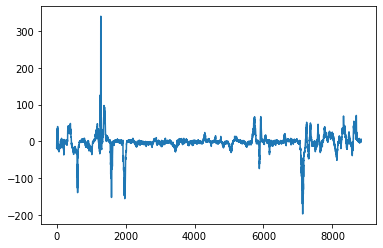

In [16]:
from matplotlib import pyplot as plt
plt.plot(predictions_list)
plt.show()

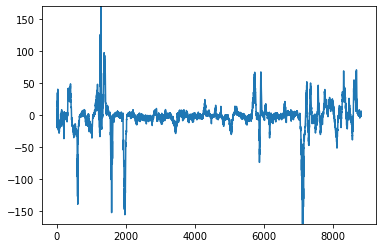

In [17]:
from matplotlib import pyplot as plt
plt.plot(predictions_list)
plt.ylim(-170, 170)
plt.show()

In [18]:
import numpy as np
import matplotlib.pylab as plt

def running_mean(x, N):
        cumsum = np.cumsum(np.insert(x, 0, 0)) 
        return (cumsum[N:] - cumsum[:-N]) / float(N)

def get_smoothness_score(series):
    
    smooth = running_mean(series, 9)
    diff = series[4:-4] - smooth
    
    smoothness = 1/np.mean(np.abs(diff))
    print(smoothness)
    return smoothness


#time = np.linspace(0, 100, 100)
#clean = np.sin(time/100)
#noise = np.random.normal(0,0.1,100)
#noisy = clean+noise

#get_smoothness_score(noisy)

#plt.plot(time, noisy)
#plt.show()

In [19]:
get_smoothness_score(ground_truth)

2.486711767072478


2.486711767072478

In [20]:
get_smoothness_score(predictions_list)

0.44465998674862633


0.44465998674862633

8.039450806217355


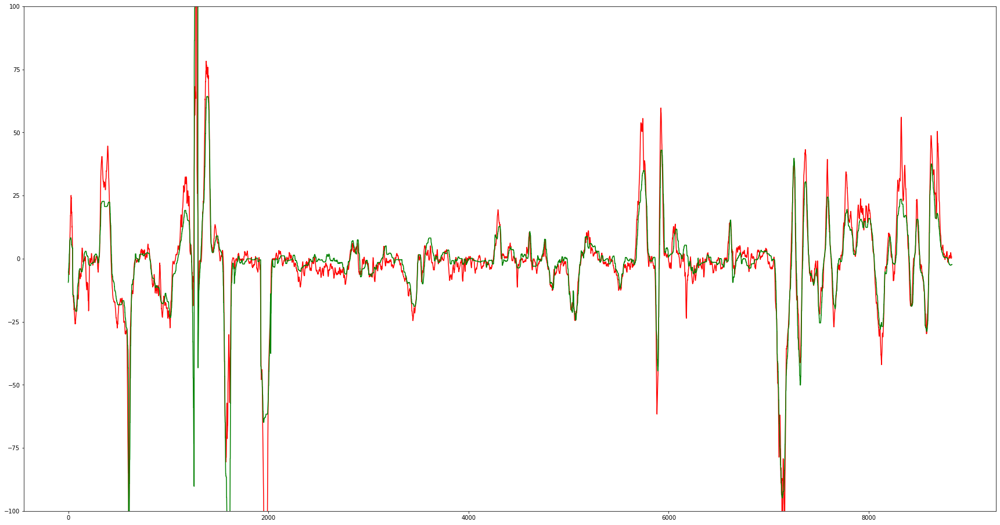

In [21]:
idxs = np.linspace(0, len(ground_truth), len(ground_truth))

plt.figure(figsize=(30,16))

#plt.show()
#plt.plot(idxs, predictions_list)

plt.ylim(-100,100)
smooth_idxs = idxs[4:-4]
smooth = running_mean(predictions_list, 9)
plt.plot(smooth_idxs, smooth, color = 'red')

super_smooth_idxs = idxs[20:-20]
super_smooth = running_mean(predictions_list, 41)
#plt.plot(super_smooth_idxs, super_smooth)

get_smoothness_score(super_smooth)


plt.plot(idxs, ground_truth, color = 'green')

plt.show()

In [22]:
get_smoothness_score(smooth)

2.0172357738268443


2.0172357738268443

# Links/Rechts Tendenz

In [23]:
np.mean(ground_truth)

-1.7809114583333334

In [24]:
np.mean(predictions_list)

-1.6714503975115365

# Test Shift-Verhalten:

In [25]:
from matplotlib import pyplot as plt
import ipywidgets as widgets
from ipywidgets import interact
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib as mpl

mpl.rcParams['figure.figsize'] = [12, 12]
mpl.rcParams['figure.dpi'] = 72

def show_crop(index, shift):
    frame = val_set.get_cropped_frame(index, shift)[0]
    frame_arr = img_to_array(frame)/255
    plt.imshow(frame_arr)
    plt.show()
    
crop_slider = widgets.IntSlider(min=0, max=val_set.get_batch_size()*len(val_set)-1, continuous_update=False)
shift_slider = widgets.IntSlider(min=-100, max=100, continuous_update=False)

interact(show_crop, index=crop_slider, shift = shift_slider);

interactive(children=(IntSlider(value=0, continuous_update=False, description='index', max=8831), IntSlider(va…

In [26]:
gui = AutopilotGUI()

predictions_lists = []
render_list = []

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(model_name + '_shift_behaviour.avi',fourcc, 15.0, (848,170))

frames = range(0, val_set.get_batch_size()*len(val_set)-1, 50)

shifts = range(-100,100,4)


for frame_idx in frames:
    predictions_lists.append([])
    for shift in shifts:
        cropped_sample = val_set.get_cropped_frame(frame_idx, shift, offset=0)
        cropped_frame = cropped_sample[0]
        actual_swa = cropped_sample[1]['steering_wheel_angle']*90
        test_data = np.expand_dims(cropped_frame, axis=0)
        predictions = loaded_model.predict(test_data)
        predicted_swa = predictions[0][0]*90
        predictions_lists[-1].append({'shift':shift, 'actual':actual_swa, 'predicted':predicted_swa})



        gui.set_frame(cropped_frame)
        gui.set_show_overlay(True)
        gui.set_engaged(False)
        gui.set_recording(False)

        gui.set_timestring('')

        velocity = cropped_sample[1]['speed']
        gui.set_velocity(velocity)

        gui.set_actual_swa(actual_swa)
        gui.set_predicted_swa(predicted_swa)

        print("Ground-truth: " +str(actual_swa))
        print("Prediction: " + str(predicted_swa))

        gui.render()
        frame = gui.get_rendered_gui()

        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        out.write(rgb_frame.astype(np.uint8))
    
out.release()

AttributeError: 'RoadDataset' object has no attribute 'get_cropped_frame'

In [ ]:
print(predictions_lists)

In [ ]:
good_predictions = []
for prediction_list in predictions_lists:
    predictions = [element['predicted'] for element in prediction_list]
    ground_truths = [element['actual'] for element in prediction_list]
    base_pred = predictions[len(predictions)//2]
    base_gt = ground_truths[len(ground_truths)//2]
    error = abs(base_gt - base_pred)
    
    linewidth = 0.2
    if error < 10:
        linewidth = 0.2
        good_predictions.append(predictions)
    #plt.plot(shifts, np.asarray(prediction_list), linewidth = 0.5)
    plt.plot(shifts, np.asarray(predictions)-base_pred, linewidth = linewidth)

median_predictions = np.median(good_predictions, axis=0)
plt.plot(shifts, np.asarray(median_predictions)-median_predictions[len(median_predictions)//2], linewidth = 3)

plt.xlabel("shift (px)")
plt.ylabel("swa offset (deg)")
plt.grid()
plt.show()



# Lenkrad Winkelgeschwindigkeit

In [ ]:
speeds = velocity_list[:]
angles = ground_truth[:] # deg
fps = 15
angular_speed = np.diff(angles)*fps # deg/s


idxs = range(1, len(angles)+1)
print(len(angles))
#print(angles)
print(len(angular_speed))
#print(angular_speed)

plt.plot(idxs, angles)
#plt.plot(idxs[:len(angular_speed)], angular_speed)
plt.xlabel("frame idx")
plt.ylabel("swa (deg)")
plt.show()


In [ ]:
speeds = np.asarray(speeds)
abs_angles = abs(np.asarray(angles))
abs_angular_speed = abs(angular_speed)

In [ ]:
# get indices where abs(swa) > 45
invalid_angle_indxs = np.argwhere(abs_angles>45)

# get indices where speed < 25
invalid_speed_indxs = np.argwhere(speeds[:-1]<25)

In [ ]:
# remove samples from angular speed array
abs_angular_speed[invalid_angle_indxs] = 0
abs_angular_speed[invalid_speed_indxs] = 0

In [ ]:
plt.plot(idxs[:len(abs_angular_speed)], abs_angular_speed)
plt.xlabel("frame idx")
plt.ylabel("swa abs(deg/s)")
plt.show()

In [ ]:
qs = list(range(60,90,5))
qs.extend(list(range(90,101,1)))

for q in qs:
    print("{}th: {} deg/s".format(q, round(np.percentile(abs_angular_speed, q=q),1)))